In [1]:
pwd

'/home/mohit/Downloads/code_notebooks/notebooks'

In [2]:
import mdtraj as md
import numpy as np

In [3]:
filename = '/scratch/mohit.kumargupta/DESRES-Trajectory_2JOF-0-protein/2JOF-0-protein/2JOF-0-protein-000.dcd'
filename = '/home/mohit/JoinedLongTraj.xtc'
top = '/home/mohit/system.pdb'

In [4]:
traj = md.load(filename,top = top)

In [6]:
topology = traj.topology

In [7]:
print(topology)
print('Fifth atom: %s' % topology.atom(4))
print('All atoms: %s' % [atom for atom in topology.atoms])

<mdtraj.Topology with 1 chains, 20 residues, 272 atoms, 278 bonds>
Fifth atom: ASP1-CB
All atoms: [ASP1-N, ASP1-CA, ASP1-C, ASP1-O, ASP1-CB, ASP1-CG, ASP1-OD1, ASP1-OD2, ASP1-HA, ASP1-HB2, ASP1-HB3, ASP1-H, ASP1-H2, ASP1-H3, ALA2-N, ALA2-CA, ALA2-C, ALA2-O, ALA2-CB, ALA2-H, ALA2-HA, ALA2-HB1, ALA2-HB2, ALA2-HB3, TYR3-N, TYR3-CA, TYR3-C, TYR3-O, TYR3-CB, TYR3-CG, TYR3-CD1, TYR3-CD2, TYR3-CE1, TYR3-CE2, TYR3-CZ, TYR3-OH, TYR3-H, TYR3-HA, TYR3-HB2, TYR3-HB3, TYR3-HD1, TYR3-HD2, TYR3-HE1, TYR3-HE2, TYR3-HH, ALA4-N, ALA4-CA, ALA4-C, ALA4-O, ALA4-CB, ALA4-H, ALA4-HA, ALA4-HB1, ALA4-HB2, ALA4-HB3, GLN5-N, GLN5-CA, GLN5-C, GLN5-O, GLN5-CB, GLN5-CG, GLN5-CD, GLN5-NE2, GLN5-OE1, GLN5-H, GLN5-HA, GLN5-HB2, GLN5-HB3, GLN5-HG2, GLN5-HG3, GLN5-HE21, GLN5-HE22, TRP6-N, TRP6-CA, TRP6-C, TRP6-O, TRP6-CB, TRP6-CG, TRP6-CD1, TRP6-CD2, TRP6-CE2, TRP6-CE3, TRP6-NE1, TRP6-CZ2, TRP6-CZ3, TRP6-CH2, TRP6-H, TRP6-HA, TRP6-HB2, TRP6-HB3, TRP6-HD1, TRP6-HE1, TRP6-HE3, TRP6-HZ2, TRP6-HZ3, TRP6-HH2, LEU7-N, LEU7-CA

In [8]:
print('Second residue: %s' % traj.topology.residue(1))
print('All residues: %s' % [residue for residue in traj.topology.residues])

Second residue: ALA2
All residues: [ASP1, ALA2, TYR3, ALA4, GLN5, TRP6, LEU7, ALA8, ASP9, GLY10, GLY11, PRO12, SER13, SER14, GLY15, ARG16, PRO17, PRO18, PRO19, SER20]


In [9]:
atom = topology.atom(10)
print('''Hi! I am the %sth atom, and my name is %s. 
I am a %s atom with %s bonds. 
I am part of an %s residue.''' % ( atom.index, atom.name, atom.element.name, atom.n_bonds, atom.residue.name))

Hi! I am the 10th atom, and my name is HB3. 
I am a hydrogen atom with 1 bonds. 
I am part of an ASP residue.


In [10]:
selection = topology.select_expression('name CA')

In [11]:
print([atom.index for atom in topology.atoms if atom.name == "CA" ])

[1, 15, 25, 46, 56, 73, 97, 116, 126, 138, 145, 152, 166, 177, 188, 195, 219, 233, 247, 261]


In [12]:
CA_Index= [atom.index for atom in topology.atoms if atom.name == "CA" ]

In [13]:
CAtraj = []
for snapshot in traj:
    atoms = []
    for index in CA_Index:
        atoms.append(snapshot.xyz[0][index])
    CAtraj.append(np.asarray(atoms))
CAtraj = np.asarray(CAtraj)

In [14]:
print(CAtraj[100:])

[[[ 0.312       1.3110001  -0.531     ]
  [-0.006       1.3740001  -0.33400002]
  [-0.07300001  1.182      -0.015     ]
  ...
  [ 0.423       0.66        0.08400001]
  [ 0.5         0.98700005 -0.12200001]
  [ 0.84900004  1.1170001  -0.064     ]]

 [[-0.53800005  0.49500003 -1.065     ]
  [-0.16700001  0.551      -0.98100007]
  [-0.044       0.27800003 -0.74700004]
  ...
  [-0.36800003 -0.42600003 -1.069     ]
  [-0.46600002 -0.16100001 -1.3410001 ]
  [-0.282      -0.22500001 -1.6760001 ]]

 [[-0.808       0.13000001 -1.6580001 ]
  [-0.84900004  0.38300002 -1.3870001 ]
  [-0.92200005  0.30100003 -1.0070001 ]
  ...
  [-0.402      -0.20300001 -0.85400003]
  [-0.42700002 -0.104      -1.23      ]
  [-0.126      -0.045      -1.455     ]]

 ...

 [[-0.734      -1.9130001  -1.5350001 ]
  [-0.541      -1.5910001  -1.516     ]
  [-0.75200003 -1.44       -1.2370001 ]
  ...
  [-0.666      -0.69000006 -1.4200001 ]
  [-0.60700005 -0.97900003 -1.672     ]
  [-0.72700006 -0.994      -2.019     ]]

 [

In [15]:
contact =[]
for atom_ind in range(len(CAtraj[0])):
    dis = []
    for second_atom in range(atom_ind+7, len(CAtraj[0])):
        dist = np.linalg.norm(CAtraj[0][atom_ind]- CAtraj[0][second_atom])
        if(dist<1):
            contact.append([atom_ind,second_atom])
print(contact)

[[0, 17], [0, 18], [0, 19], [1, 17], [1, 18], [1, 19], [2, 10], [2, 17], [2, 18], [2, 19], [3, 10], [3, 18], [4, 17], [4, 18], [5, 15], [5, 16], [5, 17], [5, 18], [6, 17], [6, 18], [8, 15], [10, 17], [10, 18]]


In [16]:
cont = []
for snapshot in CAtraj:
    totalNumberOfResiduesInContact = 0
    for atom_ind in range(len(snapshot)):
        NumberOfResiduesInContact = 0
        for second_atom in range(atom_ind + 7, len(snapshot)):
            dist = np.linalg.norm(snapshot[atom_ind]- snapshot[second_atom])
            if(dist<1):
                NumberOfResiduesInContact += 1
        totalNumberOfResiduesInContact += NumberOfResiduesInContact
    cont.append(totalNumberOfResiduesInContact)
    print(cont[-1])

23
15
20
18
19
16
18
19
18
23
22
20
22
21
23
21
23
26
26
24
26
28
22
27
23
25
25
24
22
23
22
23
25
21
21
21
26
22
19
22
24
25
24
22
22
20
24
18
23
20
22
22
23
23
22
25
24
21
22
22
26
23
23
24
21
21
22
24
23
18
22
24
21
20
22
21
21
21
25
22
23
22
23
21
23
26
25
23
22
24
21
26
24
25
18
23
24
21
7
22
18
13
18
24
21
24
20
21
25
23
21
15
20
18
19
21
24
20
19
22
21
23
22
21
21
19
20
22
21
22
20
21
22
23
21
23
21
17
22
22
20
17
22
21
19
21
21
23
21
23
21
22
18
21
15
16
20
23
24
17
22
22
24
24
22
22
18
20
12
13
17
23
23
20
20
17
18
19
17
17
27
24
16
19
23
17
24
18
21
20
18
21
21
19
22
21
19
20
15
16
20
24
21
22
18
20
15
19
25
23
23
21
27
20
20
18
25
21
24
21
24
22
21
23
22
19
17
17
24
18
18
19
20
20
19
23
21
9
20
14
19
20
20
17
13
19
20
23
24
17
9
20
19
21
20
21
22
23
21
21
20
21
22
21
21
20
20
25
19
19
20
17
24
21
15
21
18
18
17
19
14
20
15
20
22
15
21
18
23
22
20
21
17
18
16
21
19
25
21
23
17
19
20
23
18
15
18
16
22
13
20
20
19
15
17
20
18
18
15
19
21
12
19
17
14
19
20
18
14
24
20
17
13
17
1

23
20
30
15
20
16
15
20
20
26
26
19
9
23
27
25
21
32
18
17
16
16
18
28
23
29
29
21
19
22
20
20
14
19
20
19
20
24
26
19
17
18
18
20
19
16
20
20
17
20
18
15
10
12
13
14
3
5
3
2
1
1
9
12
14
10
7
0
0
0
0
0
0
5
1
6
0
0
0
0
0
0
14
15
20
15
17
15
18
18
15
20
26
32
20
28
26
23
20
21
21
16
18
14
19
13
14
15
12
13
22
23
11
15
17
10
10
15
17
4
2
2
1
0
2
0
0
0
0
0
1
1
5
5
0
0
0
0
0
0
3
24
27
29
30
27
30
27
34
31
21
14
12
0
0
1
1
1
0
1
1
13
8
3
8
9
21
2
14
4
6
12
4
6
12
11
29
30
12
23
21
18
23
34
29
33
25
35
34
33
27
30
32
32
31
22
25
35
26
21
30
32
31
29
30
28
31
30
23
12
6
1
1
6
8
13
18
12
9
13
8
8
14
13
10
14
20
10
15
13
6
16
2
26
29
28
26
17
23
17
7
22
17
13
12
19
22
21
7
15
3
7
2
3
11
7
7
6
5
1
4
12
10
0
0
0
0
0
0
0
0
0
8
0
3
0
4
6
8
8
12
0
6
2
0
6
8
3
17
9
0
6
0
8
13
12
11
3
16
21
5
0
0
0
0
2
0
7
7
8
6
5
5
26
11
11
12
8
11
10
11
25
17
12
14
14
14
9
11
14
14
10
10
10
7
14
18
16
13
19
18
16
8
18
16
19
12
17
17
11
10
6
16
22
18
24
16
16
14
15
13
19
11
19
15
14
23
18
21
12
19
9
22
11
17
18
13
20


28
21
23
16
20
14
18
16
17
20
29
30
27
19
29
23
26
32
31
28
22
32
32
32
20
21
31
39
29
31
28
19
27
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
11
1
1
8
5
10
12
3
7
1
14
4
1
0
0
8
18
14
15
21
14
10
20
6
4
2
18
23
28
21
22
27
9
11
6
0
4
1
15
18
15
31
34
8
3
1
11
18
29
14
14
7
5
2
2
7
18
3
4
15
0
0
0
0
6
0
0
0
2
0
4
0
1
8
2
9
1
7
2
5
0
2
24
20
6
0
0
0
0
2
0
0
2
15
5
6
4
5
8
8
5
11
11
12
17
18
30
22
20
17
18
25
20
30
31
23
29
18
25
29
27
18
25
26
25
27
21
27
25
8
8
10
13
22
14
9
9
11
0
17
9
13
1
1
11
23
31
25
34
27
29
37
25
15
22
33
29
20
26
18
15
9
1
10
12
19
20
18
23
18
16
6
12
25
35
36
37
40
36
42
35
40
41
39
38
37
39
39
40
37
37
38
38
32
36
37
41
38
38
37
43
37
37
39
34
37
39
38
36
38
38
36
38
35
40
36
38
36
31
45
35
37
40
32
39
37
38
34
40
38
39
39
39
38
35
33
39
36
36
40
31
36
37
38
37
40
35
40
46
40
37
38
40
37
36
40
36
36
38
39
40
38
37
38
38
36
39
35
30
39
35
34
36
39
38
38
37
39
40
39
31
38


21
28
26
23
32
23
24
24
25
26
23
25
22
22
25
23
24
24
23
22
27
22
23
30
27
35
25
20
25
26
21
22
27
26
29
21
26
25
23
22
31
25
24
28
27
34
26
23
21
24
24
22
26
28
24
20
33
34
22
23
25
25
25
28
27
24
23
23
24
31
21
23
24
23
24
30
23
25
30
26
29
21
25
25
32
33
34
22
28
33
26
22
30
30
25
13
16
11
16
9
16
32
26
29
25
26
37
30
19
16
19
26
15
15
15
17
14
14
16
15
18
16
18
18
17
15
15
19
33
29
27
30
28
26
32
39
35
37
19
26
29
25
25
25
29
27
25
30
23
25
21
25
28
22
22
26
22
25
28
25
27
32
30
26
27
28
31
31
30
28
26
27
27
19
30
26
28
29
26
29
27
27
23
27
27
26
27
27
24
27
26
27
29
25
27
27
30
27
31
28
30
29
25
26
29
30
28
24
25
26
28
26
27
23
27
30
31
29
23
27
25
28
29
28
27
26
28
29
27
29
30
27
25
24
29
29
26
27
28
32
28
26
23
23
25
25
27
26
27
29
26
25
31
32
25
19
32
25
26
27
30
28
30
28
24
26
28
25
24
23
25
23
28
26
24
20
26
23
21
27
20
31
24
38
35
26
26
31
31
28
27
24
21
29
27
23
28
28
27
25
22
29
25
24
25
26
22
22
25
27
22
30
32
25
32
25
38
43
40
42
43
37
38
34
35
34
35
36
42
32
37
36
36
37

19
19
19
22
18
19
18
20
29
28
37
35
33
20
14
12
9
24
24
22
24
22
29
26
26
24
22
25
23
28
25
24
19
23
26
31
23
28
26
21
14
19
21
18
18
15
28
19
20
22
21
19
23
19
23
23
23
23
26
28
28
31
30
25
26
27
27
28
31
37
26
27
38
33
27
36
32
28
24
29
22
24
25
24
25
24
23
26
22
26
28
27
26
28
26
24
25
26
27
28
28
32
29
23
26
36
38
23
25
27
25
25
27
21
35
25
23
25
23
25
20
17
10
15
11
12
8
21
10
3
5
3
1
8
9
7
6
10
6
7
8
7
9
6
9
9
2
2
17
7
10
8
7
14
5
6
10
17
21
18
19
17
17
19
14
18
16
17
19
13
11
2
10
15
18
23
22
0
4
4
4
0
0
15
0
0
11
0
0
0
0
0
0
0
0
0
1
0
0
0
0
9
16
4
12
10
3
0
2
3
0
0
9
18
7
1
0
0
4
3
0
7
10
22
24
22
22
25
23
25
23
24
23
22
12
11
13
13
19
21
17
15
15
5
6
6
10
17
1
0
0
0
1
0
0
1
0
0
2
3
12
2
7
2
2
7
3
0
6
0
6
0
0
2
2
3
0
2
22
10
6
6
16
0
11
6
1
16
20
20
10
13
17
11
4
11
6
13
11
15
13
6
10
18
4
10
5
1
7
13
8
9
13
23
23
15
10
23
20
21
27
25
13
19
26
27
20
25
22
24
24
20
15
19
17
22
23
22
24
25
24
23
16
9
17
26
23
29
17
21
22
8
14
32
23
14
24
31
7
0
5
4
0
2
2
2
5
11
10
3
12
7
16
0
1
0

13
17
18
20
19
25
15
25
22
23
24
29
22
31
34
37
38
41
39
30
30
28
0
5
28
29
27
31
23
27
22
25
23
20
20
22
30
10
3
3
4
0
0
0
4
0
7
9
23
7
8
12
9
10
10
3
6
12
0
0
2
2
2
0
9
0
8
17
16
9
4
2
4
8
7
13
15
16
10
20
24
25
13
26
20
26
32
29
29
28
30
25
30
28
25
22
18
28
24
27
6
18
3
16
28
28
12
12
16
0
0
6
0
0
0
11
0
0
16
6
13
27
25
21
27
20
8
28
8
27
24
25
12
17
13
13
4
18
23
25
21
22
32
17
35
36
25
13
18
14
12
14
29
29
32
34
32
35
30
32
24
36
40
23
3
28
23
23
31
26
10
20
29
33
36
33
33
32
30
33
23
30
26
19
31
35
32
33
34
33
35
30
27
33
32
31
23
3
10
0
0
0
0
0
9
4
0
0
5
10
2
3
0
0
0
0
0
0
0
2
0
0
0
0
0
1
0
0
0
3
2
3
7
20
15
18
13
9
17
4
3
3
4
0
8
0
1
3
14
0
0
24
0
0
9
7
15
22
23
17
14
26
33
27
30
28
24
24
26
18
19
31
16
19
22
27
23
19
22
15
13
19
23
25
27
27
24
30
21
20
7
9
3
10
8
10
10
10
7
6
3
13
15
13
15
17
19
16
15
22
22
7
3
0
21
22
11
19
10
14
12
12
14
22
16
21
20
12
12
20
19
19
35
31
25
12
9
20
26
14
2
2
11
17
27
16
19
23
21
22
16
15
20
11
14
21
28
27
16
7
13
10
6
11
10
14
10
4
10
6
5
3


0
0
1
4
1
0
4
2
0
0
0
0
0
3
1
1
0
7
0
3
0
0
0
0
10
19
6
1
9
1
0
3
0
3
3
7
36
34
16
14
11
16
22
30
14
24
23
21
24
23
22
20
26
26
33
25
26
25
23
26
27
24
27
24
33
27
32
21
29
29
19
20
28
26
31
27
21
22
15
20
7
4
0
7
18
14
20
5
10
6
25
11
9
0
1
6
6
0
32
20
21
6
8
8
8
9
3
8
10
17
3
5
1
22
1
0
0
0
8
25
12
16
17
16
16
16
18
8
4
1
15
1
1
0
7
5
2
3
13
7
4
33
31
41
36
29
36
43
40
34
35
26
9
4
17
3
1
0
2
2
1
2
0
5
0
1
0
0
1
10
10
5
1
11
9
9
24
14
11
8
13
17
23
23
11
21
0
0
0
0
1
2
0
3
0
4
3
0
11
18
20
20
19
21
19
19
15
26
17
17
15
15
14
17
16
15
16
13
22
16
11
18
19
18
17
16
22
21
18
19
13
9
16
17
17
19
17
9
18
18
15
19
16
15
17
19
18
13
22
18
16
12
11
21
14
15
30
28
29
23
26
27
30
26
30
27
27
25
26
25
27
25
24
26
30
25
27
40
25
18
13
17
26
23
28
24
26
24
29
32
30
27
26
22
23
20
24
23
32
35
33
34
23
33
36
26
29
27
29
32
32
38
29
34
34
32
29
36
24
35
27
32
27
33
31
30
24
23
26
23
23
22
25
25
26
22
29
26
26
22
24
21
21
23
22
23
23
21
22
28
33
31
35
33
39
31
30
31
27
21
21
30
25
29
22
19
26
24
21
2

18
20
21
19
13
20
13
21
13
23
22
23
13
6
18
25
25
20
15
18
18
18
23
18
23
26
26
14
17
17
20
17
13
17
21
19
21
20
19
21
21
17
17
19
18
20
17
18
16
16
22
17
15
20
15
16
13
20
17
20
20
20
22
19
18
20
21
22
21
21
22
21
19
16
15
15
22
15
19
19
12
16
17
13
19
16
17
19
19
20
19
18
22
19
19
18
18
15
20
15
19
19
17
18
15
19
13
18
18
18
16
20
18
19
19
18
17
18
26
21
19
18
18
20
17
16
20
15
16
20
18
19
22
19
19
19
22
22
19
21
21
15
21
22
19
22
19
19
23
20
19
12
16
19
19
20
19
22
21
21
19
22
22
14
20
24
17
13
21
22
18
21
20
21
18
16
19
18
22
22
18
19
23
17
21
19
21
18
20
20
21
21
23
24
23
22
22
25
18
21
20
22
22
20
22
24
22
14
25
19
20
18
23
18
20
23
21
31
19
26
14
13
7
16
18
17
17
16
18
24
22
17
16
17
22
25
18
23
18
12
19
23
29
19
17
16
18
16
19
22
19
16
21
21
17
15
17
20
19
19
15
17
20
15
18
21
17
24
21
15
24
20
14
22
21
21
23
24
19
21
11
12
10
14
25
25
22
19
25
21
18
22
23
22
19
14
20
21
18
18
14
16
22
25
30
29
22
18
20
24
21
23
19
21
23
19
26
20
31
31
36
38
27
11
27
12
13
20
18
24
21
15
20
21


17
19
18
16
19
20
22
18
20
16
20
17
18
18
20
17
18
18
15
15
19
22
21
17
19
26
23
23
22
15
16
19
13
18
20
19
18
21
20
17
21
23
18
17
15
14
18
16
15
20
17
17
22
23
17
12
17
23
17
16
19
22
15
20
17
22
19
21
19
16
19
25
18
19
15
16
15
18
19
21
20
20
18
17
18
13
17
15
18
21
21
18
25
21
22
19
24
18
8
22
12
18
17
17
21
18
22
18
18
20
17
20
24
18
18
16
16
17
19
15
19
18
20
18
17
17
20
19
14
18
20
20
21
19
23
16
15
19
19
22
20
20
22
20
22
17
20
22
16
16
18
21
16
19
20
17
18
19
15
21
20
22
15
18
28
21
19
20
20
19
15
22
18
24
23
18
21
24
20
23
19
16
23
21
18
19
21
26
19
23
21
23
20
19
16
21
23
21
16
22
18
13
18
17
21
20
22
19
20
21
18
26
21
22
23
22
20
24
19
20
18
23
13
22
19
18
19
19
19
19
15
18
15
16
15
17
19
18
16
20
17
15
19
21
11
20
17
16
20
18
20
15
21
17
18
17
19
18
15
20
18
19
22
19
20
15
20
18
18
16
13
20
18
18
19
21
16
24
23
20
15
19
16
21
19
18
20
22
16
16
17
14
15
16
15
17
18
19
20
17
18
22
16
17
18
17
20
20
21
21
20
21
16
18
20
16
20
19
18
22
18
18
14
19
21
18
20
18
21
18
16
12
21
17

27
33
29
32
32
29
31
32
31
35
29
33
35
34
30
30
28
9
3
17
4
0
0
6
19
18
0
0
4
1
0
0
14
6
0
0
2
2
16
9
1
1
7
2
1
4
5
2
2
5
14
11
13
12
24
39
35
37
37
37
39
37
35
32
38
37
40
38
39
34
36
35
30
39
34
35
32
36
44
38
35
32
40
26
26
27
31
33
26
28
30
34
35
37
35
12
13
26
6
6
7
6
14
9
8
4
8
9
8
13
12
21
19
19
22
17
25
9
7
19
20
28
25
28
26
21
19
15
30
31
27
29
26
30
25
22
15
17
17
21
17
21
16
15
19
26
27
25
24
27
35
25
15
24
16
19
20
21
20
22
20
21
28
27
17
19
26
26
28
29
29
28
23
33
27
24
32
26
32
31
29
32
26
19
34
21
21
28
21
20
25
16
14
14
16
16
13
4
29
12
3
19
12
23
29
30
23
9
21
4
8
12
18
19
23
10
14
14
9
9
11
2
5
2
5
0
7
0
4
5
4
3
1
5
0
0
0
0
2
2
8
5
6
2
12
13
2
0
1
2
1
0
1
8
1
5
3
1
0
0
1
1
6
9
5
5
4
1
4
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
0
4
0
2
0
6
9
9
6
0
4
1
0
3
7
0
0
2
0
7
0
4
1
6
0
0
1
2
13
5
17
7
9
7
9
3
7
0
1
4
8
5
21
29
17
17
4
27
17
20
18
21
17
16
16
19
20
20
7
8
10
12
16
9
8
11
10
2
1
1
3
1
1
1
0
0
0
0
16
20
6
4
3
15
2
0
3
1
7
19
29
9
3
2
1
6
7
10
2
0
0
0
0
0
0
0
1
10
6
2
0
8
2
0

23
13
15
19
20
20
18
17
15
21
20
18
18
19
17
21
20
36
38
33
31
35
34
30
34
33
34
36
33
39
37
36
38
40
34
35
35
36
22
31
40
46
40
43
44
44
35
38
39
40
36
43
42
40
43
38
40
34
35
42
31
35
36
41
37
35
31
32
32
31
30
39
19
23
38
25
40
39
36
17
17
19
26
21
27
35
33
29
30
20
28
29
30
35
31
36
26
32
40
33
33
37
34
30
33
32
27
17
33
31
25
33
23
16
17
20
15
20
19
22
32
35
34
31
31
36
33
40
33
32
35
29
34
26
33
31
29
31
28
34
25
19
28
30
32
19
18
16
25
18
13
20
24
23
21
23
24
15
17
20
18
16
22
22
17
19
16
13
19
16
18
12
18
18
25
18
23
18
21
30
20
27
17
14
16
19
20
13
19
14
16
17
16
19
14
13
17
13
18
18
17
18
15
19
14
25
16
18
16
15
17
20
16
22
25
13
14
12
18
18
18
16
18
15
11
14
17
19
21
14
10
29
19
20
22
21
16
11
12
10
18
17
18
15
13
16
13
19
17
17
25
20
19
12
12
10
33
17
15
20
24
21
18
20
28
30
26
13
10
10
7
23
9
19
23
23
32
17
18
17
19
17
16
16
21
18
14
15
16
13
14
14
17
15
16
17
16
18
14
16
17
15
15
16
12
14
19
15
19
19
12
12
15
15
11
14
16
14
14
14
12
7
6
0
0
0
1
1
0
8
4
6
6
22
17
19
18
18


5
10
25
24
14
9
23
22
21
22
23
19
29
24
23
19
13
16
29
21
21
23
26
22
19
21
23
24
18
20
20
23
28
34
30
14
27
24
3
1
4
0
1
0
0
3
0
11
0
0
4
0
0
0
0
0
2
0
15
12
12
26
1
0
11
25
9
2
6
7
5
6
6
1
7
6
6
0
3
9
8
4
0
5
0
3
4
0
3
3
1
18
6
0
2
12
7
10
0
3
12
19
12
15
19
8
8
12
25
11
11
13
17
20
30
22
27
27
18
18
9
6
4
6
3
7
2
4
0
3
3
21
26
19
2
5
8
19
9
16
10
25
22
6
8
14
13
0
0
0
0
0
0
0
3
0
9
3
7
7
5
6
4
6
5
8
5
4
17
8
17
5
8
13
19
11
9
10
13
4
3
6
6
5
7
10
9
10
6
14
5
0
2
5
13
6
5
4
4
0
0
10
2
1
0
2
0
4
2
1
10
13
0
0
0
0
0
0
2
0
3
0
0
0
7
17
20
11
5
0
4
0
2
1
1
8
0
0
2
2
0
17
33
8
0
6
7
9
5
7
0
0
0
10
22
27
29
27
30
35
35
30
36
34
35
27
32
28
15
9
15
11
19
5
19
11
15
18
27
22
25
14
19
16
27
20
20
18
15
19
27
15
17
31
35
28
27
29
31
31
32
27
30
26
34
32
29
27
29
28
27
30
31
32
34
32
29
29
31
29
33
32
28
29
27
33
31
34
29
30
29
28
31
31
30
32
28
29
28
28
25
29
29
28
30
29
27
28
30
29
27
26
31
27
29
29
28
28
26
31
29
25
30
30
29
32
35
34
35
26
27
33
28
34
31
36
25
32
39
34
37
32
37
36
41
29
39
4

26
29
14
2
5
7
4
5
5
6
4
1
6
10
2
2
0
1
1
0
5
3
13
4
14
12
15
1
1
4
1
5
9
7
20
5
16
18
18
21
11
13
14
3
0
0
7
1
4
11
13
16
23
25
26
6
26
17
1
5
2
9
11
0
2
10
3
0
1
0
0
0
21
4
8
8
6
14
5
12
14
10
19
13
7
5
10
4
5
13
1
12
17
29
24
17
13
10
3
0
4
14
0
6
13
8
9
11
10
13
7
2
3
5
8
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
6
0
0
0
0
14
3
2
15
3
1
27
20
28
25
31
25
28
24
33
35
24
32
38
35
42
35
33
32
30
30
5
6
5
0
1
8
2
10
5
1
0
0
6
0
2
0
0
2
5
2
4
4
4
0
3
0
1
10
16
16
22
23
20
19
20
23
22
17
19
21
23
8
0
0
1
0
0
10
13
5
10
16
5
7
26
17
10
13
9
15
10
8
11
10
11
2
10
10
12
8
2
5
7
4
12
15
8
15
6
9
6
6
10
4
11
5
10
13
18
11
11
15
21
8
10
14
9
9
7
10
9
12
20
14
17
18
15
17
1
10
4
0
0
0
0
5
1
22
5
3
19
2
9
11
14
5
2
1
11
3
2
2
15
14
14
0
0
0
2
3
2
2
1
1
7
11
9
7
8
11
20
17
10
10
10
10
10
8
5
8
11
5
8
15
12
6
6
7
7
6
10
7
7
31
33
33
34
37
31
24
23
8
22
21
19
18
17
6
20
24
14
13
26
34
35
25
24
24
21
28
18
26
23
21
6

1
30
27
28
27
30
27
28
27
28
26
23
26
27
27
29
27
23
25
25
28
23
27
22
23
24
24
26
24
27
29
24
30
33
33
27
25
29
25
27
24
16
19
25
13
2
5
10
24
22
30
25
28
30
29
25
31
28
26
28
26
31
26
33
31
29
25
30
23
23
31
24
26
27
23
26
27
26
28
24
24
28
23
25
26
23
23
24
23
21
24
22
22
16
27
21
31
31
27
23
25
23
30
27
24
18
25
26
28
23
30
26
28
28
29
27
28
29
33
29
22
29
31
27
30
26
26
29
25
21
26
24
25
25
25
25
25
27
24
29
25
27
28
24
17
23
23
28
26
27
28
25
21
12
9
13
22
15
12
12
12
17
15
24
21
18
23
25
26
21
25
26
23
26
24
22
37
18
25
20
23
21
21
22
22
23
25
24
29
35
31
26
22
22
28
28
35
31
30
27
33
25
29
30
24
23
24
27
23
21
22
26
21
20
25
17
28
28
35
34
37
38
35
31
19
23
16
13
8
8
16
19
24
20
16
25
27
11
5
20
6
16
13
14
5
26
13
9
10
15
4
5
11
7
8
3
7
15
8
0
6
5
6
3
1
1
0
1
0
0
0
0
1
0
0
1
8
6
2
7
1
6
12
6
9
7
28
14
16
13
5
1
7
12
11
12
10
12
9
9
1
7
25
7
16
11
19
22
14
9
35
22
22
10
21
30
25
23
35
20
10
17
0
7
2
4
14
14
13
15
17
15
15
14
15
23
4
8
26
26
13
20
2
16
6
0
1
4
0
4
4
2
7
7
3
6
15


29
34
29
28
30
30
26
33
31
27
30
25
28
25
31
29
34
29
27
29
29
32
28
31
25
30
30
29
26
33
31
27
29
28
29
31
29
27
32
36
31
30
32
23
35
27
35
32
27
27
35
38
34
33
35
35
31
27
34
30
24
31
30
31
35
31
30
29
34
33
30
31
32
33
28
28
30
29
27
29
30
35
34
28
29
31
34
31
30
30
33
27
26
24
29
36
29
25
30
30
31
31
35
30
28
31
30
33
29
32
29
32
35
30
28
28
31
30
33
27
33
30
32
36
27
30
28
33
24
28
30
33
35
30
28
26
33
25
34
30
24
32
28
35
36
30
33
31
30
32
28
32
31
34
28
34
25
26
33
27
29
29
36
24
29
27
25
29
22
30
29
28
25
28
34
22
34
35
34
29
32
29
32
27
30
28
27
36
34
32
27
29
27
27
33
33
28
25
30
32
35
28
29
31
36
29
29
34
30
34
33
37
30
25
29
34
28
29
31
33
30
28
27
28
26
26
27
13
7
21
22
4
5
0
1
0
3
9
14
8
20
4
0
0
0
0
2
0
4
0
1
0
3
12
10
10
8
12
12
18
15
15
13
8
18
25
21
18
22
25
17
0
8
14
30
20
22
16
23
24
22
24
27
18
28
18
0
19
17
2
11
15
8
9
15
9
7
19
12
20
13
13
27
25
17
5
0
0
0
0
4
2
11
21
24
20
21
27
23
23
22
14
16
17
14
25
14
8
6
23
18
19
8
21
24
20
21
25
18
19
20
21
22
23
24
26
26


9
2
7
1
7
3
2
0
0
1
2
1
3
10
3
2
3
5
2
6
7
0
0
0
0
0
0
0
0
0
0
11
2
0
11
18
28
14
18
0
0
0
7
1
0
1
14
0
12
1
12
24
8
2
3
15
10
3
3
1
0
0
0
0
1
0
7
4
6
2
4
8
0
1
2
2
12
13
11
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
2
25
19
21
8
5
2
1
1
1
0
5
1
0
2
1
0
0
3
3
18
15
16
20
22
25
17
10
11
13
13
13
13
14
14
18
18
20
17
13
7
15
20
4
7
12
3
4
3
1
4
0
8
9
1
0
0
0
0
4
0
0
0
2
11
14
9
8
3
0
0
0
0
0
0
1
0
0
0
0
0
0
3
2
1
3
5
0
2
0
0
0
0
14
0
0
20
8
6
18
17
18
13
23
22
12
11
17
14
14
21
20
23
22
22
22
20
7
19
19
20
21
23
13
10
16
19
23
17
22
24
24
23
23
32
21
23
26
28
28
25
25
26
29
28
25
26
24
29
35
29
24
25
30
20
18
21
25
16
21
33
36
32
31
25
27
37
45
24
31
39
24
41
38
34
39
33
40
38
41
32
39
31
43
35
40
47
33
38
36
35
38
43
35
32
34
31
35
35
33
40
34
37
33
42
35
33
40
34
29
33
41
36
34
32
39
42
29
23
20
24
5
2
5
9
10
9
1
9
5
10
10
13
15
28
23
23
21
29
27
27
25
31
25
32
33
40
16
22
16
15
15
19
26
6
5
15
17
0
9
2
0
1
0
0
0
1
8
2
16
21
14
1
5
16
27
18
11
0
0
0
14
6
4
1
6
5
0
3
7


0
2
25
23
24
27
11
21
16
9
0
1
12
17
15
13
25
33
29
29
31
31
25
0
0
7
11
8
0
2
3
0
0
8
0
2
1
5
7
1
11
18
4
4
3
6
3
4
25
22
22
28
28
28
26
26
28
33
22
27
27
25
11
22
19
12
16
17
24
24
34
17
24
22
18
21
21
23
21
25
25
25
27
24
23
11
0
0
0
0
1
4
6
3
15
10
8
9
7
26
23
23
18
21
22
21
19
19
21
25
20
14
3
0
0
1
9
4
3
13
7
5
4
3
5
12
4
5
3
3
22
23
16
20
24
15
19
14
21
9
19
10
14
4
5
22
1
6
20
16
1
0
2
2
12
0
12
15
18
12
15
12
12
8
17
1
0
0
0
0
8
10
3
0
1
1
6
5
11
13
16
10
16
4
1
0
0
0
0
0
0
0
0
0
0
0
4
5
1
0
0
2
8
0
1
0
0
1
3
0
0
0
0
0
0
8
6
1
0
14
14
16
2
4
2
6
2
0
1
3
1
14
25
23
29
23
14
6
8
8
17
18
15
14
22
19
25
21
27
21
27
18
11
12
23
22
24
25
2
17
26
27
21
19
22
22
26
11
10
20
16
16
11
10
7
5
1
9
22
25
23
27
20
22
22
22
21
23
23
22
19
22
26
22
22
24
26
26
23
17
29
21
27
30
21
27
25
28
20
8
21
20
13
19
19
12
13
16
9
21
7
10
11
12
10
14
15
12
5
4
14
1
29
30
14
4
13
13
6
8
1
1
1
0
0
12
26
27
21
24
11
0
13
15
11
16
9
17
3
18
15
19
21
13
12
11
4
3
24
25
24
29
26
23
28
25
22
25
25
29
27
31
26


34
32
27
30
27
27
27
29
27
29
28
26
29
27
19
23
20
11
13
13
33
34
26
24
25
24
12
19
19
24
23
31
22
25
25
22
22
19
28
26
29
26
27
35
26
24
26
25
20
14
5
1
3
2
2
11
10
5
8
1
0
0
0
0
6
25
23
30
25
8
8
3
0
12
7
1
17
1
6
0
0
5
2
0
0
0
0
8
7
7
5
4
6
4
0
1
1
1
0
0
2
1
10
6
34
28
2
15
28
16
9
20
16
8
0
0
3
4
2
1
0
17
0
0
0
0
2
1
9
0
1
13
16
10
2
1
16
13
7
17
0
1
14
13
17
8
15
3
9
13
11
3
0
6
7
14
17
2
17
17
17
16
2
8
9
8
5
5
6
25
12
12
6
9
9
11
11
6
12
7
16
29
13
14
26
26
29
22
29
19
3
2
4
4
1
4
2
0
2
0
0
3
0
0
3
0
3
7
7
2
6
6
7
0
1
3
2
4
0
5
4
3
3
1
12
8
9
4
5
5
1
5
4
16
9
15
12
6
11
28
11
20
19
19
22
17
16
16
5
5
22
13
14
13
1
17
19
18
29
23
26
10
17
9
12
13
12
6
7
3
4
12
21
23
12
1
1
5
0
2
9
18
9
15
16
12
5
8
1
16
1
4
2
6
19
21
6
0
1
1
0
1
9
0
28
28
26
19
13
13
6
6
2
4
2
0
0
0
0
2
1
0
3
9
33
31
29
30
28
25
35
30
31
29
24
26
23
25
22
21
33
21
27
30
35
25
27
25
31
21
27
25
28
26
25
25
32
29
28
25
25
28
28
31
31
26
28
25
27
25
25
26
26
26
28
28
25
29
26
29
37
37
34
41
40
49
48
48
39
34
26
36
2

0
0
0
3
3
1
9
15
7
15
9
4
1
15
10
18
11
0
4
7
0
0
0
0
0
0
0
0
2
5
0
0
0
0
0
5
0
22
19
0
11
0
0
2
5
17
3
2
13
2
25
5
29
39
45
44
34
16
10
8
10
3
5
8
5
17
8
13
3
4
3
11
5
6
17
22
12
7
10
8
0
3
3
6
3
7
1
0
4
0
1
1
1
1
17
8
10
0
3
3
0
0
0
0
1
31
30
24
19
17
26
18
30
24
34
29
29
35
20
23
27
22
33
38
36
32
27
39
41
33
38
40
44
43
47
39
36
42
40
36
34
44
37
37
35
34
36
34
37
39
38
35
39
38
42
35
33
36
30
33
40
34
45
39
39
34
36
35
41
43
38
36
27
19
19
11
7
1
0
0
8
14
16
4
3
1
1
10
3
0
4
2
4
9
4
6
4
4
9
4
12
3
0
0
5
3
3
2
2
15
19
8
14
9
4
6
5
8
7
0
4
10
6
4
0
5
8
3
1
0
0
2
0
12
8
13
0
5
2
1
1
1
14
13
7
9
5
6
12
11
19
18
25
23
14
11
15
9
42
46
38
39
38
32
18
21
13
23
22
31
36
47
33
29
19
22
27
28
29
32
18
19
18
14
18
18
17
28
16
16
12
26
24
25
23
26
24
24
24
23
29
28
24
26
23
22
20
21
12
31
23
20
23
19
19
24
24
24
22
18
17
17
23
17
10
15
26
28
30
33
37
27
27
18
16
17
15
18
16
20
22
19
17
19
19
20
21
16
22
17
10
16
21
17
15
18
15
18
22
19
21
20
23
21
20
25
25
32
21
17
17
10
22
25
19
17
12
14
16


13
15
18
7
11
11
14
15
27
9
14
14
2
0
0
1
2
12
8
5
12
8
1
0
4
0
6
14
21
18
18
25
25
14
36
4
1
4
0
1
0
0
0
0
1
4
0
0
0
6
3
0
12
18
28
13
11
13
11
23
16
23
14
21
25
17
9
21
13
17
17
20
21
20
24
22
15
29
22
24
16
30
21
23
23
23
18
28
21
24
21
22
22
18
18
25
25
33
25
29
17
18
15
20
27
18
18
20
30
29
16
31
19
21
25
23
21
29
23
21
23
24
24
33
22
19
21
25
20
23
29
23
0
0
9
0
0
9
2
0
0
0
2
10
0
6
2
3
0
0
0
0
0
0
11
30
12
15
17
15
12
0
3
2
5
10
7
0
8
3
18
12
17
19
27
28
23
22
20
21
21
24
21
11
7
25
28
25
25
26
25
22
20
22
22
27
18
7
17
3
5
1
0
1
0
0
0
0
0
0
0
11
16
16
14
7
11
14
21
13
4
2
15
4
2
1
24
14
11
5
0
2
1
5
0
9
4
10
10
14
18
16
11
0
0
14
0
3
9
28
11
0
29
23
17
10
21
16
26
26
19
8
5
4
0
2
9
7
18
25
8
9
10
0
11
6
17
6
0
10
4
4
4
0
8
2
4
12
3
2
7
0
1
8
15
12
0
0
0
3
0
0
2
24
6
12
10
19
14
12
16
12
13
13
13
10
10
13
10
12
9
17
20
16
18
16
15
17
30
14
18
8
8
21
22
30
26
24
22
26
7
22
18
27
26
3
4
3
7
4
9
11
7
11
5
7
6
2
28
23
29
25
37
22
1
3
1
20
21
12
7
6
26
24
20
6
4
10
5
1
4
6
1
4
3
6
11

21
29
33
21
45
41
41
36
37
36
24
29
30
41
38
37
42
28
39
31
37
28
27
21
24
24
27
30
29
28
31
26
19
22
24
12
14
19
13
7
12
13
21
17
20
16
24
20
23
24
21
22
25
23
20
23
24
22
30
29
23
21
21
16
14
11
17
15
17
7
11
10
6
16
18
8
13
13
9
18
13
12
13
15
10
13
12
12
10
10
11
10
17
15
10
12
12
10
13
17
17
11
17
13
16
17
14
10
12
20
20
27
3
5
11
2
1
18
17
5
2
11
6
16
13
1
13
2
20
4
6
5
1
13
12
2
18
11
10
26
26
3
7
1
1
1
17
6
13
5
4
8
10
4
2
9
3
0
5
15
13
16
18
7
7
7
22
25
22
9
8
9
4
6
10
4
6
15
14
19
17
26
20
27
29
28
26
25
31
22
27
30
23
27
28
25
23
13
19
18
9
22
14
10
3
1
22
13
8
27
26
18
21
30
14
6
10
10
7
17
8
3
18
2
17
22
15
18
6
13
20
2
8
27
9
13
9
2
1
14
22
26
13
2
28
34
21
4
1
0
0
0
13
10
0
0
0
1
0
0
0
0
0
0
0
1
5
35
30
31
31
27
30
20
27
21
21
15
1
0
5
1
25
21
20
30
20
20
33
25
32
28
31
32
32
31
31
27
32
29
27
32
27
29
28
33
30
28
28
31
30
28
32
29
37
31
28
25
26
26
28
36
34
35
23
25
27
33
36
31
29
38
23
27
25
28
25
36
22
25
23
27
23
25
34
34
27
27
24
31
29
30
30
29
27
31
29
30
30
32
29


30
29
30
32
31
33
16
24
22
15
29
26
30
26
30
25
33
27
29
28
29
31
26
30
30
29
32
33
35
27
25
23
24
21
26
23
19
21
21
24
16
18
15
18
24
23
21
14
17
28
17
23
22
28
23
28
27
25
22
20
24
25
29
28
35
26
24
23
13
15
13
25
25
17
16
24
21
20
25
32
25
24
32
23
33
30
24
30
28
29
31
30
19
30
22
21
22
23
16
16
29
26
25
37
23
25
24
13
15
21
19
23
28
26
26
26
25
25
22
26
26
29
31
28
31
27
23
20
21
21
20
17
21
11
21
12
29
30
21
12
22
20
14
15
24
20
31
17
26
24
34
30
28
21
30
24
33
35
37
36
32
29
23
24
21
21
18
20
21
20
18
18
17
14
19
16
19
26
19
20
27
27
28
29
25
20
24
29
34
31
31
31
31
20
25
34
33
30
31
30
31
29
21
22
27
8
23
18
22
23
19
35
20
25
1
0
0
0
4
0
0
24
25
25
28
21
23
13
22
17
12
3
30
30
24
24
17
15
13
25
20
23
24
16
8
2
0
10
0
0
6
8
2
0
0
1
0
6
0
3
5
0
1
1
3
1
1
0
2
1
16
3
2
1
3
0
1
1
3
12
11
17
18
10
14
0
0
11
1
15
1
15
4
4
5
5
10
6
14
6
26
30
23
28
0
0
1
6
4
18
19
19
5
2
5
1
0
0
0
0
0
0
4
0
1
0
0
0
2
0
1
2
11
7
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
5
9
0
16
19
19
23
22
19
23
20
20
22
21
22
21
2

17
21
16
16
18
17
18
22
17
16
15
16
25
21
15
17
19
14
13
14
16
20
15
20
16
12
17
17
16
18
18
15
14
13
20
15
16
17
15
13
17
16
20
17
18
16
18
23
20
19
18
19
14
15
19
18
13
18
17
30
23
22
20
16
17
17
21
19
14
13
15
14
12
16
18
19
19
15
20
19
16
15
24
25
16
25
21
18
21
15
28
23
18
15
18
16
14
16
18
17
15
22
14
18
16
19
15
18
19
25
13
17
29
20
21
10
25
21
24
32
40
34
38
42
39
34
33
43
42
32
25
38
48
43
43
44
42
39
32
39
20
32
43
42
35
38
37
41
32
41
33
33
14
21
3
0
1
5
0
1
0
0
4
0
4
0
0
0
0
0
0
0
0
0
0
0
0
0
3
8
0
3
0
1
12
1
11
6
1
5
2
5
0
0
0
18
9
0
1
4
0
0
0
0
0
0
2
0
0
0
0
1
0
11
19
12
20
10
18
1
0
1
3
8
13
13
3
10
29
37
23
11
25
27
33
29
26
15
17
17
19
20
18
12
18
14
1
0
0
0
1
1
1
0
0
0
3
1
3
0
0
0
0
0
0
0
0
11
13
22
8
2
8
2
0
0
2
11
5
1
1
3
1
3
0
0
0
0
1
3
0
0
0
1
0
0
2
0
3
0
0
0
0
3
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
10
1
1
11
8
14
17
19
22
25
5
14
21
23
20
13
8
14
19
5
14
22
5
0
1
2
3
1
0
1
0
0
0
0
0
6
0
2
1
0
4
7
7
19
1
0
0
0
5
1
1
0
0
2
2
0
0
6
0
3
3
4
4
8
5
2
7
4
5
9
10
7
3


28
8
19
17
23
25
17
4
7
2
0
1
0
4
4
3
10
0
0
2
4
0
0
0
1
0
0
0
0
1
3
9
6
8
5
11
1
1
0
0
0
0
0
0
1
0
2
2
0
3
4
11
8
22
22
14
17
19
22
20
20
17
25
18
5
13
1
5
1
0
2
3
18
16
10
9
15
19
0
1
6
0
3
1
4
3
0
14
13
19
8
7
9
22
22
33
26
18
17
25
15
29
18
18
17
17
17
21
16
18
27
24
25
31
34
27
25
28
27
29
25
24
25
27
22
2
18
14
13
10
16
31
19
16
13
16
4
10
4
1
1
23
18
18
5
7
8
10
23
13
18
22
22
13
8
7
9
0
2
2
8
10
13
2
1
3
3
1
11
0
10
8
3
2
0
2
2
0
0
8
8
7
19
22
17
6
10
1
2
9
1
2
4
0
0
5
8
3
0
0
0
0
4
4
3
1
7
6
2
8
7
3
14
5
13
3
22
15
21
23
18
15
22
2
29
28
19
27
30
26
12
20
1
28
23
27
14
30
30
30
33
31
33
36
30
27
38
29
22
25
32
36
27
32
28
27
26
25
21
26
20
34
23
23
26
24
25
24
24
25
21
26
27
20
23
26
24
29
26
30
25
28
29
25
31
33
24
24
17
22
25
26
29
28
28
25
28
23
28
24
26
26
25
28
28
23
25
25
25
24
29
25
21
34
25
31
28
22
31
30
28
32
31
27
29
34
32
36
13
28
26
27
16
13
6
27
16
11
14
14
23
15
12
14
30
21
20
17
24
32
29
29
32
34
29
26
27
39
37
31
28
31
28
32
25
24
26
28
24
28
28
32
31
37
26
36

25
24
13
18
25
24
16
19
39
35
25
20
22
24
22
21
22
24
26
26
23
25
17
21
24
17
22
20
24
21
23
22
20
23
21
22
24
18
25
25
21
17
16
17
19
20
25
26
21
18
16
18
15
16
16
17
27
27
16
18
18
16
18
18
20
20
18
15
15
15
21
21
22
24
31
19
20
15
20
18
13
17
18
20
17
17
17
17
17
15
18
15
20
19
18
24
17
16
15
17
17
20
17
16
15
14
17
20
32
17
23
30
17
18
28
25
23
24
27
26
17
17
18
23
22
24
30
25
33
32
25
28
21
24
26
25
28
36
34
23
28
24
26
22
20
21
26
25
23
21
38
20
31
35
37
34
36
34
34
37
29
30
30
20
29
27
26
30
25
33
33
30
31
32
33
28
34
28
30
31
30
33
29
26
26
19
8
28
15
15
18
29
23
31
15
21
25
23
30
28
26
27
28
25
24
20
21
23
23
22
31
29
34
30
24
31
33
31
31
31
30
32
34
33
34
31
29
29
29
27
33
25
29
28
27
27
29
24
31
30
30
25
33
32
27
33
27
25
32
33
28
31
23
31
27
26
26
30
31
32
32
28
33
32
31
25
26
27
25
22
27
24
29
35
30
26
24
28
24
23
16
25
29
27
27
36
29
33
20
26
25
28
25
22
26
32
26
23
25
23
21
23
27
33
28
23
22
24
30
27
24
29
34
23
32
27
23
40
33
27
26
21
33
41
38
26
25
28
27
23
27
28
27
19

16
22
22
26
20
22
21
26
22
20
21
23
22
24
20
21
17
18
19
17
19
21
19
17
18
21
22
20
21
22
21
18
18
19
18
14
19
21
21
20
18
22
16
16
18
14
19
21
16
20
20
19
15
16
15
14
18
21
21
16
19
25
17
14
22
19
21
22
18
20
19
17
19
16
14
16
18
19
19
17
14
17
20
19
17
16
15
12
18
21
22
19
23
11
9
18
16
14
19
18
24
17
16
15
19
17
20
22
18
16
19
16
19
19
17
20
20
17
17
17
22
18
17
15
14
21
18
21
21
19
18
18
19
18
15
19
19
18
15
20
15
14
19
23
20
18
11
22
21
22
18
17
22
20
20
24
20
18
24
23
21
22
23
15
19
19
23
22
17
24
15
21
18
18
17
20
20
19
17
16
17
17
17
19
18
24
15
19
20
17
18
19
18
19
19
14
18
20
15
16
16
19
18
19
19
16
17
13
23
18
19
19
17
19
21
16
18
23
20
21
18
21
18
21
21
19
18
18
15
19
19
20
18
19
12
19
23
15
21
17
20
17
21
21
22
19
20
20
23
18
23
19
18
20
23
23
22
20
20
21
22
25
20
25
26
19
22
24
18
25
18
18
17
20
19
18
19
21
17
18
16
22
20
15
17
19
17
15
18
18
21
22
24
26
22
19
22
16
22
20
21
17
12
9
20
10
11
20
15
23
25
21
23
14
22
22
21
22
18
20
17
18
16
18
17
20
17
21
20
17
13
20
19
20


21
21
22
21
22
20
21
21
24
20
20
24
18
21
24
21
23
19
20
23
20
21
16
16
17
19
18
19
23
18
16
18
18
18
14
21
23
20
22
24
24
26
20
21
20
19
25
21
20
24
21
20
17
19
24
20
20
20
22
21
20
21
21
24
18
22
21
14
22
16
22
23
18
20
19
28
22
17
19
18
19
22
17
20
18
22
25
15
20
23
15
16
21
17
20
17
15
16
17
14
19
19
16
14
17
19
17
20
15
20
22
18
18
16
18
18
19
18
20
19
15
17
18
15
18
19
20
21
19
16
17
18
17
19
18
19
20
17
22
20
18
14
21
23
19
19
24
20
22
23
23
18
17
18
22
19
22
19
21
23
24
20
19
18
20
19
24
15
20
19
20
21
20
27
22
14
22
21
16
22
22
23
24
24
23
24
21
19
25
20
25
17
21
21
21
20
17
17
17
22
20
15
19
21
15
19
15
15
16
17
24
23
17
17
19
16
18
18
21
15
13
17
21
21
19
19
17
23
20
17
18
22
13
17
19
18
18
16
24
20
25
21
20
18
22
16
19
18
13
17
18
20
22
16
13
19
20
17
20
19
19
20
19
17
19
19
19
20
19
17
19
20
17
21
19
18
17
15
24
21
24
25
23
21
24
18
22
19
23
23
23
21
18
20
23
23
19
23
24
19
20
20
18
18
23
16
15
17
18
19
18
16
19
18
22
17
21
18
22
16
18
19
16
19
20
20
20
13
19
24
17
18
17
1

6
12
9
11
23
12
21
8
9
10
5
11
14
9
0
2
15
16
19
11
13
25
15
17
17
17
16
18
14
10
17
22
26
23
16
6
21
24
25
18
13
23
16
11
13
8
14
17
16
6
4
0
0
0
0
2
0
2
0
0
24
11
15
9
25
16
10
20
22
14
28
9
12
3
27
34
16
20
24
16
24
20
21
23
20
17
21
17
7
26
29
32
30
29
34
26
35
33
31
15
25
34
34
29
29
18
21
34
21
25
24
15
22
27
26
32
29
28
32
29
17
27
27
27
24
20
30
14
24
26
28
19
11
27
26
30
30
24
26
23
20
28
26
30
31
29
29
31
20
26
32
20
28
30
21
32
29
30
23
16
33
28
31
33
31
29
25
25
22
33
25
28
23
16
16
20
25
22
25
18
18
23
17
17
18
25
18
4
28
25
10
2
1
12
19
25
19
26
17
15
28
19
21
30
13
18
14
18
13
5
0
0
25
13
12
8
12
7
9
13
11
16
1
0
0
0
0
0
1
0
0
2
2
2
15
9
8
0
0
3
2
0
5
3
1
1
4
16
13
10
13
3
2
15
7
19
0
14
12
16
4
8
11
2
9
0
27
22
20
31
36
15
27
14
15
14
21
17
24
23
14
11
6
0
0
7
12
7
5
17
30
23
24
21
30
25
27
27
38
30
27
23
29
26
19
27
1
9
0
16
26
16
15
21
23
18
27
29
18
18
3
12
10
3
25
32
33
28
1
20
8
7
4
4
3
2
4
2
10
2
12
16
9
16
10
15
7
16
17
20
21
11
16
15
24
20
21
13
15
18
20
13
15
2

14
5
7
7
8
8
10
4
7
6
6
12
17
18
13
14
14
18
30
13
13
12
10
13
14
17
17
7
17
10
13
4
0
15
12
8
9
14
19
24
17
26
15
29
22
12
15
12
15
17
31
2
5
2
0
4
0
0
0
1
4
4
8
13
8
6
6
9
21
21
10
14
20
15
9
3
6
19
30
25
26
15
15
12
17
15
21
13
17
11
10
3
0
6
7
22
9
16
19
26
21
35
35
33
37
33
22
17
2
19
8
20
12
1
0
8
17
24
38
20
22
32
33
29
37
21
48
32
38
13
33
32
28
6
0
11
18
14
24
5
0
0
38
30
28
4
7
13
6
9
9
18
11
12
0
0
0
0
12
7
1
1
10
0
0
1
0
2
5
12
11
9
17
12
3
0
2
3
0
1
3
8
8
4
1
10
22
1
3
0
0
0
0
27
31
29
21
8
11
13
14
5
1
11
9
14
15
7
15
29
25
25
24
24
19
26
27
25
25
24
15
0
2
20
21
19
22
7
5
2
6
6
9
2
7
17
23
9
7
14
13
15
8
10
13
21
16
15
7
12
27
6
16
11
13
16
10
18
17
16
7
16
2
5
5
6
5
10
9
5
7
12
12
21
18
9
7
15
9
7
10
9
7
8
16
18
21
7
4
6
29
19
24
21
13
19
36
26
24
26
29
17
30
23
24
36
25
33
23
27
31
28
34
37
34
20
28
10
6
12
10
9
6
0
4
2
12
16
6
9
2
9
10
5
6
5
9
12
9
9
14
8
15
19
8
13
11
11
0
14
16
17
15
13
11
18
13
10
13
12
19
27
29
29
31
30
32
31
30
27
30
31
32
30
29
32
32
32
32
30
28

25
26
24
27
25
25
24
27
25
24
24
30
24
24
23
24
24
28
31
31
25
25
28
21
35
26
26
31
25
27
20
20
33
28
26
23
26
24
24
23
28
28
22
21
24
22
22
24
25
22
22
24
21
23
20
26
22
20
23
24
28
27
31
25
22
25
24
20
22
24
23
28
27
31
26
33
38
26
18
26
20
30
23
27
27
27
24
25
21
17
24
22
24
21
25
22
23
22
22
24
23
21
21
23
22
23
11
10
16
19
8
4
18
13
6
7
10
9
6
17
9
7
15
9
7
9
18
16
0
0
0
0
9
5
4
7
9
14
0
0
2
0
3
21
21
35
28
35
26
28
23
17
27
22
24
16
16
12
19
6
15
22
21
12
12
7
10
15
24
26
14
13
2
8
32
33
16
15
26
24
23
16
29
28
22
29
18
30
22
14
3
0
7
3
0
0
0
2
1
0
0
0
0
0
5
0
6
0
6
7
1
1
9
0
0
0
0
2
5
5
11
9
2
0
0
9
2
2
3
3
4
2
0
0
0
2
3
3
13
11
3
2
7
0
2
1
4
10
7
14
7
7
11
8
6
1
6
6
11
16
11
13
14
14
14
14
20
11
0
0
1
4
0
3
1
3
3
8
0
4
2
5
7
2
2
3
2
18
2
20
26
20
23
28
29
32
28
17
4
0
1
12
16
13
8
5
15
1
8
5
12
23
4
18
27
9
21
38
25
23
19
26
29
32
23
23
24
22
25
21
22
20
25
19
24
29
23
27
32
25
38
40
28
27
33
29
33
39
29
36
37
36
26
31
40
42
34
40
34
36
36
36
37
37
31
28
29
24
24
23
26
26
27
28

10
15
13
8
11
14
16
8
13
12
12
13
12
10
15
10
11
9
14
7
9
14
8
10
8
10
10
10
11
15
20
25
24
20
20
24
10
8
11
24
11
20
27
20
19
8
17
22
21
14
9
14
12
18
9
18
16
0
17
15
10
18
22
14
15
14
16
15
17
25
16
19
17
12
9
18
19
13
15
4
21
17
21
22
23
22
11
30
14
5
0
0
9
19
15
11
0
2
0
0
1
0
0
7
5
2
0
0
0
0
1
0
1
8
8
5
6
2
2
0
1
0
6
0
0
0
0
14
2
28
25
32
29
35
31
34
31
31
31
35
38
26
20
7
4
18
4
18
10
2
10
3
0
2
1
16
13
8
1
1
0
0
0
0
1
5
14
7
5
8
8
17
4
6
0
0
2
0
0
0
0
0
1
1
14
3
0
0
1
16
28
16
0
3
4
3
20
10
10
3
6
13
7
18
19
28
23
21
24
24
28
25
20
23
21
18
38
30
27
37
35
33
34
28
30
17
17
19
28
22
19
22
20
19
18
18
17
23
23
24
28
26
18
16
17
19
20
16
19
35
31
35
31
30
32
22
22
15
21
18
20
21
23
22
14
20
20
19
19
22
18
19
20
19
21
18
15
16
19
20
18
31
15
23
19
18
18
15
28
24
42
27
24
18
22
21
32
29
31
32
49
37
33
36
39
21
26
38
31
32
35
26
35
26
37
29
31
20
33
32
21
15
18
20
19
19
20
21
15
18
17
14
24
20
17
15
16
35
31
25
24
33
13
18
15
36
33
22
15
14
16
18
15
17
16
13
13
15
13
16
23
22
23
23
20

21
19
28
28
20
23
27
22
17
20
15
15
16
17
22
18
15
20
22
24
18
21
19
22
22
21
9
19
16
22
18
19
16
22
18
10
14
17
19
23
16
7
17
21
26
24
8
11
17
12
15
10
14
15
12
16
18
18
25
16
18
11
36
29
5
6
10
7
1
6
8
8
1
0
0
4
0
5
6
1
7
0
1
2
4
7
4
13
3
10
12
5
12
11
7
12
1
22
16
19
18
19
16
35
34
35
37
37
39
36
32
29
26
11
15
9
12
12
11
19
25
7
13
17
21
12
16
16
11
19
14
12
16
12
18
8
14
11
15
12
10
14
22
10
13
12
13
8
8
13
20
14
14
21
20
15
20
17
14
16
10
12
8
9
10
23
20
17
15
20
18
17
12
10
19
18
19
25
21
20
20
15
18
18
12
17
19
10
9
8
10
11
12
10
11
11
9
10
13
8
11
12
10
9
20
10
10
10
13
9
7
14
11
11
11
13
14
17
16
12
16
9
11
13
14
11
21
8
9
23
22
27
9
13
12
10
11
6
8
5
7
22
34
24
17
5
11
9
9
11
7
11
19
14
10
17
22
16
15
16
16
17
16
14
17
16
15
19
6
1
2
12
12
2
0
1
0
0
0
0
0
0
0
0
0
0
4
2
2
1
8
11
3
1
1
11
19
9
17
0
1
3
0
2
3
5
8
4
15
4
0
0
0
20
26
11
20
32
19
25
18
20
17
10
16
5
0
4
7
6
0
0
0
5
2
0
5
14
7
16
24
26
16
24
19
9
5
10
13
3
0
15
12
18
26
19
10
8
23
25
24
25
27
26
20
27
25
27
32
29
2

3
5
1
7
1
1
4
13
2
0
0
1
6
3
2
4
10
3
2
4
14
18
4
7
1
1
0
0
0
4
0
0
0
1
0
0
0
0
1
1
1
0
0
0
0
1
0
12
4
9
11
36
38
32
37
26
18
2
26
31
12
24
35
19
21
22
22
10
24
19
24
21
27
33
33
33
24
33
33
33
35
31
23
28
31
22
13
14
9
17
22
32
29
26
26
29
31
14
27
23
30
27
5
8
3
11
13
4
14
10
12
11
29
23
32
34
32
37
30
14
29
17
17
23
15
10
23
20
15
7
21
24
9
22
17
10
13
7
5
22
7
20
18
16
20
19
6
6
8
25
17
5
10
6
14
18
20
19
17
21
33
13
18
8
4
3
3
2
2
0
0
3
2
2
4
1
1
16
0
2
0
1
1
9
10
10
11
10
25
21
23
20
10
13
2
3
7
10
17
10
4
12
9
15
19
17
17
9
10
7
10
16
20
16
28
19
16
17
26
32
19
25
23
13
30
24
24
18
20
11
11
16
18
6
19
14
20
10
4
22
25
13
19
33
40
35
34
20
31
5
21
1
2
1
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
4
4
3
1
1
17
10
2
0
9
11
2
12
11
16
16
16
17
18
18
17
13
10
13
23
17
15
17
14
19
18
22
16
25
12
16
23
14
19
22
15
26
25
23
20
25
30
17
22
19
24
20
18
21
13
2
11
6
1
13
16
18
13
18
16
18
8
18
13
17
10
20
13
3
4
3
6
3
3
10
6
0
4
0
0
2
6
27
27
24
25
22
22
16
0
0
0
0
4
22
22
18
27
11
13
23
25
18
30
32
39


13
21
17
12
9
21
22
26
9
16
29
11
17
6
0
1
1
0
1
0
2
4
0
1
1
1
0
0
0
4
3
26
38
38
32
24
20
10
11
14
18
19
9
23
17
11
7
15
21
19
9
5
4
9
3
2
1
0
5
1
3
6
7
17
23
22
17
19
16
22
19
19
18
19
19
19
19
18
19
17
20
23
13
24
31
28
34
34
35
23
29
11
19
30
33
28
34
25
26
33
26
29
30
28
24
20
18
19
30
14
25
18
17
21
16
22
22
22
14
19
17
16
18
18
15
23
22
19
18
25
22
21
22
20
17
21
19
19
20
21
21
19
18
19
17
20
32
22
17
18
15
23
21
20
16
20
22
21
17
15
20
18
21
20
21
12
22
16
19
16
18
19
34
23
26
32
26
25
27
17
23
27
26
26
21
18
28
23
26
19
19
15
3
10
14
1
7
2
2
6
4
17
9
11
16
8
8
15
23
20
22
9
1
5
23
27
25
15
15
15
14
13
12
16
21
25
13
15
16
13
17
5
19
21
23
19
25
19
23
21
28
21
12
18
17
15
14
13
18
13
17
25
19
15
20
27
24
27
27
26
26
29
27
23
26
27
25
31
27
22
25
26
29
29
33
26
25
27
26
28
22
29
26
29
26
25
27
29
28
30
28
30
21
26
24
27
28
25
25
23
34
23
22
28
33
28
28
25
30
17
14
29
26
25
31
21
25
31
29
26
29
27
23
33
28
15
16
15
13
12
16
29
24
30
24
12
12
14
13
18
13
22
25
25
21
22
24
19
25
26

18
18
21
16
19
24
16
20
19
21
19
23
17
19
18
18
19
18
18
17
20
18
18
21
20
18
18
21
18
19
16
19
20
19
15
19
21
20
17
17
16
21
19
17
16
19
22
18
18
21
18
19
18
19
20
18
18
18
20
17
16
21
19
18
17
23
22
22
17
20
19
13
19
17
19
17
20
18
22
17
19
21
19
20
16
19
19
20
21
11
14
20
24
16
20
24
18
17
19
17
17
19
17
15
22
22
18
17
21
15
15
19
20
20
21
20
19
19
12
21
21
20
19
18
20
19
20
18
17
17
14
20
20
18
19
19
18
18
18
14
19
22
18
19
22
19
19
22
23
21
24
20
22
22
21
21
22
21
19
26
16
21
20
21
20
35
22
19
21
18
21
22
23
20
20
22
23
21
19
17
22
20
21
21
22
25
24
23
27
24
23
21
25
22
25
32
21
22
23
19
18
20
20
16
15
21
22
21
23
11
12
23
19
21
22
19
26
19
20
19
28
17
18
11
24
20
21
20
17
11
18
21
20
26
20
22
19
22
20
18
19
19
20
24
23
23
23
20
19
20
22
20
24
35
33
21
12
19
17
20
22
25
23
25
26
23
20
20
21
14
24
25
16
20
24
24
23
20
21
21
17
25
12
17
30
24
24
20
20
22
20
19
14
17
20
16
19
19
16
20
19
17
16
17
19
16
18
23
18
20
20
22
18
16
18
16
15
21
20
20
19
20
14
20
20
16
20
23
20
22
23
15
15
1

28
26
28
36
25
36
34
36
29
33
28
22
28
31
34
31
29
32
30
33
36
33
28
30
33
27
29
32
31
32
29
29
24
32
33
35
29
32
31
29
32
32
33
33
34
30
30
28
21
20
30
34
30
29
27
34
30
28
27
33
32
30
27
26
32
29
32
32
29
32
29
30
20
21
28
27
26
25
28
26
30
34
34
34
35
35
34
34
35
31
30
32
30
32
37
34
32
31
24
26
30
26
30
30
29
30
28
31
30
32
29
26
27
29
34
26
31
30
29
28
29
33
29
31
32
30
30
31
36
28
31
27
26
29
34
25
32
29
35
31
29
29
32
27
31
33
28
28
34
29
34
33
29
30
31
32
33
27
32
33
33
34
35
35
34
32
34
29
32
31
30
32
30
29
28
32
34
34
32
28
26
30
33
35
31
29
25
26
29
31
32
31
30
32
29
29
30
30
31
31
33
31
27
30
32
27
32
30
28
28
28
29
31
29
26
31
29
33
34
32
34
32
29
32
27
27
29
29
29
26
28
30
23
26
25
22
23
34
31
32
31
36
31
29
33
38
35
33
34
34
29
36
37
33
34
35
32
33
30
32
30
33
34
35
33
36
33
34
35
32
33
34
32
34
33
34
36
34
34
35
36
32
38
32
33
34
33
31
34
32
33
34
34
37
37
31
34
35
33
36
33
34
34
34
35
34
34
34
35
37
35
34
36
28
32
33
33
32
33
34
33
34
33
28
34
35
36
34
37
38
31
32
32
3

10
10
6
17
16
2
1
8
0
0
10
19
18
16
21
8
29
20
12
8
6
6
12
22
9
2
6
1
6
22
1
0
0
9
7
22
29
25
22
0
1
2
1
2
5
8
6
0
1
0
0
17
19
24
24
20
23
20
22
23
22
26
22
23
25
26
24
19
19
24
11
0
6
3
0
0
0
0
2
0
0
0
0
0
0
2
15
16
11
2
17
1
2
0
0
0
1
2
0
1
3
4
3
2
0
0
0
0
0
0
0
0
0
2
9
0
0
4
9
1
8
0
1
8
3
1
1
0
1
17
21
22
29
27
31
29
31
30
29
30
34
30
40
30
37
35
35
31
31
36
29
34
28
32
30
28
34
32
25
25
30
30
32
27
32
27
29
30
29
27
31
32
26
24
9
11
27
22
26
29
29
27
28
28
30
29
30
29
29
29
30
29
29
28
29
35
35
40
38
35
37
38
40
36
37
37
37
39
38
42
39
38
38
31
39
37
38
34
36
40
36
39
34
37
32
35
43
37
37
33
36
35
35
36
37
37
35
36
38
37
39
34
35
37
35
35
36
35
34
36
39
44
38
40
33
39
34
36
38
35
35
35
35
33
35
34
33
29
32
29
27
27
26
22
16
34
29
31
19
11
12
13
0
8
7
4
8
27
25
24
33
29
24
30
29
27
32
27
31
34
27
34
33
31
35
30
31
26
25
30
29
31
31
35
28
31
29
27
29
27
33
32
38
36
27
30
34
34
25
26
28
27
32
31
31
28
34
35
33
34
34
35
33
28
25
28
26
28
28
25
25
28
26
30
30
27
26
27
32
25
27
30
26
26


29
18
23
27
28
28
31
28
28
34
30
11
24
13
5
4
6
3
10
16
14
1
11
24
10
27
32
35
13
27
6
1
4
2
2
1
4
0
0
1
1
9
21
8
9
16
12
18
13
13
13
9
11
11
9
28
33
34
29
32
29
35
33
33
28
28
32
29
29
29
29
29
26
26
28
25
26
31
33
24
16
18
16
8
7
7
11
13
10
9
13
10
9
0
21
16
9
0
0
8
18
22
9
0
16
2
0
6
6
12
6
9
21
22
33
24
25
6
8
6
5
14
4
0
5
1
0
11
4
17
11
10
13
20
25
15
0
0
0
0
10
0
25
20
20
21
20
19
17
21
28
19
8
16
20
20
29
21
19
2
8
5
11
10
5
1
2
3
5
12
0
3
0
0
2
1
1
7
1
0
11
7
12
9
6
18
5
7
10
5
4
9
10
5
6
4
3
1
5
10
9
26
19
25
12
20
10
11
13
15
13
23
23
25
10
15
14
14
16
24
22
19
17
26
15
15
22
26
23
24
15
15
24
29
12
14
20
24
17
23
18
19
24
31
24
24
16
18
17
21
22
35
21
22
18
17
7
5
3
0
2
2
9
8
9
6
5
10
14
16
16
14
17
22
18
13
15
16
16
8
10
8
9
23
14
13
15
11
15
9
17
24
18
20
17
27
32
18
0
5
0
9
5
5
12
21
15
10
6
6
6
10
18
23
17
12
11
19
7
2
5
9
14
18
25
20
20
14
0
0
2
4
7
3
3
8
6
3
2
0
0
14
1
9
0
20
7
11
14
11
0
6
13
1
4
17
1
21
6
4
6
5
0
0
5
5
0
0
0
13
10
11
16
24
23
4
15
24
9
0
0
1
3
7
13
9

22
23
23
23
17
19
16
19
17
19
25
15
12
12
27
15
19
16
27
25
16
19
17
23
19
3
2
3
0
1
0
16
17
0
0
0
1
17
12
1
4
1
3
13
6
7
17
16
13
19
9
0
11
18
18
14
16
17
9
17
20
8
11
5
15
6
1
7
13
9
3
1
4
2
12
20
20
16
9
0
0
4
7
11
6
7
6
12
12
18
15
22
19
34
20
27
32
26
24
28
25
27
27
26
29
31
31
25
20
29
16
25
26
6
20
3
7
19
12
24
24
27
24
24
30
30
31
20
7
33
20
16
23
12
7
16
24
21
19
12
18
15
20
14
16
21
13
25
34
36
28
29
11
12
15
16
19
19
18
21
14
17
32
5
8
8
6
5
8
10
7
7
7
8
8
18
21
14
20
20
6
5
6
1
2
1
0
6
7
21
11
6
2
5
11
15
13
10
14
13
11
0
0
0
12
19
19
19
25
36
26
19
27
20
28
39
14
8
0
7
0
0
0
0
0
0
0
1
4
1
4
13
12
13
21
30
29
30
27
28
28
26
33
30
29
29
28
23
17
29
27
26
22
16
6
7
0
6
3
4
12
11
11
0
0
14
5
4
24
23
20
17
20
20
24
17
26
33
31
24
33
22
30
31
28
32
34
32
29
27
8
13
6
1
1
2
5
3
2
2
4
10
10
11
9
14
13
16
25
30
28
29
27
26
28
6
13
0
2
0
1
18
1
6
16
8
20
23
5
11
3
2
0
0
0
0
0
0
0
2
4
0
0
3
0
9
11
8
3
0
0
3
5
11
8
7
8
1
1
10
6
1
2
10
8
9
6
8
5
3
16
3
11
9
5
0
4
3
2
0
0
0
0
0
0
1
0
0


6
0
13
17
12
16
3
10
1
0
0
11
11
11
14
9
9
9
11
10
14
16
20
20
8
21
16
18
17
15
16
14
13
16
19
16
20
19
22
17
16
17
17
17
15
18
17
19
17
23
17
14
18
18
17
15
16
18
17
17
30
24
25
27
24
16
19
19
20
16
21
22
19
9
18
17
13
19
19
32
33
33
30
29
31
30
23
32
30
33
32
34
26
29
26
35
30
30
31
29
33
29
33
35
32
35
27
27
31
32
34
33
29
28
30
28
34
37
28
34
34
36
30
31
37
33
28
24
34
33
37
37
34
32
31
31
27
23
33
29
27
27
36
41
36
39
36
34
27
30
28
32
34
33
22
31
31
30
26
29
34
40
31
36
35
32
34
34
28
35
31
40
36
31
24
31
34
36
24
35
29
26
33
33
31
31
33
32
28
32
33
37
33
31
29
23
29
24
28
28
37
33
33
31
29
31
37
34
34
32
36
29
29
32
35
33
32
32
30
37
29
25
27
26
26
27
26
28
29
28
29
26
29
26
38
35
34
32
34
34
34
34
34
32
30
40
34
41
36
38
30
32
30
32
37
38
34
35
30
35
33
34
32
34
19
29
25
27
27
28
29
27
25
31
35
29
32
28
27
31
22
23
25
28
27
28
32
26
30
26
28
25
29
28
30
26
26
29
31
28
30
26
26
26
25
23
26
28
27
23
26
30
27
27
22
23
26
28
26
30
26
25
25
26
25
26
25
21
25
29
23
28
29
29
25
28
28


15
0
22
19
14
18
3
8
15
7
9
0
0
0
0
0
0
0
2
11
2
0
4
1
1
0
4
5
0
0
0
0
13
10
11
10
22
30
9
11
16
16
15
22
27
28
31
36
17
24
28
26
39
31
19
25
29
34
28
24
20
19
18
22
23
30
25
30
17
17
23
15
2
0
2
1
0
8
4
14
10
4
5
2
0
2
5
9
5
11
7
2
17
4
8
10
0
0
9
0
0
0
12
21
8
5
0
5
5
12
18
25
10
3
11
2
9
1
8
7
0
0
8
10
5
5
2
2
3
1
3
6
0
0
0
6
4
1
4
18
2
5
8
4
3
3
7
11
4
9
15
0
4
5
3
3
5
10
5
2
2
5
4
6
4
3
2
3
14
3
4
2
5
0
5
2
3
5
6
2
2
6
4
5
5
6
23
19
9
16
4
3
3
1
0
0
0
13
11
11
1
5
0
0
5
3
2
7
0
6
1
2
0
0
4
1
4
0
3
0
0
0
4
0
13
17
9
3
0
0
0
0
0
0
2
0
0
0
2
0
2
0
8
4
30
12
20
1
0
0
8
4
0
3
0
0
2
0
0
3
1
1
0
1
5
12
1
1
0
5
0
4
12
5
3
5
13
2
2
0
14
8
8
16
16
14
6
23
12
14
13
15
15
2
5
7
2
0
2
1
3
11
0
0
10
0
1
4
0
0
0
1
0
0
0
0
0
7
8
29
27
29
16
31
2
0
0
0
0
0
0
0
8
10
5
14
17
16
21
20
2
0
0
10
27
7
22
28
30
37
34
37
33
28
24
4
21
11
1
0
2
4
11
1
0
0
0
2
0
0
0
9
0
0
0
0
0
0
0
6
8
9
1
3
4
6
7
5
0
1
10
5
4
13
7
6
0
7
0
1
0
13
9
6
3
8
6
3
2
17
11
7
5
7
0
0
0
0
12
16
13
10
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0


18
21
18
18
19
21
19
18
21
15
20
19
16
16
18
20
17
18
22
22
21
23
17
21
16
15
16
21
19
19
17
17
19
16
19
17
27
21
15
18
19
17
20
17
17
20
17
17
19
20
16
20
18
22
19
18
13
17
21
13
25
23
19
17
19
16
22
19
20
20
18
23
23
23
18
19
13
20
16
18
20
17
19
16
17
18
21
18
17
16
21
17
14
23
21
20
20
17
19
16
23
25
15
20
15
13
20
24
19
23
24
24
19
18
17
22
14
22
16
16
16
16
18
17
21
16
18
15
18
17
21
19
10
19
19
21
19
18
11
18
16
15
18
21
20
13
17
17
23
17
15
19
15
20
16
18
20
19
18
21
17
21
20
22
19
14
15
20
20
18
15
14
18
20
18
19
15
13
20
20
20
23
16
19
20
17
21
18
23
21
18
20
15
23
18
19
15
22
20
23
27
22
21
20
17
17
20
18
17
19
18
19
19
17
18
21
20
17
18
19
22
18
18
19
21
17
16
22
20
19
17
22
16
19
23
21
18
25
23
23
25
19
22
23
21
22
17
20
24
22
21
23
19
18
19
23
21
20
20
19
21
24
23
25
20
23
23
17
24
22
24
26
20
20
19
22
26
19
24
24
26
21
20
19
22
20
23
22
24
23
25
25
24
23
20
22
20
22
18
21
18
33
22
20
22
19
21
22
23
21
21
21
21
12
23
18
22
20
22
20
22
22
21
21
21
20
18
19
22
23
22
20
19
1

27
24
34
37
30
34
14
34
31
16
34
28
26
14
13
5
4
15
11
15
20
9
3
0
2
8
6
21
9
10
21
14
8
18
0
2
10
10
1
8
1
3
11
3
4
7
0
2
9
0
1
0
1
14
16
4
17
12
5
14
15
9
15
15
14
23
14
16
15
10
24
25
25
20
23
23
23
22
20
20
20
25
17
24
17
22
24
22
24
28
19
19
19
21
26
18
16
17
21
21
22
24
22
21
22
20
22
24
21
21
5
0
1
5
1
2
7
7
1
10
0
2
0
6
3
4
3
2
3
2
0
11
1
2
2
2
0
2
10
7
6
12
14
18
21
3
2
11
8
1
13
10
4
7
10
5
6
2
7
20
8
12
15
28
26
29
28
29
25
23
22
23
23
29
27
28
31
32
33
30
21
9
0
20
11
11
11
6
18
14
18
8
1
4
4
6
8
0
9
17
0
10
16
11
20
7
0
0
1
7
1
2
0
0
0
5
0
1
2
0
5
0
0
0
1
0
2
6
0
0
1
0
1
0
0
0
0
0
0
0
0
4
1
2
3
0
0
0
0
1
11
0
3
1
2
18
0
2
11
8
3
4
4
18
0
9
13
4
12
6
0
1
1
0
9
2
5
0
0
2
0
8
0
9
0
4
0
0
1
4
3
0
4
1
2
0
1
1
1
0
1
6
0
3
21
6
7
7
5
3
4
0
0
0
0
0
0
0
1
1
10
17
1
7
3
0
0
0
5
0
4
1
0
0
4
25
14
16
2
5
0
0
0
1
10
3
11
15
14
1
0
0
0
2
0
4
9
15
0
2
4
7
0
0
0
0
0
16
10
7
5
15
0
0
0
4
0
4
4
9
7
15
2
2
1
15
15
16
14
0
0
0
4
7
18
22
24
25
22
24
21
10
11
11
23
17
16
23
13
13
12
13
11
21
12

13
7
17
10
18
16
21
33
24
17
23
26
26
21
10
21
29
21
34
20
17
25
20
39
21
20
7
17
20
28
30
13
5
13
29
29
23
16
28
21
8
11
16
19
23
18
5
35
29
20
26
14
13
18
21
31
33
19
22
17
3
13
5
4
14
12
15
24
27
9
13
17
9
25
18
17
13
14
19
13
16
13
14
23
13
13
0
11
24
12
8
8
23
19
21
19
11
14
16
18
21
27
23
27
25
27
22
21
27
27
24
21
23
29
21
28
26
29
31
25
24
29
28
26
29
28
29
27
21
23
14
22
26
20
14
16
10
11
19
21
36
21
37
34
37
31
35
36
31
36
34
35
25
32
31
36
36
33
30
31
28
20
22
33
27
26
25
24
26
30
33
32
30
29
34
29
35
24
32
31
32
38
33
32
27
23
34
28
30
29
32
33
31
22
26
33
25
31
28
30
37
26
23
23
34
37
38
24
26
26
22
18
18
10
7
17
6
1
0
13
15
10
9
2
2
0
0
2
8
7
7
4
0
18
1
10
1
0
0
6
4
4
0
2
1
11
21
20
14
15
20
18
16
23
17
21
18
34
9
7
4
0
9
9
0
1
0
0
0
0
19
23
23
18
15
20
23
14
23
19
19
18
18
27
22
19
21
23
22
23
17
22
23
22
17
22
22
18
13
17
18
16
20
20
22
19
25
19
23
20
26
24
19
16
17
20
15
15
21
21
21
15
25
28
26
31
33
33
32
29
33
32
25
32
34
33
28
31
31
29
31
25
27
26
23
24
24
25
22
27


17
20
18
20
26
20
18
22
15
25
26
20
17
16
19
17
15
17
14
17
24
25
24
24
19
17
19
22
20
21
25
23
17
18
23
28
20
22
24
24
20
21
25
23
25
20
25
23
22
19
16
19
18
18
14
15
19
17
13
23
20
16
21
23
20
12
17
17
17
18
25
20
13
19
22
21
26
17
20
14
19
26
30
20
13
20
16
11
17
20
20
25
18
21
18
18
19
18
19
22
18
21
17
18
19
21
20
18
23
15
19
18
22
17
19
19
16
16
19
21
18
19
17
20
20
19
18
13
17
18
15
12
14
14
13
17
15
21
14
17
16
13
18
12
24
15
18
19
17
21
20
20
18
18
16
22
18
17
19
17
17
19
18
17
17
20
18
18
20
19
15
17
11
23
20
20
18
18
14
18
15
18
18
16
21
17
22
20
22
16
17
17
19
21
18
20
18
14
17
22
17
17
20
14
19
16
22
19
22
15
20
22
18
20
20
19
16
19
17
20
19
13
16
22
17
21
18
20
14
15
21
19
17
20
23
21
22
19
21
20
22
19
18
24
22
19
20
21
29
26
26
24
26
25
26
24
25
26
24
26
22
21
22
23
21
19
23
21
24
21
21
21
22
22
19
20
26
24
19
27
22
23
25
20
24
23
20
21
22
15
19
17
19
17
19
19
20
21
19
16
23
20
22
20
20
12
19
18
19
18
15
21
23
24
17
19
18
22
18
23
18
24
24
19
19
19
16
15
17
15
16
24
16
1

23
20
13
17
24
26
25
20
25
23
23
20
20
21
23
22
25
26
21
26
23
23
23
21
20
21
20
23
20
22
24
20
21
23
20
24
21
18
20
22
9
13
14
7
7
4
13
11
12
13
4
21
5
1
16
1
1
18
17
17
10
4
1
4
0
0
0
1
0
0
0
0
0
0
4
10
6
13
14
17
18
21
23
36
33
34
32
35
26
29
34
34
31
36
34
34
37
29
33
32
31
35
30
34
34
34
32
33
30
34
30
38
34
34
33
26
23
17
21
20
16
19
19
16
19
20
21
18
18
17
16
18
28
17
27
28
34
26
31
27
25
29
25
15
22
23
29
27
39
36
34
31
36
20
31
30
30
23
28
29
25
31
28
27
25
25
28
29
30
31
31
24
25
27
26
24
24
32
31
36
32
23
35
27
33
25
26
32
34
33
24
26
25
27
17
26
26
26
25
27
30
27
28
26
26
26
27
26
24
28
26
23
26
26
27
29
22
25
20
27
25
26
21
23
19
19
19
22
25
33
31
32
34
33
35
30
36
23
24
26
25
21
16
21
16
25
26
26
27
25
26
28
16
28
35
32
34
34
31
33
28
39
32
33
39
39
29
18
24
26
27
20
29
17
19
23
18
24
23
24
22
28
21
21
34
34
31
21
21
30
18
29
18
21
22
32
29
15
17
1
27
25
35
30
19
18
8
18
3
1
0
7
2
16
20
11
17
16
7
25
39
33
34
36
34
38
34
37
36
31
32
30
31
18
26
28
31
27
25
26
24
30
28
29


11
6
6
2
0
5
0
1
3
0
9
21
18
20
23
28
27
25
28
19
20
26
21
25
25
24
16
13
21
19
17
20
17
19
22
20
17
17
20
21
16
18
20
20
23
14
17
17
20
22
20
24
22
23
29
24
22
17
20
5
31
13
20
30
19
25
26
28
22
1
3
0
15
8
22
13
0
14
2
1
1
0
0
0
2
0
0
0
0
0
0
0
0
0
0
0
0
0
10
0
1
5
0
5
6
1
0
7
12
10
2
5
1
5
4
0
0
0
0
0
0
1
14
20
8
0
5
0
0
0
4
1
2
6
3
9
0
4
7
0
5
0
0
0
0
0
0
0
0
0
0
3
4
8
4
1
0
0
0
2
3
2
3
2
2
6
0
24
17
7
3
26
15
26
0
14
3
0
2
0
0
0
4
0
0
1
2
17
6
12
3
2
2
2
5
10
11
0
1
20
15
25
28
12
7
2
6
2
8
10
27
29
28
32
33
29
28
31
27
31
31
27
31
21
33
28
28
38
28
33
36
42
24
20
23
22
0
2
3
4
6
0
6
14
7
10
9
3
10
0
7
10
9
3
6
10
28
16
24
8
6
8
7
6
5
2
6
7
2
23
14
9
5
0
1
0
32
18
6
2
0
6
0
0
1
2
1
0
5
4
4
1
3
4
1
3
2
0
4
1
5
5
10
3
5
2
3
7
4
12
6
2
8
2
0
0
0
1
0
0
3
0
0
2
10
9
12
4
1
3
3
0
5
3
4
2
2
12
4
7
6
8
7
6
3
0
4
2
3
4
8
1
0
14
10
17
18
17
21
28
20
29
19
26
25
26
24
30
25
36
26
29
26
24
27
27
24
37
29
26
35
34
34
36
33
35
36
34
28
31
34
32
27
17
21
4
7
4
0
0
0
1
5
0
1
15
38
36
35
40
35
31
2

18
19
18
18
21
19
19
17
15
20
20
23
20
16
19
19
16
19
20
13
17
20
17
15
18
15
17
20
20
19
17
16
20
15
21
20
19
17
22
14
22
18
17
14
19
19
17
14
21
20
20
18
20
16
18
21
17
20
16
20
19
15
18
20
19
15
15
18
15
15
19
21
15
18
22
15
18
17
19
17
14
24
19
20
18
23
18
21
15
16
17
19
22
21
21
22
19
17
22
23
14
18
21
17
19
18
15
20
21
18
20
19
16
20
21
15
17
13
18
18
18
17
21
18
17
17
20
13
17
21
21
22
22
17
19
21
17
20
19
15
15
19
16
18
15
20
16
19
14
16
18
21
20
20
24
24
24
25
23
22
21
19
21
21
22
17
20
28
26
26
16
16
21
17
8
16
14
15
18
19
20
19
17
17
18
18
17
18
15
19
17
19
19
23
18
19
16
20
23
21
25
22
19
16
19
19
6
17
17
19
20
22
19
25
17
17
19
18
18
21
18
21
17
19
19
22
22
23
23
16
17
17
18
17
20
21
14
18
20
14
20
16
21
19
20
21
19
21
14
18
19
21
19
16
19
21
17
19
20
15
21
20
14
17
19
20
18
17
19
17
16
18
16
22
20
22
20
21
15
19
19
18
18
21
20
23
19
14
15
19
20
25
19
20
13
14
18
20
15
16
18
17
19
22
15
20
18
21
20
19
20
20
16
12
13
20
20
16
22
21
23
20
18
22
21
23
19
16
18
19
20
17
14
19


0
0
0
5
2
33
24
23
29
34
36
30
46
40
36
40
37
33
28
25
18
1
0
2
1
0
0
2
2
7
16
0
2
2
3
0
0
4
5
6
2
2
0
0
0
3
9
1
1
8
12
14
1
6
3
0
0
11
12
22
9
11
4
18
15
28
15
12
12
22
23
20
15
21
16
20
9
9
6
3
5
16
4
6
7
2
1
0
16
15
1
0
0
0
0
5
14
0
0
0
1
8
5
11
15
18
24
13
24
27
27
20
17
23
18
15
12
15
24
19
22
26
39
30
27
8
0
4
2
9
12
2
0
2
5
14
0
5
26
33
33
32
27
35
36
8
9
4
10
1
4
6
21
18
14
17
15
27
25
30
26
30
33
30
27
29
23
21
31
25
24
19
17
22
25
22
18
11
11
11
13
12
20
28
15
21
25
25
19
10
15
15
27
22
30
22
20
24
14
15
6
5
9
9
14
28
12
3
2
5
1
0
10
8
0
1
0
1
5
7
0
9
7
0
0
3
10
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
4
0
15
27
24
21
2
22
20
24
22
28
29
33
30
16
27
24
28
26
25
7
20
16
23
26
23
26
24
2
25
26
13
17
5
21
9
2
13
7
15
23
18
21
25
26
18
4
3
1
0
1
0
3
0
0
10
14
14
17
9
12
11
11
2
2
4
8
11
6
6
2
0
0
4
2
1
2
1
4
12
0
6
9
14
4
4
0
8
4
4
1
1
0
5
14
3
2
3
10
2
10
9
6
6
23
15
19
19
2
1
0
0
0
7
4
18
11
12
6
10
12
14
25
8
0
1
0
0
0
0
3
0
0
1
2
0
4
0
6
6
13
16
13
7
0
0
3
3
3
20
0
1
0
5

23
38
38
38
39
33
26
36
29
37
26
31
37
34
33
32
31
33
30
29
33
37
32
39
33
35
35
33
29
31
32
40
33
32
36
39
37
37
34
36
32
36
38
27
32
39
38
41
33
37
36
37
39
37
39
40
37
38
38
41
39
40
39
36
36
35
31
33
35
31
33
30
33
36
38
29
30
32
31
36
30
35
32
29
25
9
27
14
13
14
18
15
19
15
15
16
14
7
6
7
24
13
15
20
18
20
18
15
9
6
11
23
27
18
31
39
26
23
25
26
20
22
20
20
29
28
19
5
0
0
0
0
1
0
11
5
9
17
9
7
9
17
17
13
16
8
13
6
1
4
11
10
13
6
2
9
9
7
7
1
3
3
4
19
14
6
4
10
17
17
9
0
3
9
11
1
8
25
9
9
5
10
7
7
8
4
13
4
2
1
3
1
2
9
1
0
0
4
0
12
5
0
0
0
0
0
1
21
24
14
15
30
33
11
9
16
9
2
4
6
3
5
13
0
7
7
1
9
15
8
10
5
3
4
4
18
10
4
5
1
7
3
2
2
11
13
13
9
6
10
14
2
7
7
4
4
2
10
23
24
29
31
23
29
31
25
32
14
9
18
22
16
14
21
27
28
22
26
28
21
20
25
25
17
16
15
14
1
22
22
2
2
11
1
8
4
5
11
11
16
2
7
0
13
2
2
1
18
17
4
8
6
0
22
13
19
16
16
8
12
17
25
25
24
23
19
25
21
22
25
27
24
21
25
25
22
23
25
41
36
31
26
36
26
35
38
40
21
26
28
30
15
25
15
15
25
30
14
0
0
0
6
1
0
0
1
0
2
0
0
3
0
0
9
1
0
0
0
1
5

20
17
16
0
0
0
0
1
1
0
3
1
0
3
5
6
6
9
5
5
5
4
1
4
3
6
1
3
2
0
0
10
15
11
9
9
4
2
9
4
0
15
4
4
5
1
1
1
1
3
5
14
2
6
12
3
0
5
4
23
18
18
36
31
9
18
20
7
2
3
6
8
7
7
5
7
4
3
9
7
15
10
14
15
12
10
10
20
10
13
15
17
16
15
15
20
18
17
18
16
11
13
16
19
21
11
21
25
24
24
23
25
26
24
25
21
22
31
20
21
18
18
15
12
16
17
12
13
23
23
26
19
17
17
11
24
15
20
18
24
36
33
37
34
33
31
33
35
37
32
32
33
37
31
36
23
28
24
19
21
22
23
19
26
26
19
26
24
21
24
29
26
26
38
19
32
28
31
25
26
31
23
31
34
28
27
25
19
22
26
28
10
13
22
28
26
21
28
18
19
21
18
18
6
15
15
17
13
15
16
10
17
14
18
16
19
18
15
15
17
13
17
15
21
19
13
17
17
17
12
18
17
23
16
21
20
23
20
19
26
23
23
20
23
22
18
24
29
21
16
22
25
24
23
25
23
19
23
23
25
21
23
23
19
19
16
13
20
15
19
21
23
22
24
19
23
27
27
22
28
27
25
19
21
21
28
21
21
24
16
20
26
20
26
23
28
20
11
17
17
24
16
22
19
24
22
21
21
21
23
19
27
19
21
23
20
23
15
13
13
16
17
14
18
12
13
13
7
9
15
17
17
17
19
17
14
15
5
11
13
17
16
13
8
17
18
12
15
16
13
8
9
14
13
10
21
19


35
31
31
33
24
33
36
33
35
35
31
28
32
32
24
31
35
37
31
36
38
36
38
24
33
27
27
38
27
30
36
35
37
28
35
30
28
33
34
29
34
31
33
29
34
27
30
28
34
32
36
35
31
26
28
22
36
29
25
29
31
29
25
27
36
35
32
33
37
36
31
27
35
28
29
38
35
32
35
26
33
32
29
29
31
30
29
32
35
32
34
35
25
28
34
30
29
31
29
27
22
34
28
23
25
28
30
33
36
36
23
35
32
31
29
28
27
30
25
25
28
29
27
23
30
29
29
30
30
29
29
32
31
28
29
26
28
30
29
30
22
20
29
21
24
23
25
25
26
20
22
23
29
21
21
22
21
21
26
20
20
23
25
27
23
22
23
25
22
25
22
25
30
18
16
16
22
17
16
20
19
14
14
18
15
17
19
15
17
19
15
16
17
18
16
18
15
13
16
18
13
14
14
18
17
14
13
16
14
19
14
13
16
20
27
25
26
20
23
26
24
23
25
21
17
23
21
20
20
22
22
25
20
24
24
24
23
24
26
26
24
18
16
20
18
21
23
21
29
22
24
22
23
24
21
26
26
21
20
27
14
27
28
20
25
31
27
25
29
26
29
30
31
29
29
25
28
25
25
29
27
31
25
21
25
28
16
21
23
28
15
19
18
16
16
20
10
13
31
32
18
17
16
16
14
15
18
16
19
19
23
18
16
17
18
14
19
14
17
18
14
21
15
15
12
18
25
17
31
29
28
31
24
3

19
23
19
17
19
21
18
17
18
17
18
17
23
19
21
20
17
20
21
18
15
19
18
19
16
20
20
22
19
18
19
18
19
21
22
18
19
18
16
16
17
23
14
23
16
12
17
23
18
18
15
17
21
18
14
19
22
20
16
16
22
19
18
17
18
20
14
13
21
17
16
20
24
18
20
17
17
18
19
18
19
17
21
15
17
17
17
20
17
14
19
20
21
20
16
18
15
21
19
19
17
20
16
14
24
20
21
18
20
17
19
23
22
22
24
16
18
22
16
18
19
11
19
14
19
20
13
26
16
20
18
19
19
15
21
16
17
16
15
16
16
17
14
15
22
19
17
23
21
22
21
22
24
23
20
22
24
22
25
22
19
22
22
23
24
23
21
19
23
22
23
22
21
23
23
24
23
27
20
20
22
21
24
22
24
22
23
23
22
22
23
20
22
23
22
23
21
26
19
22
22
22
21
21
25
21
21
23
23
20
25
22
21
24
22
23
25
19
23
23
19
25
19
21
24
20
22
22
25
19
18
23
22
23
24
22
24
24
21
21
25
21
23
21
21
23
20
22
25
21
25
23
22
25
20
17
21
19
22
18
21
16
20
17
20
19
20
16
22
17
16
17
14
20
18
17
14
23
12
14
18
18
15
13
8
13
18
15
20
19
14
17
20
17
22
17
19
19
22
20
20
16
22
19
19
20
17
22
19
18
12
19
16
21
13
15
19
17
18
19
16
17
20
20
20
15
21
16
22
15
14
18
19
18

35
22
25
18
15
5
11
21
18
21
19
25
29
23
26
19
24
25
36
36
33
34
27
36
26
25
38
27
34
29
30
24
31
22
25
27
25
30
25
30
36
26
36
24
22
26
31
26
30
27
25
30
27
26
23
33
28
27
29
22
24
30
30
25
22
24
24
20
19
21
29
27
19
17
23
20
17
26
34
22
18
17
27
30
20
3
5
5
0
0
15
1
6
23
20
19
15
26
28
23
21
26
17
26
20
20
24
24
21
30
21
18
23
22
20
25
26
26
19
32
22
20
23
22
24
24
26
22
19
24
22
8
5
8
6
4
11
4
7
16
17
22
29
22
23
29
22
26
23
21
18
22
24
22
22
20
25
20
20
26
28
24
30
23
31
24
25
27
29
18
24
24
26
22
31
18
26
26
26
24
26
32
27
25
31
23
20
23
21
32
27
23
25
23
27
23
25
28
26
18
28
26
19
24
25
29
25
25
18
22
28
24
20
20
28
26
27
21
24
24
31
23
21
28
22
22
22
27
20
24
31
23
24
24
22
29
21
24
27
32
25
16
23
32
25
27
23
29
24
19
25
22
24
23
26
24
28
32
26
28
23
22
31
26
27
22
24
25
22
22
27
21
29
25
22
25
23
26
31
28
26
24
19
24
24
22
28
28
26
24
29
21
32
29
23
30
29
24
22
24
22
21
19
23
25
17
24
30
24
22
24
25
29
28
24
32
25
27
31
30
25
22
27
29
28
23
29
26
22
20
27
22
27
19
22
19
21
12
4

23
28
23
25
37
24
24
24
25
24
30
29
28
25
29
27
25
26
22
26
28
31
23
27
29
30
30
22
30
28
25
25
28
26
28
25
22
22
25
26
32
29
24
23
22
26
29
36
26
28
27
27
23
23
25
29
29
30
28
31
31
30
33
26
33
28
28
27
27
31
34
31
32
27
26
32
29
32
32
34
35
29
25
32
29
35
34
36
33
27
26
29
29
29
28
28
30
33
31
28
25
33
31
30
33
33
29
29
35
29
29
27
31
32
34
33
30
29
30
31
31
33
30
26
22
26
21
24
23
27
27
27
26
21
22
25
23
26
24
35
32
29
32
37
28
30
32
32
28
31
25
25
27
29
36
30
28
24
19
31
29
26
30
28
29
35
27
34
26
24
27
28
23
27
28
30
35
26
26
25
37
25
24
31
25
24
28
24
24
22
19
23
29
27
26
25
25
13
22
36
26
22
22
30
23
22
23
25
22
21
30
35
24
33
32
24
27
24
17
19
16
19
16
22
29
36
33
36
35
27
29
28
28
25
26
32
27
32
26
24
29
26
28
30
26
28
26
26
25
26
26
27
28
28
26
26
29
23
27
27
27
34
32
23
24
24
26
22
27
33
21
30
33
26
17
25
35
17
20
16
16
14
3
0
0
0
0
0
0
2
1
22
21
23
21
24
26
25
25
25
19
25
28
26
35
29
30
31
26
30
30
26
23
17
29
28
15
19
15
18
22
23
23
20
23
24
26
0
0
1
0
14
0
0
2
0
1
0
2
0
1

0
6
6
9
12
4
5
3
13
16
3
8
12
18
8
12
7
2
2
2
3
2
6
12
15
15
21
16
11
17
9
2
2
3
2
15
3
3
4
4
8
19
13
1
15
22
22
1
14
8
17
15
18
15
2
4
4
4
19
25
30
23
18
27
20
24
24
27
25
1
1
6
0
0
0
9
19
14
16
13
18
4
14
6
9
0
2
0
0
0
0
26
24
25
26
30
31
31
24
25
45
41
13
15
16
20
35
27
25
25
33
25
25
28
13
12
23
24
17
11
13
17
3
8
0
0
3
1
11
9
8
10
9
10
3
9
8
6
11
9
12
5
7
2
0
0
1
0
2
1
0
0
0
2
15
0
14
5
1
0
1
26
7
2
0
0
0
0
3
5
5
5
5
7
19
27
29
27
27
20
35
36
34
36
35
19
19
21
21
2
0
10
1
9
10
10
5
0
2
9
2
8
0
0
0
0
23
14
19
7
11
25
31
27
20
24
37
40
34
41
43
44
38
43
38
39
39
41
46
38
43
40
31
31
36
34
32
27
32
34
29
27
36
38
31
28
28
40
36
38
40
38
41
40
38
40
40
41
44
36
40
33
36
45
38
33
30
28
27
31
8
12
22
20
27
30
17
7
16
8
18
21
1
3
0
0
12
5
13
6
11
3
4
6
1
4
0
0
0
2
2
1
1
4
1
2
4
12
1
7
8
3
2
3
6
10
26
22
19
25
0
0
2
31
27
24
25
26
25
17
16
6
1
0
0
2
0
1
4
7
0
5
12
25
14
1
6
6
5
12
1
13
2
4
11
0
3
9
18
3
17
16
27
16
17
21
14
16
12
16
10
17
17
17
24
26
18
31
34
29
16
14
26
17
18
32
38
32
30

32
20
8
13
17
19
14
29
9
1
11
1
5
2
13
12
0
3
19
16
36
34
37
26
17
13
21
17
14
14
23
20
8
0
13
7
0
19
14
11
10
3
0
2
0
0
0
1
0
0
6
6
23
15
31
10
20
25
28
30
30
29
28
25
31
25
34
32
35
36
33
36
34
34
35
31
36
37
36
36
37
28
27
29
23
32
33
30
17
29
29
15
24
27
23
26
16
14
4
4
0
1
14
21
22
24
11
16
8
2
10
12
29
28
28
19
20
26
16
32
27
23
16
20
30
31
25
25
9
2
0
0
2
0
0
1
0
1
0
0
0
0
0
0
18
2
5
0
0
0
0
1
0
4
0
3
6
5
24
1
2
0
4
2
0
0
0
1
13
8
3
0
1
4
0
1
8
1
4
0
0
0
0
1
1
8
0
11
5
10
3
6
5
10
10
15
15
9
16
28
17
23
25
23
21
5
0
0
0
0
1
0
1
0
13
10
19
14
13
25
21
26
20
16
25
25
15
9
13
1
0
0
0
5
0
0
0
0
0
0
0
4
9
11
16
13
10
16
15
1
6
0
8
11
10
13
12
20
20
2
3
3
7
2
5
3
19
22
2
18
22
25
24
18
27
2
7
10
11
13
8
14
10
1
3
2
1
0
7
2
1
7
3
0
2
1
10
0
1
0
0
0
3
0
1
1
0
0
0
1
17
14
12
9
9
9
12
6
8
20
16
17
18
26
21
23
12
17
31
18
13
32
16
13
17
14
17
28
20
21
17
26
19
29
17
31
24
29
24
25
26
24
19
21
26
22
24
22
32
25
29
23
24
17
18
19
23
25
25
19
20
20
24
26
23
26
31
29
19
21
31
25
27
19
21
29
23

21
22
10
5
16
12
15
17
19
22
14
4
12
24
24
21
38
41
42
37
37
41
34
34
29
40
36
41
36
32
41
44
37
34
43
33
35
38
40
35
38
37
35
34
41
43
44
36
25
41
16
17
6
18
10
11
12
15
10
18
20
16
13
23
25
29
25
24
30
26
14
8
3
5
8
1
4
13
15
1
9
9
7
6
7
4
6
3
15
8
17
18
9
19
23
22
13
8
18
2
0
0
0
0
3
1
12
0
0
0
0
11
4
0
2
0
3
0
14
24
15
24
29
21
24
22
17
18
14
19
11
16
21
7
18
13
17
23
24
21
21
16
15
17
27
23
25
29
27
29
33
32
35
34
40
36
29
28
18
18
20
15
19
25
22
19
19
23
16
2
13
14
30
32
22
15
11
2
26
32
21
29
20
19
4
1
2
0
0
1
1
1
4
4
6
6
12
7
23
24
18
23
20
20
15
14
20
12
19
19
20
14
22
26
21
12
14
16
8
18
12
15
22
15
14
15
23
17
17
16
7
9
14
38
22
26
40
14
20
22
13
4
17
15
14
19
20
18
23
18
12
17
12
21
5
15
20
8
15
16
14
17
12
26
17
14
15
18
16
14
16
14
18
18
20
15
17
11
19
17
8
7
7
11
24
27
20
28
25
17
14
27
5
5
11
8
13
9
22
14
21
7
17
0
1
0
14
13
15
10
9
3
1
1
0
15
4
18
1
3
7
6
3
5
24
12
7
5
5
4
4
5
7
5
1
5
2
6
10
9
4
11
22
16
28
34
19
8
6
0
0
3
15
17
6
8
23
22
30
24
4
2
5
20
19
25
21
3
4
6


28
27
25
28
25
28
23
22
26
26
28
26
30
25
28
25
28
23
31
30
28
32
29
22
24
26
25
23
29
26
27
25
29
28
22
31
28
22
24
24
25
29
27
26
35
27
22
26
27
32
30
23
30
33
34
23
27
30
39
24
21
26
25
24
27
26
32
24
23
22
28
30
24
29
25
27
26
27
26
24
25
27
24
24
25
25
25
23
21
22
24
25
25
24
27
28
27
35
29
26
33
41
36
29
41
31
35
36
35
33
26
25
26
36
36
40
43
38
39
39
36
26
34
31
25
29
17
30
33
31
28
28
30
30
33
33
30
33
32
29
31
31
31
32
35
28
32
34
29
30
31
29
35
38
28
28
31
24
28
15
10
16
26
26
27
25
26
30
20
25
26
26
25
29
26
26
27
31
28
27
25
24
29
29
28
27
28
27
26
25
29
29
25
27
28
28
27
25
26
26
31
29
25
28
26
26
26
26
28
24
27
28
27
26
24
25
31
28
29
26
24
27
17
24
23
27
23
17
28
26
27
24
26
29
29
28
30
17
27
28
27
28
28
27
26
24
26
26
29
29
24
37
24
30
30
30
28
30
28
28
29
27
29
28
29
27
29
29
27
22
29
35
26
29
23
42
26
29
30
27
35
27
21
10
35
21
24
22
14
14
1
0
0
0
1
3
26
19
28
9
15
24
14
21
16
23
19
14
9
14
23
15
10
17
19
24
22
17
16
20
13
21
18
11
9
10
11
12
22
26
26
27
18
13
11
9
20

12
27
25
23
40
27
24
25
19
21
16
21
15
19
22
17
22
14
34
21
26
17
18
12
14
16
19
16
12
13
18
31
21
26
35
31
38
34
37
36
37
33
24
24
25
26
29
21
31
24
25
23
26
29
26
27
30
26
34
25
34
27
26
43
38
35
30
31
35
34
39
44
37
42
36
38
42
35
35
41
38
41
35
36
40
37
40
33
35
34
39
37
35
38
40
38
34
41
40
42
32
36
36
36
28
28
29
31
36
31
21
34
41
35
30
28
33
28
32
40
31
31
31
30
20
18
31
26
28
27
23
29
25
33
39
35
36
30
34
33
33
38
31
32
35
34
34
32
36
36
35
30
36
36
35
33
35
32
34
37
36
33
33
21
20
19
28
19
20
20
18
24
26
25
27
26
24
25
28
26
25
27
30
27
28
26
27
31
27
32
25
25
28
25
23
26
24
30
24
25
27
28
24
33
28
30
28
28
29
27
29
24
25
28
26
24
28
26
24
28
25
28
25
26
27
27
26
27
25
28
28
28
27
25
24
29
29
28
28
28
19
19
16
14
13
28
27
28
27
24
27
27
25
29
28
27
29
31
26
19
29
32
36
42
28
28
27
26
25
28
21
30
27
24
23
20
18
31
28
30
28
30
21
30
32
29
27
30
31
33
19
9
17
11
16
11
20
18
17
34
22
25
18
29
18
23
4
13
17
18
17
17
16
15
17
11
9
10
12
16
8
7
0
0
3
3
0
0
0
0
0
2
9
18
14
18
21
21
19

15
19
19
20
17
30
25
23
21
16
10
20
22
15
25
24
12
20
11
18
20
15
14
10
7
12
13
25
1
5
0
0
1
1
12
4
0
2
2
7
0
5
5
0
2
3
1
0
1
0
20
22
15
3
5
11
20
18
3
7
4
2
11
5
5
6
5
11
0
1
8
3
0
5
0
0
11
13
14
3
9
4
1
1
2
9
3
2
3
13
4
4
6
2
8
12
8
16
16
7
7
10
8
6
3
7
17
14
16
14
8
0
0
11
2
9
8
14
6
2
3
1
1
4
5
7
4
0
0
2
3
6
4
0
6
3
2
2
3
1
1
4
1
0
0
3
0
0
2
0
5
6
9
0
11
5
0
4
22
16
10
15
20
21
22
43
29
28
24
31
29
28
25
26
27
31
29
28
42
24
29
19
26
20
35
29
37
29
39
35
30
33
26
30
35
34
31
26
34
27
26
31
34
36
34
35
33
36
37
32
26
34
26
34
28
36
27
28
36
29
29
34
36
33
31
31
27
34
34
28
29
25
28
21
22
22
28
32
33
36
35
32
35
34
30
33
33
28
34
28
35
26
31
36
27
25
26
26
31
26
26
24
25
24
29
33
36
38
30
35
27
30
30
37
32
33
27
30
37
26
23
27
28
29
35
36
29
38
36
36
35
33
26
27
25
29
31
31
32
27
33
32
34
26
27
29
31
30
33
33
35
30
28
29
29
30
28
25
27
29
31
24
26
33
23
22
27
23
27
23
25
23
24
33
29
32
23
34
33
32
34
35
35
25
34
36
34
30
36
32
28
36
32
36
31
30
30
31
36
29
28
27
40
27
32
30
23
29
26


24
21
22
22
26
30
24
24
25
27
20
26
22
20
21
27
17
26
22
9
9
0
8
13
8
11
12
16
10
10
23
27
31
36
42
37
36
34
34
27
20
17
28
22
28
28
24
23
26
33
33
27
27
23
27
21
20
18
25
20
21
27
26
27
24
23
38
23
41
40
30
31
31
33
37
20
15
12
18
19
20
24
27
27
24
22
21
21
14
19
17
18
11
18
13
12
14
13
15
24
17
16
20
18
28
11
25
21
0
14
14
24
23
30
36
32
21
21
23
23
29
13
26
33
29
29
24
29
29
33
23
20
31
28
35
38
33
40
9
22
23
29
36
18
18
19
23
18
24
27
26
31
30
21
40
40
25
24
14
4
15
19
11
11
7
29
17
13
8
4
17
8
14
15
24
22
19
13
6
24
13
11
18
16
7
6
5
29
34
31
33
34
29
30
31
34
31
37
34
38
37
33
25
31
26
29
25
33
29
35
30
22
23
14
19
11
0
1
1
2
5
0
1
19
15
21
22
18
8
5
10
10
3
13
19
8
0
7
16
9
9
13
7
4
8
7
2
3
0
7
1
3
13
6
6
1
0
9
6
21
10
15
6
11
8
3
15
17
17
22
18
20
22
21
18
18
20
19
21
19
25
22
7
16
15
19
15
19
15
17
17
12
18
16
19
24
20
19
16
18
18
21
18
20
17
19
18
15
16
20
19
17
17
18
13
19
21
26
19
17
12
11
11
13
16
5
13
16
20
18
19
21
6
1
4
15
20
21
14
19
15
20
22
14
20
14
15
12
18
19
3
3
5

40
44
37
35
33
35
39
38
45
40
33
38
42
42
41
42
40
39
37
45
45
42
37
38
39
40
40
36
22
13
20
26
27
25
25
35
18
22
19
22
17
20
17
26
21
22
30
21
19
17
27
28
29
27
29
32
31
20
28
28
34
26
30
25
38
30
30
30
27
30
15
13
16
6
4
6
4
0
0
0
0
3
0
0
3
3
2
2
26
26
11
9
0
15
25
19
21
26
4
0
0
4
0
0
1
2
7
0
0
4
1
2
0
0
0
5
5
7
11
10
12
8
14
17
11
10
5
19
0
16
4
0
13
23
27
11
22
20
18
21
25
29
21
16
26
20
4
11
14
13
6
5
2
0
0
1
0
0
0
0
0
0
0
0
0
0
0
7
0
2
1
21
4
18
19
15
2
26
21
17
0
11
30
20
17
23
19
28
10
19
10
11
9
19
4
0
17
8
10
9
13
12
14
12
10
17
22
23
21
21
22
22
24
14
6
13
9
14
19
12
2
9
16
14
13
17
11
16
17
15
13
5
13
18
13
16
18
18
11
17
19
18
16
15
17
18
23
21
21
22
17
19
15
18
17
22
19
29
20
28
18
22
24
20
27
20
19
18
22
22
17
21
18
17
32
39
25
18
40
19
24
23
31
30
20
10
19
21
20
23
20
19
21
27
20
23
23
17
18
16
22
21
20
23
15
24
24
16
22
16
17
16
7
18
23
15
16
15
22
23
23
20
19
20
24
27
26
20
31
19
20
18
23
21
19
16
23
22
23
22
15
21
23
19
21
24
23
23
20
15
20
21
27
21
19
21
20
22
20
1

0
0
6
19
2
3
1
0
0
0
0
0
8
1
13
2
13
11
17
2
2
12
6
8
5
29
16
14
1
4
7
1
4
3
1
11
6
7
13
12
13
14
23
20
25
24
19
18
19
20
12
13
11
26
14
15
9
18
20
19
14
11
0
0
0
0
0
2
3
0
0
0
0
1
1
0
0
4
1
3
0
0
0
0
5
0
0
0
7
3
0
1
0
0
1
3
1
5
2
8
25
21
31
19
29
25
16
22
18
21
21
24
10
2
13
13
7
14
9
11
14
15
12
6
10
13
9
12
6
18
12
3
16
13
15
17
16
21
25
19
18
17
23
12
29
29
10
3
0
3
2
1
0
0
7
3
5
4
0
2
3
7
1
2
1
17
21
10
10
16
14
9
5
4
0
2
8
7
16
21
12
4
5
18
7
7
19
12
4
3
30
24
7
23
18
24
30
16
28
21
20
18
25
18
5
8
1
10
4
0
6
0
5
2
0
1
0
2
1
3
1
0
1
0
2
2
3
5
0
0
0
0
0
0
1
0
0
1
0
0
16
30
0
26
12
8
3
2
0
0
5
1
0
0
3
3
1
16
33
16
23
15
29
24
25
27
15
30
14
21
22
24
23
18
25
22
16
28
29
28
23
18
16
15
23
19
18
4
6
2
29
2
0
0
0
0
0
3
4
0
0
25
9
15
2
8
9
7
8
22
23
37
36
35
10
25
18
19
11
36
39
35
29
32
0
0
12
8
8
4
7
18
24
20
16
28
8
20
10
6
6
2
16
12
26
23
19
15
16
27
23
28
16
16
20
13
8
17
17
19
16
18
14
15
16
16
12
15
13
8
0
1
3
9
20
12
8
29
23
13
16
16
16
13
18
14
12
14
18
13
16
15
15
15
22
19
20

11
14
17
19
17
16
19
30
44
38
36
36
32
36
37
37
35
24
32
34
35
37
39
33
31
32
24
4
10
2
4
1
16
17
11
16
16
15
23
18
23
19
20
3
15
18
16
19
22
21
17
23
23
25
23
25
27
29
28
29
20
24
20
27
15
18
14
13
23
4
28
26
29
23
26
19
17
25
23
34
33
29
35
33
20
32
34
33
33
32
29
35
35
28
25
21
23
15
23
10
18
21
32
35
27
27
15
19
17
8
1
0
0
0
0
0
0
0
0
9
0
1
0
1
0
0
0
0
1
3
3
0
0
0
0
0
0
21
5
0
1
19
14
6
12
21
7
0
0
0
1
0
0
0
14
21
21
4
11
3
5
6
4
7
2
0
7
9
13
19
20
33
36
31
33
28
31
28
28
29
30
27
33
29
29
37
13
13
5
2
8
2
9
8
6
7
1
6
2
5
0
1
4
8
9
4
28
12
5
4
4
4
24
12
12
3
7
11
0
4
0
11
0
20
12
14
4
3
7
13
5
3
5
11
11
4
6
12
28
25
27
25
24
20
0
7
10
10
12
20
11
18
22
20
18
14
21
22
28
19
11
16
5
12
8
2
16
16
8
13
16
18
10
10
12
12
12
5
4
0
1
0
4
3
15
11
1
3
20
7
6
12
16
9
16
26
5
8
17
6
10
13
6
12
24
29
29
37
38
29
29
27
37
27
33
26
21
35
31
30
27
21
13
5
8
27
25
25
17
25
19
11
12
17
1
21
14
3
19
20
29
34
32
32
41
33
32
35
37
39
17
20
26
33
28
25
28
32
36
34
37
32
33
37
28
35
35
30
47
39
28
28
33

23
20
16
9
7
10
10
22
28
24
22
21
27
24
14
9
5
5
4
4
15
6
7
7
7
2
9
10
21
9
9
4
2
4
5
8
12
13
12
3
10
8
16
3
1
1
1
1
2
5
1
1
10
2
3
1
5
10
0
9
7
9
15
1
1
5
2
13
8
14
19
12
13
12
10
12
19
16
18
16
14
11
3
14
9
16
13
9
14
17
12
14
15
17
19
1
9
17
20
14
17
16
21
17
23
22
17
22
35
40
31
35
24
21
20
18
20
20
21
21
25
21
19
15
23
30
24
20
22
21
20
22
22
16
21
22
17
19
16
15
15
16
18
18
14
15
17
17
12
14
11
11
8
13
9
12
12
12
13
15
12
15
20
22
22
23
22
22
19
21
20
21
23
22
20
13
6
0
25
22
36
39
32
34
30
30
34
36
24
31
32
22
23
16
8
15
0
5
5
9
15
21
26
29
26
31
29
27
35
1
1
1
20
7
4
4
4
11
10
9
25
31
27
14
37
30
12
15
17
19
5
9
16
10
0
4
0
1
5
8
2
3
4
6
5
6
4
9
4
7
7
3
5
4
3
6
15
9
5
5
14
9
11
3
8
1
15
7
1
3
1
1
10
3
1
1
9
6
4
2
7
10
22
26
5
5
20
9
13
26
27
19
20
17
1
8
3
7
21
18
14
36
20
35
37
27
23
52
46
38
29
13
29
26
1
2
25
29
14
4
2
0
0
0
12
18
9
5
30
6
8
16
16
14
2
0
4
1
0
1
0
0
4
8
0
4
0
4
0
3
0
1
1
3
0
3
2
1
0
0
7
20
9
4
12
4
0
0
0
0
2
1
0
3
1
0
0
0
14
15
2
4
0
1
0
0
0
3
3
0
0
0
1
0
0


20
17
20
21
21
17
17
20
20
20
19
16
19
15
15
20
20
22
19
22
19
19
17
19
21
21
17
15
18
19
19
22
18
16
19
20
18
20
21
17
21
18
20
16
19
17
16
18
18
22
19
20
22
16
21
16
18
15
14
14
17
20
18
20
16
19
19
21
22
16
18
14
17
20
20
18
20
18
19
12
20
19
18
18
18
19
17
20
18
18
15
23
22
16
15
20
23
21
22
19
24
20
23
21
23
23
20
22
22
21
26
17
23
23
21
19
20
22
17
22
20
21
23
23
23
22
21
22
21
19
25
20
22
13
15
19
23
18
20
18
20
18
17
18
19
23
25
21
25
22
21
18
20
21
23
17
19
18
25
22
21
19
23
19
20
20
21
22
15
17
21
19
20
23
20
25
21
20
19
20
24
24
19
19
23
22
20
22
22
25
23
20
23
19
21
18
17
20
24
22
23
21
24
21
19
22
24
21
21
22
22
21
23
23
21
19
20
21
19
20
22
20
22
19
24
20
20
21
23
21
24
21
19
22
17
23
20
18
23
20
24
20
21
23
22
15
22
20
19
18
20
16
18
17
13
16
17
22
22
24
19
19
20
20
20
20
24
21
18
24
21
19
22
21
24
22
22
19
25
17
18
19
22
20
19
21
19
16
14
18
22
18
21
19
19
20
18
21
12
18
21
21
18
22
15
14
19
18
17
19
20
20
21
16
16
20
17
22
17
17
18
19
15
19
19
18
23
15
22
23
20
21
18
1

In [17]:
import matplotlib.pyplot as plt

In [18]:
%matplotlib inline

In [19]:
NumberOfFoldedState = 0
contactMatrix = np.zeros( ( len(CAtraj[0]),len(CAtraj[0] ) ) )
for i in range(0, 50):
        for atom_ind in range(len(CAtraj[i])):
            for second_atom in range(atom_ind + 7, len(CAtraj[i])):
                dist = np.linalg.norm(CAtraj[i][atom_ind]- CAtraj[i][second_atom])
                if(dist<1):
                    contactMatrix[atom_ind][second_atom] += 1
                print(atom_ind, second_atom,dist)
            
        NumberOfFoldedState += 1

contactMatrix = contactMatrix/NumberOfFoldedState
        

0 7 1.420685
0 8 1.5123984
0 9 1.6824272
0 10 1.448112
0 11 1.5830606
0 12 1.9427571
0 13 1.9386197
0 14 1.8275663
0 15 1.5388496
0 16 1.3021647
0 17 0.9820988
0 18 0.6314658
0 19 0.6654871
1 8 1.1818689
1 9 1.3872931
1 10 1.2104417
1 11 1.4101723
1 12 1.7346625
1 13 1.7185161
1 14 1.6727897
1 15 1.3663657
1 16 1.2190145
1 17 0.9344491
1 18 0.6015896
1 19 0.78941375
2 9 1.1462082
2 10 0.97491646
2 11 1.1126856
2 12 1.4522358
2 13 1.5074211
2 14 1.4874724
2 15 1.246784
2 16 1.1348854
2 17 0.81287026
2 18 0.62331134
2 19 0.9348867
3 10 0.9785352
3 11 1.1754633
3 12 1.4462414
3 13 1.5068622
3 14 1.5797055
3 15 1.3436582
3 16 1.3363286
3 17 1.079102
3 18 0.92339265
3 19 1.247932
4 11 1.1589038
4 12 1.3877716
4 13 1.3490639
4 14 1.4202793
4 15 1.1247975
4 16 1.1555787
4 17 0.9864751
4 18 0.81858295
4 19 1.1264449
5 12 1.0497357
5 13 1.0197638
5 14 1.0585831
5 15 0.7933689
5 16 0.8346599
5 17 0.68302125
5 18 0.6605854
5 19 1.0236958
6 13 1.0712423
6 14 1.2026323
6 15 1.0408833
6 16 1.1381235

2 14 1.4404347
2 15 1.2081362
2 16 1.1203585
2 17 0.8084572
2 18 0.6241939
2 19 0.7781138
3 10 0.93847805
3 11 1.1486994
3 12 1.3903978
3 13 1.4404087
3 14 1.5331621
3 15 1.35035
3 16 1.3645473
3 17 1.0989145
3 18 0.9701351
3 19 1.1618584
4 11 1.212031
4 12 1.3992295
4 13 1.3565973
4 14 1.4817897
4 15 1.2475383
4 16 1.3071673
4 17 1.121145
4 18 0.9526747
4 19 1.2330297
5 12 1.086446
5 13 1.0176336
5 14 1.0998405
5 15 0.86599886
5 16 0.9393669
5 17 0.7866219
5 18 0.7203673
5 19 1.0487039
6 13 0.99258554
6 14 1.1338594
6 15 1.0251878
6 16 1.1475601
6 17 0.97309303
6 18 0.99989355
6 19 1.2667636
7 14 1.3312304
7 15 1.2116538
7 16 1.3958313
7 17 1.2761463
7 18 1.2495536
7 19 1.5534842
8 15 0.91797334
8 16 1.1576914
8 17 1.1350336
8 18 1.1462313
8 19 1.5000217
9 16 1.1107943
9 17 1.1003509
9 18 1.2293581
9 19 1.5500019
10 17 0.73933893
10 18 0.9252356
10 19 1.2325267
11 18 1.1339092
11 19 1.3619726
12 19 1.7234015
0 7 1.1739289
0 8 1.1395035
0 9 1.3667436
0 10 1.1673788
0 11 1.4235542
0 12 

3 19 1.183022
4 11 1.2046502
4 12 1.2397819
4 13 0.98469895
4 14 1.2471969
4 15 1.0417615
4 16 1.1882004
4 17 1.0260259
4 18 0.9535224
4 19 1.2676553
5 12 0.94129175
5 13 0.71454674
5 14 0.95882064
5 15 0.744246
5 16 0.8576812
5 17 0.7081243
5 18 0.7550828
5 19 1.1095309
6 13 0.8149571
6 14 1.1394889
6 15 1.0176326
6 16 1.1052977
6 17 0.91680205
6 18 1.0225703
6 19 1.3311548
7 14 1.2509732
7 15 1.1795461
7 16 1.3630077
7 17 1.2310236
7 18 1.2876291
7 19 1.6128063
8 15 0.9145125
8 16 1.1732067
8 17 1.1515881
8 18 1.2723635
8 19 1.638901
9 16 1.134648
9 17 1.108319
9 18 1.3243296
9 19 1.673375
10 17 0.7348809
10 18 0.9935673
10 19 1.3265959
11 18 1.1455152
11 19 1.4486463
12 19 1.7432753
0 7 1.2090054
0 8 1.1644093
0 9 1.4328386
0 10 1.2592864
0 11 1.4349725
0 12 1.5743663
0 13 1.2538775
0 14 1.3239399
0 15 0.99659723
0 16 1.0055969
0 17 0.9079857
0 18 0.6450202
0 19 0.89899725
1 8 1.0795078
1 9 1.3070786
1 10 1.1270131
1 11 1.3793021
1 12 1.548645
1 13 1.2925808
1 14 1.4283967
1 15 1.12

3 17 1.0379586
3 18 0.9493756
3 19 1.2273277
4 11 1.2277688
4 12 1.2668631
4 13 0.9626983
4 14 1.2462962
4 15 1.1885424
4 16 1.2625475
4 17 1.0371177
4 18 0.9814077
4 19 1.3284826
5 12 0.942867
5 13 0.66005147
5 14 0.9486253
5 15 0.87394106
5 16 0.92782444
5 17 0.714446
5 18 0.78426844
5 19 1.1572442
6 13 0.79545456
6 14 1.1553935
6 15 1.148213
6 16 1.1829413
6 17 0.93487597
6 18 1.0513939
6 19 1.3825564
7 14 1.2016077
7 15 1.2737684
7 16 1.4075607
7 17 1.2206434
7 18 1.3061708
7 19 1.6653953
8 15 0.96462274
8 16 1.178981
8 17 1.0950531
8 18 1.2421422
8 19 1.6265284
9 16 1.2091506
9 17 1.1249695
9 18 1.3647139
9 19 1.7224271
10 17 0.7843316
10 18 1.0556629
10 19 1.387119
11 18 1.1807476
11 19 1.4652884
12 19 1.7219473
0 7 1.067091
0 8 1.2323077
0 9 1.4693394
0 10 1.3600259
0 11 1.67087
0 12 1.7905905
0 13 1.4637941
0 14 1.6549919
0 15 1.4933808
0 16 1.4754058
0 17 1.1781279
0 18 0.9611457
0 19 1.2159873
1 8 1.0252265
1 9 1.2532506
1 10 1.1054018
1 11 1.3710948
1 12 1.4887999
1 13 1.154

2 11 1.1186752
2 12 1.34485
2 13 1.2241725
2 14 1.3739421
2 15 1.1507016
2 16 1.014398
2 17 0.6466592
2 18 0.6184279
2 19 0.9463473
3 10 0.84464973
3 11 1.2022401
3 12 1.3461702
3 13 1.2569698
3 14 1.4993006
3 15 1.3429226
3 16 1.2970891
3 17 0.96933126
3 18 0.99041915
3 19 1.3320324
4 11 1.1814578
4 12 1.2456208
4 13 1.0673267
4 14 1.3364173
4 15 1.1711072
4 16 1.2190166
4 17 0.96721774
4 18 0.99539393
4 19 1.3672825
5 12 0.9430404
5 13 0.7781672
5 14 1.002687
5 15 0.84717774
5 16 0.87547535
5 17 0.6473902
5 18 0.8031657
5 19 1.1835486
6 13 0.8641765
6 14 1.1432909
6 15 1.1031886
6 16 1.1367762
6 17 0.91027635
6 18 1.1145269
6 19 1.4777925
7 14 1.2563494
7 15 1.2271533
7 16 1.3498348
7 17 1.163282
7 18 1.3197061
7 19 1.7004484
8 15 0.9557621
8 16 1.1676772
8 17 1.091033
8 18 1.3049599
8 19 1.6806964
9 16 1.194843
9 17 1.126874
9 18 1.4173263
9 19 1.7760718
10 17 0.7917689
10 18 1.1099483
10 19 1.4482284
11 18 1.2115763
11 19 1.4913168
12 19 1.7836229
0 7 1.1856071
0 8 1.4159259
0 9 1.

In [20]:
print(contactMatrix)

[[0.   0.   0.   0.   0.   0.   0.   0.02 0.   0.   0.   0.   0.   0.
  0.   0.02 0.   0.3  0.66 0.4 ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.94 1.   0.92]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.
  0.   0.   0.06 1.   1.   0.9 ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.92 0.   0.   0.
  0.   0.   0.   0.22 0.82 0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.28
  0.   0.   0.   0.38 0.96 0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.68 0.8
  0.5  1.   1.   1.   1.   0.04]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.82
  0.   0.1  0.   0.98 0.14 0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.94 0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0

In [125]:
contactMap = [[]]*20
print(contactMap)

[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]


In [21]:
contactMap = []
print(contactMap)
NumberOfContacts =0 
i=0
for row in contactMatrix:
    j=0
    c=[]
    for col in row:
        if(col>=0.8):
            print(i,j,col)
            c.append(j)
        j+=1
    contactMap.append(c)
    NumberOfContacts += len(c)
    i+=1
print(contactMap)

[]
1 17 0.94
1 18 1.0
1 19 0.92
2 10 1.0
2 17 1.0
2 18 1.0
2 19 0.9
3 10 0.92
3 18 0.82
4 18 0.96
5 13 0.8
5 15 1.0
5 16 1.0
5 17 1.0
5 18 1.0
6 13 0.82
6 17 0.98
8 15 0.94
10 17 1.0
[[], [17, 18, 19], [10, 17, 18, 19], [10, 18], [18], [13, 15, 16, 17, 18], [13, 17], [], [15], [], [17], [], [], [], [], [], [], [], [], []]


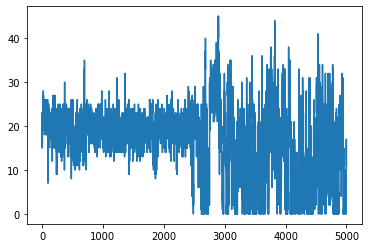

In [127]:
plt.plot(np.arange(5000 ) ,cont[0:5000])

In [128]:
print(len(contact))

23


In [129]:
print(contactMap)

[[], [17, 18, 19], [10, 17, 18, 19], [10, 18], [18], [13, 15, 16, 17, 18], [13, 17], [], [15], [], [17], [], [], [], [], [], [], [], [], []]


In [130]:
Q=[]
NumberOfContacts = 0
for row in contactMap:
    NumberOfContacts += len(row)
print(NumberOfContacts)
for snapshot in CAtraj:
    Q_score = 0 
    for atom_ind in range(len(snapshot)):
        for second_atom in range(atom_ind+7, len(snapshot)):
            if(second_atom in contactMap[atom_ind]):
                #print(atom_ind,second_atom,contactMap[atom_ind])
                dist = np.linalg.norm(snapshot[atom_ind]- snapshot[second_atom])
                Q_score += 1/(1+np.exp( (dist- (disMatrix[atom_ind][second_atom]+0.1) )*100 ) ) 
                
    Q_score /= NumberOfContacts
    Q.append(Q_score)
    print(Q[-1])            

19
0.9999546021312977
0.7827328209784788
0.8585470257017173
0.9055536163605463
0.8925145704341135
0.7438346403692621
0.9192878320758027
0.9952397305559761
0.745086664847339
0.9954781978964905
0.896926141110782
0.8075469195574487
0.7721143634915689
0.8615018263919293
0.8616711220835341
0.8431063331530767
0.8064487888898692
0.9408348458359764
0.9455544278516128
0.9228554080998831
0.9097280682501181
0.866531208040903
0.8289602650406461
0.7973350035014087
0.7964549480024644
0.8533969897111168
0.9286922550806929
0.8033396192272848
0.8015122841118093
0.918175998204806
0.803344410598863
0.7739931928258682
0.794594551714501
0.7667946992279301
0.8985632454357895
0.7905337194723252
0.7941805628676721
0.6617047437128201
0.6680247425375497
0.8706997658140277
0.8901298118665877
0.9261248605105292
0.8738314105927117
0.8125866775531627
0.7887958394664993
0.7131914311681429
0.8375679059418956
0.7594609365361327
0.8201211350549842
0.8880036307818695
0.7557086405318727
0.82470770654341
0.782046586873693

0.8504251962640549
0.6451880235973386
0.8401317786733427
0.8401601319565446
0.8364750487386372
0.8135063056904904
0.8300189792700449
0.8945022071000701
0.542738362198457
0.8418013082140249
0.8878710211422929
0.7477900861254475
0.6190251613583064
0.9062445023733643
0.8414793404396514
0.8398619072474865
0.8574432964354305
0.9280708901453554
0.8199522840221434
0.9334409665615846
0.7148198068941859
0.8655479157984944
0.8459744532340352
0.8442505445190868
0.895430582692979
0.8838995875872179
0.8694936488373317
0.930935885212572
0.9276072024808653
0.8262138038207695
0.9255535928972086
0.9251466735895344
0.8804895070516513
0.7764421324767445
0.9098212644649374
0.9024292671131442
0.9677611375574074
0.8861707696965645
0.9032733773199545
0.6482291764738831
0.6564161134980396
0.7124020522674301
0.9902469267299407
0.8781882143538285
0.8813330104953689
0.8632811764306672
0.7700019491954823
0.731599890710513
0.8995740560268747
0.8585646830732966
0.7556822963687253
0.8351427974812348
0.87287398673180

0.7984277862400129
0.8278104870279671
0.8031821183977538
0.9141406960184303
0.7952443696639451
0.8451499926522382
0.7888525459617423
0.8635394005631253
0.8189559184625547
0.7905058248065124
0.8253220676910604
0.8729188968753914
0.5765959464471457
0.8333197368318249
0.8571133153695738
0.7611962044767474
0.8746469257563002
0.8244050576184724
0.8474755326415845
0.8459900637964177
0.832056343977863
0.8497866642373944
0.5985404492241918
0.7865980578713646
0.8647828505306334
0.9179815264417207
0.8048356503846383
0.9176968203169515
0.6038269432062467
0.5195923225749922
0.5012599546262728
0.6122577533780271
0.7031921053417652
0.42536268564630864
0.6497264852114006
0.6153116741585167
0.6302280383475668
0.8727691539534818
0.7371252815674938
0.6824623747587397
0.7818806885371479
0.6323196628168452
0.6838892239474376
0.6679772267110329
0.579217677692145
0.7480318742485577
0.6272216510702922
0.9084734165524412
0.6727057762703482
0.4949686394490767
0.6238571195080205
0.600488555992742
0.671802935496

2.0445742127685054e-12
0.041639481328177234
6.765278948028492e-17
1.2615301935440212e-08
3.185734113292869e-15
1.704308833561245e-07
0.054683021372366816
5.995496268656295e-25
8.412998990975365e-10
6.413236965552096e-09
3.262308787848947e-10
6.804671077919273e-10
4.537000879555009e-13
4.962499721137919e-15
4.86901723382341e-23
4.233389491791426e-19
2.3680598700358007e-11
6.78617354686048e-09
0.15755704951443525
0.09915753489552726
0.15796066215679136
0.1749947635591887
0.06432858395130756
0.25153316216140964
0.13060110304850614
0.234446550649234
0.2176798665328189
0.15796269735611018
0.16086697662168312
0.2105263030206649
0.158694640098775
0.2127041577156215
0.31488439171797067
0.15789642093218412
0.05395806359629466
0.10528643360118264
0.12367251257277564
0.3157609314916632
0.26152649239544007
0.26301552084672497
0.2631531514085628
0.26292222651124364
0.25885060319095526
0.26402711943514345
0.21054351885303865
0.2631782325210301
0.21056302843086822
0.2631577456373932
0.210752695774370

0.21431497324371873
0.10526318519917184
0.1856940798894608
0.1584839416327811
0.05263152505450706
0.15790567965403693
0.13419092774696137
0.18163210751700276
0.10526315789473696
0.26215346190699657
0.2631376567761623
0.24489247058771127
0.08954542435729781
0.1526764026336375
0.052087896312214055
0.007544656961927557
0.05263867360828918
0.05290058733890021
0.10526316892612313
0.01219843811820209
0.10526304171517095
3.455351212434984e-06
0.09692299836827643
3.9362527272352167e-13
0.05126234434690964
0.10707920527849633
0.0526315793799827
0.00014734191265566065
5.385163478534424e-20
0.04018174714194282
2.312053094654925e-16
1.4681989666806718e-15
1.0465187284436447e-09
3.117318625076396e-11
3.3783341736173476e-12
1.368189718828594e-17
0.05263157894724051
9.312140652975382e-17
0.05242660945886054
2.103059398964108e-13
0.047234125899179726
0.05262689662241212
0.05263158400743941
0.05263157894736155
0.05263157891377223
1.253673172542049e-22
0.05263147366519021
1.751909557540071e-09
3.5356004

0.08527986155721264
0.107448555587252
0.15782155950207707
0.05765716257289759
0.13755959223096914
0.05954170038156978
1.916907807045938e-07
0.052628869521173315
0.015400725056580373
0.1752343758670775
0.24264308167956897
0.05262151746453612
0.052631579300653916
3.870594468964377e-07
0.20712823784939924
0.31577694972894477
0.2348087804988688
0.28092736487891573
0.10745019252747298
0.26313811258977843
0.2105924881760882
0.16245062790751758
0.12594249430952137
0.1660981915039621
0.10526318643617782
0.10526314671954888
3.834040142928027e-07
3.0415583978202154e-06
0.1052624729559831
0.05255024844224557
0.00023798377823281385
0.20387468557088415
0.29135992644937575
0.36114111399946
0.5260800415638548
0.5088590544561795
0.3804120894413617
0.017039274729591138
0.10527529589172042
0.26312980377983414
0.3310741935547604
0.05272371481329615
0.002083265118161116
9.939494819029243e-13
0.05261141112769153
2.8996164965395637e-05
1.791450318940208e-06
5.977107798523405e-05
4.613674725190299e-12
1.2686

2.4141785116972894e-14
5.763088887970439e-16
2.8664195884859114e-09
7.156026477993132e-32
4.258465025952066e-22
9.522378472852224e-15
1.0269444714430973e-23
1.085976464558394e-17
0.052631581798395145
0.10521546256856924
0.10493904560706481
0.15780600044950405
0.05792382919771693
5.793580509153821e-11
0.2087120615606678
0.11092716460450146
0.3495311453014204
0.37447624697444326
0.3859421447445436
0.3168121610762298
0.2987196789497551
0.30718001395771993
0.30297807944988703
0.23053659084876715
0.31234179234004633
0.15818560899231446
0.26315882215272945
0.29948261783867686
0.34395504070973176
0.3682099814663074
0.3156830031377989
0.25502373110875604
0.3634677391910315
0.32098244865324554
0.3252417620124442
0.3155021641324818
0.267478414021323
0.3163916330224289
0.34372616326262034
0.3134976320448419
0.3155059025917662
0.36795761780001657
0.34161313666839316
0.24876081099975406
0.21160748066804574
0.237665734964255
0.32063490004957995
0.2020042149249723
0.2508248858021899
5.016774989651608

0.11049336159091296
1.79069608686233e-05
0.05063740870121316
0.07717896699600142
6.002931347994626e-08
0.051741172888066365
0.05219885705512711
0.22115578684199355
0.10429244727288307
0.30511036136844993
0.05245602808767078
2.881193783369744e-09
0.11036112848646507
0.21590822211144847
0.052508379673386146
0.26401041564042893
0.08337345801986051
6.393537342207827e-06
4.221396402230677e-07
7.633119347695355e-12
3.924700857850679e-09
8.667017747066811e-11
0.10526292918858793
0.10526945200218744
0.061723182617416425
0.14821004216495112
0.2476741862288966
0.3996175100910268
0.350807758525397
0.21531162120412017
0.15328313734255905
0.5184492114944964
0.16076177060298535
0.27113267286405485
2.7922969066584497e-12
1.0599441973368163e-14
2.1831588343333287e-12
1.1580816965704075e-06
0.0016235154086066373
8.441605136503926e-08
2.6024933908644845e-26
0.20136854566286452
0.15780337246721005
0.10280332534577452
0.05787171646379546
0.05130330472308433
0.052696137425243775
4.709874384916136e-05
0.131

0.3146377230139014
0.3075403298096114
0.21116752702674937
0.21766944067424146
0.1539279834568753
0.2887264830524179
0.3160156378848833
0.314388673255134
0.21131933086290602
0.4210405815956422
0.21074496479561397
0.21053193622538233
0.21055832079881687
0.2106209144386849
0.26455910898009916
0.3682105027066474
0.2649973372007541
0.37062376452503354
0.5538148105873918
0.6113124944911341
0.4827750594005034
0.41529373604917025
0.5794373610467082
0.26191524582369585
0.31578936882135517
0.10526206609020661
3.908737509738795e-34
0.10526315526664144
0.15867012188312873
0.37190829306423545
8.683101238232167e-17
0.15787452087335763
0.40804449191569964
0.4932720110445042
0.42682639435132164
0.574972392654978
0.5623899019806081
0.36793073268245646
0.5726927286782114
0.1279430709187586
0.2123578944609401
0.10526701930665286
0.10526315787431156
0.10526315805638671
0.00012386273657271396
0.10526313466571251
2.0381215424449972e-09
4.605337134837578e-16
2.73173608387455e-13
7.85291906272637e-17
2.150384

0.07106174673718121
0.052639939746404
0.11783315817658158
0.05262524987047155
0.052657651687861136
0.052631313822856504
0.05263401689551497
0.05263189897171366
0.10525882706093724
0.1051829951254528
0.07106926293726054
0.061460621225262003
0.05263451050992336
0.1013059898586572
0.10176498820058227
0.10525887509375986
0.10523249209102757
0.09862621140128203
0.12215410758158969
0.18278264610911274
0.1203952279285381
0.210584182332515
0.25761705761145043
0.09208075904036003
0.10516073077758839
0.052635420125305456
0.05877142064875903
0.06050870927873411
0.10526315707260507
3.54016977359036e-07
1.1691847833422568e-05
0.0004496054813543336
0.07985635626220294
1.506287820563352e-14
0.0003922668326148644
9.449474947984114e-07
0.10549631873038069
0.1515006574037879
0.0006078584838092749
0.000585201574738652
0.15763934001294252
0.05263595542529664
3.3430450679988196e-14
1.0317364893811501e-07
0.05266568779897198
0.0071605961007590755
9.76491223243979e-10
0.11402100058369424
1.856413071141571e-0

0.2659961839291341
0.24216706297910717
0.21188537112649397
0.22377546436533838
0.23861811630110102
0.2197131605124577
0.2112623559507707
0.29391939586373783
0.2202283354842324
0.21080156038780232
0.2640518154245537
0.20931892983433106
0.25675365413829376
0.22764803736738232
0.2631176605177046
0.22484520228179533
0.21150732550991794
0.2187600921452421
0.22407053593233292
0.21065289406770932
0.2406657252230054
0.31033282568494874
0.2993983972476492
0.29016018312273284
0.2648541136804816
0.18970421230212764
0.27017468509743414
0.2673865604652864
0.26651118557998443
0.26219756050050497
0.24001682059326943
0.23708872278656293
0.26379755504523067
0.3156231087306423
0.21083454576682725
0.21249036778711233
0.26423514519791275
0.2595610077880449
0.22421179033134434
0.251402474964864
0.27949614269576484
0.26837464271541456
0.22987630971102943
0.27759441745472907
0.2700216507963843
0.2957395140849591
0.2647768952633714
0.21304611699545764
0.2635890532231826
0.2603510192600732
0.25500464236815396


0.18492375844873402
0.2631417780488676
0.2532797928035536
0.26314350402495384
0.2630972096741381
0.2631699231412486
0.26315502744109465
0.2632497417141898
0.23381988211959756
0.2631855557757708
0.2631580886441969
0.2145167128601443
0.2782043703649465
0.2651463540870777
0.26315863165616377
0.2607711178976629
0.2653419645243174
0.2633587842864908
0.27510269985015323
0.2631386110304034
0.2631578429846625
0.2631299192619821
0.27687716611517144
0.2630789407818706
0.2632568765682749
0.2662064589398568
0.2628996622821709
0.2631632340398524
0.27440988190953647
0.21304961298385544
0.26314618580417376
0.2631464860148606
0.26331447662496466
0.26313670173998904
0.2636213519271956
0.21053055086683384
0.2631529354534526
0.26435155611355793
0.2631580878119918
0.2631603856723214
0.2631575047105665
0.2631578830361396
0.2631586438422259
0.26315738560979424
0.2612060706969249
0.2630238566410917
0.264797357685138
0.263157863822052
0.26315756979535515
0.26303320758099086
0.21053211191903226
0.2693354885663

0.209432819100087
0.3323086645982998
0.3602604385006363
0.3156849256233152
0.34204149503337794
0.3683712588263946
0.38168361929950084
0.41473694054204163
0.29562302125089746
0.3135808771058823
0.315789067165257
0.3634074924610559
0.06456437515396729
0.29832774106496857
0.2607268437775962
0.2642802706892756
0.19461468029013648
0.4789246170737456
0.3530741028082828
0.42127234447233536
0.2207468822499216
0.4203376669692295
0.20763737175159985
0.0016968732663716704
0.3096901934026426
0.3160093042823687
0.30904283191903925
0.17841556103101217
0.11784887255927026
0.2836531204560571
0.16090424366595615
0.3798368578885106
4.281827179730758e-11
0.48987317889755316
0.4703737270615323
0.22488571934673784
0.05240743730713
0.0003222108563968048
4.0731645982272686e-16
3.0314742394379704e-22
2.277918829209823e-13
6.594238456178546e-11
0.04977071078105386
0.12323482946485625
0.09734037249240048
0.1031921269450526
0.09604186037878763
0.1052585109535893
0.10361899771656218
0.1583691617985042
2.922555670

0.2102585798660924
0.245642335426697
0.17716939353300334
0.2118972462800536
0.212043368647496
0.21023554288508198
0.2624039718407705
0.26324539154592896
0.2104954902190083
0.23933824410222976
0.2105238233030331
0.20863311890280012
0.2105048090337557
0.1749859904169684
0.21042260212107441
0.22535477232506498
0.2633846020705172
0.2627692092036787
0.21046340852742726
0.22690416932446714
0.21052629347679683
0.21342110571539263
0.21043469916659455
0.2904573474201819
0.2105327615109236
0.2104858890667428
0.21171589508908362
0.6830684235825902
0.21079943083766647
0.2757874533925444
0.21053496426418158
0.2648099176623922
0.31552457064965594
0.31551081241562523
0.31577869716328405
0.41869679612692723
0.2828484299733256
0.21125246559126235
0.18399332043489244
0.21405464851645037
0.21628732480030816
0.2105371481658243
0.21047868287803542
0.18187107998937785
0.1602788156783456
0.21045039590451792
0.21051053346150841
0.2105299223528069
0.2584715035487037
0.21051940406187986
0.26160857815664157
0.26

0.2630535501590039
0.2951995152148738
0.21767559525757396
0.26315856433831203
0.2622546325745998
0.2630700463171067
0.23492432104479022
0.2627861898006353
0.21796521023277657
0.2631611440406717
0.2493759610815872
0.26319137095509654
0.26301578733001935
0.2632335504533375
0.2643977313633636
0.2629459260993106
0.21095953909155338
0.2630714233145884
0.26496024067638074
0.2623181143649636
0.31102235752720775
0.2736293760546338
0.2456686458275841
0.2631434501284014
0.2631530383740078
0.262418441914498
0.2107910796386182
0.2631194596683884
0.26315210060359423
0.27155009998348706
0.2631626221525048
0.28231395824699174
0.2803339347670119
0.26315480534995717
0.2631532810587741
0.26315733262688207
0.2631588720843471
0.21056612278284764
0.2631518342796526
0.2627436216553855
0.2631553234781501
0.26302765203801826
0.26309331295653093
0.2631508369698455
0.26359766828439807
0.262229769985675
0.2631573290768047
0.3128401051997411
0.2629055425231581
0.24442260165985594
0.2955899706949564
0.244169855671

0.05370345309273685
0.05270292791467318
0.10576419207885615
0.1485567290686176
0.05453216840792382
0.15790367793891913
0.10616836342219373
0.17345139696263845
0.21130835736654932
0.10509510775028234
0.05386122273373275
0.15738654891805964
0.1588422539031796
0.07611804512634934
0.09740598926302824
0.2989268978976228
0.20848148200452749
0.10251020500602821
0.17384361584930116
0.11742057445914682
0.1877594247782931
0.2133780203725171
0.29453447795941945
0.21042396814479553
0.3019041804230866
0.20159961032697601
0.2649290285372689
0.19935294343845625
0.14416473003946903
0.21164736652412197
0.20983450560105005
0.21140939192388583
0.23076201502951632
0.26289169979395843
0.36280096188613353
0.3828763863487669
0.3191243627526703
0.3988851605016464
0.3643580218365483
0.4206671684343945
0.36493366342402095
0.26816826292996915
0.3577921434768247
0.4210455054104173
0.27121052560715475
0.353794318835707
0.30455807196221796
0.10526315837768353
0.2111131109980456
0.16634797744171712
0.050836221697031

0.15790889341122477
0.432059419800248
0.10526315789475882
0.10526315788573863
0.052856270270560377
0.05960897896871108
2.267416492187125e-17
3.0182488224711053e-08
0.10526315728435849
0.052677110739919854
0.056933535162089564
0.11692826041427859
0.052632616862778814
0.15718818691252964
0.027386010661117167
0.053036972030290806
0.10524964584875629
0.10468875943489718
1.421010109566945e-07
0.10679588139528108
0.10526315789476283
0.10537663202254241
0.10337225714266456
0.20575950922474537
0.20253169340090407
0.20612246233814613
0.05245095492344499
0.052588678008189206
4.280458894947358e-14
0.11922193192929902
0.10438084273802212
0.20551713227062923
0.051834020706636175
0.07592536062916347
8.77443831148309e-05
0.0729685630083086
4.004147830402558e-15
4.144738893712886e-11
0.057041336111341566
1.021561443406363e-06
6.322362525014365e-23
6.870550874077866e-09
0.06442378991819941
0.0004041173946968095
0.05125488991881006
0.05263157895153443
0.0001384888391316157
0.052496150399064447
0.0002975

0.2608987288136934
0.30562584698554474
0.210545895946211
0.21046171745012127
0.2105324838855279
0.2105255353872525
0.15578845154285162
0.2631629911168261
0.258035323574471
0.2635021697151202
0.31579522440065083
0.15811640568490146
0.27351564385923116
0.2636899097936305
0.2627935169310715
0.2544151628196288
0.3156751199037649
0.3156478120164893
0.2107905983334902
0.26431016546106434
0.20752010569350987
0.20817215612308326
0.3127269075600099
0.11555458700707692
0.22582564296276075
0.21310331600483315
0.3144506878116886
0.26350358465385376
0.23591743792023304
0.259482803311393
0.25986764698320863
0.24515042517628935
0.22066687073477917
0.30639931148832394
0.27416366338589326
0.2871807668326514
0.32186900075151514
0.2683890044917111
0.2106914969571111
0.26154419791715783
0.3687362727615219
0.3111398417889547
0.29957890275313703
0.3171368214412656
0.3074802199187738
0.3175302729326883
0.2983591740458263
0.31599705164256564
0.41237801354520603
0.2635341879930371
0.26623676180167133
0.3197582

0.33474266768685434
0.36415733299290287
0.315877165364789
0.3146100104905346
0.36423133625534565
0.3669620782259794
0.36459641607205057
0.36177912881534136
0.3156925311311727
0.33792577059538426
0.3157914610750248
0.3651812157180108
0.2859898177449995
0.3352202904083906
0.31565276742000353
0.30510517192260167
0.3680381109207082
0.36524655977384274
0.33769306559811163
0.3162871875210507
0.2633242197462038
0.31541868939695067
0.26142096019876176
0.3155808322702121
0.3154986582588722
0.32477185961842153
0.30583980130345567
0.2981351099907668
0.2862368747121191
0.21050071188891653
0.31419448808118067
0.3684100855810311
0.3670585177931554
0.3158489875952005
0.35465341659353183
0.32766215696065676
0.31562740982479787
0.2643173186921233
0.2646970897437805
0.27843303447016576
0.21620148546737133
0.2925281775229124
0.31542787440673353
0.31843263964232776
0.26627098464759674
0.34166775522371323
0.3261298894303454
0.26316819020643356
0.36825013045631627
0.28409473877040053
0.3417529965990046
0.36

0.3446800796675293
0.41893165917415043
0.3301347626683144
0.15102516946123046
0.043995599517729696
3.5126254849672675e-10
9.167136196339153e-17
4.519209444943378e-05
9.49312029421216e-08
0.0008530542504228379
7.048982686806922e-23
0.004849745032734191
0.222298323927616
0.1578893625745828
0.24595347664849979
0.005354006201241952
0.05263545197511175
0.10575245423929243
0.21054771219632232
0.16313627698089495
0.37893086845607454
0.21210510547146139
0.359079211979815
0.21047352211162204
0.25788559944133255
0.30353491979501596
0.24632921236631164
0.26401946920277963
0.1588471671582613
0.1439846677334716
0.3962675009297259
0.21052631578947026
0.21052631416622103
0.21052452525264528
0.3416961424483482
0.2106674305436684
0.2631585533790042
0.26330299602391427
0.26935843078178257
0.23438343707411144
0.21052830276229714
0.21065803089180016
0.10526315742542329
1.7337315202993431e-09
0.10526310461792716
0.21052593856955673
0.15988373780080545
0.22896653849168547
0.3157857955009788
0.33907134503055

0.10526142293626024
0.05227877366427804
3.0568995131637908e-12
0.10526315757772509
8.998549584767448e-06
4.994112611547343e-10
9.427165390225186e-18
6.924955187794906e-20
0.0526899531769237
1.1009499929101812e-29
1.8649302494516725e-25
1.7077441772804758e-17
4.8141164188198175e-23
4.9736726394149343e-11
0.1081794076414487
0.2990427590422817
0.17119344000804412
2.377515754423833e-06
7.447618448697142e-14
2.351153117091258e-19
6.319458862156587e-12
0.10526312379659926
9.451852679788474e-10
0.14536922439353772
0.06703789676083982
0.06377671529695272
0.12007649178079097
0.06789167510853052
0.05266561813393938
0.0945725164873751
0.15187212925083898
2.99897422541079e-17
6.483673843673894e-07
0.049537612025056604
6.69783757138141e-19
1.0674853363818795e-13
0.04543002578914597
1.6180119163703912e-12
0.10197866612692351
0.3118128942437161
0.3157896496043062
0.241668114059904
0.366389004678295
0.31576277077719306
0.052631578950676695
0.00021204475773325753
0.0024981413291341706
0.104089586196089

0.052631154831206936
0.05248227129114611
3.407046049796607e-09
6.891276346063011e-34
2.9596345491582837e-15
0.05290927927231032
2.527224153040654e-17
4.376773896500471e-17
4.3833725265686555e-06
2.2067546730118366e-08
4.188239031474227e-09
0.2992984726492392
0.21314817710370323
8.436571911016279e-08
0.04432545723891394
0.04308836685519493
1.3299931980536788e-23
3.4489382013924563e-25
0.00033644796143158205
0.052500490850568106
3.247832057192703e-17
1.0121179319359934e-15
1.2825302007420416e-23
3.7755066721124216e-26
2.744356009996191e-32
1.815143755458693e-15
2.0834847057247283e-23
0.0025910195131735223
5.571006989239572e-05
1.888355561539236e-15
6.221800267161879e-10
0.10526315789473684
0.1052631578947371
0.10526315784399405
0.09770950067737269
0.10526315789473684
0.10497018781972256
0.10526315757319847
0.10526317026665645
0.10526315789467382
0.10527708209955358
0.05262907724079026
0.16433228052464174
0.0002523961610783876
0.10352462556807941
0.2620192701179888
0.03805366134351849
0.0

2.0320625713757348e-24
1.6701940158618107e-23
2.7012349435246014e-31
1.930606628228373e-26
1.9036299311038774e-36
7.24417567510753e-13
7.920725594921054e-28
7.415984596390371e-10
0.1578954464814199
0.052814713055351965
8.042011234729602e-11
0.20998633564527625
1.7221331058165744e-18
1.929028133857775e-23
3.3856839399901467e-34
4.2453182380268686e-21
4.25113581832139e-22
3.4507496455050235e-11
0.1052658558557983
0.04263638337386627
0.20109586002918137
0.2196708211624366
0.15795292429400964
0.10526310758828107
0.21739958714956345
0.19906055572560905
0.10526315857710973
0.26367321420139145
0.27076440267380497
0.2594438377165831
0.21939805543121982
0.1800617296162538
0.1330521202863617
0.17823680475151807
0.2105255238739934
0.1586176745030576
0.36450128942773535
0.2630608711485192
0.26230289472017065
0.11432080648893495
0.263076009503395
0.11968044098526755
0.5303535166798203
0.2571613225761415
0.10157057939808238
0.317984657656382
0.3041840246104264
0.21261361475629115
0.24717347618057053

0.2179585113926558
0.21446071124367183
0.28877384045745524
0.26345883841180084
0.2575906302400756
0.30065770347935306
0.2107899656618091
0.20896247167512222
0.2624807802538622
0.36118468863255354
0.2656791880921919
0.17419419023543833
0.3666713369434752
0.15806293342489547
0.36411440863774813
0.4347341510626968
0.20672168686292422
0.16952687322193913
0.2217111770895096
0.26315782442706326
0.22900983540018294
0.3154790837522519
0.22567437137423096
0.314102169757372
0.2635758777807341
0.41370404474139766
0.3157924932909977
0.2715432567546577
0.2652341055405751
0.36529190590794136
0.30991677800391265
0.31354276023789784
0.31578638959405436
0.3156254520958837
0.31562007406623593
0.2940765193280745
0.2285296264131685
0.2879543228970223
0.3157186155339419
0.2691277807676711
0.26398269617181086
0.22025210417828375
0.31460232136978344
0.301228195810798
0.2646250576589953
0.3736703828241376
0.27768850078819396
0.2870373103270472
0.2356556129500543
0.31578947356557985
0.27453325471949874
0.31408

0.15786606215129345
0.15789475144703471
0.10530009731680665
0.06984839294740693
0.10522414628000365
0.052798487694079584
0.05262963681865579
0.05265254346039109
0.11310222694663748
0.13554581477694116
0.2106588310189154
0.1656532648599617
0.10526404920360169
0.15789483700398038
0.15580707055967788
0.15789470724530455
0.1578945571683506
0.11001097662418892
0.1556008723507869
0.17465358237298534
0.05263157690321241
1.9294139498173885e-07
2.5007390548734073e-13
1.800090809835141e-19
0.052743320923254754
0.10519805877122952
0.05263158006430038
1.183012944910182e-05
0.052661464598257435
0.052631673230011035
0.002291364342704931
0.1289254643295881
0.10606064989807702
0.10411320204564103
0.10650013054789415
0.14454642482885027
0.2175488320395658
0.265368739685244
0.46901406171029325
0.36879837455226033
0.3076433930298834
0.3196618977701588
0.16156779305529398
0.15791108635475232
0.18218990016081016
0.40320839864173724
0.22805893485513076
0.16089774473115365
0.23697930453986105
0.2088685815659

0.23233009049878497
0.15238954622970735
0.20997258794719226
0.10526521071539009
0.10526315789357399
0.10526315758532023
0.2668824980984315
0.01540968446037979
0.05333916493869218
0.10526926580033825
0.16284380066368617
0.2105262180800748
0.31563913973569685
0.3157894661497695
0.2870000028531247
0.2651163499283876
0.31540823327383444
0.3660789091527157
0.3157881877901776
0.31578946408750747
0.3684176119513138
0.35923422754772405
0.2820739132527236
0.2713624205021728
0.3157894696384151
0.29981348540531644
0.3154861564863908
0.3149141286747977
0.2846057496251267
0.25334859018235845
0.355655249428618
0.10526315345760023
1.459834367109082e-08
4.171414622410531e-06
0.13061574197748277
0.10526414558842623
0.00011469654918219305
0.10526314976736523
0.11649734916758192
0.16734551307235854
0.1577034832956424
0.10526015123128338
0.10516158601491579
0.10114979656993182
0.10526286747864078
0.10526339345429508
0.07722546984113848
0.05234324570046365
0.10526292671013217
0.047177564446080185
0.0525479

5.866132684092819e-09
0.07692315477766251
0.10531567626754007
0.1052631578868873
0.22757045154090577
0.15700386843645497
0.016933472462723857
0.04927747029613152
4.80969152971285e-13
1.2776639661842061e-09
2.3533493328582737e-05
0.28959042689536113
0.05056467049864585
0.21152955183005767
0.2739524906852569
0.3681906671757574
0.15260258989023334
0.05612401388844358
0.17815471758868617
0.16052762763294237
0.10834356682045865
0.008589576271610297
0.4168036575611571
0.26426095269560146
0.30729766487573684
0.21881898143843617
0.25705474998370803
0.21075174657907944
0.16527145309551486
0.2557535597982979
0.18752275277620736
0.2816538213699612
4.493337074934728e-08
6.668644103265695e-06
0.05574430875368033
4.234654137874664e-09
0.0534809505059967
0.05393639386227438
1.2334885583774332e-08
0.1619412071937767
0.10526322956483225
0.10669221895521289
0.24335350739652206
0.0011797127891577958
0.10526318583002174
0.10528395380172804
0.10260965757887304
0.050945552343856323
0.10526318416900199
0.001

0.3250766739708793
1.1789158219147902e-15
2.9399072235058543e-12
0.007250869135197673
0.06240374344571119
0.0641730474921681
0.00034232168624314253
0.05262521932531488
0.0009126277554524735
0.28128330897934645
0.16398749994225503
0.052683688436052284
0.1546126182110627
0.10515764791778
0.28572951831629195
0.2836581563824576
0.2519761157893975
0.21422350948417188
0.3144967376751166
0.29596641717357336
0.09753528086182345
0.15655612965718005
0.4250253358422692
0.3793231146031009
0.3157177800570993
0.3157900861131176
0.21025805274261558
0.1588253134421913
0.0018084683187508607
0.17665488712843683
0.05264265341610064
0.06964470763055289
0.10526302684855478
0.10524269784378218
0.26294604243327546
0.15788235734428757
0.3139955344945193
0.2631397699790374
0.3157908826730156
0.3158859514931443
0.10526318360227072
0.13247272059123177
0.15830506829083915
0.17294433178562107
0.07351559562411075
1.3398136886940078e-13
8.95642072904336e-14
0.16478131877310842
0.052637547653523256
3.9158162373862457

0.15366682506554882
0.1162291769946342
0.15777651742883003
0.10522460031345941
0.10526315789689568
0.06756959488302328
0.10528443507668174
0.05728658259369802
0.10696153680039465
0.10549291728264136
0.1052631560479847
0.05270912853715153
0.052461816662874104
0.15559881797811703
0.10526348140437931
0.10576169744769284
0.10957579424555111
0.14469815927867302
0.1469398374249206
0.20497092213673404
0.20751412030530766
0.20961026804903118
0.20546495759339473
0.15754288922046814
0.10526328828489273
0.10526318986235417
0.10526420610523406
0.1052631588918667
0.1052698443489319
0.1052631648671003
0.1052583812458492
0.10527707125041073
0.15786540222492004
0.1539544716938302
0.11643119587245684
0.07677357413110371
0.10272357354368189
0.10511132946513921
0.10527607234280015
0.09825743354832528
0.10578738539278004
0.15787917495800946
0.10526319087479422
0.10531548024591239
0.052558547199997994
0.052636554545846224
0.15159325809842275
0.11240891979371256
0.1581588158452333
0.2166751788597907
0.20090

0.25813891833522684
0.3149905679834857
0.2688657358289401
0.3143636598325129
0.20845096864950607
0.2636283634644603
0.16793783028782966
0.26309007779703286
0.20761202282139743
0.10502929071533923
0.03803638669574195
0.15768945897831688
0.15794338889767534
0.10526324190866362
0.10651693468267658
0.20989246270436265
0.10526315789473684
0.1052631578947464
0.1649080939529969
1.2035764596070369e-05
0.10527079149417815
3.8819085824656e-18
0.007368599283303536
0.10526315789473684
0.10526244562437154
2.438908791902574e-07
0.23877819849820175
0.121544056396402
0.12536576745475614
0.05263192871766614
0.19397077761326353
0.06008704015082125
0.1071658841871016
0.20783497814186114
0.00872941789797818
0.10596068690645741
0.10550227605619183
0.10526286299197565
0.05442702209222667
0.05263294958301881
1.2694398208684214e-19
0.21052749745455657
3.645886993472652e-14
1.893989960041239e-21
2.3429199999595447e-13
8.741496852508268e-13
2.518327020039629e-05
0.06925872586887599
0.0029877522567207217
0.00077

0.5324557024618756
0.6307569026303067
0.5093278410634768
0.5021411333092024
0.48136922373167473
0.4736839607178456
0.467766567481624
0.4727477499606954
0.5038353332188777
0.5818281585423155
0.5239289626823279
0.5788186596958141
0.5196833687830157
0.5790195656663091
0.6337986989552055
0.4217034439172095
0.4588417041837888
0.4714802760612426
0.5735925889929134
0.4460751914105439
0.36910492116719545
0.36824389076307107
0.41816646010974146
0.26239323066556797
0.4750257086493262
0.10526400028575196
4.272600224334086e-05
0.33131783919668184
0.30667587291940185
0.05985268631843286
1.653800409705715e-11
0.022908123690131062
0.1785363310515138
0.03721391449411917
0.10398523870208166
2.993614855372674e-14
2.0539207179064504e-05
7.64287377959151e-05
0.15651401707976823
0.26361136596635976
0.6443546681964157
0.46355180959311815
0.5232677933427551
0.42071006351537
0.2631578939647696
0.2641346931571859
0.2945039881059726
0.26314103421414364
0.31537020375696984
0.3139123550432135
0.103316508179973
2.

0.8959055458367531
0.7749284960162388
0.8647888722137623
0.7178898042241872
0.836559188094012
0.8095496588676404
0.7652120631169135
0.8636276910544897
0.8288419603869124
0.7794645676197478
0.8640224546106959
0.927425810385797
0.650248462408137
0.686405272638608
0.8049073718640013
0.8990747345933009
0.9074922509939846
0.8469667618538143
0.78970642596899
0.7853185954720691
0.8786547659538241
0.8924311794770583
0.6118406846085913
0.857744663743117
0.7701917028564197
0.7652882772907469
0.7943068739261597
0.911110631616977
0.827185874686594
0.8740778376699015
0.8450115689642242
0.9353768898522821
0.8278609016770148
0.9363153416504109
0.8098749789254862
0.7501166132284076
0.9118533272377264
0.946896583556331
0.7331021054972269
0.8327115691144619
0.8116839335768564
0.7849733553656854
0.8671749433686301
0.7812334069494553
0.7666237508445946
0.8166142490353975
0.7946288339091186
0.8760639051091647
0.7692212964359466
0.7943103291846642
0.7253163714510732
0.8466759643756454
0.4269418006871337
0.9

0.41689855258060093
0.9228670417968297
0.9437257626349923
0.8285191422118577
0.889018023487827
0.923366197061255
0.8770490404591689
0.9118394464805006
0.8942134525233301
0.6573448151575602
0.6423112405402825
0.8364723994731431
0.9948133320322515
0.9348291278428333
0.7374414790874004
0.9125200281707084
0.851255384479632
0.8837846449661134
0.9349336497144914
0.8039101171651581
0.3548483318453095
0.765920667627198
0.6685676395989573
0.8012553945881218
0.6507893540003725
0.8385304805447089
0.8806392507128434
0.8021731222877502
0.848987875307467
0.9366354875067352
0.7935416458835667
0.6744507818211527
0.7817457091075625
0.416999144792744
0.5747004199631757
0.7999726683044529
0.9930865357730003
0.7745152402797436
0.8497559723638993
0.8961965414670329
0.8442280603638477
0.8752182985065484
0.7638220259724855
0.5267734303770292
0.8634553231078248
0.8508925884807145
0.7275495580381716
0.8917483632573843
0.9569984113427654
0.6112610714332173
0.8167487129992713
0.8593675772757665
0.818491964204061

0.9818839868626511
0.9191958781852579
0.7748846135996568
0.8137029781398862
0.8725170972720744
0.7580640471263006
0.9062925588191757
0.8668907410662425
0.8984139324275198
0.7378242415329457
0.8347490093200964
0.8815288668323935
0.886530405427817
0.7922586246279233
0.887518757923042
0.5778972158491956
0.9454721855946581
0.6844396274436378
0.7950551372036397
0.8317682815934395
0.7093285396477976
0.7911910788898612
0.8869350707589314
0.845382355690251
0.6902900523939749
0.8281168662933036
0.7327448655034667
0.7574765424655124
0.8261014151586066
0.7603368931690797
0.8491759967664164
0.7431972769886331
0.854324305738301
0.7847803391206549
0.847830380971509
0.9601443371468954
0.7229695372007597
0.8941767075273167
0.6797814760979698
0.7259202681845704
0.7731147345547525
0.8068413883974523
0.6782469464878353
0.7902331080906541
0.8350720788353692
0.986489710035914
0.770989769631232
0.8773450339143343
0.9896194878702426
0.7084170824903393
0.6228395579296014
0.8548051406356759
0.9156114268499628


0.7679498002786004
0.9016458369304665
0.9935883495949281
0.7029066894986785
0.9091249577910019
0.9326768352354947
0.8267553651208681
0.7622861912109803
0.9043010441227083
0.8884538520262865
0.7485702231063583
0.5785773352674712
0.904244623027425
0.7791043780912914
0.8439056210382739
0.9344844371167776
0.9115059990559965
0.9042432498259836
0.45398896155992585
0.8989900513445794
0.8295635708612131
0.7845609599205281
0.8602903989459199
0.7795406938344529
0.8654219538089355
0.7774423510006927
0.4756994442261206
0.9061645886525153
0.9085323997847052
0.7393891599860482
0.5821809943657689
0.6039050310370137
0.8479501326552923
0.8217647850167461
0.9327838822544948
0.987889077845194
0.7643245680993305
0.8859206186378059
0.8052155688462523
0.7232999205540969
0.8539489639306377
0.8568895902127476
0.8078784651929634
0.8111263091998631
0.8576684519890204
0.8536916748233728
0.9974336001401761
0.6410765739930392
0.8693435875706429
0.8589861368668998
0.7545257153866044
0.897078631031101
0.861680199196

0.9521017631542436
0.8526317242430799
0.6906894598010285
0.845347559184056
0.8433330982254471
0.7566200820758705
0.7575005054106775
0.907855115664181
0.8332580201549092
0.8278741406936372
0.7246442715982966
0.7623759465871373
0.9369825532067244
0.8665022061238646
0.8302932097633906
0.9263729619273328
0.9462163847219424
0.932905613914255
0.926740243587978
0.8729808927216403
0.8457574318966565
0.7884568384418661
0.7253028905437164
0.9156762593579706
0.8193159784418896
0.8898935530923522
0.9839478525932147
0.8385473492958091
0.8256496432849064
0.6888013771156336
0.5520060107311903
0.8264456014714425
0.8694553023588919
0.999560568540699
0.7576854588658177
0.7870511251010538
0.7198616064626069
0.616791767353571
0.97350354696079
0.8649439089995672
0.9977247210823655
0.9888961424839997
0.8187720208255634
0.8139591686781197
0.7644526719596582
0.7622816278046081
0.7857383201487383
0.7967667251040027
0.1989970057978867
0.7803343884987765
0.602335425194356
0.6935828144687913
0.8979163139620324
0.

0.9380295789996284
0.9039640304446713
0.8911201711334049
0.9262085935773579
0.891531385434665
0.8906301692112266
0.6912261433920853
0.9003019314376036
0.7234234676907478
0.9695873314245049
0.7952104915754558
0.8974598479334439
0.9389262766912152
0.9416988172565914
0.9518829259147955
0.9525408333598167
0.9270881499003
0.9395066177714613
0.798351533155348
0.9234949360378573
0.7584997802332628
0.77703919787398
0.798607393833921
0.6955387804726206
0.6937698102777147
0.6361382143315766
0.9035159147063148
0.8400623897434926
0.7612219592004627
0.7660788972901894
0.9460427986469601
0.8503126798534887
0.7542057425267606
0.9053180411893633
0.8948080872984653
0.9010468631242236
0.7385159246088677
0.7837219735623834
0.6201146314928281
0.7706441005830397
0.8893029096873735
0.7547594204450089
0.8640897200839648
0.7843880121976504
0.8925735506073118
0.7305668376730156
0.8537663830878425
0.8653861465805037
0.8081847234056829
0.5943993530817063
0.7732963900521532
0.8555975581097521
0.7578135039651911
0

0.9080513984514441
0.8433864724651889
0.7766879475675927
0.7305991278434917
0.8205582475267065
0.6895370947212554
0.7938385943847633
0.9297151777228748
0.7935377526318654
0.8622055334719549
0.8613923481048469
0.9349949486054353
0.8464652570271516
0.8673739780183894
0.8169293224952537
0.8746462566760461
0.7857531914764317
0.7977968390848201
0.9539839609089465
0.8782668594105626
0.8691760546567529
0.7641685409296395
0.7912655854930943
0.8819231836367318
0.5466707429238996
0.8588203162720378
0.9119342311158548
0.3886301274253783
0.888743951154965
0.8227276182429984
0.9234871606304195
0.8980778576607183
0.7565867627654143
0.8257426462481829
0.6208739700532089
0.8926652099371897
0.7884234952041661
0.7064408472185368
0.723335420734574
0.8925923581582849
0.8599546761911753
0.7324843299786623
0.8737886634266708
0.7502228561582882
0.8879943352175783
0.8979281637235912
0.8355722959354829
0.8049581895599124
0.7542102789113454
0.7623269967929699
0.8190852823252888
0.8456353009468778
0.823210768806

0.8836775731761473
0.914431928314112
0.9106973032731588
0.9518273409485561
0.8785746586748212
0.6672013516524862
0.7371232346234784
0.9404986560908217
0.7771208588978575
0.9788924901361398
0.9853925265489524
0.9611279364690724
0.5156419677824934
0.9172049809628003
0.8896605593263374
0.8827068106605195
0.6347895139960462
0.8950288264588259
0.9877834743086884
0.8475875297151046
0.6367553639443984
0.7823859348178266
0.8470774807108009
0.9379673535181664
0.7664018332272909
0.9242435109906872
0.7623092405686125
0.9695883521957072
0.8925770403931547
0.8512546199084473
0.9099674010767023
0.7515590033497195
0.8999491986313872
0.9847991921172298
0.6472403806847031
0.9327479977672269
0.9512863162795044
0.5185103004973254
0.6823178606000586
0.8045684686687807
0.6308895489790692
0.6666905342521776
0.991016968747955
0.8040740187350253
0.8462153241823508
0.6530597081162571
0.9757600969173273
0.9940446447678672
0.9319598563003146
0.7924334245090727
0.8747327561913417
0.8719519283133166
0.780635442260

0.30203487334638046
0.39844041112275336
0.34072453452399476
0.3419549063605613
0.2663945439570563
0.3437934884415159
0.3549638035543322
0.3200939048587212
0.3207312992345891
0.2931915035387249
0.22090010261133658
0.26253733853204386
0.3747232516384389
0.19290679560763405
0.3032631451587702
0.2997663596070498
0.2617365073389002
0.2001200272352896
0.0412361139634295
2.015166801343656e-11
0.05703451569148855
0.06012000373091819
0.052437549835532296
1.1642443006292426e-13
8.792236776548995e-16
8.742199059581899e-17
1.590575538048615e-05
5.047809684108406e-07
0.00045516281203914497
1.9927766182179574e-18
3.441659919262707e-25
1.7189963078416688e-13
5.975547463594142e-20
0.06472447492889741
0.05342540191913098
0.0021112277684655835
0.05255721187442917
0.0526394568376331
1.0269041058147411e-07
0.10526315789472733
0.10526315789473684
0.05255584700375218
0.10529062504576989
0.21054067303295754
0.1604961761777404
0.1611819461081961
0.16026857726163776
0.1874498822517001
0.2105582785706174
0.1931

6.133078555150053e-08
0.10393708044251912
0.17404152558287125
0.18161804873662946
0.2105271264373679
0.2967840214110533
0.2631249837306302
0.21775081269897043
0.37226015031036175
0.29290814858426834
0.12498385203800591
0.3532947913143279
0.11469889664367257
0.20174915703865964
0.4626295581217922
0.36366599540537264
0.3385132749852358
0.7468341793070254
0.46531405604714204
0.4654890561918787
0.23776636936162926
0.3671236578354527
0.31448306935296444
0.21679141378786232
0.15779255936035358
0.2348054708217219
0.2104968756632293
0.3639155165411411
0.31553598164788993
0.4280614901054052
0.3157988987700097
0.6199648515146936
0.4885689727151766
0.5261211329256148
0.48025705081891923
0.42605990168035734
0.42354680534675115
0.3445603548642399
0.2496660430282677
0.26214662351469503
0.2598304867053642
0.2634587222820376
0.26319834425994165
0.2671026644895569
0.2563481366515652
0.30007747985115946
0.36870247459949956
0.3679194024175583
0.3625720888699182
0.20960621516789282
0.2796181376170541
0.26

3.596631342613494e-12
3.3291842196567007e-06
0.16239202776812472
0.1573546970347231
0.1555329012700052
0.07422659636422775
0.0865875161852487
0.13207994594154956
0.0002317532717084932
4.205442202417596e-13
0.05263079104312907
0.015875023450778854
0.05311405540896723
0.31570462942577465
0.48921829739990497
0.17300743333053636
0.05434161139096704
0.04598044797289794
0.05308677725614007
0.1053190133013928
0.14529223782682812
0.10777679080546997
0.05263158014725731
4.3202353577867293e-07
2.973137253153535e-27
3.2377843944394175e-17
0.052145635946675296
6.380846067189413e-06
0.0001715033982312015
0.05262947581450688
0.10526278313250258
0.15789476203388814
0.15786651358785334
0.054094872587676236
1.4302899959604443e-05
0.1054225091469285
0.05275081209504129
0.0526403468361099
0.05263157919041145
0.20970890785053764
0.08429116120715452
0.20924396437529644
0.4223182485140893
0.5140661673646796
0.4903338625546484
0.49258826783029397
0.4600219134171644
0.3843120257085034
0.16928084481941266
0.22

0.20118143923476647
0.052589928138867384
1.7164457516163796e-15
0.05230868392677995
0.040620429279166474
1.546157078863845e-08
0.0526316800979752
0.16068014183457172
0.5602419126341751
0.47554759701210325
0.5590762300441788
0.5772961835933232
0.5789274563591333
0.2583666361688233
0.21021436565771062
0.2626454800684087
0.2628568328640443
0.26315930321678155
0.26315097426762074
0.26500206053299175
0.21052856246047832
0.36667050732121864
0.5788202873605338
0.5299966084162979
0.16171551768111989
0.10799965806807998
0.287816667457261
0.3124132122543633
0.17295395519514623
0.47092354915379886
0.21051359340699416
0.3033345178768043
0.12139466350436895
0.21075539287381553
0.4704206563372552
0.37281596012627766
0.23481799623402325
0.4005112420424993
0.18502122371074767
0.006243369263187365
0.09434394860318979
0.10358302756069243
0.11273978614504508
0.05074036897368155
0.053797334189844406
0.15770238491353786
0.21052627620736908
3.6255857397439377e-06
1.957491071871666e-09
0.07118573990245176
5.

0.05548390671245498
0.12483622057545622
0.05071670158857059
0.05263266827939221
0.05406746535538047
0.05263270435648288
0.05229849597700528
0.10521173064712139
0.05804330544490042
0.14587433822592102
0.061120861587142514
0.10380938491901023
0.10526450718692304
0.21465586321518487
0.2727004162243054
0.15833019457794892
0.15785893396665088
0.00015377613826263441
0.00014551069909456987
9.46945639524596e-06
0.05263611954914823
7.800606989018766e-21
6.342875147438357e-08
3.149819433182626e-22
0.15168001884236498
0.05367163553933998
3.708432066555713e-28
0.05223968371079193
0.052631840198304525
1.65977082106769e-17
4.280212265695847e-14
6.666512903821938e-12
0.05263154083497342
0.0526088523865438
6.549714830001032e-16
1.1947696265247732e-16
2.146057955133624e-20
1.540687441184631e-07
0.053108599769025405
9.039497508377168e-13
0.05259794922723564
3.9288071451488883e-25
0.005213890496453529
0.05250512672366158
0.156202307127942
0.105263159978354
0.09705457043871456
0.10526295318016311
0.266339

1.7493663035780667e-11
9.226638101218286e-09
0.0010744485288510018
0.04531221593771083
0.052631513443716284
0.101638008699873
0.05263692539060252
0.05263159039573132
0.10521666770646236
0.05263149740018965
0.10509937760730022
0.006768794579198282
1.8942549700696602e-07
0.0519220574374485
0.15788869914681772
0.06990037453346398
6.453772973232196e-10
0.05402892165154727
0.11418039099838492
0.05253546836998696
0.00017207161359059187
0.08908206211668884
0.10424502675159282
0.06590417155408611
7.590101967343323e-07
8.082510684388258e-08
9.27165088564661e-11
8.02461555700753e-15
0.10507865711062622
0.10526053238131969
0.05285550980818134
0.055998805389513635
0.10526492218213403
6.050204055861776e-06
3.2811738819888556e-19
9.570632522486776e-19
3.2529460397887465e-16
3.4891746852119333e-16
0.025497712753722656
9.850671320244122e-06
1.5721618073302634e-19
2.1452810311554475e-22
2.3527088499742426e-23
3.409172117065294e-24
6.179024263862539e-39
1.2423232651946814e-07
3.674772460935674e-08
0.058

0.26357907697073385
0.26314421032249086
0.2630473391843229
0.26312807974552416
0.2631622035089674
0.26314891308900146
0.26231326201255867
0.26311623784721366
0.2631839118193599
0.2631613957429292
0.2595701671487274
0.2630981714941454
0.2631239641105333
0.2631449047782284
0.2680443318799451
0.22967101902115636
0.26279373950163515
0.26295373858675053
0.21790821432820123
0.35302976308077105
0.31581257682052816
0.3358866628224854
0.2970378303497289
0.36835012653546856
0.35796319474099825
0.3173853999583521
0.31295244936740596
0.30740086496852365
0.3156313568632438
0.25880388417999695
0.31360101085990744
0.30935419617674026
0.3150888152528639
0.3154643183663107
0.31821002010840926
0.2671888155974848
0.3158446642894585
0.2811938741821408
0.36047952631701113
0.3148564666664086
0.3267758350011388
0.27069704777998954
0.3161548302738192
0.2659313275591499
0.3165839224472221
0.2697570064857865
0.31472327034432945
0.3931725201287346
0.3217867666846109
0.3640545908111926
0.3372183871715029
0.319478

0.15955793463587034
0.1578973595294461
0.15782622134671542
0.15816481076366018
0.15788740408020985
0.15797553677614387
0.15793631017304283
0.18747595312729962
0.17610017901581398
0.16084676918866642
0.1579419660220868
0.05256516747782735
0.15788634575419064
0.15787367621903287
0.05483128274905983
0.13900010913851477
0.10531037756541169
0.10641782009361618
0.15641754845310263
0.10490563455681547
0.10379653817724588
0.05421270139999282
0.16345022988909363
0.10526315591552833
0.10526283889402528
0.10527692779780579
0.10526312166684658
0.10526793655383687
0.05251583332408548
0.10483403070551967
0.10526301200231196
0.10526320016911823
0.10526318114377642
6.320688284707192e-06
6.2561028905472e-06
6.55937553839599e-13
4.4844616915533526e-08
0.04572419768613304
1.1481944115013944e-10
2.2047342444408576e-12
9.305231722916811e-05
0.08161740898133084
0.10086097097033825
0.10469091482060036
0.10526315789431434
0.10484859328530137
0.10526308611967987
0.10526221075003252
0.09024447689688372
0.075115

0.13846303708057006
0.05263262348857171
0.05321214228923768
1.1195017207774705e-09
0.05262355021557783
5.074042950577225e-10
0.0003312068328693783
0.05579179186170748
0.0034482344382482377
0.05263157729140707
0.0526316293207574
0.3425295868711182
0.1052990217316921
1.3423401586765925e-10
0.0015255809425992028
0.05263154366729579
0.0526320295575942
6.424927168293777e-09
1.8009832308836646e-10
0.05141433083680826
0.00028311075005473056
0.05213674790818983
0.052623623639979286
0.0003417129798471679
3.991478673025443e-05
0.0030547261114403706
0.021126527437026147
0.10469921465774801
0.045915132246115445
1.4057855767506446e-08
3.826571325811445e-10
7.741998983942947e-22
6.020147050550538e-09
0.17970950174200082
0.31332689454264345
0.31581530229575455
0.38983322239229934
0.2103677227779916
0.1580990008364045
0.16022641761278245
0.10470901867312947
0.00037223153755792633
0.031173232234932735
0.09223535240082113
3.016604189308722e-08
0.05263172686022637
4.959632868032703e-07
0.0298387630352481

0.46269371539537035
0.45733741231406083
0.10629445263919379
0.15434374738543535
0.14047298824739904
0.1756307660619732
0.1354297534855541
0.20787815665568535
0.19466293247502878
0.19608795125402292
0.16361021382164226
0.16546940116714198
0.15868952802974223
0.16167310351925385
0.1065784912352639
0.21107389056831946
0.1227606675706032
0.16297104147662086
0.17165027742023498
0.16673046990807924
0.2216703626672282
0.31730717285223003
0.160784476530357
0.1589947011080382
0.16138855534503
0.15945523930819588
0.25809803146477667
0.1645408155793856
0.34498294319127354
0.21526483214291203
0.31131841846882335
0.26633842366883426
0.2545027717758332
0.2740511137122231
0.2416650854060588
0.3498960673659222
0.15023035651569625
0.22697737844519975
0.2309238710848581
0.2627913971728216
0.15377366611996346
0.23731669533680863
0.26340094519320306
0.41063671795468176
0.3186282038599294
0.21079777258709959
0.21433947419632302
0.22736485903265494
0.21233523359022585
0.10528903488450311
0.10703252621720158

0.21240980269943835
0.20898573890225483
0.205813856455043
0.05334763924117891
0.10289289311024401
0.15393477302657835
0.10234217183774635
0.0013122104266516594
0.21874313956634928
0.213134697030139
0.16123586637888843
0.20944951227431857
0.14948615108207786
0.2629382372127586
0.210540718372284
0.21571420495476468
0.23341780998946154
0.25875599337469546
0.12449314443288462
0.2630618217456487
0.31108743881054624
0.19927014922280276
0.13952708435178304
0.1052556268547371
0.05507823578109992
0.10526383028637876
0.1578775398676495
0.10429153372333066
6.092330735994737e-07
0.1578947588564161
0.10527515252782824
0.07615045122898176
0.05263170481366756
0.052633478769200936
0.15789336565109452
0.18615880053425626
0.05294191781991597
0.051478544094436016
0.2594603879550702
0.10526315730143179
3.4121167633990904e-05
0.006062079045545083
5.105991849904211e-08
8.956672753129872e-13
0.14695286214943612
6.27899997745169e-05
1.311500534983584e-16
2.259987322412383e-06
0.034037922488676486
1.4575996356

7.207909024919507e-07
0.05259842246702244
0.05311301908266067
2.863141064982367e-07
0.2011699301474694
0.23477755402408101
0.1599974005354445
0.3771614193952254
0.21152591896369538
0.3091727657451397
0.2675661460554513
0.22507266804475143
0.2713821426473641
0.41608630963227466
0.2117014260544703
0.09991283794598803
3.3096247202323767e-16
0.023310422505659
0.0007682137497010909
0.052631579173272304
0.05263157906317188
0.05456953290153101
7.59237964872207e-07
0.07508077181640459
0.10526320808458907
0.00033205863544098334
0.0503179157741778
0.10539662985249389
0.20509963205834567
0.16002312972411148
0.055670608971759725
0.052222614132197406
0.052632027997475156
0.33916998506607926
0.05450161868841291
0.05837998463948611
0.00010120555461321023
5.90462090820031e-06
0.139226816987695
0.15602777771834717
0.035521499945435304
0.05263157894407509
0.0006274492715316523
2.561082427883762e-09
0.24759241128748125
0.10565129810827092
0.05276077900259257
0.05247288322602734
0.052632465870895685
0.046

0.16545288969957622
0.21053170645864527
0.21039142864298652
0.10526313820029069
0.08470054875682533
0.10526197633058627
0.05263166865032881
0.052184041602874015
0.05263161218584343
0.10150524161000256
0.05262736411266408
0.1579937881960323
0.2105263783756203
0.1535030127495838
3.2927144589768184e-08
0.10410036885719351
0.05437180366526258
0.10525688379741877
0.09179033999460402
0.14327099207915914
0.056201748080368916
0.1581633206453611
0.15787535134687164
0.07835127624080802
0.05264074943843207
0.06752239616656046
0.07798751080976885
9.008618506744412e-05
6.568391857790534e-07
3.0350984900739237e-08
2.699003230682106e-09
1.6786272978681873e-20
9.388399917006462e-12
1.793100350031056e-24
0.052632480289137584
0.011419474051728893
0.15789012645375416
0.052631227629599035
0.05264559521155804
0.10407888733736431
0.10405707453955329
0.05620785342493537
0.05260931528655756
0.08995635624410057
0.10526220331298557
0.1562081873270272
0.004932236387211807
0.05270393946929302
0.20797134489546465


0.06358117117891797
0.007839607365668645
0.10958034872934232
0.16779649198848132
0.2097636461075597
0.15327258638086927
0.21540781077824211
0.007991513872142128
0.3739309925544188
0.41899552057826833
0.5256624469746067
0.44261900681285526
0.5213295457605063
0.512139504410736
0.42549069953181773
0.4776268353767466
0.4729899112340987
0.3881253200683435
0.6315512032183258
0.3975810135548386
0.4292893006169559
0.40817491725274246
0.4577162215096177
0.4245723783015239
0.4027266642952149
0.4180863513377332
0.3110102724962282
0.30274913041923596
0.27729774996128626
0.2632474416107888
0.5053625923369605
0.3667272611303452
0.23966813180571514
0.21052631482055498
0.2105258902167452
0.21052628724298642
0.21052634233556416
0.2105263157389202
0.21053211418348425
0.2118919767188098
0.21052628010594515
0.21052629758344715
0.24139328039290847
0.21051121710211432
0.21046612459321817
0.2086805233369525
0.21051327909807513
0.3772840871454411
2.658166544186658e-07
0.31749078707533246
0.36563311175393
0.15

0.27819105258305304
0.2480230065500654
0.2468235034043139
0.2489805611068056
0.23879021487173802
0.26970696051062787
0.3266780542779767
0.38099849531160285
0.25706361277647444
0.23962684132069825
0.216368921448729
0.24205976173546573
0.2604901408948706
0.25948029593505784
0.17743229114177672
0.31575726566349044
0.3129645616781491
0.23054157502205
0.2450873764666344
0.20925942869822775
0.19492946046415224
0.1469028414558124
0.22426767046434914
0.24428975227370167
0.2715423995511317
0.22708967765363738
0.2709534239809602
0.2864646620592353
0.30980574423732615
0.244520239415859
0.3510976300788924
0.26802619110735737
0.2533157556004337
0.30865085085875976
0.2363320645897623
0.22783844342378035
0.16473459251830178
0.25024149768166426
0.29033534968673863
0.3124027558845298
0.17244042360554318
0.42444245740383313
0.31219827162447555
0.1180284554436839
0.24991505942395903
0.2913868070631185
0.2343130185776241
0.21519312517989644
0.30251296162292807
0.2523159139162563
0.29322143064158707
0.2556

0.24790568376957026
0.0498745631441588
2.589565480060491e-09
0.05153794191354023
0.04831500075169478
0.05270255331060295
0.06517796847498554
0.05299910017938816
0.05986039745427605
0.13407820822687683
0.13431153221008835
0.05296277796315332
0.10419190326102595
0.2082938923212584
0.1700740338781064
0.1598369841071535
0.18336113893924738
0.04247920274800085
0.13593574623003077
0.10593607490689441
0.15343650667876685
0.20959027074120276
0.2774411411110983
0.17692868566039333
0.15789468254591826
0.262599855478022
0.20304242861747604
0.05618678164264318
0.05461030937601834
0.3121964980754738
0.3680565547245951
0.3664427974457754
0.004827295547248165
0.05286269165714103
0.11650401833339
0.04858614527759102
0.08515843398249669
0.07410270451530865
0.0023283302838189475
0.14830332742633706
0.2100314398897643
0.10518661741082223
0.0031738258910106024
0.10509238244886375
0.1052629561694745
0.15782018207369342
0.40556581339588754
0.24457198212917955
0.21055067655919557
0.21076876706414824
0.242429

0.21052541078402595
0.14660413702262146
0.16102123932545714
0.18796354496053913
0.03768961231156436
5.715712039130273e-06
0.05951792602977743
0.2112191229526216
0.19419203733690069
0.15794931086230857
0.15935938893238347
0.10526852725199372
0.2559205970659581
0.21049096915034426
0.1052633488646512
0.10526342661557547
0.18717406804519282
0.14155010146273803
0.19745739417472813
0.1586093662527808
0.21026948183537103
0.10526317588366933
0.10546393762523175
0.09285507140356115
0.06142455067385495
0.15789438601466285
0.15789403417623502
0.1578947447387871
0.1096856618614444
0.11735766902598233
8.788487376325615e-05
0.05266973634025076
0.051937873057135694
0.10317458087609083
0.3236963834636596
0.20919367354361693
0.12461241035229066
0.15406689042839164
0.3445640362666433
0.2603160281073065
0.18344499053568009
0.1052631716719706
0.05305324807736397
0.1282670541718628
0.0008637680415054816
0.00030705663550236145
0.10526920868603458
0.12461322861634173
0.14793699996072085
0.10526308768947729
0

0.11292521120371782
0.10526315785253404
3.892800671033217e-08
0.05263146401906554
0.05273693433247453
0.30590925038037964
0.4764082485737755
0.10526368763968288
0.10526315821471392
1.8734440232485517e-06
0.10510111838648908
0.10536557632470993
0.1710532506756967
3.2321541855278025e-08
0.035829511259558626
0.0002736178647621251
0.006397002382721137
0.024234710627877264
3.246966146791627e-11
0.10362106981692942
2.952375759490569e-05
4.093867776667778e-12
0.05215645405668867
2.980690951609967e-17
4.94595009956662e-12
1.8631746832600133e-15
0.20640264689027574
0.059311846438287776
0.33856147618818433
0.33120779585235766
0.26440988819194416
1.068206915681246e-06
0.1051915839733522
0.26209284157451995
0.15773364508852267
3.383292781194267e-08
0.053104446730649145
2.9903702877576714e-14
0.0526284306294992
5.639417241989459e-07
1.0123333970264451e-07
0.21106045856981134
0.05267257060383573
0.052631600145438
0.10287026338318761
0.014919131871298154
0.10255766759957945
0.0022737262495792334
0.19

0.31427697122031845
0.299721402085047
0.26726457285792743
0.2126572337254369
0.1593371443206025
0.314727984379507
0.39837898456168097
0.42122238516639693
0.29121318040478245
0.17791985801029203
0.3257968749828754
0.28500362487554914
0.31501911399582344
0.28528476497116145
0.31503540159832466
0.3856311409002968
0.27302299721718615
0.3527634392554729
0.2634572704790854
0.3316161356726483
0.4983321047426368
0.39346363746452107
0.31131642171089086
0.4619007869483656
0.36353823760426485
0.24188831326268176
0.157910611186262
0.15781386893962723
0.35685790949567925
0.37199683263353844
0.2602915635200257
0.2448704017877573
0.31607786113196934
0.2670079259566271
0.26860586469869097
0.3205046099841822
0.28907235071550813
0.3508622761836992
0.36885091103218365
0.34758469001339215
0.3251334401933813
0.2710066204687143
0.364992640023376
0.4194003878168925
0.26557442386463503
0.3785236909951974
0.3697271765765925
0.3149521684146564
0.2631578898111325
0.300471804474983
0.3525303112015355
0.3176507323

0.1054721628781774
0.11219987774684619
0.10526264636329094
0.10501094650200632
0.10526608448253406
0.15042635958689907
0.1052631584384923
0.1578946089321093
0.1578952943834859
0.10547442264042023
0.1629718918685148
0.12145784803060543
0.1053109307475756
0.10526313168304
0.10501287312945051
0.19479852886289883
0.08859998628767202
0.10524524779067553
0.1528592651104312
0.20278940432117623
0.15791134352372077
0.19240474473500374
0.1375604686894294
0.14551210825434008
0.05419235705290823
0.1579107294143005
0.10527404002564611
0.10557260710894366
0.1727898287883708
0.09797825742146458
0.052644291153973184
0.05263157890193093
0.10509015251191949
0.15589420067626394
0.17419424258006025
0.22547202159742138
0.15696584924373846
0.14274861064346797
0.12320653403817448
0.20097056464433288
0.24968245421027188
0.05263131369918014
0.07582593082793367
0.10526329434329208
1.5851553720573748e-06
2.9586426095658795e-05
2.505201939750455e-12
1.8366302764513197e-12
0.10526315775376503
0.00845323453865924
0

0.10545393275243584
0.0018524420263642406
5.102132423059235e-27
3.441056374845934e-23
0.00018190857591684735
0.20219023165612196
0.21052599262094196
0.15257314505009925
0.2056588153924357
0.19297623720930968
0.15789350150891096
0.10526315792790986
0.36732237530833745
0.23936637975002656
0.20736024713579218
0.1946107018209736
0.21051155515552705
0.20918467310454222
0.2067566986900948
0.21038069314701882
0.20948941824309933
0.19093867060910782
0.2636463965993412
0.30231211612812703
0.16236952073988561
0.21388564108501226
0.3569786805243917
0.24319156857422206
0.2255281163499706
0.22685732148197812
0.19408200067963047
0.20040068512799813
0.2105048745481703
0.15909787716648952
0.22970575736667506
0.3108730224682774
0.22524739993258538
0.26668697991275325
0.21052690213820233
0.23579914704505053
0.10526318878850766
0.21052631545603248
0.21052485049845504
0.21061717167124355
0.10521758260495438
0.15778040001014773
0.0006046408103727998
0.05279378383757932
0.13921737038677504
0.002547331398804

0.05452670505028305
0.0004731797857620711
0.08599777683445278
0.15966052215194304
0.10527082056560222
0.10523609670209677
0.15133751571407766
0.10526309256239327
0.1547095302937941
0.20277358033461237
0.1985134991402394
0.10526315709065064
0.10526315777516725
0.016499252646034208
7.223187891999233e-08
0.05367129328010557
0.0457771503335855
0.052669886894470365
0.1359847613276214
0.052631584103238115
0.052631715515700915
0.1047613783932599
0.10525144473019803
0.1577335086544339
0.25773900369042535
0.3918952163653419
0.10526160605944067
0.10550452272159773
0.10490199921702507
0.09350006705487034
0.05912584063583263
0.052538654817084675
0.05244406399890672
0.052631578947362964
3.612114919596846e-08
5.3121187804256254e-15
5.819976068399862e-17
1.546089563733358e-14
0.05263157887283487
0.05263157903006158
6.440881154902154e-07
3.1099514065337356e-13
3.3887823771095754e-08
0.053774464503422104
0.12469868765777947
0.05238924843424685
0.09773900263060811
0.10533153789686688
0.29216176525382176

0.21060374803482515
0.25295280549798216
0.1454599751133021
0.2133218686300994
0.2589956048616391
0.39602956795694527
0.3640141637097079
0.14600426143719192
0.1579103998997426
0.16658068141832497
0.1490569466089454
0.21052631149890225
0.05232413025834284
0.06117849909962357
0.014872165122201011
0.052597452700235324
0.26299443703763575
0.15362749037042805
0.11163212403345868
0.002420086667480622
0.0028527596370492595
0.052631579049192995
0.05263157894005494
0.05436154846174791
0.10526107798031652
0.10526309693937726
0.052631722669560885
0.05265130781006677
0.05211424963107748
0.14646816295796383
0.052631522924740104
0.31971626528189456
0.2937290635759526
0.3170249147321813
0.10894986981277206
0.1086319244616451
1.369632641567847e-10
0.10886192642886114
0.10526320777111972
0.15790681736446627
0.10454486855528924
0.14295033041418154
0.16078542141887664
0.10734426193209531
0.2775922217226552
0.20552929599294378
0.2265079068310356
0.3008705543682994
0.2187172168572869
0.3043719906790369
0.31

0.0471207765243516
2.2825517343411643e-05
0.05263157913490063
0.052914203282848085
0.2590753799138946
0.3151220134400732
0.05311558717427039
0.1615449650423864
0.15668973543465156
0.4678134023821747
0.417598998228273
0.4142614881741946
0.34067180124819446
0.32131889281704107
0.2888426263013149
0.3448082570291762
0.2892984626933056
0.4211412726251796
0.2900842670020018
0.31141614187137334
0.36923301032488753
0.2727629569663616
0.4284676421649264
0.10881809882631847
4.610128624022064e-09
3.5996947106812777e-12
0.10546006318405937
0.27305012788468247
0.21144727852215706
0.15675100137561562
0.25542091152565105
0.052627850224313794
0.08847843139674598
0.05262749118285438
0.10526306993782343
0.10519347820808837
5.713161586379793e-19
0.0007969755338288967
0.10521732485332906
0.002782358661011022
1.0937569013227408e-13
6.676051385942657e-16
1.2525070441799012e-25
3.065438884538378e-12
7.826344189033784e-23
0.10526315789474039
0.15441093345042187
0.06233832761161396
0.0520362094458846
0.0328911

0.3130976570365885
0.2701130454718946
4.1406399639313204e-11
0.06477668394685855
3.0143219744505533e-05
0.000568324430108818
6.485518184355339e-06
0.10487163364560433
1.2483719028688695e-09
0.052581662548703174
0.08767331205766213
0.2094029833592929
4.494973825217934e-11
2.865372588653307e-13
4.019654412185642e-06
1.079682989920508e-05
0.22395125630837442
0.2573745366199538
0.15798146089893783
0.17362321654786914
0.1578938365289159
0.15768046961719034
0.46837460534808445
0.315789364994965
0.46579879587702216
0.26177832448247534
0.2105263156628873
0.4018924049128874
0.3231651513943034
0.21052632565912885
0.052904567731632414
0.1594848768446613
0.1579201841599185
0.15789474308533608
0.052631884946957676
0.0526468349905467
0.0526344173642486
0.05287090398263383
0.10526322172971878
0.15785475380009756
0.15859294622043327
0.2632979414536859
0.26308387500165187
0.1571727710394448
0.31172870456659263
0.4046717906749786
0.302235232710044
0.3532600704643021
0.3083319703022027
0.2656052473582799

0.25815182786151847
0.2687737139569609
0.31482523455858663
0.3157935405057372
0.2631445322091238
0.2584248900652732
0.31539241479253133
0.3258658155798117
0.3159859759755853
0.2890334469352737
0.32613576565409835
0.31332251998373944
0.2934943178735831
0.31766432233228925
0.35001758560940066
0.35936923420490813
0.3559472699860734
0.27303628423622844
0.3577761839805487
0.36749790950710964
0.3022076492996092
0.34239799646147434
0.36775474997387714
0.3153529703128153
0.32398182757380706
0.31470366278574174
0.31174555391738545
0.31256387876583547
0.31538839386573214
0.2636408316591553
0.3140986042856672
0.31530675817506365
0.2885473110892432
0.26265635542963556
0.23913429618261112
0.2630185555355816
0.2631093456697055
0.26809354991329765
0.2629678123194717
0.26316220957151487
0.2633558212555655
0.26392157778844255
0.28019482919941424
0.2631605676538367
0.21221303954508886
0.21161504055400568
0.2625966578502006
0.26338156766867
0.2633391064749825
0.3127622241355722
0.2631633412878679
0.21861

0.3044112558499891
0.4010154246035822
0.6277250774846133
0.2825536857953272
0.26372745448582297
0.36195178322661997
0.36135353100039874
0.15613925357487365
0.05983950725832518
0.21125874023625693
6.2556947084372474e-21
0.052571379226560765
3.112713387229952e-19
9.768735476471764e-17
0.051922551994095956
0.21052631876537173
0.29602236650791314
0.30129870515074164
0.21052615626511315
0.21146990963382048
0.3017176799885829
0.280625533002125
0.2105555797165844
0.3092388115784173
0.17772119969749534
0.21060084584686667
0.14364005027990687
3.477289047017361e-22
4.800659839321031e-13
0.019334351075845753
0.052631578947368134
0.05263151876942714
0.013147201543017059
3.573921483158011e-25
0.10158399140304893
0.10526638694285492
0.10281934913654972
0.1134386043214884
0.21041959364617308
0.1585907006734681
0.6303304124694263
0.3165382756253633
0.23818115104813609
0.05270691458329767
0.5812875773937711
0.26057054872516233
0.14624219596184007
0.15357825048146978
0.15789473040528443
0.10810560791051

0.2661733796742992
0.1583508194051022
0.2719583792104585
0.2632549445939095
0.2626742210999554
0.26314034200376524
0.26311614473210304
0.21070153589113297
0.20903754805002303
0.1769203002233546
0.20481452621481128
0.21071116678913218
0.2105229512303386
0.21080293947254491
0.2105106877320254
0.2104895430708628
0.2105809127595541
0.19093364879355362
0.2103279826712697
0.18489434692225928
0.20516663043138575
0.3546643860371924
0.3608147063672977
0.3158828055690647
0.21111586769675073
0.26329803510831834
0.2104996968029064
0.25485179503034494
0.21052272690813337
0.24388542414993805
0.25740680532747995
0.31674793573288634
0.1785864500217538
0.26315369247232717
0.15802902486908463
0.4179142375053196
0.21049107714782547
0.2078387671524602
0.21053117361887475
0.15789839510679232
0.21049851810057718
0.21017715141283239
0.210519523128694
0.1578565275366156
0.25823433507282517
0.21646116510534183
0.18812375216603175
0.21052544978169496
0.21584605827853515
0.2891231284349505
0.2111508762303508
0.5

0.05316063921231495
0.10539247706636823
0.1052631549263685
0.2688643528592053
0.10525984010439766
0.02114839722439201
0.05263046980586809
1.0526202481493024e-09
9.633197616997423e-06
8.020313053914506e-08
1.4654873232940195e-12
9.299543902063446e-33
3.5178937942263553e-32
1.2283266137798895e-12
2.739186638380772e-10
0.0526316251457199
0.05903266516955736
0.11719286415674142
0.06859855102217075
0.07500884452832432
0.10525398186540974
0.09158553713061927
0.21034783608156546
0.21052681672935128
0.20011102786533594
0.20719374776891253
0.20495256379215937
0.2104483188379743
0.1578936428395887
0.15568663684564674
0.21052629607040388
0.15732446992657745
0.15778450892824233
0.1105904932505467
0.2605279797040889
1.080366769197122e-05
0.08267965911710345
0.052631367688068996
0.060351944970685245
0.10526315785402553
0.1052631578809481
0.00964135793653535
5.949382077591828e-15
0.10526315789719261
0.10526271049584669
1.2705362617153252e-09
0.05103378623382906
0.0929433828982694
0.10527585249220821


0.29945184578049594
0.3155563267624734
0.3951727557136278
0.4004198829715239
0.32077115852543436
0.48119634662593747
0.33195089417934165
0.43625938168014605
0.37213009864424407
0.43655385571309335
0.3829305725549862
0.31581216018243663
0.46750073747899945
0.323200687411267
0.35884610309606096
0.29811420716621806
0.2753272183902862
0.32937562298923007
0.29084039195994527
0.3525980135794889
0.41456352493151644
0.15791682663963824
0.348550704962954
0.32218840910223223
0.326340260099633
0.32537716184258764
0.44235577058211323
0.3939849321394685
0.40465818702132555
0.3820094672939739
0.32639420167879163
0.27153640215110636
0.26192440712690407
0.24787327369378254
0.26239457436107005
0.26451969623567084
0.22338809385106556
0.3747342590806612
0.31437573145457315
0.326215841121215
0.45005528410035983
0.4741724908488976
0.4230884501026124
0.31039842972808723
0.46793945777204915
0.44333133894004656
0.4500949653329792
0.26975466274775045
0.2542276035473474
0.33348641970697607
0.2116694807134506
0.

0.5249199680677009
0.4984585197252305
0.6195540601894122
0.46274637777413996
0.36633064830073053
0.4233201635080686
0.43370176494559437
0.4057597440903307
0.7479798233079298
0.33677649443699237
0.4155585788317873
0.1903152760483444
0.32272552653846437
0.5210631799768628
0.16597893861564908
0.4537566978583762
0.4262580950412748
0.18783087690004355
0.16154233832646714
0.1510280470678677
0.4414035260801907
0.18551145502215374
0.3422839412437803
0.26294148447183163
0.20967406748133416
0.2387759221574139
0.3160401557654119
0.321661326688411
0.2653730779015793
0.21068363642488863
0.3508870137844087
0.0007591097676790329
5.22779686418204e-09
0.004204659283561365
1.0908765135692625e-08
0.0007808626529692764
1.1058265028388897e-05
0.19755650367861136
0.5301983512766953
0.18081458782023627
0.20374662106281236
0.0019619270508340176
8.99580040262513e-05
3.667219206233543e-08
0.1806270056451264
0.11471180968669116
0.14800169361128243
2.1282175671018346e-06
0.1427621204230935
0.33419863663776644
0.2

0.3417976106953973
0.3157730574798448
0.4310156042525805
0.2995431570229236
0.16408362862349998
0.21061684935405775
0.3170765741590042
0.40788443931386625
0.4736345149921579
0.3115932162673362
0.14523947033245033
0.40685752872166003
0.31771580589201276
0.31578947294006066
0.22274224014906271
0.2658274052143888
0.2922810923437527
0.36532075282159515
0.31632248124167894
0.31707150844739734
0.3546177816658951
0.3153518529172028
0.31579276980078286
0.31568718195785106
0.3157664000707056
0.3261034089429696
0.367872047211
0.3023096130291291
0.35592944706397406
0.31576492685266155
0.314808395418394
0.3155328311383827
0.31537263575454055
0.32960871887541077
0.3156915342803971
0.3158682958884645
0.3057445666256986
0.31577511308788536
0.3157908001442277
0.29015724282584776
0.3474166392728531
0.3047684616389109
0.31654197890874686
0.33374584110719624
0.3157989915398995
0.1536921202108366
0.3147381523416116
0.28527538399247954
0.21286622877364944
0.2812675908056893
0.3158819562550473
0.31529236876

1.298131138831045e-10
1.3887148146069453e-12
1.6388706338912393e-07
7.790503139370836e-20
1.983838057014568e-27
3.4491786552880514e-09
1.5538094714340124e-12
3.454357463449831e-24
2.7059973891963084e-12
0.052776483769805975
0.10231026641432721
0.13486167943676441
0.05098894926788098
0.05262892821930712
0.04852587329308698
0.045461731649169564
0.061253857698199146
0.14780605382851691
2.281323700252812e-06
0.04964754780138835
3.5238277314515674e-16
0.05280295353102967
0.05263356413544706
0.052625568350700515
0.017326401838212522
0.10456862722555477
0.03190977583377384
0.14229263425532404
0.06208995293168931
0.21066734191563816
0.2172478035278349
0.21052696803387635
0.26238098305196844
0.3143941030380199
0.21052566983303395
0.15789538741784329
0.31585068647995074
0.31604671587214406
0.3183220017943367
0.26745895467931274
0.4480147979861852
0.31907793160662157
0.3766205233781587
0.3153749913665686
0.2814825937557437
0.2744874948251363
0.4737531256329068
0.35184062884576406
0.35670311607565

0.1556057229123313
0.10189285451044505
6.1680417293726205e-09
0.1033346012869754
0.062097762337159336
0.15816778836883835
0.10593778916008838
0.054942497218928146
0.05205601226015235
0.10526301646175527
4.912888636797594e-13
0.05110614743501558
7.723953787534002e-14
1.4132919314083583e-05
2.0903668796353374e-27
0.05864515952124448
0.03506225132124424
0.052630048686977605
0.003531217050228589
4.429985994242469e-13
1.820966476284423e-14
5.102893390544353e-22
2.7269759427725303e-24
6.758701897709802e-37
6.15521172868273e-20
0.05267638812892351
0.08918074968853532
0.26313327643969364
0.21265948233134968
3.38658369487812e-15
0.0031228164830261235
0.0005297705288948018
1.916661722531379e-08
0.10526315783817887
0.21008153886269376
0.10516652718853549
0.023725055597244603
0.05263157115285169
4.912310825306908e-13
0.05230615269692447
0.011252809886461136
1.9617207023997367e-05
0.027933299497263
0.011890900237139991
0.3399071442642764
0.036650576860459784
0.24958860214541073
0.05263143133695315


0.11897049793355859
0.052886887482387276
0.0021440395766562223
0.3316714028652597
0.2748629252172324
0.32743036229973976
0.37719699235825216
0.0876145525707791
0.2545747459978882
0.23589339165436513
0.6215884738708388
0.4594145581041487
0.21351883495283527
0.21005885161330526
0.1611818000906756
0.16623233436214063
0.27602853728532456
0.2607300421076553
0.31861459838643275
0.3044853175047956
0.45138570906423653
0.22685640044186106
0.23920818780123773
0.22540278015766718
0.18622332321038423
0.3153634517961544
0.6025016780727185
0.26195577041968476
0.21838750820428496
0.16853645801452827
0.3161938238738718
0.15855755698406193
0.4738139752088318
0.5045339406138812
0.24830615003742285
0.2106916767241026
0.15789473683621
0.04906756230041576
0.1534048378107844
2.169032682009718e-06
0.052631579031867146
1.5394275214247867e-11
0.1052631578947369
0.10526315789474704
0.10526315789473795
0.10571679559807819
0.16192899863574678
0.10526332648632124
0.15556989447307137
0.2631589342905798
0.3446901776

0.2631578876754701
0.2631578947368264
0.2631563022019787
0.26315789421757
0.2631578945179778
0.26315774994928226
0.17215738906779923
0.21076213461848078
0.26315785263122393
0.1963904332895436
0.16364338687609456
0.1578914459875629
0.10612201629051271
0.10608015079631321
0.10526616427662012
0.15575240008708463
0.1509193207358341
2.8678456865389237e-08
0.1579197854362956
0.083742125494163
0.0033023284765873557
1.5308131379031067e-10
1.0330351951820805e-15
1.2196875501547594e-07
1.8373148933573026e-05
0.05373573427969185
4.845394986234767e-16
9.332600300968886e-12
2.3862641228834523e-21
1.5176566322375782e-06
0.10526317627276707
0.1052648795646201
0.10526316653586931
0.09469397840901744
9.331744123991316e-09
5.427503228039955e-24
1.7991737176264796e-20
5.710657190855972e-14
1.987202380108991e-12
4.107138384191407e-17
7.414841036007507e-09
4.6159103209934065e-06
7.406459423531815e-18
3.0622057504917716e-06
2.5376041979795057e-18
2.5944256620439712e-11
1.397597006840616e-10
4.99026214267917

0.281889137528395
0.31626062393944393
0.2821500541425758
0.28670721853410663
0.3685359506052168
0.33648910787198066
0.31140807717692215
0.368731104529894
0.36809067680799157
0.36839767963010095
0.20434886452711024
0.049875659553053196
0.05263157869950769
2.3651181989872692e-08
6.050805302061191e-08
8.515525995640367e-09
0.0016702352699887804
6.515013467430876e-05
0.07718562188752928
0.0469559370569666
7.835105772003695e-06
0.052634274189662274
0.060912764800451116
6.686598603712835e-09
1.0976124745874289e-11
1.8545317096794684e-12
0.00024072396720132422
0.05766926598441416
0.10600468934841376
0.0003093684171210426
0.3683994474914238
0.2637293466542749
0.157868711959836
0.05644515189534896
0.05665696879537659
0.06338671130176221
4.799386108382239e-25
7.282557592890572e-24
2.3930099492278456e-27
9.4959603544654e-13
7.643287741158436e-10
1.4179439872679077e-27
2.2687001440295827e-36
5.270936765920731e-40
8.484011729407333e-34
2.786610097751979e-25
1.0740504053620296e-13
2.5982364599903194

0.21140467335274096
0.19100166220404793
0.24802990484028128
0.3684677605195571
0.1133673075904472
0.052580543049097664
0.05263240983939944
0.052638763491544345
7.667370728912491e-13
1.4386481110591388e-05
3.6043753019048724e-08
0.05263125913485594
0.052633522999338794
0.062411327115771506
0.34711239822155315
0.10216908124779275
0.23767274983288375
0.32085294528417685
1.004224871352139e-08
6.933129347271009e-29
1.497077516896299e-31
8.517965865600976e-09
0.2616900489752972
0.15769060291713793
0.0076936688694483404
0.05266034713108307
0.1052627115595647
0.10526315789473686
0.15789834642038972
1.7100811245786973e-05
0.1398009871304627
0.05295335352424363
0.10526399665971443
0.3821894685931751
0.5172351481395833
0.5103590774481359
0.481315432821756
0.4989901762522864
0.3496056672852955
0.36787746056874865
0.1885831859233439
0.15933050061829582
0.15709626581750355
0.08770420280809267
0.10084494447341892
0.21048159847057765
0.26156016336377946
0.19359449666684325
0.1583722429127574
0.1849177

0.20704451456607223
0.1575259959939189
0.15953339316846188
0.3151953774619569
0.2581420028627937
0.1121003035041178
0.5065977692836942
0.6136863025403764
0.5315562358301537
0.30518934033784034
0.11468077386331797
0.1372758836143019
0.2101107446474629
0.13977704588418904
0.20719317018403247
0.37079861580019313
0.2096247020574231
0.10528114677560343
0.3495584798901657
0.048377567606016816
0.0526138395673042
0.10528605354700583
0.10526315791615529
0.05262784785183078
0.05214153406028899
2.350492677573542e-08
0.052631559336630766
3.978115453274799e-07
0.103970946901638
0.05240905450798759
0.05267316130233992
2.915243892521733e-14
4.904910112190563e-10
1.1230888357971752e-10
5.6298280336997053e-05
0.10933893607228781
0.06269131453989815
0.08896463847807264
0.1062552625324873
0.15788373709978817
0.16096129097459447
0.29191786673164116
0.29437983427725967
0.29187238177113617
0.1627446437066591
0.26302309965314385
0.21372178559894958
0.26315787229568127
0.05285131898332276
0.05263164453087736


0.2637974821174504
0.2631573661842987
0.1048818308862319
0.1778335862748963
0.10018209568466156
0.05276919598072349
0.07766269065098602
0.06540037139251673
0.0016427381491192577
0.05100616378508682
0.28114609762807463
0.168452920600945
0.16104817123525556
0.016546807369293443
0.01680311859480044
0.10254041722814651
0.23621851712447373
0.17829849009298251
0.20348891707812172
0.2625010286036524
0.20784089742936276
0.06453852549184969
0.21046760520004018
0.539757776553471
0.5606823802564926
0.5286434178429157
0.2051253115554945
0.20501503750855724
0.26316049346307846
0.2122380997365403
0.21179215135960572
0.4139272100164042
0.22437983525162727
0.21073886725127808
0.4235618859698137
0.4952258897776981
0.40380902557952253
0.44402584172563264
0.2631396248043417
0.4573374347576724
0.35394793334049907
0.2822448852408196
0.26311060935618247
0.26408626482030395
0.2996430135377689
0.2572382144756906
0.25597761008235836
0.275228579366233
0.22586579070407198
0.36912010340393675
0.37655611993837396


4.761054027559514e-07
0.10526315789473659
0.105277799162548
0.041657403008666105
0.15772534400304894
0.06099654663094866
0.052642514358950246
6.020795402290839e-07
0.04943480856261833
0.06014498851023181
0.05287265538727795
0.15704636648755207
0.15789423098901392
0.1499105439923143
0.15314147660771693
0.2086398810179792
0.20978789853177218
0.20712676134403687
0.21016871793213032
0.15778633563254116
0.16843370182042017
0.21055059983475202
0.12589166269948193
0.15754340401487824
0.21051335409842223
0.12942156099836347
0.14955516021967707
0.2544543985338543
0.15789473474878418
0.1571667081702617
0.1576697227777264
0.11280276306022709
0.15545341166523124
0.315659518766406
0.3637578878445161
0.14754834722130145
0.157894575067778
0.11008757774396755
0.10101405156288298
0.10597058197160047
0.1078333019308636
0.10524122162107051
0.12501963283793757
0.15779391796768885
0.1526392047807948
0.14798781719617782
0.14139626459604873
0.10529811788913097
0.10901795099007675
0.10526312273553562
2.248768

0.10502795903337246
0.06436633836210182
0.047696180068627685
0.10310378566285958
3.2867249124475446e-10
0.20867315800134137
0.1009513803518192
6.4701138244919e-08
5.975496103739502e-06
0.0008303350806750182
0.052617226217147095
0.1054347649752243
0.16223364288552322
0.21048829477544212
0.10526353174453601
0.10529466234980134
0.10526318187740294
0.1577297806522927
0.052959854567458484
0.1068771295318753
5.865693466749667e-07
0.052631269703146535
0.05263156927640162
4.220139819001651e-12
0.052631553088392936
0.052631395764840556
4.549565175169727e-11
9.170849866262272e-11
1.98232518896294e-27
0.007386596786123077
2.1367436961877045e-22
1.0576464325344004e-22
0.0001665914477715034
7.280370424876649e-23
4.3386851863132283e-32
5.953339359761555e-19
7.44026467499035e-27
1.2307322991772722e-08
1.2970843354362177e-05
1.426723640589704e-07
1.7808391425344234e-09
0.05339601290638138
1.98167262851782e-32
1.2050653100251515e-14
2.9049138156256797e-18
9.115942021433714e-31
3.756053762401923e-20
2.7

0.3072649986132926
0.32099169365693064
0.30233531704736527
0.26335035112968974
0.2252403263978254
0.30068457635708334
0.16205404597621806
0.21055114316434703
0.16340320625899185
0.21064044049886443
0.2146897674084068
0.20968221210219493
0.17714519960577738
0.2169585263458831
0.21052647018449414
0.2107263658202274
0.2624846577216621
0.231782107126654
0.21052050169812156
0.21048402112984246
0.2671029941826422
0.26314139444323065
0.2106223124857143
0.21051833762239203
0.18932180903248713
0.21066593503727016
0.26320387583819177
0.32347324597946636
0.21049619254574495
0.1871910849214157
0.21052315960884765
0.15845609229017904
0.22244143664173852
0.2594563122712118
0.24601288230347057
0.21043519532013308
0.3096309532881573
0.35280062393843553
0.26327702394933705
0.35375315216985104
0.2627911951672607
0.3638743614539408
0.21051063895834887
0.26331957986121873
0.2660698435561699
0.3149356351479825
0.29525702867616327
0.1933624835864788
0.31571517313852887
0.32426702522078815
0.2636627704060423

0.35501691756815645
0.343005310209276
0.42469886398054907
0.34544998549631256
0.3296176729317666
0.3768116807176594
0.297898314627163
0.31806326246024846
0.31657775228117074
0.3372031035689459
0.2636469495352874
0.21052672500007397
0.26315502478902525
0.3379409834537061
0.3144475246022768
0.2630500670027168
0.2631625593310647
0.2636549149211799
0.26315489648651036
0.26334747167544287
0.2641713238504006
0.2632061941355063
0.263120586662886
0.2928691632107647
0.2550663419228365
0.21041424916770488
0.2587314303653163
0.210527335598982
0.26369491600235545
0.25362941362075836
0.21193353133760293
0.2615257359464683
0.29160504621174194
0.3003639224180811
0.293619704369635
0.34331118177370284
0.3251329731516792
0.36747835972115345
0.31698386897826375
0.2705294418868447
0.30747629627758044
0.33166562176397063
0.32147538381533175
0.3181307727591303
0.2700323417787145
0.3059510248737723
0.3067645718482643
0.2948459564733601
0.3157454698444225
0.3150875865179126
0.3157336178590838
0.29955591390897

9.726030025787015e-18
1.5782157191406537e-05
1.5651986964082315e-32
7.533284873619578e-13
1.395942295693403e-25
1.1795782839725608e-26
4.5049942210671343e-29
8.176037119026181e-11
1.593744577445483e-24
1.9646790468842982e-21
4.9213979947533393e-23
8.167993793592647e-23
2.145288483010677e-11
1.0953487600237166e-13
7.448375031995651e-12
6.5904873185535e-09
2.1868091671240692e-20
3.854079160934496e-12
0.018587482290130672
7.563447119711921e-06
1.1799035362950616e-06
0.16045895528130197
0.0002532997724323453
3.074348207281257e-11
1.0239034742500155e-14
1.2408293922244967e-28
3.85259604101581e-05
8.44174718465956e-15
4.254647299761674e-07
0.002590174819903796
0.04075000065440828
0.000922153581285951
9.160920161403812e-26
8.531642031111529e-28
1.0990536627470234e-12
0.09496897527614263
2.5648914241886014e-19
9.254114386345679e-16
0.05213232263261612
3.438861663174288e-24
5.514490458691899e-31
4.655687265010355e-25
1.0425913489954089e-41
2.203391451567719e-28
8.317489980507081e-05
3.692594187

0.03183739450637916
0.053888871741232455
0.005434269038661119
0.38961252013720626
0.15666940429826992
0.15789664681751678
0.10526314311923017
0.10526220210099714
0.10510386712534223
0.31057278913197733
0.15744779723986155
0.15696697130008155
0.15786058435416211
0.13693132389198434
0.10529983189279397
0.10541450604721884
0.10472332841707446
0.06263790492905569
0.05263266286820719
0.09227358502364966
0.16309811919923622
0.16080337459209518
0.2649484462222707
0.15858935521287532
0.06045312653589045
0.278443428244456
0.15828882581343773
0.15566400686091028
0.398872551266496
0.26307753099401593
0.2906833304917437
0.10493766965169443
0.1361111724855525
0.10258144737823201
0.1052627334925134
0.15785378627148816
0.0983535030224169
0.10121052375914005
0.1052631578726669
0.10525784815139344
0.05264224543010589
0.1572943253555985
0.2929445391181014
0.3165932807077193
0.21048672334162635
1.3749637780169214e-05
0.0005106101632957452
0.06143424617828723
9.614240830360184e-22
0.0011374035657409386
0.

0.10293237985692022
3.958305437875502e-14
1.1045146631955329e-13
3.7248144185791377e-07
0.0048952964562529126
1.5279247758777863e-05
0.04802973902209073
0.0593494015994316
0.10526001344577261
0.07667386041660197
0.3658575378697378
0.2641930278213961
0.327244225194788
0.24387150749146413
0.31752778124951975
0.2237698749307723
0.2548419643832406
0.3416333099855856
0.3960243346799363
0.21052625047328397
0.15824769704915995
0.1578953131752195
0.10526316263046613
0.0027886847071476742
0.22712717705949204
0.19296789452566598
0.211461611018213
0.10526304845330432
0.052631563803123414
0.10526543013838599
0.08591584206863938
0.21052628662045794
0.1730923607382088
0.12068778877089825
0.15295768179701894
0.1497084533252977
0.18419350412383986
0.054936819083378226
0.32052014279686253
0.26345634814571367
0.42105447395096707
0.26313151544595376
0.21510978404081366
0.16460676319343137
0.17522195534056295
0.26277300453223623
0.262555285577661
0.2631569127251178
0.264337927683973
0.3020490861955967
0.2

0.21237706927600875
0.1967874883014257
0.3128315751746977
0.373378264110171
0.10523045084295699
0.191579432739092
0.21333585926272158
0.3625376067281987
0.3942163123859423
0.1082688587156287
0.12634661003878653
0.10582241551395132
0.16499818890023682
0.146768206985819
0.10526313945487617
0.10526315846947107
0.03622958716198496
0.05259192651156542
0.213128094003108
0.001695720669775976
0.21047966413755584
0.05271263210050194
9.479418229957578e-20
0.053127731470265394
1.431302266431302e-19
0.0007027286040433338
0.05267240357513376
0.2318689291943249
0.2631554424757544
0.22117566880265582
0.31723571439719833
0.10539943958187155
0.052801012112309975
0.05254566706405215
0.052642392866974724
0.08193084337226554
0.1052631610576676
0.11499874827946362
0.1052631578947367
0.1578943803498997
2.19485697993202e-06
0.05263247304690808
0.3157606411352624
0.21079772734111385
0.2137781224041996
0.21083943044006567
0.21058779198463318
0.28789158815159066
0.21137714535166544
0.10688531043547485
0.2272402

0.10526128074165637
0.15801919399993475
0.11364190061201458
0.11031476808067131
0.10527439300255544
0.15724108615172575
0.1561542382530014
0.2191866710664904
0.3114468699737455
0.4179823435254456
0.27128192357840064
0.24294623992592215
0.21052118859702276
0.41983723526493916
0.21458077456132882
0.2969407947819659
0.21051443084369512
0.04823660065164046
8.7403071682765e-18
0.10368627704296147
3.0911866845124098e-21
0.11732008087498833
0.15643282152121255
0.2105263149720206
0.27332063675822255
0.36239232142328964
0.3769619986480757
0.35844412417258037
0.2653532578260584
0.3109500557371059
0.4080877108620536
0.23959085153498538
0.10526315990480764
0.14769586081620817
0.05263157635334176
0.05263428908557992
5.856197268567388e-10
0.06547474391780116
0.27953784236207846
0.31533675116764204
0.20696172753975298
0.10186614174000073
0.13816490176714402
0.052765287193156936
0.10563970181977567
0.05531434086791022
0.10526414970024058
0.1052022642637691
0.10515333716398187
0.21533573919008372
0.105

0.14872558073713688
0.18957047416591796
0.13446129951216862
0.13500548350845468
0.15853292236616054
0.2035130274817584
0.14744215548910455
0.15737514627764687
0.15710745510543156
0.12719063642490758
0.15452722535731764
0.13652818857063442
0.15924904005356144
0.15864766565167704
0.16160332892205806
0.15236733697274676
0.2100565928576245
0.15709358481418242
0.09889672181095906
0.1052960769087274
0.15681490085385166
0.15226270824730714
0.20827810096246427
0.15736767409377952
0.17372914694990782
0.05946878360823776
0.15772575563010727
0.13720494727477592
0.0961941369762676
0.18346438545563684
0.19060476796369252
0.18393697528015554
0.20969346925474777
0.26893532767980516
0.15745836110770894
0.15791079649605613
0.26200648147829897
0.13911373615245184
0.15656779626728004
0.2596064836812914
0.16019945067423713
0.1572465425885735
0.15787825350786883
0.15701152836009855
0.1981899095001609
0.15501476247502274
0.14692381437445062
0.1417181482626023
0.1603138258931415
0.16007058425716414
0.1519487

0.21051116968272385
0.19848925646808555
0.15789550069922118
0.157894732553286
0.21051020433074624
0.21024292842646664
0.21052619461242256
0.21045628748797715
0.21060568732921064
0.15789483200233032
0.2105183947161991
0.21005091807953835
0.21046318811355846
0.21052805738634667
0.2104967048760462
0.2191458165681354
0.17985001221963712
0.2104581309607841
0.26766752473740635
0.2611996168309069
0.31561592638952646
0.30907067267004523
0.1578949785446569
0.15945328700736966
0.16048025572977184
0.21101595986270044
0.2630798856346333
0.20953342612125236
0.21044387215710456
0.11223617313378291
0.14899479042119762
0.14646071429855376
0.210476887934345
0.2104288747210158
0.1591768991428233
0.15790058968139112
0.20949204441190988
0.18328230574248494
0.204702276621009
0.15852358166798794
0.15788537041916115
0.1681450055640603
0.1578947366852106
0.15789025260045536
0.15790620677171044
0.15795053374872892
0.15786751006726865
0.08128550001849211
0.1074060067738269
0.10526317414664761
0.3220549860699981

1.0201010574032471e-07
0.05263158739493282
0.0017201431545885118
0.052627952713356074
0.00018253937221588922
0.10526299484651529
0.15760810396144131
0.1686144204150596
0.05925240153959699
0.1052595463469645
0.10526315789352948
0.054652014294859934
0.10526315789342175
2.6640700474788933e-06
2.8033899468843817e-19
7.922200707811787e-13
5.175161434232529e-07
0.1578901729703202
0.1986604012710312
0.380617363379607
0.052665323347892694
0.1039377356869937
0.1569371731688106
0.10527012648124152
0.10526315716621353
0.1068814144718155
0.1052709436725449
0.19431661681643533
0.17804561407646902
0.08350356503666151
4.402881796520874e-12
1.5992016115651338e-09
1.676501952245498e-23
5.799449519759336e-23
2.2998346908148012e-24
0.0057238684130167415
0.07746103837281808
0.12593420283275145
0.18631601514855195
0.18838677366313736
0.08449612163546898
0.16239148955469196
0.184885511682326
0.18979156318248816
0.15191086518754232
0.21052242093979434
0.0013397299736636814
0.052631357939605716
0.105263157892

5.0041551908381575e-06
2.3849934338829972e-11
2.0307110257287726e-05
0.05263627192972565
7.737482935508444e-10
2.5031278343587e-06
0.0071329161986639095
7.942863311204375e-08
5.0703118172431226e-06
0.052448972268936724
0.1591272441338864
0.2614398348330018
0.21307038351276938
0.1921431759492321
0.2568027043466999
0.1558484578799708
0.26676140292031403
0.10581733397538728
0.21053823792210746
0.26916030437866584
0.16481932865844431
0.28904035479202883
0.29565399424305217
0.2452215392727896
0.2621460183783516
0.26111262775960753
0.40138235665580596
0.37732087412553544
0.39302394053666373
0.4301930469203783
0.388012211193744
0.49585117313858235
0.47990864389079435
0.3005527697524458
0.39040308509261895
0.28825891129267056
0.2614958822717841
0.3156812654215622
0.3891743140808465
0.4126289405689269
0.20442101882755792
0.2114354262437636
0.23013598383186692
0.21418176658308127
0.25139568440487314
0.34520716599316137
0.2103600288000292
0.21724779319414703
0.257590000616195
0.3677317764253891
0

0.3688918995348624
0.41283537368644224
0.18921960353684522
0.052632968331112605
0.0646144048781918
0.18791618047912306
0.21072430738567327
0.15922273983940394
0.18406250978042826
0.21365284376967206
0.151133273930385
0.15844084258157748
2.8413756458097e-16
0.00014965357395598677
0.03499095468610169
0.06399244264124401
0.05263354663258959
0.05260132793178796
1.6808018881261113e-15
0.05262303507098385
0.05259406588464727
0.15611256948165642
0.05263157894736836
0.05529332397787144
0.05263157829886232
0.05263146237338038
8.95064065130686e-10
0.05263157894736842
0.05263148125217182
0.052631578947047356
0.05263157894736876
0.05262981776126546
0.052101977815615916
0.05263085613051818
0.05263157768240595
4.180518817965036e-07
0.0004235450401716873
0.010748864398214139
0.0005995704698188607
0.052575891686491225
0.024883932003866273
0.00012192168532271497
8.44307456046694e-09
0.05262219929509707
0.052398895200560396
0.05231294814679227
0.0625782322594956
0.10442762191720201
0.05280794385131469
2

2.9315004941822387e-15
0.10862726094265232
0.1578921903870306
0.13166399137772677
0.31501921265865007
0.41450639065120465
0.263310685042486
0.2618321144491317
0.2623411005961291
0.16483331615804397
0.15803875866259318
0.26567332741380884
0.052644643949436076
0.3152076012547509
0.20771975219110228
0.21141730021834498
0.24954342500438492
0.3122547766899139
0.15789937917372204
0.31577715825240843
0.2544765718500706
0.20351099137103534
0.3653857936143026
0.19564247832509563
0.1873656666518345
0.3986732372886694
0.21072511219912152
0.24234946912887181
0.15785500285043916
0.0003678980151449657
0.10539177756237457
0.31282519167711254
0.15777399924011273
0.3147578330524735
0.05177028393492742
0.052600821077002154
0.1254103238838936
0.08760958435395812
0.15047010056045
0.20415051291317654
0.25728663015937064
0.27995299489290565
0.34279703587668126
0.2653866670711063
0.3658185104911674
0.36222610667506283
0.3156625014340319
0.2590323246124809
0.27838826767311725
0.15786305304228393
0.31495003279

0.15792319514281952
0.21052631797618895
0.0021039364565988068
0.06468430169320552
0.2628941325621616
0.10871989080880955
0.31891608769068963
0.10509870273782189
0.13534539272360652
0.05262784638959409
0.16684062274216513
0.05255498118012012
0.055799745710838976
1.077074306740735e-12
0.10447834990234195
0.23116591589612584
4.4829020029228884e-11
2.159360457405001e-15
0.009202499886703311
0.10698435921523498
0.10526315789474185
0.10365186069608179
0.10431593948383766
0.10475106692540845
0.001780905769915319
0.1379844930803656
1.6501245900182157e-11
0.05264533427005593
4.6608789378064864e-07
0.1052631555041387
0.0526063181296056
0.05263157889119565
4.0655199697272915e-05
0.15204791024040043
0.15789473842370932
0.15899862439009937
0.10526315789528425
0.11817663035325693
1.5825291144938928e-07
1.0545434941796975e-09
9.66221901865557e-11
0.00889251343371234
1.76777730839053e-11
2.151458452255354e-13
7.753991229726034e-14
6.064208537742092e-07
2.9059789992234082e-11
0.0516126702100598
0.00116

0.10525872602711601
0.10577508496262762
0.10487318875490613
0.052631500786677415
0.021699621572026817
0.005483872949828978
0.01604877301521117
7.409554618127741e-15
0.052631547290711594
1.4075222282151193e-05
9.622513304349376e-07
0.16263746771452373
0.052631582220938423
0.0052678951145035575
0.06524300844210656
0.3851137752822064
0.2005478211928688
0.17912585633136718
8.211107157762603e-06
2.7926641936094938e-11
7.006877626365351e-15
0.20828947873135412
0.057660955278288795
0.054033272785453966
0.1665612911501481
0.44904147465957434
0.3316412379612556
0.15892513456487187
0.10953026620562019
0.14703490569305702
0.26313599462991316
0.12066728490103419
0.10558371465032508
0.32250053313854776
0.20865721684938246
0.3631295004336799
0.33712474374804396
0.33901930930958235
0.3121154002641089
0.31377925827700914
0.3112170279252702
0.3140869183488685
0.26812028481251043
0.2633262799052168
0.3670546676669576
0.3714890775021236
0.2736043951221962
0.17825852958833222
0.3855385767003387
0.41952097

0.7487981205388096
0.8632954129847649
0.7693348409632028
0.7050703261818266
0.7667175256911254
0.7824698521018987
0.6649594869122275
0.7914736276722039
0.7574792665604262
0.7420058625387392
0.7778552613802198
0.6019906283957742
0.5178439498938645
0.6653952586748326
0.764236775084953
0.7695082921923392
0.8067079070314476
0.7574942512964195
0.754954948520019
0.7135171912887467
0.9451270564707887
0.8136539513624478
0.8570355800158908
0.6721978425000831
0.7620672620327306
0.7719596547448431
0.6312046633428218
0.7941928010932416
0.7771912038806515
0.7042281838930777
0.900343718051366
0.7565013267553207
0.9000157108737075
0.6397635490578829
0.8417062865794482
0.8553302477495642
0.7117069639791092
0.9511312217708418
0.9315979846022139
0.8904099392829419
0.9651636829463924
0.8884388496003498
0.8458367320365974
0.9611716300860127
0.8248731477802034
0.8429729490385613
0.9285170324516968
0.9331442822111425
0.8418492958334982
0.632097849654803
0.777400186128298
0.8410828095653574
0.886135927403243

0.90576468324755
0.8420744502285846
0.9356000120951492
0.9610319113637434
0.6947331059839716
0.8867221345016734
0.8627254345344149
0.726745159470322
0.3676539729343843
0.7151012168359803
0.9657074140355859
0.7954701728294762
0.8136056768032344
0.8574518097548393
0.6488415608045713
0.6200026654068906
0.6681736854076717
0.8498574456120042
0.8234209913762974
0.8564933282251284
0.7725572509489436
0.7046432888193719
0.8943474670212096
0.7511312861820879
0.9395950045932933
0.8137507460635962
0.8643860243013876
0.8303613501832401
0.9418616730290226
0.8482814486437448
0.9456297626765651
0.8377880219464849
0.7461697933340675
0.7496726527480124
0.5550610079004595
0.8500445961096502
0.8295169288344804
0.9902874124057996
0.9226902804775873
0.6208391686496612
0.8723826685597134
0.8407073932687149
0.7737119883517962
0.9314535006939328
0.6764389496095619
0.8370543721612284
0.7452573814378601
0.8568085187674955
0.8028423320529923
0.9945585809760528
0.8091556146759652
0.8452282920509568
0.5511256595409

0.6842821713834373
0.691959836725217
0.4789426196918263
0.2559624407921375
0.3935502981033808
0.2365697989773879
0.14747735708401954
0.3669404176435746
0.46335537824804685
0.5421716144296087
0.41649609856481334
0.5194736972359364
0.20983297899020334
0.15806340502484378
0.12992807744404217
0.15639892800636293
0.15788550700190854
0.1579633557912892
0.14649704897804275
0.15614522049592916
0.105263162607661
0.10526734245061026
0.11616000855682303
6.4592880367445025e-06
0.024542686120733202
0.05153077946456872
0.157890743582635
0.1625600040432728
0.08822347862979346
0.08931204728149911
0.08840016140565601
0.05603668516153846
0.07388573765389013
0.2100158527672637
0.05277028592154753
0.1050099379056112
0.05461024042844983
0.16359619666704595
0.1102179147609485
0.16172498660685208
0.10512572391863508
0.10497467289191548
0.09799114139337957
0.15786811729640246
0.10847574925938391
0.04327679046802282
1.6556053177197553e-11
4.47992543283834e-20
2.907595983389424e-11
4.7476818941197404e-26
5.4542

5.63823537616014e-16
0.10516260054457584
0.03989100493834417
0.0015744274014410163
1.0073622512233539e-05
0.00012254455765619177
0.06303084868708857
0.1273211013675588
0.1578961341100336
0.05263173338865721
0.09847441072313963
0.10526321980950201
4.4041545205809546e-08
0.07230164023127911
1.8418830341858507e-14
7.878504289837875e-10
0.001156595785083377
0.03956728224722813
3.030375508549426e-05
0.05263503435556783
0.10502483418916564
0.17971019031776816
0.10526316071567109
0.052631576405156484
0.048522654440980084
0.15791643794962218
0.10526236511888076
0.10480880763676446
0.07305181669832068
0.05263080756296633
0.30625334583596087
0.05263072110249446
3.7185191755738004e-10
0.15789471456992032
0.051649275919497306
0.05273205969252764
0.05718023530303269
0.052632507603414716
0.05102842835375658
0.05263158679471495
0.05263166564521602
0.3073979646090422
0.2716523150114205
0.10683951853064451
0.16656493076395024
0.23546350779310998
0.052847016471637934
0.06349904821694548
6.39714890476929

0.5255549267036113
0.4216032362753271
0.5046779778995181
0.315791630732082
0.42101498244188057
0.36841403971333014
0.41028491709877235
0.36842102808235644
0.3684207635126536
0.3683521144326254
0.3684209045735961
0.3683756312867321
0.3684207246663318
0.3684206803760162
0.3684184170084856
0.367871826207946
0.3685453024422037
0.31801027116954755
0.368421797146029
0.36842099838514825
0.36836913118279563
0.3684211659671301
0.3679460499728609
0.3684210576188508
0.31582043896046774
0.36839786392170376
0.3160963681333615
0.31584916833932397
0.3673524147306035
0.36859813015175635
0.31648648781188743
0.3718205325795982
0.31520695743253546
0.4217603669523287
0.4218296079038197
0.4202425261639005
0.6308005192450078
0.5794843756586125
0.44260187028870623
0.6059745491712948
0.39539903121905073
0.38510342961447824
0.41369315054002437
0.5261289242609452
0.20883901754857165
0.20810623875990977
0.30994819617603847
0.20256823947749478
0.15321167845696074
0.20217486927713502
0.21040797934021524
0.26449642

0.10524793313656296
0.05263589619902505
0.09141153976414874
0.05854114828458918
0.15778862592141352
0.14391853694004011
0.10604447965094109
0.10624696746127868
0.1052631579020721
0.05259182447453782
2.177854686825523e-06
0.019907412689814285
1.0422176116859521e-16
0.052631376589487494
0.03351051151768818
0.03955822417506767
0.05263108228708758
8.910384997305091e-07
1.4118434000621338e-07
0.1387133551883579
0.15816430213562946
0.15840556787117177
0.1169526322965844
0.10525476806194418
0.21050646859436734
0.15789298138000332
0.15789560731365543
0.15789407330972063
0.1578868382829072
0.2104971382574423
0.19834079237250937
0.16900744200511453
0.2055518969370929
0.16045750596538605
0.21604706478193877
0.16736511345391053
0.21052266628422012
0.20472582160890807
0.43377141867344504
0.3115089385881214
0.21058284365744462
0.21246286309482537
0.21865183973364202
0.1039593693494062
0.20492721753234916
0.21011718575489796
0.2772966932144649
0.26452701200016815
0.210528174966318
0.21410731124097623

0.3171118828911781
0.0022089951230371036
0.19527263411764822
9.610148886184954e-06
0.03355448029911756
0.00588118792433854
0.10597722290572686
0.08186470850187834
0.05297113650657411
2.163327704367654e-07
6.325002688449165e-12
0.037602904720737594
0.10526303740993088
1.7342369468070118e-08
0.1386494800777188
0.10013128873093591
0.13789251120366938
0.10546897488829254
0.1052631225620586
0.11790607839730283
0.15725923585613893
0.10545102410901827
0.10526340448441303
0.10546580014573217
0.10523551933284615
0.0031560571949335696
0.005807448446222028
0.10268455304982328
0.04463559087958007
0.0069893848598256356
0.10526555980773568
0.10526409022961108
0.2105292411662915
0.046537950148330946
2.6819024088574775e-05
0.0526318803241469
0.050336216656383326
0.03737801395130968
0.06691372137122352
0.000324031056340171
0.05377439066777292
0.001540627932755203
0.0604732960217355
1.6487158877930306e-05
0.0006034621624227281
1.921968521336505e-05
6.986831462978557e-08
2.0023548676603128e-08
2.82282550

0.6707411860203664
0.301503476614603
0.34369596324784907
0.3765119091692976
0.45828640159566736
0.36491190326795236
0.4717957554403529
0.09699413480620411
0.26721247813487314
0.41700084266843185
0.42630275309133686
0.3696201327346333
0.5046586924200176
0.4104092417826128
0.3206619457760946
0.2987926632993365
0.51508989502672
0.1144779971549103
0.31598238175710874
0.05325022703872149
0.31783198836669413
0.23650960747048635
0.48914503447966606
0.22036051848804605
0.31524055118125505
0.3690054724817104
0.5158856169535533
0.36369131734596816
0.31603359023931726
0.1708545061322987
0.21583767045156757
0.125800798848411
0.011702648074186552
0.3157729543294642
0.31564534034654984
0.2866679332957929
0.005648500990281525
0.2090369940976528
0.17488826542418345
0.1689687178743583
0.09563014286270613
0.4892527905787525
0.10530045889380446
2.1245546885033583e-07
0.05177833764738707
0.16609745040942941
0.05983311454262035
1.4470401645386504e-14
0.052656374095326905
0.2631577903407843
0.16961311419883

0.2153530675984814
0.2199161051704958
0.21052298494410646
0.1690892015232798
0.17498660750647005
0.16711523707760467
0.16340603200894924
0.15473008143541614
0.20032063337192135
0.20621612427368818
0.16316969570650405
0.1599118479754988
0.22408246697972042
0.26428129557981195
0.20493862514787034
0.24462836512419384
0.25916051447292165
0.2622252412736352
0.15793851218869856
0.17823102400253168
0.25610383658364383
0.2448944363063647
0.2834304730904604
0.26284174189315346
0.2080146593552997
0.15789537071016624
0.21015256276941946
0.18023468190096184
0.2633817325920825
0.2122445721781617
0.05457728523472209
0.00010774765613495024
0.008413640724114834
1.427122629621642e-05
0.30329123398804975
0.3582486675717211
0.22456912523089426
0.2595665439989002
0.22879449008009253
0.2511167826040478
0.25324140197453904
0.3583568442038356
0.4378252826099666
0.18945617355650507
0.23005648071082524
0.3100418080915151
0.24957801595677473
0.21051549757142607
0.16324162560440475
0.12742584664850878
0.10556608

0.21051913602688516
0.2255322296967674
0.1953255209339949
0.2105263186266587
0.21088535981938278
0.2105512104089314
0.21052456354019422
0.31449257110969264
0.31107109520953324
0.26305826886193656
0.16281438678667948
0.1847269797684929
0.2433397576819335
0.21667371173710034
0.2887509030226739
0.2701018476944831
0.31641297819028563
0.3156055931822643
0.3195462932807949
0.3163458534638022
0.2637833020280238
0.3683634176249325
0.3303012126822974
0.35253398722802737
0.26324187834597473
0.28404942814754075
0.4099204195609551
0.263186301176782
0.3681086708334939
0.28544406195758704
0.5340821198565684
0.5092998361215081
0.2866125744819021
0.31587285478274274
0.36253361288945724
0.36848328752270576
0.3687513078112225
0.3203594730300237
0.37197791337560626
0.31323252553339576
0.32000564239118345
0.31933571226359225
0.31568886131259954
0.3648721397713759
0.30935455507324017
0.3699180070270786
0.2633810680324886
0.31689793150352014
0.3641807420091816
0.3983238546428282
0.3709341803516421
0.3588997

0.3348667212412237
0.25546166422812794
0.07885945889990145
0.055889143767645595
0.21032223407320996
0.14204917859533012
0.05264655583454387
0.15767202402384073
0.46301221370248086
0.052886773145667566
0.008566299446953125
0.12633178800815217
0.15202808065069742
0.10526315789473638
0.1049475535859575
2.4861314429640166e-09
0.05263144964274541
0.054491404915279526
7.412978728901943e-05
4.1215451635458386e-05
0.10554903275618005
0.10212623977574882
0.052668889941737455
4.392430589543832e-15
1.0365553165836872e-07
0.04346496720716271
1.0568166384048168e-11
1.37452789652788e-20
1.3821881706369208e-10
3.077418393054505e-17
0.05263147781868458
0.10525367219690168
6.177296145472973e-10
3.546865004768328e-09
0.052663398980651636
0.24179725966029056
0.06702869252314607
0.0002714332459462348
0.03977073239901642
0.15918002439647475
0.04847610828936524
0.05263099478684064
3.033043559954881e-14
6.624016445969421e-07
2.6501798478083694e-33
0.052629607795009734
4.5494201764613127e-07
0.211299964162763

0.2196892002121195
0.2222438226194207
0.11603498316991874
0.15790313475268222
0.14015050605403534
1.443042965132905e-06
1.4645003834018604e-08
0.0021896334033680194
0.1433572555153955
0.10525493076486059
0.3157745443451027
0.05263146016641204
5.9632160765260785e-05
0.10053153766768637
0.15773152134751484
0.15789500989273444
0.209485371756367
0.10525902318843662
0.21020652388706268
0.26315650977059346
0.10526316045306466
0.0685826030609005
0.10534855525866951
0.120177282478397
0.0005366595436013744
0.08232718887319145
0.04882254581312626
0.17366347476228872
0.014360842435909326
0.08479302924495954
0.10686122061354453
0.11298864975835374
0.4207174307668519
0.5281821708199412
0.28253162355443723
0.386168381667036
0.2119990803647893
0.19829490320511675
0.2045921940132267
0.21234232868806166
0.20145425239938378
0.1583481668558285
0.16986318121668012
0.21070823210667253
0.23935847022827836
0.15870453341438392
0.10943222239224319
0.10554950838582666
0.10649527129050684
0.10958899689294842
0.1

0.31575195656152905
0.31578758134998725
0.31585524283164057
0.3171464967218585
0.3321514119992748
0.3157764556691
0.315509582208575
0.3244851889264553
0.3158260936757008
0.31582185967767135
0.3158509447528432
0.31574262258246855
0.3160953131100259
0.35139405766427445
0.31574084734494684
0.2102471518772656
0.36767008255067424
0.6177201019147979
0.21130663245452166
0.21073737511623838
0.20940438004581227
0.26247834486353183
0.21041619717754867
0.312187830753445
0.21246522913105767
0.4698928610195505
0.3694710867292233
0.5870701218466747
0.5452857143707582
0.008801945336964174
0.33473448976433834
0.4287434267829609
0.40916305072335585
0.328449250586498
0.23642326296985663
0.32287784027268324
0.28237174353262484
0.15793891226598875
0.26287399102151765
0.2546711648389219
0.2641451816806731
0.2665604847584499
0.2700576267128099
0.2485125326783557
0.6579418457034847
0.46108739059906007
0.5216728057224537
0.47183673493247436
0.5462600880735885
0.10530887022013602
0.15869238792896823
0.31862971

0.8664197931984042
0.8984068177859882
0.9198645508671085
0.9184607045311844
0.8670728573511436
0.9286963358232986
0.9208767399597624
0.8770792224803844
0.7645467162430526
0.9079494075365409
0.7579436232165598
0.771379453209566
0.9529770327576589
0.8134183844176952
0.702185760864502
0.5955499458746586
0.8281276641685088
0.7746394779713746
0.7307751416522554
0.8272296698349839
0.9309895769994739
0.921363756848681
0.48227018702794405
0.9575484391115311
0.9336352393951936
0.8498640892499103
0.9037160343556344
0.6588937335421531
0.8718682533482304
0.9352669801949162
0.7520183536744327
0.631349796001529
0.4809107874769289
0.6315964448957232
0.42875105464079755
0.6195291047282839
0.4243551515097722
0.6255361466222132
0.6053376221497416
0.39620877203969096
0.5747663493350573
0.6310526546506496
0.651864790401899
0.6375766614529467
0.3639633085717756
0.6150633202815093
0.31770751650325374
0.3231211505568356
0.45892813952844563
0.4595188299807844
0.5268926506387662
0.5504596747355534
0.2733958161

0.3749298911950858
0.21052608426557065
0.21052428248550273
0.2517936833721726
0.27322558593247337
0.1578573772539119
0.36824745707686896
0.1848852084660497
0.1130615099606948
0.05263159572776328
0.14200309905629946
0.21051406984866156
0.07965296346335693
0.2024126215153064
9.965552812460642e-11
9.1679320236502e-06
0.05395923781985788
0.15786746351879774
0.15771052513246872
0.1052674472022236
0.10623487983810383
0.052632111829784625
0.12254126240883689
0.2631552517785901
0.2632308055308983
0.26412034068734547
0.29514760436106796
0.263157666970492
0.21071377180908496
0.2631268479851874
0.16132728170641267
0.21061673030515357
0.21021987112116394
0.2105243703994004
0.20887337241865964
8.058760104428302e-06
0.21052362545941586
0.2582335479068623
0.15386795377115264
0.15323007117457377
0.10587953767280218
0.15889207884296602
0.27651418707830705
0.1901678420038243
0.15789632449141786
0.26358490789799854
0.2003149761898777
0.1577237434809918
0.1573315054641442
0.15789452742618582
0.18510084617

3.512983255858097e-24
2.4532719295274435e-19
3.1656542131951395e-21
4.284677545993174e-30
9.305317276392456e-23
1.9860631836245244e-28
1.5425177279478815e-11
1.631669553933514e-21
0.0012810669239056599
0.00028207939766570106
6.178267144606568e-13
0.16510480874566996
0.05268959686017762
0.052632571331862193
1.6850930471697855e-23
7.32387898741717e-08
1.9803732055963952e-26
1.527056110674798e-42
3.397922404347592e-12
1.4004950489384763e-07
1.438228932990713e-09
0.21049306301038892
0.15789523857350204
0.15789470692685262
0.05703537611333567
0.05263158110360492
6.213108413107612e-05
0.00013748435851954188
0.10528588704233015
0.05274827837887957
3.4210305599550866e-05
0.38775823528821585
0.09226796121800848
0.11593004346066599
0.2687216364128263
0.44237481414883173
0.2594285808601194
0.39165123323806633
0.12780170943531655
0.10526326719069963
1.3138781709009802e-15
3.817908098867699e-12
0.0529031651707037
0.22977510316984306
0.7368087582961319
0.7321221059336496
0.6839590574142502
0.6846530

7.580123424633136e-10
1.8223573135577704e-17
6.843628474548938e-10
1.4853828765741405e-15
4.48248621666763e-09
0.052648916364573674
0.10526276050083777
0.10480323487270683
0.15249134230509717
0.15784831141727865
0.10526315706527804
0.10761969811401774
0.10526315809422088
0.05263199321224361
0.008209152980914314
0.05266874382602292
0.05443921616446755
0.10527416287757636
0.05267620831410502
0.10525336196400507
0.10142166644957888
0.052534981947045784
0.0527429361166043
0.0790022690684102
0.05673761341916044
0.05527152249743262
0.0528296960850822
0.21376610934356793
0.15782541548276757
0.15790511423803916
0.22534817674307916
0.15759545318375975
0.1053167440856213
0.10526544002533066
0.1011989852421217
0.11733195274761299
0.14222268768304058
1.5103096694749794e-06
0.14278966573712046
3.287353692776144e-18
0.10403961431227944
0.12987394837391114
0.05262330633684356
0.05262198810973188
0.05262119064071733
1.0737480313530178e-08
1.0492349199507057e-12
1.6042433471965672e-21
0.105263686569570

0.03124395440837589
0.0006524023792847328
0.00010078691904624825
0.05263194720052946
0.05269701182574362
0.05397766904242448
0.15886031462237082
0.14520789722335228
0.13977167393510662
0.1578845111201961
0.10524313951357171
5.964364380392075e-10
0.10546522149629232
0.21947640406370936
0.23487523236929686
0.15860667956843702
0.16397216913532417
0.1610409738267422
0.1492836370793066
0.060474533496739605
0.15659804990410794
0.13130452516292782
0.2101549299159472
0.2102423368809236
0.05228077686562918
0.15786771280964454
5.829436812890649e-06
2.905860321442945e-08
0.08342344733804614
0.10526368848570679
0.10752819332648951
0.10526586717983491
0.20704423695932977
0.10526563132910824
0.0526347540911278
0.22116151421098282
0.1789494623635431
0.16256456880185013
0.37377857949764687
0.20452012195719355
0.2542351477482187
0.0922688663210728
0.001822398308688599
0.10526326006826499
0.1052631577611538
0.10526332623731323
0.31577091978227606
0.1063190478244741
0.15803761700233912
0.1294637593930603

0.3157976906096688
0.42404046279588714
0.31589920143995015
0.3157904276552008
0.3492560090225271
0.3633279553107925
0.31672422997705385
0.32428047964777545
0.3160767999984479
0.3159988261124557
0.315789635730887
0.31816078734963726
0.3157959396596736
0.315796965697489
0.3163894556658271
0.31581384456872497
0.31579284555794246
0.3157909397465373
0.31578980900885556
0.31579069664374476
0.3157903655345873
0.31578968447738986
0.4210511160499864
0.3159656437321338
0.31645856218278073
0.3157927150573928
0.3157925723007483
0.3158106441691311
0.4942983676428551
0.42108234085341173
0.4310298598164288
0.31579000022566833
0.3157921530094401
0.31583144557210546
0.3157978286796047
0.3157913321881813
0.3157960844477625
0.3158033629402522
0.3157914318976715
0.31579107476546736
0.42188696331984343
0.315832758534154
0.31578814311607184
0.1578985512471467
0.10526261332857086
0.20761017796390407
0.4203957166251107
5.79604689469407e-05
8.620512847521173e-13
6.586948058128108e-20
7.858087325720099e-27
2.34

0.05267412812000952
0.0004996970353762916
0.04738808196881266
0.0001913338081664895
1.636445552467826e-06
0.06675799090903245
0.17581326912839831
0.22694460942901773
0.16098582115016938
0.15789473684322644
0.05263157035069832
0.05817901491492065
0.06431744865116192
0.05282492075163668
0.1052626087162402
0.020211098770223066
0.2102515415197781
9.277673071366702e-05
0.10526315957708894
0.10512282237872794
0.10530172132842475
0.15788677063604842
0.15770762772151578
0.052637194908668465
0.05827040039866902
0.15789429652396228
0.15784320261136142
0.21306997125442384
0.3121001831936208
0.3139070730523943
0.3100329992206065
0.3148599970232294
0.3135705181769051
0.27044572807939327
0.3108900441095671
0.2965717765964498
0.3147905947423075
0.30991394654009524
0.31443335298053465
0.3096169380965585
0.27528137987915163
0.29536552415875844
0.30039628708102856
0.3080112688831381
0.2997895362158836
0.2880703582614715
0.26447324232209884
0.2752295584802836
0.2767964662017148
0.26735603808169023
0.3121

0.1162840770052784
0.18170485223497537
0.26306269068413846
0.21092997923906578
0.20732459729494668
0.12625093310938146
0.16106072800794538
0.1578959414538892
0.19280919731754043
0.23726409917012478
0.2106405493277764
0.21427438456377948
0.18235570503011078
0.19001720056176333
0.1595656592527736
0.1452072817947891
0.29112446534019487
0.2662531927259708
0.26884176078940863
0.23156326853556916
0.31535796799948956
0.26522019174021433
0.3342884962479966
0.29454631313895613
0.3116215659998212
0.2631447369892764
0.31469449582671016
0.2726615350520644
0.3143004467715624
0.3524428130480403
0.33201996033283093
0.31839883784824363
0.25901571422035014
0.2106674368728136
0.2108971921758674
0.05263279448444918
0.1058859484778459
0.10599186887851916
0.19608243803650588
0.19898744074087318
0.14599365049276947
0.22425132356893385
0.18422443130312102
0.20888216823643452
0.1581773464110371
0.10537399902959955
0.17322203658658913
0.13999884470158588
0.10534625239200583
0.20702883319978524
0.11546918589921

0.4400724778866419
0.46121501554132405
0.6331891943355517
0.2614696895304137
0.2539547854210493
0.3181135159094375
0.24623222883481702
0.21298079874693268
0.2440966101121164
0.1605590715598107
0.15787270195950548
0.25444124762295345
0.2105243352720797
0.21052541276256745
0.21037191613814263
0.20742517590115972
0.21675895433479442
0.2586148147273404
0.2565729519457581
0.26240224771932946
0.21119286746897864
0.3244860606786964
0.15812549406236462
0.28105536663779174
0.26315658211258297
0.3157707219511115
0.21051842754070646
0.3100511387384034
0.20994534410094584
0.21048447482706092
0.31937759041921987
0.2634870680738575
0.29603143518190267
0.21050812070483974
0.26906159129700735
0.21053025023757446
0.2835715872366293
0.1728505304578623
0.28549036103873965
0.25920701377604777
0.21046402896951974
0.21055164675256288
0.21037069644424625
0.26224378157235356
0.21052194842787708
0.21022105661356952
0.21963372640102533
0.210585213217975
0.21900818676462808
0.24629421043608557
0.2425356957001974

0.20990035518325711
0.2105140462891668
0.16158328712529849
0.26312513680060196
0.26318434268679497
0.2607472238194126
0.2631587233025272
0.21608131123609273
0.21052480006312868
0.21063672328388747
0.15833885676388748
0.2110002669675885
0.21288007759397595
0.17689578822153823
0.157900068575111
0.21053839039238045
0.21052600537353508
0.1590687043208209
0.2105299849663538
0.21052626516837347
0.21053962590200803
0.21052622918731087
0.20819071222330562
0.21052593819663504
0.2105265494685248
0.2666581524466375
0.15812374618992214
0.21066723865268253
0.3054539246038935
0.21052629987289245
0.20878041792643232
0.19600477927550683
0.21040533979649037
0.20952390840951476
0.21050299918747475
0.1989813591508271
0.21052286838554718
0.186708751973348
0.16129562813767662
0.15864106455197488
0.15786681865728705
0.21643802633224402
0.19809204326783494
0.2107449892761953
0.24712846425009238
0.2630169861021254
0.21059066137135088
0.2107881444274854
0.2631504263940643
0.21911759122402658
0.2631579553882361

0.3681671549704481
0.32507971723625956
0.36532810472276744
0.2754982681780369
0.32444463754289504
0.30567663086120317
0.2642203940946362
0.38797950614073395
0.22774344305366054
0.24264059151549064
0.14953711573455586
0.2917832562689053
0.3244906380272675
0.23679732696575395
0.3133591837443727
0.35203433482823554
0.23516713446760426
0.2582509265609906
0.3541111013373785
0.2631571637211697
0.23040618022155127
0.22615675591686688
0.3235913892143663
0.358689828481549
0.37013932483718126
0.27136420006510775
0.2578864452314158
0.1578940715514031
0.1270007841416566
0.14420090181047432
0.144212245573266
0.15947060642182356
0.21104967461696997
0.10542316459460076
0.21261978498760994
0.24252928982797345
0.2101837362977242
0.10546302104619623
0.15917901768973386
0.21158863434061329
0.20717112094671375
0.20997717425650686
0.21479928189039715
0.16014096417086657
0.15789473684087463
0.15789473684215155
0.15789473637330026
0.21026488835719487
0.15771349017576694
0.2105262880666758
0.17833444854819172

0.15597252939687892
1.4538081779862446e-08
4.974206046306519e-11
1.8450172796346467e-12
0.052631579217439675
7.84838238379802e-31
0.015864122292968585
0.05382404099013212
0.15847398788027442
0.21052577697777028
0.19539399896011908
0.17813328866487046
0.2066043930465348
0.2093012218712462
0.21052542410635597
0.15790668746509728
0.21052374597524356
0.1858521506626327
0.2051129363168884
0.21052458406725885
0.48299587778563025
0.5514729286132402
0.7045733595996247
0.7080529882266996
0.6871108562547056
0.728346772040798
0.5250850485890798
0.5560708519249822
0.632991929292983
0.6183186672591985
0.6836627844902349
0.5813339496348703
0.5780711049992115
0.5561291401477738
0.5547123674934219
0.10440976000858009
0.21382505876255808
0.48156902331763196
0.2388084784044346
0.05237140543319947
0.2528145408800831
0.20041161971123037
0.10510670306533289
5.517964491540949e-05
0.10525709147210141
6.942712005924366e-12
2.115947575110277e-06
0.3602928513582252
0.21059076877926894
0.3227420328053018
7.50130

0.16263003139141996
0.2095835254743086
0.17329344373597177
0.04842272910216604
0.14376311742093775
0.09663070331233863
0.26282173193444647
0.059044037325008514
0.21263896458394993
0.21137962552355272
0.557765500040862
0.4760820722841263
0.5256252259541047
0.21052986322378597
0.1107940024347408
0.2464789916994849
0.21229421698803772
0.10526315788287989
0.21266326927995613
0.19401141363154178
0.26299321429071426
0.2229314316867839
0.25799598309729505
0.2580781789134226
0.2632077973226463
0.2949371759575346
0.21925744580760226
0.21399961351432606
0.2623370111616295
0.2631768617260058
0.25608212654995105
0.2585803236036026
0.42102513509864614
0.3502738031292014
0.20911320729366797
0.05981290796033402
0.10526315634799722
0.024249844658656122
0.3860518099785295
0.09805299000607653
0.11064819115885642
0.2466947542237723
0.3148048994535591
0.2754358061841375
0.26385249405809313
0.41883769410309274
0.37931831125154114
0.36863769327523527
0.26748869638154693
0.21467497746279138
0.238449038774553

0.5475625195367249
0.6118746471314054
0.544579289978781
0.5722019082269253
0.5028898791327494
0.5720466196604039
0.6522914213813067
0.6785668802949696
0.5730401707823437
0.6124105659004475
0.7000258012970886
0.630006264816949
0.6311896978977544
0.5228094193399069
0.6725146816418475
0.6237402693581429
0.44709135857137045
0.6178234564434262
0.6636957430798317
0.8320677618362249
0.6889378111684237
0.42681662192297454
0.8819772395202543
0.7499504197356778
0.6133903815238708
0.48431868567539427
0.5625586569666904
0.7731562310213369
0.6944493495129292
0.803359693012235
0.474816987819634
0.7028515105443814
0.649054659555988
0.6270735288925621
0.5826011774710769
0.5929548694510094
0.5235407666479059
0.5808398247130763
0.6528113378033894
0.6341888879160879
0.4869939284284685
0.48797139100041476
0.5836815401216918
0.649845868632264
0.5128440228970925
0.7745889015579513
0.5591163793456859
0.4748238063144498
0.6396602897488032
0.6807348940232616
0.6952286410400081
0.6442353204698189
0.813266023190

0.6690021970992229
0.9150886609563834
0.9393634411921145
0.9067608034391718
0.8419618799083555
0.8170845076453879
0.7831093225325849
0.817841759487421
0.7613125663769648
0.7145838037901237
0.9106878614519801
0.7753174003109544
0.8087310514531815
0.81736007934656
0.6634267419591265
0.9982669910830829
0.8849802416156947
0.8322257894112425
0.6661550779883166
0.9378232546056109
0.9900824548310133
0.8770209887955712
0.9644079967423145
0.6997883594672656
0.6162486150812634
0.8940110153611407
0.7864740445756011
0.7004843509025074
0.8454570193760663
0.9184187631065253
0.8944318245405821
0.7277190084687052
0.7422673696571196
0.7579247130978624
0.7420839057961535
0.48360824566767013
0.9522521777135795
0.842734117578347
0.7045940893533674
0.9878458057831239
0.9750567142603027
0.810231542408293
0.901888679949108
0.9745279550755256
0.9081381722073406
0.9281254150001317
0.9308834282414932
0.4247654648122515
0.8446513499784304
0.6939082693970229
0.7660877581446475
0.696852232103265
0.9456417327657133

0.6544160390686082
0.8291642285092448
0.8130384450940261
0.8371187088915686
0.851311894001806
0.8733096715856131
0.6769578963855221
0.8738047880231175
0.8015750970779931
0.7695218146143
0.8833773279561971
0.8342524935034451
0.5706109674240069
0.7692129357378301
0.8507553368034855
0.76589034733774
0.8810157762303176
0.5205983406970043
0.6928846939845863
0.626833893005495
0.7198381373457177
0.8958002257338766
0.8355311351759311
0.9555683828020366
0.8454384965595547
0.7951562254221862
0.7994644284555058
0.9452322443212973
0.5551810805239604
0.9071119001952205
0.9711220126452594
0.8058134072993256
0.8620846781996077
0.4188231035335425
0.8456387855906528
0.7344044261576773
0.8751651479486516
0.8818395614213973
0.8353323702911689
0.9290250772930712
0.905880705881227
0.7314829918401535
0.9375747598209937
0.8061637344331158
0.6486197799489047
0.7951684107152523
0.8706969949560813
0.8552782757139182
0.7713611625178831
0.8394045959033916
0.880304379143614
0.8888656674418397
0.5234731943721936
0.

0.8975379091829532
0.827482479169587
0.935345681579531
0.8407429339387906
0.9041443762169438
0.8044027504328151
0.704109421149509
0.9104824467126775
0.8267987282340767
0.8174276799496892
0.8480688999129896
0.662021446221563
0.8460628834058087
0.8292611252443961
0.8159169396817801
0.8385522907247086
0.6118189367521898
0.8068317771313184
0.7216611201397053
0.8734787530726958
0.8302228553578812
0.7508628437006637
0.7917503752664128
0.837444631283351
0.9342801870884083
0.8444832547743142
0.8702838717788698
0.8504749530823538
0.7784952777444581
0.7291343770079743
0.8421544553503346
0.8287301637406728
0.9242201839984892
0.8707361395564679
0.9608467212055752
0.9837912346470099
0.8733807827848604
0.842069802050323
0.824056098168901
0.987841218426156
0.8530717926669451
0.8449307920691469
0.7988873655189723
0.9142494005268231
0.8344752046692605
0.9711103122011958
0.9214467124070054
0.7353498503500691
0.8924949306858939
0.8068544372783012
0.8372626434258257
0.8310033529782275
0.8755743661008054
0

0.9866866418706386
0.8581177302460263
0.6646435845767563
0.7866261617634471
0.80809670357344
0.6698301773255325
0.844379538669452
0.8706620125070877
0.7146306997363506
0.738463152973984
0.9896145564655882
0.7712597929608851
0.7687973408084421
0.7803350133926874
0.9444940277305962
0.8535309200968485
0.9979735234064009
0.5833104824355165
0.753045337429787
0.8812760094217786
0.7930253626822007
0.6862503589213361
0.7855021306454598
0.9352281383498998
0.8357880795492296
0.5702711366014211
0.8669996144080314
0.8592599016669155
0.598276764397404
0.7935866067069206
0.8734576153840279
0.6923527815435456
0.7685798007557333
0.8524525278039704
0.9085885082931134
0.8855045134202273
0.6166135904915211
0.874862893911463
0.9454436212195133
0.7731418063220079
0.9897924590004353
0.5369461197560452
0.8814242512114019
0.852725931935053
0.8735474136190304
0.8890592435384879
0.879319967861689
0.6770162554123175
0.7493636552313173
0.8680496041126958
0.8671790855871522
0.6222547248773647
0.8476694779226672
0.

0.9450816535740555
0.5491257160261547
0.8308153929836649
0.8481624152898666
0.7704759388204355
0.7827847925694988
0.9347910963881444
0.7434558056564253
0.8699135335817688
0.805249098056843
0.7929466412818308
0.8537201749398724
0.9146164613152039
0.7628529308605895
0.829629621094711
0.9082490233549637
0.8866976359328225
0.7298325161603889
0.7910185236521204
0.950264231160962
0.981653609628146
0.9223239756716172
0.9555868723101675
0.8390970992594308
0.7792946398053647
0.9503901784795836
0.8434570336095897
0.755160100539696
0.8379119768653747
0.8350482434853133
0.6985935700797878
0.3621737903877775
0.5552590765753675
0.7948781344628028
0.5298858602791026
0.7065733879489208
0.725963419236349
0.6833113719167915
0.6985334422094188
0.6879822369634817
0.7344304683948679
0.6933293737969206
0.6842136569271604
0.6835743528293663
0.6952624912073468
0.5221478696550514
0.6870443410177909
0.690540474480049
0.7395000830999265
0.6837719060858536
0.6851417961916407
0.6816164202691467
0.5433015213864191


0.8005738058634096
0.7687942347428869
0.857199817370024
0.7159428624658218
0.7487705715426983
0.883377768171227
0.8339796253009858
0.503010252116958
0.394744392981716
0.7922129727396012
0.710109503556397
0.7991063856515345
0.8458230461210853
0.6510950008738571
0.6678716742985952
0.8352197165208327
0.4578951899476717
0.7494738025959237
0.8440304839110438
0.8077901358521755
0.7555244430983526
0.7377002194197191
0.8777255115475193
0.843742857368651
0.8098124891105422
0.7586590718027576
0.7311026072321676
0.5322265794776637
0.744609086212353
0.8863290602715711
0.8339414877894922
0.91279583531506
0.730840584674234
0.8859213210848462
0.8805836619428868
0.9582064334828089
0.7399856638591071
0.5928510514409338
0.86053124270445
0.8489400937725469
0.8590992120975379
0.7985899932831584
0.8004445325927569
0.8662038006703732
0.891847546750905
0.6025388745121766
0.9739038452451183
0.7888334050821875
0.7343271722162928
0.8699026696500022
0.8985214085415937
0.9363143873619685
0.7847527873987473
0.9643

0.9850316581802678
0.8611105875935771
0.807036470195705
0.9378928936928688
0.4669180013772435
0.6638619155698281
0.8823960418449905
0.639824154808869
0.6475905456539441
0.8844947366292294
0.9077985155008708
0.7936401529524125
0.8344396595326643
0.8787501818563965
0.7903720903379443
0.8724526486799973
0.9634559862871752
0.8772454187197675
0.7732622006107908
0.7907514690212338
0.9136871683518891
0.7123069884989389
0.8693691687946552
0.9785779980596047
0.8899147100870618
0.6277555871425635
0.8715857130800723
0.9179839377931918
0.8113145966435689
0.742016413565372
0.6744705889735672
0.9190709232822633
0.9018208630139337
0.8174406257222381
0.747764772910167
0.8784953193520849
0.9060076696982455
0.7445776079423326
0.767651252047305
0.6685025720330338
0.858834031659994
0.8848871041831989
0.9107042997385297
0.8113018387662969
0.8501604918216382
0.8300309443209235
0.8485881772261342
0.9312203656670787
0.8291058426058686
0.9270952842687029
0.55644827663572
0.8777587115874187
0.7533161220670044
0

0.8469560918242065
0.8291518898560191
0.6882606490888229
0.7836588628850965
0.8535944132682219
0.6674897820436421
0.6743984033601016
0.9339818353504041
0.749578076638723
0.6988538334605426
0.8022199725639456
0.8443114840144803
0.9618135009844893
0.6631873159590397
0.7618281824500723
0.8769175070999644
0.7102836735336107
0.8689417796173788
0.9408964318825731
0.667633078546628
0.8034402354640576
0.6039946842452648
0.8544756044950479
0.7602580109115804
0.8210925449430598
0.8702134666043262
0.8074444943680864
0.9245867170666558
0.9275149930830091
0.8904556654356122
0.2542776718933636
0.8926613953993618
0.8904409615191523
0.6022230338375645
0.8059703088085597
0.7740502593929428
0.830711850003077
0.752797087840528
0.8392823703520831
0.9245584756064564
0.8025016694050835
0.8749024990864401
0.7114455702199973
0.8780498151621375
0.9029370203510269
0.7063911095402514
0.8413769348388771
0.7710927078877061
0.6512675930245047
0.8617392791171746
0.7880833264572855
0.9032676920820133
0.84569782294092

8.69768992100513e-12
2.234521728557424e-05
0.052631560956535595
0.002836929707103195
0.0004894122306228762
0.0005483479840428341
0.11978603595784537
0.0005738602239266601
0.0526315789473672
2.9373880849431238e-06
0.05241260260525823
0.1579001204853274
0.12327178318502958
0.13282985495219768
0.20094951219458151
0.21574609472485012
0.17369423788053479
0.15788292867144452
0.04192937662244884
0.18903615794732323
0.3037749495656393
0.1575190234848211
0.24603074397359737
0.11447320621332524
0.21059337703417685
0.33505358638310295
0.18915065896744718
0.2632063166065259
0.2629356788976574
0.053173115936718585
0.15097919000986154
0.15787554662120434
0.14370253948884903
0.1578083679797686
0.2112419463900387
0.27842936165913174
0.25707375975512237
0.315702097486187
0.3041362299699449
0.21033239143951163
0.295028896806139
0.25523914889363153
0.18124725541358372
0.31672976901094513
0.30600782991264924
0.31737373998181195
0.2711396583841049
0.3160102020933702
0.31592237155260927
0.31978042349862035


0.10645759803009558
0.1842338328869065
0.21052025179272815
0.05581206775191836
0.16299324741071017
0.25471650102345106
0.21102410361029042
0.13181036196871032
0.10832790156618033
0.13105253071128578
0.13921981510221668
0.17984421941191253
0.16172542127122236
0.4266946973530109
0.47155718024002363
0.7175675801386131
0.6326966600907354
0.4232801371693738
0.7860286319179061
0.6333902463982566
0.6340747856343999
0.4132712356464034
0.4250445034404927
0.5244152732822699
0.16951150730648434
0.2636486607324621
0.14049331228155149
0.19522253877815351
0.20282739730568378
0.1620866725904168
0.20008788510839468
0.12420018914064176
0.11177811771086558
0.27793361717776705
0.5581032110148366
0.45944936236508427
0.15841907410481032
0.1994066887359804
0.10589289023864057
0.1893929267815958
0.20358177605186986
0.19873172024425304
0.11051711250682174
0.30636243949722514
0.1894877527565574
0.19613932075522253
0.16814515856155476
0.16544642938040025
0.19875694776116642
0.4511316047797631
0.6908159243844106

0.31579215947105577
0.3157900530996751
0.31849636884593385
0.36223019649506033
0.3444961369067152
0.3085498175815848
0.31901215542989214
0.4426280479953335
0.3086271556952462
0.31578954982364776
0.31578981328798994
0.3690718157882211
0.30627432915351144
0.22973533076635627
0.21049820959500148
0.2945992939671891
0.37416856885785127
0.4217485665724403
0.4197041487729232
0.40791559230153923
0.3680090377805091
0.31592421214421823
0.4130888833855925
0.3602965951014541
0.40672325171953216
0.36846374135048526
0.3622754334742793
0.34983442386334707
0.3653270940877675
0.37396251406735614
0.2658314487417003
0.3111566226371812
0.3193407429701073
0.26836135001222133
0.36501632502344633
0.35498356653400687
0.31365735748175533
0.3017552727694561
0.36686184177398246
0.27217153312004033
0.3157948572047778
0.2607307576318942
0.18740589794067333
0.2105137060090878
0.27805342525959054
0.31574775109319675
0.2644778462388964
0.21099117728776418
0.2759969142416623
0.31204406951153757
0.4107504309215879
1.51

0.26331714492408026
0.29228651565536856
0.2624389156051028
0.2705545159406969
0.27748400755939423
0.28150962763924525
0.31512448876905585
0.26629302098622626
0.2678830722357493
0.30874067019340184
0.27698392353004997
0.26061554917019286
0.31575400040796703
0.30721046439596283
0.2767090633796895
0.4234219589368772
0.4684966544279599
0.3537228621683965
0.3682831053518136
0.3022163689914868
0.368234906626611
0.3899657201136768
0.5247655139972558
0.2095611825702825
0.052631572123264095
0.0523341678157879
0.4210258341088526
0.05263159120429469
0.2971563123703905
0.2100956125383536
0.4709124522269757
0.15728592783227077
0.304016311740465
0.1556824065810058
0.42375514805887693
0.12942016946510967
0.21797006922469916
0.10573210965061464
0.28758244902809327
0.05664074025005543
0.35724684379301774
0.18414759945377374
0.10416312187672884
0.31274691989413983
0.43689964738535114
0.010173053824245272
0.06494507956453006
0.15440521702675974
2.70313841353735e-05
0.0537030677191959
6.235685460286452e-1

8.456117423277596e-19
6.112167042148347e-17
8.663541465725125e-18
0.04239808320469901
0.10526285492621286
0.05615693993848868
0.2120179840725384
0.10560607515913652
0.13595421558543297
0.1578894228355949
0.09482136925140858
0.15787900581719047
0.5232870933148523
0.3506666106804786
0.2142416426619051
0.26451539011403596
0.46657705415816997
0.30313767567709404
0.15318092058853136
0.09869565205454219
0.1890538641455531
0.36807574557059153
0.47272637354820507
0.4458036473955247
0.4210814104374141
0.3321296422044755
0.31317892007380776
0.31707919657202427
0.42175887657700695
0.36366120087482146
0.4247015264010992
0.3104289626218234
0.15951559397930817
0.10519429142106848
0.10676143400730384
0.0526444506235831
0.05192930396203208
0.07448923622624756
0.18852632700739116
0.29664312535947873
0.15812931551203316
0.1937957549994104
0.151189145285997
0.5255080436593577
0.41883267862850454
0.4040851325809247
0.47366896957506777
0.4736996823389673
0.4736845915268594
0.4204060510757768
0.294180823317

1.1282258386754206e-16
5.0110474140081385e-06
0.05257934930218405
0.27062248244161147
0.10471348008801944
1.8417486138620775e-08
0.00021121557309833745
7.90082131003788e-19
1.4011895199522923e-11
4.450036144772988e-18
6.925126894347398e-18
1.9714418930480553e-24
0.10018289099911402
0.10533749209251982
0.0848677559456237
0.06438002054662982
0.10579808733615632
0.10501751681596554
0.10526268499818173
0.21356126151698931
0.40889463897157924
0.17092398056190217
0.1098680704949639
0.11188412606473944
0.10622537170376552
0.15588595667694802
0.243343981434699
0.1168857847225102
0.21043828172831852
0.20867803518245231
0.21082367827397336
0.21165207275766576
0.27562017097686686
0.25648392358652977
0.25874350959515996
0.21627910169987044
0.267100680473898
0.2550351935241306
0.2557792273167606
0.31486538907864575
0.2577139680221892
0.34561918324683305
0.3135329696726966
0.3132798825973972
0.29921249038944114
0.2657537774509607
0.21892894182847294
0.1581912670070821
0.15789509836792656
0.132554064

0.3634553863742167
0.2275793273364288
0.316442622384781
0.3466572692206783
0.5145612170419581
0.37251990250111244
0.4808487501465057
0.5648009444114181
0.2864041194869296
0.523300703730592
0.7218072863508516
0.3781041946968994
0.36230426735050514
0.37337955538537637
0.46231844721848087
0.3762875626564776
0.3683712961220645
0.36843542393846795
0.4223696416490863
0.4202760943371225
0.4135728928917492
0.3684299413860291
0.47699530259554246
0.48225013796235755
0.4431987907574749
0.27437182392683973
3.611246876298081e-12
0.1494717796243184
0.14381867579730576
0.368260005784367
0.2723398927335519
0.01685143621491808
4.101734563111398e-05
1.5587429015046313e-10
2.8184472374600245e-22
1.1886287508051154e-06
0.052631578887680164
0.05261100026709615
0.0525188036659631
0.0186856338210557
5.110233291774145e-16
5.2714706504450645e-06
0.052631885339821396
0.10525529356311521
3.1129386321285765e-06
1.502159830338991e-17
0.10514756316451182
0.046868662285233294
0.05910983105552146
0.10525987842489073


0.3854431368948856
0.42105258003595775
0.31600465874574946
0.3220646869226991
0.3157944954032839
0.3158284513405359
0.31570931008822894
0.3157895999971105
0.3158255387430542
0.37308900109999604
0.37256599830436654
0.3305549846831587
0.36757089810109167
0.4208944984152755
0.3704446205307937
0.31579181159576103
0.31578956509715844
0.31578850108965145
0.31586150595313955
0.31578930203130523
0.31570013610361203
0.3157481639886959
0.3158591394651939
0.3157697535774451
0.3157844892564168
0.31633501083932514
0.31598797525117583
0.3154899910232826
0.26318551801620577
0.31579200868769536
0.3158254507658097
0.3157898407398854
0.31567717937803974
0.33985914015565405
0.266192148755267
0.3158047207475409
0.30274390664451506
0.31578947469239244
0.3157895267819504
0.3148865828208193
0.31578938584700716
0.31578947792701134
0.31577801988608245
0.3157936459489719
0.3179304420957029
0.3158016671043433
0.315708290155057
0.3157862494707852
0.31578947334172625
0.3157894954773301
0.3157894725767785
0.3157859

0.15789482088720194
0.05406916828939735
0.05262646244343133
0.053071934888047685
0.10526633706520686
0.07383409489966881
0.05263190780724076
0.1053628808366613
0.29839114437983427
0.3158392807352703
0.1974114084767335
0.2638883209839733
0.2476329878190499
0.42069728979453425
0.23240426996737656
0.18319005375614272
0.18312017782726886
0.2624868665167143
0.15594484610961254
0.26547854163159235
0.1933329594518634
0.2641857106743204
0.22229661582373947
0.12510616614354111
0.2727945916982864
0.3569354806470982
0.23494762094533495
0.26341653161321893
0.46754075239674403
0.42111660804175155
0.42449610453101216
0.2514540130763941
0.22156441034208854
0.393265734259978
0.24977106788804646
0.22580506658666336
0.20886213572383744
0.21788807150915904
0.25128948066652046
0.1052631937554599
0.05271611837267527
0.15789402681337594
0.10523887289544034
0.15789262355130712
0.24402949101697866
0.2104681719564102
0.21052663527751897
0.21052600019300308
0.20013714438774313
0.15789011083437493
0.114567026126

0.210677626438149
0.4681321273680252
0.17365923998434488
0.2611140872044898
0.26398412575593244
0.31578947335608715
0.31578944146899945
0.3197887111596621
0.3158033385544847
0.31578947047036676
0.31578947268641605
0.3157884970610862
0.3157892065117466
0.315789462646814
0.3157894535766397
0.3157904523291886
0.31578941424794355
0.3157892385059297
0.31565037982100097
0.3213448429684704
0.315789468970835
0.31578844335191875
0.31578947863508605
0.3161639537239583
0.31578947761728593
0.3170341946549081
0.3158004286467748
0.3157894760383345
0.3596689944130509
0.3157853884620144
0.31578914909368233
0.3105544398071228
0.31578651007505826
0.3157459455605966
0.31578946080366815
0.315789468791099
0.3680561447278622
0.3186530879421328
0.3158518388071
0.31578947111979067
0.3157892235025878
0.36830047951927575
0.36605949364396423
0.36315398332448295
0.36842441315768665
0.3157894978286116
0.3725894868780215
0.42103183138331723
0.3158014274798041
0.42100071240293124
0.3799311862044082
0.366588330391609

0.052630698672931464
0.052631620530911805
0.05241609448300799
0.10528589126115813
0.05262915393440699
0.05338689787365375
0.054043300293141576
0.05261605188272157
0.05280651694171092
0.19922836616825307
0.09401076061339021
9.219391540468821e-07
0.00014445337962739826
0.0010866552606664521
0.04756191528686553
0.031799083037761494
0.10035573911075385
0.10526308766133433
0.05262317243527095
0.10526666236866966
0.1329680100974521
0.10439161734845194
0.21028634594889653
0.09627317242410173
0.15839837757087202
0.21352519115354401
0.25273318033030434
0.3206312797312229
0.21386039035855536
0.23802652761419327
0.26286054999188097
0.26477378298889864
0.39247182098825006
0.29866513310372816
0.40992107737528605
0.12526265948183762
0.31546216817153566
0.24953800652736757
0.23168549102318808
0.167843021300216
0.16503228890612423
0.21053249975998548
0.20266047523176928
0.3555106163966624
0.2374854512789612
0.20922009227115454
0.10709172169530934
0.11373438335028943
0.21054624922259543
0.3014146784915

0.13753824884687424
0.1206515930681279
3.326819785279949e-09
0.15693289178320255
0.14125934108025992
0.03263841522932029
1.0164403666459173e-12
2.475865955117572e-10
4.133082599096346e-17
0.0011033174935192592
3.4988681035055827e-13
9.926244164995186e-08
7.278022065209323e-07
0.10551703966105797
0.16902929921940818
8.517152809799739e-10
0.15629348218867498
2.7587210085386315e-21
0.052637545418278274
0.05269959833575109
0.10526443392311732
0.05664466912721608
0.38228352094546947
0.31005530668522063
0.0026872656389122325
0.00028998021484994026
3.286366489544674e-07
0.10627238196467755
0.15992105329810477
0.3158699997005735
0.3519753555646811
1.9546848710180072e-05
0.010431880462101114
0.00010825589660983573
5.988259902638402e-11
1.7077632503118854e-08
5.5186980072853206e-05
8.292915436623897e-13
0.05227887662865327
2.7178277728591593e-11
0.052624833613347875
0.03922944541274614
0.10526315790068427
0.052631837711154816
0.05263158827846047
0.05263157894426375
0.15503365396910884
0.09522407

0.5532633010378141
0.4470834426275608
0.2572192769729485
0.3392261905843438
0.36890654859718497
0.3727885020843488
0.36921954053530454
0.42608946681763793
0.27017891116074627
0.4699225146072312
0.22138729412079855
0.15825825726624435
0.2620001100150192
0.08237520086020385
0.21053404337570877
0.18450443344749745
0.2105206988896243
0.21052586669487605
0.10551341349365095
0.20974836316475715
0.20933006925858885
2.5229501835535773e-11
0.10526304509407772
0.08895116473011615
0.31795982737494566
0.15803563123060554
0.39058096882789456
0.3652482223417174
0.3939921774411587
0.40884261310886805
0.4213293073186705
0.003514454988783461
0.15309307823122192
0.03928275345259622
2.5972311899660386e-10
0.10526258162815424
0.05262479319123767
0.3510315850949671
0.507962311962005
0.36865543004303675
0.339398438427951
0.26812854284804394
0.15846258727087834
0.15816808029520718
0.16524259848075226
0.1584469548963557
0.3171779444756318
0.31615348216450423
0.3561787624223052
0.5027719888580008
0.36026132928

0.38733524564304317
0.4278277501390157
0.36674106408310747
0.3734705070274719
0.2903457649428374
0.3713837453454132
0.25817224987678594
0.3665670845010722
0.1640245094726203
0.26270522487074255
0.2577168184512725
0.16822942489805606
0.21056349624498769
0.2103699895684962
0.26567579866444097
0.2168034120201188
0.10760774311825465
0.07772652971004738
0.051919903366874624
0.1052631578947814
0.01981056342723381
0.2511152930471106
0.31575575547536233
0.31581965228630254
0.3136336853589965
0.31579767525495955
0.311786935262203
0.31578934710466455
0.31528580490825275
0.2634322768782945
0.3157906158495609
0.3157894700648864
0.31611091711897177
0.31578947742566355
0.3157951825127829
0.26424954248576743
0.31473419459554536
0.34769567178088084
0.3500072959373964
0.3146535321646872
0.3134028052108584
0.3158175339230295
0.31733659637228123
0.31578995403036697
0.3157975886315823
0.3157893836059597
0.31578948186645567
0.31580240650337066
0.4738489077689864
0.31573824533838907
0.3342171032988712
0.315

0.052361748080901827
0.052672594399655125
0.10432872377609458
0.24293606718240118
0.12281680868311444
0.10526315789473703
0.057654575552379336
0.15371898347139543
0.11558336874817182
0.2105262923206989
0.21851587800989614
0.241572014669738
0.2657129055292351
0.3158010299597281
0.31575836865927115
0.3157877205928823
0.31571125206933887
0.3683158316517399
0.3643863227168332
0.2153889372940875
0.3157887289897657
0.3156842797342362
0.31184421052166245
0.3157901380258413
0.26848154451817285
0.3027403335548845
0.47245725468711985
0.49832598392778604
0.4539215676495046
0.39610764169016055
0.3919648366407495
0.4807852462550506
0.21664857745350807
0.225529751349021
0.25259658135504176
0.3810724230570797
0.515684868303637
0.30028981295865403
0.26489446736866995
0.22508250598340607
0.286240205739887
0.43722486979763064
0.3913489744867183
0.2492028450053721
0.44095916387956346
0.3319340712320772
0.43570956728058274
0.4755011585581223
0.37910677439820034
0.22781162037238414
0.21074595352766426
0.20

0.0521867700001116
0.056761979967694845
3.8993578187732957e-07
0.17818530560227827
0.17360109631809828
0.13006238185723498
0.2615164848937192
0.21453806728841887
0.21052656903458086
0.21048880914063664
0.37338785497773713
0.2026603276691138
0.1611260961800851
0.15789478801801338
0.15918760164441417
0.13925413279414206
0.10526500763937763
0.1578945945997293
0.10610176776377547
0.15789574355466449
0.20916691903267498
0.1662629702897039
0.10532834679364933
0.10526352285362106
0.10537312126472322
0.052631520273061706
1.3974599408553886e-07
0.09857929414106574
0.057648892514419896
0.052639359737171765
0.022529842429742084
0.25883300879196597
0.05263158312650009
0.15876851723661511
0.2076008795089007
0.21099620070288563
0.21048261190632334
0.20367986807972507
0.21059953736626397
0.2180261905710289
0.26429167772272044
0.388080337577388
0.2439993865892675
0.21052821075509295
0.26196842209960997
0.2631580063388265
0.31578986443619333
0.31063088761954566
0.31580776742355693
0.21197534147784824
0

0.26981025579566414
0.23374635559480536
0.33977205374745467
0.3165151015285073
0.31186135798773473
0.26315764756837945
0.23748379360532224
0.2662308577923745
0.3136578706818865
0.26329812954697135
0.1205674445799934
0.0525940596641666
0.13427549933258268
0.05262803990548742
0.051420030348954676
0.05263119507941689
0.052651562848881416
6.716179714816172e-06
0.05262996673598834
0.09695872897941146
0.04812636775547952
0.10526142207941722
0.04815416467333141
0.0020192548643006
0.05149496594836265
0.05261104759682333
0.022571148331610176
0.13028884961792378
0.05223086352335838
0.05245377916799844
0.021565657732633414
0.05263157735947667
1.0223235633437033e-05
0.05273205310174796
0.05621516956879304
0.10549771996523172
1.1198154339900219e-14
0.08450725800906812
0.05263545820031889
0.3247197882265328
0.4527926046356248
0.4847071721751743
0.19385036039817172
0.20862612071939016
0.3113600285917231
0.218837887365344
0.15392912280466922
5.149349613946157e-05
0.03823265027462372
0.0714456486328446

0.08272862334066991
0.274012963214655
0.062490231044011496
1.1580866676472854e-11
1.316759737343664e-07
2.877413382839517e-09
3.069575704205069e-20
2.2070129556859414e-13
0.10486168587157174
0.00773274858124076
6.35409502540171e-05
0.03000983932560426
1.0834128125804757e-11
0.003691284433844999
0.062560749372759
0.10449432463519595
0.2152669054864131
1.183775030804778e-09
0.05263169265130559
5.836173103987803e-05
0.1497433626867491
3.7035884320337715e-12
0.10522675471668338
0.37109564029940734
0.3614656861111868
0.1574740489149055
0.10526963997619014
0.10526315855121994
0.10526334679925511
0.1052631573144757
0.052631578946277235
0.22475079561183053
0.21050866250641873
0.20613917905116988
0.05263157751761808
0.05263158052053953
0.10526394400093046
0.1056745604545502
0.20780726048046885
0.05331756536745531
0.47053628824645044
0.21125177308170032
0.052631552356613376
0.13016229723761724
0.052640219092677236
0.05263783513197574
1.42562705750588e-07
2.193714260564645e-14
5.3269040916300475e

0.06666909355148048
0.10684738747003086
0.07097224643078344
0.10523886883359515
0.11912612436217676
0.052681094076107736
0.0719417135775186
0.09226175458437749
0.10518240824019878
0.06340892478820233
0.0811293549004333
0.10533152224814192
0.22228692042383166
0.16623895688662413
0.1049493087546395
0.07241958277699966
0.1057892554928084
0.1587430993479016
0.18399782516617347
0.2040284241374329
0.10525035873887272
0.13458485935528552
0.39167706304469113
0.04717419889988824
0.0984271361750254
0.012249005546954458
8.70139323882992e-26
0.09167046618485586
1.4552452339801224e-21
1.831572856476421e-19
6.039113751589378e-16
0.1157142552225668
1.0665884135955369e-10
0.05262426987900975
1.4746085398649322e-10
2.454748563659953e-28
0.09583624946270838
1.8787412256190744e-10
0.2635888905728096
0.3157894905826735
0.3158078559850671
0.26139741211807577
7.122353880130348e-05
0.1049394286679624
0.2629647471221535
0.262128894548236
0.22096568351613263
0.31458974636004094
0.26503077997529806
0.2709474758

0.23903450677201957
0.15789440043532008
0.2995958165979275
0.2631365680675664
0.21053260854482594
0.2274821311462017
0.2117487218262348
0.2661039827085016
0.3077670081488561
0.3157888865167782
0.2644766343263069
0.28848946340863457
0.3806834994691208
0.3267683364937094
0.27364778404454126
0.3760958200837277
0.3153777737505789
0.32251701290968793
0.26395237112332554
0.3157949542357094
0.313117518443338
0.19175749740797068
0.3168520398315738
0.3676745448624638
0.23807008178286024
0.33594066509020015
0.26319887965624733
0.2630792120907453
0.3123990432268863
0.26393421228583636
0.2631545633788041
0.26316182715784514
0.26397838248991734
0.2633296445263878
0.3639087507157197
0.09438018618568496
0.26315848995225893
0.2607536709138947
0.2644648247276808
0.26315793436096596
0.3128675759148895
0.27053507112943653
0.37043560415692794
0.34522607646456255
0.27918194253366724
0.2004535302750739
0.2655430650648768
0.26317374719414394
0.2664708216001594
0.3640959896091833
0.1578616660337804
0.36415324

0.05263133835290914
0.05263842997934911
0.05770304657430404
0.47665717889277515
0.15789847158958417
0.09725786923165199
0.10505022914460334
0.18784451199483487
0.19330336192757733
0.24577986970435342
0.1578926789512111
0.052631363936729916
2.3921714982324905e-06
0.052954465616777836
0.052671545876805774
0.05279289335470999
0.052922056541057326
0.052650421723290354
0.06912460009996638
0.15789470778297413
6.367029095957577e-05
1.8044288108974604e-06
0.0759578221594108
0.1573428522821906
0.06369021155491301
0.10716937616450961
0.21052624880288948
0.14515803420788473
0.058032310358040254
0.06852710645884638
0.005601926279477266
9.987165767675176e-07
0.10548994881890968
0.10526376810634726
0.04602175937203963
0.15885617976155758
0.21074657133753072
0.1579080967222828
0.26385545628808643
0.26246097747008756
0.21045445189889198
0.21972261824765016
0.18769752413739782
0.23018649430809796
0.14266900368255908
0.052606047952194264
0.003015598364422058
0.05263345659510055
0.08303363399204428
9.191

0.3855868546004506
0.17677589462024446
0.2366027587277724
0.25662371503164694
0.2573541361219596
0.21059995505014037
0.263173396245792
0.3684412446314587
0.40758791589403165
0.4980897422392097
0.38490055553190383
0.47406198187244775
0.3743780754599543
0.5070126610858626
0.4842293685295255
0.40216601084672765
0.5053104331726298
0.42090581956914425
0.41206585793619055
0.5090813045872857
0.4429429010829476
0.3874501115272497
0.36590034718419573
0.3164122760967844
0.31994240997462825
0.3869480812445223
0.1611841541460781
0.2618679539566524
0.18833711128479436
0.37179996534801474
0.25853546636419616
0.25907654010196873
0.3346532487012417
0.34564816106160395
0.39884590391598446
0.2160203682764217
0.4683846049445118
0.42519455870369754
0.315790307038858
0.41982730233893983
0.42386474172307775
0.4162998895196194
0.41112220770660984
0.47269361961774486
0.4628819006191993
0.39043957404257457
0.47362998648185395
0.4716214705118859
0.4147119011164939
0.21052592016128602
0.21063070097867198
0.44929

5.6428147458880573e-11
0.09284860979645025
5.114731940200932e-13
8.677844020991372e-08
0.004992233261140664
9.653539345973602e-05
0.4568505456011341
0.30402045874477784
0.04296791267106543
0.3658739560105844
0.1541258206530987
0.35691934307626455
0.22303971706879414
0.36799686413213234
0.31565583287774934
0.1331770249249938
0.21042750530772122
0.10527557615919765
0.088428127468581
0.1052615554366491
0.2044924848113384
1.5031121349706413e-13
0.052836959949382076
5.2680302466887464e-14
0.052631497357106566
0.15043228005477147
0.1578810825006056
0.0527164598551008
0.05438862633735315
0.05267034659960156
1.003853106225505e-08
0.001534126532289124
1.5662038940760331e-06
0.3134739930556853
0.15855878546468802
0.15791257398001124
0.23234767929762198
0.23145133625574052
0.3152415945161261
0.31576436611263053
0.22228567426100895
0.31207916457487156
0.26611359415802416
0.21052414395596125
0.10707261988939805
0.05164691961512845
8.10750220847442e-06
0.0003378878146820514
2.3554378773417106e-21
9.

8.266603587857162e-20
4.5559128969886416e-07
0.055082744909989406
0.3106758642172013
0.16367884798004134
7.758311954323869e-05
0.14416495081040145
0.032097545859440704
0.0526234527333396
8.953035136916871e-13
0.0009352586345382869
0.00018463586607279657
0.05263333643932266
0.11594041547402938
0.10526315789653433
5.933427737221536e-10
1.3255610180444628e-05
8.483530454666127e-11
9.405771802000992e-13
2.5554070775083287e-09
8.947483529194337e-10
1.0442846920417291e-09
3.1696296055720973e-14
0.06851566640028406
0.051024132489725316
0.02147834040065526
0.10526087610929157
0.10564470963267154
0.4347120893848286
0.36719637993657994
0.4240427880920606
0.31480652457208635
0.10526614454319938
0.2045972485270406
0.16068384980620845
0.4231065625090931
0.6549882754972697
0.2860317742423498
0.172908346967043
0.18788527602710192
0.259150640775069
0.1607085421362699
0.06850083596007973
0.1578952567953177
0.0005828572881558814
0.02592229295752473
0.0518531555338075
0.0196262019152401
0.092893803557115

0.15790822731479812
0.19600701506678145
0.158114833350495
0.15790342065230156
0.1579125973927877
0.1693440085247521
0.1579000416463418
0.15789486594181326
0.15763321222034973
0.15717122935371666
0.16954332616796763
0.15814959656494648
0.157894745459772
0.19105086078050185
0.05266959017674379
0.16605306408785292
0.15526997297266168
0.1578816123381365
0.2103450165636429
0.111780825138422
0.18861894918636585
0.1054544605957926
0.3137086370264336
0.32319072736534005
0.3030329330145383
0.4196038261282063
0.2883888540304844
0.41592897116476496
0.21171899742343017
0.15789469521008956
0.2529237787172541
0.15789592518211013
0.16173434783850169
0.2098526346003579
0.1578938133934842
0.10526799004729386
0.15770084515993962
0.21485764290496936
0.15489147595782787
0.15398180584288998
0.12441975193926759
0.15906728452439642
0.1590135736073383
0.1578949235230092
0.1578915699301779
0.15787506005455598
0.15790895602897126
0.1578946238985289
0.13653733172816215
0.1579140981886996
0.10537872309976595
0.15

0.15789201289063082
0.11045303747858526
0.15789633841356746
0.16022212883682876
0.1605979409938892
0.15813050624920008
0.2082170271281274
0.21153357252887817
0.15789104803923423
0.2111394861758659
0.2185214799898274
0.15898586793541727
0.21096399173261093
0.26106614506536074
0.2131280322907402
0.20967021071079536
0.32488311726823377
0.1053010359988393
0.1758483263669446
0.07671247848690661
0.24920860250181032
0.10739919587791442
0.06410523614004209
0.21248039861231385
0.41954104196643865
0.29469834113111376
0.21708544783393613
0.26616103848559813
0.3142195169038047
0.19567325418079778
4.648660067256657e-17
5.654108001116072e-19
2.1266837685054813e-27
1.8252524364784271e-25
2.17534591647158e-10
4.0299822755860246e-10
6.804735171395025e-05
5.93326466930322e-05
7.206709024210438e-07
2.7592652593538753e-09
0.013685882933986105
1.3131438168952211e-09
0.011878873825842665
3.729869865869337e-11
1.901463496392141e-07
0.1255046628138631
6.245761050113468e-10
0.05263167409331907
0.05264019213163

0.07080484046653353
0.0488791194365741
0.05265111670827923
0.1052633228126915
0.31559566861371285
0.10674474841580768
0.21061217522812292
0.2104734685390211
0.210533480919993
0.21265303253655043
0.21053928439674083
0.21055227541499616
0.26315735820022546
0.36997582479294094
0.31437048896947195
0.5713149389106258
0.42229215538206877
0.26394639793569596
0.21046926224285767
0.3369074967784335
0.10201366342294528
0.23013494275546406
0.10527807845522102
0.5040905948396471
0.3992878358863394
0.21090407243187095
0.30991688482262303
0.45733573333883276
0.3550758557492971
0.26483603411611556
0.4356981030445372
0.6170097455343238
0.31001568945006514
0.3673348114689016
0.43437060206233835
0.41839643039489915
0.4210654435784737
0.5155900780613628
0.3518662721154517
0.34409896377127436
0.36842553354475055
0.2497544765394679
0.4779019729253906
0.30730707578767835
0.45937494197945417
0.4263906899442332
0.4744675669816744
0.36857330074773725
0.4493524719861206
0.24611295097514324
0.31936896232156936
0

0.05234688748219578
0.052505218868252046
0.2631930847258556
0.10484256918211847
0.0540501292503921
0.19424159264507576
0.3067713200304258
0.1795877745618443
0.2635572945556264
0.302291639254567
0.048331908208250306
0.32210063291548796
0.05242895084475869
3.122706629562818e-17
4.362917477483579e-07
9.668309932151108e-10
0.04915571115489794
0.05263159133054474
0.053158276827560434
0.05263158969696374
0.05263189287760043
1.263049563730828e-19
0.05256049730382598
0.052630202813267545
0.26315897243373493
0.42103737323312873
0.4210421069039016
0.42105089178056937
0.31603609800654453
0.2619798648958506
0.11013111500673431
0.4209941468382858
0.4210502255121469
0.35802909312976894
0.21415970877501647
0.31576204269007774
0.1578089214883672
0.20833221202086696
0.15744830518720068
0.05540612967502094
0.15362231009966976
0.023964837083309994
2.564015918639376e-08
0.1052304248412855
0.04767739309574671
1.4723028562739718e-07
7.259004275791918e-11
2.438037718159532e-10
0.10854133837244181
0.072601847

0.2607779325657118
0.25610440584538674
0.24440812752676874
0.2105266420549361
0.31568036260795507
0.3123621830003704
0.3989088271752916
0.3157056079980047
0.36503008105941354
0.25054902495923104
0.31578446823042994
0.2105304554401704
0.21615009069981053
0.21066297027283923
0.22906005920668646
0.21147694644368167
0.2105440407475402
0.2106359226347029
0.2105262042830209
0.24108286708060245
0.26297973093261867
0.15799588358081387
0.1739507483882786
0.28883918894559224
0.32668831202133297
0.21065155176642478
0.21028943772289435
0.1583881916052462
0.2105527354766077
0.1640340028621743
0.15780502597444934
0.25524377625775624
0.2511174333502913
0.2739003220019369
0.2105287940440573
0.36751554218608784
0.3567872561219199
0.31577355062074725
0.3675815583986182
0.32506641184009066
0.3064143356846174
0.31455650274785
0.3098356476582456
0.2979305566762032
0.2482431125833607
0.27231398155327674
0.26478051149187143
0.2105265745067336
0.2382426557859794
0.2108453076684997
0.21067271336658355
0.217149

0.758246203817263
0.8239459683846918
0.9792289128204629
0.7999796422920449
0.7097475448209704
0.8861371854788594
0.4746555594315217
0.9688317158921879
0.9469040359475726
0.9981487339381531
0.6817374045699625
0.7907043076328473
0.6035619546016443
0.8537195548324469
0.7909134462786566
0.8454156248312641
0.6697958200743723
0.9198354835182583
0.8604435123284987
0.8202691596017412
0.6641109886238299
0.5969357203461819
0.7697556506350143
0.7811317993965969
0.6926798782581404
0.8020344888542388
0.7598049511551185
0.48065734251100073
0.881681613295697
0.6530205000790024
0.7185492404147658
0.6254794175507649
0.6706087544157
0.7759966777678524
0.9300223606989635
0.846983984389032
0.9985482634760148
0.8887522586411607
0.8751604143893941
0.7434191497242054
0.8259107375261903
0.667730576139993
0.9789517292062776
0.809926663902566
0.8400808070416396
0.7803085792745528
0.7573013536629836
0.7336546477784585
0.9419112411447017
0.8412715000329025
0.8387792449812653
0.893411500662015
0.853282661292812
0.

0.8241010579669059
0.903992440379975
0.9515747089504277
0.9531256610009229
0.8787283284005024
0.7860483644136368
0.8165410103448284
0.7286859565701838
0.4346069124771961
0.8485801353852656
0.8855129299246736
0.9253919635340578
0.8242833863257347
0.8156931874254417
0.9705536642422999
0.9733440952420928
0.8165278782015174
0.6904960476992911
0.9353338051145363
0.8301364759379402
0.8120758803034162
0.7973420859307557
0.8412329727369544
0.88459403363951
0.8802968502344266
0.6005139697909286
0.8762679160952906
0.8764980494561933
0.7989502040479184
0.8757823519903123
0.8643720834803272
0.8919870635764041
0.7254434153877384
0.993827151621896
0.8241863080655825
0.8133171583156485
0.7155643816770288
0.7693446179929452
0.8876864991589429
0.8858851826896249
0.8026524973193111
0.5480319873882276
0.6734312877308792
0.7258404480831746
0.7845348848218513
0.8375418278397623
0.7262829458798106
0.8105100928175651
0.753094773354276
0.8204032089725957
0.633846518088722
0.6714340220715334
0.6728047772852871

0.82853033217971
0.8854599433560155
0.8884231846939145
0.9341384950670177
0.5911572722681733
0.7325524207627939
0.9097117460710322
0.8710811878927845
0.8891782181629049
0.9038750899922224
0.8590787977073141
0.6640885284748337
0.7366576429450331
0.8589500130798424
0.9015300143370834
0.999900056458419
0.5289057814512278
0.7750138889697743
0.8222013185838603
0.7314638360911955
0.6099269612358056
0.858748721026656
0.6705966760242901
0.9038153958126734
0.8272191527764461
0.8061662181860642
0.985389925711182
0.8308823991893817
0.9725576324295371
0.6474609910943278
0.9055729262014673
0.9875123285692122
0.6304133375103121
0.890604704051375
0.8169202791967451
0.7201272585889396
0.710392565934393
0.6412351658350105
0.9390345701642616
0.9802425621320568
0.9837697435303813
0.9404800535094565
0.9076712628512459
0.9996104861592584
0.8787605056790799
0.9012825137517817
0.829303614478717
0.8941072613323445
0.8257856565574152
0.8640972228428646
0.7765190247684132
0.7045980792163273
0.647276463268348
0.

0.311391832381484
0.7417205026019447
0.4980268799317612
0.8108540880028072
0.7657975841701243
0.9762657031183342
0.6483898324158742
0.7964525074317498
0.6833621979974437
0.5820351560189745
0.8651224463571945
0.9489010670951759
0.7916456700119021
0.8807896992574725
0.6975974570162797
0.41081245373737785
0.7943678905425763
0.8083879425416451
0.8199780217234188
0.7493498504747809
0.5078272509034271
0.8060380397709009
0.7569968189970814
0.8500752073552842
0.7886536710610106
0.9796937107233231
0.8109178822165386
0.9875147267416325
0.9991226288051153
0.8663204366631713
0.5013073753560955
0.8012472157457114
0.8030735215630236
0.8947668155684287
0.8313383493533708
0.7599657690346157
0.7337199023931731
0.845009463840269
0.324801261829612
0.8217760987089062
0.757034114432573
0.6806518395302058
0.8365482083780149
0.7253329730706707
0.8372414324902843
0.731988128462134
0.711893924111621
0.5180242235571922
0.7800758181288777
0.9179141792456175
0.6948699760422943
0.8542077697657762
0.909225120944168

0.9707714388686453
0.8442190631470285
0.5996206899613847
0.8332463293484448
0.9157977269648724
0.8188773785816279
0.9385018549376851
0.9614077404509382
0.8485153963377232
0.8714801899650935
0.3491534178545517
0.5851353713047714
0.5785744350570344
0.6924161131856673
0.8844364566994676
0.8807038826089325
0.8848866338206518
0.8333470587341791
0.9757859016888205
0.8377455457469578
0.7149434932054671
0.833729081668879
0.9194493260203088
0.4290559012043868
0.8455523312838745
0.849373905775578
0.5197815744315043
0.8635863411458993
0.9353284262845051
0.7289268244158372
0.8356164843959751
0.775620403699899
0.8847135012483213
0.7551303809517907
0.7369414822302632
0.9887443763469047
0.48516411652903213
0.6344815067609689
0.6471303679936288
0.8011842444099831
0.793998076900359
0.8121636687123838
0.8681678582970753
0.8520743807370588
0.8383882643817477
0.9036015528868365
0.5971445701619478
0.8134249782677795
0.8504701264680188
0.8021703466541794
0.8622083884443015
0.8673962743805474
0.8290716193785

0.849613630345549
0.8540524008396004
0.8718323128164104
0.8481227653050392
0.9073381910300596
0.8747196298117776
0.7620456131953391
0.8477695502773906
0.9209579740101943
0.8364564259573104
0.9243657615892493
0.9265619657668851
0.6588503401456082
0.8365011623488051
0.8887874131747084
0.8982617725161999
0.9404706213692596
0.9178863061838363
0.9374934118463887
0.8064939164944294
0.9293704738413956
0.8406636133281752
0.8058087530460398
0.8790827011310922
0.868707178075934
0.7272860411013262
0.7248593947883675
0.7787363062295674
0.887816416390813
0.7456052589334672
0.7750903455057433
0.7316263359686896
0.5986577931168188
0.703527902210778
0.739454396634752
0.6085785538920513
0.6333011810133907
0.7090233453989636
0.8718800924794889
0.9190836580594253
0.8932764014311838
0.8041667455021824
0.8397975111876554
0.9549639444888101
0.7914420414083041
0.8399391707769851
0.7244297359631696
0.6683947642902309
0.8957292248975319
0.8261462049485403
0.8140865130311454
0.7047527190386057
0.905103663784608

0.7345232914558486
0.7762152554906535
0.739734308581332
0.7829344104620148
0.9085236468286052
0.8802618293749616
0.9680516771967177
0.9812539065617825
0.9012413701962675
0.548815088562727
0.9162214161784186
0.7999996114150685
0.9565447295454144
0.794432215982456
0.851287529063612
0.6655585883771367
0.6560356178571461
0.8653648263064115
0.7857024654727873
0.6776694639880595
0.7355571696899903
0.6358622601105609
0.9463703074994484
0.8722540971940701
0.6639227040329482
0.8071186342777228
0.8236054293746666
0.8555883921025796
0.7239584425605877
0.769581667888887
0.7935697834508018
0.47195866277183596
0.7103857753370347
0.8389248577861643
0.9040176522396363
0.967526377700165
0.8402124905899382
0.8702602519271169
0.7969068100142219
0.7797273779685863
0.7046496674635154
0.7167518358575617
0.8270469676685694
0.7754236993912154
0.8453167747542958
0.7268754115346979
0.728558929998831
0.8967768945637381
0.9827629328023196
0.9040952149631187
0.9405685735423044
0.792288352615754
0.7662113658319999


0.36655646608559145
0.41046137957187956
0.5432191757644691
0.29504047241355863
0.23494381854020321
0.518218221226135
0.15267137888444532
0.1903552470427282
0.5135355770394023
0.25937638768582283
0.5731487836861046
0.4770407953607458
0.4240004469231451
0.5564272177804067
0.3167538439406431
0.49964147695234223
0.3729141516773752
0.5367003072328799
0.33411743553221046
0.4957742333256667
0.5445776518728295
0.49581844834998673
0.44308970384331986
0.5086537682344794
0.4102016102658628
0.3587524549682749
0.259925855496231
0.28107118070727016
0.2664271385905718
0.20666240983209752
0.15630903972446308
0.5630261336357981
0.2591919981084189
0.23242674408954372
0.15790192361052127
0.3735879087594361
0.32982908938905614
0.3462340222595853
0.26453691179815025
0.4106185547173893
0.33152939671281717
0.36677076736101294
0.30862514096556376
0.3573399643769662
0.3961000861120091
0.43473239250351625
0.4662981538915947
0.5725205360315347
0.5178227771062955
0.26368145459873354
0.2848965707722322
0.239259213

0.3319522387667319
0.2987930836665696
0.262919899496234
0.34103530105198204
0.37134339948945416
0.33087709108306623
0.2779535373683292
0.3432524905998993
0.26900549698691567
0.3381065849094311
0.263446646470041
0.20935419099422467
0.24869404204331155
0.3188212367248687
0.48756024172547185
0.32101752684926027
0.31887045952452714
0.41527812837970557
0.47366434336202146
0.38452237605773953
0.4205402103808171
0.3459055250173217
0.29294088251513184
0.38082261189269806
0.3835124160551069
0.2923906904189752
0.3631710994789516
0.35195427857453637
0.3191387359647601
0.4433292123569878
0.3635250843237878
0.42186076224427727
0.3658976890071639
0.27179546222223966
0.3213439521234308
0.1578896329018067
0.16397942856178938
0.31226288519370177
0.289902158810835
0.31547159842632516
0.27199094640483024
0.3748917872174342
0.26383878465536226
0.2659447904129305
0.3231221214729003
0.33599610708036265
0.3599606424531284
0.4714696889290656
0.4495058551182295
0.39270728329387117
0.36681663232418554
0.4301709

0.2374041106535775
0.21052631603134336
0.15810596596024898
0.21052631578850262
0.21052631578950284
0.21052524656574007
0.36729989900183474
0.31578731509183333
0.21044199981405756
0.2062879886611556
0.21813868918924276
0.21052594089191778
0.23466311323676234
0.2631578507696354
0.2631578397673204
0.2105241107705618
0.2631578934512297
0.2631580482662404
0.26315749563996554
0.22177890839965356
0.26315816814549303
0.2633260237054985
0.21897105294238067
0.26315766428614723
0.2110354784135895
0.2107488321433379
0.21052631577444633
0.2105263162304547
0.26354684515674964
0.21046595349521902
0.26294704255705276
0.21054120149429723
0.1052651485356252
0.00016878259224520627
6.942546650676186e-18
1.865120478258597e-19
8.250470237093189e-16
9.809576977957468e-05
5.304762358078432e-10
0.1573779588401846
0.018372866544320753
0.0018978420733933123
0.0526921851157339
0.05263340151236891
1.6030032236420344e-14
0.05247106953951062
0.05264537938918936
1.4107509266269103e-05
0.0002879506284911121
0.09574775

0.3718692215418049
0.413817593716201
0.3243295765361122
0.3644178943616566
0.3121982547391785
0.21011965626609708
0.21032624077406012
0.21169028860710895
0.2470312321185802
0.2619006046084223
0.3800981813695536
0.24146522243364724
0.3388553140692898
0.3200230918131388
0.3684920554843225
0.29891904781685324
0.32355891238785095
0.31936115550789007
0.31568556785599367
0.3500656821880976
0.30800658507286444
0.2646411868066786
0.3342626763462116
0.27241377542544076
0.30238010119328823
0.052936041872661585
3.2159782818752698e-16
0.11855276111294082
0.16425772415076512
0.10752132468351723
0.15764938823379354
0.1219873584337965
0.1053275379718598
0.18077378563685664
0.10658096185494449
0.049601162930718236
0.10526315855119683
2.0650904700181886e-10
0.15792714477222095
0.053011744994023446
0.0013980040661928498
1.996377984660294e-12
0.05306132471880978
8.329810602303526e-08
0.05263992097932067
0.052752360863614386
0.04278641427742926
2.3744151169663147e-11
2.5712983801797554e-07
0.0551392560605

8.147604847248861e-20
9.18602264736923e-06
7.948511245170868e-18
7.022492190197791e-09
1.1753412126896455e-06
0.28329088385459217
0.15710876958090475
0.39585482470019906
0.29332802997713014
0.26276001687868916
0.210375224868646
0.13919134714358275
0.20493438551385018
0.291255308165337
0.46431666815610056
0.1052631560380584
0.2079829038074155
0.31572627108061146
0.3146077111324221
0.2087805608748291
0.31595607958404665
0.3657724606252999
0.29314227696607514
0.2680575863352044
0.46575985524099284
0.2632038991617864
0.471931408133738
0.37517351099389934
0.31335520806684364
0.3565701625734295
0.32268982448364675
0.2477899093108846
0.36667719873728394
0.41903705430443167
0.4167864683227706
0.3224166974305658
0.36562649771851635
0.42105764561662207
0.3680588745898388
0.325072960168701
0.41305406675694956
0.39028491084200456
0.3377294033483198
0.3634324485307655
0.31912478345629675
0.3541739383551407
0.46459245409806327
0.15854822039285899
0.2728598627821541
0.198402413083419
0.32948917682030

0.05264807808737762
0.05988878809308928
0.05139492267094602
0.05263220177790732
0.052841552947786516
0.05273779024946636
0.1050372608613518
0.05400313770548228
0.10469187072424838
0.05263343995112485
0.20554002632745283
0.039251112673934024
9.366297505659315e-22
4.110999565094643e-15
0.0633448465273927
0.10525272514524571
0.11874826586742415
1.1776747661493346e-07
0.04999571438228415
0.10526315700224158
0.10473153739821021
0.26353728136040383
0.10534300473269909
0.10567154620561454
0.10526315825764397
0.10669426547442835
0.10526315790062651
0.10526315816274244
0.10526316516028335
0.10526575731093638
0.10536565999291547
0.10526456645107882
0.10526315789819585
0.053635178593899234
0.10559173763535754
0.12790465247167795
0.10351735489128963
0.10505319172216114
2.3965552242906066e-32
5.597113264417604e-09
1.4973621465825716e-10
3.7990062758764575e-11
1.988202572001497e-23
4.682857689894971e-19
2.0670422555342255e-16
1.0019877545523817e-31
1.5316044138126735e-17
2.2328898562179664e-18
9.698

0.3814265600036672
0.3046160356334765
0.3157430617355007
0.41841916273304736
0.33202500727671014
0.3479603279421211
0.42362421886726054
0.27021130110450176
0.34395369767018397
0.3685337456166787
0.33383367304063905
0.4735732613165295
0.3749505521669771
0.3861756240869942
0.34827653289336397
0.26563397605076533
0.2712349729994934
0.21582169744108065
0.3730731225579612
0.4016452533177223
0.5254613553612612
0.31814668364604715
0.3659172216891572
0.4130370399331641
0.3121775438368037
0.26442460643345955
0.3070110457170399
0.30257625619019
0.3199585660529422
0.47461958061811343
0.474456854905974
0.3162949900995743
0.3529821398152036
0.4420992529192538
0.47643172797230954
0.360784750025957
0.2869477224672592
0.4038703527215873
0.3205240402613767
0.47054289553859663
0.3703615436284392
0.36989698090649303
0.3277837399604661
0.3632904899932747
0.41430640048733824
0.40658746728300965
0.3300503552216678
0.3758163111717026
0.3751114451525657
0.3686422671969181
0.4651603702961699
0.2635679170704458

0.2580976789907748
0.15802597065439125
0.10526315789477816
0.10526383412768045
0.1052744889739591
0.057861205871219366
0.10536033943389729
0.0526315495817695
0.15730703985377256
0.11618846563755508
0.15799861924393074
0.10517889707595078
0.3893577880093244
0.12680054765989093
0.1490605023362166
0.15553889532117557
0.13245728753956043
0.10733263379065641
0.10527707925992799
0.10526219282199126
2.1310586467862775e-07
0.10527030535807418
0.10548135107753814
0.1053139925034269
0.1053201597646594
0.10526098363133092
0.14104879783731955
0.17357797430020225
0.21054344239866674
0.15622953762938166
0.1578901046509637
0.3181589000513335
0.258558395263713
0.3311767057807525
0.3685117033558692
0.3683987657996464
0.3673723041662593
0.36842108364423054
0.3681425628811092
0.3215973679076278
0.15890776625078432
0.16064839052671762
0.35715944604459954
0.314887101110845
0.3653618912038135
0.38166376955427067
0.18628048676220435
0.1280244461633615
0.21053716245181756
0.24217494235972242
0.152340717764477

0.15789032322851843
0.20501100988595686
0.2105336571979285
0.06518274608316446
0.30810296619566374
0.25412112228883565
0.21287200414871393
0.3164340192549333
0.09695795282328351
0.11254828379220061
1.2622904009694998e-12
0.00030727120469747275
0.1052631561868866
1.817728278218416e-24
1.85435503585275e-16
0.0006994272517801795
0.05430026575365889
0.05266880025465385
0.05099237640515531
0.29806013197685394
0.053576196988195345
0.1560838617684687
0.35945441241141024
0.15604411854517566
0.10436715951791159
0.3223756900494374
0.3704908559505052
0.31008887359727644
0.42102798073744163
0.41189091128283584
0.3737499016484776
0.3266333422353824
0.22492384461167544
0.019944169657938198
0.2067910634744677
0.13402547847360918
0.23256032397459497
0.15829683348939366
0.18130940423397757
0.2631174026977997
0.2491541376971721
0.15657841776518025
0.39956803583752204
0.4636340965975395
0.23802822383981423
0.5141683257717993
0.42086013430534414
0.3667576712524149
0.26907421800052983
0.15769165770932947
0

0.10667977998829421
0.19938213679460137
0.2420657040546071
0.27999363719138964
0.21085544619202265
0.12775836558366996
0.2160168963639075
0.21054438667380726
0.21111838091625765
0.25958763664019086
0.2117370790750889
0.20873694468373
0.2125491917727959
0.21053777283385355
0.30448768136749144
0.10558809313994158
0.1828984550620816
0.15392565645835998
0.10765684800767444
0.23993152227970344
0.2131742371296091
0.11765357001703385
0.2695507609921738
0.0941315299575462
0.156988205971125
0.10493054475602254
0.105318104479117
0.10886925805827408
0.15804450282613794
0.12110205162884566
0.11034947997728521
0.1684969635679828
0.04996685591620896
0.21074878340837994
0.21047911225541058
0.21395058605247547
0.2629714652356287
0.2227003969461153
0.15780726277341217
0.05258298107174544
0.1259165310163695
0.20501906260983171
0.1066313199950523
0.1774712665493221
0.2701676037010813
0.4245909212495737
0.3783919669058104
0.27282072488601405
0.3001982389146406
0.08152638413525341
0.23380861178993298
0.221

0.10526315894138985
0.15466674801894914
0.17181042155533408
0.1593783965883438
0.06724375801196991
0.058243599426595655
0.1585338576305759
0.2122431917766044
0.30767761117438364
0.1837876520003624
0.2178142949409735
0.41927560167246297
0.32526369108997777
0.15740689634883856
0.16530625663599138
0.23326745593510675
0.22334835347360504
0.21042214018417726
0.16265662641881856
0.21051611833724776
0.17179392692620082
4.10013207740082e-14
0.2652043971276146
9.5202294831562e-23
0.0006182813606118136
0.4795280212417761
0.31225879224613307
0.511918097748153
0.27178126799519337
0.3929241895794208
0.2001736695462777
0.15549602600339796
0.05263158547471021
1.3066387208847353e-24
0.051589626664485994
0.05271753335524848
0.05217161081368817
0.2636237859906527
0.30884774086971634
0.08050012395797612
0.1881988704431741
0.05263210031878235
0.3083023870509339
0.2216794159745855
0.10237749217023256
2.7199091465647824e-07
0.00021147403193355158
0.0005903944301980606
0.05246306950515228
2.0440531858013594e

0.21578862774712657
0.052203188070871195
2.1742570390115486e-10
5.846628170122831e-29
0.005255126349888513
0.20592823140574704
0.04431482173926786
0.05259685026664479
0.0017794859355822026
3.490946646041835e-09
6.263807797100692e-05
0.05218665029562845
0.051507975160927144
0.0003330283150158964
0.12665460979393287
0.20469825932448735
0.052662687367094424
0.10528177318364176
0.10526491876947626
0.10537181394916155
0.10526316791991017
0.1052631658009771
0.10526321498873702
0.10526461785046648
0.1578894808391539
0.16816964838030043
0.18726715258240126
0.16353897818407184
0.3431800373639564
0.2918542791869254
0.40461242913376855
0.36652090756156996
0.3886722181581003
0.3150976275499509
0.3142523867585954
0.36516544277464513
0.3621291144836033
0.15162769058411404
0.4205175382048381
0.12163136714892075
0.10526297187194492
0.10111702682220312
0.10514239204073161
0.0290688839878316
0.10531728231555809
0.07713928073888127
0.056046130367486985
0.004180307953332009
0.053633478336646556
0.26836340

1.693758919226028e-05
4.603511058228962e-09
0.1052650096466035
0.15789389395080233
0.1581848179676845
0.15789668826774497
0.2104063920142207
0.21084086784212452
0.2150449128043764
0.1652444858362689
0.1577873777945281
0.16110390297658564
0.3422079986906554
0.34784054305648116
0.15782555545605698
0.21053212943129393
0.21057530084699488
0.19466068033364156
0.21037873767352622
0.05263303140463631
0.15772028389642523
0.10521561873194459
0.053383085438188975
0.21052613314353252
0.1579850703518013
0.05263765686713452
0.0016448911717404859
0.20574302854084622
0.05263054350631944
0.0526269630720592
0.1013901546584753
0.1039259766721784
0.10451962167442126
0.053354775641401384
0.08977104700281151
0.053203186567212284
0.05263374810213992
0.0015479270810207497
0.06476649428182606
0.10539187138068339
0.10106058381191262
0.2467905215288208
0.31180012868135565
0.05263157894738719
0.11033404070603434
0.05263157938506798
0.05263157885773917
0.05306124884018708
0.05263147317649255
0.09761491803464836
0

0.10526552200148682
0.13942508515066288
1.3425716280799096e-06
8.902925881427703e-14
8.559666379766795e-32
8.808170520085896e-15
2.9664336227644654e-09
0.05263031266517861
7.6332422187937e-17
3.517658592237451e-08
1.063769476395385e-10
4.788742985686904e-14
2.0512111193982832e-14
2.0585837659868102e-05
4.219648749378382e-07
0.05263029594557572
1.211710492471634e-06
0.01750370345339974
0.07055875264878758
4.506100596288258e-09
2.538348014568622e-08
1.648585415504007e-17
6.747347652721104e-11
1.2580042090711433e-14
1.209304837539082e-14
5.231949712500408e-25
0.0003462552119773976
5.222472988574651e-08
0.0027722036265704596
4.4759216656827685e-11
0.00034421266546308697
1.9365342005986757e-10
4.80523872090566e-07
0.03834515794366413
0.0149668475711669
2.5348988634920028e-06
0.09629316544263486
1.519106091571326e-05
0.016016791043542932
0.11519895062909849
0.17754366805390415
0.44223093652676515
0.16447134895391752
0.1041831231226618
0.10526315348374553
0.05368635575448642
0.160831732267694

0.5262398560896738
0.47055480899464813
0.15672760424862253
0.05513695458305235
1.8042116036023256e-05
0.0724365898882398
0.052498645705812495
0.13697670631297462
0.10566727303545964
0.10526572637722852
0.052755024919845406
0.1915468131742319
0.3108269072693711
0.21936515755024083
0.13007888595902023
0.12394538937736058
0.3093415263874439
0.22516262709576534
0.48054092806115906
0.26423469450412673
0.31578378293359294
0.3952618336842175
0.2632206439767225
0.2107507946434289
0.15533256907114687
0.21027684329965673
0.25672321453624436
0.3122138230095221
0.04213174197071059
0.14023702352716153
0.10515284016815016
0.005080838874780395
0.10638697276860361
6.917241975335999e-07
6.077582664554679e-08
5.086878996215312e-15
5.194516161640877e-24
5.24187261493568e-19
3.7067134566268474e-16
4.617338944478393e-07
4.0903870056404147e-14
1.4811659224774811e-05
7.466945982946713e-26
8.98909416511435e-34
6.221995125572521e-36
2.697369912111793e-34
0.10488647256978598
0.10523033244633345
0.11521650211836

0.3141473793241757
0.2106160056588445
0.2105263378966333
0.21307340126305735
0.31389782721817316
0.27074840561878694
0.21124548803396714
0.3157831574384062
0.28056880442743004
0.25165125416535544
0.3105829069873593
0.21130080173022722
0.2919428493798657
0.21053320785676988
0.21113353885637945
0.2842654592952555
0.2105323196162139
0.2505985947722429
0.21054280377632564
0.22250299622529743
0.21155971600510232
0.3049114586956801
0.24789514199863633
0.284232540766779
0.2498329806258562
0.27869992969949803
0.21052645848734367
0.26982263805067436
0.10526312113696662
0.16156014126836493
0.2103735906334909
0.08253549418314685
0.15765007528454192
0.15789330634862564
0.07304912089723338
1.3301938384228326e-21
0.052628935457256686
4.388369607782587e-12
9.86573207872991e-18
0.0333814496216441
0.0521670791745352
0.31566544647980727
0.5232574824124646
0.48545259425295006
0.6470957331820962
0.37435190698126997
0.3045084422167476
0.3047401523289684
0.17514066949565596
0.48804170339473596
0.42371195634

0.0299065519576678
0.052495378991717905
0.09271014844083193
0.10526387735249594
0.10611306862771412
0.1052731755219964
0.10526456240795976
0.10526359377108585
0.15596380013505126
0.10526358447106661
0.10556999805442037
0.15779077517526735
0.15789459313762444
0.15789587881500486
0.15789471965674942
0.15786703140230451
0.15789449192273727
0.10525963354009145
0.10531797872019714
0.05263157076015844
0.09425185834082393
3.691603060484908e-15
1.3283432218647994e-15
0.1577505989531812
3.671244805804017e-15
0.07290782470089668
0.15684401989523825
0.16157717915281786
0.42704522052564253
0.25037862020302154
0.10526315602996428
0.07275638617177135
0.09221872492042045
0.05262499685693606
7.725278895604284e-12
4.420363197266114e-19
8.748840170497978e-25
8.951540894134702e-23
0.05022234747362288
0.0526311910338265
1.2060111858879467e-12
3.573320811080008e-11
2.3454418769972836e-14
7.447027490134051e-17
0.06668753702974475
0.030163691265380013
6.059646325828849e-20
0.048585639855469244
0.052644166847

0.1593451302629108
0.10526314683793091
0.21055451689040444
0.052631182493097214
0.10526315777372464
0.10530734493734203
0.09875531995865516
0.006114490623437473
0.10525857808548018
0.1052631326814661
6.082800935638532e-12
0.05263157933589035
0.1578914363445845
0.16395868802111122
0.10542266875394742
0.071028377171467
0.05263605385955426
0.0841595986900394
0.0878372457868092
0.4281687626150953
0.2649487104148139
0.32244699152168826
0.4487391478164577
0.27644627416193107
0.41972953355282383
0.32645906441126393
0.17586265348108499
0.1864233145112378
0.15764199869551912
0.05263158282174795
0.42059608452490166
0.10590009109108749
0.052635066935466726
0.0526359917826758
0.05262952488944101
0.003417258580061726
0.10038490291841304
0.21130822505986377
0.10911073824838662
0.10978932730385331
0.027737294181065766
0.001728187752294959
0.10519290228767486
0.10527882432605863
0.1223693924090169
0.10703450795993505
0.10553149553967871
0.15789472371850374
0.18559307545033546
0.2630207421373752
0.0070

0.10526383207997404
0.11633788733103416
0.12318703701548622
0.11304133089719859
5.079279992154924e-08
0.4122282962698786
0.4073814523764979
0.36311314628789226
0.22961884307224803
0.29583793148299514
0.33312543566768954
0.28572529204716063
0.5771305835865117
0.41341647050811403
0.352947677828446
0.32652263648186525
0.3495811065013597
0.3047438137729203
0.27190792712369743
0.22335000244297473
0.45455958697178195
0.1583504748469246
2.6487470269969863e-05
0.10921171466049776
0.019381832246998926
2.8767697288467385e-14
0.1042653791080438
0.10840112042834998
0.10526316049613961
0.10526315780430993
0.05263157847796897
0.05776113019050716
4.2447470109839874e-06
5.12655613012122e-17
0.10602504238747663
0.2640679770839248
0.28764936946776265
0.0037513061935857996
0.041201058803469984
0.05251431983681291
0.15789458117265764
0.15789373512182286
0.10526315789476447
8.336647668030808e-24
1.7360148317669038e-12
8.926937091680143e-20
1.1818765825292197e-29
0.007332150179219224
1.7489835688465202e-26


0.36831310540224055
0.3759845634373242
0.32895620605691955
0.3795218537340766
0.6844246124342663
0.4753966382615231
0.588303107810862
0.4271485335530458
0.47510075155720183
0.45228247282096146
0.4514929140939498
0.5253955841197859
0.5539939408781185
0.4220795296187281
0.4195619117183691
0.4167603263678628
0.3679182207994254
0.36839464605853567
0.3684092196032379
0.32050567903392796
0.36843130326074763
0.4612078950007703
0.4545663883052519
0.33492990322542987
0.45927085497056064
0.45602590980397545
0.3684373001393499
0.32823731841941034
0.3265186771307949
0.35939498347668764
0.40049167130523317
0.44488205237633116
0.35653939429096243
0.3484500540347473
0.31581286520786184
0.389602003926467
0.36756438339596054
0.3158461693104132
0.36842097474147506
0.3684281623892371
0.36130775439844
0.3184484241032144
0.31892200238525537
0.3162686345663705
0.3609377520649417
0.3683975992768366
0.36785947546390707
0.36198218306782204
0.36776007619326423
0.368418453279935
0.3158248626362186
0.368448028836

2.8511809439682775e-09
4.02976991284003e-06
2.0097036439994826e-15
0.006587020959952574
0.08349438889932986
0.1585908844500672
1.472554065572358e-11
0.31522698940039506
0.10477647785369486
0.03263271683610434
0.0009250158679876955
0.05178702455836157
0.00017754944333740625
0.1562876814692269
0.047575282827278506
0.05263159354550353
0.022521197814829818
0.052657449484956376
0.23427627914720714
0.6061607129066247
0.3225379236617483
0.2587385822380074
0.18858343352026782
0.07692658575742198
0.16857067084462082
0.4295838632158374
0.12817678138111102
0.012535313145165268
0.05271189432883674
3.260142589758063e-08
0.05004089670269685
0.5301901742370323
0.5576041011211011
0.45066983309962755
0.47911848085754477
0.5008519113151926
0.4773309815515276
0.5386566888611144
0.42454388028666645
0.5244897275227669
0.485536887313282
0.46485339723634517
0.5212000289847506
0.4346377983038554
0.43460890302812555
0.4722585620913154
0.537174213645635
0.5098055588807456
0.5210605436403187
0.47567339933723796


0.2105488923223878
0.20620868329970332
0.21100944581372275
0.21050026814507192
0.26355804088793905
0.30817429043289973
0.27167626710877013
0.21008362948002313
0.21059202008049246
0.21053110642416534
0.21049132203234383
0.20984805651955254
0.2105188834953824
0.19386117437532246
0.19574866421063017
0.16067040363662552
0.21052820297573357
0.21010953268992108
0.15837585211789965
0.15937638635205734
0.21122877840207763
0.15958222109712594
0.2105156848919145
0.21051755107656414
0.21051936478220745
0.2105113399518071
0.2105244590032338
0.2105433883794754
0.21052159671193946
0.1771621545237832
0.15791432798365693
0.2105678335022876
0.21047790659487034
0.21044707958077855
0.21047862283701652
0.21053396710527997
0.1446634608204534
0.05263158944434654
0.013167775167001483
9.001459186366908e-21
1.7777966695714784e-07
9.329711799172376e-19
6.140563252427984e-10
0.041920606821905106
0.15119070004591215
0.052543390054357514
0.10526318326369999
0.1052630779902994
9.511130685950383e-32
5.33628001874905

2.6704632910876152e-17
3.937774980746238e-07
2.5871191750361003e-08
5.461389884362564e-14
0.053020220823528266
0.003593723203107039
0.10526653554164268
0.16852172969488716
0.20858930227862688
3.50691424209344e-26
0.05332262394418704
0.052631566898947414
0.05202140130381285
0.054468772462732115
0.05920274631031906
0.004485142154960756
0.05262636501115689
5.302378378800482e-11
5.870248576744125e-14
4.109730434452488e-05
0.052631578944323895
0.044769856686217316
0.10525715752593497
1.6838398181068662e-07
4.846980218587521e-06
1.9835461867471686e-05
1.0780195452250466e-15
8.904394745076762e-08
0.10527928153914888
0.0367316447531987
8.467208954834225e-31
8.018443900740354e-11
1.2344562918134546e-06
1.769155650157993e-08
0.00016327598921314496
0.10408115749051355
0.10828060027836443
0.11839115908267085
0.10344908130712396
0.06490779061358343
0.08091584691671004
0.011701314460234657
0.20607909170535385
0.2636136123146873
0.10211388722193948
0.03406432446276339
0.06127371310262584
0.1350327171

0.003268066036287132
0.26015196596073886
0.10526315787199268
0.10353976499719968
0.21152902220017816
0.15828767733314544
0.17511313913315962
0.11058185731449939
0.12965089281962802
0.1675590639533707
0.15577723285378614
0.3162661644711468
0.473396632203242
0.19900604757492626
0.026163705611186056
0.13404056692384095
0.16470448224136305
0.15738436583568757
0.33904242705527465
0.3091343737808805
0.12994124279559768
0.1054170057448175
0.20851027607693076
0.2105263157701485
0.10999191628906195
1.40976805254488e-17
0.010300543296784708
1.0140779793127022e-10
1.2032530376621543e-14
1.4979437262172357e-21
0.0527109886884362
1.0590620757356933e-06
2.979416682877529e-07
8.519546588001013e-09
4.571674907731471e-13
8.381431703374734e-09
1.0168010824348334e-26
3.823955434320057e-17
0.010836704457086952
8.93115682359486e-32
1.8213486024226877e-16
8.342126672482085e-11
0.21233045704707418
0.2841087113763077
0.4612367177663483
0.05655796306440515
2.9125136387852134e-20
2.005013094967445e-24
1.8728970

0.3694310630488636
0.2631352576589244
0.2631627385826417
0.26318505887184707
0.27136797805427976
0.2631800253919983
0.2632812336575121
0.26302533618109925
0.27845692078979695
0.2883348268084529
0.3309831153350265
0.26423963284889124
0.26315824439864316
0.26597128337721765
0.2753941722442016
0.2630870373119529
0.3134125936794195
0.30221055812774494
0.3053246084516979
0.30291421983410904
0.2560625839107139
0.28629276736839754
0.2744682791394083
0.2867083311254602
0.26723360205225116
0.2631643638833794
0.3019312654378289
0.26313001423919646
0.21519020187215693
0.3011293782927953
0.2678296405908964
0.3313551483086041
0.26635572309965777
0.26310424932107024
0.3653219425896019
0.34983715642183105
0.21368535250533807
0.295375848040466
0.2636736313997208
0.2105475537631326
0.25749147734258887
0.2917537401620005
0.31278192214754974
0.2942923090819948
0.26469867825837406
0.2641251306281355
0.2882204153434896
0.2998101219153199
0.2629481500047568
0.2654732260676124
0.292657584397973
0.27055606249

2.5979952919386095e-37
3.96406603028694e-29
0.019291658716533006
0.052877365698314256
1.8683900874745375e-11
8.006442752126688e-10
0.10526399830488127
0.05309918806021773
8.951763414173435e-05
7.921422986939774e-05
0.10926734806493243
0.14061443672149365
0.0013063807135814736
1.980512644028537e-08
2.7778834189738186e-12
1.8258713656530703e-13
0.15791997003824396
0.10610945882062169
0.17160967524418885
0.15795608387173277
0.3324478621814363
0.4732443516970137
0.15864624505242791
0.10695174823115292
0.15908851817558645
0.1960569787686488
0.17080261275335387
0.15801564552929437
0.1578914074876024
0.2869128940548943
0.3283333371616554
0.39007329513071676
0.1536025481712916
0.2105506599891395
0.26406408542630294
0.2631575780672908
0.4210352365532443
0.3697275109212342
0.27389378281237353
0.37522619924009726
0.304871492596115
0.3351579803811348
0.28508061038256416
0.31577669113864987
0.16084529869560052
0.15789462561666304
0.15789263860878955
0.15789468014895391
0.15789488209476676
0.3643797

0.21055222685298888
0.2619575065555929
0.26298983187174896
0.21052601556048964
0.21014779907444903
0.21052165113536547
0.21052631417815398
0.12117480699052469
0.21001783140367528
0.207155494445016
0.17100166717204682
0.1480266019167735
0.1581480861858001
0.15789794717417252
0.10526898291798518
0.15789538947854745
0.210473160012012
0.20791031985736103
0.10526441005566882
0.20577166657011295
0.19579377360542688
0.15802538325343513
0.3154237393762974
0.11405424757034222
0.05298669119883868
0.05262399861679066
0.15786246180424812
0.13334636086718757
0.1579172080823099
0.15920412292405164
0.1578947551381372
0.12500658026803665
0.1576624000857788
0.1052631578917086
0.10526321519492562
0.10734299491985667
0.10571920502815368
0.14812279911376516
0.20220034021930325
0.15796688842206152
0.16941916114512018
0.3416632100878642
0.36843375756717456
0.4198062152169889
0.10526317608960155
0.36125098078703044
0.401587980283934
0.20725668858873966
0.3308901094800866
0.12200191344072042
0.110128123780833

0.01125872373501966
0.2104145005088017
0.15789810626585488
0.15117958907360488
0.14630835319688895
0.11496702370985566
0.11078031404112405
0.15831626938104265
0.1559212398726215
0.10526315830119143
0.2859375481568077
0.21052631551769482
0.2739977860047411
0.29028723314166177
0.26255111830597916
0.2894938856141205
0.1056859607442056
0.10528182493398476
0.24326662858398124
0.10526368008529535
0.07154918397837269
0.34851004337747105
0.10526242309314404
7.911943536178499e-05
0.2575324901257777
0.06413644434014913
0.10594017368687442
0.29624631181755445
0.09900643966831908
0.15437124881285536
0.15785156684095822
5.4241231538547055e-08
8.630306709936589e-17
5.011731103221282e-06
0.05112496563976452
1.4726956451094558e-17
0.05257727613345011
0.10424635423265136
0.05587008640779553
0.10165253792481002
0.10525979434384963
0.06192120139342692
0.22876036538613007
0.25419727423236255
0.20903927719631057
0.26309698533557574
0.09813992172688683
0.27318191401915937
0.31282202229418826
0.2612727853163

7.461867769019803e-21
7.162079373962447e-26
2.3932226955332733e-16
1.4492384411823404e-10
0.00014941199381127908
0.052549065852334084
0.1082751095879525
0.10442218700363048
0.3156762784048386
0.0048575781676367695
0.2773804467204821
0.05418587358622136
0.12000529101801063
0.05354997887309291
0.028959219600748237
1.588864301374606e-09
0.00017059287349859614
0.10525951984272175
2.1835919923634137e-23
0.10525945834824761
2.980993604592853e-20
4.003212496961198e-21
1.4359674940438485e-13
2.5775972623354477e-36
5.353754271592253e-25
2.453374639624873e-22
4.2413747181347613e-23
0.05146488816885292
0.10526315789763889
0.11340682915841684
0.12145201657606867
0.15777226818991966
0.10528306411374883
0.13150747879005592
2.553414438996026e-12
0.10526315789378826
0.1534493450381094
0.09842498213950013
0.09393939441702401
6.515019141537836e-16
0.10055025323667556
0.10544945814435486
5.393961408531994e-10
0.11172785863161025
0.15789680798243538
0.07569156115932354
0.02074705915189286
1.99600540628018

0.8160798145395758
0.9135058178063217
0.8595465006959481
0.5934402570811645
0.8736018611020289
0.7792936965509668
0.7724003158173057
0.7174787462325621
0.8535749192472938
0.779180504075733
0.5163747403255229
0.8197388369732564
0.8026056894524187
0.8199516291356159
0.7057197057943873
0.9288732927267476
0.9483081119050434
0.8798424557893454
0.9112893765607516
0.7077912305565051
0.8791034420483388
0.8499107041878096
0.8161702869308124
0.8592525084550423
0.9081744013856141
0.9175918659080926
0.8932214664499151
0.869938201220816
0.9084798091386359
0.8206364979001054
0.7549414987767221
0.7753423985012473
0.7854276324482216
0.8473470151121875
0.9833578180476287
0.7852462514141405
0.8389131823679823
0.9530463089638669
0.9312452091367218
0.8766200767982266
0.7495781625074118
0.602230880363595
0.8689634190924466
0.8011099900279146
0.6733155116509469
0.9158551339725721
0.8822178638846738
0.8482067219799175
0.7224497754323496
0.6304275067527937
0.8508106505653763
0.9077320322502684
0.9891155361711

0.9180567171286074
0.8936826466914555
0.8993417253217183
0.9018990025976371
0.7977595903380227
0.9777568282285987
0.9579831711779336
0.802680980816708
0.855053614543095
0.8747380793745446
0.7969453952910341
0.8640246536266666
0.7186939554960275
0.9129275509590626
0.6014290962083314
0.659194363687736
0.8624458633889079
0.996523363141144
0.8668705953129562
0.9246956320910414
0.8059320265258868
0.8968627576081353
0.8636132336292044
0.8345045267456574
0.8100359515332701
0.8211785272563962
0.847056765178655
0.7513780440469706
0.8374883420471881
0.8879415688470172
0.8550622645765805
0.8441255433736723
0.6916573232537079
0.9337131805828383
0.5126732108328967
0.6983774391852354
0.8390815948839417
0.9313641969152698
0.7642261434190756
0.9757388846275407
0.8628783810531554
0.9914848739575179
0.93082795368592
0.8500829729125043
0.8886105013648499
0.9955486640640361
0.700408087136848
0.9848628767730306
0.7524444304898384
0.6308564620464296
0.8847943568906403
0.6882745987485398
0.8815623587192425
0

0.750822037104494
0.9140258687810627
0.8816275092394967
0.7371006768774254
0.9144526537453578
0.8598254177272662
0.7782556832548838
0.7288618773833521
0.889001393028635
0.7655963482673451
0.8210026059540665
0.8708165607536953
0.8954589396443113
0.8977785201403161
0.5620328115919421
0.7849037589938347
0.32025814566650146
0.832504221817902
0.9382276422528414
0.8616905409760974
0.5861941001932301
0.8703439407267446
0.9386205669418668
0.7213845612084143
0.7803608617728769
0.9045494225182015
0.8215415586075426
0.9042696822294382
0.8910432537799198
0.8919631661737176
0.9081099589651689
0.9054894768318533
0.9253683303593233
0.7929797171519594
0.8666323515345338
0.8365122775994815
0.7070068419644292
0.7368519154700005
0.9655578899058641
0.7994656967457592
0.6143990202393603
0.901203548741814
0.7692218456376639
0.24688711512901512
0.7800229187738665
0.4281539698786388
0.7018782457946567
0.7198248212893844
0.6126975271825964
0.6922114498621436
0.6358291652881313
0.5908462589616417
0.512895542539

0.5777125586185495
0.8058613882331481
0.9295006966441415
0.9909667090713058
0.8114379190232475
0.921261500315833
0.8694333509872513
0.8808760409090521
0.7736667858654478
0.7436706288311664
0.7535928001137782
0.9411397918504003
0.9984122410492979
0.9337632852701244
0.7045119847947593
0.7730495284546767
0.6123855176548999
0.5140210680821571
0.7567678923929296
0.7362295958963987
0.7127224919436808
0.66663097610913
0.6497997611331197
0.5463598113297858
0.687614762121253
0.5095513452826321
0.5929118571441108
0.28502312959637943
0.6159876604753727
0.6797350262307025
0.7858684276942846
0.8856158840064987
0.926927297398693
0.7827264170271032
0.9443089328190115
0.9291300651079291
0.7855736518870123
0.6846511021644928
0.2745662232642814
0.6834843054655209
0.6649037402048382
0.8711898230111766
0.8780015108378837
0.6824035611106577
0.8017750752298944
0.6100401701751764
0.7464081700236083
0.5483975897001032
0.7049652391879032
0.7325577410234545
0.6848261444482132
0.6549269923511856
0.63301091369728

0.05384157487518415
0.08515499339222207
0.0960492179445898
0.31585305684252957
0.1052638129940478
0.08381335394178542
0.10794263814214608
0.31861222229960634
0.1579121992084177
0.15240556434669797
0.054772876128183955
0.02327469206138727
2.980239310545564e-09
3.299063857788716e-06
6.68923596297092e-08
4.944095430624622e-10
0.1051986019036161
0.15501249868374
0.052631737264519585
0.04474221069041989
0.05263158396706611
0.10549676477854306
0.4319648313725651
0.21733739653245215
0.051060424063712084
1.1547119869245985e-12
0.09863042653368223
0.10535343941907657
0.1952282457426635
0.2632256928994008
0.2655277140563666
0.10569443025287201
0.20994053932501797
0.1587940726593429
0.12990144625446423
0.10526327648908307
4.492879657010174e-08
0.05267185017500988
0.05267372441488453
0.15756679127886009
0.09669375955835652
0.10526199770177208
0.26459014620922283
0.31442290966317116
0.2673025531987557
0.32299538024000585
0.38701677835846615
0.35840037762359156
0.31449915740406825
0.4005825050289664

0.36869682253901265
0.33872619382322533
0.15600398286540842
0.3399862606387837
0.057959109408536824
0.00033499346617913827
0.1051942368432562
6.052830054538976e-07
0.10470392523533309
0.10526313850871785
0.15699084112638148
0.129838801913687
0.05271902303929289
4.8055308201651964e-05
0.2484283949774066
0.2630191014723998
0.22431891325672507
0.22289858040293167
0.25745298082439194
0.2629798302357309
0.27928504628154177
0.2933915511266161
0.052626907942866785
0.11037341588387423
0.11573865041943691
0.017824410879418204
1.7904691105595574e-10
0.05391392237587144
0.10526315784065177
0.0008280208878953749
0.053831580052784864
0.04837248174532622
0.10526315745398555
0.05182850623603896
0.17264276875708243
3.3970735974143904e-06
0.052631650128954856
0.10527128607443359
0.24459805242453467
0.19826068356874962
0.1970335382467365
0.13172684571099494
0.10526315808566007
1.6680354852916633e-11
8.72679940963261e-23
4.327129699067069e-17
6.151559258643032e-32
4.508093781037221e-36
2.1728073101538327

0.10521187039225825
0.14992522467557706
0.07021521283015604
0.11493400785789727
0.028015679895818258
0.21666028416666117
0.10526516797066376
0.22575157705321616
0.12157689571041001
0.14379789748268665
0.21095399517570404
0.3374658355979001
0.31024714382929924
0.21044401520556924
0.1127068493988356
0.15707230882597878
0.18193809800001584
0.13935257503175327
0.10739996893311841
0.08487382610157929
1.6993046646856657e-05
0.07207804448125714
0.05263207199537991
0.052633303240561126
0.08659699321355625
0.10526315815143293
0.053046755055650985
0.0526604246564506
0.10535195297205896
0.003063860947396112
0.09897354805907708
0.05014526544500399
0.10494310661315978
0.05266298625246358
0.058287062857430814
0.05291973407873263
0.1165485741468261
0.05325095329410832
0.05264818788345267
0.04824275904335137
0.14112856384869915
0.0018257502808596224
0.01615597641053263
0.10524692049650695
0.0001648980890479861
1.0201319713127749e-10
0.10451033237755666
0.1050070054583969
0.10517854014341911
0.15117382

0.2706251862503692
0.17486695363813137
0.2788748247393164
0.25748601404770055
0.40824170489088396
0.24304598595455354
0.2643908029595273
0.2638493058718041
0.3160793557651679
0.2311594060410458
0.22583288294109105
0.23442928124968374
0.23427056349543984
0.21151377547378059
0.2909215089190515
0.310535842995796
0.3137097466105833
0.2470236070366028
0.3157861913904572
0.2631163119437117
0.26951712667492395
0.30067465657262393
0.31468901728645804
0.24804076371028305
0.31684762453855364
0.22634464160126488
0.43327227716205946
0.21162059719490686
0.21527085011349775
0.30226373313705573
0.3133206147167864
0.24792041338827647
0.2523870733968524
0.2669994249806857
0.2633727692196917
0.3370784998204085
0.3107209252962144
0.3049529085810209
0.2644721993268419
0.26322816562832596
0.21056001173698816
0.27526814785911957
0.1645590527334674
0.2885553684475741
0.30108147018535253
0.2624216013878026
0.27083246980107845
0.3679771716390536
0.3713237645613049
0.378332782224097
0.30511431675933204
0.263392

0.052637292440042054
1.671513045572215e-17
0.0526283522298816
4.917501776431952e-28
9.617372082642562e-20
1.300169005997255e-23
7.267720672080175e-10
0.0002498969870985611
1.495802166350921e-25
2.6423584843315827e-37
1.2131271876480003e-31
2.0846743802990858e-22
9.971929073001882e-38
7.029559197346611e-33
0.013076488788457801
1.3056197828046818e-23
8.998813160100652e-05
0.013573925849879428
0.1058164213551608
0.052798407295410854
0.10426311189288588
0.10526315789279073
0.05262887463725506
0.10786531926375846
0.048236693794135206
9.584484418576677e-16
5.355226862752556e-18
0.1181137277476048
0.08956484747036529
3.157928908083987e-16
0.10526313716837472
2.895556298685537e-17
5.207576555525066e-16
1.4548477478966505e-21
4.348549691413245e-11
0.052622363711088964
1.716266863269647e-11
0.05254330920628629
0.052630504645317266
0.05263157983531153
0.15790202486246083
0.10235603117790801
0.05275870100408208
0.05263451796806314
0.05263157894732687
0.0526315815327513
7.739798526773798e-08
1.7031

0.2691880309618766
0.15826254926972833
0.17828734995329867
0.20451676667969618
0.1335203312992654
0.21211938453224138
0.21074077227554042
0.20117648691690848
0.18102324100574033
0.1587279210771303
0.21033597338383017
0.11086603488194721
0.15987858293371096
0.16028484240010404
0.31574353497500274
0.1052840763023476
0.00016101849916099617
0.05092419571543281
3.818440249276227e-15
0.21052399834658084
1.3770456910462524e-05
0.05265955590707056
0.10526401578819512
0.1044649214456171
0.0001176091588135909
0.052801714323671166
0.052633674176996076
0.052631800266989125
0.1364889581649229
0.21658461370370705
0.2645472496754139
0.10527531917773121
0.2733872038940374
0.158182842638368
0.05398900907767181
0.15085560111277924
0.20982115381595054
0.19835192469660856
0.15375112167437574
0.16772703177053913
0.2104377868082476
5.094370897188623e-13
3.976509610607083e-19
0.036743572202189496
4.5981371989234895e-12
0.05263157894736842
0.06257597112654868
0.10549445307770086
2.983143775818044e-14
0.008881

1.6570241664785431e-09
0.0008382754943058558
0.15912918030235734
0.06971934463803107
0.05263157981066305
0.4177299944537577
0.4652910760924409
0.26340939018871384
0.05263162465127408
0.4069523661965215
0.25739482198286606
6.91175671040711e-08
1.6740766987752979e-22
3.1731989471529713e-23
6.2268472649985e-10
1.9636265087555874e-13
5.604704211000744e-17
4.379769043419765e-12
0.07499968674457513
2.1387572413270916e-25
4.75437465871337e-17
0.00020048256665896894
0.05263282842514472
2.2099218148889784e-06
1.160268797457704e-10
0.052631343467056835
0.10487294775946561
0.15789441352655417
0.3364612997288399
0.2105202001681145
0.21105979167100405
0.10714492415178645
0.1052631687533123
0.15812618351300198
0.1967663760600537
0.27158974407902226
0.21031584610682375
0.11650803690912993
0.22591388527675443
0.000707688183612621
0.05272949456282614
0.10442156653259446
0.05246116763829842
0.10524687903025584
7.722629991331171e-12
0.3889002003043959
0.523972486473371
0.44183484817500013
0.4748502776885

0.2631578212937675
0.26292515271566613
0.2625379455875014
0.21295486586521975
0.2616434696507584
0.15805530014212668
0.25681107450041346
0.2631549527532613
0.30321646447155093
0.3155468573282764
0.26552519879428665
0.1839536744775688
0.29758741184929843
0.24633679351454418
0.21052610857757673
0.2105265849769476
0.2078105744625649
0.24882215917114828
0.15916251377800647
0.21022862254281652
0.2337811782726525
0.21070409242703722
0.23727808655173224
0.1609368547074608
0.2113436175066554
0.212676713331566
0.28044641580885865
0.21775984088977712
0.2631537900401597
0.2627240036084406
0.26310857290803574
0.263175196453491
0.26298347764711943
0.233337826098884
0.2631863011403661
0.210643598111342
0.21052991189777764
0.21050272145438786
0.1581762699202787
0.164919158661659
0.1515924935320325
0.2105497655343129
0.29555229852781945
0.3011863612877728
0.30755543457917733
0.31062479838063745
0.29207789805015205
0.42611505117378345
0.3568205750494184
0.15840495193363568
0.3666300310061978
0.25923547

0.2101082866292645
0.1923769894738737
0.1578940771903589
0.25578578411751923
0.2631571330276359
0.2631585795052415
0.15770509629550877
0.1570877839920032
0.20653388909818496
0.12005666744042359
0.21052639608013174
0.047867802151341704
0.10526323873606105
0.11728413791144462
0.10552865180325205
0.10658285668545027
0.1052720680907164
0.08721654964619724
0.04976956713579788
0.055621172380442334
0.05263118926279584
0.052632249871031364
2.5710988190312568e-08
0.05250465421576611
0.15574971775709565
0.05263241638871212
0.10718301517232742
1.6125478804769283e-08
0.05263434854653401
2.4503872447054e-09
0.07939102691286316
0.15433964350597956
1.574526998689188e-08
9.365038889888688e-06
0.004184864603121705
1.1114044688320538e-08
7.98762884637788e-08
0.0003694996900722768
1.945378049077734e-09
5.865918125674346e-07
0.10546625035857427
3.9385146863070075e-26
7.627005596499341e-12
0.36535236279806993
0.17154543217154536
0.2911658779288671
1.7644522441716423e-09
0.1440368281108957
0.033215334762251

0.3701741086179916
0.3684195152994986
0.36080066249398846
0.36841011299336346
0.3676108851237536
0.41475076771548447
0.36842001385859136
0.36722185815220054
0.37353332354304847
0.36849617798677126
0.4573141887688475
0.3683376261929303
0.3750466223512492
0.3692451369326778
0.36792010731569935
0.36838763653899276
0.3819458933545752
0.36849093233173147
0.3683266677276147
0.3674898144223537
0.419721861093356
0.3611195500140606
0.36839845306049745
0.3683496786328002
0.3668378385615778
0.36840280221404975
0.36755175933234857
0.3684183280216868
0.6010267003709259
0.3680133926719114
0.41396014664681885
0.42124060142236663
0.32754366039753036
0.36857789425484305
0.4208903949191704
0.41883861569819253
0.3684012202403945
0.47528996479395486
0.3685468375772829
0.3683897860668757
0.3683974297092323
0.48050256666014696
0.4769870369248042
0.3684222202918526
0.4172837295528425
0.41875429750413096
0.368445951198648
0.42054093096662615
0.41846159437860986
0.36826533547614493
0.39218615121519756
0.370324

1.8540741422028513e-10
0.051393667284507095
6.592808599801205e-07
0.10368516783341324
0.16756076819946286
0.017303180376941386
0.15760912058487053
1.5965837942587055e-07
2.7009208864601824e-14
7.974485395590871e-08
0.05259988032938411
0.3435261665475046
0.3215268621242046
0.2637608649661034
0.05169566471383781
0.12120898088497888
0.11016999259831359
0.10380966802548426
0.2792792845790851
0.3186499397873542
0.5268602260082823
0.15405212927747503
0.05263157885752031
1.6338790749498706e-07
7.090623331782387e-06
0.04581160576883942
1.28310824269305e-09
0.052631578947680745
0.05263157894742215
0.06782919763687661
0.052631578947268005
0.052631581399426385
0.05263158626744867
0.15789469002610418
0.2540329991147119
0.07228160719485494
0.31553360403629405
0.26942843369904074
0.10526521702253709
0.20571432175762402
0.15934326304970586
0.2982051675099478
0.2097393112343418
0.10526317538627152
0.19344540984909883
0.18030924601834872
0.20803454922058098
0.21022308069746673
0.16179812952947903
0.427

0.328387147316143
0.31355764130396296
0.4673575273365412
0.42842208974751206
0.3356754282941753
0.3860763788868994
0.6151585020133709
0.5264172621512948
0.38014415209306107
0.5252984084840557
0.5219896806938972
0.39532335075158265
0.47250917076138543
0.4737110093985103
0.49813735486917976
0.41922483103076946
0.4731388481318724
0.46998518053183164
0.43492017346905176
0.4301934489461453
0.3522310966329972
0.4167112882262418
0.3678567457973797
0.42016501220957325
0.30909147444989205
0.3202408053927579
0.31577003101376677
0.3683793936663892
0.33790520702326365
0.2126069643363649
0.2536127614206288
0.21663623504358234
0.2631396941366036
0.2099386746991298
0.32428792310609555
0.20968248728021166
0.21030460574279522
1.4617043643376794e-15
5.904136603957114e-11
0.05262717926435885
0.19949251386562164
9.415894184941543e-09
0.05304238972011351
0.21054860988683208
0.21051918779818135
0.15946051776705686
0.21010051299682883
0.20952848937057733
0.15789867586717418
0.21050998943257843
0.219058711404

0.7622867425328692
0.8931257737300131
0.8915322126977464
0.8267468946453363
0.8609353027129352
0.9253930794219766
0.9868132190044627
0.7043067949768552
0.9459754068285585
0.6282785155369718
0.9238352313145427
0.8382907921476257
0.9416522821832448
0.7842304793067785
0.8324377895303323
0.9708604121938301
0.7570265926298446
0.8326503093254595
0.9097457696570069
0.9330229635962581
0.8190103132395862
0.9410991846073684
0.66823636274317
0.8100480457820205
0.9563469107414241
0.9491038304824166
0.8844926705419128
0.9305937242488809
0.9418415537538068
0.8380627391398707
0.9983612695055851
0.9452775146186528
0.6428481168565883
0.8261407284499147
0.8761645313845478
0.8780530336834779
0.7879228555916468
0.8090846463112273
0.5631092426742237
0.7418655741334289
0.9178615555291167
0.7348240069192536
0.5885862260628414
0.7196731094326602
0.859212486528414
0.865509017526255
0.7845947073045773
0.8903643795120835
0.8502213244812363
0.8959945376510381
0.7548447181845279
0.9824181585491718
0.50467122774370

0.5849151858280542
0.9019591330285373
0.7953652115745689
0.7680972292304189
0.9447951250716659
0.8888485176196302
0.9904852076525089
0.8125712571608402
0.8412323594075568
0.8475600890478956
0.7518932018436164
0.8522730778373946
0.7694885511548555
0.6995663647022561
0.7924491079480948
0.8151769653066623
0.683258160792417
0.7712039954055101
0.5334246962422005
0.780772522471827
0.8431063209707502
0.8270651987892738
0.7958527782870067
0.8474958018636901
0.8884734619447251
0.8523572726239329
0.7352573764965019
0.8609305461983809
0.903647374342192
0.8626075237293203
0.9011833708068655
0.9021060011501505
0.8084516008856479
0.8240417589971069
0.8662073909083307
0.8283893847361905
0.7799359177325099
0.9485705293831564
0.7117081144591211
0.9466524193357221
0.9365176817742931
0.913784678263522
0.7831404236358528
0.8427179269404281
0.865359251590106
0.8912656244184148
0.8747299491846643
0.8346235297510586
0.9060939506954033
0.7274434339555109
0.9520420121071294
0.7215855417925457
0.898226714620587

0.9101120181176293
0.9503048554337136
0.8252604160583636
0.6859301623912009
0.7940063428606743
0.8760598426618807
0.8521947669537929
0.9330775087430402
0.9728671214582869
0.9347412586794598
0.9491404488713706
0.8410764824255808
0.7592100139306923
0.8307217220516806
0.6376078201175528
0.9015398329773824
0.9522937128784503
0.915548726546592
0.8129020564824139
0.8862875057276463
0.8467437020692576
0.7260207925540962
0.6845552979874396
0.8020433305827465
0.8280679458268421
0.8397333426861148
0.7980015512522304
0.807179663433491
0.7621883477667102
0.6693951225354542
0.7177650356252846
0.643046871002764
0.8712347713051024
0.8204459262848607
0.86614613154463
0.7710810711371602
0.6553390515156478
0.650147004495078
0.672066088731369
0.9268176339883818
0.7038695400882129
0.7799693423099757
0.973885793992681
0.9617073002200214
0.9246622849199092
0.9082305712425565
0.8971523090633088
0.7838524868678401
0.8022459369137781
0.7312948250967793
0.872378672671719
0.7385695505632374
0.7378410099179804
0.

0.7367769320901837
0.7275762091191513
0.8104383016029995
0.9039143096111648
0.8654942487485744
0.9431222732150035
0.9164069583654243
0.7414204262826032
0.8374534913236594
0.8820069945130438
0.8577830853798714
0.8873037534504867
0.7898093536344127
0.6208668374561219
0.45363435078449327
0.9692068015672387
0.9182508922339563
0.691236291046474
0.9256170562973537
0.9088837220027074
0.7848835692519387
0.7613026532564886
0.8876498831791123
0.8136291596622652
0.43843187439032943
0.8657616581163071
0.8702667055892431
0.799280219646196
0.7403922884191646
0.7915793523779504
0.7947617663927479
0.8281551228065813
0.9779579592404922
0.7733074368853203
0.9020170293655
0.8346988967242442
0.7655627443597194
0.9831466253293284
0.6687065113442531
0.943497784507412
0.9308813060902035
0.963937821404772
0.8314029921814212
0.8239350135431532
0.7927737557268795
0.7109732604541478
0.8170661501374993
0.9591707026628422
0.6908120456098235
0.7031941624073329
0.9110229734263932
0.8281228968847156
0.897302362761113

1.146250032787212e-06
0.10547246615251264
0.10526370783605751
0.26313574255076533
0.3233819572324059
0.20183458778325505
0.36757755514072243
0.4063970780586091
0.1055796127487769
0.2381461673402773
0.3273853329439745
0.33039189254705
0.3158109072111604
0.3157898278689701
0.3182865584398863
0.350940872983372
0.31616203983327024
0.3428492425973639
0.42016732492354886
0.40299226544579464
0.36715470551396684
0.31119415570073417
0.3090434046423471
0.21059325074491383
0.3158147196906207
0.2106186185530261
0.24345019448935906
0.2310661245779056
0.274219538073256
0.22506744215945107
0.32926916278031787
0.2650646099690569
0.4193927033297562
0.42104253701272293
0.3631728156525
0.4237352782698669
0.29192456090615976
0.2534934659277253
0.21442217742799308
0.17037735912625065
0.3138470420502477
0.10631798115177808
0.21074305504568325
0.3158783837671059
0.2696152022691548
0.33265060242737093
0.2105551724168219
0.22027725122045128
0.2105316763775237
0.21668676492123906
0.21600403060031845
0.374279693

0.36844385589120787
0.37153745874344374
0.3157954958815335
0.3355126465360727
0.3197593806692764
0.36849519276317627
0.3607547473282447
0.4172005046463067
0.37193530207248937
0.36947646721436456
0.31594878389827336
0.3178566853805412
0.3262847145702659
0.4188107789600777
0.37060885641273483
0.31688654293392754
0.36368568926720146
0.24248504675189214
0.31671410529206157
0.3338732903804254
0.3683490291053542
0.3940174136014343
0.3913764760382486
0.4209016903949519
0.3681786227200756
0.4098655904383276
0.3916897529714686
0.41988018925448933
0.37004015611577556
0.3201171252427635
0.3558036596105763
0.35953965009976036
0.3610618588755634
0.34632710549745505
0.4192159361444315
0.3606654464474124
0.36747287007303253
0.42113762218918976
0.31585071190452924
0.3830691800811287
0.3684261894258898
0.3687715637779394
0.41929712907019573
0.4205383814029728
0.4213023190235887
0.3237038916944674
0.421032669280916
0.3691308233649363
0.37722333171124967
0.4241387421066642
0.39701748028901057
0.419195802

1.0447077124544665e-09
0.10515369257583831
0.05258511443938872
0.0007715423510088087
2.194065837119086e-24
0.21395025480548008
0.21277617574731317
0.276242223132333
0.3322529694660868
0.2591594530230491
0.15864463885623387
0.24648013833155508
0.10496291381369623
0.10318806335080093
0.00012804544422673905
0.11809899006374336
0.15803813283447793
0.21066784933603952
0.2631127592901368
0.16136657489146664
0.390899804560846
0.21025162126779223
0.21041878624870927
0.19667468935719698
0.15918214826028151
0.5252956418741831
0.4727979063612485
0.20955995577540493
0.314429220706166
0.467242832339418
0.23219888407534955
0.1350184468216807
0.21062808107311431
0.09650784905505826
0.0913901256615035
0.052631576798384684
0.15786797859768484
0.1663861361128482
0.3752340366995482
0.29932803645393735
0.35617604940469905
0.35214027190670755
0.4582970149234936
0.21077912315847627
0.3156822347382607
0.6824741434770498
0.4297511434393235
0.45486847360637606
0.49830444314891215
0.5706112990811283
0.176180912

0.13276584103121547
0.11486574310353463
0.09326309966709193
0.2601998928312589
0.5258209042115642
0.31170227795378047
0.31534481367319844
0.25095269150578886
0.4371884464553826
0.210570907892733
0.36441120490898576
0.31578854062410705
0.2311021482007265
0.24900540514527747
0.20748887378245032
0.2335734942359279
0.5787154862369068
0.6136639616452213
0.6844779570467617
0.46304533254978386
0.21346923271719812
0.052647326343200025
0.05263146586082906
0.14933888648780555
0.15788877087879472
0.15792030862096249
0.01645847734535801
0.07646530568608596
0.023422403491385635
0.11508099603862354
0.20612609747263444
0.11005291981735794
0.21068065250727705
0.3210560985028888
0.11731661286981868
0.1574925983020651
0.025308454856229907
0.15437045266181962
0.20824494684621875
0.047815086132177054
0.1508932102911893
0.2045712867468545
0.1730281235850961
0.21408877569007595
0.10539491081749328
0.22008748311998616
0.2228300900100318
0.198307432520729
0.21049820553028564
0.052197659463197134
0.14217509548

0.25604549978787905
0.10526360187824979
0.1094193267998821
0.10526575314447899
0.10526315804605571
0.3700495145370354
0.34682685506508326
0.294636223347122
0.15793774483587528
0.0018369114989657271
0.09312823582817775
0.2565700648276446
0.05263157894845263
0.10662457848025746
1.3365242406814994e-17
0.0004909897129144349
9.215501314222923e-18
1.4085423598415588e-15
1.6792256559176334e-12
0.10522510256693157
0.02676978753582875
0.027302635019796222
0.045457120093162794
0.1995403073313992
0.101246137717152
1.1850491594730075e-08
3.050511352527996e-09
0.20666105285558375
0.10526223453859024
0.15822394308282384
0.19879189752213647
0.10524338980123545
1.854917061178e-14
0.0526498877199326
0.10526290475584893
0.1053036413263342
0.10545423014788326
0.2480136862143533
0.20726432569469092
0.21915612032043905
0.052628224216886496
0.29207654033726993
0.05276389024283104
0.10217600995652215
0.12375604966172607
0.18319307051525976
0.3153887746962603
0.29248485097767085
0.31670822368957985
0.18746259

0.05263157894736729
2.358537775923081e-19
1.2555230330055396e-18
0.05263170914313501
4.5972137357627e-08
2.335184395002423e-08
6.348297132933011e-15
6.533602393811549e-26
1.1029352466374339e-13
3.30850401363448e-36
2.2041116774008857e-10
3.100715724557355e-16
1.3068701433908534e-08
5.609812930778e-09
0.21291851208634333
0.3157736889336455
0.3157893475202141
0.3652204312854138
0.3157894837152502
0.35053890032886104
0.3330965702578174
0.315831428741168
0.3158853990148016
0.31552590944265796
0.3131195872733513
0.3190464409740709
0.3157882098366284
0.3157908181964066
0.3156752393799353
0.3157911880872089
0.31579961099904813
0.31578946928129153
0.32141383359982584
0.3157894530151068
0.31578975250954666
0.3157895670312875
0.31760567842013826
0.31578793159830854
0.31578940862341015
0.3157894564890479
0.2766028979378648
0.31576836711404566
0.30352020345964054
0.3157894923783945
0.31578967792999074
0.3157997268881896
0.31578919866727856
0.3157894741399635
0.31578947243134453
0.3157895076728644


5.952284701873522e-09
0.052630386326402996
0.0526270290460791
0.035760668051200255
0.007828421159999085
0.056134594441336505
0.05279892298081009
0.05270550412590668
4.0408706698934477e-10
0.10526313286635708
0.10530995253639495
0.06902494293926913
0.10425621504979544
0.05439365688410736
0.05264195637989546
0.10522816236720936
1.3303800846769036e-09
2.7936380345504626e-16
2.04480556083093e-21
1.2306138392582574e-06
0.0526315893406817
1.156145023798372e-05
1.5670445051797558e-09
0.0001080146133137904
2.720637605882219e-12
0.03992331283541604
0.0526320685030674
0.10526384481927774
0.10526266504963262
0.1030108728792233
0.12913836933770573
1.4858545898709645e-06
0.05889025766899475
6.226343576015967e-06
5.329085204635954e-16
0.10523192712228364
0.05253740141366934
0.10426594762511046
0.06633144986487469
0.006700205628011798
0.15908934154852017
0.16744567850983802
0.15404061106572872
0.11772221364615838
0.10958202206498742
0.15290015296796433
0.12036717977211019
0.06696770455407385
9.045262

0.949663073181433
0.7962713632532705
0.8531746738384439
0.8481785747982072
0.9785787718880675
0.8866879867415652
0.8634125041753045
0.9017492569293658
0.8745548031652997
0.8314375869157058
0.7806210171966971
0.9937569243453345
0.8785538037621603
0.7184133640302729
0.9830060059627385
0.8428460297313491
0.8248739248789883
0.8901451098706449
0.8568392074983578
0.8442801730442028
0.6524350207570611
0.5740556922208385
0.7939406080738534
0.8248238752047211
0.9219106627369724
0.7857986316919462
0.8304404133415395
0.8838393161609591
0.8727062702428162
0.8300519113226444
0.8480411401337017
0.8844582782544705
0.9726283244651766
0.8333458500381824
0.8213520575762618
0.867238896142799
0.6759159248280172
0.7777472208866701
0.7583438499547382
0.889305826814382
0.9364580114701159
0.8008784153800359
0.7577500194592077
0.7288794289435918
0.807752659683835
0.733290995900461
0.7563281976893812
0.9295580930206215
0.6953407897443836
0.5264371866571187
0.8840858203104575
0.8014125797062249
0.685078149728462

0.8828792654387086
0.8365430661669445
0.7728958355579328
0.9289228419494828
0.9810769614214253
0.9516491189102944
0.9976853024999481
0.8008845972477293
0.739005475625596
0.9066311310626102
0.9979040705518212
0.973388990563706
0.676151280815474
0.9008538052746707
0.8368658393534404
0.8277336693859074
0.907590880054873
0.8317485021620573
0.7757938139352789
0.8941577513221505
0.9961171291496876
0.5657598075062612
0.8573948378462373
0.8723313097961717
0.7747652232005955
0.22738933840947376
0.5471273308599057
0.26386604616542614
0.7348340371139023
0.7802683169482121
0.7765335593283705
0.7937755342984666
0.6946459542240911
0.926706451035196
0.9977856041842548
0.9466254499768914
0.9469582483757149
0.9524645435218538
0.9873200545980605
0.9249157604682738
0.9216684613521057
0.9968889001623981
0.8344862131408488
0.8888450872509859
0.8796098530034545
0.7994693540636643
0.6129460130755748
0.4810313118302511
0.9400449948021303
0.6531913223034708
0.9833337422683797
0.7787396425747634
0.9796870356700

0.8168053678815925
0.7875894191605909
0.9149002898214159
0.9460917717628647
0.8047024691305648
0.6754958192584601
0.9728540630558178
0.8096071381802241
0.8286914200515587
0.9844711013853672
0.8366339831672379
0.8915697816001495
0.2731859243746995
0.8585161462289694
0.8737866407295393
0.7797323513781914
0.9476497290971752
0.8609457983443726
0.863577495018874
0.7491967316430982
0.7701142583948016
0.5964553234634258
0.8987919011965785
0.9159788294074362
0.8569626975955686
0.8183067122030402
0.8563395881168874
0.8094399527208843
0.9110461641038624
0.7058688517319281
0.791556824232339
0.9445696879678472
0.8115880331026056
0.7687031823201853
0.7661395529628895
0.8526851932869635
0.9373867020508696
0.8579601207141906
0.6536760215677285
0.7797082031356332
0.8518090846391769
0.7829409544732754
0.873226816527129
0.9696852801016792
0.7260861607615391
0.7250463075890318
0.8010377220855208
0.6678631580600477
0.908267009387227
0.7534869597442642
0.8394426719592661
0.8631807935066677
0.83570942593843

0.7356312974091702
0.7395778683731916
0.6769616553937279
0.7924867749364873
0.8343941035506977
0.9271026922548163
0.6363542849160618
0.6057094259895602
0.7638953622995217
0.934952365693302
0.7655035675030026
0.6900256024170085
0.6284022426830601
0.7833759580772264
0.8648599384651322
0.6065400634807814
0.8398121434653391
0.842181192624545
0.815697507264757
0.8579108455681317
0.8682845018451973
0.8769346962777174
0.741765649897104
0.7202631476646955
0.7072645893057209
0.8748224923305851
0.833551242126605
0.8755710705543993
0.7811016050432924
0.8899165459463267
0.8540549073060719
0.8059125805184795
0.7745031520319892
0.9438281455721177
0.9053374264191497
0.827846022748548
0.8313808135902508
0.9900250325665313
0.9056917868670519
0.9235868057654698
0.6811039919031157
0.8857080760705511
0.7842268883617575
0.6976429435090153
0.7546760180625972
0.7799644261632326
0.8456333975036608
0.8499881361328404
0.8829040953572206
0.8522337609702001
0.7102391391208925
0.7734136955676009
0.7725128230674099

0.605293408179002
0.7528553230753033
0.7909000739214495
0.8394513356179767
0.8133512380789533
0.8486202721271571
0.8186152850024055
0.594371524619306
0.9278120220313782
0.6954632278675784
0.42804925329428495
0.5792242884045558
0.853319022757432
0.7959923121199606
0.9551906763859551
0.9498506013491195
0.9841070429113445
0.8644969957982657
0.771323166047897
0.7766581964688946
0.902738088212307
0.8916767687667668
0.8366680822464232
0.9268709398415563
0.8076808102952439
0.9294338790922689
0.8891160604335686
0.8274996616524103
0.8360448827896435
0.9444194365060783
0.7003152834409183
0.8189011121668427
0.7908124814781274
0.9045148300303154
0.6366358117665837
0.691644604160864
0.8271041206247659
0.7759598331563465
0.8352452156352294
0.8953117487357464
0.7613309106464737
0.8005222772018932
0.7065380323483527
0.896217831752374
0.9102414679598491
0.7891650743743324
0.764067633949795
0.7522444862709454
0.7779577858386463
0.7565640235166387
0.7983408799214134
0.8613382163213058
0.7317330988933889


0.8671601093167535
0.8020047528977541
0.8542291891605954
0.8149013774440629
0.8597360873062107
0.8433593880297886
0.9141358766381511
0.7625590429398275
0.8032819020629378
0.9124535156316409
0.8944434699279862
0.9855687880381749
0.7995105853606503
0.931121673168986
0.6793857441876626
0.801127841602444
0.819781552189038
0.949597726602851
0.8453270972468606
0.8326531384088632
0.9321324881904335
0.6791020693053187
0.8970713109126788
0.9207175519580261
0.8461389446554248
0.7489283479142694
0.7121647797103234
0.8851161024135399
0.9731525612935025
0.8710301524679019
0.8223924453658957
0.8378869076165292
0.9325381622644278
0.8031120821883097
0.8175619013472555
0.7548452111694776
0.7510084893702742
0.8628782366307796
0.7758848639259668
0.8308051395582396
0.8380478088241059
0.8186481454991952
0.7037325097822048
0.9609824887588886
0.8083020413868554
0.9658524597955775
0.8172081186512635
0.8272317561419615
0.8854256029736401
0.769779016690648
0.3896545816929342
0.8783785011629411
0.525142783645630

0.4826220842549736
0.8683463712858878
0.9379595187303262
0.7450847644373463
0.8407648247433699
0.8499110267234504
0.81799686942662
0.7360357818803965
0.7125954817312018
0.7219884743896795
0.6270706460711515
0.9586155752079828
0.7669338932071939
0.7501636540576956
0.8651750590945916
0.7164119367441174
0.7800674132150321
0.9608976479876262
0.8241940126936945
0.7729048368859045
0.805675658196234
0.8244601353537488
0.9221970171478184
0.807971376391248
0.8252264627304445
0.5853567396876341
0.7168041189268194
0.9051686322787788
0.9118735153975929
0.8784007316456279
0.9959564286657919
0.7865978499942433
0.8096319023095164
0.8705987415492394
0.8855031672395866
0.8269724010751703
0.8817311841407744
0.8674222629664523
0.9255385575121944
0.9266188254912006
0.9377202886100643
0.8953964106519006
0.8449856703234228
0.895943295446332
0.6270087089262965
0.7839442953251077
0.8250472952585994
0.8212893339746179
0.6770434585928033
0.6591366218095016
0.9347030262059292
0.6873681441090307
0.863197726037385

0.3543938814098546
0.21751811947207556
0.31578026731496767
0.3684196756734155
0.36836895845567347
0.31588760276657707
0.26361114928222734
0.31733466531702925
0.3741706838263566
0.3970252553835205
0.31583168198491746
0.20603567084370444
0.21052144072656387
0.2105264052580551
0.26043575831369986
0.21068228384246543
0.21052636805080696
0.2105285485981312
0.18589077466866114
0.21313899487089372
0.21055854446906705
0.2397171202559287
0.19485820558836325
0.3155923327974383
0.13611919282876384
0.2185006893482014
0.2105268131138105
0.29010043014008524
0.2610999582385011
0.3599709076958126
0.1052658353709826
0.15788369364178342
0.1513799077263727
8.282214019040477e-18
0.052498032966034315
0.029352429393536206
7.361484976848494e-11
0.10526315789473682
0.052631578491126554
0.05250915800168187
0.15750571990294712
0.05099094582483062
0.13975531974441627
0.15830265057462314
0.3858466276451451
0.24490309302241256
0.31694710894987027
0.3638408529165915
0.2646268057660838
0.2536171936868022
0.190805020

0.15881263465534032
0.15814367346658278
0.15792171673128244
0.15789478396110532
0.15793085185590644
0.15790868072069336
0.1589662135291594
0.21039841805988135
0.18597002431886345
0.27546713908428333
0.09260272126146135
0.10526293997255404
0.06085380064183638
0.05263157928140233
0.05263616897174843
0.09740374940407365
0.10498659057961021
0.054614216997395035
0.05499505989152223
0.10526322433728667
0.10526315789806247
0.05769760042307102
0.10526310092427078
0.09665735579760885
0.12678176074093722
0.10542047084301241
0.052638234884294526
0.052626122346669656
0.05814471556236539
0.3020977899132019
0.05341809072890693
0.10526316923799502
0.052636349035024475
3.4026565418799135e-13
0.0005868872770503562
0.05263107734516427
0.052386050699894084
0.05263113931427365
0.028486294868101725
0.10526315823477439
0.34959875532329393
0.10268685743895649
5.306375891219814e-13
0.05684930164095073
0.05282530013777181
0.15084094045168622
0.05263157996477076
0.052631385191242754
0.052631575935309996
0.03825

0.5731046641303247
0.10637733236842795
0.12467996881659466
0.10526315808033762
0.10526315789476393
0.07316760785824776
0.10445463225239157
0.10526309192898713
0.1567743164856456
0.10530578719251474
0.1052985855146322
0.13348003971711167
0.10529008357460652
0.2109288979240805
0.10558070669473615
0.15793708471080475
0.22470190084745925
0.12151327065759582
0.30773163573377804
0.14963317897492742
0.13302953537153261
0.21688043398676443
0.1528924967911424
0.10528621390344439
0.2100495536487903
0.16937924912996352
0.106626098248243
0.10610943631210057
0.1053829949366258
0.11362815069451927
0.2105232178682713
0.15546904211851617
0.15576952608144984
0.15337720684800568
0.1579615902156044
0.16087453728168105
0.15789461498157809
0.1578947217866302
0.15789420812923458
0.21222548228974372
0.1578943687012798
0.10896054300679699
0.15537660748320165
0.15311582033377497
0.15789467190558973
0.1205959181564111
0.15790864283086362
0.15745511510864352
0.34823162165407123
0.3523438639733364
0.2968696556687

0.2962308314865478
0.3758694210650739
0.2673236381950297
0.017062512274288864
9.820696300403431e-06
0.0002824526970612608
3.811250837457893e-10
1.5299814932779133e-06
7.349009015177009e-05
0.0004782235758230134
5.621118036901682e-05
0.00032758784007689044
3.818248953382297e-06
9.813296035083002e-07
0.13624663422807712
0.10526341032281428
4.537644533544207e-08
5.213532404529689e-10
0.04171620743704532
1.4158038014346342e-05
3.799378847289644e-15
2.698023374122169e-14
2.848980152957603e-14
0.00028032727415208133
0.08359553864757611
0.051525529928694136
0.052577317918371363
0.1574945032870898
0.15736076281139566
0.10526315802881495
0.1051281819315198
0.06078779838102435
5.0292573742000536e-05
0.014074020597654613
0.052629372370446154
0.05160013776432673
0.31775716728693504
0.21660231516234138
2.4162686829951576e-05
0.49712015758014927
2.899963798024817e-05
0.05213754360223646
6.980405043017948e-25
3.442278563914665e-12
4.1839099448326594e-13
0.10525042105994697
2.0542099321793752e-09
1.07

0.2856519344412835
0.3264522314911457
0.3175019863061702
0.21235302066074924
0.3680403682426538
0.3053318372812723
0.3156612215259381
0.36311167323089766
0.34125210957815383
0.2619926568119406
0.31941505676258003
0.32282260002954477
0.3333840626378814
0.26333854738761736
0.3158466498617749
0.2533254500715895
0.29357633471712
0.2092814944100319
0.2838548828757845
0.39005551590054416
0.2895966802790522
0.28386951429615853
0.30130637621304457
0.2645496833332076
0.2676040935581911
0.526181027117893
0.5211319061252457
0.2253573939871675
0.45699602293120584
0.653083768204904
0.6726463367067911
0.7043462317732782
0.672616212148818
0.7023828617159711
0.5799337302814364
0.5492809079059665
0.3183290238757461
0.2663299613000575
0.310242571499055
0.30255617007881225
0.4098515949295482
0.265751821222111
0.210713489746352
0.26280560652221335
0.282951969750824
0.49742344135687616
0.15740769554621678
0.17821858019163872
0.1052632634433851
0.1578926390825415
0.10527105853766348
0.16641710835050857
0.25

0.11853303263605719
0.20767240764732525
0.1619248407259372
0.05740826716599924
0.17541522395280884
0.15791720097095535
0.1578848386156161
0.17260182351161385
0.1578947367496053
0.16110159760620443
0.05262001776415214
0.16405519754778713
0.3133421256205043
0.21313776845843627
0.09436480359150022
0.18681913308948594
0.27887785223741246
0.10504567588655112
0.10446222802625073
0.08821401635758382
0.2587423464480839
0.36968869954513794
0.20427138943080445
0.26352860116847293
0.4185203244169656
0.20499599050279138
0.11998212616417803
0.14719451082773552
0.11045604757616397
0.09405325276996722
0.14865715372405297
0.10828028911885205
0.05557243140657281
0.14486112209260008
0.1056166843527202
0.1046180706227229
0.11257289425504247
0.14292249083861414
0.10518996919903276
0.15738919653185804
0.09070416374727086
0.05272675564921245
0.056004616822025365
0.1091192145954726
0.15501673771647823
0.05293075923724064
0.05259850275859174
7.0411244937084575e-06
0.052469400653176755
0.052553788616656445
8.2

0.26315789905060466
0.31140064646709986
0.256920999655536
0.3587917682341031
0.315603811501751
0.2635377786161221
0.23995650080223693
0.31384168802492607
0.4859879585861375
0.21086834158449022
0.4176955723904506
0.29114884046028583
0.2912266379187548
0.3143248772650765
0.4441613885365057
0.23440005507056452
0.20977939349684438
0.44876119380273305
0.507397085861908
0.5029272570984237
0.36879510562677487
0.36867374393332325
0.39169836716792084
0.6328810681634935
0.47512325047985493
0.4933376918278953
0.5094034953403729
0.42306972156241723
0.6249340560282498
0.6309351558432825
0.21084720890374184
0.5660159373609026
0.5333699599453429
0.6316058210697767
0.5039481321862227
0.579621512248562
0.36458455383969157
0.6315393231131288
0.5777827995037847
0.657064158907507
0.5789668950848781
0.6126066564074699
0.43450847533671544
0.31889896883091545
0.5261513218010666
0.42065834332606256
0.42963319822799795
0.36758946986191
0.3264358410074481
0.2625853466678785
0.3704285246146018
0.6190848794658788

0.15877378375750112
0.105267684583381
3.8690589609336974e-10
5.453731882493537e-08
1.369104747698852e-12
1.3016644167192597e-17
2.4854923454899795e-20
1.6966749512343418e-15
0.2784975946614021
0.36213748842480104
0.16710260119450387
0.2306174524984677
0.27632058583988683
0.3471199955404502
0.1386900540379053
0.15705625205967616
0.10542306539976773
0.05289534710624612
0.05263158681198686
0.15701782872342812
0.1052607637809085
0.0007131360050578136
0.10526427261788085
4.454949376839757e-06
6.904116399375051e-08
0.05855985232209028
1.6872948055997334e-07
0.0021195178936265404
0.05378781378201898
0.15789457473805896
0.10515337568204468
0.10526261203038402
0.06422028362310275
0.105257428542543
0.05265831516751097
0.09079317450945623
0.15823940487787
0.1052542688590789
0.12220723361410726
0.23880689984607978
0.05290256000740797
0.10526355144749901
0.07441511356132506
0.1052631467382346
0.1052631578050796
0.1578964214040454
0.19191405060292735
0.1578950362637804
0.15789454125978614
0.15637701

5.782576286585533e-11
3.4082729181848376e-05
0.0420208364149587
0.05263159112010021
0.10726820840719918
0.10506006811592716
0.10535734375234065
4.370540558464644e-15
0.10526315789473684
0.10526315789473684
0.10526315789473684
0.10526315789473684
0.10526315789472336
0.10525823325105796
0.05183406802093813
0.05264891229968871
0.1053111230378237
2.6487137732276374e-14
0.05755792440624146
0.05211737636246193
4.3403162161785665e-05
1.6651464831949436e-20
0.003574670684713506
0.06349643434712132
0.15035437537357396
0.10526599599050869
0.10499946717406816
1.4740125499064853e-10
0.10502960240153235
7.8209795278778e-08
0.34487672854024465
0.00010835088418134961
0.129671271493674
0.10923744679093608
0.2626098172603503
0.052568845249256924
0.05273044894582371
0.1578935444907554
0.14421684075963898
0.1411242322866166
0.16390836510676035
0.10462671233650814
0.08906819327108088
0.13898215107986156
2.7990049013035666e-06
0.052631836888381286
2.0475895849399856e-08
6.901729318412167e-16
0.052579027046

0.10287315223612158
0.20660901873145943
0.07914408880513489
0.15793097109002358
0.159256184556332
0.15730132190712026
0.25749694009264806
0.4171940696057767
0.3659925689908907
0.5100045077919632
0.10725880100491399
0.32785556638678204
0.2046188612412397
0.20489927720070022
0.2605000050888233
0.3252783339430236
0.27301313958394485
0.5201538832501825
0.4979519905601503
0.341664734603325
0.15984617710556745
0.1563332729560345
0.2714052398107441
0.26317859314385383
0.21052633423860764
0.3642262229540389
0.1580134678028651
0.10526315855505501
0.10523712739859557
0.1052631565039862
0.10526318730985476
0.13339844816065383
0.06191181110287003
0.1309493127920294
0.04999653371611415
0.10526313067302778
0.09769161305292694
0.10509628737376564
0.10624185304221188
0.15709653306841773
0.04025046859145241
0.2230518569187437
0.28474497741634175
0.1578870770912586
0.12694535198836443
0.19474168567881076
0.35112643168988295
0.052631577690522464
0.05263155982823975
5.3773148401459097e-20
9.80185884882627

0.2636117772917621
0.22723378787117188
0.19621450451761802
0.16139226288495898
0.21052621425323464
0.21052952178819115
0.2105243015182257
0.18565687949400203
0.24253508459326795
0.23940405555793384
0.20287566120258024
0.11451456184593758
2.3779301727777376e-07
0.05263162144631609
4.9583640456301616e-05
0.11158739688761901
0.1455873309924946
0.2877768798606895
0.42171416458127825
0.33061333871413257
0.30283192788848473
0.36828513197218316
0.2867771133817711
0.3607561406381921
0.26876774890959865
0.049671977821626224
0.05263192065948891
0.0526316037509878
0.08000005882816148
0.06795215383475602
0.10603689821868913
0.21104563364013165
0.20947655549526512
0.2998538060504831
0.10599125429876181
0.2017692270681052
0.26872802541510016
0.27733010559708376
0.34370320961427264
0.00024983944665408223
0.10408769042388301
0.0023999484179478537
3.9576715961214484e-05
0.07776227244574486
0.2105202458774608
0.052131347292970205
5.449965725009941e-07
0.05204407301572154
0.05207337938852578
0.0785167259

0.4660815431654171
0.44505243233638253
0.4013682084949237
0.42074324614873815
0.46637235889450157
0.4221983277560359
0.36830960183761524
0.36851287311097325
0.37150200824648294
0.15776918522857666
0.05263161239975236
0.014023693602247781
0.0008055037118579626
0.082612421208342
0.10482603162232594
0.04890740989596067
0.05263157894580719
1.621029407802363e-20
0.002869191780613384
5.6033263139e-06
0.21247994293824812
0.3265598933207025
0.4234491742003023
0.21323490224631678
0.45633963507355463
0.46988713965091816
0.3967022435483832
0.4705023378068257
0.3245925319587271
0.45692741507732
0.47138097081993646
0.5454741401996626
0.4843894387182679
0.3490338351796949
0.5785573550693114
0.5705158577485151
0.25467715711219646
0.10630610515610975
0.21352023863224626
0.002396806791037417
1.8057557738640112e-07
4.336614467296844e-16
3.169839818905884e-28
0.0013010985754001966
2.27684051536285e-15
3.608403429930033e-16
6.870958085283586e-22
5.798129577840744e-16
7.150757265081061e-10
2.77110240122309

0.10545246672043393
0.10523739280264208
0.2540931174682875
0.15811894431735837
0.15790866344414894
0.26596975313215765
0.2630975290620525
0.2477008228905267
0.21052591408848048
0.015195691088222408
0.156994787647637
0.06054088761647904
0.0980110096355393
0.0519810851138103
0.1052645826357574
0.095520733598587
0.052631619114462735
0.052651557044398854
0.07667344513196306
0.0526333981517371
0.10526424782608415
0.046075594061556126
0.05691085180488825
0.0528055741337343
0.1065064448558229
0.22288532811754658
0.15747323469306998
0.316191157466593
1.386739542414333e-07
0.00029398707435790054
4.8840982014252596e-05
0.052631581550499455
1.0329818645952664e-11
0.0017117717320068039
0.10476113059150274
0.05104341708445673
0.052027131800941546
0.05284035801604503
0.05263301954554518
0.10524063574074244
0.10063970069344393
0.05147133249529096
0.05293454797255561
0.0531439032559474
7.661428159396177e-06
0.11774065012720865
1.139614710808783e-06
0.10526315783616322
0.10525827539447001
0.00104496379

0.22102841961178618
0.28264651229025894
0.2104855800345156
2.6858696774082797e-05
0.2051730282629788
0.05810751867279372
0.1584146512431404
0.20270325585799512
0.1578974130121713
0.18580666033029383
1.4559319033560674e-07
0.04378806242386196
4.564552891525109e-18
3.2628879442490034e-13
7.554989438829797e-11
2.6051647395442132e-14
6.836954428009167e-19
1.6059404058155548e-26
2.966034575055869e-11
0.051932260068776805
0.2621427476738858
0.40171845526461697
0.3455524575316386
0.04029350710280243
0.05443489260024942
0.2113797794849679
0.26154061838847315
0.2631578473718682
0.20974652487709114
0.24715458866132087
0.12368526048009866
0.2105264860716482
0.1585145752636119
0.199588932247951
0.16535841858898995
3.0020029172746893e-19
9.445669985129297e-15
7.453868813251018e-16
0.002776325986743278
5.0959897529990456e-23
0.4045410216864748
0.212033176855662
0.06327367272279903
0.21045661767653054
0.3977834246024991
0.29052751646049757
0.36600278563781563
0.15799660276791316
0.05298664280653682
0

0.35513966021420623
0.20790665619655224
0.16283683455150358
0.358653133961725
0.1579049860960628
4.0758533621344356e-05
0.0022902441304931426
0.05263108810248259
0.10512326833261643
0.263157887089241
0.3122074253371793
0.36053705532030006
0.3469637031035561
0.3949454055920706
0.41435794315227414
0.36847600848868095
0.41490894876134116
0.37042767976581187
0.41315819700111744
0.4205041243632612
0.26315788688913516
0.26315697403023736
0.26305602527847904
0.26315808140581654
0.2837225027835271
0.21052660785016955
0.26315806112756657
0.2633517143814065
0.21058051893456328
0.21446040054064075
0.2638175586399936
0.2629355249566246
0.26237769563183105
0.20222106480638566
0.22086912282943355
0.2633032732777312
0.3156401316735222
0.27256251313244934
0.32788440045222805
0.2831802850495815
0.3130090008853155
0.3683915234994422
0.2647460493353945
0.21104193581858174
0.1301212153986717
0.3171398810677249
0.15911354270274503
0.15789480582975143
0.15923766884700175
0.19817918361192036
0.21993674055768

0.5327848454688046
0.636218654946224
0.36229739755399004
0.7762858222625821
0.4874104837194313
0.6582705874253504
0.5386831985219771
0.7719713557585266
0.775477947078774
0.8126592831018904
0.4153068044529347
0.6063609252567539
0.7325726034729277
0.6276010176355109
0.5038054951194729
0.8918688231278713
0.7903626319657256
0.8420307731509238
0.7511635161160934
0.6811494518318149
0.6043504684431359
0.7913355280295645
0.8079726355710782
0.7528327437931444
0.8844316004280023
0.4352492140869914
0.5004569301614968
0.6399150134872417
0.3375153490264404
0.8562341979918168
0.5701415670451295
0.8187904770549179
0.45015908838253615
0.25628786145389176
0.5934690526539336
0.4360409790496
0.8378488320160741
0.6241753023213287
0.7012780848131563
0.6271489778160018
0.6395138311223997
0.7587865994122038
0.5957709350095828
0.7568664299945957
0.8400350807524648
0.800641976073313
0.5782638659956619
0.8411177958722
0.703126263926441
0.6714949798117739
0.7808509011843611
0.5327676103141978
0.7674564885601387


0.7882640062415283
0.8503538895209319
0.8832398232063285
0.8507014049926015
0.9036411742623799
0.8834647881772613
0.7063092592742626
0.9556704674000217
0.7814151014187039
0.8896418148618777
0.8893107165114893
0.9264656899926775
0.7058653731098038
0.7476031074901791
0.8859165341100009
0.8445286678577175
0.8916953272828686
0.9476913662028802
0.990242100907125
0.8321504312940449
0.9666378081868322
0.8017248138750827
0.8806087000506099
0.9132485938767466
0.8517176575624472
0.6668449978027325
0.6927169870256176
0.7918516622042845
0.7949150268981882
0.8649861332329672
0.7730657149099652
0.7322512160829282
0.8117111941225654
0.9087649554277567
0.8388286628276348
0.884868025561879
0.8756402813634151
0.8558685453759454
0.8451459151863817
0.8313413286980124
0.9902945355055963
0.8920446293747812
0.7943152236742876
0.8741624087097433
0.9097015985754786
0.8787062021086672
0.8522966032803296
0.8291976319578083
0.666571592192097
0.7906422191770729
0.8036441796812502
0.7391964160072604
0.8226718006184

0.9109507886568116
0.8476705995721364
0.7969227358450097
0.7099626015845503
0.7107409975944904
0.7565454015302019
0.8513135243443393
0.9548491742201181
0.877001214176106
0.817964032995857
0.6969383562933693
0.8370684096593815
0.7158750333960949
0.5600235105117135
0.8925779866997996
0.9371937937377087
0.9409690197057256
0.6595252409583229
0.8512157767915783
0.7230519505548872
0.5003096227684994
0.8549755482018301
0.8320070371542355
0.803705325409457
0.8845426973265912
0.673198047052108
0.9167584145917346
0.8640265443380608
0.7804619050598925
0.7939012009100286
0.7739572869518764
0.8545276172867937
0.9431848435171257
0.7380446472521323
0.9281117004512456
0.8117533021970382
0.9045179400666294
0.6876561030647765
0.8923226407992901
0.9294985960930434
0.8759988503743653
0.8345354259017551
0.7744819085328991
0.9104937093390515
0.9305897814631224
0.9013490196848659
0.7908718598273566
0.9188017601931734
0.9082208161750737
0.9497646025063904
0.8964905752510274
0.8324998097107971
0.84668744866317

0.052587821771931526
0.019978378490517344
6.288000320620638e-23
1.5655603282258514e-10
1.0831312017761331e-08
7.051450581697482e-05
4.59447596002106e-07
7.147151595623494e-05
3.147871705445912e-07
0.017418768066243335
0.04239926577118371
0.05239613949786716
0.052629199619509806
0.05277839778537455
0.1908120541553206
0.15885022853753447
0.15331392159992188
0.1212034092729717
0.05213572358692803
2.7869240100678037e-11
0.03279171509801141
5.518331945124712e-08
3.3940166588822052e-06
7.514728807386764e-16
4.9368895652495194e-12
0.00011642055052113608
1.6583106329131888e-08
0.004466419484393587
3.147153449046375e-10
4.024372473094044e-05
0.203312312971782
0.10526984910534597
0.10695903744925034
0.0849864184014485
0.10601061015824599
0.052672919232157056
0.06604415663387975
0.10311684250063427
0.1592165557316355
0.2103730789689383
0.1000350300057558
0.15928218893896728
0.10661446120567623
0.21057840871283426
0.10470161287268358
6.839193135473668e-12
1.9887320667345616e-24
0.11782852678245853

0.2105003191421008
0.2104910301961418
0.21045570707072495
0.21052362892046886
0.26011345006685027
0.29021963089246794
0.2591989700505651
0.2105577663478602
0.21057976645821172
0.21764415191067552
0.2090940726648615
0.3069637844426392
0.306287560603272
0.31481290843812676
0.2081266917579982
0.33965311371549034
0.3175727078244629
0.24359174576014853
0.26118248872621724
0.22426394073786635
0.25048359704090545
0.234353421779681
0.24202722451291522
0.2631567579746828
0.05021816211244901
0.21052580892443307
0.2639135004980299
0.3402965943336391
0.21030429653102814
0.2636482107438177
0.26237478685404514
0.27892634713179326
0.2105302881772437
0.25948351695116345
0.26303382137149633
0.2673425971879691
0.33941131208152386
0.26315293744747636
0.2610087074394395
0.2632190565599783
0.26303950101789497
0.26353412767519274
0.2234088816863044
0.22351183299602254
0.24660291693031822
0.26202705635091705
0.2106593844576174
0.2637648446933906
0.26538880510092694
0.26350896210395364
0.2781249897720268
0.25

0.25458604375952465
0.15818152207118374
0.1833373198726513
0.23377917732184272
0.2138654003447477
0.23271036569724204
0.198860365001243
0.47331543330709946
0.43881601995198666
0.4326765147441524
0.3754514403071866
0.36809992087648075
0.22183043610351608
0.21511059914460462
0.15805903687399328
0.15875702301679923
0.22836260864420477
0.21186398480208038
0.15789949680143428
0.17267143483728417
0.26301661295805884
0.21049526038548366
0.21058456577557771
0.2098508477022642
0.2103849079238777
0.20780217394319558
0.2100414736798034
0.21053412081698963
0.2570203263957106
0.21132675594935785
0.26315707323871845
0.3157897805178316
0.322250041998536
0.3412194094361249
0.34860886291816545
0.3280682114995303
0.3442277708151316
0.3157756653010376
0.35833670883092106
0.32589579897404736
0.2630482426990303
0.35857006673020264
0.27442612448471704
0.3691836101059621
0.3657477775768855
0.36205602288287225
0.3677185777618367
0.3670444387243295
0.30866314063983635
0.31376674724570086
0.3314831453525771
0.3

0.47300286695148885
0.509440242262521
0.5118303109816855
0.4562835697285695
0.473532386089268
3.201566021990151e-13
0.1579289102242453
0.1308938944755059
0.3020769449321479
0.11378736335709645
0.2653009860915808
0.09935569344759843
0.2775923018458757
0.10528428084455757
0.15142690002887924
0.21049598148315105
0.3146473728083919
0.31578375057745917
0.5266446034889046
0.42581153059442206
0.4716719716843802
0.31751439084792
0.26570702898702847
0.0890397891678677
0.16440917413000045
0.2620904123937951
0.21340519955937284
0.1839674893883714
0.141787690129336
0.17552682579074277
0.261915704785787
0.21060267723241116
0.31280503838334467
0.27840742132333646
0.26486279891083503
0.1590532009163546
0.26308766649208465
0.21097734181245684
0.26311899923015225
0.27695974250367483
0.29417175034504794
0.25987742674936964
0.3093852787936888
0.32759140333625125
0.2619178195685155
0.31622628871413977
0.12772954787936208
0.15795259619312563
0.14636754636394503
0.10536505150825551
0.10091106535964985
0.105

0.015721253434511223
0.04952102482718451
1.5807150179661596e-08
0.052631287897172994
0.03541132683822484
4.32274609475878e-11
0.0012341319797963906
0.008033889649862989
7.712160665892425e-09
2.5063614692492445e-11
1.0147342851407424e-14
1.7108680774849457e-12
0.07860546171061196
2.990908056410438e-35
0.000921500389177124
3.808778325992028e-11
2.002434043621777e-28
4.688868351849415e-21
4.2441727815419016e-26
1.1780619565113817e-36
3.457860491296858e-19
7.93994282317765e-14
0.02050364262646496
0.05263028169314658
0.07541434783177144
0.15752454377345307
2.493334154133414e-28
8.9529632274812e-24
3.3126584802571315e-31
8.622584320955982e-28
1.441936240389314e-17
3.3844854709730264e-23
2.878570763276393e-13
3.6061951885619923e-16
0.05263157073891366
0.15778093303673799
0.19992420867245259
0.15769228528732285
0.16227590324558422
0.2568026378437633
0.18405742741567474
0.21546775481327182
0.34516512917061465
0.10526127237150847
2.3165117856087497e-12
0.09872807400087606
0.18101300027133202
0.4

0.5659738712805416
0.5806196750792086
0.9101705761421461
0.8229385945448041
0.7227599766764544
0.900789187816312
0.7626132092562318
0.7952508924768867
0.8511725327442604
0.9126147273234938
0.9722541708487512
0.9798832403437262
0.7965561239686557
0.7895657848115195
0.7004517187027455
0.9446981323477167
0.839112083144383
0.9911782726062407
0.9406131684051267
0.861854791101679
0.8483945483057976
0.9081257104159396
0.755103373662041
0.8958497072566639
0.7288572167489842
0.6277172272941671
0.8455397248641895
0.8822920077527735
0.9434300910733171
0.825154397595765
0.7794916638159147
0.8182234868357663
0.6557597543720517
0.6915526544119112
0.9320706484431541
0.9028393377325847
0.7957575931395998
0.8785404698612094
0.9678517938400245
0.6466015233051201
0.9152072346126883
0.7507844583121277
0.9822731749208555
0.8014017200546673
0.6168768728842177
0.6870345936126492
0.7913876993968119
0.6348280622461997
0.8833049320508872
0.8757270418094375
0.7487612346376954
0.8357565276755601
0.911967532789432

0.7722051582042854
0.5748553303887484
0.8651467100520452
0.7405414309921712
0.9830652045755323
0.9882683095369645
0.8142942590700608
0.6708548780096714
0.8938327858167898
0.7409899477747357
0.9335094314439568
0.904147934117718
0.7645385388312411
0.9112235670258668
0.9398670049344322
0.8902292875928944
0.8329067554738132
0.7368158462144121
0.858795900455194
0.7981886247095724
0.7276642847650631
0.8050283058944658
0.8687871294537234
0.8583512023155638
0.8395510510869562
0.875092046130603
0.8598231530487456
0.6809228531318068
0.9227517190210298
0.9441832695279807
0.824818830678903
0.6518738907164524
0.8317694863786655
0.7756732228453459
0.840383745929274
0.8781706891725402
0.6205167075953784
0.8041050036828303
0.7644692079625343
0.808637831421421
0.7305898865004332
0.7157865446514573
0.756380340975872
0.8594131832507154
0.6101118333977601
0.9121005926350317
0.8233871501709482
0.8527703657040572
0.7622371065796424
0.8426592459894667
0.7704898897675523
0.8925982600693809
0.9160972896817455


0.7219090822767285
0.7536872235855558
0.6753424544591637
0.796859966147801
0.7959750180820354
0.61952366426755
0.8829089797367475
0.8250017574519312
0.8420352856378701
0.9844846570933568
0.5609885161934436
0.7974032998817646
0.6666895212339642
0.8081988839763865
0.6388818567124308
0.791046330231087
0.8561441799000914
0.9308239698185734
0.7563350928055748
0.7279873984645615
0.7892011176730724
0.5992950961736069
0.8293825959352793
0.7006276503571939
0.8516898958342353
0.889108473246866
0.8132716060316448
0.763153388158598
0.8213821959273904
0.7209161984925587
0.7711003902444724
0.7838718066504873
0.9015061527997127
0.833207326092556
0.7668723807489287
0.8332675232130086
0.4792939547537749
0.6238144122959922
0.8724556341149557
0.8692494163797938
0.8269536025839411
0.5338356584381407
0.7569717147366033
0.8432982616386365
0.8119284863077211
0.7043681318784406
0.7920844799873896
0.7791931657207478
0.9644413743287124
0.8821460162205634
0.8337767196247915
0.9279233052470587
0.9259178048409261


0.8486833636339717
0.8513640499211445
0.6837188984701427
0.7732235925727995
0.5917100075148468
0.9474034192944157
0.7617351406183848
0.6851489062784176
0.9046992217288723
0.9391704011369235
0.8582230336015723
0.9152375257205699
0.6810647381755282
0.7961172321027213
0.26785098399503116
0.8827579125969865
0.7411681359206129
0.8594153621537926
0.47354347170746136
0.6151598038072634
0.8923925267163084
0.8354374718818723
0.8468444308685844
0.8771632741140782
0.7065239285052126
0.8520515402844036
0.6429160987087883
0.784278395791195
0.7546461566460799
0.812750256679151
0.6753231705577998
0.9057167040317786
0.9331913097736322
0.626080241759164
0.7526717414060702
0.6953340206212352
0.7383795621704055
0.8272122545259826
0.6818083748882892
0.7417955694969576
0.8426103773642409
0.7259478347648085
0.8956402265938105
0.929213586408951
0.7998069211470539
0.7387539954895257
0.8704106527379276
0.8123353375185581
0.8217925120376025
0.8207487375477301
0.9102930101423552
0.744144388422494
0.9452446101156

0.6444910530913955
0.6836818336381612
0.8958679554821015
0.8638353142824641
0.8832426294289517
0.7657188202840504
0.9917069224259659
0.8963439851737248
0.8304158611287764
0.8909988531241705
0.9997874738929726
0.6743476708724031
0.7733460575186747
0.6192375735118321
0.8373843818031115
0.7497096794297086
0.9271695023808403
0.7319682807013572
0.7329665970085447
0.9189122410694743
0.9358331776091183
0.904973244922138
0.7548599847063425
0.8895044009356696
0.8775437298381147
0.7526779476740263
0.7839999557926346
0.672691716418171
0.776261749263513
0.4212421615928268
0.7286633233020385
0.6903539585654827
0.808049031412271
0.9689968062295735
0.6239665485723055
0.8188576497559227
0.8417539654795653
0.6252737032836417
0.8130188663263125
0.8999910126466788
0.8445559145772287
0.6943107036926311
0.6419505700651114
0.7871512768394985
0.9874490808981949
0.8665619367084837
0.8929226262669298
0.8758800201159445
0.7145394107717467
0.812202891471918
0.8796639056456271
0.5028004167412448
0.826367755453587

0.4655173337118844
0.4429908700299321
0.41106879081286846
0.4931340688513954
0.5358805705002136
0.44919265344100445
0.4905551721581693
0.612267192366955
0.46595312277723266
0.5358819307292246
0.6559635117568294
0.6561581651676484
0.4574414064688826
0.5808404570779337
0.7055255975805705
0.5874272275022389
0.47159456564202323
0.6523952673511052
0.584105968058233
0.47287281225925
0.4931636490227011
0.6859788606489885
0.4557153984388635
0.5047282638083807
0.5709715615760022
0.5844379176206765
0.49482292750946566
0.573013459330395
0.6801586950552615
0.6123659851970085
0.6607494486176407
0.7033497817222185
0.41926621313870155
0.49972775234473804
0.4452584290302355
0.4375563369826131
0.6766237528046257
0.6152895454917209
0.6224344153799131
0.49797880803098116
0.5922294115826959
0.6020465648854868
0.48224299150638383
0.5047259256879633
0.6912882415177659
0.6345048618166449
0.4312720701040118
0.5612318489963736
0.49859006592211147
0.40538782537328993
0.6799501450002753
0.5395190504525376
0.6485

0.7342558160715779
0.6702522200306978
0.6825056344289023
0.6985705563068959
0.7028655452580048
0.7344574169174922
0.6375604801956021
0.694228152302486
0.6271289095609075
0.6512084755997616
0.693284469267391
0.6883188772975746
0.6901809341107026
0.6753160125018488
0.6406842108292768
0.6845513039690728
0.6417891353153119
0.39248445931389986
0.3176643461978729
6.719603598736706e-15
4.819179366954135e-06
1.1668196057605608e-08
0.052631578285309726
0.05270326023728278
0.061711066988250025
0.0005785330473321327
0.052631980725065745
0.12705198855214594
0.04242235943396797
0.0683803115403631
0.07102140679300305
3.000206896126807e-06
8.938458918896366e-05
0.36595867513392766
0.3298369520722313
0.4182232861978726
0.20405198387432252
0.27507395615304
0.5171684766453166
0.16713774949457022
0.09647148229299955
0.20750709463418837
0.08496978793707238
0.10499346465539298
0.16126494567094024
0.20986496573358082
0.17896390698791867
0.09959010372053276
0.13071934468420307
0.10488922052355676
0.347673819

0.4828223242644561
0.2752384789237174
0.42673641084762687
0.37788610921015
0.20607161256366216
0.2105165397807197
0.30991182460201006
0.21054512449610333
0.2673962047172498
0.28133331126971006
0.21052631287514262
0.21879923196072626
0.29066131288977937
0.2956222431073592
0.2549761717622225
0.2122443879126379
0.20443556831608348
0.2109320227903573
0.3186405144192107
0.2624900098072473
0.32281702215773533
1.2155269703256794e-05
0.10526382572941158
0.15790115804545232
0.1052655961203472
0.1091103521077529
0.10474816202733143
0.06461474896464549
0.13039335063733234
0.1052953880973929
0.10527306129335283
0.0856346548454914
0.07373039580335831
0.1261942335929059
0.15963115924039864
0.053959546521567016
0.1086561383098362
0.05272519409477488
0.10654451581450476
0.1223468129179183
0.052650401080191284
0.05318620712004728
1.1124704387563904e-22
0.33755031441581745
0.13230684747133215
1.1036117340529031e-21
4.5897252392489345e-14
0.19272792373493886
1.2516162877048792e-08
0.058582471255668386
0.

0.34342745438066385
0.3232016336309433
0.36590281148621306
0.3138012224564464
0.29380147504321436
0.20994527351259346
0.37606522111945273
0.3917730570170792
0.47608370877924366
0.31593322216329417
0.42132835809287267
0.11778289727001418
0.10849836539705078
0.4232536521777139
9.973359643653767e-15
3.816857008683697e-18
0.00026326214563156047
0.06251720365492558
0.07879394070282235
0.07019400826610549
0.0022092778359937906
0.11758941758502396
0.16230551540263344
0.05263144012077934
0.104275220134143
0.10526315789535738
1.472331065756084e-13
0.052631395027454064
0.0975609432463185
0.0526402746786622
0.10526316214384958
0.11429532422948953
0.15790514470142347
0.10526341113559995
0.10821675636484764
0.14110243163616762
0.10532458727103595
0.10649065144755755
0.20217775698465074
0.10526330696957904
0.1052641276185305
0.10564389727484463
0.10526365815061457
0.10526620929000659
0.1052631774162285
0.1061483500370895
0.10526401629156802
0.10553309376512506
0.1109705013158953
0.12508225490249192


0.3178949196606654
0.43657025415431927
0.4418652907224758
0.39307788495132195
0.4548004769256874
0.4308120582865754
0.47165399002993186
0.47637670917812747
0.45720295733464805
0.47215218599594055
0.42502498679745476
0.3891882874399064
0.4719975589978329
0.3559069933411017
0.47293239795714553
0.3678899962866874
0.36842608801460897
0.36855650450852057
0.3691807913281286
0.4114602691537832
0.36842785626095953
0.36845183088617794
0.36876289324109746
0.3695195708669704
0.3158298490317966
0.3157989684362455
0.15496775200784393
0.2123534447731478
0.19231977280723164
0.25874484530167613
0.10526367764975346
0.2107151476553085
0.26666678432323176
0.3232799256743046
0.5089210291892445
0.532224179166173
0.18294815836337902
0.2624168571354561
0.21046917578985846
0.11397534483408481
0.1052567694425723
0.003588700925152842
0.10247890202020381
0.20125902212154217
0.10527204309608436
0.2872251567160202
0.15789474285927388
0.20992796589319607
0.21061821755142712
0.11033962020810527
0.22460510632927858
0

0.05263158068767728
0.06213107506298725
0.052857447537577526
3.6799564961363786e-08
0.0711194876571421
0.052631584911286014
0.03192138161662017
0.1051987658488103
0.05263119026350177
0.05534534493285301
0.052751146376383055
0.0845226594409566
0.0018707582846367288
5.172063798922142e-16
0.052631578338312
2.9812720647829257e-18
0.052631623143490305
0.02397628149074213
2.7126152659134867e-11
3.017586744338602e-14
6.138770084473818e-10
0.14583964414689887
0.15796812706386776
0.1578992773400303
0.15815806856299258
0.23023673037107953
0.15791280553156617
0.1574540165134444
0.13434597570401752
0.15789465888523999
0.15865966037356305
0.15788436852325077
0.15789392495047128
0.15789215686622401
0.1578819629060228
0.15789416727386327
0.15789471743291583
0.21141015669860708
0.13706365436065382
0.15789210655258537
0.1578944052665088
0.14070501497627558
0.052687496212709566
0.029686813572208585
0.15789720740532132
0.14958690640980676
0.00026684484673278645
0.0010828653490054267
0.040027272277672825


0.21052624187541183
0.21051406786836876
0.19982027397251817
0.15653296989521404
0.15775932427373718
0.1860463398903576
0.21047787764787207
0.15920417389538488
0.15099892432983694
0.15782187636387998
0.10565794880460147
0.21028546082443883
0.14250385593327577
0.1580426378833517
0.10722713447320699
0.19982923580687673
0.10627687691377871
0.30987625217896414
4.445356835861956e-06
1.76734032919775e-17
7.273372045981514e-08
1.3053164193899353e-11
0.08683372405231793
1.9149248235439566e-14
1.0945960851335085e-14
0.09121272319498495
5.778446083213585e-24
5.591292309099491e-15
6.302459883779319e-13
0.05641375785173328
8.772086320239613e-09
0.2631501344281865
0.06133658433073025
0.15789393311057265
0.10526314377541574
0.31591251000471793
0.3619576512364416
5.114792870058239e-10
0.1147538906371316
4.419133162223578e-06
0.05208916793039639
1.0046899872425205e-15
3.611384391735305e-11
4.695639250067271e-07
0.006510294822709742
0.06742128838700114
0.10527926899815593
0.07037807322731285
5.935703844

0.2689714481531505
0.37479030044140244
0.3061205849457959
0.2905272420613452
0.31097319164562526
0.2610381534037078
0.3394667441306075
0.3317309891456268
0.22675059617608334
0.10624253971759669
0.16273091735028372
8.640682654343074e-10
0.3689461576113612
0.10541958354033144
0.10527334412963192
0.19332899560227895
0.10526188562593923
0.052633427030463996
0.061679044545562986
0.3998583165669479
0.1344429258070207
0.011352272811549014
0.1890768903312127
0.10526315789543411
9.589095114590485e-06
0.2573666478902557
0.3618868339943714
0.3570682582543439
0.36651215290895595
0.3050708875106341
0.32400945616258375
0.2105368807654148
0.2107762294353031
0.2631574940068456
0.2105263187845728
0.21052631171915684
0.11072270244351216
0.053701285951395554
0.14821844137860143
0.2108390983339603
0.15787895323882062
0.13550559021373798
0.12762153016261324
0.31598750345396903
0.2580622869240732
0.2293564977733001
0.2631852046449855
0.2641621104024915
0.16400376683303516
0.10727191411366917
0.1074953602807

0.20470055449555574
0.21139795010742649
0.25933070523002344
0.22358137954853263
0.10404421543412348
2.6627469131403666e-07
0.05260950137462737
0.15763290376161246
0.09444489008473518
0.05263157893460004
0.21782030008191905
0.1052631582020428
0.0537628635579339
0.264916466465369
0.21096859864229192
0.10526315857850928
0.21057272804505744
0.21052365998684514
0.21052611144205058
0.10526324816497323
0.10526319770268297
2.5522166261379663e-09
0.13418258387093088
0.17150423809742504
0.15794777983363795
0.26094129080645334
0.1812720347820343
0.21070724304388708
0.07205371173559866
0.20683531969577298
0.15917976675508488
0.37270737650678337
0.21057139485766702
0.27069991650449826
0.31032106653761565
0.26176823536120847
0.32253283175614966
0.26997124426131713
0.2712229012752527
0.2751301025865509
0.24515703464290356
0.23769060208085963
0.21116498848310966
0.25094590317288745
0.21302883717306534
0.31359278872591545
0.29397400079779884
0.24953192244442698
0.25298371558824634
0.3223248935249502
0.

0.1118234751417229
0.1269045871668546
0.31459093751737655
0.3606867262394248
0.29284220812730255
0.42215070190194437
0.289910564222382
0.19582498674328253
0.37550234062312243
0.36194184525952394
0.04220808189823507
0.20655011985254976
0.05279239223805163
0.05484011686181206
0.3163077465548698
0.10633694184838835
0.1606286729342696
0.15296054694226
0.10525546207067728
0.059911477914976995
0.27268272074252314
0.14906213383504338
0.0001296904798355254
8.577492494978655e-07
0.11903081855312032
0.1644914166937316
0.35053281017034055
0.3494281314684032
0.3423135256297962
0.37137998571144276
0.36933706169108377
0.3428846656666293
0.40191608075572055
0.3376249652039201
0.3164750154834359
0.3678976760758483
0.3164844154954103
0.3686314301856055
0.3269744956587763
0.3786862328595613
0.3163163832835252
0.36568186662533647
0.26410900020381617
0.35243652375566403
0.3211397066544812
0.3173215636352202
0.36958122128150267
0.3914452197160867
0.3217707987468319
0.14862299362573708
0.1052644318933322
0.

0.07290235067244154
0.0526270620767473
0.3297817001433542
0.10744720030981608
0.06087454271794156
0.039327494734347684
0.08142635098456584
0.1020074666188638
0.2614378155204941
0.31445642074120367
0.16504062695420638
0.41999116101566225
0.42094812636652823
0.3817074645306831
0.2677103618259035
0.15960050122622552
0.30034454080962136
0.33286504865243
0.17389044323910724
0.3056441426572225
0.2504777200952251
1.5785602298307503e-11
0.1574293507940212
0.26467793366669246
0.2631522783418718
0.39365181387925047
0.05266893830160866
0.05257079410994061
0.008925842664757508
6.652811645042779e-05
0.006591159617779155
0.052631530510745726
0.1570281266916374
0.16104200531284057
0.0988143310751111
0.15360390753013128
0.15764832596238643
0.21263892421557762
0.13807227454940352
0.2288253104741184
0.1577504574369269
0.11657546344580083
0.1615218770566711
0.21611721880296428
0.05259743163470575
0.052631578947368564
0.05263063292336016
0.06023213760557633
0.05213552819688007
0.052631578937445626
0.00014

0.15796752854765622
0.05263405011242366
0.0003812199257374385
0.05067744114236908
2.9815164121506053e-24
6.389608289043687e-13
3.449893787044265e-22
1.4036284138955686e-24
3.5783916083141e-05
1.3000178145692456e-06
5.649582099847754e-17
0.05264906379530633
1.5205024913054658e-06
1.016140786834973e-17
1.1109887269248175e-07
3.508155340718065e-05
9.564834125879533e-11
4.4394652843593522e-16
3.3069788288770647e-07
1.8186982480822435e-08
1.7018290200327545e-17
5.003993122769777e-06
4.049568836520872e-17
3.6690622043413065e-05
0.10526313465142169
0.05376375503412495
0.0026233010262467645
0.10565160488861824
0.07264543144547121
6.825591153809111e-10
0.052634241615972036
7.1027170172346815e-06
7.97318052968218e-06
0.10472119846160216
0.10530390564413716
0.00010010198484885273
0.19286242912240853
0.15734082585808154
0.2626404345154267
0.12005944436317076
3.5511791480113286e-26
0.05268263717751557
0.20987603087344925
0.06632670069619298
0.10485782425532757
0.051201290394771025
6.296314263649909

1.8717341496952197e-22
5.103089522468709e-07
1.7056216515586129e-19
1.375651405057867e-11
3.203821467010093e-22
4.962352845190004e-26
3.3545716417373984e-11
0.10526332063003786
0.10529709447430023
0.13206884042203113
0.15707557301737407
0.10595128754181657
0.10791242114368088
0.15882126642112768
0.1578966166765297
0.315709512292477
0.15606026803379958
0.10526259019426133
0.03288129941273074
0.10801613780520161
9.51056036646525e-13
1.8107454371587594e-12
1.7968978023933544e-09
1.4776042374752695e-10
0.2596413340825778
0.3734254573595947
0.2103952361636754
1.3013685636291145e-18
0.1052489612377146
6.908398730527307e-14
0.0005799160230342414
9.47072894327547e-13
0.10526313174818178
0.12492806275971398
0.36697822223597754
0.10595400104054949
0.05343227578190218
0.052638678914904015
0.15267299227771863
0.10467662433657719
0.009191354344170014
0.05263158799581825
0.05263165202085926
7.37475035569026e-08
5.063761248289054e-07
0.06917365524954783
3.189102683528287e-12
0.05262195734848885
1.468

0.10641763588829062
0.15324538243868593
0.10636842407731244
0.15780288218151323
0.1578488588172319
0.15600784476166807
0.15715739404833293
0.1452635844746278
0.10969166519624964
0.1576666846789851
0.1030431528907926
0.11601961479527452
0.10949380180788754
0.13895908554737277
0.15784588680045353
0.15386217800112006
0.15704785874417948
0.15007655038781942
0.15575421903063397
0.12297600294973622
0.15696699732434152
0.10599146520751423
0.1567016864690027
0.10568849865763162
0.15984662851471002
0.12471175000109486
0.15807678040006443
0.1308646225317984
0.13585019259258124
0.1058664257815826
0.13994408417208132
0.10749782631326184
0.0930620586615326
0.10547307566021755
0.1054035438072823
0.2004897944815872
0.1281415216928421
0.1274021730854711
0.13973419846348759
0.14897540027402617
0.13032380176583233
0.15920775522649908
0.14559322510922587
0.18386746163015838
0.15885796040209527
0.15309965603828918
0.1560786469639106
0.15525796873738051
0.15350090609022174
0.15605798551195246
0.15603295975

0.10456977582684879
0.1053247340580919
0.15801785696541848
0.3121250752613356
0.045166922476486404
0.10551701500115716
0.05236979193995439
0.0038659851601033934
0.22359718184132274
0.10529905451739484
0.0001692093209215772
0.01443140018102979
0.10369356516885636
0.25312437228394186
1.5712493144371339e-09
1.6441815221139193e-13
0.2558219107709851
0.05267434353234144
0.00020516212462183957
3.255759598334268e-11
0.13563566929341542
0.05278599701279664
0.0525153073329247
0.08403360473534222
0.39852875303381996
0.10526561279622655
0.10526942551978884
0.010799739630891309
0.08655812394873603
0.09248673507018343
0.003949325666763485
0.15788470370139637
0.2531920906369322
0.21980895404124431
0.04616419092038972
0.059680028107502586
0.05125588482087364
0.10730659342327374
0.1578950212691551
0.05263127532126098
0.1052631660170163
0.10523359547507917
0.10526057256377189
5.142798929781537e-05
0.10526232408649802
1.929260353058825e-17
0.03318512140141403
0.10526905870874383
0.14297743956804676
0.28

1.96653359889334e-06
3.189231534260375e-09
0.2637945517323166
0.1683447817866711
3.674638271088689e-07
0.10516006765736548
0.04969264854454837
3.844334214166564e-08
7.390075150707576e-10
0.0526295682423359
0.052623348127850494
0.0001091163597132291
0.05263187512780138
2.3225666349248838e-08
0.05263154344063693
0.08454026379391222
0.06629228919266195
0.3176734815614452
0.4211030273967766
0.42257058688373006
0.4217802449842252
0.42147607904305656
0.31577890209342757
0.42160465663499463
0.05265254728694222
1.228184775427486e-10
0.3160251286233583
0.21126001718275186
0.10526296072891621
0.15671288591380628
0.05343580843419465
0.17475098322071372
0.18952270509034105
0.2107016115288495
0.17363859950684182
0.21052668456144136
0.17390297619330392
0.13993124192881967
0.20785480420647326
0.20540836691548897
0.2478366241015296
0.13854908400277055
0.18634949964406078
0.2105461218061147
0.21345575018641283
0.3157383798380522
0.16030740630265786
0.062307531737765674
0.2518116191612149
4.341307203318

1.0402950639334824e-21
0.16927798631121618
0.05263091300305687
0.05268204824100421
1.273405076097642e-28
4.760677890921428e-33
5.3976514652626265e-40
5.494607094558987e-34
2.0758982785744804e-07
0.1029529932991382
0.10526315757613786
1.7749709882601097e-12
2.2364861272919087e-12
0.05340686308976403
0.10526308951004794
0.05271400875823769
0.05263157910004475
9.608668834337036e-07
6.048724271793889e-13
1.4946379128313388e-06
0.05263080786469491
0.05197296316165406
0.04586510189617566
0.0009990262800853701
0.05263081521469284
0.2105277405721057
0.10554718390523386
0.05437329390969211
0.0526294502920959
1.4262906100584891e-08
0.054242108366075806
0.0001389419532017519
2.0879524305920422e-14
0.1052633765121601
0.0526328892698249
0.07465796545890652
8.424809050700417e-12
0.013774577462544346
0.05263110333304792
5.718568877343493e-07
0.052631586587597444
7.742524167282554e-08
0.1578436120091671
3.390474195906457e-06
0.18869103500617512
0.10467189145718925
0.10305857016975205
0.056092647050069

0.24700766050314446
0.21406087939520363
0.2680303310784568
0.24004245192896162
0.21134208631944923
0.30862049640476386
0.21403522421632704
0.18266204060254798
0.10549538598548203
0.31402038195095167
0.26827049059509156
0.05719959074956137
0.05263328797265823
0.15006812914240178
0.05353873748781676
0.4221356715780003
0.4734797747894539
0.5836599085248612
0.6092411730922543
0.5260167078638097
0.5852109580594617
0.5489895017307556
0.5334324836476476
0.5332456351216688
0.6317971620810621
0.4725321565857593
0.4573993081408854
0.47946663568743625
0.21426301711216433
0.10389465766815094
0.03068334763991259
0.014075186640887624
0.051035704026770434
0.10526330896520956
0.10526627758431308
0.10575246602281355
0.1311865775507907
0.15789508277447845
0.15789378521176514
0.19337539375862253
0.16340492824107797
0.10733258978016069
0.16425377313764078
0.15787402786986127
0.12920421036479465
0.15809033090112012
0.1926741222379865
0.21021344377453324
0.22177090580993064
0.14716713669556866
0.29777606273

0.05263158008080021
5.471883622770324e-10
0.08105715767883431
0.10535060611544163
6.128269280891837e-06
0.05263161744974442
0.052631487971301405
1.191897554724512e-12
0.0006571939976177503
2.1562062690585253e-06
0.20005488022487175
1.5863571522189574e-15
1.0046986026591831e-11
1.2002045533652915e-07
3.0325786231409584e-12
1.7384736656235297e-14
0.053009645082381
0.018914118947815466
1.4866953755466223e-06
4.137922359114056e-12
1.1527738523556139e-07
9.140575782243763e-13
0.05257328909211393
6.803819522719869e-10
0.0011373902489920046
0.10526302775089862
0.0779817153737096
0.2105263537321535
0.15669978287430988
0.21053863146926013
0.1934560251234584
0.052630058107364985
2.150035996489866e-16
0.10482510815275883
0.05283115961312399
3.4728222318101994e-09
1.7644202262172394e-22
0.013040614090949657
0.010326739956385132
0.0005352827214047099
1.5551963379312575e-14
0.00016150693659002898
0.0015439416014723878
8.50237961313349e-23
0.001322437459817804
0.08272033748738057
0.05268789920533229


2.3027222726554242e-06
0.10527260811421046
0.10525603505852185
2.6298274778089542e-09
0.054101130382293715
0.03711374286699507
0.15779236747525607
0.1579042416342212
0.1578942662433518
0.21052015901608542
0.11327238015119168
0.2100495242036298
0.2105253993458803
0.05183400733890501
0.18587700315366393
0.21052534021217043
0.21554370647107546
0.21009482689171638
0.157894751868568
0.15932328813662117
0.15777407646416003
0.15823559838295942
0.15813432614735215
0.36672873410804313
0.10858947618011226
0.12167192198678287
0.2435077566274307
0.2099225170949448
0.2633882898081134
0.23574930706504593
0.2488852765857275
0.27090010176578516
0.21123563814967392
0.31316858107184337
0.20668766339436404
0.33554030938439755
0.305674484228445
0.27344500574679764
0.25121969187614346
0.26139607966819994
0.3155621046879677
0.26303183919735
0.2633456906989352
0.36842085702756716
0.31986099426073056
0.2527141237823898
0.26329765967717156
0.25965432035680575
0.2118612801680663
0.2627515922435091
0.16130426244

0.015474682636968325
2.2872560392740174e-09
8.032495886829469e-05
7.645814273562763e-17
2.3962372784106495e-08
0.018315791058249434
0.05263155237408945
2.079468268898016e-09
0.052631578947118444
0.060428991712002805
0.3854552630111778
0.308064870292067
0.22454990615008938
0.22342052557138417
0.2467063885657045
0.33422474807477254
0.17614303564642356
0.30426971743142545
0.05263248575452878
0.2615677955792294
0.10527020650472735
0.17343741533435764
0.1327314001230157
0.2513319398153713
0.10512023427928338
0.05263157828733172
0.10526375671824813
0.20809138544974926
0.10313194418853824
0.05531402596989154
0.10433550026176443
0.09967493865065653
0.020623489012062887
2.4427357865471282e-08
1.6033463623672538e-15
6.235892299806626e-32
3.4839780523721654e-33
7.906695632991835e-44
5.638377051617861e-36
1.061524862586151e-08
1.3211467067373917e-13
1.5669056206229248e-07
8.008324337509885e-07
0.051910653883729306
3.240346188763986e-07
7.921569796438081e-13
1.3789206214052331e-08
0.000851907454829

0.3683304045282225
0.3685314806392106
0.4263217593645569
0.41868992533622845
0.35070709256230365
0.45170202332885007
0.4758084830229836
0.3684100395508912
0.3158549398488512
0.48032153748671574
0.45789455383910943
0.3609397504953427
0.3684284563571632
0.37089407804681523
0.37095156499346776
0.36846315068136787
0.36763744842695734
0.4730721064197183
0.36839849128947383
0.36833915329643063
0.3677545777813639
0.3683771456832418
0.3678228821819005
0.4120020025231974
0.3667538051011881
0.36841851526075403
0.4210679414515684
0.4724744900539247
0.3682584723695282
0.4733413633534105
0.3690571349044117
0.3684196353380614
0.3158011497181971
0.18914145843126465
0.002727742091900505
0.17968323616345372
0.1687753658630513
0.13711318486942822
0.11010228953250527
0.16264697156238914
0.1332771502330737
0.2223320625783595
5.79937762329153e-23
0.050435174481587824
0.05720720403366729
0.05255030337523009
8.364265587917963e-12
1.722759688445004e-07
2.7599757686928395e-14
0.015607240968544852
5.87122988209

0.292708176312568
0.1556201717849531
0.22926653224039653
0.36587803669325575
0.3772367561791296
0.4140251895107796
0.27398126113973575
0.40436007869813934
0.24904837610364672
0.26248493291188574
0.2634809133274157
0.25988112346609965
0.31028446251195574
0.2632194941282137
0.13026070457031758
0.10535176439479839
0.15777117134750554
0.2771304463536425
0.2651326061812071
0.26216907105977927
0.1578994217616709
0.21052630625162
0.05326807502827063
0.1052635309883408
0.1556028504742822
0.15858163006879364
0.2652413966363447
0.2105259934358503
0.3126072422320247
0.3106824233953945
0.3050013232876706
0.26467929587965133
0.2013586441724357
0.0007887951445514058
0.018531552704401343
1.4803308685077752e-27
1.308689125394699e-08
1.3826059164808668e-14
1.7740177559752713e-07
1.57089045821607e-08
1.9804783135691553e-14
5.06265405514264e-11
5.129824969969023e-05
2.882657746312024e-07
1.9652467690334673e-18
1.1679400083219008e-20
0.04296838446364724
0.001971518842851496
7.59086418349437e-07
2.25079491

0.05263157894736725
5.0192317526354055e-12
1.730426650580034e-07
2.441971295851108e-07
0.05263173430248665
0.08441131081108025
0.12684456652918974
0.05256907657070786
0.10500724507340449
0.10545383807421609
0.05262970228161711
0.10530110048001347
0.04819463569183483
0.05263157621854506
0.05263157891490823
0.052631525728639474
0.05264656291257166
0.05263152634392785
0.05293855650323455
0.05263157893977986
5.170328048541731e-08
0.054479809403192976
0.11831459251026934
0.052502148749584865
0.05263157882370758
0.0015914078616408645
2.7753932270768295e-15
0.07540265460631415
0.05262766007060486
2.9828475914579262e-36
0.0008901738976302287
0.01114707589336333
0.019816528195853233
0.2024788116230683
0.05262526197273665
1.1385684889712362e-07
0.1579717038438285
0.15759153901051856
0.10526315789473625
0.1548457922343633
0.05911624381601619
0.038864108831594135
0.10526315763764049
0.21169466114781357
5.985786609130879e-05
0.20549848069455692
0.1405723078790341
0.1578950226112349
0.14570168478369

0.4733048919744659
0.4230240785684961
0.37048307291013294
0.4675825076103064
0.5808493076050587
0.47367111962480096
0.4314133694973268
0.4187867154767998
0.4737706744080783
0.48103469494142825
0.4668596010495816
0.4208069142884229
0.47194884510536655
0.42548002509043764
0.468908389149052
0.47226769477836533
0.4093385339642984
0.5789946558493081
0.4617443924564646
0.46855409594669434
0.4376776442032015
0.4788024106799316
0.5136515553334063
0.4528505882536744
0.5710261027273065
0.5061151181103466
0.4198044150843759
0.41963308437848157
0.46513672358054087
0.42995965370257766
0.27062845935256563
0.4110203490606361
0.4201278636856885
0.4432465856080798
0.42364562803373557
0.4725649184076763
0.4209979987024209
0.47287734420186817
0.42098814093401876
0.4211959436637766
0.4211751711990198
0.4195174983458917
0.31576524321071997
0.41908966665465913
0.38524970420794025
0.42075745205617787
0.36538281761918295
0.42112964246295
0.42077414312190614
0.42029902518618373
0.4202195703107119
0.41965297656

0.32555983470710365
0.3680450870566261
0.37712618741052106
0.31573190647639954
0.31650761985941583
0.3204649433921992
0.2815035237140804
0.31578417804398207
0.31608546407040417
0.3661383409292443
0.3160222068682975
0.31532427580422995
0.3633727768462472
0.31792001225131666
0.31532428095527626
0.3661470742934568
0.31700154931028157
0.27156322598728355
0.31975240764350016
0.30969168407116837
0.31064828108314074
0.3144889233675968
0.30758884096681804
0.303005493701294
0.3158259064908187
0.32658994468373104
0.3676115601450832
0.26810074889366514
0.3156279144305558
0.3173205378568004
0.3156701356114332
0.26314384036299454
0.3128555218999069
0.31399319061135406
0.2336084355110087
0.29630753189005904
0.3685065221288962
0.31129622543601326
0.34280806197070024
0.2717722814971949
0.300783074046505
0.3461734690576403
0.33943352204467164
0.3223863677337193
0.314933030486676
0.31527999619914165
0.3168813927857987
0.3155988356448997
0.33287161921321445
0.2981231726679627
0.3451742676405193
0.2829701

0.052631580222871635
0.15785310005539163
0.10526315760266595
0.07182587430636975
1.759743458210498e-16
1.0957603120447108e-16
1.6665552990241695e-34
1.761770870445245e-25
5.990514809695867e-08
0.10528625716102533
0.002641438580815226
0.1687289803386756
0.22241807566477742
0.21205319327982106
0.32794192936345196
0.19194864442300008
0.20863949434545184
0.19313366799021764
0.05571906504469222
0.15013465162407422
0.1701154613046679
0.1582734736948891
0.052625958302533714
0.011082910025351451
0.05263019109042108
0.06914796503999854
6.123957226372336e-11
0.041217317917641945
0.0335414814047754
0.052600370638415515
0.24782991544347305
0.15789861724226117
0.16486931665833837
0.05263153868060273
0.052629496640365765
0.05262898142479573
0.052631575228758075
0.10342017305959245
5.372198312516247e-09
6.4222263210807845e-09
1.3832657498076485e-31
5.87152618277417e-37
5.689714579623319e-37
1.8602607192566428e-16
0.1052604015533084
0.10526641929953683
0.1530864090427347
0.10526614335131655
0.20433410

0.0006242416124380519
0.06311505778419939
0.15747344722213932
0.08468956422982549
0.10560424304122472
2.6009113824564416e-05
0.0782494658193541
0.06275951938484389
0.19134636032162558
0.22277311388487833
0.15186626033601175
0.21159396756092147
0.15789477948477537
0.23480607798360786
0.15790805836637853
0.1097519378176549
0.15078909813304456
0.1875651280562403
0.2105265679459997
0.29515398547141364
0.15749999573490409
0.07185490624113004
0.15836058894083666
0.23676942893866776
0.0526518581962096
0.4789315293820783
0.05265804161766392
1.1969110164598884e-07
0.0525269483480029
0.25743105650030634
0.16326096365353684
0.20335286410630948
0.23750147431576119
0.2105122952821186
0.21056754053130325
0.20722538264882406
0.1395638427291617
0.05352570186919986
0.0027067967087233886
0.08544864745721381
0.10528991034021025
0.21038696397447787
0.252488634926428
0.15789021331291847
0.14798328993810822
0.16926187617809005
0.13728985386245607
0.20934135081296903
0.15614629784146694
0.1042513456322195
0.

0.3156178792255167
0.38739619164196953
0.42055575020749325
0.31404802883205907
0.2109713283658357
0.263154444678887
0.1912316468657973
0.21064055992827596
0.22612075063164588
0.1594251948699566
0.16206542696372106
0.1402217199497187
0.21044498012972976
0.1052740705420154
0.15786347352002417
0.263244589831498
0.21040989969824891
0.2576487212412257
0.21052637115018408
0.2517437053430003
0.2110913561629309
0.26312965394310756
0.16803444105305249
0.2135123824386861
0.262933038733668
0.21363476189181932
0.2633199582623887
0.3122475273073007
0.2612924676152827
0.22476091156090647
0.21087152997096006
0.21123561367199759
0.21087569063995512
0.2428442528578982
0.5295952448104606
0.5782922587643241
0.4144325049688806
0.3157598971401423
0.15789681397865687
0.2070684224886222
0.39007131400523093
0.272762102129727
0.39003476421425853
0.28096284285361717
0.00045959216091000243
0.0005000877163805536
4.661274384103806e-06
0.05274842968764774
0.13751036014709145
6.988142845911517e-06
0.0526265352061284

0.005501044890431454
0.05258377308963039
4.2231746208042754e-05
0.10343078092123714
0.036884738118608984
0.052951078397427874
0.0493008998463288
5.5293024067632734e-05
0.014378561274550868
5.854400287576007e-13
8.376249392318759e-10
0.01742722347659702
0.001699868600342272
0.10600384690824126
0.10502451729393568
0.05267771882416974
0.09577156194815169
0.019350831453970006
0.05263158542384352
0.052735494942424424
6.780582935220318e-10
2.2267112213547888e-08
0.10526285844779892
2.384576272495941e-13
6.665988728942381e-18
1.62794823684163e-12
3.1782082858790424e-21
0.09164651739476483
0.019319556619427792
0.05330201383790767
2.6191683805906935e-05
2.0280161996199256e-31
3.320692642872239e-36
1.5916296986739594e-19
0.0035090442105106066
2.1237576357320308e-12
9.129276402919567e-18
1.2837570725685849e-05
0.05263169396760315
0.07612505514781888
0.15811781600390332
0.46918220837775154
0.32979714213044015
0.12096961011607124
0.3168322026588402
0.21706988861214216
0.1087356260590383
0.117236104

0.2631482382431961
0.263192492191879
0.26298126569675045
0.26903777442473903
0.21129123727093915
0.26310952170052226
0.26315473384298094
0.26322547326642204
0.2631568618256931
0.26315830398723444
0.2105563728786063
0.25574197652259056
0.2631550444129087
0.26314064515339153
0.26316120842370827
0.2631273492181808
0.24967041354953545
0.25737239364721365
0.2631665752206138
0.26303211218059497
0.263157808926114
0.26315792836698165
0.2983919075474661
0.26553162147227843
0.2631848151165916
0.263158334978513
0.2922435535834397
0.26549348535968487
0.2525336661008748
0.263158564412042
0.26315398558838454
0.26315780645942555
0.2769310807254442
0.2628125520385205
0.26316057860559405
0.2631587387656133
0.2631576676966494
0.3009513163427945
0.2631570932913483
0.26440473119730135
0.26315409805134143
0.26315800395883504
0.2638842606528717
0.25614273484229716
0.2642858500120253
0.263235666299417
0.2501133963821357
0.2631564436384625
0.2308399556360332
0.26315578362937864
0.2631852415620402
0.2631576867

0.42647218923018354
0.36603610149028926
0.43094448553033193
0.5177196772226578
0.39619087893567856
0.1709999777386674
0.26390275177633776
0.31556432684467844
0.11275093656221871
0.2664490927708146
0.3160079190817882
0.31549902930775264
0.3157896645195036
0.3635555892574218
0.31578934588057395
0.3157894594047674
0.3157895564013635
0.3146420193424039
0.3157894736032199
0.36839775285033755
0.3238425854425732
0.31579496743204527
0.331645371069717
0.39575980675573436
0.42082473853134766
0.3548267451932413
0.3627696332761732
0.3681805847715407
0.36875689724931426
0.3679790220248876
0.4210501073533747
0.28408683216798625
0.4210257946208039
0.4210141082530734
0.3158373506150165
0.3188018790842861
0.3722329136899766
0.3150695145827013
0.42048169382368844
0.3654867088952482
0.30555206577665395
0.3305452337137808
0.315228973894179
0.31578896131365597
0.3157894670737883
0.32452134239073327
0.3161523466729184
0.4177176679790754
0.31578954956510213
0.31578946997361285
0.3157894058657915
0.3921751033

0.15843274453812267
0.20519453922019373
0.1578947345071453
0.21052631195136412
0.15793663825427456
0.1576294941280044
0.10598742858849515
0.15789443570898332
0.10526315379177544
0.14532597232219663
0.15758496574982056
0.1578947312957839
0.12349357223738026
0.126949402230502
0.1578935064276875
0.15737527863701956
0.05912234488992808
0.1578908357924388
0.14334943740234304
0.15789473675050192
0.10539448564103698
0.1578637572592988
0.15789473683099248
0.2631578947367563
0.21054403564720822
0.260696892734501
0.20875412222381953
0.2112352621033833
0.11582779763114807
0.15789473763095613
0.10807831821665638
0.10924379026447946
0.10523676508798963
0.10083786546514455
0.15789473684150349
0.15789473684008687
0.15789473556642983
0.15768098743620532
0.15789473684209585
0.1401278485243002
0.20391028875646644
0.15127435457961969
0.10533001750001947
0.1578782175473088
0.05279609970801177
0.10363338321445853
0.1578946220258613
0.10527021262566044
0.15789328176082434
0.15601848467028614
0.1052631404828

0.10527134662910519
0.15430899226831368
0.24162546319070882
0.17129311739699682
0.33061739486079234
0.15455903798615875
0.10526315213038559
0.11467277568707246
0.10526461624661144
0.1576595362311278
0.10526319441879395
0.1051773257277246
0.10508872883290594
0.21052591055503286
0.05204238919562193
9.673380743085132e-21
0.10526315787547863
0.10528508731784918
1.2407584886608989e-26
1.4747432076484937e-25
3.9265642475081745e-18
3.4789325617349294e-15
1.4260539794030691e-06
3.5471523713582904e-24
1.1033060559524276e-15
3.6889357335785436e-41
5.470099221961536e-37
8.290689082661773e-41
3.283642686917981e-29
7.41890215501216e-42
7.177166889579817e-24
9.74510097134396e-36
1.0251947233844328e-28
1.5051363256181513e-07
0.16793470614181588
0.10504511346009011
0.10267288324932197
0.001338056444526317
5.448632026218126e-06
0.10526319174159247
0.026135360394044578
0.10432128728682814
0.10666697379174817
0.023555079506074036
0.02745919158728991
0.15751878527624552
0.05249080715631221
0.0527451209363

0.2631611367014163
0.26315780753209617
0.2629830006197272
0.26309146977783743
0.05276660099142967
0.12824895993780475
0.15491644739785715
0.18335947788347248
0.15786929233992683
0.15638129225837794
0.10526315097906547
0.11184064751660423
0.11810795147163647
0.20740131500988612
0.240966267159381
0.15148314236098545
0.22592758645933972
0.21053313617431688
0.06644399514159689
0.26309048351991077
0.26315790414035173
0.10526315789465986
0.05273238678653667
0.10526315707538085
0.10525598048871548
0.1591870869172354
0.05265829150901252
1.548777256763989e-06
0.0003090545990076785
0.05259387905703459
0.10526315789473706
0.29738929196044994
0.3710602055647389
0.31994649238163836
0.2105262114978765
0.21052714366596587
0.10815280770505337
0.1591608459473684
0.052632773221430944
4.0691816981969554e-13
7.913399788428261e-17
2.2022356837315413e-21
0.16298705563150892
2.56139132446944e-20
0.037967967174218506
0.07502683265552004
7.5741326637718855e-06
0.05358565274973979
0.10439104564057117
0.10525102

0.2885128840564737
0.25994386324124225
0.2832288833992233
0.275358931701531
0.36231096635911253
0.38037827551586717
0.2843915887835673
0.420939854622874
0.31540151412232303
0.2576757060757783
0.40254043350334384
0.37582292398908557
0.35386362518196574
0.26607031284467564
0.419371586780693
0.47709214909778935
0.5354628794489555
0.6609892337870743
0.47917299095438287
0.5597520039529065
0.4689059107946414
0.5402865311159979
0.4285928797095999
0.48668314652205996
0.27633982755000897
0.42106019524010646
0.44659307914691976
0.42106859213179115
0.44260741416005517
0.4436531795145413
0.48063629242366995
0.4284389732427483
0.4210505789063186
0.580903992456345
0.4215415210323321
0.42134873692653657
0.42138374983228305
0.43315578696766327
0.42295024454496505
0.5099648950208141
0.4247540156907393
0.42130915907315797
0.453401794994072
0.5016260879332444
0.3120574156310151
0.41811787925553706
0.3777498931882364
0.34920711636600865
0.5049354436393628
0.45870161601992304
0.436378421485716
0.4279931165

0.2629881961949479
0.26313203857834894
0.2632102067222615
0.26309869370603306
0.2631436562796903
0.2635467933009064
0.30871648818126607
0.25999581433113733
0.26347145827428986
0.2665865113499571
0.26316030992264755
0.39042171158387384
0.3509744052764557
0.3109969418987591
0.32133515105348737
0.36714689783017773
0.36454053192631075
0.3676998655852519
0.31580075367346394
0.2987166369120898
0.3607965822210335
0.30356664938610917
0.3681263530580861
0.31672769338941503
0.3073265662986639
0.3431482926505096
0.31007617308557406
0.31108180400953356
0.3155519038917931
0.31807362945294493
0.30626626867983353
0.3048357240116991
0.3480192533080828
0.29232831952556315
0.3159848770115727
0.316053557428321
0.3157050298440682
0.3152827688362755
0.3157296027583322
0.3036509744302283
0.31271422561016254
0.36774772110090154
0.36842096808749625
0.3673139741401234
0.3138815405087814
0.34970858104325353
0.36836966616890415
0.3683004488858794
0.31867757480158676
0.3681524100146812
0.3680672523122785
0.315751

0.14019029554974832
0.15507276953816937
0.10552239705247549
0.15582634034521706
0.14643471541906725
0.12747427470411016
0.2088129258045416
0.1579840780189495
0.053076438122093686
0.00032834902174163255
0.05266599523276341
0.21272223397875867
0.4153022249705169
0.4274112567610043
0.4982342479281037
0.21121959017633615
0.14244594848715345
0.3002109688875579
0.4266783194837331
0.21710490397988982
0.15867359821150973
0.05085318092851743
0.15754133913453336
0.10527116590508803
0.05280831177525157
0.10430701511542476
0.10526293721664338
0.20955586996209352
0.06297361289574178
0.10405122041351325
6.070652721354166e-06
0.05610027393858992
8.071905264075212e-09
0.10487641063613522
0.05117908175572116
0.22442689871325427
0.2565269168166841
0.2397589655983375
0.28325020963115666
0.21942859774494416
0.20359817935126487
0.2625634389797686
0.26646482424637463
0.16582135726566583
0.14669258739526272
0.2608166948413268
0.42689461648920973
0.2540767972372664
0.2833611503814831
0.2903017068053815
0.3799

0.29332613854625506
0.3202128761029638
0.31570906896659706
0.34477562222445424
0.265324416360158
0.31137993360341304
0.31545357910749255
0.31575827003752915
0.31447323817778655
0.3680457474682634
0.420519381272446
0.32463960896828203
0.2897290985620562
0.3420900232536748
0.3601175249190313
0.26518923408300366
0.30887515107002905
0.20379928549030818
0.31052488287281615
0.315568276619139
0.4096360901666996
0.31259787447222237
0.32976726241539306
0.3192858028334379
0.3214506421191429
0.26065161077999505
0.3859681664357837
0.37198813271772707
0.35392617853373115
0.33455137240907407
0.2172534766148834
0.35053468894476714
0.3528985340600865
0.4743491541630973
0.2719410634066694
0.25332417032894805
0.35237243798166723
0.3067469904654631
0.21081482914523555
0.08985311968118227
4.2323495914859616e-06
2.501832181907121e-10
8.496620333035282e-06
0.00018880523941566116
0.03538127562739314
2.6271460012376875e-12
0.0526869160955522
0.051395699671670604
0.09879004648649603
7.5799565812839e-09
0.10521

0.10526315789473649
0.1052631569647927
0.09922583959935471
0.09477233406814808
0.10526315789387197
0.10526315985927966
0.10525928679224586
0.1053129687354866
0.1184651204494973
0.10526315788714587
0.10526181141398033
0.10526315779703505
0.10526315578268425
0.05932877490040065
0.10526315789473502
0.317916425203
0.3334411729652884
0.315926795921088
0.10526315789502637
0.08247987364076484
0.052743763702865466
0.05259902367681666
0.09100211848799888
0.08868606277735798
0.10526202934247603
0.052507909634996686
0.052631750927563115
0.3845806832328064
0.23581745031876314
0.2534335059327699
0.39844287779353477
0.31350280213454673
0.15790196854136013
0.14445847345433901
0.0038222357242471243
0.05165015845441969
0.05234808839757875
0.08491260236618241
0.1575013113437237
0.15789473682603744
0.1685461591912612
0.16292040179474584
0.15782893783153085
0.1051554848810401
0.10526315779274176
0.10526307134613179
0.10526315793876076
1.9205038389974726e-07
0.15348507236848033
0.062226787533054544
0.05317

0.05262723446784241
0.10526325258806969
0.1052624757525121
0.05263399783521683
2.6287560402006247e-12
0.10684162266351564
0.0811380587936159
0.05259925758564987
1.4772325412540223e-17
0.0030576955447879813
1.9498320791095914e-16
0.05268518071101257
0.2328120365327277
0.10526611098060674
0.31706292201248293
0.15790497604713588
0.15861618856892545
0.15792790926950465
0.21130451054191352
0.10558602977743865
0.15789313311742936
0.2105394068546319
0.25951416473926986
0.14539000603354607
0.10526352309585062
0.10526323182047823
0.10526492386111819
0.13178873800094723
0.10528387985853342
0.1051178573979824
0.10585442654421984
0.05562778054586923
0.1356726059309861
0.15789884964120607
0.2104760903355219
0.15689788194085685
0.15786664233458442
0.1736446466384827
0.20475529242957888
0.15884339914520296
0.4675447799332249
0.287048069232907
0.26309710075295767
0.2576481064792679
0.26314892559728165
0.13499194561270278
0.30266148445496144
0.2678083167072595
0.10526852787914491
0.052633339506997896
8

0.3157894727075396
0.3157896464142922
0.31673509919469883
0.3462551568079996
0.41968879637749695
0.31578948417360647
0.42105275109973467
0.4210526372378474
0.42106510959167215
0.4211113844585257
0.36842199479816307
0.4010347788698205
0.3880878836960511
0.40671786322482084
0.5263157806976637
0.3684689567299662
0.4211906449572336
0.4080673691453025
0.37150458955727794
0.4210199735642585
0.34041851393998135
0.4736640796598263
0.368262195716729
0.5187323997343324
0.45950862839748996
0.42105263285354894
0.3164692457585739
0.36841787699360734
0.4661048277190899
0.3157789501574294
0.36593216118130245
0.36895943755565686
0.4209261000674552
0.42105261551988854
0.31578947603486524
0.3158336129797183
0.315789469078034
0.31578946553248527
0.3157508933486074
0.3119053718521248
0.31578947053763795
0.31712646177413406
0.3157894970055476
0.3168371514033153
0.31578943341017157
0.3157893763078005
0.31559384355750136
0.3154978215096092
0.315788581682887
0.3157898680902478
0.3157894696511099
0.31578946484

0.21054256083750078
0.31579749455706674
0.3157928685798734
0.27153659369878547
0.31623842201013974
0.3157898951919661
0.26315874579781134
0.21054783194768645
0.21061552802809794
0.34191412307150626
0.36851769979624455
0.31590969566004423
0.26169748652349006
0.21111913510800553
0.1674183486104936
0.26314888356581656
0.15789471622285048
0.10526561313168507
0.10526425497992192
0.31539455484833356
0.35944220450058884
0.317568477467308
0.3152744000533042
0.3079350466597706
0.3156717719669723
0.3166024147991346
0.3157977797433672
0.31045214244469416
0.3677446778811121
0.3574862740438598
0.244805007951531
0.3602151849367935
0.2555055914440133
0.2647195702288403
0.32158534741901085
0.2451975550054644
0.33014321451882506
0.33836282323018724
0.36571081976264896
0.31576981984699315
0.31576812805989557
0.3177361468814379
0.3289189108713481
0.3388930041557849
0.26754383363701
0.27079758856575104
0.32244825284387185
0.23897684575549094
0.27456409879173127
0.21074044054529253
0.2100774610381738
0.258

0.09641322231294462
0.05263470693122536
0.10567184012964424
0.10966434517226153
0.037893316470398244
0.1052647198462745
0.05263155582419172
0.10537701160765436
0.1137861688605245
0.05293406593016916
0.07868607201856859
0.05402904150164196
0.05816096486866706
0.0385335325137006
0.10137102962636461
0.21116672975238834
0.10528175478013556
0.37937224600645403
0.21165050278724892
0.2549030670516046
0.3035034816254856
0.3002226492081533
0.30488836751205006
0.2670441012687937
0.33496675907444506
0.24375270805865004
0.15905534224876106
0.15932648806712923
0.26443595841394435
0.2629721539589932
0.21627668124230978
0.31079253720786454
0.363217213188768
0.31582810511573417
0.3541500111146313
0.3733897967563345
0.3223504513674693
0.32503732898201215
0.31495003045320624
0.315735477501841
0.26397369371742757
0.3160432088578979
0.2643402840713139
0.2640883607517804
0.2631511653123219
0.26541624970539895
0.28303921113894975
0.3058820352425703
0.33626153003938275
0.21750699353951758
0.26193904544910834

1.5909150284775783e-14
0.003947676754393299
0.10024065368138435
0.3113178642594509
0.10498153833155817
0.26306129625548536
0.2696094525311313
0.15742295504519638
5.972999808781979e-06
0.24316174587859624
0.22872549201426584
0.210832119486084
5.7011861514347393e-11
0.1912536738115252
0.292463075859279
0.36339674356453966
0.15934762192247373
0.309935365528883
0.15858876629144794
0.3808202051738133
0.21551308825740265
0.21240187655971307
0.18792802895582603
0.15683286600688262
0.07264595476198538
0.22406763898897333
0.11363976859529484
0.04506722354404489
0.30961595939481795
0.2814736438173129
0.2884226081522882
0.2709492699919127
0.35559159717038064
0.34276563132882726
0.2770463468908197
0.337413474375734
0.2972334337138404
0.27825429170171573
0.38899157619378655
0.452082257247334
0.44282436382645957
0.42560905844762015
0.4439208264117503
0.418751452369885
0.366847040029334
0.24103448569193942
0.1389679726000999
0.5852984991004315
0.18209027127322047
0.5904402406227294
0.5907953817036068

0.10525343679460648
0.009217392261355888
0.05263227028652049
0.10464073451007415
0.05269932460238142
2.555294489057303e-24
2.3497366640359032e-11
0.10526315938699457
1.3270093469463975e-31
4.118414257360187e-14
6.408309425700324e-12
1.1416495163733469e-10
4.3117799319730055e-29
4.167419253641024e-20
1.2169495015528645e-29
3.969202087357647e-34
1.1043123331040065e-14
9.787713618344915e-25
1.0441324094083613e-26
0.06956032658039557
0.052635471270991385
0.056400741340121636
0.052750651951366315
0.15109527565042438
0.20323058795605337
0.1588498247608183
0.10548945688474919
0.1052631578947364
0.10526313756178717
0.25919586208249545
0.32095973516350595
0.35241289399168474
0.335574559351908
0.3390259614088597
0.3238749280706092
0.38613229286834405
0.11415776521197174
0.4735581762876854
0.4350306491080709
0.2505461641736525
5.984267449105694e-11
2.1542293141758093e-24
1.5625542928912273e-29
1.6510850797744488e-05
1.0280773878765864e-21
0.23006354289147252
0.2105252729581078
0.2765823540264131


0.10478644198361986
0.10032638283983858
0.11740445043943634
0.20734979960900246
0.209890646562966
0.05810117054881375
2.757165014721721e-09
6.231150532696131e-13
7.141850150531842e-14
4.042623218872382e-11
0.052629263034199174
0.09663721586795282
0.1197773080078261
0.05255037794277287
0.0002554079170883091
0.0038339758315988756
0.2101998034555507
1.1534967828802622e-11
0.40199536500009875
0.42105213447979056
0.4392722070673047
0.04260073708252061
0.15932196379078922
0.343583768140382
0.3730025232514291
0.4346574558295493
0.0629773544603641
0.21052627780794264
0.11367516861867952
0.1104411070308685
0.09925949203021593
0.10210976577288526
1.5162922643861307e-05
0.15794110096232136
0.2178998712685083
0.04990568653198459
0.2512826684938609
0.23755422783698188
0.23348050383972582
0.23272948148277464
0.1158223652987524
0.05306917339887698
0.0014093604683474339
0.175160728221525
0.10740147698667397
0.2505686715672651
0.24053828154265092
0.26315649692632964
0.27404374143034316
0.10147583193924

0.05263344460219333
0.05263178341758712
0.052643724178628545
0.05263877678715113
0.10521955789238262
0.05298083417446478
0.05263199931141001
0.21063323660051878
0.19675505332314264
0.052631006958354334
0.05265792413523198
0.053424755066474816
0.05262959489274871
0.10509491197605007
0.28690983933717684
0.10535324124230555
0.2605901433155071
0.09832207335089875
0.05824231362745689
3.639398986313553e-08
3.3185715440113787e-13
0.05263589996371807
0.056356886818569624
1.8848270903868793e-08
3.386022995828748e-15
1.9317883051834065e-14
5.565291814519979e-11
6.1462246234842366e-21
0.05263157852520274
0.05262979039488807
0.10400437150340835
0.08318113087506661
0.05270337551802107
0.052618798315908454
0.1607394458063333
0.2586295256320314
0.00038543540279963593
0.097753650078961
0.10212383993508674
9.882590821069904e-07
0.029071832503761236
0.10153800930621176
0.10499685813189306
0.04430963688379057
0.006531076587906937
0.3238533938476654
0.15796712515730896
0.21398714482398723
0.11023790712021

0.11306058475174063
0.10526322554756418
0.20400440316598178
0.10606010848674231
0.10526149484888697
0.24416464218600498
0.20933445547314078
0.10523710738349845
3.0760039584166e-23
2.6469226543420084e-29
3.058907045201012e-30
1.6503803963174059e-34
2.7550370354563474e-36
4.8315734690461635e-36
7.624823555733496e-35
6.952126922540701e-38
1.7816503930474964e-39
2.0768853830503657e-35
3.653131049904033e-46
1.4802285163167841e-34
1.501828849744933e-35
0.035091469681321416
1.0654135592193692e-22
4.574376449764316e-28
3.96697685239996e-42
3.596702706032386e-26
1.3596065785208058e-15
0.03923411147812538
0.005803110811963712
0.10526315723106616
0.07280352177659968
0.15789505482808186
0.36665966733808203
0.3130677601364336
0.26314048865319384
0.2631583716927068
0.08023564638057196
1.6939255534183611e-10
0.15754433893310626
0.15797092932592266
0.21052607083706673
0.05263090630711444
0.2365606438112462
0.23566208883864892
0.10681790577714628
2.742201561202209e-08
4.2591511582166287e-13
2.707655532

0.24070763423030503
0.36520181411198327
0.33939432032334244
0.22675520918629205
0.3688441048576029
0.12600203076284552
0.10753974601321474
0.10526413735940925
0.21064956067831023
0.2117405179501199
0.15466115049337362
0.21945549058369726
0.10526317243782357
0.27275497254393616
0.21067555727418033
0.21168831318541995
0.26201640541880794
0.1399576209553696
0.12915354352329714
0.14851769039886076
0.054302215081865744
0.10861403171928768
0.10526315244125474
0.10526485323010208
0.052616946215602284
0.1165679906460259
2.9828806998515467e-05
0.16278015284737052
0.054409376790625914
1.883015257893193e-09
4.553426945044518e-13
3.0366064881534952e-15
4.29113520202501e-33
7.09486643534212e-18
0.0004627877337372206
0.06048328383810768
2.0301495363621544e-06
0.00015765470810502277
0.21084106195895877
0.10513215386459246
0.15797127342483516
0.0004053037345429445
0.00946362052738205
0.05696670922482078
0.10526315789036819
0.1052631575970427
0.11742015043115306
0.3436816487666926
0.4675947492079346
0.

0.10526675725576663
0.10531186257283709
0.1052632012325737
0.1052668441127316
0.10526467893294793
0.10526667012545307
0.10551867132361116
0.14972432514147077
0.11059508579593653
0.10526411879311637
0.10526316671796523
0.1087528285131676
0.11022206774701308
0.10526475415960945
0.10526470277947118
0.10526399198707585
0.10526330387714111
0.10919358999312209
0.11766018022932935
0.21060432332342324
0.12448715636554153
0.15792391733659547
0.20385555908765374
0.10726021545727372
0.1693198137680089
0.15776865799807324
0.15856353282460983
0.20935778278211872
0.1191834369365579
0.19415999304650647
0.10526381165193932
0.1964862915505393
0.1578593027619079
0.10528818529180572
0.10527549042450421
0.21052395062173812
0.21963086781277844
0.2315595104531708
0.21052655146979854
0.293306397764379
0.21707325807659564
0.26320626004018655
0.21054985766856582
0.21052317308212048
0.2419610672450998
0.3477154815803292
0.2567185311093791
0.22160101610032099
0.275479222317597
0.2421794014593289
0.26683802602118

0.21181199997393174
0.2105542701321893
0.19138399119066496
0.15279932899911827
0.23940176617874345
0.21085012850872262
0.2792386897098225
0.26507218212946126
0.2105303893574101
0.36539074114369646
0.31517042873944345
0.26629151158910813
0.21236661255277625
0.3383398607128261
0.32053864493155837
0.34461035877995244
0.15789607548133253
0.15799105477365394
0.3012684328856061
0.15035319631953134
0.21603378096531767
1.2465292790136202e-08
0.1574218132649195
0.10526317985006262
0.10526315789471465
0.10526315781829312
5.6240803495489633e-14
2.5133089663965683e-18
2.130497247482345e-07
0.2104067094698421
0.08169013223386046
0.42105350052192003
0.21050255327710926
0.15775170458789606
0.052649581275196644
0.04926657258436989
1.772399649619098e-14
0.15789466700514634
0.15484162978694038
0.15705406213101805
0.15779132961757272
0.20211576391260344
0.21554990541330066
0.21061129666336925
0.2104449671408411
0.2529946590267745
0.5586438664292491
0.4304332077299483
0.18793790339932806
0.292069020038169

6.666523308842962e-07
0.4270369593221634
0.33223322200003497
0.365426600978074
0.15789513779220501
0.16713325985822497
0.05262590835729395
5.4031275756443886e-08
0.05262209313634805
1.1238429501985886e-08
8.497022878728812e-07
0.009911128548691736
0.10526185102799075
0.1755693946044954
0.1052554054474689
0.21314412909359767
0.054738983892525905
0.05263028128038785
0.15678768908150406
0.26317892453787506
0.3164048114723398
0.2112967693652247
2.2617278256632892e-11
0.15795935218650914
0.26001016976496266
0.15742140718519906
0.15543821562272245
0.23321691193444727
0.4987200866303178
0.5665792787150241
0.6720901112621075
0.4569695258682786
0.39138082016091963
0.7247328558512813
0.6903937840497235
0.40235873489304586
0.64055018398521
0.570706852378206
0.6262834578927561
0.45709569673399814
0.6284445351425265
0.6752621236303851
0.6789695975891828
0.7890355701851697
0.49993954141951313
0.6463398646603405
0.8331522514533617
0.8263318641690177
0.747088227733548
0.7451268934967538
0.456335957417

0.10526186533800584
0.3144522326790266
0.09343909694835878
0.2104867547590591
0.10569739810472072
0.1426593404470269
0.10525624683606505
0.05080150736644297
0.052797421981742386
0.10129529055121114
0.1052591321176228
0.10526315789601834
0.11370621763989344
0.1028694623483786
0.10526315794674371
0.50135350695029
0.10526315789473684
0.1875202756416374
0.15789630969603782
0.26259377971662046
0.2631708543183734
0.2631549403825598
0.2592524183302509
0.2631479347401139
0.27886841390574457
0.2629431533801818
0.2631471081726287
0.2109990338677484
0.15993885154445917
0.2570489208118212
0.1052673228261407
0.2104983851460446
0.23245750126461728
0.21078485734731817
0.22000641102572946
0.23605756321436414
0.20972185286166037
0.25051762320166626
0.2549071985394319
0.210534340807802
0.21052662791063143
0.2105323801301023
0.25343135919739973
0.19936484645566063
0.21025795399158792
0.2052689005682055
0.21151873278104624
0.21052631558187246
0.21052631578501121
0.21052630924094082
0.2105263162892427
0.15

0.06084965635399082
0.05265559336792531
0.10413293170353917
0.05051249526250811
0.03982795151103439
0.15791714733763973
0.3225685848716979
0.4731630504276496
0.15559732056230152
0.28878678451112816
4.541167159521113e-08
0.05255985701964383
0.36930223794450845
0.15717860562767774
0.10922256078037322
0.07565875834435751
0.4518525021741825
0.11191766724631196
0.49120286136557073
0.19750939426327904
0.0986136937884091
0.11063118910064844
0.10526316058629259
0.10493737934926851
0.05194236205117318
0.059506712998351786
0.3629571794912899
0.2827649566203188
0.11669651818757738
0.1068552061956876
0.22793362479437587
0.07849498549838468
0.03232050456040747
0.10526607732956623
0.16213023672300655
0.315741880007618
0.15793113272343062
0.30853112295431306
0.1405039245009709
0.10412864228874386
0.15792012100487338
0.2235260619667508
0.2736364564675043
0.21114382185554034
0.256779447480723
0.10566200622958295
0.052575592618599974
0.20256519704844048
0.1472205479182989
0.06380160545899945
0.146875256

0.2633467495478426
0.29850604323253976
0.2671610820857473
0.21394554236537644
0.057231376740277826
0.10523193305842865
0.10460142198402259
0.14339199261141097
0.37018437530148796
3.73409281397004e-10
0.004234925375309231
0.11106105564309877
1.0036260278539184e-17
8.799259060397876e-13
1.203073115527956e-22
9.184015204688866e-12
3.1344390810128788e-09
0.05263136256432224
0.2983295582677107
0.06631007485675332
8.933727487602646e-11
2.1340779920550235e-06
0.07334158985432673
0.4396735573563544
0.4795782387984009
0.20085747328655995
0.45977437732932785
0.29117884711947767
0.10576493800161381
0.2522821478972045
0.05328641544944914
0.35310874180120405
0.05278114218937153
0.10527934573996556
0.5184802530005888
0.3875583862955844
0.15628950540583927
0.6891265891584467
0.3809296522676877
0.31625779378929136
0.33391173270385505
0.0011835651092056932
2.3647174998654333e-15
1.7877758349009193e-10
0.20408786656337974
0.10526315685258683
0.10456152044394323
0.10328615002562697
0.1052631599003909
0.0

0.2651936244911248
0.052661182520885176
0.105267777485911
0.10526315841339218
0.10526351123983035
0.15635658330179603
0.16362546265447211
0.14318183816592292
0.4224265463954297
0.591924800152522
0.48191785578762136
0.4493535283180324
0.5132421300042453
0.21167652009080223
0.44811666477977263
0.15866527873606676
0.2141423367430734
0.3379338150030248
0.32706991943147445
0.20820204793695452
0.2516650644133337
0.26311961537204204
0.1798073165996019
0.2256560595273006
0.19393836435853415
0.06850040631252886
0.20176476697455015
0.37287213031710087
0.4267495106139197
0.3785537246636453
0.5044969416699832
0.4103729939655124
0.3192809680786724
0.40036356730176476
0.15349633745036145
0.02974677273948944
0.05267240287610412
0.06522256270014504
0.033323159352966446
0.045116432951792455
0.06181252895628381
0.07710106289781322
0.10526378340364262
0.28814907712622473
0.2292559083682074
0.4846933352171476
0.3742010217282517
0.08474635070740527
0.10853102704744617
0.15789055903187962
0.1305164251140143

0.29856152445999923
0.2631530535622868
0.21669368677638112
0.26311690714460567
0.211254027015497
0.2620811674238185
0.26319641507098196
0.2631919226817617
0.21079943151911276
0.263157925846434
0.2631165174522824
0.2802315209653987
0.26313751217956677
0.263157102915753
0.2629358640037742
0.2631421209466968
0.26161154547539917
0.2628382576052162
0.2399135134683531
0.2631622640721642
0.2611355082184468
0.26320779260955846
0.26289370395959816
0.2638118764923877
0.2531378572668285
0.26180055084564013
0.2631540491006059
0.26315874603682476
0.2631114311189152
0.2631581919175257
0.2628608192748439
0.2631526200487596
0.2630878144931393
0.25880041896362294
0.26311707938937445
0.2566354905430889
0.26316274434557096
0.26309336290626906
0.2631617458321062
0.2606427821521789
0.2635804266132502
0.263474387158875
0.2677094699456051
0.2631679285050894
0.26318215903991693
0.2523769794772208
0.26321052013286234
0.26315786505884187
0.26314419492757957
0.26315682475248686
0.2631418125208502
0.2633182751358

0.2103232527227553
0.20859230720812183
0.21049870741866447
0.20904647488362396
0.26313255827980625
0.3407860911582419
0.27528702261816784
0.3636023218568307
0.3684514554260251
0.3681100804403887
0.3683837794736865
0.36865799499735297
0.26460934497615596
0.3685697991000644
0.2849651185702646
0.368788475363081
0.315932709831792
0.2966875947458035
0.36783840846600946
0.36739998474158697
0.3660577054966973
0.2802321328964703
0.27059038676016695
0.31597633213321413
0.31687572151863264
0.3679474841771553
0.36824566393410896
0.368528035236125
0.3161083402172779
0.3211719334544278
0.33615714405996927
0.3158320193487504
0.26675421961608353
0.33013246006862823
0.3607633089939899
0.30343965262124717
0.36650991300876035
0.26314269060627116
0.35719956751187465
0.3305298416050212
0.32337619130083156
0.33518913781118004
0.3682748320378451
0.36842076764890364
0.3695304477486044
0.32144848613561533
0.3644526869372989
0.32131580034978624
0.3681496049656885
0.3679995015589153
0.36731036922657884
0.315420

5.557166254415021e-09
9.694375448983709e-14
1.598680034991091e-08
0.03726067151195225
0.052621909448008354
3.0528805305154745e-08
2.1742665696538013e-06
0.0008642727577545787
0.05263157905906177
0.0526315687450854
2.2014847088868293e-14
4.350181253421804e-26
0.05568306743641425
1.1652940151795617e-25
1.83172951284165e-21
1.1209153490563288e-10
2.662651263968374e-08
0.052631578947405666
0.05263157894491417
0.05263157017754145
0.23294469380184682
0.39972658528256255
4.500465320637751e-09
1.1129297782388133e-07
0.15909889333698302
0.2800991954283424
0.209828733774417
0.3158604776552675
0.3160829121253909
0.31573512023775224
0.2807577358777694
0.29015871300276136
0.26819874997898807
0.3155646847698734
0.2924396178123111
0.2990286126538111
0.26181199114704834
0.2747427745782693
0.21532138809108856
0.1573989642591393
0.16280314674236615
0.1579807572855688
0.1578921330473751
0.00027462586232185104
0.0558322631994606
0.05261298445206848
0.05260277501993844
0.10526316002121694
0.052554488941039

0.13279589268778316
0.05296128960740746
0.2105246424377855
0.2112347880335045
0.21052690242095054
0.21057257358307782
0.210550213021773
0.5396782613883271
0.5174355122713565
0.5604323131949045
0.3786936717189125
0.1557056261677032
0.15944682412110847
0.1052631578946766
0.1050634478608944
0.052245830354074034
0.052632115132174674
0.13577546213884698
0.2081192233434572
0.1575216897812831
0.05413887822221326
0.20870032872197986
0.16528362188215598
0.15788719507058302
0.20511282538034104
0.22029313615688637
0.25460054627722717
0.16185258069991326
0.17335234388562912
0.15643452501089847
0.15826519890719135
0.15751298883545864
0.15788598459913258
0.01557965582024135
3.5931951889989627e-16
2.5856438223620655e-26
0.052631574555030244
0.0526370424856913
3.6511893097346654e-16
0.051137146853770535
2.379239736781736e-06
0.04079550969603856
0.00031928462211834103
8.750798450437952e-11
0.10541800344740755
0.08891257925821566
2.8346085363119657e-10
1.17703552609742e-24
2.5558781676602033e-19
9.77651

0.28212960334670373
0.25451196463784315
0.31689682425250787
0.23580145074411893
0.3557330549800972
0.26000436539922633
0.2558152865846694
0.27279826240002897
0.2629697897181053
0.25865240473612994
0.21293687671747902
0.2128169192303239
0.25136955882734124
0.34948954469258203
0.2966757289882329
0.21052635105963127
0.21287328929476942
0.2114812358061153
0.2099046183383371
0.12811540181980838
0.27185038466465106
0.2544829378820235
0.31024636630127755
0.2213440899878865
0.241459240446382
0.31035634797576167
0.20523239970728593
0.16664624262104372
0.4227344632907076
0.43809166888608475
0.32705950308659376
0.4118737117871418
0.21220764624628566
0.28121566893538436
0.29240362357763555
0.2404784014154856
0.2141677520468116
0.3575296346274877
0.33433710866553457
0.26313682403852107
0.14734853098736614
0.2582025873020689
0.20897927715667333
0.11016816890677386
0.10526566352185396
0.10545118899621782
0.15586391377040515
0.21048896972492182
0.2484120467768885
0.21052629158006111
0.1694155033226745

0.15791049309471197
0.15786823795178298
0.15792901887909902
0.1578932515391387
0.264616029699339
0.13322674188534048
0.14003098217900792
0.15789188901137152
0.17778098324762673
0.1578835627404922
0.15444930080484484
0.1578946902124755
0.15788593885024643
0.15758978587487676
0.15788602607939586
0.1578635116112675
0.16178794092278867
0.020786982420016885
1.4422694971447939e-11
4.202860576658515e-10
1.967082341884092e-06
0.00042346653093750604
0.006007403195206422
8.346194456093511e-15
0.007693120724866782
7.651067418788187e-06
4.268385898211696e-21
4.2505706941633454e-06
0.05263638516419045
0.0002982976665511975
2.0469825969730516e-06
4.941724764853198e-10
0.05262906251310898
2.596406211038999e-14
3.712548449888231e-20
4.8978072694419964e-14
2.942475510335553e-27
1.2017883199431214e-22
2.7839428576520044e-25
7.732947993444653e-20
1.26071905798825e-23
9.032862717715118e-22
1.8622833301464096e-18
4.4681278089113323e-23
1.2758155170933874e-22
3.3429788065475836e-23
9.12588702490356e-25
9.51

0.9853268424554962
0.7283865981624797
0.8954152381780752
0.8437999317218767
0.8227494396671061
0.8711557519641561
0.73694756751272
0.9350725995096422
0.9448524497888408
0.8800486484969084
0.9105865796546277
0.8401509117537275
0.9950378993289397
0.9281069183207817
0.6766042461685019
0.8112573197125847
0.9041833287843432
0.8295766005414689
0.8531884594064195
0.76409248815983
0.6016702599968147
0.9063851992168173
0.9117573329601225
0.5828805519532632
0.7385196097002482
0.7950680482417616
0.9485822576206034
0.8095543755755182
0.8708720796232685
0.5498908000327137
0.7539495228806106
0.7998194743213841
0.7012917047405811
0.8182125356131831
0.857019330232489
0.599043514768396
0.9424342134048295
0.6769670599059147
0.897931397564828
0.6292752497977843
0.7775161328879489
0.8061280871712362
0.8522805549582199
0.7477119452981391
0.6171876573742143
0.7245433640896131
0.7854037183479683
0.7751225575916768
0.7544216660914024
0.9602180417377444
0.8946102943066636
0.8832469433950382
0.8981165050185305


0.852757666325504
0.9098752485869067
0.8187043284644697
0.928780589667686
0.9614919983938797
0.9242542533192647
0.8640146740766175
0.9269995840816342
0.809827618455281
0.7353263427853013
0.7908673747676328
0.8928136821450812
0.8180683778220047
0.8244127763400904
0.9505577584230274
0.8806481236723543
0.6233967444245605
0.8235055493495226
0.8279846271964938
0.8895494127699116
0.9810931451765277
0.8364504769650101
0.9395780043001661
0.9089784306739418
0.9952698233678184
0.7619742624000234
0.5903406258991306
0.8517371015468235
0.7236093169230919
0.8921931146593228
0.8548836204952263
0.9335786816815679
0.9108726032205694
0.9013451808573162
0.899868533813955
0.5947326911472494
0.8146595648687217
0.9699875901039982
0.6429042799096133
0.7292655762766775
0.9443140307887341
0.7331608138215144
0.7965368598444038
0.5033516535077927
0.9092262546168811
0.7792321057199676
0.8818400054432013
0.8511499093980216
0.7681364978664268
0.7192101668579448
0.6315904314539817
0.26294397702430516
0.6717245715911

0.8275340004067482
0.8117735939640532
0.8686730477646876
0.8364663974049659
0.9100634169262319
0.9128901034829615
0.8398909271229446
0.892183147084551
0.7964332150707724
0.8797262181143344
0.8929699848951428
0.8972908250740964
0.8539076774934699
0.8451002271907883
0.8221519260047573
0.7178647561151874
0.9258699089064766
0.8754319170828717
0.8456398591589362
0.7758887396872239
0.8059132881889179
0.7301129007353364
0.8153858755144817
0.8897421159966885
0.896131638037328
0.7543515888549996
0.826548079244713
0.7311825297113852
0.9520668728392407
0.7629730034891976
0.8737663368884867
0.8385799443636284
0.900453466882183
0.8780639416825228
0.7734514314342119
0.9121173728872288
0.8245345176227846
0.6892880271119357
0.920281367735162
0.7904789478464503
0.8477010553107748
0.7890246738030953
0.7711818012190944
0.8902400809916242
0.7222278130997383
0.8658384752654955
0.7350305975670138
0.9889855116820655
0.9449820125203682
0.8433358989459837
0.7355988522125657
0.9582469020083536
0.833095659447611

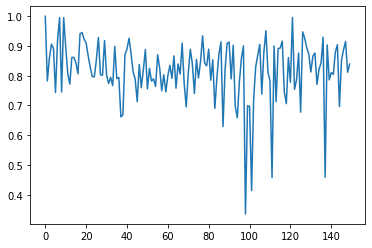

In [132]:
plt.plot(Q[:150])

In [134]:
FoldedTrajectory = []
i=0
for QScore in Q:
    if(QScore > 0.8):
        FoldedTrajectory.append(traj[i].xyz[0])
    i +=1
    


ValueError: unitcell_lengths must be shape (22339, 3). You supplied  (208800, 3)

In [135]:
Folded= md.Trajectory(FoldedTrajectory,topology = topology, unitcell_lengths = traj.unitcell_lengths[:22339] , unitcell_angles = traj.unitcell_angles[:22339])

In [136]:
Folded.save('FoldedTRPCage.xtc')

In [61]:
disMatrix = []
for atom_ind in range(len(CAtraj[0])):
    dis = []
    for second_atom in range(len(CAtraj[0])):
        dis.append(np.linalg.norm(CAtraj[0][atom_ind]- CAtraj[0][second_atom]))
    disMatrix.append(np.asarray(dis))
    
disMatrix = np.asarray(disMatrix)
print(disMatrix)

[[0.         0.38086346 0.60542053 0.90447503 0.95232505 1.0177466
  1.2289256  1.420685   1.5123984  1.6824272  1.448112   1.5830606
  1.9427571  1.9386197  1.8275663  1.5388496  1.3021647  0.9820988
  0.6314658  0.6654871 ]
 [0.38086346 0.         0.3874597  0.5809871  0.581768   0.72573346
  0.9293767  1.0663382  1.1818689  1.3872931  1.2104417  1.4101723
  1.7346625  1.7185161  1.6727897  1.3663657  1.2190145  0.9344491
  0.6015896  0.78941375]
 [0.60542053 0.3874597  0.         0.3795695  0.54858816 0.55470175
  0.6433273  0.8903528  1.040485   1.1462082  0.97491646 1.1126856
  1.4522358  1.5074211  1.4874724  1.246784   1.1348854  0.81287026
  0.62331134 0.9348867 ]
 [0.90447503 0.5809871  0.3795695  0.         0.38602072 0.55355847
  0.48210895 0.6210741  0.8825294  1.0150951  0.9785352  1.1754633
  1.4462414  1.5068622  1.5797055  1.3436582  1.3363286  1.079102
  0.92339265 1.247932  ]
 [0.95232505 0.581768   0.54858816 0.38602072 0.         0.38272053
  0.5341695  0.5135377  0

In [15]:
print(disMatrix[0][1])

0.38086346


In [16]:
Q=[]
for snapshot in CAtraj:
    Q_score = 0 
    totalNumberOfResiduesInContact = 0
    for atom_ind in range(len(snapshot)):
        NumberOfResiduesInContact = 0
        for second_atom in range(atom_ind + 7, len(snapshot)):
            dist = np.linalg.norm(snapshot[atom_ind]- snapshot[second_atom])
            if(dist<1):
                NumberOfResiduesInContact += 1
                Q_score += 1/(1+np.exp( (dist- (disMatrix[atom_ind][second_atom]+0.1) )*10 ) )
        totalNumberOfResiduesInContact += NumberOfResiduesInContact
    if(totalNumberOfResiduesInContact):
        print(Q_score/totalNumberOfResiduesInContact)
        Q.append((Q_score/totalNumberOfResiduesInContact))
    else:
        Q.append(0)

0.7310585786300051
0.6564489380785223
0.6936242046879795
0.6762193928579364
0.6599366843571308
0.6576218724431485
0.6711341222714498
0.7111257721110513
0.6484849735711556
0.704902483782963
0.7176819926337284
0.644580213561376
0.63319756979301
0.6947734577743189
0.7080714936392398
0.7046889800763666
0.6835219535254415
0.7866383419743262
0.7621156444047424
0.7442576466730442
0.7372172041807344
0.7687507489241651
0.7016662941125701
0.7318388933064921
0.6974551072021834
0.7548816148274444
0.7599464536049976
0.6893604008367845
0.6732762004304186
0.7270939920256579
0.7190915209894594
0.6962427553640987
0.7217826810584818
0.7367483161388124
0.7242510096889374
0.7004601328839724
0.7408836347483861
0.7806180917471512
0.688471412006586
0.6775971497006016
0.6957648177311465
0.730015592779929
0.7205112764014373
0.679300030621955
0.7127772603393319
0.6620086620807142
0.7152191928750044
0.740790062418722
0.7277552200511358
0.7339231855244934
0.6967508974762316
0.6957954062752211
0.7253890316318238
0

0.6350067908964598
0.6701394803436149
0.665584635966016
0.6506439138515655
0.6986120273084945
0.6148558531345382
0.731466657837439
0.7420608777905223
0.7287210638019066
0.6252692981504355
0.6555321048122985
0.710039333319363
0.6140766474569797
0.6824118217418423
0.6146670444496217
0.694708112909662
0.8022227523525349
0.7256204387902305
0.7161125199470157
0.5795316510689109
0.8206302970154825
0.7816714613712317
0.7466889070827911
0.7185416432131593
0.5571970767260515
0.753031908583096
0.786374657809611
0.8126432790288736
0.8132598581542806
0.6648740264246411
0.7499183679406043
0.8361992289650949
0.8017341586497413
0.720428727234512
0.8172274075028509
0.8027656861408847
0.8209501918174495
0.8106746077851451
0.8300142281023316
0.7758248777174096
0.8226246145785069
0.8297485694989871
0.814612650949895
0.8595267788695641
0.8227365850283817
0.8212676660326184
0.8411610752382426
0.816186774939741
0.835596513320008
0.8435015209746791
0.8012520013050191
0.8157619280698754
0.8274128840078024
0.8

0.7339878223208295
0.700425949879336
0.6231381041231485
0.672822518443343
0.6512125079234937
0.679779468153414
0.6512148199606966
0.7125416148674445
0.6664313171889935
0.7471056506523391
0.6717786370602378
0.7030230528468527
0.730869640950181
0.7319894576697709
0.6039124734990239
0.6397825809019783
0.7382646969280138
0.7088218967535419
0.6179915977452477
0.6579890889034266
0.6885754322444104
0.6706186488356497
0.7646693003907591
0.6685651226052223
0.6566701341566091
0.6941982600514669
0.7635590456551448
0.678800004487345
0.6704349655326748
0.6988538393830889
0.7059941555573706
0.7085147631365009
0.6139664714763641
0.7258593199453605
0.6614073253733685
0.7255637182417336
0.7186121033464958
0.6315233278988951
0.8066603831769463
0.6938593194935748
0.6501838939547375
0.6604053999719338
0.6442309640665204
0.6401622612190748
0.6899287696692049
0.6563941242590895
0.6838464789888676
0.7365930453187185
0.5714875506171301
0.5965301509278106
0.6396133343091955
0.6222393687780822
0.703638361795865

0.7118045084685306
0.7133959697112905
0.6472514623192537
0.6385614490941978
0.7007177486242931
0.6491569445205008
0.6209582385643978
0.6408470455643525
0.649372558935079
0.7255968456562524
0.612653640038538
0.6202960689999475
0.621787182433075
0.6781085841204635
0.6523602475430299
0.6280877078201583
0.6863642937023732
0.637841059254789
0.6165908347158151
0.7032326748307796
0.6614276954931658
0.6382151553035199
0.6520720696139858
0.7191949367775724
0.6318768192215036
0.6653398540509451
0.6475520037484354
0.685230239646376
0.6501629908101069
0.7055421858222529
0.6493838545059517
0.6742866080894729
0.6252820627527896
0.6958599330934507
0.6085984854204716
0.6896420693003488
0.677093845815962
0.6529056884446015
0.7354189625640585
0.7067013232670101
0.6279713168526041
0.7019801311568277
0.6576159290700623
0.6721308055490886
0.6512165687063409
0.6729778840100763
0.6699621086104175
0.6907246824749279
0.5934323813294619
0.7376161613524294
0.6961460106422985
0.6081890111444231
0.6645330312235098

0.6533156128239912
0.6901133782725489
0.6812671822149702
0.712344739663596
0.6709497572446861
0.6290464808305805
0.6480715835070726
0.6839147539684483
0.7188419361961127
0.6746137479429929
0.6618019829151135
0.6976116052386634
0.6506404662214054
0.7135209504906589
0.6366515144691183
0.705176039409466
0.6669069634972289
0.5814632739205259
0.7073551197372054
0.6637986335392884
0.658695472210483
0.6856261388645885
0.5722558429865223
0.7422263815114095
0.6217462331166566
0.6563263488008044
0.6698135292184398
0.6741042260855602
0.7384198388023875
0.7151826524259022
0.6559469620351058
0.6775937153699381
0.6221557803018944
0.6855671304972436
0.7089631395611096
0.6915957655096978
0.686831460577637
0.6744872489174397
0.6668432506357305
0.6575039542419185
0.6410268571857627
0.6908314701902232
0.7094318801465032
0.6910083425083416
0.7410968618532607
0.7206149585234741
0.7393867471288207
0.6980451398564818
0.639328738886278
0.5964447557245067
0.6392784381222524
0.6071900095304128
0.660721906817379

0.6476409656887127
0.6390602280104702
0.7853965201429001
0.692041573018594
0.7310658699179348
0.6990044130679133
0.6886288101953209
0.7667185045000774
0.7202713267780075
0.756560179279001
0.7014642923219362
0.7377963659172009
0.7396596392365781
0.6673244086720761
0.714484260867648
0.7516510935793848
0.7386338798475032
0.671235964405746
0.7276791900645394
0.6918969467872033
0.7163589850790114
0.7185332301871102
0.7111732099152642
0.6513937542587782
0.7756883670218216
0.7228023517974564
0.7102607049078113
0.6833975842473184
0.7664422750815775
0.7101471994973153
0.6737217322605503
0.7466991967927754
0.7015118048271353
0.5379041437627289
0.6811538808067803
0.6428712293622357
0.6999160477002313
0.7115558677278222
0.6078854751451925
0.7339910405512393
0.731617444907289
0.7590442004355762
0.5971990361844535
0.7350820360329814
0.6440886825173064
0.7050110733496806
0.7164234119760567
0.6623639032660502
0.7197652975845772
0.6561456548445835
0.6518881300037753
0.6990839879455725
0.669238594146047

0.9648197605293168
0.9662220564656887
0.9628244869400108
0.9758148282254863
0.9673962307472256
0.9662223836543397
0.9605045591712412
0.9613084643490639
0.9652070175211569
0.9521439824852879
0.9523538051023857
0.965665015431241
0.971796972346653
0.9619169338302682
0.970270904023257
0.9455172228339068
0.970632613708183
0.9401106530984482
0.9482004608893391
0.9586639272525281
0.9470853593841349
0.9279004114256935
0.9323268382496719
0.9641012589545668
0.9559577157980174
0.9752730134797095
0.943512570087578
0.9771376202949477
0.945779676564675
0.9627504548189324
0.9460583065542651
0.9830212788808614
0.9471332427973882
0.9264183329334701
0.9385644820720757
0.9532820001090493
0.9428194998158133
0.9613034712657375
0.938555084886115
0.9608685223772696
0.9480070043653902
0.9731682051034467
0.9613499518118298
0.9253180767643332
0.9671164387198152
0.936298052263659
0.958964590795925
0.9698329117374206
0.9591011511073637
0.9576670929227971
0.9676639311860621
0.9664231261414139
0.9469349778514266
0.

0.9466600002133242
0.7571226160583359
0.6039922170304591
0.627128295408997
0.8866608724411583
0.9465977957394268
0.985928235993332
0.9501027297875068
0.9148959706891636
0.8589303570900125
0.9384369837944775
0.8908702658864718
0.9815068830988103
0.9267010632867861
0.9472408221534802
0.8362477537031207
0.9391690229764574
0.9560327245755509
0.9694314968048373
0.958426847301673
0.9670037243601098
0.8425258620997444
0.9895401683524316
0.8884335660792092
0.94492669169083
0.898111058031561
0.9022822988618727
0.9913191437144624
0.9441028742528386
0.9198094327962115
0.9599976155287412
0.9348575486497489
0.8921789802178314
0.8152767419245575
0.9065915276357395
0.9141093433645181
0.834122891353402
0.928639133561866
0.6732438727428427
0.8996288720612587
0.9278963683777322
0.8973895566822844
0.8574768979900668
0.8719345849929137
0.9002609674101276
0.8573137888526328
0.8191629439694337
0.9127574924205886
0.9140082079560643
0.8841029967157523
0.8124408665001627
0.7742177416371445
0.832179714728472
0.

0.7464338612889713
0.7233198784331067
0.7628553566290533
0.7225078280175485
0.7392278864813988
0.7825851565430897
0.8351101558427644
0.8467525643937367
0.7755624843563209
0.9449184748475501
0.7001834457719278
0.993928846124761
0.9618237046583691
0.9127593532445868
0.9586026379568123
0.966441160432652
0.8877029296430751
0.915488574604287
0.9701719930151732
0.9508300802579178
0.900027400716949
0.903334340234335
0.8921538404332577
0.9753972320221223
0.9388082164134701
0.9497509425967761
0.9393891622051701
0.7378482926037764
0.7694849951737798
0.58916284169238
0.7022650743309097
0.7788528042890687
0.8198990969928464
0.7615410109206356
0.8118361373266936
0.7803503739770161
0.7680611896271875
0.7813645447677172
0.7782583809089294
0.8505707872592795
0.8541674594202926
0.7847027141892472
0.8184131836823104
0.7842004230118064
0.7944556532497141
0.7448256114782744
0.7865392261623008
0.8156123325031902
0.781114218179868
0.7048875842011746
0.7897031278323209
0.64224239167231
0.7430088361182615
0.7

0.8641678107603354
0.9744919127833174
0.9787811515097007
0.990319039232853
0.9763928869470545
0.9675973446226962
0.9422787840899386
0.9597974913513309
0.9475936419515819
0.947085107243662
0.9473567863851914
0.8690885109542694
0.9300355964563535
0.9542960630139624
0.9667538606923067
0.9337601329022472
0.9323701386200773
0.9368865457471766
0.9171938260933261
0.7837463552260814
0.7623313895153553
0.904127020544754
0.9403444353078791
0.9647929763248092
0.9340610557208627
0.955875202492728
0.9273004766477718
0.9175333655976193
0.9390260243135711
0.9562594705657667
0.9713101719051523
0.9435837287395755
0.9561070575048864
0.9538884266659934
0.9735974266034981
0.9429481056046978
0.9663880395271184
0.9796402160139558
0.9754927807647452
0.96344722368982
0.9676203337870163
0.9699840598686008
0.9592448024706061
0.9585936231837332
0.961972472139423
0.9611583535291186
0.9640792551992885
0.9240174541982025
0.7445968024140619
0.4028916719946647
0.8685157677126188
0.9356549408040234
0.9933310218002972


0.9756272536688763
0.9718060781221118
0.966080925598029
0.9693366957218037
0.9789566962342853
0.9682886657328131
0.9737112138852887
0.9709683628847541
0.973672474245366
0.9729324333038059
0.9753980961259104
0.9662503301760393
0.9734915061371356
0.9663087875088064
0.9745359199207675
0.9734669238432928
0.9614461534179668
0.9623913831778131
0.9596553499157898
0.9802734455729604
0.9533595805536218
0.9542119479800143
0.9633555788382431
0.948802829421668
0.9653710269589285
0.962797915981991
0.9676593912680411
0.9550689688354875
0.9497310192739077
0.9600103083546654
0.9635317659169508
0.9768433426617456
0.9629903665327014
0.9650185432015883
0.9741530389479368
0.942435899090598
0.9649473570396622
0.9661083032248722
0.9751635102069102
0.970255638938801
0.95144603942071
0.9757175353019661
0.9581740777160048
0.9479530433357568
0.95080766128517
0.9688535070789509
0.9434463976306652
0.9673075417478602
0.9678309894386645
0.9732392229316257
0.9693534930417631
0.9621535186740399
0.9553051255617512
0.9

0.8173063942699453
0.8079405624893904
0.9327324732918189
0.9678285525769703
0.9627210137224251
0.9873613711845147
0.9585836774966987
0.9558969284487272
0.9710714256544785
0.9508519659174292
0.9863137630918252
0.7763543309517071
0.8339115649182859
0.911779744394031
0.8791969382170993
0.851241542290359
0.744035131334474
0.8363106713594272
0.8504859994643191
0.7921694404109971
0.7531619120784938
0.8280438870106689
0.8002226150929249
0.8256084733031006
0.893604523912299
0.4334072310270204
0.9368096300184507
0.9357431767285705
0.9160697994463202
0.9330455140318101
0.9530197732980781
0.9049927254146332
0.9786920164474674
0.9609570611386726
0.8607640946445885
0.8946404623019457
0.9222433619244067
0.6798580372021903
0.9689383472201318
0.7276605434233604
0.975431108985985
0.978763809711916
0.9934793970393395
0.9492524002909565
0.9798284101117329
0.9787545110527217
0.9900719522486953
0.8652954498599456
0.7503319870879624
0.9422808035174115
0.7414020653238154
0.9241679952846056
0.8457316376535415

0.9685629278497657
0.9478555544165671
0.9480386163953467
0.9478628600920244
0.9722324915766443
0.9553566498109911
0.9570692903628599
0.9467376913721737
0.9467010898877992
0.9356311386438446
0.9664365362331969
0.9685474779176028
0.9429392869785894
0.9496633088277258
0.9480622988128122
0.9593396166566321
0.953281254640073
0.9725027682407408
0.9101225968875613
0.9446572441912059
0.950374748543066
0.9504357240357245
0.9420331646924006
0.9506494595748819
0.95636739928801
0.9518372460531092
0.9607263155066202
0.9681033170545897
0.9354930266840895
0.9555238872840937
0.9528559210466208
0.9193555723383271
0.9584455983148796
0.9570261207606895
0.9490461423761705
0.9504355857860671
0.9637649897726178
0.9566354464265296
0.9653779233298424
0.9541287728667397
0.9489125749027523
0.9551089494191961
0.9577184793622026
0.9737088673170174
0.9455127728808387
0.9560491127891104
0.9601517621988392
0.9657523163585505
0.9536500728054842
0.9375136566467065
0.9584917967950884
0.963753192743587
0.959546376920353

0.9660523200439717
0.958967398681677
0.9685698382844012
0.9253870473598789
0.9366250527658281
0.9718688354877174
0.9711090984578196
0.9418582124165539
0.9432978586509866
0.9212312192143182
0.9553172224120567
0.9406022092238311
0.9457227554367118
0.9615129638888561
0.9741695423984784
0.9718061368915276
0.9551847952351998
0.9524803343522767
0.9627861267015142
0.9321352415663371
0.977174068765819
0.9699817102000815
0.9652233134218472
0.9240452902660469
0.960148042792465
0.9653912255662849
0.9665207761255876
0.9677512539637405
0.9692546388559514
0.9406162314933498
0.9645799418658533
0.948832394569988
0.9451394535797076
0.9242877583516032
0.8113642369640527
0.9289444728229924
0.8985146370512332
0.7931304326200255
0.72491205780958
0.9811913797803296
0.882621259687933
0.8199632781083785
0.8170759440148744
0.5983161837695631
0.9347999367385269
0.9799324699528802
0.972314613050463
0.9801775752921514
0.9588355946766174
0.9532554280881864
0.935135340850189
0.8843947387710994
0.9965840738311977
0.

0.9717356686426781
0.9720884750807682
0.9622692996298401
0.956482594621994
0.9659507773165383
0.9635419005983822
0.9526192768621848
0.9575871681071321
0.9606298668260284
0.9508938831216355
0.9604987412810927
0.9552078516570437
0.9649740073470421
0.9699111293204431
0.9662215748507719
0.9705686949860304
0.9607833614908221
0.9643174192673063
0.973542531760937
0.9737954578819129
0.9791905962494544
0.9769591999403328
0.9745808482600137
0.9638417347266612
0.9726448176043089
0.9737827517685127
0.9730613918079843
0.9448280574640755
0.9800025034735501
0.9541343268854799
0.9648248994269062
0.9646630137593043
0.969028297241859
0.9606198789290518
0.9521686316402372
0.9651549755093572
0.9623277862407764
0.9738730537355981
0.9672823296884978
0.9693778613109142
0.9629834588648596
0.9696601956986792
0.9661881165528249
0.9668888313025755
0.9587252565195111
0.9711119042631756
0.9667916672222945
0.9625936363203392
0.9704019664457426
0.9805115358691925
0.9687139838837621
0.9685706222799426
0.9625673675582

0.9778069368365968
0.9950498408438022
0.9416073814392714
0.9344129762935639
0.9124597312193881
0.9341003027757557
0.6298168001455194
0.9098069829766766
0.8643907569709908
0.863237301500547
0.774215020135633
0.972769760240846
0.9726479174554025
0.9474468994408763
0.8681792332431107
0.7824542597628468
0.5766970305076645
0.9790041876778648
0.21185409836591307
0.9889316349572577
0.8106346031845364
0.5281530018908587
0.9634527275905235
0.9205769962954391
0.834089794530962
0.9160738513074834
0.6346721686114956
0.828418269767617
0.18252822369142782
0.7474470389987425
0.9836839520295714
0.8403334245186984
0.8374083895330563
0.8099643459408238
0.8546757456507486
0.8344213123053332
0.8138680348069731
0.8022750167311709
0.9342495853682993
0.926395500605885
0.9496856197516187
0.7792837859285987
0.7333327460636744
0.9076692831693629
0.7299351083128647
0.8893217605040828
0.8787354242761526
0.932740823855216
0.943085972303749
0.948114090896027
0.9769438924851902
0.9573438626503581
0.6251592509444436


0.9292542281313922
0.9504315915563822
0.9446203322678108
0.9281796732237725
0.9267442578275117
0.9422537997661429
0.8850493173248148
0.9526943658590781
0.9451389948462139
0.9424490110343388
0.9500472970076046
0.951289912914779
0.9554055599196641
0.9464371078611309
0.8254875772476684
0.9412809201617766
0.9381322981842173
0.9571089371312924
0.9504321370914733
0.9415400842949663
0.9387942367966686
0.915566955957391
0.937391197599016
0.9594437902648059
0.9244738290832488
0.9346224155875045
0.9493067159815419
0.9469471926853408
0.9545437075795162
0.9434288305288221
0.9655790112392815
0.9688481461007967
0.9275685058697608
0.9466667296632751
0.9406760695860954
0.9494025717632941
0.9306830632275789
0.945672357494869
0.9729249871645715
0.9431683506733854
0.9591224551840131
0.9322730057580275
0.9597310408431686
0.9355534206942177
0.9369950582954395
0.9614658404300039
0.9391466817136941
0.9460739420791924
0.8942377106964435
0.873759854983315
0.8637148197931964
0.8684668431250621
0.958646694952987

0.9620713796050212
0.9698161963675344
0.950841648216264
0.9596455670274828
0.9625934025983449
0.9673478192125965
0.957537391613854
0.9615041344063932
0.9602887297819926
0.9577720117561549
0.9650725036833051
0.936131578544462
0.9637447593395623
0.9663574018822167
0.9658477172320578
0.9502674275230949
0.9480758346690471
0.95360572497603
0.955779137175612
0.9555021980902202
0.9624777174967558
0.9434567849179403
0.9480326149773687
0.9618438187832216
0.9634389464672617
0.9688809880124885
0.950524880703821
0.9689834762272341
0.9659577906777939
0.9535887750444763
0.9651370596721349
0.9644441867801902
0.9757134709178588
0.9762917199250962
0.9440542284718768
0.9440529303302485
0.7807832722366684
0.9264650828906613
0.9581274987445191
0.8913840931358347
0.9480638057812139
0.8973560213665591
0.9028920513457944
0.8940557662546217
0.9362205228650982
0.946113642340661
0.9147643233822769
0.9672285229919552
0.9786889598348528
0.8637023532627884
0.8978075445716176
0.8990553277173118
0.8504340389226082
0

0.9574358355109163
0.9583933994616872
0.9738362136529255
0.9760626480679325
0.9674914156597064
0.9520746715561158
0.9588104554346393
0.9648073054459164
0.9615518593710536
0.9673406848154746
0.9762420467321657
0.9566029520374303
0.9747681153325265
0.971075249937974
0.9819019971449043
0.9763554964463738
0.9781143184686326
0.9717203459202954
0.9528349436814952
0.9594553066503624
0.9746486901080652
0.9623784756320198
0.977450776015347
0.9807054470898512
0.9782909982316199
0.9734631997487778
0.9687327863669613
0.969023151623941
0.9784876848635307
0.9681198222771292
0.9737925256311396
0.9745556402493981
0.9642389770557305
0.9660793725220926
0.9718640828382911
0.9715609002347626
0.9677803161654766
0.976447367462139
0.9763035335441973
0.9586916012369283
0.9793379461177897
0.9649801940017098
0.9839558719358856
0.9759189345225024
0.971525322598645
0.9788315905355238
0.9759002012128133
0.9629900371572285
0.9692283359029807
0.980848245898198
0.9637130814372274
0.9639787990776386
0.9676667128921068

0.8482420865061293
0.8511952975306784
0.8911649734343139
0.8158694984970936
0.9451411299862537
0.9444329445359015
0.6425715581648352
0.7636663754820089
0.713921215587633
0.7567270763076358
0.6414171336120738
0.5962980548663573
0.6026139364611384
0.5829744946062584
0.7882805466889882
0.7721157011735422
0.6186766274149196
0.8429872161200623
0.8832235127959672
0.6500009229752725
0.9451854642763922
0.9485951825506973
0.9447050781346312
0.961287971369211
0.9374242033284755
0.9505463786546532
0.9461408479834257
0.9546951599093998
0.925385014096637
0.9427146477028886
0.9716713699635895
0.9479985780720853
0.9775210066588207
0.9172380336707256
0.9160569056286174
0.8554885823947757
0.9074868244614768
0.8835919942771178
0.8762184433737078
0.9546357832491988
0.921957572353058
0.9749160032509172
0.9774355780185665
0.9892032879236408
0.9859114632308377
0.9915749036980728
0.9545894361777735
0.9346216547952747
0.9948425498422889
0.9071728665466579
0.8932343093171171
0.8568365423804385
0.87909837713859

0.965363769881459
0.9979726714816896
0.9111790206692613
0.8996671799153755
0.8561963230215381
0.8153464174780636
0.898668446240615
0.9358139157604722
0.8739931157741655
0.8481447122255574
0.8334863893414802
0.9192912628605819
0.9128676120814861
0.8000281163204725
0.6415950021167526
0.8450022503822595
0.917733642992513
0.9752440597080834
0.9877558800283867
0.9602775792474312
0.9831604914002671
0.9861520627962767
0.9734510892604658
0.8794853985038705
0.9964429854992839
0.9861525474623362
0.9654924577883954
0.962772015301962
0.9879183346564353
0.9695932464278304
0.9764972150281989
0.9933423378355244
0.8442304917568159
0.9512426838569601
0.9946373780504995
0.9971310431776804
0.9701389758289464
0.9632036001198349
0.9722787055779027
0.7807117388712846
0.9888552008049927
0.9676763117283873
0.9920961416982683
0.9564263544877871
0.9211054372648496
0.9240827050255349
0.9206315264669936
0.7677715056691559
0.9229831770504638
0.9537890881286691
0.8351469959335663
0.936223563440242
0.884503977793309

0.8784334972206281
0.7314085450093518
0.8899190569857123
0.9989271443377784
0.8427043748451809
0.9538307059158905
0.9571496787323828
0.8452578186432931
0.9021772389333681
0.6561559688583828
0.946746673232849
0.9540272361857236
0.955255976928997
0.9613983335488959
0.8949310740847827
0.9035537972874452
0.8810445622340971
0.9166305985136249
0.9973496434695194
0.9067681393095948
0.9924879095099259
0.998623107266848
0.815176227772018
0.9550801202411634
0.9995697395012151
0.9982573791441105
0.9994226423057871
0.9984841629846744
0.9986600368937246
0.9339009183734306
0.8369735742556148
0.8938781003571058
0.9196506003868858
0.7214398032495359
0.9681346208906465
0.7675491605103973
0.9576533955024245
0.8877524755936457
0.7578444910248198
0.9464002376623102
0.929845888654655
0.9186002787469624
0.9494151268967043
0.9006821925284915
0.9399825652857166
0.9498383281958818
0.9442599599298653
0.9570373278671713
0.9710441153044309
0.9597806230414557
0.9638296898287576
0.9553101771347005
0.962779275262903

0.9656074047597962
0.9690433442727299
0.9670773360504051
0.957090481204235
0.9572298179506288
0.9546142269723755
0.9569135450746143
0.9514929395720509
0.9622214032123372
0.9585943847472054
0.9598588716145016
0.954001655174128
0.9535640524317958
0.9639902148300963
0.9680456341524782
0.9504350148629137
0.9536905848209944
0.9555190055308102
0.968282120470896
0.9561971142180299
0.9631228344846688
0.9436194575646965
0.9573665214274933
0.963658422842323
0.9491226868730814
0.9617724839212913
0.9432889169179558
0.97154797236142
0.961272130941896
0.963581792041999
0.9463591265472788
0.9484802525113943
0.9667854173296696
0.9616480660275178
0.9621197286253079
0.9653869059661649
0.9657480907367814
0.9597062067446475
0.9638626312094646
0.9513460862887438
0.9535546272131699
0.955857577196338
0.9323331947328056
0.9688975366504431
0.9622551538503775
0.9598305490516529
0.9526882026345901
0.9591660655968106
0.9663700770490983
0.944821902319002
0.9598550908739861
0.9575950364950985
0.9654645003421835
0.9

0.9665054528921225
0.9624137184605466
0.9374077232926116
0.9639674627587206
0.9662781314374869
0.9677631737043695
0.9538156528742773
0.9477215213355862
0.9346176878830473
0.9196649041201069
0.9542257075932883
0.9598008826039881
0.9623214607096593
0.9320815951414719
0.9453880624943339
0.9721054664868227
0.9644780209408073
0.9316500957638282
0.9308021100049557
0.9701541513818016
0.9736877370257104
0.9556586991281385
0.9615908685375292
0.969725893151576
0.9652771762406223
0.9618879240063226
0.9595022814107874
0.9687765946260014
0.9415906142361556
0.9590239717336638
0.964274790921568
0.9517501350571517
0.9435691237206896
0.9478914704044857
0.97319685491212
0.9579570944636808
0.9642919196220608
0.962679692139345
0.9503211936985876
0.9428494493338478
0.9586439029578796
0.9442470356046859
0.9649409043254337
0.9566506343146416
0.9572089361174183
0.9592606241587908
0.9669856621213587
0.9626133546242185
0.9722622349149482
0.9535906441228966
0.9703223470042668
0.966444636441209
0.9620517353946277

0.9901387049752607
0.9701649688743986
0.8731559847900293
0.7979530374255437
0.8469600297316059
0.841727737509774
0.8289989220246907
0.9509408350902785
0.9506781075371276
0.817687205150999
0.9369358580585643
0.8453025132314914
0.9945827451904603
0.9569638380110239
0.9850095560185581
0.9559762893615664
0.9231982950236741
0.9339371172275698
0.912529227089811
0.8970637178007043
0.922315929319069
0.9508787078367926
0.9963744928466527
0.9707497083897842
0.9965824261487078
0.9948784133172155
0.9925036608828315
0.9927654865039967
0.930114214841825
0.9334682457799208
0.9356387184401976
0.9440159557329496
0.9510207618263116
0.9645396627230453
0.9603505311793573
0.95159999580334
0.9558497028333511
0.9454469180804874
0.9501104475994614
0.9918705692766241
0.9227358193293178
0.9611856387882447
0.8681456590050567
0.9668693765418651
0.9613001106105189
0.98318817902751
0.9715889321028991
0.921301823308989
0.8965446662515677
0.9829634228451122
0.8298127197903831
0.8147560351483711
0.8927829344393571
0.9

0.927306616103148
0.9499766602415329
0.9552471117296722
0.9415768368944247
0.9822555587219213
0.8786961264442653
0.9543019959803454
0.9416852708723579
0.9471003318142479
0.9460613540321592
0.9478056488914788
0.9457466996798172
0.9385338658419087
0.8965130665137712
0.9419012920126527
0.9657365464542492
0.9298905027077896
0.9274739222785765
0.9207839862566228
0.95278113007869
0.9520955398381308
0.9444490432300006
0.9439305995605898
0.9536952328187945
0.9168324737350283
0.9508031868938008
0.9259238740071695
0.9269528661493699
0.9346887762717061
0.9106284227258642
0.9396462986564897
0.930348919449906
0.9519965598848239
0.9137887644442317
0.9160687713511143
0.8880645634435682
0.9237281243376674
0.9203310353879042
0.9439304756024893
0.9050152476768518
0.9436015681792104
0.9219498174243784
0.922555427064905
0.9338137347347644
0.9423448671567126
0.9285260176349024
0.9422558695555571
0.9355924125503269
0.9429548398566561
0.9209818118228672
0.9415528348230431
0.9417241399099244
0.951011003452903

0.897881584047081
0.4815091813472502
0.4064844481695911
0.8175711129883747
0.6757461769787562
0.8363010581897862
0.856797555124195
0.9661882529007805
0.9246477956706087
0.4470182347495683
0.8527203672945471
0.9069670927379132
0.9967598097069654
0.860623727130471
0.8520251918108914
0.9634631945981692
0.919091679401265
0.9483195897861607
0.9757460783795371
0.9287239393058624
0.9357460642959516
0.9415861088826143
0.9502426188637801
0.9678205745226847
0.9294479665427324
0.9128221077071722
0.9830515590732549
0.6699260922443528
0.9960111869471556
0.9767838470819341
0.8446565932760797
0.9329377914165821
0.8699839413871089
0.9712006094008294
0.8945551766823852
0.9741571121414205
0.968612696500211
0.9850608211849556
0.9046899444664468
0.9680923229477201
0.8963953478803474
0.9524148076484943
0.7125314957190757
0.9005637936527003
0.8189980567988748
0.8234673107113123
0.7582400784843041
0.8251793279899821
0.7433961368657599
0.7631434422184173
0.7501144319249409
0.9234332307460801
0.732546466076391

0.9591505036006089
0.7996022934826041
0.8934030486556658
0.9213427986926899
0.9226052305243424
0.9728206671521439
0.8572601606915892
0.9167648585167201
0.9311525468221581
0.9274955266031233
0.8933736244922917
0.6924591058519742
0.8372925137496333
0.8620366736851937
0.9394950674466648
0.7609047080830178
0.9718854890945974
0.8839603354517599
0.8097494082301364
0.8431892493294856
0.7883645783372474
0.8583975359711111
0.9273623403999256
0.7386859753924593
0.7355835468027676
0.7841113007849332
0.7670725512479398
0.8670484728367807
0.8301202421899246
0.6970605266310617
0.9009778211916564
0.940475000708171
0.9117594720366661
0.7540946278515164
0.8930354751131799
0.8552171688372905
0.8604835719494284
0.8886899047727752
0.8963575012275494
0.9381695536183695
0.9172006317708574
0.9637160149474835
0.9264930098543661
0.8573384244917666
0.7642578423690809
0.7722997332332617
0.9073970188834198
0.8641818102779417
0.9086300790782669
0.8878766548843678
0.933392054810044
0.9132694356718324
0.852076829909

0.9639048270040671
0.9696938075388187
0.9691920534895887
0.9733236444214725
0.9735970849137706
0.9956059172607382
0.9137586057607046
0.8991227072040916
0.9487809959094771
0.99957951845141
0.9541611411501869
0.9556761270453021
0.7679122291672686
0.9988838725114638
0.9993481992806335
0.9954690745948533
0.9914878093400062
0.0688787409337491
0.8490788198251606
0.7653326245835944
0.658256654386589
0.9183876103624121
0.6370292406379834
0.9312570862580887
0.9652427064602707
0.9019157366321577
0.9234612313446531
0.8913647186463335
0.9428857773925693
0.9515953604720668
0.9348079458554855
0.939980593265722
0.8951824650407987
0.9911111081800583
0.9382389178444273
0.9449814451271947
0.9278303755515814
0.8956341690209985
0.9320313305574253
0.9549561137580318
0.8907310178925015
0.9341300435792799
0.8343357723692704
0.9250414795867121
0.9160581736824293
0.92772528054989
0.9022356595606028
0.8903276551392566
0.9789042786125067
0.9575579967197162
0.9530426791736772
0.8478480585775139
0.5818822764844478

0.9407831160558363
0.9611153859622154
0.9701853124868892
0.93050706842095
0.9062866196939214
0.9439467779150548
0.9562721461589101
0.9653057110663928
0.9360383691985958
0.966135505210574
0.8675656285290226
0.9048868300375114
0.8789882908225144
0.9487068615984918
0.9037125572626068
0.8593469477177312
0.8793536808670295
0.8954859490811508
0.8864410739954808
0.9586525466110374
0.9883428681615236
0.9567131275321946
0.8984517170427246
0.9815306207520862
0.9126206848802743
0.9318095200869337
0.9135607191875647
0.8671551244058235
0.9417366519694697
0.9019771548576291
0.9534528949898937
0.9678041686775477
0.9573183635196854
0.9491175673051557
0.9356822905207137
0.9614010856709204
0.8845344033936934
0.9479337540765821
0.9536972215169145
0.9635049204450591
0.9798744420659105
0.9380091024756361
0.9758584431141044
0.9735718574137419
0.9409610326148662
0.8719510806785385
0.18268471610123943
0.9618599401542003
0.9122091586207727
0.9739281860203635
0.937956660242506
0.9616239025335807
0.9026766267857

0.9634002849919294
0.9835295585896147
0.9852876790705744
0.9498033992261367
0.9588573704254353
0.9606588216361645
0.983440428063348
0.9062502563417976
0.897321599104019
0.8849594507754496
0.8760382217705097
0.8059670905076622
0.9629361768222214
0.9608797621795814
0.9604960088833832
0.9765578168173196
0.9606279563907266
0.9602685556157629
0.9519453883406025
0.9583973411797536
0.9850819258640299
0.9780225748435503
0.949124148856936
0.8956238365175809
0.9496272065662963
0.9204150155703835
0.9446821384994983
0.9446681390745506
0.9232535693997261
0.9418224136827271
0.9282922652522163
0.9226025233000069
0.9147566525684038
0.9081329656399618
0.9413057816887181
0.9284546136809875
0.9164986098967504
0.951405304995002
0.9240220684499132
0.9679701823928454
0.9060286986055023
0.9219050775581454
0.9246837543158991
0.9267559459974303
0.8649283685278042
0.9855276114811047
0.9150971195496984
0.985105937554582
0.984112090004254
0.8919925211705874
0.9718259873129073
0.9547224913259915
0.9504220767525142

0.18756983580590514
0.6206629214576573
0.8860844848285389
0.9875533231835174
0.963952758867655
0.794789050505875
0.9185770887066671
0.9077732296225582
0.8476979726036887
0.8961870613547398
0.9096254801695615
0.8262966318706544
0.9954750491235637
0.929208761821172
0.9570038629105169
0.8324241677782254
0.8887606435791853
0.8622307204420899
0.9322608866593591
0.9016026847192539
0.9170876797040753
0.9082629522698423
0.6843198175490822
0.9541463246609528
0.9585518358837013
0.931232196949455
0.9247995039072517
0.951186371449998
0.9133238205632122
0.9507297895539688
0.9357593931167731
0.8735075006985118
0.8845017988366952
0.8016063349813736
0.8671913420354836
0.8767870600281743
0.9199906055408947
0.9491989301052886
0.965287805115052
0.9524028573349738
0.9342747886729006
0.9231073970753223
0.9072252901130384
0.8668444309877521
0.8698262929422925
0.824703852614776
0.9617364492824124
0.7006539883500076
0.8644947522295715
0.947741779663714
0.9161033670585708
0.9374488500776406
0.7944510199178895


0.9074444577369624
0.9517679795306829
0.9460534739696588
0.9776781184440548
0.9672942077282329
0.9787037312574185
0.9624517235234996
0.9518796764662407
0.9897592095660304
0.44793043715530967
0.9489894817451847
0.8204266892287322
0.9005981019553868
0.8591035229229159
0.8430186984738949
0.632419008677007
0.9710375446639312
0.9614756673265134
0.9463175688137276
0.9490589514175297
0.9683294216177573
0.9502531190612227
0.9540511818158596
0.9250615487858794
0.9477590396265666
0.9286156989060276
0.9393990001408048
0.9152284563225374
0.919846679747013
0.8554000008214157
0.8753038992140507
0.7602401090891753
0.9745976349230948
0.9404937104193984
0.9128238897320744
0.8807234250859391
0.8981733845664007
0.9934004251629359
0.9184406312415179
0.9035381461500234
0.9868787524345217
0.993397107932328
0.9073901040352507
0.7437799849369621
0.7205633125668691
0.7674952516000102
0.9912505325790212
0.7673461892554827
0.9127731439266397
0.8781155198087948
0.9198483781060781
0.7894014498055927
0.895681310552

0.9590848129644208
0.9370780640265993
0.9493386045593053
0.9380634217767578
0.9222770206816497
0.9460871652608998
0.9039613277628804
0.8941897728127248
0.9590970974648512
0.9381750485284297
0.9473990838845461
0.944069659082523
0.9586605950234612
0.8638994186539444
0.8634231301563815
0.6282834320904543
0.9771118662078944
0.7530559061547969
0.8679510998284743
0.9602027083704818
0.8433159670502676
0.8958028404862456
0.9762498657163956
0.8043172737518147
0.8132714408744466
0.7419776438332756
0.9674531449839263
0.9558047048755306
0.6534710784225423
0.9356868117695907
0.6824278688062102
0.6922702106693918
0.6694635918163189
0.9539734212794986
0.9459303980239009
0.8857907342134941
0.8606489676662182
0.9199804063140542
0.7625433480747952
0.9616293868731829
0.9319481596704154
0.8807813316856089
0.9346868222820355
0.9371755338717943
0.9845089646674691
0.9497997609845508
0.8085954430868592
0.9342025607271177
0.9435331847418722
0.9728680534456811
0.8596868659134705
0.9843003761193557
0.83805496184

0.8077693692200313
0.917678678687625
0.809112123782341
0.7904283609508205
0.8235070492718712
0.8950446997964819
0.8487342914796191
0.8715248529913924
0.8311059181969167
0.8381005763836911
0.8797455105642797
0.9233212722966869
0.8919412164933481
0.9193927712040812
0.927245903587378
0.8988086138871932
0.8585222695736349
0.9170073852567974
0.875607007287762
0.9316442438530205
0.8577570041030632
0.9292160285629407
0.9361765061866806
0.9183557793383383
0.952609360169118
0.9467997950032704
0.9276365629458644
0.8410224420420971
0.8779822535879498
0.9153976923472561
0.8896939270557547
0.906132461796902
0.8780598580801874
0.9104557129622803
0.9175833856442202
0.9006500051723761
0.9059314728203722
0.9059376209089554
0.9024164150276737
0.9074573719215709
0.9022538082472817
0.8994169002765192
0.8715376290527731
0.9059401071270395
0.9049647328207105
0.9326845418145048
0.8946313406398742
0.8551202435523374
0.8374924608879254
0.9012134417506263
0.8868800082863899
0.9157689656642176
0.3158936674947792

0.9564045895601855
0.9794553341798223
0.939289232756361
0.9655585072380404
0.9649746566146681
0.9651239595569044
0.9582122681223577
0.9687734051358096
0.9594873061208229
0.967548288191236
0.967165246020068
0.9675694169621016
0.9559819566839775
0.960424909643959
0.9608170524674673
0.9507117436482821
0.9583952198959624
0.9567614037156787
0.9475732108164523
0.98186198460718
0.9483172881194264
0.9428539662727986
0.9800866249404615
0.9742712862288659
0.9507090908368983
0.9509609115907134
0.9821920369522374
0.9509069848450827
0.9459705433063726
0.9628873933000748
0.9601771916737074
0.9419369398780919
0.9589727869061576
0.9611482008093163
0.9523533189050432
0.9612600528739097
0.9615188523415092
0.9589322277765505
0.9485371453557799
0.9535509281230394
0.9575136001249845
0.9536783430405507
0.9727030308411178
0.9627314891707672
0.9639299849142824
0.9689397792159774
0.9365811856939232
0.9142088433221085
0.8844503643627974
0.9581827377133285
0.9580352199309289
0.9435536260400547
0.9602754211335407

0.9700524517377789
0.9585535364593823
0.9480297970213853
0.9587008652093059
0.9735529187077729
0.2013697912366598
0.8094711612937668
0.957023187993232
0.9139793305873625
0.9588707942381746
0.8013366958275611
0.8781171221866526
0.8816307034436311
0.9353962123813597
0.8817007203789594
0.8466749654035836
0.7940608979812656
0.8400419376649503
0.7666008567672865
0.8990671883990439
0.9110927169399456
0.8328627824946992
0.9296471290132485
0.9211534654602848
0.8711609277033094
0.7264635026103741
0.9470159537029469
0.9206588447094886
0.9484603489904719
0.9230795247741271
0.9380102730326139
0.9287268824196326
0.8979731485214587
0.8964442488315145
0.8955022028000769
0.9276713593924495
0.9275931645079518
0.9127603498285033
0.9450883107964588
0.9308230773853653
0.8610518967318613
0.9716852243322519
0.9012304789574147
0.8029482366487455
0.9021698514887972
0.7910543305039116
0.8646865044864894
0.8914851805805146
0.8961256371426779
0.9254430731055431
0.9323578007977226
0.9371730130209988
0.98232496857

0.9961191348817537
0.9811688359447451
0.8207684896295959
0.9088719152610721
0.9965210768147947
0.9469386829053092
0.9834301668519569
0.971284738634806
0.9541452798993242
0.9285185274342175
0.9814351475185674
0.8980211118304652
0.9202073019386461
0.9539516692023084
0.8815628182456929
0.8718749184509826
0.9563544732331088
0.991547948206095
0.9946213442052179
0.9852904816740029
0.9399427807665219
0.8078551228503704
0.9473611185641057
0.8816575260478743
0.9105552370137294
0.8637220364601468
0.9032885965282468
0.8734098675316133
0.9168487482340175
0.8642970811897225
0.823939008162264
0.8492252703526305
0.8199051698333454
0.9118246856964366
0.8938462185526665
0.8535558908418589
0.8283168733170372
0.8019213650449595
0.8472200190307385
0.8217810969564674
0.7512638023075744
0.8122830177148749
0.8449684737170384
0.8681460591975706
0.8084030829467771
0.7861669030007943
0.8607881927230087
0.8616443328194263
0.8370210541624109
0.8584805397109969
0.7737365700009702
0.8943136336923128
0.8518461360863

0.9736090917381844
0.95535077892076
0.9551391201696715
0.953975682791499
0.963118707832219
0.9576939654972452
0.960420350567155
0.9659063764409882
0.9710191962416165
0.9626678605196091
0.9741030727366768
0.9562324955646304
0.9444645373820602
0.926629241875543
0.8778306068947428
0.9457097783948172
0.9732687371401209
0.9781050690647289
0.9807935337836823
0.9709730111365733
0.9940148365312449
0.8947289106966683
0.9277457574096204
0.8980588208472571
0.9052761341631781
0.9038768506826279
0.9078789287760657
0.8706207704306947
0.9785229941414717
0.9940324367466198
0.9564415257016763
0.8857882256113431
0.9492476164733062
0.7583931690141972
0.7714720215989538
0.8521487229449123
0.5069924504233038
0.8951694566554977
0.7324086813795195
0.7908773822318479
0.9347154304449102
0.8762974175321917
0.7049129943315439
0.7868825885251313
0.8685033060745677
0.7849200043959254
0.8975151204271012
0.959224321796869
0.9261803118069353
0.9293309351326272
0.8747210743394599
0.7832456015681887
0.9535782591982851


0.6614685924246131
0.6448016295903605
0.6338639115026513
0.6136155079518726
0.654156061958309
0.6422210608235873
0.6719201383870435
0.6156630678647141
0.6185161181396912
0.7057071907562613
0.5717431510795855
0.6406391585097516
0.6020381918448388
0.493582135963897
0.6299027242216182
0.6731671809708072
0.6414331624387676
0.6750949028551507
0.6433335453504385
0.6618163076513287
0.6798790974758936
0.5330290687510867
0.6478500784256591
0.6856029832651396
0.6507058204549356
0.6215004713990188
0.6776325923785406
0.6809267346909106
0.6670796831735494
0.6765015404058105
0.6146737380239382
0.6657021891287208
0.7831691234115817
0.6789563027978954
0.6534644508202344
0.6795525382674373
0.6892562000954877
0.6206103084452039
0.6222586871527009
0.6031295800702842
0.611105630999852
0.6515889690914057
0.69151463332029
0.652090630300414
0.6478798924044246
0.6864663682946253
0.6651429167881867
0.6548245322660258
0.6632099766866805
0.6474237933700614
0.6081924104629304
0.6592441147847005
0.6676794660509301

0.7157600373587756
0.6389730982476074
0.6998434319723777
0.6411536036396854
0.7221224646479468
0.6857647126338725
0.6163817326651369
0.6144037636865101
0.6932412274741877
0.697014899040132
0.7199702701519207
0.6472271552467611
0.6580647355141376
0.6104543235909838
0.6003836456083463
0.6323852529705618
0.6906071059274371
0.5925734282999447
0.6486573961930029
0.6571933921292278
0.6671148644375734
0.6456470620534832
0.6555974590286049
0.6611391409790333
0.6665880943768777
0.6393560829676785
0.7295680706129346
0.6773029292964794
0.689361951491618
0.6444586826124629
0.6368799516236265
0.6643996627427379
0.6305060469459712
0.6767050170743983
0.6843116137073498
0.6309985778311364
0.5859530001506892
0.5715762118368728
0.6370990832470453
0.6741919176347
0.6364940219044775
0.6713415280341865
0.7194989185176828
0.6882123224314449
0.7453815296132652
0.6579489874610467
0.6665986999297717
0.645527263858143
0.7106623000506476
0.6562742600417766
0.6129175104573583
0.7182158779594928
0.6408412942635073

0.5792416268600095
0.6506708961725607
0.7439736403026531
0.6870414904326493
0.6124373759917987
0.691775124003067
0.7632288879436284
0.7132124795863982
0.6968030066499039
0.7512995384245704
0.7415142662218706
0.7461193530859274
0.7670700124828818
0.8200526162297087
0.7298841297396192
0.7998830282537353
0.6552280897880617
0.6800638699424951
0.6386243016542107
0.7061306575321321
0.6806861034564595
0.6639164256997172
0.6772736800105743
0.6627761694378838
0.6488140834009309
0.6672665386600614
0.6936991780961418
0.6397172171133615
0.653093335722967
0.6660379544223436
0.7609651540427992
0.7316141769449388
0.6669264392338143
0.637734318930817
0.6665280078296888
0.6823971667919116
0.6645598306451963
0.7021482831801082
0.7203275436388709
0.6670872289894725
0.7003198308384766
0.6645403185060659
0.6676004511523628
0.6133436085139067
0.7371723684513453
0.5079452789905327
0.6691933956654224
0.6991961085999792
0.6770476223368448
0.6852906655984955
0.6723340149337254
0.757644202433358
0.68320541604747

0.6903976702175112
0.7150458217854957
0.6391417220044542
0.6785142696243981
0.5729203699440094
0.6921088994025362
0.7263306908469777
0.6661680077320769
0.6238399428328667
0.688605947899892
0.7310724097590551
0.6744274567484083
0.7889469561364181
0.6740754443717024
0.6850390716260265
0.6360974097761827
0.610048149588032
0.7255958661405855
0.7486398528534304
0.7162022782836953
0.7229546733371914
0.6699987891013603
0.6972667086885067
0.6829629431198572
0.646929040741053
0.6771020911602873
0.714467139672539
0.6886545512146116
0.6981164042883929
0.5970812749846987
0.6020842094561796
0.6323322815743181
0.6647113189043067
0.6522836387628079
0.7273771459174307
0.67369521047446
0.6130388349140669
0.690037425236323
0.6183551013861274
0.7194247767979095
0.709389379150551
0.6269631628573537
0.6881720088072781
0.6210703076740384
0.7539560334695873
0.6813081208624086
0.6797340532145967
0.7141831557836659
0.6304314648311912
0.6887113899507247
0.6781874993862566
0.6278220400741297
0.6506170080219453
0

0.6957711948125869
0.5443434229966942
0.7340816126042425
0.7134171988553262
0.6948537876002986
0.6744568463280194
0.6977728243440672
0.6349506264238287
0.6714671661833793
0.5808628015966157
0.5994703011092053
0.5733431188338594
0.5463760428471469
0.7254122265807073
0.756734656785811
0.6846407869798516
0.6697453113170628
0.7657511111064136
0.6901356863066394
0.6330462482365493
0.6921449630641716
0.7073097921784833
0.7005679555016073
0.625168443909821
0.5979608137129906
0.6957304410759539
0.61657886753844
0.6623615393336506
0.6365769732852478
0.5628281464829218
0.5556746495622611
0.7205108636425644
0.7724788458818963
0.8618335433543667
0.8297269558237216
0.6512776106941988
0.6757213014277359
0.6796141359315988
0.7004689851606227
0.6786572648024604
0.6930655522856988
0.666434455037686
0.6781395310573403
0.72847184300817
0.7021040371426835
0.8425922557637435
0.7949645871208149
0.8184242625857124
0.8324807184909829
0.8820685993090105
0.9159676438075023
0.7392857830904405
0.5378047722152689


0.6671100599995786
0.6681718186369549
0.6347790185078415
0.6176682271744395
0.6775987757216234
0.6758483525996277
0.6409987841307998
0.5680127381439998
0.6607617413780186
0.6246144217952077
0.6373909447691575
0.6909138544326322
0.6813665954400498
0.7088415452337876
0.5080266783808948
0.7539579023017999
0.6475887720466699
0.6171364410287832
0.6271907564214017
0.6213334830424437
0.6565028947714392
0.6460240509156825
0.5754356793754545
0.6694549594525103
0.694121119799864
0.6450108151755675
0.6423123905470939
0.6188300771145279
0.6822481936675938
0.634410611997921
0.6311926853248837
0.7399997653192482
0.6359981941617154
0.7017120623735305
0.6419709445340461
0.6257713452701646
0.6607847164043387
0.6760024827540498
0.6200266686563111
0.7689596214232517
0.6765639558734423
0.6123666308652416
0.6701173063098546
0.6202922726982046
0.6481529214836526
0.718157532773454
0.6301571192016939
0.6646068929638635
0.7067386002716061
0.6317600912397713
0.7149128143072159
0.6668081987058972
0.6037987761234

0.608698079639209
0.669361001828967
0.664250932212262
0.6366089637688399
0.7149552671280025
0.7402055593972878
0.7133578851106777
0.677385847269594
0.6974176627848564
0.6370267618996425
0.6870239895974801
0.6316774709300991
0.5978889587613836
0.6382871021396129
0.6402776759239897
0.6711124464417837
0.7135663210774661
0.6518253825725457
0.6484850602801263
0.6813571843603328
0.5680718859323101
0.6044616119492742
0.7428882639057063
0.638142677310229
0.6496223335211121
0.6532519465281696
0.6056942176332601
0.6248359858738506
0.6973276439631255
0.653557974789707
0.6574441357529472
0.6546574720895985
0.7549649987486715
0.7060146971354209
0.629148120665539
0.7037828595433606
0.6672389327370641
0.7235268962529066
0.729123401585476
0.6076939535586251
0.6893227121386709
0.6427274428282795
0.6875553646896473
0.6436523766873793
0.6096041224831557
0.6665068217466721
0.6718910490634408
0.6282646504090232
0.713742907104535
0.6079554386497237
0.6520597033045348
0.6646685058715415
0.6530123237836869
0.

0.7378914986267899
0.670197963934395
0.6885920346065142
0.7040279603614659
0.6781915830070484
0.5843433254674018
0.673712677540806
0.7092178485531643
0.6941437917479666
0.6382408893056206
0.6651398152395559
0.6432770444654929
0.6801283258177411
0.6394425075858059
0.6069351963659718
0.6977589475746039
0.6870412197063609
0.6383672312917136
0.5800563990931551
0.7077883460260632
0.6981377435583376
0.639145945058798
0.7382213684275485
0.5627512698550803
0.6498334561890942
0.6673021273330066
0.513571509589259
0.6313696357587257
0.5350788594020421
0.6418156491183388
0.7028622556453271
0.7012299433074817
0.7230633047470848
0.70847683696671
0.6798935315520531
0.6752622807859755
0.6900125627200544
0.5505590327457047
0.6251786890640548
0.7266966932427329
0.7320818456248203
0.6290881216483162
0.6883268561469917
0.7061956552761878
0.7017576883642019
0.7343253810336338
0.6386509587037048
0.7103324404852042
0.636492127756471
0.703556534590352
0.5657612956874185
0.6614377265114029
0.578498237695823
0.

0.7055690739727494
0.6626948520485627
0.6948732126006236
0.6879180990511163
0.6809178028562786
0.6844952517127543
0.6933411708512613
0.6685218391606605
0.7233277332784503
0.6460584874732989
0.7145325023432008
0.7365519710083143
0.6419461479334472
0.6743490240273559
0.6531437678326151
0.6312785190793867
0.757600821545368
0.6679907174353259
0.6406605868531973
0.7117476207291319
0.6298312070284013
0.7001313855060767
0.6611993744320088
0.6418063041935491
0.68405900915
0.6816084602635676
0.6195142532117174
0.6110369475502495
0.6323157884327255
0.6798675079773795
0.6807673121208516
0.7027895432975436
0.6172868416127624
0.7287165510730435
0.645968882301563
0.6662914650326484
0.6771605661322366
0.6441329053610564
0.6359290591091193
0.6802374484262964
0.6791380945012075
0.7022203554033695
0.71998403150005
0.6980939117916034
0.6225755732271149
0.6607471247522939
0.6566040331368654
0.6084849476050149
0.6646992560098284
0.6088129971411868
0.6077801551213674
0.6867779415245511
0.6733503800271491
0.

0.6403788755406872
0.7256444968415574
0.7126910624411578
0.6735241721857522
0.6194351548105087
0.7294173172267407
0.6439612654206579
0.6636973794104809
0.5741077308006982
0.6283695393786242
0.6682507376418076
0.6579222658822924
0.7219534910999315
0.6791618687262074
0.6472583382467129
0.6427892419210876
0.6142492450686715
0.6913421842941203
0.6768252584737278
0.6692435280228504
0.6523632662494375
0.6778096857714283
0.7307654964559087
0.7265933818891953
0.6623083876620189
0.7156660465470159
0.7050514744767208
0.6553907050766147
0.7067372760244806
0.7203928258957685
0.6767422536589516
0.6944338405568019
0.6652831834388704
0.7280786868590002
0.6360055945613667
0.6337956171469892
0.6907205023435782
0.6569635810403319
0.6614143713526197
0.659827703426058
0.7336148336464717
0.7546636465299142
0.7343581271714351
0.7234758302080976
0.7336776401766
0.7480750800735017
0.7367344278968089
0.673639181814344
0.7106772099412924
0.7271338836929102
0.6838305887071827
0.687946264723624
0.6380655193769044

0.7140889849190901
0.6138507014120079
0.6605218987644604
0.6850256624232445
0.6938331773797429
0.5874246470719237
0.6484280580852689
0.6612935564580892
0.6223052604812235
0.6620904801573585
0.6221992469416098
0.6421290448338252
0.6708531462179372
0.6607825285865296
0.6569737950417581
0.6646026141432422
0.7002240112828991
0.6793892895394439
0.6540239709904607
0.6976240741547286
0.7478011586480164
0.6145586647291837
0.6650934452452703
0.6267076514642597
0.6707363682251002
0.6657139080255592
0.6692566287929895
0.6414769790656575
0.5813751235082163
0.6152960228071817
0.7339106019103012
0.691188053912799
0.6173824826596801
0.675781985385232
0.677125408325995
0.641396154752199
0.6011774943706715
0.5326093692596775
0.7539926683271785
0.6834850863207813
0.6551834128061259
0.6542221549728057
0.6236680308211665
0.6958823064093211
0.664791298287019
0.6846677756427241
0.6044872699223712
0.6874815985342292
0.7063703994724747
0.6625038371062422
0.6506928415301765
0.6938988268944875
0.629438340102506

0.6736620869253593
0.5402020518044
0.6675778749508181
0.7836337838036976
0.7141015021657061
0.6866835111641498
0.5717448068255411
0.6479915074703375
0.6787521545754874
0.6729840265470016
0.6745803822743119
0.5278940100756285
0.6545048448672014
0.7026093469483125
0.6290882462731153
0.7002988994031858
0.6696883925879425
0.7331658726159894
0.7343851867495161
0.7022425673218904
0.7182616273772466
0.6707643307885361
0.6337986571992182
0.7110836101376519
0.6854707207258852
0.7099851031883642
0.7575215327747732
0.6687163010406844
0.77705299991079
0.7203427822163581
0.7517391872923246
0.8206992916942744
0.6912149933175874
0.6028714108687662
0.6142902950936758
0.6394049122775562
0.6895681498294559
0.7032938560764711
0.7034736072874216
0.6163943686787619
0.651952987222868
0.6445412260701165
0.6591010906210512
0.6648721130068233
0.7065505031583211
0.5072235696368367
0.6264839294129237
0.5439005963565646
0.7472826076570008
0.6263595212355343
0.7574644832149253
0.6752036154740924
0.6289666133367892

0.6378994244412941
0.5955129790898859
0.6416803494448142
0.6170419815258912
0.7251235572182397
0.6965347589845646
0.6463243259718389
0.6531229031048883
0.6786080758198926
0.648831328723517
0.6858071959276781
0.63675494784884
0.693554249591725
0.6563243691933136
0.7208657031712282
0.6657592608896148
0.672426147873589
0.6102585095180953
0.6477826047486196
0.6668930571582866
0.6705942688437379
0.6752237784056284
0.6790936180004956
0.6848350771171706
0.6070357803482427
0.6331908308045138
0.6773695374772388
0.6919403428142513
0.6803954927236323
0.6710746591487122
0.7455718246231662
0.6388576883965409
0.6300014309218962
0.7006958021116844
0.589131786508206
0.6467990816293507
0.6739386494963121
0.6744901292384019
0.6799070914321189
0.7266094299846779
0.6742957788055973
0.6498961466624118
0.6944305181378753
0.6413577943135885
0.6765571283948864
0.7232191092048018
0.6228930635417385
0.7283238329168344
0.6863355603469734
0.6510687029392864
0.7327830032842636
0.7391227582058335
0.6637713675780018

0.6845279305974769
0.635588719598563
0.6845857447071998
0.6857347148901637
0.6832221324337235
0.5897881879565771
0.5530509262322165
0.7323744601874249
0.692842856749626
0.6841152605117817
0.5541714461833915
0.5033290664955317
0.5778457347392513
0.5583716759047618
0.7251500067836989
0.5290537572071988
0.6324318009565939
0.6944582291678097
0.7103283951228863
0.6966674449060517
0.43980198361511474
0.8053908689898608
0.8038525933565378
0.794449665567098
0.7848312956231708
0.7723281539438814
0.7258319015281612
0.8293643390024426
0.902971038342491
0.9074194274622667
0.9277008217371302
0.6277388581219895
0.6360315218169187
0.9496023484375918
0.9583630245060109
0.7507618153481609
0.5090466406108587
0.6938934113290991
0.7033917080081494
0.5436524593255996
0.794877739620034
0.759830193322795
0.6895738170206503
0.7544761736809529
0.8103275953765423
0.9476570295793676
0.977449680147734
0.9553659238113354
0.9566845188055334
0.948458704149864
0.9523755209279622
0.9362215177422587
0.9254269446623913


0.9338341175558038
0.9314447739496369
0.8663738064589873
0.8639499044616779
0.9434724778854597
0.9465722756965949
0.9224013329885041
0.9451429966629351
0.9310220890510961
0.9413431742865856
0.9445455509928747
0.9491255899995658
0.9313936961384832
0.9395357894970795
0.9753980701855473
0.9830280306350443
0.9642251350458735
0.9350464871995071
0.9712334256327418
0.937513576802659
0.9567475184490145
0.9464484625482342
0.9645181857495873
0.935926565458937
0.9527080086761244
0.8965720251859886
0.9590185288760756
0.9554916069130845
0.9397386654642088
0.8573750797543817
0.8432354004724179
0.9386693234049339
0.9409284720091283
0.955683466977579
0.9433443292554555
0.9134813773679787
0.9498319274860557
0.9418474720429363
0.9447836667078673
0.9467614117560538
0.9457208406216013
0.9324014900100323
0.9541902474198755
0.9331201468455401
0.942612079765207
0.9434255165636053
0.9523700739301445
0.9520602515641343
0.9397622538373189
0.9639162430470095
0.9365981656588108
0.9566480712741224
0.93830583489934

0.7909423653018177
0.8584106120756873
0.825949801658718
0.840063606693228
0.8439071478537133
0.805657220529813
0.8109349221521404
0.8392663972782125
0.8273994115861529
0.8137368969856683
0.8327014474570141
0.8183755123301298
0.8262246425850307
0.8610211978944131
0.8397647101952541
0.9304491464878712
0.8183411087568457
0.9046685901989792
0.9256573089063089
0.9706797700643512
0.8058109178977851
0.7777926640801147
0.7354868058433788
0.7655982742158511
0.7975609810104819
0.8513845443743716
0.767966835555255
0.7160390129856213
0.7564318233530294
0.6408774144231202
0.8281890748555634
0.7835007496942429
0.8489805840193246
0.874237795205777
0.9590202919917032
0.8925541759099218
0.9175310051972283
0.8796827816463229
0.9583446002760417
0.890191692438669
0.9056277588761565
0.8492284044953198
0.7952270074900141
0.8566302199642212
0.8385062376916563
0.8596855458931667
0.8409292377658386
0.844316010224172
0.8464465772953108
0.7471144918486878
0.8059665490129891
0.8016720894301329
0.7777666876410013


0.9666225285482722
0.9742129713569567
0.9520632480578721
0.9640036388783304
0.9687173326309804
0.8914496570587328
0.9276440677750498
0.9199571368452782
0.9587804045632536
0.9174190267914236
0.9406325399138098
0.9472712911938921
0.8918529951874795
0.8985528723498862
0.9397584781440083
0.9342747689158458
0.8831310060781514
0.9189117391986221
0.9447862239142677
0.9239623066321825
0.9145659763766928
0.9305900944639223
0.9259586606951674
0.9347504845233423
0.9180768163925529
0.9402640364709721
0.8968692514438161
0.8837882361675586
0.9358475186662292
0.9029216154480268
0.9425585942993505
0.8849014105843409
0.9432362534797932
0.9162515971960014
0.9437305540811264
0.9380875277670351
0.9439609427108401
0.936954117911033
0.9218788324236752
0.8676836802254988
0.9138328287583822
0.8551469389954279
0.9252596743812322
0.8432347123848509
0.8969289706469025
0.9060865226815051
0.9053854853833123
0.914377830674127
0.9359360461884559
0.9681290249035172
0.9422419704223857
0.9243455434733929
0.913952190791

0.8952964848870012
0.8950753867904387
0.8982157650573013
0.9175444239184815
0.8980582053480126
0.9043760307814668
0.8864217970672942
0.9188917939137149
0.8970193166882842
0.9020191994347716
0.9188690418023068
0.8623530291198748
0.8952668625203307
0.891575558790215
0.9076323028089003
0.9003505420912641
0.8833236720510655
0.9008772644292196
0.869913781464085
0.9136203206031088
0.8918742779708265
0.9017115859216863
0.9090235449830608
0.8854247841324158
0.9629357494301785
0.9628130544068596
0.8876845834475828
0.9101346132695048
0.9759316617596556
0.9474213372412255
0.9372060070462047
0.9601071526262781
0.9423708575867297
0.935013003029235
0.9327197198245227
0.9894463655734175
0.9853894709831352
0.9874153513513922
0.9662650899799383
0.9531276979312447
0.9462063286867766
0.978689721076193
0.9632083447765913
0.9597766537010592
0.9782497718439543
0.9870453858621857
0.9959096130636559
0.9511677222847673
0.3836849655840972
0.992355196830324
0.997991283328886
0.9773472669898103
0.9267753024315966

0.9471834174023641
0.9217405560242985
0.9324842485138652
0.9933758266832511
0.8994321339317112
0.8195998621406793
0.9483564578971628
0.9921296769652016
0.9241529285000257
0.8964650788823162
0.9533204857513061
0.8830358504050665
0.991905599922226
0.9985902211110533
0.9520591548539034
0.8428677422331529
0.9652224862352184
0.8997415962901119
0.8854873557225619
0.8122378682974873
0.8250174796087015
0.822259381582651
0.8091543649403037
0.8447987670660955
0.8315160718166421
0.8280145166496867
0.7905423535123656
0.8257416842307507
0.8284421211746749
0.9375186924078169
0.8393732190681518
0.8378258554786803
0.8699543249326432
0.8339989840185121
0.9230649213692255
0.9213657768879554
0.6401294186355018
0.8783515732497698
0.9287024620935146
0.8035036334502743
0.9058014791736546
0.7717429433992611
0.9365483710255343
0.9790941187928487
0.9390187640282252
0.9221983926963919
0.9244055881710508
0.9467763842787419
0.9129039819573431
0.9662961770072466
0.9324431074275845
0.8841009382778015
0.929025596777

0.9634346048588425
0.9594675978325102
0.9620340960658265
0.9654856797373902
0.9581666942299498
0.9721834477579482
0.9691426085199663
0.9654677472422822
0.9612248203272101
0.9677215056537273
0.9655518551236668
0.9747595150983459
0.9756766623130574
0.9689340769108573
0.9569647689514651
0.9779031690556955
0.9629842438980976
0.9780508469591237
0.9688975602801461
0.9782414530471136
0.939887806661573
0.9649354008597809
0.9568901033855886
0.9361106510001972
0.9771460189946112
0.9797508918682044
0.9615232447005222
0.9533962887045091
0.9493640083241315
0.9780427595294411
0.954330379991662
0.9711357594292405
0.977898099770468
0.9721642979542212
0.9773692499595871
0.9671636770576537
0.9738712271177672
0.9642536260638582
0.9693967657547939
0.973795045897812
0.9629303845750435
0.9588003502683635
0.971507534198732
0.9720393011988243
0.9776581167465006
0.9812857650738106
0.9710091570264666
0.9586620248930681
0.950287162037113
0.9782194974255299
0.9757711308770292
0.9689810565255389
0.9748961716130812

0.9848180904232483
0.9891355169818492
0.9921382347761768
0.990385771021342
0.9880522223959252
0.9923370165944096
0.9605508851421244
0.9577012716005826
0.9901340767131581
0.9888585542621868
0.9624536229792607
0.9909247943776315
0.9559406361252296
0.9943894753098343
0.963384289851264
0.9940866557067545
0.9912556101302926
0.9816805146472424
0.926829635749958
0.9694329969516399
0.986971105652785
0.9707180267544361
0.9622808018783507
0.9382806311113132
0.9860648358985306
0.9160465803904477
0.9476840855715873
0.9325225593302822
0.8870256747874647
0.9439124975833547
0.7846815853628583
0.9447348839635102
0.8339951202346516
0.89377078164002
0.9742984765993874
0.8944421249460399
0.9426277908448241
0.8975943622321748
0.9635544637401185
0.8741613034912366
0.9283284557996445
0.9414620887690699
0.9736619651067799
0.9998083979644722
0.9992521378072275
0.9675702652824546
0.9612841408979024
0.9645554837446944
0.8633983182949673
0.9728854985170102
0.9730122804746204
0.8422512047941811
0.9312956374631981

0.9711517965955906
0.9726787075610209
0.9591105681871591
0.9624071056892699
0.9619993256586379
0.9657368029188418
0.9611902602292227
0.9606473476906269
0.9751915741733282
0.9660383296841882
0.9592907161136709
0.9625443227327476
0.969591651108909
0.9666032286735063
0.9666402338512289
0.9735171151189168
0.96199011267625
0.9663492799543048
0.9753812932563048
0.9683214699983391
0.9716314672047252
0.9762544037439012
0.965867277966213
0.971679692104673
0.9683860370865022
0.9790573840952462
0.9726000136803542
0.9704937547515575
0.9704572598300435
0.9713772255724332
0.9626917235206575
0.9401660696572854
0.9561279788134708
0.9547572002552096
0.9504532498562337
0.9656897062558514
0.9628355107634264
0.9541877482742255
0.963188765156401
0.9775201487791173
0.9537687838866619
0.9524779399983877
0.9698095793284297
0.9631535678729306
0.9638852384569534
0.9480188044483296
0.953605995617068
0.9703636444375935
0.9656664692212436
0.9607741340836511
0.951363663626162
0.9330253347056019
0.9643864808811846
0

0.9606095449993312
0.9338269266390415
0.9486316205628758
0.932408007149572
0.9518615832904155
0.9315629836508501
0.9535123206177201
0.9390170270494209
0.9585026308626936
0.9643185386513835
0.918661775929239
0.959832813390349
0.9571632285675794
0.9506766808276325
0.9183369227532774
0.9493737216247371
0.9638036691277533
0.9676185418570028
0.9329771168581648
0.9677365466732363
0.9591662496367627
0.9697296324600075
0.9670777580637646
0.9523207894952682
0.9588849205149774
0.962599804017203
0.9712246104312909
0.9708550126763404
0.9598830542882101
0.9596335810754568
0.9661720656392287
0.9319177841219971
0.9688716457489885
0.9737165515256149
0.9661536410502581
0.9611005377840472
0.9630412827555046
0.9483631746131307
0.950866166116888
0.9579336711935942
0.9409424266082875
0.9597046513738113
0.9533852558337715
0.9761856107336842
0.9615620001078684
0.9741277814802949
0.9688404709232787
0.9718931079085887
0.9700126204010351
0.9717424644129373
0.9610174378338578
0.9589378432117912
0.963140766979392

0.9732831588988999
0.9629052783891234
0.9510952999263829
0.9503901064193861
0.9639170287197515
0.9071547334739358
0.9509087776067495
0.9750796183452272
0.9912731187288042
0.955242559733229
0.9636361178280533
0.9556252390312678
0.9427442779062277
0.857588318803658
0.9797710488547112
0.9462717131507676
0.8748035121664258
0.9526758750230754
0.9962566191677235
0.9970476938652352
0.996338000870718
0.9924427555813494
0.9935192989693399
0.988112094026087
0.9823701776510094
0.994292802471574
0.9872485460993268
0.94920398643385
0.9523372636126545
0.9393903849722914
0.9550670639179798
0.923116925838834
0.9879302402491676
0.9880231608576965
0.9586482107997246
0.959087710312298
0.9622256594453493
0.9476318259590472
0.9782117603190131
0.9552610158381866
0.8848683789623765
0.9839162263236919
0.9926872029723642
0.9670230033340577
0.9535654208343696
0.9932360914703395
0.9935642650825879
0.9907539879883951
0.931298654106732
0.9437050083600214
0.855825663877866
0.8916789174686647
0.8477411572220599
0.92

0.9254027511793083
0.8916522216356917
0.9150850644759122
0.9248146223148184
0.9241479066487298
0.857392041516069
0.9223043857029878
0.9008839717132716
0.90058881575982
0.9260170750340431
0.9047847361230025
0.9117645754835493
0.927037213429689
0.8916100885753219
0.9030246900886655
0.910346796845361
0.9058509404735481
0.9213589409192008
0.8964596272931603
0.9342996120396106
0.9336906647223683
0.9159134683333424
0.9061957972638662
0.9024319845880497
0.6412842680254816
0.8030587784388845
0.6761048238336128
0.702867144787566
0.7626421426939533
0.7228631426470724
0.7945298269050046
0.874431945796314
0.889372703926315
0.9530824625845551
0.9314185508357921
0.8968397727276036
0.9220689398494057
0.6041454628730354
0.531128429022178
0.7499485159962724
0.9431939287514134
0.8519413322516644
0.9326391740304407
0.9278499432658744
0.9706357558419342
0.9643068328559601
0.9490995710867499
0.9726471267618706
0.9518245869325139
0.705991954488477
0.7760261971335856
0.2329204671068684
0.8480556133357862
0.8

0.8934066189150477
0.9388540332686208
0.843010693539857
0.9760211175524656
0.9205621207027556
0.939125527568821
0.9399078985859898
0.8751323463981333
0.858288810016919
0.8496576244922366
0.7699325859250701
0.7698501806472208
0.7411424933190057
0.9771246643128075
0.8872567760238604
0.799534253365978
0.6542523118200018
0.7578606826388924
0.843399595027074
0.8569656514639106
0.8632456937375459
0.5793016010627724
0.5861732246417533
0.7089363626043479
0.6949270153792515
0.7852504514336591
0.859146053374067
0.8820024404535781
0.8556462700474508
0.9241082430334958
0.9305944542564779
0.7752559875726938
0.8418175022253378
0.8974526799024727
0.884312120252537
0.9093405874174701
0.8424223342473757
0.8714386855095264
0.7916079185122745
0.8603042695089482
0.8598698926048064
0.904101002204182
0.8669303567680362
0.8514155243232969
0.893885913625377
0.9321078806327814
0.8708161719618916
0.9237363737845606
0.8028112173939357
0.866979498710936
0.9188061452116716
0.9190352560097106
0.8876490401234506
0.9

0.9861580088786245
0.9652211336742612
0.9468307573663289
0.9582347718299592
0.9537707068019555
0.9755848468444606
0.983704829728476
0.9392714458266695
0.931019512982975
0.9730392184915265
0.9534597011501077
0.9723034486970867
0.9404470703784296
0.9024425282224051
0.8819391425742834
0.8699187229999208
0.9381071235385104
0.9504868917179841
0.900593123263355
0.9853378179356798
0.9269802571920626
0.9751386938718081
0.9213208391132254
0.9171216707004101
0.9227267954131653
0.8941931742762262
0.7737347960087682
0.8058714049942076
0.8376458716141919
0.8132738773954816
0.6415667289461401
0.7444315817975601
0.6776127623622686
0.8212411120376312
0.8005778997356346
0.6483390436099843
0.8697637392357479
0.6990121683223328
0.5468432493637038
0.9578007828295224
0.9963484953197947
0.9698412780863928
0.8183918196799755
0.8019313539040513
0.7362337130399523
0.8551866868769747
0.8439696321932223
0.742332614171876
0.8893236912115835
0.7025116162730046
0.7783652802308278
0.7661603661203754
0.70939835723624

0.6444961327320461
0.7141715817125349
0.9432373084684825
0.8962607060442975
0.9719106558273227
0.9634241836200848
0.9582310810250169
0.9192258586604011
0.988612635602429
0.9754409500591407
0.9882202129656505
0.988447349241102
0.9703073683443746
0.9164098253630792
0.8536561482357096
0.9759684441870392
0.9351941601564513
0.9542678046104232
0.873154765585863
0.9440373782687346
0.9228155090756522
0.8856169540773247
0.9721243371866223
0.9165441377435793
0.7943415732263104
0.9889428840572339
0.9370506471106309
0.9830454680149929
0.941462693225192
0.9117375450484095
0.9766516887159571
0.8507595466014036
0.8337730126705571
0.8273904572940052
0.9466641534843395
0.928752654131852
0.6681482894584195
0.4308175304953376
0.8308193790512071
0.9632836548144281
0.9745841127164661
0.98345973610578
0.9283814237847934
0.7169753931660252
0.7846590304342591
0.984857908989498
0.9595901971740247
0.9296624046270835
0.9568659924912386
0.9282617394098089
0.9396527965119157
0.7458630782831047
0.9352917088986766
0

0.9548370396345839
0.9491500178564006
0.9698710657722469
0.9633691806601645
0.9802036921373276
0.8671223581284593
0.9364157191155502
0.8729470797770411
0.9057898734049906
0.9647133875627449
0.9548382110101726
0.8552763354336573
0.9203518298280466
0.9768734950444646
0.9556190446503973
0.9847782270590532
0.7833535943650435
0.8954084566159735
0.8879917338655049
0.993221676519091
0.9687201000081322
0.9248520927395464
0.9808442971819689
0.9760422548679601
0.9593488438318115
0.9131980511439567
0.9743513729010032
0.8588001904854938
0.7936643851538885
0.8706522725559998
0.8693603700701881
0.9057312131332298
0.6916391245433974
0.7687297911110226
0.8037341452879795
0.7930730364370633
0.9032038183648228
0.8333513188352879
0.493392434652157
0.8180793125233793
0.6578847192186996
0.6775524298624632
0.6990051862969953
0.8084558571115846
0.7697166201575143
0.7915120984095863
0.8674816043898856
0.7604244285718295
0.9713538539863382
0.933443399429452
0.9485857667102088
0.9710973377032226
0.9331163071564

0.9410344668801022
0.9148506871968924
0.9353084755001544
0.8718229631539149
0.8747674740982132
0.8972227937061081
0.8875043825084619
0.9048327323960821
0.8687641367067481
0.9268045444333902
0.880022348782335
0.8965482861243198
0.9093965029123561
0.9160036297993669
0.9099960630845499
0.9158516087975903
0.8904138176733497
0.9258373477765465
0.9314654463952016
0.9163042007222133
0.9001471594539775
0.8760715592844351
0.882563206425521
0.8884852689651337
0.8754523907498805
0.8751792390035059
0.9272766329098874
0.913732761411552
0.9398947122940764
0.8665138218685592
0.8651093287492087
0.9054134343518686
0.8672254383091978
0.9350728128071192
0.8499354113327426
0.8277771562548386
0.832119903446788
0.8747577149115106
0.8747614815935907
0.8779496976990186
0.8447834680895876
0.8409269629745693
0.8682791825302704
0.8538797588344322
0.8245721052221168
0.8249797525510211
0.9368373944659985
0.9463879237274232
0.9114570345516435
0.9233669075636198
0.8886897751490821
0.8590276997941316
0.86098504248075

0.7190582740769025
0.9406754329470497
0.859341622050131
0.9726894760117626
0.9138874855350017
0.9370931789403211
0.9528705905962452
0.8651390630072696
0.8407085278512497
0.7978057838458884
0.7498716565000935
0.8521327038622418
0.8070620318980005
0.5332780668256458
0.7308280067630707
0.9983278180977042
0.8059805740443041
0.864920883540354
0.9020010966598747
0.9866703950136698
0.9844937697701261
0.9728999182459936
0.9399474285248406
0.9854326736468914
0.9564997347241254
0.9660432545533872
0.9767558163394466
0.972461696898518
0.984516045575177
0.9114086898654002
0.8827736307955663
0.9364253740057454
0.8163751057930312
0.9045396377068559
0.951994666211276
0.8414408960347254
0.913526669315595
0.9505624757488295
0.9099971363854813
0.973725493442388
0.9800168378200448
0.979094865196772
0.8152008862052523
0.9209396526875006
0.9316328756404323
0.9498817461539928
0.9536170708875635
0.9603126219110854
0.9424573894951022
0.9805892793109479
0.9493258998047066
0.9409418340908308
0.9730526767630896
0

0.8764854348610854
0.9925602756983515
0.9260282322610641
0.8669802677765013
0.9744311127770575
0.9440968995527128
0.9353512053371495
0.8896472871734119
0.9250705610445705
0.6379784129986529
0.7772442072518801
0.9382877108462662
0.9631329794489686
0.938886303861412
0.8537325583684398
0.9793241797565889
0.8278438928056581
0.8572629925370454
0.7982524458569837
0.9363460253037786
0.7349868996532286
0.9726759420397538
0.9209961042690566
0.9833519913452453
0.9288827624430139
0.9403503975804175
0.7911446191423217
0.9572773636740263
0.8372084957998728
0.6699653980926304
0.9966087474463672
0.9230747662639682
0.929091670888934
0.9554169585989726
0.9630672721731158
0.948119993426614
0.9629160682763621
0.9960958136918647
0.9990282569974078
0.9964869729973033
0.5494203098923282
0.7566107898743066
0.705396955262786
0.7196594027578513
0.757794274986492
0.8398474940156528
0.9687188453516942
0.9890973851195519
0.9979697204897734
0.7959028802924559
0.9931701484482254
0.999893751741176
0.543380345413572


0.986543723891914
0.9713955263585091
0.9529062829468794
0.9537207786971242
0.9903820745002726
0.9710532080845301
0.978561636954944
0.9591854902657745
0.9135280245260038
0.9485863439341172
0.9527685914250454
0.9210016341480751
0.9990090738326443
0.9026215787631345
0.9395752081533685
0.8975124284334036
0.9599720547934898
0.9842190793488608
0.9933155849131363
0.6582326051484011
0.7887558766699182
0.6436218605741588
0.7093808799470447
0.968716885267993
0.9686740662425302
0.9639810682330863
0.981340846720237
0.9936777414580056
0.947172724066327
0.9559523058874323
0.9384416154618416
0.8920953708847926
0.9855966007751908
0.9507324640930027
0.786967389571999
0.9794924751431486
0.9267800923661479
0.9592980244599393
0.8709643909362897
0.818855522698147
0.832727717491569
0.8559826367080885
0.8789537004687168
0.9040519297556159
0.9432923519978739
0.935509998253733
0.9953726061133016
0.8570784318036793
0.9762650034231971
0.9655503182707402
0.9165802391527219
0.8997422679348069
0.9943564560345327
0.

0.8789608800475178
0.774952714061772
0.8552170688593448
0.8991863859875293
0.9395444860713265
0.9739072100068217
0.9016067407326749
0.9234648448676158
0.862889401565664
0.7201361973238689
0.971200768086654
0.931928489834299
0.9536436217161592
0.9051330933067904
0.9088298811458898
0.8018980579232279
0.8466803545846991
0.9252032589268341
0.9770247655833204
0.9755493890496741
0.9868226636962154
0.987128878383249
0.6581566779168198
0.9247530607107818
0.9282219991711946
0.7701729447932854
0.9563555512450619
0.9776156693866105
0.9741883019982375
0.7082713725203047
0.9544828945106835
0.9604751472077226
0.8767907718729203
0.9768584309012501
0.986102648509953
0.9257322381626629
0.9117753427062352
0.9888038051163783
0.9606343942553295
0.9244139666375637
0.9146819702940817
0.8244888386524113
0.9908446380706476
0.9578255715859493
0.9729921311031089
0.9017555622091201
0.9442763758152086
0.9635660472424831
0.89882469152014
0.908671604876546
0.9058586300287187
0.9045947256563623
0.9272353618356274
0.

0.9941078584759092
0.9674035933693387
0.7381978697155132
0.987020477992116
0.8959255062686055
0.9867394618477896
0.879045914267482
0.9055457372378196
0.9648160071874625
0.9463185465066437
0.9549690385026546
0.9496068625626786
0.9228578942934914
0.9775727296977593
0.9618605439450513
0.9771754778788454
0.8992458478286446
0.9809588564653394
0.9755026333611129
0.9208598189464379
0.9410731306618136
0.8978765913977663
0.9065506658987982
0.9127231223923205
0.948905369676568
0.939654834171145
0.9344170554880522
0.9558924311609099
0.9321339649569454
0.9099609936160549
0.9490316375198024
0.9621673670175659
0.9417423324816508
0.9454970545803005
0.9507452802271864
0.9536593547647018
0.9268494623258474
0.9496347536833537
0.9304103447321556
0.9503171757087188
0.9667417717155771
0.940567862101797
0.9413885794666412
0.9429844444283336
0.9345363566431522
0.9527529689064796
0.9372209834958455
0.9540559654881637
0.9546230527442515
0.890459542481277
0.9602100872055112
0.8867160929483124
0.940579068386295


0.9348787670984229
0.9293131362050057
0.8950320751570718
0.8950009077751163
0.9899377466184257
0.9473942391408622
0.9889490215849822
0.9694415868674535
0.9933081365487366
0.9692373464435268
0.9670798974291845
0.9214642853958722
0.9500134401937855
0.9463871626041159
0.9350281785073888
0.9737417259045767
0.9531211263618977
0.9788151513251054
0.9485800889475975
0.9280530070036546
0.916034385258696
0.9129216839786971
0.9283543676491919
0.9184122610297177
0.8968428032219851
0.8774364755286242
0.911640045424885
0.9563748196862717
0.8348271503424683
0.9371819602533644
0.9715887923037512
0.868383772569648
0.9531703919108128
0.8974198850979647
0.8557559425552238
0.9867203561177245
0.9142049555661934
0.5425984134673234
0.8932553077883933
0.5460011837202465
0.7759677814310566
0.8084883878537509
0.786525455326902
0.8730501982824388
0.9013384209921981
0.9888669960939382
0.9683575378294714
0.9563021203377136
0.9880723881887298
0.9946380961153557
0.988929554139132
0.9499982446253228
0.991504415199771

0.9588151945189682
0.9427681826038746
0.9870509622392863
0.9873836409204548
0.9543624100171829
0.9399904027932305
0.9017254863871292
0.9366765732831143
0.7491827080983159
0.8231391386514075
0.7104815443110384
0.8437624853448922
0.7303422466121922
0.7314540912661898
0.7458341489481073
0.8338672291609166
0.818220193603137
0.8227726925024709
0.6593935565453998
0.6686854954662813
0.8138856438313612
0.6831442823815336
0.7510067140081568
0.7358573790478296
0.7710124303929295
0.8523101364666054
0.8027312863321936
0.8844490133370928
0.7238496583370166
0.8465826489992057
0.7621124461008892
0.7389063498026375
0.828439538520301
0.8214935195642638
0.8166281654435276
0.7641878780940369
0.7003001890657654
0.8920118439049288
0.9456743698876912
0.9228504761645399
0.9525237383093417
0.9372672959133099
0.8028767601859049
0.911329200486238
0.6519588605000071
0.8943456861859324
0.9143369308158172
0.9567875530179798
0.9702033180574576
0.9572755184877346
0.9574094093379159
0.9518198046602222
0.9323505713479

0.944441277468714
0.9734637373862339
0.9753951643217771
0.6629264046114031
0.8984509005266276
0.9865551733004907
0.8404292595873051
0.959493203623488
0.8849937138038271
0.9505495378024795
0.9344176153144509
0.8852297370750148
0.8795246430283215
0.8917432750139415
0.6576521483276729
0.602773708939686
0.8854111642553684
0.8353961926778828
0.7766470103277127
0.9416615075487947
0.8239943446837081
0.9507152201544817
0.7730088130929216
0.7479546410607364
0.8911108092634417
0.7558590493332237
0.8510857378160775
0.9091929460552695
0.9284740945577619
0.9370709039667419
0.9726931394785325
0.9130987727408019
0.7829575467352483
0.7549128227456847
0.8255102700667131
0.8887321827521207
0.9531742868009582
0.7667724862877598
0.807445627019469
0.7286393503865377
0.9427027421946532
0.9695170327726419
0.9280909346281088
0.9684353759249169
0.8725470091629816
0.9028514177263326
0.8237279993716398
0.8667939591019262
0.803369243150333
0.8134259378673019
0.8435520238044316
0.8695026929111163
0.856872610872178

0.977879516361121
0.9154952000162078
0.9921653192957613
0.9951873103117198
0.9654572569786856
0.9782518632985023
0.9333931125634485
0.9228652916921483
0.9918472868626197
0.9294845309217944
0.9762323469868164
0.973930834998709
0.9714807131880597
0.9686120722409917
0.9659054244546489
0.9345712212726807
0.9375144239082775
0.9777839184323948
0.9759676651671193
0.9471150476104269
0.9402234166346976
0.9753099176918628
0.9886444568406118
0.9298993538710792
0.9850875654701525
0.728570566198066
0.8744297973926177
0.9706370344241367
0.8866309962085115
0.7726520138203782
0.9399371515389316
0.9906815597616738
0.9019909394713528
0.7326049516068978
0.85721216725512
0.942548843960368
0.7596601434321789
0.8986592502106617
0.8730655394312805
0.8481925852976081
0.9076086205640602
0.9201313342151565
0.8534827616786694
0.9383699375787977
0.7561816331915355
0.7531654956882006
0.8518783037745816
0.8571542843417274
0.6600210086033884
0.9076550926553425
0.8646223259721888
0.9435763668725476
0.8596015034378521

0.9911371397872397
0.9043577802782005
0.9559248944396782
0.8859786441396407
0.944033857878468
0.8934314717088776
0.9251088149436731
0.9515600565436124
0.9102436761036496
0.8971416663485904
0.9332567489401978
0.9169530547445982
0.9017530193874875
0.9198823996992431
0.9210037760338622
0.9746441002297372
0.9513135231130462
0.9502383229470042
0.9514519318139546
0.9039772074898272
0.951272094587667
0.9125466590928069
0.9384563031150991
0.8882720192486648
0.8801501138844768
0.9387533321974146
0.9329035876779367
0.9244809102273961
0.9371337152583845
0.9268774477247993
0.9193956873660086
0.9107910250896584
0.9196165828221745
0.9475497191498508
0.9757020184603478
0.9100143419661713
0.913865655148904
0.9310307515141383
0.9232511233154883
0.9242626749691285
0.9274067914808113
0.9175463878838744
0.9428441361185365
0.9398867220345776
0.9739510940611013
0.9482313784612462
0.9517412042141808
0.96072915797451
0.9445206788221686
0.9454486173771027
0.9179469396413253
0.9313624868092384
0.934400383348064

0.9604425767429843
0.9540329021316696
0.9385748245762737
0.9495854691213386
0.9555813165677901
0.9640829865458617
0.9400003231420743
0.8952999552527043
0.9489384216361942
0.9492144556314627
0.9330645995445721
0.9475478457335907
0.9292109504266046
0.9575254159490143
0.9404582643195138
0.9471941186685163
0.9227567825872334
0.9443417653363977
0.9415072685655262
0.9478992213150692
0.9686457314633986
0.9606847365928672
0.9459344797502883
0.934203963351214
0.9323160611987241
0.9459849482573119
0.9617055092481975
0.9627655588638435
0.9578658994214064
0.9670967084988451
0.9552269660231307
0.9578361692419963
0.9568609115486264
0.9493238412742885
0.9484606535443428
0.9603563379544661
0.9577086128557823
0.9587837843003176
0.9562946756661411
0.959318969819874
0.9407447611031028
0.9545011086466115
0.9408456340400937
0.9520724522244858
0.9421542206340126
0.8886522730874847
0.9485329609424201
0.8861962127225278
0.83376151362576
0.8467844685069166
0.9468803711353884
0.9349992881500614
0.91840972469938

0.949538159780362
0.9649725233780097
0.9705969962297292
0.963068433725353
0.9432647599114506
0.9687932412717734
0.9712680881786958
0.9754154047682889
0.954159379088157
0.9723298225431284
0.9470889927926471
0.9677675057200779
0.9638623420629878
0.9720762998353569
0.9529592850749312
0.9524312256986194
0.9751083280280496
0.9627233113681031
0.967135203746391
0.9611397668305349
0.9805691670169782
0.9504310276721376
0.9777530905331311
0.969441709140978
0.6278177243724372
0.6990759706504293
0.8582563718051441
0.9694814162392337
0.9749965942545985
0.9753702755615455
0.960389353135912
0.9726213808933996
0.9627026073859709
0.956165034945896
0.9513435903794029
0.9541100667256556
0.9483667638795873
0.9699488127280381
0.9676973980180225
0.9682904539449431
0.9702098923080144
0.9684168433402418
0.9719373224241429
0.9683208466143388
0.9625452227703164
0.9745332978161404
0.9526319457265753
0.966893786896733
0.9629226129715555
0.953184033547938
0.9689001055325038
0.9707620288326958
0.9691604739220729
0.

0.9641636715350882
0.7862409248738528
0.884964217650754
0.8956670456705337
0.7898295368712663
0.8824174335935902
0.7677324896801069
0.7504730016554969
0.8795395531628255
0.8487984375168622
0.8931241628212317
0.7874355289093273
0.7955452910398059
0.7731831537190905
0.742167913393665
0.6326901726706905
0.5681306868240628
0.9716609107471991
0.9595220354073069
0.8717488690741888
0.8534635094504104
0.7909141656085851
0.8751291177791474
0.8550085256984111
0.882153498396811
0.7440503600617921
0.8592868388350727
0.8399355101108263
0.9161873996506217
0.8171019052462402
0.7193484720485365
0.9071592916477043
0.8197313245361523
0.8602597765287533
0.828302386949327
0.8813653734208494
0.8862678967823617
0.9570241206840547
0.8025369383293329
0.7557421326799506
0.7181717101000433
0.7681135893641466
0.8048532042058095
0.8483118376186544
0.7818556727785848
0.6208990806801421
0.8257385896289111
0.7064282817536084
0.8595854456667704
0.9504053184269955
0.9226174592197405
0.9996359899285201
0.78077735936747

0.9463036456684085
0.840235309979968
0.9438825346442599
0.9442611482774088
0.8993262844417581
0.9491810209664685
0.6336366865854803
0.7917163484648894
0.9844802465829217
0.9835799331396674
0.8189560136131414
0.9813361587384675
0.8828251099771975
0.9707295670981964
0.992608575983024
0.9360581617825268
0.7383857308352865
0.711826663523139
0.728058533203579
0.8520124428406812
0.8732714412994437
0.9453988129746077
0.9476118437120579
0.9727763489681646
0.915984359101469
0.9605028747540482
0.9784498786791548
0.9739128903802244
0.8170178080296339
0.1474910180506498
0.990550151345971
0.6933161250541435
0.7748747921926392
0.9121032919435514
0.9521516828855286
0.9694034699631495
0.9876858583066012
0.9808478520594182
0.9880883701805265
0.9803069352868026
0.9793531180462439
0.9820952952547676
0.9718070620993939
0.9774361745908468
0.9754937692750548
0.9704658367779101
0.9716309577641313
0.9585090261316613
0.9828907183739931
0.9947744772266396
0.5416743014188873
0.7090916572595206
0.9347439551119854

0.10397346147652514
0.9527651460627211
0.9424375437437466
0.9634558151246959
0.9431886266089968
0.9319686669690488
0.9511347332010038
0.9787391022920354
0.974756384665055
0.9287138754100436
0.9306302628532751
0.8979681763226613
0.9427301948914547
0.9757624928562643
0.9413434900277842
0.9899455254674882
0.9887640318819649
0.983707402722024
0.9863449634643888
0.9742796341746259
0.9741775192904883
0.9640370852942693
0.9586905664093343
0.9098604451751818
0.8856048942749645
0.9290713776060572
0.9363564112458197
0.932436474017585
0.9185498970392978
0.8608462362896324
0.8806722079259262
0.8915033822353227
0.8873008298795639
0.9684987525226567
0.8799968707652857
0.9844186525628288
0.7061587052221867
0.9533782636072089
0.9799624609099948
0.9105055400765801
0.9652411648524928
0.9417096224281388
0.9754685776046781
0.7813886198268591
0.7236447468565588
0.9288333635808443
0.9503967254931767
0.9420554100633028
0.9367146561737161
0.9300535878529094
0.9023580537882177
0.9280374582953472
0.903437935732

0.9897748426604499
0.9644332332825598
0.965320943463428
0.870736383261617
0.9873902349345922
0.9005202004623553
0.9926558708482235
0.9927844289823623
0.9892352540917465
0.9805178610344227
0.9822858630021719
0.9656227493520705
0.9690369730164158
0.9580681536340264
0.9443116862735713
0.9630276293278913
0.9138958240795985
0.9897989322230886
0.8777044786812171
0.9203312204550832
0.9310704591674744
0.927701369890709
0.8790067402679159
0.9197742686248258
0.9444885406329654
0.986563287155478
0.9790664210346651
0.9050714891815022
0.7279418889375158
0.8325618781992296
0.8034120702824793
0.757936079585618
0.750516182229912
0.7664435976280074
0.8650969058588758
0.8202412586345774
0.8306774084890415
0.809275238462546
0.7366381014761835
0.828920176416045
0.8029775570963825
0.8187729818030686
0.8216099004380378
0.6301701800158801
0.8528097371769763
0.9232240767353797
0.9279302090874882
0.9395684520238312
0.9831292216231972
0.95952298829694
0.9023672713540658
0.8178205164760484
0.9451224965698646
0.8

0.9031941148554834
0.8778392867362314
0.9016140166908309
0.9163108754113027
0.9242083738759268
0.8411181580286358
0.9248771942743688
0.915760019483838
0.9038273894090579
0.9190451661443855
0.959010111290238
0.9475511689003814
0.8894813673698457
0.871101024013293
0.8644729951780911
0.9133906606471252
0.9474737481143881
0.9526474538491813
0.9058802783434324
0.8502907129490429
0.954935429992583
0.8710488272221945
0.9618249709136153
0.9114616489182334
0.9610994974846088
0.8712458497283424
0.9204004693711914
0.9493665846806738
0.9710112822734314
0.8875941110167572
0.8953052807589699
0.8767009362055936
0.9096409770480463
0.9279798458849046
0.9277154735068042
0.8974454435835997
0.9291041848011472
0.9127238789400074
0.9268780419581198
0.910977820537728
0.9202807378273743
0.958157459172442
0.893310796488665
0.8958201936028185
0.8842948896114691
0.9258717709873848
0.8949393229018443
0.8639768863628893
0.8944737673681213
0.9080791025512084
0.9490000182802734
0.9158441436067074
0.883199187917844
0

0.9059792075369046
0.9112560263416699
0.9481519105214078
0.9217589393330455
0.9527282864117943
0.9336297947816792
0.9601454923191518
0.871448356801212
0.8814624748170242
0.9048749824399493
0.8549029872673192
0.8897305309955728
0.8749233464720874
0.9254979436471505
0.8968319947382618
0.9089415391802214
0.9483014975270517
0.880039019744065
0.9066816149035853
0.9101330496721277
0.8713675572758447
0.9568153459198363
0.9235936337645844
0.9283320949845126
0.9510827265740947
0.9150957664853128
0.9086940723509532
0.8968444082875273
0.9072519177569971
0.9153294756588392
0.8758747855330485
0.89828787450199
0.9008487441814604
0.9020741009608757
0.9012847141718376
0.9313934824055555
0.8891193871428115
0.9163793601985122
0.9235339075097557
0.8985562501917087
0.8728779658661892
0.9232680049746219
0.8850071717498567
0.9307293461928651
0.8916234945062811
0.943122384597556
0.8660450247391017
0.9120806749128582
0.9272424362907055
0.8998000172064019
0.9671022414285011
0.9162117315241988
0.912314474421052

0.9578837841742025
0.9661998234709009
0.9054923362914611
0.9810415892888503
0.9605026048046942
0.9454144438844657
0.9692740406749453
0.9468658344199152
0.955297313129029
0.8751481530310272
0.9351742285028469
0.9813913705010691
0.9480297089989654
0.9576389867147231
0.9177761210385833
0.7238397625040114
0.9624709024968576
0.8904136285564714
0.968529094279338
0.9799911267537218
0.8778574107977579
0.8867286011488952
0.8608249268354948
0.8890026310786863
0.918912920986947
0.8027818025762508
0.9022959639936845
0.8115129046252552
0.7448514170878431
0.9957918002755415
0.8906528474956854
0.6756344606742056
0.7753026759626294
0.9774127387257622
0.9788252754886079
0.8952268315773744
0.9631479995072065
0.9226439077590027
0.9921820039103645
0.9234487707775363
0.8862131352632187
0.6683435324993446
0.763372650346124
0.8374569329577259
0.26074847966228176
0.9339600521469456
0.36613307105917103
0.9406439914447097
0.9147047730933443
0.8553727466978273
0.9073094677416206
0.8752076876132037
0.937403632597

0.9199522610274451
0.8676600594530864
0.8548761900150744
0.9169770045752922
0.987440421697477
0.9874680850952803
0.976683489240435
0.9197689934098607
0.9407062281683858
0.9241161831285043
0.9541689152139394
0.7313129120398847
0.8576168211539609
0.987151858767053
0.983253869413096
0.961421359937021
0.9827767982709149
0.8026938108681992
0.9425953367398039
0.7671405478577775
0.7956498939967463
0.8600140360881671
0.6966793318104254
0.8777257928858275
0.878416618844464
0.7630176510725146
0.9700536453573019
0.5477639151114929
0.9341245274693842
0.8379349011831064
0.9413853881755792
0.961220775543467
0.9234131871487027
0.9632228613600679
0.907399454340635
0.941275541435685
0.912759753960383
0.9587223973852587
0.7292693320331487
0.9704125684696912
0.9731873706459508
0.9487924405991099
0.9588508140391698
0.9483656988186431
0.9330327881697327
0.9411571173471427
0.8122062832014884
0.8562161017387326
0.8575534997078269
0.7210403817436037
0.7132264392358201
0.7460139817493715
0.9371731950374892
0.9

0.5067361987627285
0.7140523289432019
0.9217307417785167
0.9352345068823809
0.9501512688362376
0.5438112048466841
0.6153994789310564
0.8881967991834729
0.7743107565411694
0.9416394670137778
0.566463629267503
0.9425028775638179
0.9668422726651917
0.8881047027968161
0.9012010980242335
0.9920004863518387
0.9937671583409133
0.8193406510688878
0.9336453147430769
0.8755016623364046
0.9677252051214675
0.8904807943026308
0.8905952462201339
0.8620773976820835
0.9180962738450715
0.9685144618157179
0.8341000567479374
0.8019389423581116
0.8016168857131661
0.5510720322533312
0.9474208872847715
0.932292102866842
0.8732836291433514
0.9949747693978259
0.9679806415324038
0.9345646636837635
0.8521792602764957
0.9312630691687085
0.9462581818213907
0.9449189150135834
0.9843423751267465
0.8817150983470142
0.99104144172683
0.7884526372453418
0.9059686207042932
0.8632980393352678
0.9043551982205603
0.8801787205961737
0.9689136270718564
0.9768985633815599
0.6692198541659571
0.8315656806192794
0.83086140606082

0.7444253799651916
0.41472283939118326
0.3869509610078448
0.7153226490673231
0.3595763784159007
0.8252742312427267
0.9381159833579815
0.5063534503243883
0.7427897312807029
0.7583931526130901
0.92266026113202
0.8866122019375434
0.7711685310271414
0.8079246611490477
0.9057879880580014
0.7787415688093149
0.6132774199163722
0.7155826677830674
0.9467082893041967
0.9407835932796265
0.3888062225352922
0.9861620102831203
0.6507212114475575
0.9507386251680067
0.9380326437842461
0.9458093200322496
0.9835205428383043
0.9181268121993449
0.8769192639400448
0.799132162118167
0.6231067562624786
0.8532362027729841
0.9980322923687454
0.9209977081990829
0.7664316620847199
0.7253566578151732
0.8338189936772641
0.6534649796573146
0.9699002794393442
0.7696686229847014
0.6884495223584866
0.8877829596273632
0.9615394997766584
0.9770810914835194
0.8100699980512871
0.961356593160786
0.8899259208229181
0.795855802132896
0.8652911120465636
0.7014444268544867
0.8699092599711837
0.9299441066859335
0.95207233582134

0.8533230447462781
0.9104472530251532
0.8483846775227225
0.9641337458521958
0.9564699454098546
0.9436249881474221
0.8999563794707023
0.8203319526818356
0.8659660789187121
0.9508113570247103
0.9555187621815021
0.9455560626085171
0.9193560962892645
0.8936393605924292
0.909588790470648
0.9234346751006699
0.9228847400227491
0.9085650576869003
0.8319153984601745
0.9431111135660483
0.9257338301812517
0.8643084200884249
0.5273267624408454
0.834646824416845
0.9377071981556573
0.9254211620762748
0.9667215602876663
0.7073061160963539
0.9019506103550243
0.9614749346070036
0.8259756220407901
0.8719733540476026
0.8303417433832961
0.8576291717731381
0.8748264179122438
0.8463599059306782
0.89885678975607
0.9505997627114763
0.9451186082719165
0.9772088713528774
0.9946854070304173
0.9421545326487312
0.9828245467837298
0.9718363260571765
0.9568647066503292
0.9413094806387146
0.9063044037519961
0.9152300221650221
0.934339149216348
0.9507838690087863
0.966859393847283
0.9918667480315032
0.9099088341381611

0.876491944845491
0.9062389851051837
0.9160834284838567
0.9079905814437977
0.88410383766801
0.9500922774847534
0.889081734887157
0.9312313790185731
0.8963986569961712
0.8934299788237722
0.8949407012484031
0.942404628666295
0.9477513862328973
0.9011756046350431
0.8660085931989848
0.7822332654210278
0.8543769544444819
0.9318376474132182
0.8208778641028067
0.8366707014306887
0.840086444065536
0.7453864856099722
0.9592188252924589
0.8699913669748284
0.8191308109929981
0.8730942931226666
0.9440812355622573
0.8494801056153747
0.8020032217414412
0.8454362850223578
0.7773269484728564
0.9611257501545506
0.8786720175981542
0.8382827641172186
0.9524914481132627
0.902920545389535
0.9331280290236716
0.8174414725124982
0.7773539950117239
0.8749654570968362
0.8571577734559124
0.8351272045493404
0.6108260909064973
0.8513841441928095
0.9606711058743805
0.8434078349352875
0.7507539251281409
0.7462465828203434
0.8879114923213248
0.8821803636327301
0.8588968425923188
0.9901251737022206
0.960722542208328
0

0.8175837392047275
0.8515487594808152
0.9282444128233995
0.9012417072124858
0.9307673624560981
0.9224294513913665
0.9305937338058594
0.9576145191633849
0.9301220939358504
0.942377367742507
0.9535748961457284
0.9428868469131385
0.9537547865509253
0.9320372578356526
0.9336654936362171
0.9410054483285413
0.9177977999857321
0.8887855433998124
0.8443259374375445
0.8098253319360799
0.9224211786751191
0.9009039124638487
0.929715786738347
0.7470168321838296
0.8830033686585833
0.8032700467691194
0.916934870033726
0.8809119297176851
0.789838948778762
0.8089811334834996
0.8800117723966321
0.8345596897972886
0.8717380463136168
0.8329368901010235
0.8660817752297756
0.955995077898153
0.36767238667583285
0.8173507927464362
0.9264496694350743
0.7654455935667764
0.8409590955409372
0.46088920352797197
0.6933040622652692
0.6414214612941591
0.847823575623805
0.9152264746406373
0.9516267073737701
0.9327992486241082
0.5286525050487394
0.9504742289970654
0.8601771167769307
0.8386285801237383
0.85124177148570

0.7697150537829559
0.9550307275963688
0.9699864932489843
0.9798010761356161
0.9559820301182367
0.9707736902956013
0.9915605702853664
0.9791454607237158
0.8458604864578205
0.9985274805286238
0.86806197821903
0.9940380034347814
0.8534049577355545
0.8206149420445688
0.8385052599540911
0.8524169263764312
0.8764864830464772
0.9322608200914341
0.9202996916973414
0.9596518605435275
0.909451545550193
0.9388832237780751
0.9487979917120306
0.9527794321767087
0.9756276368416582
0.9755178366981355
0.9508691606414281
0.9283348567078678
0.956627755422192
0.8456952939763129
0.858353192629026
0.7349091730967621
0.8909137838084019
0.5991610298999304
0.8389273768123887
0.903488155723028
0.7772438031973615
0.7900910391993314
0.8042094897003145
0.8077677329959357
0.8200934650498838
0.44490267273773104
0.8467151631846364
0.867159674470624
0.44416882208405034
0.8642779712456811
0.8775657388845615
0.8803014835511129
0.8188217797053943
0.7403346780768006
0.9277821882159546
0.7329693394576055
0.753190755540537

0.8641182422872158
0.970511536467756
0.8563006458488698
0.8772500948904468
0.9073329498293919
0.9376008817407956
0.9127050864093891
0.9576984706132613
0.6656362682916193
0.5539517793445657
0.8825118272138955
0.9605523893664274
0.9171034368093384
0.9350887171838244
0.9397815393645497
0.9858390946732501
0.9589835550290634
0.8789173437668812
0.9129301955752916
0.9349555966713666
0.6384493208917595
0.9701182387758296
0.8782303529988835
0.9745459868224615
0.8522092103987382
0.8651135510630982
0.9456843014433032
0.9295850932372268
0.9640116569494601
0.9659699779472495
0.9654985634640207
0.9427273353945081
0.9648734619386649
0.8597948290058637
0.1156227341677839
0.7830807700223743
0.847148092455186
0.9328147429379757
0.910919190445368
0.9355364443649001
0.9359542055203405
0.9410212842363901
0.9430830401372053
0.9148749006842782
0.6060346697089066
0.8538576450677107
0.7851674948910137
0.6945700597519769
0.8153285840619049
0.8139319127058905
0.6784591808126619
0.6439597016392423
0.7232342605858

0.6543311062914415
0.6784893883713733
0.723524418135242
0.741462437161818
0.766836630820912
0.75882118328512
0.8006614438852278
0.7709274512402169
0.6754094983179357
0.7025285247424419
0.6591966620367515
0.6411543938944657
0.701772531697432
0.7642122365097594
0.9325166735876398
0.9918115703538419
0.9632522383036287
0.9619589564238319
0.9493375272281197
0.9423585183648154
0.9252124192262293
0.9649528388388623
0.9994378600140486
0.6936794630465088
0.9654203273689773
0.9546893040710616
0.976549616237285
0.9547564750241581
0.9599887693936463
0.9436186462351616
0.9376623797926147
0.6743085295404311
0.9259794749619022
0.934227369081848
0.8677981421781018
0.8808937259812908
0.9542423075488307
0.9338742030272171
0.9003668224610731
0.9389276715629779
0.8141496725477235
0.8472278091251841
0.9509108235094658
0.9263316849915649
0.9727134329244908
0.9828255950931981
0.9363915539258757
0.8786192227876549
0.9375237912796063
0.8971214200091226
0.7600184945591304
0.872694714587291
0.9292861643028131
0.

0.970101040373142
0.9815007928202499
0.9703339851031639
0.9802689271610504
0.9526456058981945
0.9640667868327673
0.9721739691353498
0.9662351597485558
0.9489027826851852
0.8609358676669224
0.9293423486989236
0.9320883150062709
0.8706758922110032
0.8110747234559676
0.861562164086311
0.811180768508828
0.9416297672964914
0.9242660151316989
0.8538394455627708
0.8714219867316078
0.8684419200990374
0.7729188001069607
0.918922428751557
0.7927419372320281
0.7940572614777984
0.9033455232906062
0.6335771682454638
0.7672486424389597
0.9145323910507382
0.929619438369435
0.8584850713722755
0.7714330107194398
0.7639150084055021
0.6597930382732544
0.5940953785181393
0.5942796635844086
0.7720108354581273
0.9182503656119595
0.8021416286139438
0.7690706027522409
0.902891116812311
0.8612330919450137
0.6908139016628566
0.989616059572295
0.939578769029767
0.9810153845493657
0.9515048758631477
0.9409010014250873
0.9572909757403708
0.9427342666044164
0.903829239300565
0.913055463145559
0.8980071670599912
0.9

0.7059115481819048
0.8828333550597476
0.891095175827116
0.9230648195551069
0.8992939020751951
0.9189030859411823
0.9408898349273365
0.9799551665591767
0.9777494759098655
0.9141265140082971
0.9348787290959363
0.9985036525280807
0.9517281210112135
0.9355004469598459
0.9066188339194601
0.9922954672472172
0.9861409823835392
0.915113069556173
0.9449164950056049
0.9919718254322173
0.9837170079147556
0.9787432599360794
0.9876767316189393
0.9764123246799596
0.9661345466357335
0.9503265853913879
0.9750607043097019
0.9303302153008457
0.9446122686655769
0.9436641271398485
0.9681238661911772
0.8529875553737241
0.8887647900142563
0.9962104693494972
0.976107587988625
0.992981470710655
0.9767316816661142
0.6909383603473015
0.9012983271243743
0.9746714283778994
0.9993400030593967
0.8956226134987304
0.5569380229575137
0.9481433707382996
0.867368384626883
0.9994106416490132
0.8896101129130636
0.8847115194140045
0.9503302010833251
0.9423202213933277
0.9547738590524391
0.9423641977631676
0.632104112259238

0.6996654966673398
0.6277342907044587
0.9934813209059717
0.963099332425083
0.9735618780149469
0.9381930524340327
0.819374894170339
0.7750887511320382
0.8491013413312654
0.8444944987379026
0.8609866544311844
0.8395252693049047
0.8470645432150705
0.7154177640028612
0.6969727983222536
0.9065414568840229
0.9107313002410778
0.8923779364351592
0.8276223118847198
0.9315798175456084
0.8852294075269964
0.9105843047511737
0.9331873866180014
0.8759937933861858
0.8744177104425798
0.9077913702633774
0.9140263449130992
0.8456016900310196
0.8967214399796142
0.9149614933651505
0.9039927537513051
0.9674259174232471
0.9313568986522563
0.8749873967802473
0.9370532852280747
0.9301304483907601
0.9337988768656297
0.728474700679316
0.7595920055677229
0.07851995565810463
0.7309900158022637
0.6604304947965434
0.8800237705673022
0.9505634446138772
0.9667096832460463
0.9772590334898981
0.9900536772823088
0.9372905825395798
0.9873127097262409
0.9083978118942829
0.8572652133559908
0.9502939694393215
0.777818588656

0.9719295750607038
0.9753634172298435
0.9759578515906199
0.9733018359841603
0.9614799697956499
0.9737969543970336
0.9712117303450369
0.9688217905281066
0.9748160596470776
0.9772779754017162
0.9686005632706575
0.9779026944901141
0.9524971228159247
0.9718217986255325
0.9697345942315442
0.9558287527689446
0.9604031643146517
0.9590371146469944
0.9707686857940342
0.9751438537011894
0.9719357430971912
0.9766954473726199
0.963090442750878
0.9731641827563516
0.9769704273564987
0.9739342563690299
0.9777722002255107
0.9786815580151688
0.9686841334067201
0.9701910184131011
0.9612629024072356
0.9734057854516864
0.976439944979736
0.9789975831625282
0.9760287393761854
0.9622434131492974
0.9476739076210827
0.9608581566419491
0.9755142390277302
0.9757557971276373
0.975134300694677
0.9599205576890744
0.9795127552309079
0.9530764522540263
0.9776384132243603
0.9755615399675788
0.9674452120838083
0.9604996270857714
0.97073849119153
0.9604220942701591
0.9793464475512472
0.9712372023778432
0.967804383134503

0.9751698579292979
0.9755825568684916
0.9779326096671689
0.968949918995472
0.9674354398080807
0.9749915308683706
0.9410014837302623
0.9516278543273547
0.9620142361900635
0.9597308513506846
0.9517039128919899
0.9512541846289472
0.9604085592866088
0.9484103757913905
0.9572534147905154
0.9773350489111428
0.9739473054670025
0.9711483460110031
0.9398470695446877
0.968317243813408
0.9713671601222413
0.9642211602639018
0.9769599861031723
0.9773545294263868
0.9692796423235941
0.9671119332946608
0.9739430696674253
0.9727077649350655
0.9557352687219351
0.9703338401446134
0.9763085631767835
0.9573656453696784
0.9570733831739402
0.9669890825123272
0.9585100832519267
0.968024443452242
0.9666398806532954
0.966948670070506
0.9649453173719605
0.9637446237551353
0.9634487240887921
0.9597237653622258
0.9670171135716126
0.9751705258319154
0.9762225060645288
0.9618442007553583
0.9493871774313517
0.9635010392011303
0.9717809592300559
0.9756261446669124
0.9720482572093231
0.941570174076307
0.964373829855050

0.9691304401485434
0.954798679090764
0.961204082496415
0.9652899948680622
0.973673930790205
0.9761490649567003
0.9739605179571107
0.9756993469494564
0.9688355568213097
0.9514122457311777
0.9731508912013135
0.9729925963312382
0.9517176257151324
0.9454718247617867
0.957152281857866
0.9545783949631215
0.9675341641454829
0.9662612508960895
0.9727111718417167
0.9759301507574211
0.979285505074237
0.9760696421893428
0.9570590425576555
0.9756990762373466
0.9754694585043122
0.9707053879998535
0.9712017268973259
0.9721407464071992
0.9644213725177883
0.967615485849967
0.9709251151740573
0.9356462397678764
0.9644721853196467
0.9649103567855424
0.9601539297101649
0.9696082266591561
0.9721651911793654
0.9688629282149026
0.968666283047757
0.9670624387729125
0.961436187866889
0.9731012427554442
0.9704542578261495
0.9819736455940875
0.9692905646040794
0.9772488858149453
0.9660024878517618
0.9726478571942726
0.9759282210634339
0.9683740000752991
0.9551789493826436
0.9538394086726034
0.9661931299514733
0

0.9862707715815823
0.8583800259152022
0.5696692789550102
0.8907895274574323
0.9797261711731238
0.8401295890623979
0.9918810358586343
0.9271304399916314
0.7931884078800333
0.9579922585509988
0.9399586318599077
0.8581824429896242
0.9124296469869047
0.9597520071665773
0.9545779029722453
0.8851093065322989
0.9400735033681501
0.9056064095059819
0.9625407929349429
0.8326048048996151
0.8668647800563662
0.9607510981331284
0.9651596146046663
0.9816381190759446
0.9683886237751287
0.9051429334788185
0.9387574396572407
0.9572754920554164
0.9738948263805783
0.97700936474057
0.9615418399436194
0.9512285598861389
0.9666532652658154
0.9768867196424554
0.9850447432876734
0.9449250084154677
0.9610142471901391
0.9707755054158974
0.9579662938543171
0.9321491833657753
0.9491455008192112
0.9471776371410615
0.9441021653217698
0.9494961397311256
0.9573972463559512
0.9524364990516418
0.9477181618444895
0.9283814373992096
0.9384938625113145
0.9449990373161585
0.9347246855894308
0.9461282510107369
0.949908847804

0.8810692902268555
0.9085275691521263
0.932815131223277
0.933573597284784
0.9326544863413876
0.8985183485492867
0.8561914111799555
0.8801144650257403
0.9196617777121312
0.8765443570437053
0.8333912825598976
0.925889750578258
0.9028786923816815
0.8967260649492693
0.8567661390095478
0.8981815273443109
0.9216933451653072
0.9370571682355849
0.8982270296745605
0.9254700181024342
0.882334228473159
0.8354107947062227
0.9095561763372386
0.9232903969483488
0.9104514114328333
0.8426888948975725
0.7742283402618101
0.9168878728563505
0.912272029571519
0.9202125348752408
0.9170379192501076
0.8371835983799362
0.927924965698845
0.9095878046676839
0.906279086162256
0.9306455900227224
0.8230057229642361
0.9289681622931562
0.9165375711317261
0.9078237361203582
0.877749581325216
0.8847987521501801
0.9258462653951736
0.9313386686302274
0.9168134636815735
0.5915453524701982
0.9269500945576199
0.8921875911323027
0.6486941218513241
0.8571211897654005
0.9236472632976424
0.7837176011595931
0.9289115642206545
0

0.9650628882974692
0.9675141386025469
0.9317119092666276
0.9597903012695134
0.945187594162986
0.9704917696359223
0.9684616200824843
0.952638310301266
0.9605848834173977
0.9484326436039516
0.964944628929481
0.9500128583620223
0.9676729126758297
0.9573934891269471
0.9576172986011796
0.9687086214932334
0.9890709573461854
0.9807917018742676
0.9621922582559125
0.9709401382822663
0.9616421146071569
0.9546510650748962
0.9702189430457909
0.9384866472044789
0.9545672714787427
0.9784735397804872
0.9764553751202762
0.9626037954625433
0.9760195309891728
0.9819688861166352
0.9776432359133435
0.9612791091099775
0.969396057254002
0.9742649536348543
0.9739924441038113
0.9706997967069573
0.9778592546843433
0.9514748931284662
0.9661851648840453
0.9751083043678166
0.9629485767364799
0.9582494868983489
0.9717916920885002
0.9703846307692792
0.9686552262423441
0.9706173410588865
0.9747854438281125
0.9567277655629554
0.9759506020847084
0.9344071092467781
0.9786472480916475
0.9413792627509598
0.95669090052751

0.9750967438568351
0.9721813559548739
0.9630277272451099
0.9217594189826278
0.9793797003011787
0.9871525813921781
0.9923394538670178
0.9519274267049976
0.8791949396109813
0.8520419018134255
0.9065228349165182
0.9580972155735851
0.9153878918712993
0.9578513417215209
0.9422097421705988
0.9275785875654584
0.962883817682484
0.9627509792028838
0.8768059155712232
0.9789984578605583
0.9710174805459744
0.9480284934611526
0.9515116388713896
0.9582215719832906
0.953581806127704
0.9113074710477805
0.9366504460840049
0.984236881217454
0.9540928770778019
0.964859415040423
0.9687511364919565
0.9582293417847869
0.9741976847596389
0.9585315107957484
0.9780392563680133
0.9159328064531164
0.7381125317461138
0.9628456654657932
0.9437032476105874
0.8480363708375688
0.8853312685901378
0.7719288276603617
0.8820685033171466
0.9296951840603636
0.9161712397380624
0.9243518452450441
0.9424479124813419
0.9354817046311926
0.9043807278278628
0.893891518440111
0.9320402431666537
0.9260545476974474
0.934778408302951

0.971142273807897
0.9711594317552311
0.9458055771528079
0.9171845202933886
0.9623481218317723
0.9822712031638159
0.9230446137645082
0.994479545874
0.9363893098368877
0.9611414110825061
0.993217342025516
0.9951459507942256
0.9739312238199489
0.883920438841051
0.9968981019832998
0.9615061998075227
0.952550098778989
0.9616069738257852
0.9666469585310615
0.9650998852762038
0.9528039995348687
0.9649735077516512
0.9427051415129276
0.9668235549909298
0.9520660057795864
0.9501344185485638
0.9536092116137178
0.9582746667651314
0.9393827734346871
0.9531447911880233
0.9615318502631643
0.9629182671432975
0.953837484331394
0.9283599333736645
0.9457727835768526
0.9267392730728121
0.9493290887892589
0.935962549788001
0.8223023725924951
0.9593891461561352
0.9023524917544258
0.9597238469642276
0.9400117311923106
0.9479407290347597
0.9455462489322775
0.9471469857857338
0.9466119591460334
0.9335372096207135
0.9233377919043213
0.9468201236794921
0.9372403830537119
0.9393343464921629
0.9492102726528776
0.9

0.9024463565498803
0.9649230079137372
0.9297818548953886
0.9621933252943924
0.9760592005628078
0.8696880229800135
0.979573572674061
0.991933240976482
0.21401189501391127
0.9567938401415855
0.9408560493971644
0.8977791578995918
0.7635290305267789
0.8997456889694779
0.8299451587476119
0.8415590586067707
0.8535321932003802
0.8755231142361608
0.8217112434313316
0.9001083437363522
0.8486876671815864
0.8858714409403039
0.8714573095199315
0.8915572066034964
0.8829771591310992
0.8026736872456135
0.8339616073907742
0.877719358023966
0.8556539174805268
0.7877075616546825
0.7555695857811745
0.8003571895892033
0.805876091730802
0.8028004247597788
0.7667386510966794
0.7775445094766479
0.9050386452827096
0.7565846526721649
0.8103567395375553
0.8216878789246411
0.7692223500182003
0.7203858340376375
0.8153143588851678
0.7741183321578443
0.757994384791903
0.8131799127617261
0.806267111648131
0.7749938321672094
0.9377778651713956
0.8724748657331882
0.898852622611744
0.8583231516909149
0.852481997119277


0.9731361622656761
0.9928200510089336
0.9713976956835039
0.8514181992087588
0.8449403811827503
0.8732125549627946
0.9188833781642641
0.8492336091245536
0.7960854806836715
0.8039948297739405
0.8723355359537163
0.9863454683954105
0.9739473870768554
0.9687115901150527
0.2828747374667261
0.8029448765763793
0.9890060705456883
0.9542161047542741
0.995454215209859
0.9301921396881216
0.8889764467250537
0.9902844738109889
0.976460617162588
0.957592431409014
0.8819135669501679
0.8603073948175629
0.8807436349229326
0.899507696697706
0.7511649485867985
0.833296167038403
0.9060351975091174
0.7199470313773322
0.9425463049448282
0.9140097250627565
0.6513737901555171
0.9476536456201414
0.8821219273767171
0.8211988429527445
0.8094609636265222
0.9432167707114697
0.8368520183686863
0.8482278424135069
0.8648747387380462
0.8418850572506529
0.847576731245845
0.9455661562286861
0.94626303537104
0.9121348579325027
0.9591945007437275
0.9702561510193753
0.9627091039888964
0.9178582721052472
0.9867103184225989
0

0.8060705476305675
0.9682072368458388
0.9918053141195466
0.8916054063867075
0.8863555967084706
0.7670665513226548
0.8415887119981853
0.9311399653257462
0.9033994877351432
0.8171979846008594
0.6896563205036682
0.7415392554119216
0.9894399648395789
0.9446120803062489
0.5314665504539023
0.8063032428686503
0.8278454261645297
0.8451814581098043
0.8604549092412982
0.8663063223016456
0.7523541121665296
0.9050492399288249
0.9323361628886568
0.9700577805035232
0.9698214656471743
0.9225745988067283
0.9654521709930968
0.9360934067792217
0.9901554131080272
0.9719616973472528
0.980633474371657
0.9844644310304312
0.9728366366718013
0.7489936888097831
0.886749462763735
0.9702663942111827
0.8392492024637632
0.9388569759831045
0.9453595535396532
0.9336625475964873
0.9299128339281448
0.9952233062632914
0.9629261405156634
0.8833694503370125
0.9139488693334864
0.8749205653231261
0.8869489313907873
0.8789914103208023
0.9900069415855378
0.9159452339005614
0.9217414623153016
0.9109732222851766
0.894541457531

0.8931152052664734
0.8788685172346513
0.9093322575483777
0.8230994445769468
0.9323522674867606
0.7938828171863993
0.8085982479581887
0.850200488691338
0.9038005353194232
0.8869391687440598
0.8693812638160504
0.8339524327008484
0.8752523827103484
0.830111865960541
0.8832745447734589
0.865055374190646
0.8447399490457738
0.8676882085399543
0.9249032725685731
0.9142829409481743
0.8330755818154755
0.944512652837443
0.7108639092354772
0.9247601186145932
0.6313482333240381
0.7448765146212319
0.5313056123424584
0.7271603326578705
0.7764397618611747
0.778001297786038
0.7776228094584099
0.8157012034426493
0.7895922638492997
0.8931895409213904
0.8762134003009366
0.8120343396872836
0.8731543151365038
0.7910323461855236
0.8131651888041297
0.8118412085458999
0.8351514216239606
0.907327725358547
0.9271236628214984
0.9404423144220538
0.9391017821523974
0.9418131502167718
0.9455658148860471
0.939865677641182
0.8992952123246768
0.8494569643711716
0.7864698783679815
0.9212514922379323
0.9310136496784822


0.8517887548114681
0.8608257797382523
0.7683046596234143
0.8948181612674982
0.8894732444763774
0.8533032134072195
0.9781714614175296
0.7385817788787439
0.9835854497920116
0.6243892032431491
0.9601041950420631
0.9434071765632387
0.9152391064973819
0.7310727583648751
0.8055844160346225
0.9502182187695996
0.9961940891142407
0.9168671978147725
0.9164862640313874
0.8167384022781322
0.9165068640246912
0.9107957119484648
0.900526223684722
0.9581045495069368
0.9654829489652179
0.9740912567706468
0.9279079982608864
0.9898194008227709
0.9961933417969281
0.9950101761271585
0.9773401326325404
0.9882485538566118
0.9917673876036062
0.981595529941941
0.9884436781238191
0.9827521026786498
0.9765954775875871
0.9791768450880864
0.9351685546385325
0.7942866402652801
0.9869219922638899
0.9758216839026226
0.9808485699641342
0.9671021576574567
0.9783012882178649
0.9860813323904398
0.8378721578231199
0.8602351568296372
0.908700716213585
0.9258719695130269
0.9282276404484389
0.9309652841257701
0.9130925161315

0.8002967369386266
0.989973705672788
0.9528303613407636
0.969969570116357
0.9627299018468769
0.9786192276791891
0.9592085671921217
0.9676395755348554
0.9610447005972771
0.9783881838239913
0.8698539773278221
0.9183486625082555
0.9573230156656007
0.9338208223975538
0.9211924642672148
0.952228316050016
0.6648458661943736
0.8573838588106466
0.5137312411915106
0.6351102482459057
0.9787571732894974
0.7571586589498647
0.8705622474437034
0.998346067328883
0.8935789542265856
0.9873664609097591
0.7789380332817193
0.7798912674362203
0.9001175137250658
0.9498463727411832
0.8636532302509807
0.8896973673764794
0.986466717393173
0.9735606742340278
0.9523729942789273
0.9505358349063551
0.8747190297787835
0.6818237081029812
0.968195792439527
0.6914657676831824
0.6835147488825815
0.9813739742397126
0.9996416579702725
0.9498837013612306
0.7698783123614681
0.8428532490479338
0.09041771812001673
0.8868976602835866
0.9544674029699848
0.9007506177908722
0.6567224272489653
0.9367612156248605
0.940096188891411

0.985293499210169
0.9601559838355406
0.9853809773840277
0.9850623427126917
0.9676923824972454
0.9694570353740317
0.9711702313383985
0.9798605754492745
0.9607049824804527
0.9417619324626119
0.9676934337548269
0.9783861229583765
0.924883219319586
0.9420340451862036
0.9573413662429027
0.9528449212634964
0.9594476619214307
0.9589307649676279
0.9806225614858374
0.9673048711493425
0.9754809343630286
0.9823382905288266
0.9665155013912636
0.9619135752948353
0.9692168678863963
0.9535308992615832
0.9767204592691415
0.9588624282566538
0.9911993023327625
0.9280617016023278
0.8982940108086033
0.7813365737463831
0.7419968324972422
0.703982194172591
0.8097155349890487
0.8653507287023942
0.8615112864934649
0.8548062355601852
0.6906928142281061
0.9785269476492822
0.850470974055897
0.9817882452651856
0.967808863562101
0.9498773045751372
0.9885214364629349
0.971856623018108
0.9770174918221428
0.991935859795536
0.9573485747606985
0.9368521809779299
0.9701295759856409
0.9845451804544851
0.9800139122332238


0.9356378407907099
0.9544734708316553
0.9046064426157765
0.9562920678175241
0.9557848615918983
0.932941176496925
0.9050376705023918
0.9268951195645174
0.9325432272181683
0.9481881917717137
0.9072796303612761
0.8591503094670384
0.9317968706120804
0.9378879312465248
0.9317485541545765
0.9047927750073342
0.9311277545113944
0.915232992689859
0.9130001814291642
0.921273001120638
0.9597403073636841
0.9475992080673881
0.8962770840314908
0.9331188975180531
0.937983470239078
0.9183339663540072
0.971615107247898
0.9071206389073577
0.8330955982906314
0.8884999572545345
0.97032600252445
0.9643764600622172
0.9430094357257672
0.8096282145006046
0.746302273521168
0.8424874570293344
0.854095343266755
0.924983845280351
0.8452959529255496
0.9129942739020872
0.8297702839658975
0.88100601241315
0.8120379736951572
0.8924102101210895
0.9727008778595904
0.9488859641866608
0.9727243356688395
0.92429237105667
0.9249508184059035
0.9418415511018496
0.9125498825763092
0.949062921904751
0.9517196232368125
0.931222

0.9085488545170103
0.9561359182701524
0.8667354356247299
0.7533366182414852
0.9777088044755854
0.9766390037239938
0.9696933497681078
0.960084349542342
0.9482202362997592
0.9314936190780241
0.8319031764316409
0.8955548836103625
0.9689769204929147
0.9545120956158188
0.9758879296653166
0.7852757331511567
0.6038751010432768
0.888846491951297
0.8693164693708776
0.8395635855090654
0.9591723885900382
0.9343798925168245
0.7959569687060691
0.8365126490670741
0.5624818203274085
0.6996668839771967
0.7229979627842156
0.8338663383189796
0.9101889879754078
0.8534514712921535
0.9858752805610396
0.7002315035337323
0.8794211849175911
0.8669915942290299
0.8414781068547704
0.8429374430138254
0.7467884911547565
0.8095246994180152
0.8584150861944737
0.7054263631182202
0.8636491306329103
0.8162835607946504
0.9609468618796384
0.9608762732194817
0.7189501295774089
0.9444432636884921
0.6647830035388301
0.7329564970724919
0.8031120492885437
0.9905114336144628
0.5382147911644551
0.6985209923337754
0.619972030642

0.9193766261876313
0.7939311378479471
0.8408523799710282
0.8047329490189716
0.8058207237430487
0.8240652582933937
0.9482548570227196
0.9508826796856126
0.9926741019336525
0.9868353716668179
0.9824952100162868
0.7339721433167363
0.7874111816904974
0.7626471587788825
0.7056635506378326
0.6939387274002492
0.5307864292745695
0.6927643173696327
0.736068530511189
0.7372058772990524
0.6199913857446341
0.9072011172291001
0.8233082791954568
0.901464610632342
0.9057560722670414
0.9562581083751333
0.9415855951229731
0.9543123990817712
0.9641259511678782
0.9575769651211451
0.936483579179527
0.9450543603791429
0.9151049237079253
0.8605404736454911
0.9766070516633238
0.860249681880803
0.9280356072847958
0.9998920541182889
0.9708914863406417
0.9819429490475028
0.9656793642491192
0.9704700623428596
0.9801818837407515
0.7546494807369448
0.9564118418473632
0.9137914795516272
0.9874565338325514
0.9703043043852273
0.9847484442196969
0.9538773687540534
0.886218677129598
0.9096351109646504
0.831469932174658

0.5710431445860839
0.9649907982123507
0.7024605744005943
0.6358138253993221
0.5779962090872699
0.7992845042835672
0.43097916296171707
0.6398799367762183
0.6178368226219727
0.638240840286943
0.7408714550016013
0.786002520277891
0.7424632452334128
0.7794436584482763
0.7502831831126812
0.7633952542361206
0.6223312631159804
0.5926782216608767
0.6841750928422016
0.8301754572444522
0.8457400819332533
0.8403994804039879
0.7315022677301436
0.6992595761196786
0.7780328116685291
0.6367797015691828
0.7084216344332175
0.6369498301425738
0.7624189332878984
0.7140299004901559
0.7078698353362941
0.6656050003586609
0.7003517375959545
0.6852940573934435
0.8086605093507765
0.6872083081983225
0.6511893520246236
0.7834211868524769
0.7030624338966328
0.7034286580130419
0.729711779514571
0.8335459708321898
0.6940758162370794
0.6780815943620168
0.7923464172993002
0.9144719402060756
0.731968399138604
0.7347531263554661
0.6748752413899022
0.6674205167762733
0.7795982885674835
0.7882269168969298
0.5109936677796

0.7288720907099729
0.7242464669733084
0.7887181286219032
0.7299013288772326
0.7444234499499087
0.682681110623883
0.6760097654990591
0.6423218380163205
0.7194851565197453
0.7383997067441875
0.6905697056556356
0.6428532955381955
0.6114003843395182
0.6417580141892603
0.6204621348557494
0.6822108761155089
0.6417839426692391
0.6215464779008918
0.6925742193307272
0.6924168681355067
0.6786402018306432
0.6787182602405042
0.6775840257294488
0.6679574382143367
0.65481049139961
0.6157613232629792
0.6366132403282876
0.6811467027297496
0.585448508123855
0.6747013882257867
0.639504482719852
0.7034978803260482
0.7073681800602104
0.6633701587358596
0.6952230813652622
0.6370893983309728
0.7193428480320551
0.6669055693454551
0.6486866922407278
0.7008847665804125
0.6839870027266969
0.6713968936923355
0.6394074715660066
0.7667188938078473
0.6382878758352954
0.6741947932367591
0.728455455587823
0.6624370782558018
0.6234366052924932
0.6589937266248286
0.6268049210499037
0.6689135579791609
0.5850043604750618

0.682175774111641
0.6815346628271652
0.6597912594418354
0.6851872154053192
0.7561414723391908
0.6821136409919327
0.7754926258738152
0.7470449701114349
0.5603586596361122
0.7118069321654652
0.6107750776646241
0.6959736233305192
0.7055833359701942
0.6378551854880029
0.6814563368239686
0.692460952832783
0.6804208426463371
0.748679024924889
0.7317880791930137
0.7014583492629719
0.6694223575163543
0.7255237871813959
0.6964072159617729
0.591154267067585
0.6242548712729805
0.6825634936774057
0.7591413903443182
0.6918982806597026
0.7562219838642831
0.7278168334334623
0.7402349353781514
0.7731021771074005
0.6305451140330105
0.5655345248453243
0.6589672393318368
0.7273544226360007
0.6713171807877214
0.6683394284146671
0.6229137382164432
0.6844693185898816
0.6325648641272563
0.6691588850666448
0.4940086992088087
0.8358433124150655
0.7382584283002401
0.7329000403525503
0.6400454919668971
0.7744421360013959
0.6891337429805936
0.7793893262392192
0.7359233543126263
0.7921929544923324
0.82431848167930

0.9318326006872328
0.9559013793499289
0.9603277980411862
0.9189430670373181
0.9398305352035193
0.9194248942748298
0.9234463911894971
0.9339884027139195
0.9568284264865675
0.9785210425447363
0.9929484984148798
0.9558797832739299
0.7051810624712899
0.9510919949087719
0.9014006091432092
0.9207778055089031
0.8873941776621841
0.8216631388403385
0.8737628030625597
0.7771703654914068
0.8897574611545851
0.9267984411423443
0.8931223186002322
0.9440980479455021
0.991466528237502
0.9908744488786435
0.9677863496350884
0.979914333437843
0.933339891546646
0.8884939564976022
0.620802654722827
0.9278062871533169
0.7014045395811247
0.5882242349316705
0.9766080272837832
0.9832827559156645
0.996583609403092
0.9862777508675983
0.9968515769409395
0.9815994947057874
0.9774847255729102
0.96033164726005
0.9902930830408235
0.9770841764893794
0.9831028786927009
0.9936904453442407
0.9803670774433149
0.9831457100212289
0.9786927429135057
0.9477962555202252
0.99183998773434
0.984664980330704
0.9799585891617305
0.9

0.7413672683186256
0.9150648533477432
0.9086975794061073
0.8740652335028081
0.8717626604869154
0.8302049082587528
0.7984140359590769
0.8799681385826164
0.8326105971525394
0.8690029438218098
0.8399107049127226
0.8053834174144979
0.8279725541846419
0.8605208575628112
0.828059441076187
0.7778061803032267
0.8091746735535201
0.8572673067413401
0.826366613590412
0.8493126784900192
0.8670281923758881
0.8500282266250786
0.8516968324850341
0.8195422890241119
0.7698978448183813
0.8056654286136214
0.8323173340211192
0.7859082325899488
0.7455857352693541
0.6834355571995872
0.7742516103477217
0.8023690522301901
0.788000695456001
0.8128217387399629
0.8165505656552645
0.7296692620004812
0.8586735517367027
0.7362602392801755
0.8203518652068912
0.8068365836898235
0.8401192759039166
0.846600241501881
0.8367610530755487
0.7873538448972183
0.7975827270608281
0.7178560899153046
0.7855195162905759
0.7900605435592031
0.7926645753105048
0.8377187995955648
0.8936423774475994
0.8592938598104131
0.89504138166552

0.968255939976133
0.9583105230221164
0.9674214482535992
0.9722240944920744
0.9222417238431497
0.9766217552489063
0.9554732422629705
0.9578642096976683
0.9540029758177161
0.955943029789063
0.9680860750666227
0.9475329955043557
0.9481791391841486
0.9828397684677052
0.9678089009687807
0.9707601410573532
0.9714386970630993
0.9647872110883993
0.9774764293301141
0.9773424854728258
0.9709470107779663
0.9627955087761964
0.9714039144423593
0.9699874841181267
0.971946200464614
0.9690625352940451
0.9491436301328172
0.97571111949821
0.9759291853064624
0.9622994281334634
0.9770545982040034
0.968047689923821
0.9703624898850683
0.9703489760395232
0.9793137097098185
0.969110547607842
0.9794383030578268
0.9357242427017712
0.9763303320630012
0.9524500037515273
0.9772049639037426
0.9692063466626343
0.9035419469935169
0.9407725822986371
0.902813785880978
0.9599147073266541
0.9744895666927795
0.9796452081852287
0.9546350646188698
0.9777864284719606
0.9718979151109625
0.9737113839960057
0.9721764221320457
0

0.9457558344527042
0.9737188315811612
0.9650100946821657
0.9451448728664541
0.961659553216005
0.965565650001214
0.9638904395387372
0.9705020572449155
0.9696580509136001
0.9718502485091387
0.9607668019759066
0.9650702928750562
0.9656971743334614
0.9472464326844767
0.9307005733252148
0.9382712300616364
0.9320721651414265
0.9643786480755696
0.9362296993197062
0.965478329643231
0.9657826654320657
0.97108313414502
0.9511044386194113
0.9563561828248154
0.9753224502713743
0.9657010312550695
0.9709685452397467
0.9342806444111176
0.9626537626172628
0.9736917433989857
0.9703314534433614
0.9568786037040471
0.938247147552301
0.9717195962637919
0.9518313985667589
0.9753252547780777
0.9759219003178717
0.9762233911856556
0.9563914492841363
0.972843585350413
0.9487427196116386
0.9453497242982524
0.9501483535056434
0.9210866240044475
0.9534065722492864
0.9498729919075946
0.9718862467740379
0.97009790803258
0.9677785341150056
0.9479954772197752
0.9560825135873632
0.958465559694101
0.9636629826659706
0.9

0.8999331643065988
0.9260801644859116
0.9814700957705353
0.9552805559645495
0.8609464271836549
0.8801533564436838
0.8697495830259233
0.9804072817648751
0.9811723338072701
0.8563664775509232
0.8328526189357895
0.9766989602627307
0.9384083772374893
0.6463953773655909
0.7536072264398653
0.653750581047309
0.8351284035285396
0.9712337336665117
0.8056989926467937
0.883369802421223
0.794455713199754
0.6670430291465714
0.8410251100020492
0.5939425775552176
0.9640056964597542
0.969795806538805
0.8117260538729911
0.8748064064959452
0.796248584118905
0.6829290181889264
0.5698267152603423
0.9326517973795377
0.9030149119464559
0.9073955763230697
0.9443726791695607
0.6244033540289414
0.2518374846720959
0.8669860675015839
0.867312488908668
0.6303995214340191
0.9144132933936513
0.5359138487564672
0.8899742829207344
0.5380992467634633
0.6617562642235848
0.6718570988198228
0.6754368051475144
0.6233112652377696
0.7187170893877105
0.5714208929123054
0.785515912065179
0.8178093183437705
0.6064656201218679


0.8483663811532425
0.9499973188225471
0.946662159318105
0.9651847345822722
0.7625056885146927
0.9280457783045238
0.7495881269499188
0.9295186134053492
0.9508538061186446
0.9474388485559131
0.9505683615768992
0.920697211416269
0.9246087359976531
0.9250853583464036
0.9129473566192403
0.9147452466288432
0.9127967953398638
0.9356851273092449
0.9404597719309269
0.9584045698540146
0.9463547877639085
0.9483826080553572
0.9448719030897735
0.9500163265846517
0.32478691860175196
0.9217045280691547
0.9747640873977985
0.9835301148045391
0.9910016120986872
0.9934234219705133
0.9779442089041678
0.9315362279756294
0.8770775266014217
0.8891461869178384
0.845739070205669
0.6360180909380553
0.8447754811838312
0.9659410784787497
0.8068719333710301
0.7787828696496536
0.9320856190620987
0.8910736003598394
0.9534585573005195
0.984702764860979
0.8306905741425928
0.8664396482040227
0.8061871219349596
0.8945096645610512
0.8636070040518264
0.9470762142524137
0.9106115500014522
0.9019710056152226
0.8776885322966

0.9062056665359336
0.9047860565337121
0.8191178212677243
0.8293645373647276
0.9073452292958198
0.9028332005071947
0.8858973157882208
0.9196518450934823
0.9537719221490982
0.9449185665933518
0.9333286157937625
0.9288988201678219
0.9181358217660905
0.9717231753626724
0.8621336069152365
0.9825512684020048
0.8793141607094298
0.8912311759244383
0.8581233769485677
0.8802423145372253
0.8655810814710035
0.9438026839130893
0.7159577217852926
0.9346641644005553
0.9179587232914552
0.9727284946337895
0.9407963417823172
0.9397180011172824
0.8939268021298614
0.9536927086820939
0.9744609646144006
0.9978815007996125
0.9568115996003299
0.9192209110067521
0.9293643794574136
0.9777344594114094
0.5662160735792201
0.963275967613539
0.9565141050197224
0.9562933729037534
0.9514887224328961
0.9313388963755843
0.9403874654072341
0.9487070433289709
0.9324933281659642
0.8832072350678455
0.9511625330381153
0.9529389482708486
0.925809647521231
0.9580217270940282
0.940987401036958
0.9141899928387264
0.9669650029660

0.9638384616552094
0.8839841921323903
0.8509615140583731
0.918073541996045
0.9429643335562572
0.9240835446007307
0.9422047493410384
0.912702585122161
0.948556326324265
0.9367414572398769
0.9518142470731781
0.9190686504105233
0.9614882796095686
0.9442086380047456
0.9187348137928424
0.9508552379395506
0.9363018028612954
0.9511992706534126
0.9477676239996585
0.9229940347694807
0.956568491088142
0.9486129764599752
0.9676097937009798
0.9466551175190385
0.9336718369760094
0.9539438511642222
0.9572549459192914
0.9475548579656188
0.9557580160950786
0.9539121836798756
0.9483547479300848
0.9537400614180906
0.8923576647747478
0.9190076910700087
0.887428096191151
0.9131795930906911
0.8591710572154116
0.8682704918952076
0.8881891964417896
0.8943260114061206
0.9018921037197275
0.9273827924189834
0.9225574660559032
0.9083782797577264
0.873194928701417
0.918002455773121
0.8715311202098894
0.9549241477055397
0.9358612299670316
0.9048637847578883
0.9488941822743193
0.9382770376600884
0.944405872181679
0

0.952872451465034
0.9524733576732939
0.9673493715333211
0.9432376440407796
0.8911530507579446
0.9418277664281509
0.9183435903159184
0.9171684298388649
0.8963771013235501
0.9072141478188417
0.985901120263131
0.9494184132747705
0.7661520913352514
0.9198514639372272
0.1721518667531943
0.8820520003616652
0.7733633307540373
0.9330416890281112
0.972721779762761
0.9907286779249334
0.9721518724758277
0.9218793403045308
0.909497069257648
0.9287870471485427
0.9006261824934025
0.9644046489603184
0.9605354171758537
0.8547260216947805
0.7630465740052679
0.9384102112821626
0.9544111064221311
0.9723707025884601
0.979721281822644
0.8572982301526626
0.966756365772824
0.8058319364668363
0.8697604311642514
0.7934236430149821
0.9808179363743333
0.9296212742500798
0.9687887250501042
0.9811774694216898
0.9376327915907204
0.9495060446802869
0.9519994313869983
0.8799803055091775
0.9173342547667005
0.9687652455732593
0.9309953548412792
0.9342928366215587
0.9399000005150168
0.9703907637698213
0.965762756645547


0.9191812189663193
0.9405051369594236
0.9155957725670958
0.934974227322505
0.9261661004904214
0.9274707837863149
0.9280827839417972
0.9443628371102063
0.9614565872915499
0.937238087783392
0.8708235401829614
0.8725642594406468
0.9219607996664257
0.8943442471640572
0.6930250682103424
0.847326333021559
0.6561139703528536
0.9490262730821758
0.980259504422894
0.9074273308016875
0.9222281917343524
0.9771949630248198
0.9796783667072202
0.88186081600306
0.8824200696584212
0.8474745300721312
0.838900830373801
0.8889565959660904
0.8447243483586847
0.8392569811100853
0.9828113714761951
0.7884282369941007
0.9369836739445273
0.8305040545616136
0.9363012197598782
0.5597219776668373
0.8351915033928828
0.804667959489468
0.7618194130742244
0.8586894395750689
0.9545253891188913
0.9118366297183542
0.8735672966889892
0.849791997665948
0.816215407750351
0.9237521554627696
0.8529141722629373
0.8810553205319523
0.8987752525966787
0.938082165411808
0.9570635793330218
0.910821816959755
0.8301926700174693
0.928

0.963663188904004
0.979225492895233
0.9583230013367906
0.9329205131040458
0.7923999112984573
0.8627128643575759
0.8274879675718392
0.7808248589481055
0.8993978666607543
0.6997856253352146
0.971389045706278
0.9722336494451513
0.6857945862667095
0.961454950725126
0.8361369530722097
0.8474548960601463
0.6468093428369226
0.901970039822031
0.8326162611402497
0.7889029235575976
0.8575077358145111
0.6588849206403083
0.8564866780527982
0.5408565358830164
0.8860072107424231
0.9621940775204658
0.8937738652084976
0.9500854017852514
0.7204057256481851
0.8772528144425696
0.9583590971845805
0.9471212351366475
0.9472253662178178
0.9129484838151767
0.9986987671874022
0.9788254585731101
0.9585081846118457
0.7045599607610021
0.9127709682998967
0.9600533285994657
0.9553164887071
0.9762264073813597
0.6243302064674238
0.8602412771217763
0.851028794559727
0.9161023183511405
0.711826695320496
0.8367792072444552
0.958941973455312
0.9452311070448692
0.8001941606363174
0.959467151308264
0.8445862855451809
0.895

0.9254461720947046
0.9173122857579229
0.9525943956191117
0.9125365822050674
0.8883948409684379
0.868164577585557
0.8959137438134595
0.9176711836398578
0.8774481411693247
0.8789711779240401
0.8943537477809874
0.9027932444676487
0.9068833399144796
0.8865469222681894
0.8754971314686703
0.9224225964437138
0.8960734652320185
0.9014893101607859
0.9233381333061891
0.9201778420219183
0.954261862258836
0.9358507652158455
0.8942305631329881
0.9395367789485389
0.9399589100452057
0.9352575516612246
0.9282061708207172
0.9456064163973795
0.9352416518291654
0.951180262877117
0.9525540502973238
0.9419306127668899
0.9440720595943011
0.9484057554138121
0.9507459696699125
0.9469263925733674
0.937376952896208
0.9505640970068266
0.9519765562099245
0.9506241096500871
0.9419478299310288
0.9521960121375482
0.9320364642954978
0.9408698642865637
0.9525404281220207
0.8971102595755528
0.8575862728475023
0.9464776954725576
0.9475442721250297
0.9228344213769447
0.9540838568442549
0.9717404251245748
0.92248672290779

0.8220558759200989
0.8873313665793446
0.9028728811802589
0.6944654919235265
0.5695959362743668
0.7894156894895723
0.8742214351919028
0.8847299110232208
0.8584932906692125
0.8715827352382486
0.792982569826257
0.8853215388488682
0.8287184818596265
0.8903871491038525
0.8942660492855368
0.8708676665315279
0.8421749263289895
0.7861166868902137
0.8331043180679901
0.7944898043991604
0.8319907984603484
0.885069725660258
0.8521026801166136
0.8740730749516274
0.9383195015411205
0.8116745324761337
0.8802279422819168
0.878880260377992
0.9116694298462241
0.8729776685736033
0.872917385030071
0.8535775560918363
0.8761405200677329
0.8266027543671237
0.8417503374496689
0.8476250618254928
0.7550103554590804
0.8038586375865788
0.8330959146544707
0.8170100260205356
0.8575211254221222
0.835423021651288
0.8254329664943991
0.8698195050714468
0.9018531862367932
0.6882711425150772
0.7269318510439904
0.7075576013595402
0.8672487174304734
0.8784078943775325
0.8506842190264599
0.8883948889814952
0.783268528100159

0.9823220182892585
0.9594803986581422
0.9204636146000961
0.9788412367516738
0.8892259793858939
0.8696659666068901
0.8121451533065347
0.13170521004286911
0.9542343430224989
0.983553326155427
0.9540149682608203
0.941581457036589
0.9676988278482337
0.90497632268612
0.9271049977269624
0.9543615248300791
0.9756371781000737
0.9279586302456684
0.9511006359387241
0.9377744603387917
0.9608081882424687
0.8828515051688478
0.8971932027199196
0.9522020088632001
0.9691075444306408
0.9667382702916536
0.9430906099700017
0.9116665744998551
0.9617664146694326
0.970656324042394
0.9495144303717579
0.9198046746594504
0.9641536897071615
0.9475651077388239
0.8926616998595167
0.9121049764080044
0.8454027312839971
0.8053080394680415
0.8761185173923123
0.870921641795024
0.9943954676588764
0.9786177111009531
0.8857513324970291
0.9708835515768623
0.9497054420121543
0.9380005721654567
0.862067690312335
0.8920295047249924
0.8890863245374083
0.8654814587161628
0.9346365151400461
0.7895290711264222
0.759017659053507


0.6389878471561368
0.7255102696659047
0.579618918900382
0.8643014692549909
0.8273227153794374
0.8366384346489214
0.8652125973463539
0.8548540840860723
0.8565247153501659
0.8268892873731795
0.8856268269476667
0.9367776605768673
0.9024552906629371
0.8760452495205113
0.8955356381503125
0.9430954159082449
0.9199532266728709
0.9209854239792787
0.9374786742058332
0.9561310386288164
0.9691954000142617
0.9540634180488081
0.9836663570778127
0.9686700828597634
0.9156994356682356
0.9224163634629096
0.9061378051536477
0.9632167515180309
0.9401735341777446
0.9821660308622144
0.9594252988294883
0.9750849797934779
0.9521911631557004
0.964165733012909
0.9412301285525357
0.8613489870851705
0.7971071150839895
0.9850261218934072
0.8937388292007369
0.958341080025203
0.8720821341335858
0.8253571783900812
0.8574486713242343
0.9044676024664012
0.9591855940821442
0.9778790960486607
0.9687569299727722
0.9435863465610105
0.8866615577715291
0.947995402533808
0.9099506745456282
0.9170709769947074
0.93097355501351

0.9033886097900572
0.8889345280174353
0.8780103957097437
0.8546142043166769
0.8171388174434357
0.8873405380179014
0.870200778771195
0.9328282515224353
0.9354941952208932
0.9131298420017462
0.944612311052899
0.9616850215956134
0.9707560464307509
0.9711844346380678
0.9516581438618748
0.8987310075350018
0.7709531503148762
0.7934873344862327
0.7526736523186977
0.7041984269773816
0.8374863644629842
0.8702195484300643
0.6620858042713172
0.8412590790182279
0.7426248768454631
0.7171114379944271
0.7500036663607121
0.8662185094100688
0.7974586398179491
0.6806660182946491
0.7679612009023724
0.7953058048574891
0.7410243113962707
0.778703124167364
0.6030777137152566
0.8254612895161235
0.8882832162549054
0.7737594266999246
0.9540523178543854
0.6939247294201366
0.9147755083030976
0.9363542278013268
0.9681064799965968
0.980488405243795
0.9509475491368431
0.980433663563687
0.903956223971755
0.9562635004281468
0.9644830611416874
0.9624804440604996
0.947098633871572
0.9253012444164808
0.9539708223194532


0.887495723381927
0.9450290643393446
0.8979435929522658
0.932034270401695
0.9348424529418297
0.7012347272373223
0.7293397475756016
0.8637164338639175
0.9784535126152063
0.9466874362149831
0.9464219820910289
0.9795029480526285
0.9813857462084765
0.971680277689145
0.9443207688470049
0.9311607893140535
0.976781517855464
0.9541575844986604
0.9706666765742908
0.9191581721655496
0.975235211744169
0.9742755460539146
0.7064649859832061
0.9254437302038517
0.8990202332065733
0.8908235028298421
0.9378794011519089
0.9662897857510553
0.9899017440986078
0.9722704358491505
0.9767588447842602
0.9644569652663699
0.9980162744430623
0.993768585444903
0.7930345963933225
0.875555684261728
0.9106710761804232
0.5434589207161372
0.8469803655845105
0.615177122159901
0.9028938211536266
0.8653676510786996
0.9214239578212077
0.9060990538351816
0.6233650075078772
0.7371091591465511
0.7303444861203614
0.682216277569145
0.6129891653429371
0.5866610125829135
0.48768813691317553
0.7835824526443202
0.43765131672923757


0.7998766352862634
0.9794553053864167
0.5153218434843918
0.6690902023293854
0.9565735431480547
0.9729873202250886
0.962665417096473
0.850941695802866
0.8475571251004711
0.8119351850994565
0.8634677328557543
0.8792010085567088
0.9054412600412414
0.8131069252541784
0.9177392906674079
0.8746779906013654
0.8772912000416146
0.9140132788976284
0.866211430953655
0.8944708462473929
0.8719678615921845
0.8990975559113552
0.8923201154270969
0.8879919633407186
0.8820974044897948
0.8502043269607791
0.8931232760353497
0.8890992811533169
0.8024288760596743
0.8497931241857077
0.8501213662174726
0.8333035933577371
0.8853994278021249
0.8551485319069257
0.8447912936653216
0.8501826674591391
0.8345235491769811
0.8150829620390683
0.8348761878647394
0.9088916115236757
0.9851799226828485
0.920461279557001
0.977451012966235
0.9860900908412524
0.9906996294925707
0.9532186831953074
0.9882244227892855
0.919114878847915
0.9718372045949959
0.9751709166551442
0.9657578392858877
0.9674638288920636
0.9880018767908795

0.9704163541321937
0.8853650261077541
0.9611017044962338
0.9521784993786044
0.9944047525104835
0.9195850569010882
0.7692767803169306
0.7961618636942861
0.9700348196375318
0.9811023510151722
0.9794153273162248
0.9770820112836004
0.9766777700495987
0.9569285112594482
0.9556773873707266
0.764704057570021
0.8896831602276357
0.9687257912964989
0.9748474527453138
0.8112867032835447
0.9492836853975297
0.9059919807289332
0.8160018027606213
0.8656986205532025
0.8459092861911547
0.8863356695180649
0.9432864721469729
0.9338716404172381
0.8807727287016879
0.9546270178063475
0.9250964364277852
0.8850443536209405
0.86301664840531
0.8977169897446372
0.9704135969630834
0.9478337364547791
0.9449820434741834
0.891838273875789
0.8374562671349827
0.9689861416266108
0.8302123167100184
0.8663862542612606
0.7846368686285841
0.8874478948648136
0.993075662435559
0.8083116291402312
0.9603933382061848
0.9503120262347533
0.909081603611905
0.9162376127839017
0.9541177885993629
0.9885569047526013
0.9650962042326051

0.9300732077186825
0.940037213251447
0.9448327623223589
0.9477535519182472
0.9186495088274698
0.9278194623395122
0.925549781994751
0.9355772192138839
0.9535988474284757
0.9463902863755349
0.9500865399904729
0.9454700328156749
0.9332048836523636
0.9340510135895198
0.9469216618067258
0.9442144806349894
0.9395402481338274
0.9327149314013885
0.9077879412657648
0.9290211639339787
0.9518915037311139
0.9277605331425907
0.9327037223714879
0.943036092727305
0.9103066396972583
0.9151682707354621
0.8384040119560701
0.9531053702427098
0.8337634540687975
0.9502457731448981
0.9339760829685005
0.8938706684172896
0.949318847784145
0.909062321486832
0.9428486154181901
0.9383286021453953
0.9629207692577418
0.9535492444046365
0.9513838010080005
0.9498062404111447
0.9446086594910809
0.9496713956598133
0.9412132543175203
0.9497673774432686
0.9517725920340884
0.9504333743672653
0.9251082283121366
0.9217712994113388
0.9432993807902954
0.9612306214536604
0.9642550140382784
0.9709829632373788
0.964120916420950

0.9952524779462733
0.9991925609979022
0.9717729641052033
0.4871630921625873
0.7385669983838455
0.7894788624705115
0.792701963147817
0.7721213468651843
0.9115311135471453
0.91723345640434
0.8188674268947128
0.8530093275988183
0.8842868867568205
0.7838994279801401
0.7568595423182585
0.8450209051289697
0.9929718463287338
0.6908489988329943
0.8864427351883971
0.8535273514793129
0.8870370436624808
0.90429544716255
0.9382637572999432
0.886397244175693
0.8965721093563813
0.892205070228729
0.838372769441879
0.9117638743765448
0.9525122578424073
0.8416765318705313
0.9890700965053555
0.9371384060239548
0.9534537109444646
0.7785295972121339
0.5461697213305777
0.9830271019411738
0.8908031843449636
0.6650764534759035
0.8097327587231437
0.952112528883316
0.8061757440840199
0.8915546021181919
0.7862194325256417
0.768804850496531
0.8468789347765466
0.8787145223100756
0.773923637667845
0.6831116061434147
0.7590020193244142
0.8729442195370666
0.7977855188992694
0.6387662322469743
0.8766904795257413
0.81

0.9678763686250159
0.9671803817101514
0.9891571587198527
0.9714616345245374
0.9480606480891455
0.9651536416821355
0.9780728379221028
0.9755880458776783
0.9691787993975183
0.9853638350020593
0.9827345378710405
0.9715612360900109
0.9920359231841529
0.9591287552851251
0.9896810753088028
0.9826516065174008
0.9594306479935873
0.9530959047622076
0.9664380312836439
0.966658744014559
0.9906987914389862
0.9581210498033118
0.9873158398858393
0.9925460027178549
0.9690804847221229
0.9762301081938686
0.9830457033178748
0.9113031268342244
0.940440812405194
0.9789606865034717
0.9896554292320642
0.9233378568036212
0.8816055508171317
0.8738039223461772
0.9786275021974498
0.9168105325004499
0.9933642172234334
0.9339122231708311
0.9040893953763082
0.8681726765935169
0.864577981249031
0.9650902593333529
0.9735751252408866
0.8784871062955955
0.9761159819116139
0.917308067808417
0.9542323063053023
0.9642732642306064
0.9721568663087934
0.9532356073408899
0.9693340454994877
0.9544454434622439
0.95893217453925

0.9673124875044737
0.9688243539311313
0.863383717336394
0.856737374908281
0.9404097460930294
0.8066573256801892
0.9251825097344712
0.8864433299286625
0.8394381655870194
0.8819285678010833
0.9801320079656577
0.9463538892557725
0.961599823439273
0.9049838138864973
0.8883354001193219
0.9896430984617982
0.9265731392508219
0.9744051475627026
0.9628050804052122
0.8270307127091235
0.884916123184746
0.7562352467720699
0.8876705037640797
0.9200791597583877
0.7485930803546383
0.7574392279725293
0.6613076765174154
0.9570020374387874
0.9211138953085461
0.9791507317911862
0.9639494320314148
0.9609202364918424
0.9728711233605424
0.9003016724861598
0.9178756407629184
0.9444817543161474
0.9228314539769007
0.7853430980001895
0.6988908669164433
0.7751508483224239
0.9715494329556661
0.8721734802543166
0.9809260647327768
0.8646076082164331
0.909776265502828
0.8669376823006683
0.6474485020517874
0.48540181237821367
0.5884856555346205
0.7183644218172849
0.6593327416811442
0.7216478006796672
0.53444355069284

0.8523713551529969
0.8168320195845061
0.9202355420296335
0.878319419644841
0.8594398014104222
0.8438775361593427
0.8731753921281616
0.8900898439212147
0.9334349179738031
0.944076256316627
0.9468890745692173
0.9596254624156254
0.9471981385105719
0.9546602390432835
0.9649057128117535
0.9398305117064805
0.9471118144430447
0.9476287668967608
0.9420304928709797
0.9448782135272736
0.9399447168398949
0.9202920548781685
0.9464067567230635
0.9424535922784256
0.9470478766830542
0.9464500504169844
0.9462120117896985
0.9674994354146771
0.9436862957369259
0.946349008674713
0.9437618122471444
0.9422174812321102
0.949552264357383
0.9468341040048007
0.9258074019407154
0.8581608443782109
0.9510071161280393
0.9572302994086969
0.9290775202547746
0.9605742629637817
0.958924177871838
0.9427042048212179
0.935353543398596
0.9541876381432507
0.9324056354638944
0.9409103659787212
0.9553093072036605
0.9542021663231488
0.9489508040575636
0.9423726396706097
0.9351608213375118
0.947647019155937
0.9416273399797361


0.9515371164697092
0.9536742673066299
0.9637969794375877
0.9616753317322925
0.9723120640046673
0.953622528809848
0.9564520629073091
0.9634711758219647
0.9520595106479265
0.9632148800797471
0.9569891341036383
0.9524156112062895
0.9566232033469506
0.974533146499053
0.9627990269706918
0.9549043662792788
0.9378406506056518
0.9619172036000652
0.9655757482478894
0.9593568617113288
0.9662468336758722
0.9645147541654416
0.93986225292301
0.9433965843448207
0.9665093736755888
0.9398193331805537
0.9499204464061453
0.964581646226284
0.9307520048165174
0.9399811563152277
0.959027531721686
0.9663126762221231
0.9506115017022417
0.9647218833835529
0.9641748198546309
0.968301481427561
0.9641169443907242
0.9691304342154264
0.9711038151175225
0.969718801936128
0.9695682486774284
0.946945602861527
0.9395386587489967
0.9589817460339086
0.9523088347307401
0.947939837130749
0.9715465805188553
0.9609732439108712
0.9592242137135017
0.9605192141570421
0.9509359359266973
0.965988097991194
0.9345175991572884
0.94

0.9593906420481453
0.9602611462298549
0.9687350379514854
0.961102748764687
0.9746394237381297
0.9287184966832918
0.9220970008364126
0.9709435105284066
0.9667103838674481
0.960549903389716
0.9659228975776312
0.9692582168746098
0.9473528536038698
0.9590655237939962
0.9800517111781691
0.9655018292046996
0.9788981080664407
0.9702889102635817
0.9786976702191086
0.9687482804924056
0.9765222791002326
0.9631511192845196
0.9650782193435914
0.9729516288707318
0.9775143991182145
0.9466054602568331
0.9799369789582677
0.9721546487956613
0.9572938056256182
0.9654300552995061
0.9717791053934528
0.9660339511813993
0.9489245449577729
0.9639804807727795
0.9626971718425076
0.9743280633813705
0.9468554922687508
0.9787832540857991
0.9748638510190216
0.956143445093109
0.9478903118117576
0.9652272435532276
0.9771640403121085
0.9740337196751423
0.9430496153727934
0.9675203955058257
0.9445024489430707
0.9650562589519068
0.9812142580617362
0.9660835089777953
0.9604192546683671
0.9741591541269957
0.9632129921284

0.9904661028413495
0.9927868077294421
0.9946265342666665
0.9733061929839393
0.9766774806402628
0.9474621238024972
0.9772418977344082
0.9795456072716043
0.9821096907917308
0.9817824745194152
0.9586940214566657
0.9850507164326155
0.9856992332173261
0.9732356142024042
0.9763338825240034
0.9528504996138929
0.9809469663990096
0.973377281611301
0.9708929878106753
0.9753410969784033
0.9352584024222848
0.9767936966690086
0.9786671480050848
0.9800311578723444
0.967884252741257
0.9776428255026356
0.9744641444267965
0.9670434702921843
0.9704729971245
0.9641774191709177
0.9468042937896725
0.952038720350421
0.9964085093714766
0.9795957467903049
0.964762177067655
0.9985240610845525
0.9969176099115692
0.9938472303786058
0.7702551886237928
0.844105341950481
0.8687131586688821
0.7980172386460382
0.8758543941792443
0.8015644926188324
0.9221061580920393
0.8901550844272793
0.8872132105870424
0.9256049155797329
0.9022500258524887
0.8682427757527271
0.9049306364104418
0.9821347432101709
0.9122574450841652
0

0.9644592601310947
0.9524356915340018
0.9464475360001101
0.946907090227916
0.9692827458962511
0.9787068580077881
0.9658126084598654
0.9590123716181728
0.9547788964855173
0.9531908009595181
0.9547818823729334
0.9592176763138911
0.9633815963025495
0.9705716731742955
0.9616672237227823
0.9585353051390728
0.9519512380608066
0.9553519935785374
0.9425113605185315
0.9753706899069491
0.9484926709514301
0.9733160563563659
0.9554588874753076
0.9302583487426717
0.9567853451150498
0.9594320673966663
0.9636298392809248
0.9599881262290095
0.9726884550235319
0.963616386990025
0.9242690773348716
0.9688071260716384
0.9454183438323942
0.9624973035084289
0.9702359064737031
0.9757743982680674
0.936376557703222
0.9539567677537377
0.896486341314906
0.7264859639668446
0.9531582090548547
0.9257014596409965
0.9610589020994821
0.9394855474336229
0.7242697317942454
0.9541125625665784
0.9923412841994386
0.9743262253297604
0.966657426223178
0.9195591990496468
0.6013657348867872
0.762389212937451
0.7066337247398523

0.9608508005616179
0.9434963815385722
0.8326551213896286
0.9167774995376533
0.9764543431045966
0.9464104932825177
0.9915041150418044
0.9934486061289258
0.9409970488770708
0.9570427346255387
0.961209603708274
0.9667986515974066
0.9661237287293752
0.9678347230507517
0.8989595144070268
0.9738153848388685
0.9956133231335264
0.9544476282701141
0.8732213951742198
0.9299030378317897
0.9959762779963922
0.8441982132471444
0.9392319066221029
0.9059258358414701
0.9436811322106274
0.9875408736226208
0.9385779788044255
0.9635170417357134
0.9737059595439957
0.9356570346726766
0.9832696442342156
0.9361755974769386
0.912909861233774
0.9726476962809737
0.8970689130369595
0.6786161694561942
0.8201383731097015
0.8515180095758668
0.9051609190284603
0.8502618133766109
0.9037351438063865
0.9734538357130114
0.9686101309456806
0.9022349501413253
0.8627885628869533
0.882677648336603
0.9803442300215411
0.9149428317083835
0.8933724288846137
0.949303642880853
0.7646029646747239
0.8724614943640626
0.94268171874216

0.7273131826403284
0.7103737035790533
0.7448564605743746
0.6884245697716848
0.5999386058848738
0.6858886901280448
0.6866629799190556
0.5749466186692981
0.6394457545113881
0.7027695330778068
0.6243621330865596
0.6682993197110207
0.699844929102664
0.6715303943818933
0.6879990997657423
0.6682891975591745
0.6564460673887338
0.6529766740128439
0.6201797706656139
0.668365837108126
0.6936409691820895
0.70088049848137
0.6241366043861706
0.6623065334527437
0.6514708903764592
0.6913846424542694
0.627957370881293
0.6764686934917407
0.6179973590879339
0.6425305472454206
0.6982808728695482
0.6556976109270412
0.6323203645560869
0.6403548715907602
0.6991109911197921
0.6195758778403794
0.6617745108000893
0.628428476582237
0.6663009146464881
0.6272744785615112
0.6477319891188119
0.647770972971362
0.6611987859168572
0.6592750944821054
0.6412662587716742
0.6446000866461746
0.6476935633881948
0.6485430490986163
0.6531558039893739
0.7195583258255198
0.6509960647978513
0.6485533008353199
0.6552994044177
0.6

0.6512859148550867
0.696045037648827
0.6749486944364836
0.6223412135536496
0.664966501600332
0.6645629816722523
0.671842221323195
0.6558047724084728
0.637125010904502
0.5444294255851091
0.6181392861229595
0.6057653316681543
0.6577412829865926
0.6314262895372983
0.6475150680331543
0.6160303048517776
0.708940093658172
0.669503855826086
0.6721474526077796
0.6456167384395164
0.6278042502640517
0.6400754691293514
0.6823287187610307
0.656175957534456
0.6286140564715175
0.6599443240257782
0.6415097175166757
0.7195847973425766
0.6756168820837215
0.6603815536396602
0.6291125316631548
0.6187041137465267
0.6894114649710155
0.6523958309585874
0.6458514714494926
0.6454180060022567
0.655139211824064
0.5800528652576027
0.6752597630136657
0.643467321080104
0.7312924003303335
0.5953592891838626
0.7130312830696773
0.5628107227453188
0.6785551386364532
0.6582825090587848
0.608993304294775
0.6438233404684423
0.6836091095137865
0.7029500879355605
0.6694449443794551
0.735908035664827
0.6302335056862736
0.66

0.7366689962842862
0.7338903834095329
0.6935266655193378
0.6012912000550683
0.6848014533014101
0.7993242529134295
0.6564022120450419
0.6694026039102069
0.5792498339643763
0.6972316196006342
0.6906788541192997
0.6802885347408395
0.6954835084374015
0.6452960369977229
0.6927737119365422
0.596366764566369
0.6907011057705859
0.6535887376919698
0.6764180409603533
0.7219285828232935
0.7463537694396751
0.6641874702573647
0.6282240825870756
0.6395660490588371
0.5915552830905415
0.6335473132539519
0.6695873838427372
0.576476386563719
0.6505113583812904
0.6782263022535403
0.6588840641812633
0.6923651525261196
0.7175097788003911
0.649649746711201
0.6251136750328437
0.6266974599221622
0.6129977359957692
0.6474387770064063
0.6787568077021062
0.6555418994972466
0.6246619815857729
0.6554022251765353
0.6531202115763353
0.6762866238761612
0.7021214841910141
0.7785626197997983
0.6331256772700246
0.6381825782703516
0.653961168289915
0.6268736113748236
0.6733405839805886
0.6754389118266917
0.69933373126046

0.69140729950823
0.5780094006935036
0.6816403024762775
0.6408923627022549
0.6626778839177967
0.6694071673193838
0.7175739861826993
0.6957588340557687
0.7227694578219725
0.5994711588147564
0.6381761363522673
0.5957952196781938
0.6081548840875654
0.6814445276782383
0.6574669514819242
0.6877755219206059
0.6109466395331105
0.6782303985432157
0.6871748769419228
0.657612715749131
0.6492335645183205
0.5639779147733102
0.6449381366114204
0.6491600500876323
0.7378276196100327
0.6806286795946223
0.6716878411846784
0.5989582742227902
0.7178502935740803
0.6210535379533706
0.5937122829013443
0.7118487882576849
0.657217866826649
0.7380272262588677
0.6749443860207908
0.6975189100545803
0.6624772414468014
0.6331811686143154
0.6695923404007947
0.7046597960653742
0.7227495010307259
0.7038866418473787
0.6600494105694852
0.7367580181145327
0.7107942431319594
0.7336104970651215
0.6845202821438805
0.7055965616463303
0.6898064311494206
0.6405392348170196
0.7366195311349444
0.6117213002719096
0.66391027820737

0.5891930414609642
0.6628354391172258
0.6370680105534676
0.6637872554236771
0.5882153768600412
0.6623835935370138
0.6826212657727811
0.7074100971047792
0.6537417581508642
0.7623057423154616
0.6755447761127416
0.6340410398686942
0.6056970432614643
0.6593656184352121
0.6779913813776006
0.673580729255544
0.6223640215014999
0.6440733545805867
0.6731142408457361
0.6878211556195163
0.630289725936194
0.6376382900651847
0.6763559750156493
0.6060830895883556
0.6919232648259278
0.6441988127056948
0.6131338208928592
0.6285989697280605
0.6418660609234125
0.6850368008074277
0.6192967342423927
0.6022499300337268
0.6592409303081985
0.6514582389171506
0.7091826320355726
0.6959236068063573
0.6356928184502295
0.6837054133093627
0.722270538504315
0.6287745947535709
0.6564201014593446
0.6532655879984649
0.6707626682397445
0.6275020996299241
0.6266727097925106
0.6404089201590113
0.7123743802420333
0.6407058710771154
0.6627115847219314
0.6475296738301597
0.6816958556910292
0.6469463464309231
0.7050526123916

0.7591594157429641
0.6667968622360464
0.7087733259587966
0.686502625376365
0.7045729741382515
0.6177048007684928
0.6740779289017235
0.6263863421859587
0.6932468087225224
0.6514352075377854
0.6369915154078809
0.7253109632561906
0.6445705403494438
0.5825927474986938
0.7625035701505622
0.47841973367748103
0.7055009643516231
0.6209286947984184
0.6139311567898001
0.6877463985069527
0.6341817342643433
0.6750983007126463
0.6202237594407837
0.6556909434886508
0.6334307590061301
0.679846966373416
0.6160255470625834
0.6564045477175154
0.7161058858661397
0.6870762244793752
0.6674448091663304
0.7013151346081823
0.7018597607847142
0.6150320691851435
0.6305494733709243
0.6286770957731649
0.7106559539662369
0.6142756118906507
0.6384912132849679
0.7021486711002762
0.7422018375521315
0.65351348248713
0.6728758972514878
0.669330728517167
0.7223208918602722
0.6712410289266687
0.6476117952703714
0.6312985062358749
0.643904442610324
0.690629839578903
0.6963017189426272
0.7116087243810457
0.625554631361477


0.7076740147990267
0.629648083315095
0.662239356202615
0.681150536139895
0.68617937566174
0.6182381471167061
0.6999302362389903
0.6965069514397884
0.6874916561139822
0.6474369346963462
0.6785204072796585
0.7008177179223866
0.6383928708885362
0.7309432306241979
0.6389386566339674
0.6630445864864234
0.732761142229044
0.6777470236255622
0.6606672658347257
0.7105275419735348
0.8106492938585045
0.6839266811224894
0.657724645432664
0.7884575256907164
0.6041819852415249
0.5869634040502509
0.6697228333365965
0.637870282083511
0.6545318792567782
0.7120130223395187
0.648925699896353
0.6281477222557427
0.6820682884520062
0.6344051937877043
0.6363029001343921
0.6397619837853074
0.6429193540756497
0.6943301777449862
0.6413096380916667
0.6535962886600071
0.6189573153722756
0.6952482461255505
0.6531145717575492
0.6763092598781951
0.6755337784457721
0.7322733783546667
0.6918614102904275
0.6560090987410268
0.6827524730149233
0.579445483199283
0.6056629064922733
0.6256729107101698
0.58863516375975
0.693

0.6965106978283926
0.5756865357153835
0.7716466660544092
0.6778356329581783
0.7231031306945429
0.6641645052887596
0.6640510513595164
0.6363686913203921
0.6960872154694042
0.7699216870262076
0.7118399369326646
0.6272816227806478
0.689316461826849
0.6800093018548737
0.6750802804379845
0.6539082346248989
0.697225310326849
0.7375435081169683
0.6839212528161046
0.7169425086541381
0.6470453019699762
0.6284701290743955
0.6026110605602869
0.7088369400450675
0.6428176344608258
0.7361540165778548
0.6977900258689678
0.6122642885524924
0.7314134024193238
0.7382756232360229
0.5881263765383159
0.6163763363681865
0.7005582162294921
0.666260459858198
0.6382411765007769
0.6355110032011405
0.6409498361728722
0.7703267711187389
0.7051372229317758
0.6977447916653997
0.616048933855018
0.6959233075047141
0.6628910943929804
0.6195169868179269
0.7170172588714486
0.6306078770028911
0.6637496024034715
0.7075252177073722
0.7249535970742814
0.629155665345192
0.6432255218642179
0.7419691586656852
0.633178818273873

0.6648300176008602
0.6499346765934173
0.6573414642780928
0.629829718026595
0.5589703813762185
0.695080351963057
0.653815641923724
0.6569037149541797
0.6448867122568178
0.6761792440920199
0.6568649261954582
0.600133311876853
0.5942758316187665
0.6809337862342993
0.5997276676293947
0.6576486870791971
0.6637774760915156
0.6538218319077151
0.6306397666440083
0.6898475526758016
0.6142431813127776
0.6413732981434743
0.6888998065224682
0.642817599017057
0.6873262194852408
0.6890331044474204
0.683829663027409
0.6893062557214734
0.677251195463378
0.6864961771560568
0.6985124169001304
0.5701829426759273
0.7189258165761333
0.6350602398401753
0.6614425332170736
0.4249697693203778
0.6918532145945809
0.6608208327265637
0.7329679213741767
0.6581476277366353
0.6612123290370405
0.6140325472951147
0.6619584945054513
0.6938523285952233
0.7199028358863678
0.6469255278960357
0.6339451703908177
0.7271954856950861
0.661987144020334
0.7130056779370774
0.6625053329954513
0.6961339540769411
0.7036160219874465
0

0.6369945153072285
0.6531699862786031
0.7065882606375592
0.6897886708573744
0.6959228535354886
0.6759674690466134
0.6442308530012929
0.5952536086589526
0.6680282255550363
0.6497071726662501
0.6926089760688164
0.6667226071095858
0.6642551050382668
0.6838656000436127
0.6203822414264629
0.670351259053287
0.710112134956228
0.6248446366222116
0.6364096093670428
0.6994713915974696
0.6079872858978953
0.5413240846135543
0.5994306165916925
0.6663664453982779
0.6799124964500967
0.6695902725104291
0.785260152501345
0.6675478581510764
0.601505096710412
0.5987480927419639
0.608569727516493
0.6726845224258651
0.6570675293523697
0.7493661899339232
0.7276701644865444
0.629871618766241
0.6306673255568371
0.6226677092943385
0.7062314193527095
0.6925433297300627
0.680121502175827
0.6537239521139985
0.684826882968736
0.6209859583215053
0.6848843616573098
0.6350695442326244
0.6885668343173121
0.6806212856921368
0.6206245596127186
0.6357277513913284
0.6204766035486355
0.6546032121232375
0.6243667286569634
0

0.7321366522485143
0.6887680383452709
0.709278029439771
0.6286445586763132
0.6341495219350823
0.7153192847952232
0.6709658127622258
0.6265081438336868
0.7075750670615822
0.7023002183033983
0.7361734054624415
0.6882581396915104
0.634639544142629
0.6883742668795763
0.6810563442199138
0.6917670457352798
0.7130164718860259
0.6881229134799328
0.6230738390758477
0.5877072364843081
0.6708451158728065
0.7007751623961089
0.6648426795754523
0.5845049849259503
0.6578686330682244
0.6629553857848485
0.6165467807794089
0.668411800543851
0.6737596765449293
0.6145292348006406
0.7031939879092249
0.7285343164326769
0.6651798315172232
0.6783216585029421
0.6769237275053268
0.831953130059662
0.775269966472436
0.7449271551219188
0.6377514184485118
0.7177889514318432
0.6995059650025358
0.5846116426217437
0.6713928831768773
0.6628084217476039
0.6481926462549259
0.7097558298913874
0.7146173791691568
0.6383299414144068
0.692366244323854
0.7069652124398105
0.6405721178684123
0.6874004701441068
0.6984079102284477

0.6329145764494418
0.6724696914491192
0.6170130918428315
0.6802131584730746
0.6348424092394821
0.724153010227971
0.6864954959512211
0.7495872355364115
0.7352286805680518
0.7483238563521478
0.7154763551557154
0.6000302105001086
0.6936860917125613
0.6575625764615256
0.6162815193304638
0.7107473922679407
0.6218334478380745
0.676176522153555
0.678834112427547
0.667645239436342
0.6958783303421329
0.660918919169321
0.7614323148772808
0.6010366352555288
0.6896625834428765
0.6704314672389284
0.665730243047341
0.6148405893885621
0.6784373218777602
0.6874851123132901
0.6978676929782744
0.6789139967495816
0.6453703299024784
0.6724714040699361
0.6369433679630014
0.6522849080024997
0.6327566621469675
0.5774219705778175
0.6708426879786881
0.6222627260392769
0.6659849586657305
0.6874063391411246
0.682016899956544
0.6499737568972098
0.6372734904386513
0.6292328817059967
0.6479554421433802
0.611540331327886
0.7139307587159427
0.7071679745699385
0.5973567232487828
0.6929356958910309
0.6624158980471602
0

0.6409099153497527
0.6466688794906456
0.6325188910369844
0.6257434739054526
0.7342293465984229
0.7481356250799848
0.6679015189042494
0.6716396404095955
0.6749306406963478
0.7353281871733955
0.6763590425231569
0.7436139760704067
0.6739593553624003
0.6452418045944679
0.6293972096997164
0.7209376248313886
0.521112113956466
0.657187894950567
0.6781506399989052
0.6180034491869775
0.6718998939014662
0.6478064939910472
0.5896833091477319
0.634367960987296
0.6459898619364393
0.6602236771566229
0.7308296793714368
0.6868310429275748
0.6699019367164539
0.6870155135940611
0.7048964789747048
0.7068299016249843
0.6295455487238745
0.6465249157143285
0.7028672836097555
0.6917886683010495
0.6889511054434112
0.7638633566093904
0.6414896211774133
0.7204261515098959
0.6973382513283584
0.6254607468806046
0.5975762098100852
0.5777068907579337
0.7110758634937345
0.6834151254199132
0.6999766680992008
0.6923778758857876
0.6535248603392535
0.6140697273721663
0.6850799160132656
0.6466804783168247
0.6591472911233

0.6752431947257326
0.6389901643195163
0.6769953239333611
0.7020503198287708
0.6464337471259654
0.6369058150910089
0.680094433406663
0.6733990748888763
0.6615944828454134
0.7546512282402446
0.6750559104030247
0.7233486136280621
0.618909778431144
0.7547517211984783
0.6716795822516073
0.7046458639816573
0.7719831955765214
0.6768738217356184
0.6509409880650376
0.631918400090963
0.684898204001741
0.6873619242992531
0.731209833584729
0.48426951220232684
0.7366071594435515
0.6829956466646456
0.6585549115873592
0.6768370938537454
0.7571583419299458
0.6956026671459958
0.7306422956200334
0.5980555834120634
0.6299861223727672
0.6809864480683668
0.6769392305397052
0.6043846397979517
0.7032662386657117
0.7466571725639617
0.7473387212811236
0.5440985615380602
0.6440205867215751
0.7897539205377038
0.7364064357332984
0.9034601353920925
0.7685521402866858
0.7634506445334985
0.8321829949288203
0.9847792298519882
0.822446812538387
0.7206992275215419
0.9429559813329765
0.9436145460464787
0.928351432467703

0.7180938354694608
0.6801917359176819
0.6224007105783955
0.5584981899374768
0.5770334012910543
0.6962797624604278
0.519538411948937
0.5642540772446535
0.710029439881847
0.7257884318821733
0.6129414185371712
0.37353561226169313
0.37520894068468486
0.4919505604209922
0.4963967365685939
0.627124102060688
0.13632425502571333
0.6390386353598323
0.48248135526233143
0.6207258904557954
0.6905154725115297
0.7575482935273049
0.7265370388411134
0.6380168042789071
0.7076577381767456
0.685030547626915
0.4930777795470953
0.7100842404227244
0.7009372863744386
0.6340638510552956
0.40877924693942286
0.7047230610896322
0.797126211462255
0.6697596909015842
0.6616010334960143
0.732406139244777
0.7100908362317739
0.6378131514593598
0.9439794973483542
0.9285103830799777
0.9357915011364645
0.9299797266420414
0.9235275510594009
0.862487705634958
0.8867811501026702
0.8729035254562354
0.9296585557949173
0.8437402890069826
0.9498604684822454
0.881833714643435
0.8165733229962507
0.8226907693690412
0.8846463254694

0.9722698231746776
0.9939629098847271
0.9801419617821507
0.9691187707651988
0.9908722012818123
0.9903926940717648
0.911846297809119
0.9101371605958697
0.9527554858428163
0.9242767110131324
0.899432443226554
0.9358438444319743
0.9564334794339355
0.7001690368060416
0.9108763408549537
0.9692568976562278
0.912426395330228
0.9732108616159934
0.9617406700977443
0.9578097926983009
0.9135201825854669
0.941689546200543
0.9535031990672058
0.9833593419221728
0.9124721732782606
0.956483641736661
0.956644147171491
0.9718684639458021
0.9625552794688128
0.9761695250040864
0.9896335571624737
0.9933544346198065
0.9737645304716345
0.9628574258132402
0.958244467470723
0.9728922749036136
0.948832133625751
0.9561329046387786
0.9563824248161239
0.9553959103676979
0.9428203289308541
0.9530423594428871
0.953720901115623
0.96513106704441
0.9467916550667899
0.945877801021073
0.9489771529623922
0.9509060893892124
0.950865366269095
0.9526599696198668
0.9800070360878771
0.9526365485220839
0.9786429663337691
0.9572

0.8088998223142578
0.844099728710189
0.8671338695915275
0.8371973709797592
0.8461465326287547
0.8036479483559644
0.8553202113049588
0.884053042509577
0.87881072607536
0.9604607727081345
0.996868426440393
0.8060177602171713
0.9931224908380071
0.9531689113965243
0.8137102992652
0.8051075865359089
0.8290085439755822
0.8379016297446388
0.9174018361236047
0.9015819477602347
0.8616766881965259
0.9961598297302034
0.9479985199017097
0.8875103498944069
0.8340913362946027
0.9896262800133996
0.9959746660320536
0.9582420868113779
0.9959994629965264
0.9677330773957451
0.8403267739044006
0.9934445833468837
0.9609518410214787
0.998155128254201
0.9939531591822989
0.9881382513292024
0.9499579370801462
0.9480867171072467
0.9330438524237668
0.799081658642127
0.9456577001398913
0.9925823903568217
0.7824652511050695
0.9381109060223103
0.937644510029718
0.9771187788959199
0.9681468467782522
0.934110474337414
0.9545488339588553
0.9845243463296245
0.9790531745336263
0.9782590378608876
0.971945789821475
0.9632

0.9920135383078433
0.8700617569047261
0.96657979866595
0.9538697029356829
0.9176800962489291
0.9119189381092352
0.9316427049049971
0.9379256407518473
0.9684840988149668
0.8529888794541886
0.9010930851784427
0.9794504551011667
0.9476956227467228
0.8762684728278214
0.9357270084175618
0.9206401270751223
0.9851902374347012
0.9767264401682103
0.9761769866771907
0.8376927633605373
0.9498529299236522
0.8990862779951984
0.8612154019871399
0.9349443229385589
0.9676604914972855
0.9473333304048437
0.9196978027708081
0.8945585500030212
0.9675018311473371
0.9550822957098942
0.8828519142575594
0.6951167589889967
0.8229970284040514
0.8002220760332142
0.2684467229369077
0.730246493111083
0.9084059456016176
0.9713538394894655
0.9944648148384908
0.9987539032307012
0.9561478631942759
0.9224443528412576
0.8262713964734252
0.7224164166456584
0.8362652504124704
0.9524920007279212
0.896831062421135
0.9060952977110901
0.9376745057312618
0.9875030191811742
0.9967254162187208
0.8345526006097125
0.79501123002353

0.8687013206957869
0.9098097317914319
0.9068329021131825
0.8982937002694387
0.9172053151796491
0.884678270059038
0.8930054789135913
0.8929050631437412
0.8789527794271936
0.9085292363859454
0.8917298081330081
0.8791294966143077
0.9050543106376313
0.9035980336391978
0.8678791497390376
0.8692989002416417
0.8921265227292307
0.900027515443503
0.8518983391813296
0.8768934961156065
0.8628715448902359
0.8901550759502903
0.8938479010336179
0.8893953600590808
0.9113633557338343
0.9130030208493698
0.8450006472619057
0.9149174943389448
0.8324289801574721
0.8828002390357028
0.891262310649916
0.8767434792140643
0.8813857001478721
0.9158924494379147
0.8009735463178885
0.8318393927329278
0.93180935987539
0.8928912886923491
0.9370174393578524
0.9412515275781898
0.897291941129442
0.8681781179276883
0.9163213098932673
0.8928268644533641
0.7913522726694968
0.8137691111115094
0.8553930542399162
0.8823023969610165
0.7841038441099574
0.8769262361896831
0.8828059265853212
0.9603241140323243
0.8780944938794513

0.8859877028975115
0.8740349355753005
0.8901813589457815
0.9376610078325778
0.8256894627799212
0.8291813963430575
0.8393393418357252
0.9411453382022464
0.9806995869114002
0.9443165745348855
0.9566180075811882
0.9970606855005304
0.9972469490948613
0.9468220270738191
0.9645986979272619
0.9949026819481223
0.9838500402053714
0.986459066485513
0.9884613243437071
0.9867360148192685
0.910908718043357
0.9878194974696545
0.9398113714671129
0.9685586454133297
0.9168881686200351
0.9955646668575541
0.9163795737823901
0.8523490180798471
0.8985619451007313
0.8852554813465744
0.8585223891268011
0.8918616597033479
0.9262602855330727
0.8945180270759663
0.9293236066009866
0.8887435142364825
0.8985125694367918
0.9069934912296486
0.8225150240774901
0.9438594793115892
0.9209822067978297
0.802937862654833
0.8683981204574077
0.8787100211562611
0.898780311980048
0.8834784346628877
0.946219526504001
0.8840372870746406
0.9185533790704601
0.8276740155427608
0.7964392319229954
0.8719135417984362
0.910891896197836

0.8753440053454884
0.8812720147594955
0.9309944101690986
0.9641637396122131
0.9154865257740189
0.9284330831265729
0.9487201528208221
0.9491380723863871
0.9252954931135888
0.9255082870954053
0.9362456000757708
0.9748795291020251
0.9964497787535661
0.9782578617996665
0.8490233247228441
0.9281690726335194
0.9555668261213326
0.889319697071157
0.9676256270871532
0.9309272066583036
0.9717983190789914
0.953834494775504
0.9319225590810905
0.9084451178434261
0.9245128861173669
0.8733091765231292
0.968732187219795
0.9504710749264274
0.9558954585502869
0.9592192328071065
0.9151120240533186
0.9456290115627624
0.9374233999451455
0.8413718052165694
0.9323147325471928
0.9706022933183448
0.9498848875457729
0.9617248052554511
0.9534947412524891
0.9404191582361187
0.9639316165479427
0.9444218097186341
0.8885422851799385
0.9450399231577034
0.9117967755651045
0.979069435638799
0.8967667265704449
0.8678479309660968
0.8814689112540677
0.8881561147367422
0.8522761900867502
0.9280138888067282
0.86558890768371

0.9469499946198444
0.9317076266273422
0.9287649159278277
0.9117552245141428
0.9656081768290488
0.9679473215697478
0.9490342258353688
0.9160369885801469
0.9561124923856157
0.9195809457896622
0.920231982752503
0.8991842939030716
0.9339309245373618
0.9030950745729245
0.9691391015233104
0.890369252315723
0.9291778919607868
0.8627414653359656
0.8465455347375306
0.9977328717671796
0.9782575975085539
0.8908997769439602
0.8923393705987321
0.9631364011379523
0.4036943465899733
0.8869789744843635
0.8437881272420834
0.6987480265270619
0.8529625863175707
0.7364855110931049
0.75778333869932
0.9362178333168024
0.9985333186680206
0.8019629931577672
0.8062279075755548
0.9711225624761997
0.8901345388902938
0.9435770891001807
0.9290692612980025
0.9443465452656861
0.854417948660676
0.8609903635482353
0.9144169556219217
0.9133065490341898
0.9300059069435926
0.9071773009870681
0.9472483122823209
0.9473174557836604
0.9135876273996661
0.7055775199575622
0.9940493498533493
0.9174065603805193
0.998540109142840

0.9566057203918089
0.998354734972859
0.8535809719840053
0.9795153428211656
0.9897715084913891
0.8143900448089442
0.9012131690149241
0.9002894422521486
0.9148680871122477
0.9799786287841366
0.9818386088733568
0.9347534266392873
0.954130949987364
0.9522220904086828
0.991719147025262
0.6752082280546781
0.9802829871742542
0.9702453787702987
0.9465201081426177
0.9552779219675533
0.829628661346999
0.9780079364123467
0.9286681673009436
0.9180448395975764
0.9044089333340377
0.8778592891079651
0.8418791343425619
0.8753460599463976
0.9712912858183455
0.9119991068176481
0.9541532148312685
0.8638047630222908
0.9559728378946729
0.9874390314406453
0.9603025140165994
0.9233105416611442
0.8753245942666706
0.7315866593892854
0.879006991019564
0.7416664397701437
0.870863438618003
0.9069951706564907
0.8704877802744844
0.9332752891765377
0.9689795045811099
0.9398572507749171
0.7595276897574114
0.8262085348256497
0.919010182467175
0.9590768996385017
0.9726996795648559
0.9692322280569845
0.9850899166786534


0.9292047535384031
0.950887338175718
0.9547823564986078
0.9685958803835965
0.9673305688310689
0.9409886259782746
0.9614096492189828
0.9504801210371788
0.9416840765365706
0.9214931868424228
0.9234650268991987
0.9418365056263799
0.9505599744067879
0.9136710592257362
0.9203704893329497
0.9736447404489413
0.9742890389233466
0.9336341168930977
0.9305680106399268
0.93840995339475
0.9384856557316102
0.9536667638243835
0.9798952641025008
0.9510933063022252
0.9782110812392071
0.96018680898766
0.9723405568406154
0.9730735047899576
0.9402916742469308
0.9337344140803111
0.9508971600872174
0.9691497540288158
0.959260124551256
0.9652056147995421
0.9469968721563238
0.9617558070795185
0.9502975586093342
0.9723257406499314
0.9574837269554579
0.9809525786592956
0.9569396849449522
0.9759646872187184
0.9753610664969719
0.9284114338431851
0.969550039957168
0.944412328623439
0.9500776182167013
0.9422037033071416
0.9563104037237145
0.9366404533673697
0.9397790897515401
0.965736959341654
0.9766875303456121
0.

0.9822149862396559
0.8220385996649047
0.9184327231084832
0.819852016994175
0.8810625044788806
0.7358581585856855
0.7692551850982385
0.8268577497706746
0.9978146627286362
0.8864127784736471
0.7929603996670916
0.9630868260924226
0.9410137736919889
0.9643691165503983
0.936629756080377
0.9933823290858139
0.985118006452092
0.9510952554608615
0.9522851906166758
0.9777840415506264
0.9427935307439664
0.995507124432377
0.9685379580008254
0.8176750554550907
0.8930425298965934
0.9319300297426462
0.9532151017170023
0.8788646958823731
0.9018381168384816
0.9108063715047868
0.9242386854847676
0.9197358746465523
0.8809252007318229
0.9053300490584992
0.9090493570758941
0.9166725424076577
0.9600395805029456
0.8954645505825055
0.888596905941217
0.8903346111344324
0.9201569948970972
0.8829365517954649
0.8942135379202866
0.9694789823061074
0.9133338925295195
0.8765530892235995
0.8930220371617944
0.9406507173642797
0.8905309406087144
0.9412430751170175
0.9204126923686555
0.8807710795214969
0.808137436670385

0.8660858529556316
0.9799298588874936
0.9275090937449403
0.8735654381570719
0.9273188075211108
0.9252873987598226
0.9953750005502525
0.9942802804253518
0.9915203713598971
0.9754828429440708
0.9017977283284706
0.9825008890867406
0.9729802332779122
0.9880719364733619
0.9792316685787484
0.9962872655907634
0.9801825087855419
0.9953561824328853
0.977160302100354
0.8827425806346806
0.9288827471811197
0.971499599914916
0.9502823401022614
0.9272511766598361
0.9843904469513914
0.874270883157548
0.9476538300481185
0.9750864482094587
0.9389521932079337
0.9649788919564186
0.9515092434058641
0.960263241844221
0.9548996009033568
0.9492964788605696
0.8974737278387751
0.9470968449308625
0.9619299807364601
0.9482443322571548
0.9578249702388847
0.9664591643877769
0.9690687737303438
0.9252349273550581
0.9567206871991155
0.956844069043474
0.969903041720919
0.9856847088397286
0.9632944505368929
0.9599962273607962
0.9786801204769956
0.9721644894793755
0.9402622543826296
0.9777394915178986
0.950529791401523


0.9517664351575841
0.7785452906116613
0.92766713480315
0.9830491816411213
0.9939113210851647
0.9703405361113686
0.9599077709396528
0.9774614019241781
0.6898103501577943
0.4173589695736589
0.9616226312408339
0.809815206293406
0.9917859270835696
0.9684485402636542
0.8952859210472383
0.8041471049047054
0.9142110451435586
0.9667289758643866
0.9342320299773899
0.9423431151745999
0.9370331937403659
0.949240641582591
0.9406499557690785
0.9432470016548056
0.9742359342571214
0.9750910687152855
0.941508856131132
0.9769624722519364
0.9772266643369281
0.9590762751806631
0.9756950758677582
0.9684131943072586
0.9364600588390598
0.9190686394042493
0.972304947824595
0.9375248216062995
0.9398836976480575
0.9438649731584953
0.9583478119921398
0.9464336166256442
0.9537538246445971
0.964635810059354
0.9773670424814949
0.9460288761707285
0.9679747729983309
0.9464317434019589
0.9477038244723569
0.9512419962913122
0.9379230651970399
0.95637281636732
0.9614070516402025
0.9516871447374543
0.9365599838935267
0.

0.9438903866456576
0.5568066844844113
0.9950298463587349
0.9319600181580437
0.9950183743894814
0.999157992468842
0.9615583197066981
0.898324483121924
0.8227823080393388
0.8971224243330219
0.9079160706389329
0.92935614926013
0.8916024505797361
0.9532544491215209
0.319384737408657
0.9484145190701074
0.9724812328634165
0.8972708576328146
0.86614449384961
0.7307671449502635
0.6109648315607042
0.7945312117866105
0.9338381387763253
0.7615109335291301
0.8679268989466122
0.9578885542711454
0.5680705072001483
0.40469626080449367
0.7984184787983852
0.9467506575919858
0.9874842644896784
0.8658298946630394
0.6313888833156936
0.8924228462907586
0.8915988726355205
0.8724503691654102
0.8454636799854355
0.8261122352158721
0.882964340861314
0.9171346471887883
0.9230513615302663
0.8698633138300271
0.9223328440806727
0.923976542618386
0.9226967248251955
0.9755983604995422
0.7976872637584368
0.9048019982712039
0.9422086735703862
0.8300423738691219
0.855594433930143
0.8993485331657569
0.9417635488911718
0.

0.6452371469847767
0.4617857983698841
0.644517107052475
0.867202895775168
0.7219891442559412
0.788988444937122
0.8358533372077528
0.8332845458430299
0.8343979825626534
0.8060583179347811
0.8653600550619899
0.8327928184179416
0.5315675823997865
0.852484997621601
0.7013171194375541
0.8353083701619101
0.8923656967379209
0.9874095390140979
0.3807771150261932
0.6124918131685274
0.8948387377483596
0.8580415860140331
0.5404786746202842
0.9524854774941156
0.9793971684328391
0.9779552105620015
0.768770190601573
0.8559132950064702
0.7064078786995781
0.5641840943751093
0.9572704889000092
0.7796650226241147
0.9642649740413707
0.9390367299392034
0.8820535717987951
0.9347256116679454
0.976694690766336
0.9515253671386299
0.9582659339046539
0.9396287746186008
0.9668929781523182
0.8570451878106412
0.7977389319409962
0.9114595994551813
0.8937581891961126
0.921240080427023
0.7816256147349311
0.900612437875814
0.8583861494970254
0.9096318952608435
0.9320506135178931
0.9460850070372206
0.8581413179612735
0

0.9442054726807086
0.9369771849439565
0.9094438892051043
0.8871658158569574
0.9174705577343997
0.8665498047530811
0.9200261334981856
0.8387021994150758
0.8646499005401824
0.6249286659151962
0.7225214916027553
0.7470248601349835
0.7890192395947244
0.9584081541602429
0.9672123948256807
0.9616585480285782
0.9689162537578571
0.857113172814079
0.22110472382080842
0.7315828856969049
0.805753778441893
0.769274614916296
0.9048257358942277
0.9479919628084766
0.6367486624062394
0.7292457631264758
0.9496622985164536
0.8810646214203114
0.8891514718253634
0.6326667449797604
0.985041624456455
0.9695147017484298
0.8421525706039796
0.7668180770548826
0.8903027141568456
0.815892092801595
0.8773959062176007
0.8686944430800794
0.7393388571424852
0.9328096250037042
0.8821178695532442
0.9441644034348633
0.9719861634531118
0.9618183970085514
0.9618978429463839
0.9612710740759647
0.938558425732006
0.9009614846982025
0.6997293981731638
0.9529194675666743
0.9900219806084244
0.9864316072037571
0.855696562504402

0.2989862957264422
0.9171030709996746
0.8178068528916645
0.9396620564072777
0.8582487229975039
0.9926285198115476
0.8794486175820208
0.7244030692831961
0.7985687400025667
0.7489367765894347
0.7068643669871135
0.7154659780500542
0.7840381116129136
0.7256119991796047
0.8932064743667838
0.8985117764388878
0.8990238265687425
0.9757770635404213
0.8348271976332716
0.7916088532830088
0.9169002232686818
0.31086348206133346
0.8920830769347113
0.898826035422327
0.9766044216755856
0.8854117738596938
0.925198362577994
0.957452887392412
0.9172819412152093
0.7609878589747999
0.9466288111845015
0.7412562458978336
0.7010654285285891
0.9802484905483929
0.9427894290534253
0.8758614636231705
0.8943907520641048
0.8922466281979946
0.9164311452028361
0.9232895891768585
0.900962891032674
0.8068163747317507
0.9295302310940026
0.9504616044897797
0.9237740083183285
0.9264290359841113
0.9615118862356743
0.9736214296516258
0.9618022631423234
0.9568508180140114
0.9534390531998383
0.9309090485603162
0.9812407669747

0.9653408026583014
0.9532066881772173
0.9442585266937094
0.9635700557204404
0.9617287641974648
0.9431172195341297
0.9507621729951334
0.9574827485207129
0.9465985411982883
0.9572991402536314
0.9342551052240967
0.9398366087764646
0.9187284130773138
0.9446577975121244
0.9412632112253444
0.9392367432469466
0.9401173756814336
0.9079079759677008
0.9478418104944673
0.9429627415442683
0.9525349317480037
0.9069242832343837
0.9550696268380793
0.9487708919150956
0.8086709899876892
0.9792445735581053
0.9156839154141224
0.9687801997806712
0.9284806245045342
0.9469203531902963
0.9250096065537018
0.9595976472355585
0.9297997097924527
0.9314115310908445
0.9064224533729508
0.9492456779989948
0.9283932528694956
0.9273918190210755
0.8886029297768303
0.9631006466911853
0.9462948774005194
0.9344813489274463
0.9723716213625262
0.97034438357506
0.9332167777582971
0.9618712532170642
0.9376207221664451
0.9409044503613643
0.9288053008801676
0.9023753994886773
0.8205893239217485
0.9360526999003602
0.878522842980

0.8005748174392044
0.9380107328417042
0.9434683900100931
0.9575345634650749
0.9266388758688918
0.9591570219044038
0.9745782725821708
0.9552733527323117
0.9522180153910217
0.9560854555373596
0.9439799477525039
0.9296468393696582
0.9429458568368863
0.8441687296315282
0.9653004875549428
0.894341921312888
0.9496060362469636
0.9388628731025334
0.9617686349846799
0.9536463036093659
0.952416039912721
0.9497920297314231
0.9445389657381005
0.9534393269187369
0.9490655450473304
0.9570786271741905
0.9321395732912067
0.9469945272507795
0.955772167049411
0.9390184422487856
0.9516985373496439
0.9571448439072547
0.9593026654086036
0.9038379822258604
0.9723605192570859
0.9673563004020324
0.9556299794686288
0.9629427861614607
0.9582151912428623
0.9530532951131787
0.958082232179556
0.945243650363891
0.9508438085017208
0.9495001030999709
0.9736327890393428
0.9619045208742782
0.960291076196712
0.9540952769889369
0.9329256378328247
0.9566271271753679
0.9453829767800203
0.962005054016466
0.9484447881013075


0.9471375338606978
0.9214934963539295
0.933972940704456
0.9122978191093053
0.906163326636631
0.9065470328819626
0.9533184057243231
0.932124897554296
0.9202723614386651
0.9199471559566882
0.9104144494446579
0.9313615187058724
0.9142358811158989
0.9101540466060534
0.9288482419602598
0.9589540383306706
0.9396933781321145
0.949465896618175
0.9627334788334233
0.9471418143459035
0.9630049521716091
0.9540530817523742
0.9009669274166079
0.978551159935845
0.9578012596593601
0.9647402833784708
0.9751627812666182
0.9572261673182372
0.9535220159095734
0.9540727299231085
0.9617457470637095
0.9667761516512712
0.9407230301331652
0.949546952864552
0.9391044596755758
0.9459544002197343
0.963797373988039
0.9563909042322736
0.9613119210931835
0.9578194470571789
0.9483017978118867
0.9689715207372701
0.9419746503993884
0.9714734490954714
0.8935621004768899
0.9711954997303566
0.9722576936802901
0.9569988509251918
0.9515759473140609
0.9570403592597518
0.9466270231235153
0.9587891057590474
0.9548506468213676


0.9575152501397579
0.9424695470254452
0.9219700841612546
0.9112590404346547
0.9261104097330576
0.9477595165547725
0.9388904847041376
0.9501752574471242
0.9413595348101156
0.9508992252967866
0.9540670840871658
0.9442834899986321
0.9483570379256803
0.9350535362193577
0.9295668220937611
0.9424229560394378
0.9199029396205183
0.9443169880564982
0.9504853403768887
0.9521031923519729
0.9388540323492303
0.9300611494696985
0.9548553800684428
0.9514854620210275
0.9180548861081649
0.952049846807483
0.9492875959709393
0.9576718455359791
0.9369432482194961
0.9482580775463539
0.9487136150843549
0.9459976903082993
0.9444979681734764
0.9503415404102273
0.9538531024815153
0.9479735008482052
0.9559038693930173
0.9441444160560147
0.9514649560212136
0.9337042722295349
0.9597033608455903
0.9519983428496085
0.969834493938127
0.9384790507351543
0.9376400639339965
0.9471404140661185
0.9465235797969068
0.948282006881179
0.9593674826927985
0.9499147566221232
0.9614201527099399
0.9339015964246854
0.9607662508748

0.862032508072422
0.9376942562297251
0.837637795919849
0.9147719219574412
0.9041189911036406
0.9033515934587106
0.9052548099344824
0.92632496130709
0.9014312215298074
0.8790804475243134
0.927153157751009
0.934478798616455
0.8618486938957278
0.9263028970374599
0.9238851347945949
0.9307015334413835
0.9271702752571384
0.8744487655529761
0.8971561784726668
0.8685383107561866
0.9168416192253651
0.9225993538232591
0.9330250061577825
0.8950202794644819
0.9239623237478466
0.8736033229677953
0.7858319063757184
0.7827681536355042
0.9184493956591651
0.9262122928704725
0.8020644757408405
0.88791034193439
0.8310019174286316
0.8604842451367198
0.6804163834523378
0.8632271774440389
0.392425050989693
0.9290227277320051
0.7925798582425329
0.9212871327305476
0.7419891546336486
0.9706026180042169
0.9380992450358784
0.9691906321105582
0.9536380089063435
0.9348496955565077
0.9175531201595388
0.8498189707827418
0.9577321261636901
0.9571138065105328
0.9760936239627085
0.7349678492122373
0.4538321833852404
0.

0.987738099076554
0.925246768387502
0.7978655112019227
0.7917171967911851
0.8062887884845692
0.5466990697476665
0.8812075456511133
0.8958452187513432
0.9274866142417261
0.8993948353992468
0.9051194936432282
0.835750181101426
0.8647647209416961
0.934136766869552
0.8431908704671119
0.9412743153871698
0.8943504115151681
0.9076767563067235
0.8849179100121634
0.9322889941388213
0.9314951377040337
0.9557854047179087
0.9741522050201246
0.8599420468319926
0.6830277143658806
0.8114314895422945
0.7727648277096534
0.8233558509651537
0.9626120262065655
0.9477708458945142
0.986997462816187
0.9594764853917152
0.9811481054751277
0.877227709203039
0.8521431971356848
0.7609935313702871
0.9778784422806703
0.9571337437837839
0.9831064178252631
0.9622733790861079
0.9561604423341127
0.9894363627348263
0.9955789244779828
0.9984787209470882
0.9989096402384139
0.9941546542663143
0.9812341399480403
0.9315683783600142
0.9546269650220637
0.9576923999352847
0.9633025450759645
0.9023357276257096
0.9439187246205923

0.962609003429402
0.9824790108251151
0.9868000867926213
0.8996173444828568
0.9377995209230519
0.9167928041410607
0.9182958832064066
0.8988061985024606
0.9485225290235265
0.9595376781879371
0.9062185130580014
0.9183358753564002
0.825694572537546
0.7722218140962385
0.8183202042056511
0.8473854985542086
0.9734219008883923
0.9734020259355295
0.6946149958767273
0.8460791087064826
0.6661760264721268
0.8504374152424796
0.84836780236519
0.8029315678886719
0.8774404949485652
0.9644276568154742
0.9935388795127988
0.9660621530488268
0.9836454808340345
0.9924926158700966
0.9876037201733199
0.9865597422982013
0.9895714113104953
0.757766218759316
0.9989657916335248
0.7071459105795719
0.7820433718473944
0.8224888041409992
0.5930442807337125
0.9283776978419841
0.8711560374275084
0.9366830025192892
0.9252528058679378
0.9234504777653461
0.735945570287458
0.8189707999676804
0.6285758382350661
0.8232566347711854
0.6035298211841894
0.9353085842314135
0.7933266395441447
0.980241782073814
0.9845839714312237


0.8534271366344792
0.6612216251910319
0.9054946555586948
0.9114870162571719
0.9202285202739717
0.9419240463525189
0.9578936934332616
0.8714357425370581
0.8198670281180731
0.9204339557893972
0.7994960882622871
0.8243585182905866
0.7739639309507296
0.9633702311001094
0.8576628568337278
0.7751906539979372
0.9564849892002288
0.786385498340147
0.8945032632246158
0.6355889122454668
0.7692031554931962
0.7984842458900386
0.767728019962221
0.735900827692794
0.8378677584382648
0.8742556305910342
0.7641963290197213
0.7641551792635475
0.8599237570387922
0.8564429828426109
0.9779283683507458
0.9616004341516964
0.8790823878770103
0.8220820133187936
0.8306914805286468
0.9488336783289764
0.9354473983629328
0.9396517139023638
0.9425418088405213
0.9328651640486028
0.9659504245208533
0.9576409951719222
0.9058299113995676
0.9351599109520567
0.9105119601889454
0.9153616655924777
0.9311040536230851
0.931219773169762
0.9400740146616053
0.9430719274096508
0.9567794087561341
0.8408481276038297
0.87123228510999

0.9673372127229928
0.9495291763865794
0.9619495111178544
0.8934922005546635
0.9559771276010418
0.8718353567686958
0.9462232722018411
0.9878922545785188
0.7942172424974551
0.9598471743957635
0.959171065858462
0.9381427642346216
0.9656514778964109
0.9458072401326186
0.8809465280710616
0.9314224324161233
0.8701721238180864
0.867945580579176
0.8674722856077859
0.9576328582435113
0.9614005551645896
0.9515212506684128
0.9315207764154024
0.9333396445011197
0.9391914309899821
0.981915891475819
0.9880455115329214
0.9495360497921594
0.952804090650208
0.9335717974197653
0.9771964930173007
0.986068487465818
0.9774486051367974
0.9852438155166297
0.9899543397155949
0.9267664396667095
0.9847052125701826
0.9781572508669406
0.9947000034397773
0.9899198807950578
0.9898868049052568
0.9799664848040552
0.9903079599729866
0.984547129614236
0.9548351869843897
0.9338926139534406
0.9628682183922035
0.9453092593001925
0.9736102638909028
0.9384433855207788
0.7807806628542251
0.7424196301723711
0.6272174746961384

0.944840717890052
0.9638410885994824
0.9566235037804317
0.9522149730448896
0.947593989413286
0.9581660758947811
0.9522699929552985
0.9469699935609185
0.984080853013527
0.9699585790374488
0.9534861242161271
0.9550102475826662
0.9227045452730899
0.9810587571302888
0.948486452837249
0.9551164056088038
0.9463617427489689
0.9324742647853211
0.9353914059416848
0.9484588446409743
0.9496805796421297
0.9689054936902507
0.9502063698033609
0.9930180804816443
0.9535992201146247
0.9787661819862011
0.9749720535442982
0.976518511863578
0.9626555640544344
0.9535186698716954
0.9542672578273523
0.9902357113161202
0.961381063433747
0.9878594390556664
0.990131857436379
0.9874613251315096
0.9920495284036704
0.9898806603159904
0.9890018035078986
0.9645790056452987
0.9063726849125038
0.8549942977499574
0.8594655642160155
0.8547315410012768
0.9942733371051231
0.8545469444269504
0.9333970719784637
0.9383953177437347
0.9061090860506792
0.9874731856065214
0.9147503698940398
0.8706805279327783
0.9781746549495303


0.9111726473620048
0.759931837322728
0.770338283491878
0.9255516087006883
0.8695901966908651
0.8862197325694494
0.9396961206223503
0.9098905891497594
0.9641239969895007
0.9671137253210315
0.9683652686876552
0.9662286204178193
0.9674972565937466
0.9670971968819674
0.9680284420300701
0.9614713227118191
0.9707409675456078
0.9701632245716941
0.9493150355189347
0.9536040954901244
0.9736933413138831
0.9653579307187921
0.9765412623840758
0.9722279198898451
0.9690811880496446
0.9678515309253757
0.975494755733616
0.963326605897776
0.9560009738295993
0.9563726628894536
0.9523525120598771
0.970641449224621
0.9486153825801172
0.9710544539974991
0.9445087412297194
0.9677736998584106
0.9240594521948393
0.9555814349398467
0.9748442133556017
0.9778294663079189
0.9629094191183024
0.9685484569724464
0.9664871528245155
0.9624832595494732
0.9208926950362529
0.938183616560002
0.9306113779418211
0.9689302851065655
0.9521673870249716
0.9268221318884573
0.9637650721309547
0.9652450676622509
0.9715062050998495

0.9449427870578578
0.8746831536716505
0.19064819302844715
0.9813552521560421
0.9664490108810353
0.9903455001822966
0.9942846335716551
0.9861417638600171
0.9907215610574419
0.9656569928953678
0.9733197438135368
0.981193430783237
0.8788078015382789
0.8901082450269407
0.9879417301933101
0.937776872121735
0.9209193541670895
0.9576624895736232
0.9615966806953176
0.9905127090759053
0.9018900169169976
0.9911771220358361
0.9948076518704154
0.9555555355711352
0.9587998310610585
0.9864643025426421
0.979169628120311
0.992766694597992
0.9656011311298867
0.9909459656362183
0.9883004892730115
0.9616006555339105
0.9888624744200722
0.9904002703604052
0.9906175226599776
0.9853197063614341
0.9910032597338307
0.9890968690693797
0.989679738149715
0.9920215563992368
0.9887246712897596
0.9928603161105295
0.9918445847181949
0.9855949446915747
0.9889255464022473
0.9891275315378265
0.9873503155968273
0.9920802910193917
0.9908130178744495
0.9931803885627007
0.9863488138190264
0.9878137232324139
0.98773380970170

0.9568057151571502
0.7865551161937959
0.6983943486356794
0.816881515962705
0.8202223182981652
0.8444801722756216
0.855543809308671
0.6162840542030797
0.8737216072429517
0.9553101020582612
0.8290463578700844
0.7550016676960548
0.5663019239644417
0.9221516104805436
0.977786800907752
0.8524474372339365
0.9703697700234407
0.9728664826655067
0.9214006194686195
0.8640947353615216
0.9311752520502526
0.8923554278202322
0.7451829888937821
0.9143610312262529
0.8325387939029322
0.8387765777323765
0.7308547959388689
0.8496669748510306
0.8399210149450979
0.8602735576645714
0.8304340399165768
0.8798723177348059
0.776559147704943
0.6806814604921027
0.7376236796513621
0.8010507516883735
0.7717710825934244
0.8553100379652101
0.9578585262341259
0.6823603748225489
0.8279503493856796
0.6034569385675397
0.48694085123216124
0.9365700438581789
0.8981877195866073
0.9609990370572028
0.9618582435157338
0.9409619451721825
0.9421521740916736
0.8913662366080383
0.9625799953901529
0.9377463120441568
0.9768717822514

0.9809853755745568
0.9907852864201734
0.9882355828517155
0.9928901619850135
0.990400302939911
0.9922910164813527
0.9951102197367256
0.9840107595073527
0.9875688487805506
0.9582240948001909
0.9415998240471827
0.9818164629649057
0.6192378274060081
0.7549237494342991
0.8457034851339518
0.6805638712664417
0.7569691640268322
0.7529394683058659
0.762182239502628
0.6519050099529662
0.6787168984075157
0.6582738291886927
0.6624602946809922
0.8693416129729068
0.7373304435384584
0.7558310847870654
0.7196418855695219
0.7350320705996013
0.8149712163580981
0.8876834222093484
0.836734965696522
0.9026849866414289
0.8784134303504244
0.8438201197386263
0.8919785059191431
0.8885388254661659
0.8940573952041923
0.7969135513477783
0.8401090184144324
0.8895526320320514
0.7164531859460477
0.9085880536856842
0.8269815702068767
0.8523828021913625
0.8106395007351815
0.8414742887152393
0.8177855443471999
0.8001173661367122
0.783924904963186
0.7529066007087473
0.4901724308391711
0.6820761766094918
0.90178268407099

0.6933592145011538
0.8164906434012795
0.8923996645865392
0.9451950176988508
0.8649987771007355
0.9284173974458809
0.9085993968000655
0.8659572519564596
0.8883246225416167
0.8971530920242238
0.6281152983895357
0.3365564683941398
0.9524033256687768
0.9586631779607976
0.9825878429303556
0.9104179730827369
0.7818001327777414
0.9360834442761261
0.9912226092758758
0.9631142008825808
0.9616651942623455
0.9664851740428423
0.9564660990466775
0.9342629449833577
0.7993049576493125
0.816515204028824
0.9032270618132835
0.98272485646422
0.8885924568616563
0.9368953661217776
0.953547214113075
0.8108190716487736
0.8578701434577402
0.9824684537132923
0.09435471841486717
0.8516533250906295
0.8169116774915129
0.8876850698083654
0.83978350660336
0.9900968795263078
0.9446610540071715
0.9490596978511131
0.935536111272504
0.8361965115249537
0.9821894516640501
0.9503713173564342
0.9222916420788411
0.9554801078100181
0.9332192255749453
0.9733759170627361
0.9642024388975949
0.9160854234797778
0.9645149140567286

0.9272869295745348
0.8847433269513351
0.9410987388789948
0.914128872360266
0.8985991739555812
0.8904211487970873
0.9016689345304341
0.8834446903123976
0.9326071947736889
0.8869115653219558
0.9662020558483836
0.9710800345944199
0.8797995456116149
0.9621132721007258
0.9501124117597987
0.930850785309421
0.8335002089398943
0.9628319529376436
0.86232862268523
0.8826706164425159
0.8361491911854818
0.7822698291473561
0.8194162626256941
0.799922908745248
0.3844745803657104
0.5490743272277971
0.8838506213457565
0.7973660253439682
0.6509094428959303
0.6956719120971838
0.9670296126695581
0.8375690874042337
0.7641549782973254
0.7261830521028094
0.6786326743475551
0.9311666139704634
0.9362420583947971
0.9951009496418406
0.8810665942591259
0.6300776268251942
0.508144967821232
0.39651885564368716
0.9102797430881587
0.6086947278367318
0.6252021480397476
0.5626345420956207
0.5821787592899527
0.6933172797960544
0.922054959592648
0.5752884478130837
0.7307391879545293
0.8198501864385274
0.8829637044206816

0.9829232119620037
0.8511697929744163
0.8635532989516147
0.8968829035187843
0.8297923267837324
0.887197857485083
0.945273939979716
0.9079768454057716
0.931385900973709
0.9189549697675297
0.3223859411398505
0.6947136035766747
0.8974870378761277
0.8052256556041987
0.924055723302307
0.975773924291135
0.9898693003514001
0.9291929376369916
0.9496002846738988
0.9516283076600266
0.9543179163066766
0.9831831051929714
0.8103434076401318
0.9559005849733899
0.9777262635351369
0.9404890457708454
0.9544995177374115
0.9524380098537043
0.9475846191390039
0.9439110332975352
0.9645570315441651
0.9761541404998758
0.9570563845361727
0.9602766936698842
0.9630755998385514
0.9667268575874155
0.946354252776381
0.9650241972489177
0.9614679713996708
0.9081435190898637
0.9572851730837167
0.8931123360462627
0.9678380194996622
0.9443435552564151
0.9152335496176929
0.9471578124529351
0.9589099262651809
0.9408217972966627
0.9482319376641708
0.9331637462088971
0.9624589296290472
0.9192025568417181
0.9494358893222701

0.98769895469629
0.9296377692741713
0.8668783305830653
0.9916562278091867
0.9836285629400371
0.9849638126954814
0.8330674120485544
0.872193296516075
0.8609389123360899
0.9821881115765985
0.8647736947238925
0.8868377873170287
0.8399520568347651
0.8750220355988432
0.9842185231871621
0.9418812168283023
0.9336528481711953
0.9569754541259247
0.9517118111451204
0.9633438608462305
0.8747607257913712
0.834255337739145
0.7578960170388741
0.806998655239014
0.8267846397091307
0.7601784314119484
0.5789467846132785
0.8679388568578668
0.8487156938123656
0.7147075294825057
0.8587208780612454
0.8997684245187717
0.2686017300047053
0.7523523235731032
0.8698115384342351
0.7863547061848175
0.6843257831733717
0.7935039943560073
0.8791993077125522
0.7489884005290722
0.968053413153031
0.9724265570573594
0.9027480273501903
0.94946541970863
0.8797871844692843
0.921339117828031
0.8496984098344893
0.9577879067525075
0.6866809738359106
0.8352563288272628
0.7503372325571768
0.7111140100334421
0.4925820452485011
0.

0.8901972121108148
0.9245300845815578
0.8470371602334998
0.9668988354144916
0.9679089736477687
0.7492923539165104
0.9464247342884723
0.9003469527008574
0.9586414852154836
0.9571325988758077
0.9219156623558737
0.9456786737514123
0.9461298063838562
0.9578937487638538
0.9608549237403368
0.9597295019882957
0.9504473679753829
0.9679946782275224
0.9387676264164534
0.9522838585317909
0.9578159483595503
0.9552749489885701
0.9419101560228589
0.943231919947054
0.9633312181841491
0.9684179626948612
0.9559047068863815
0.9558242311363816
0.9573131965568557
0.966996713000675
0.9787443357917022
0.9765867718273163
0.9588906097179178
0.9479058156794279
0.9612410588922721
0.9579826017918857
0.9719597198550264
0.9638383069454414
0.9616956136710098
0.9646888213333984
0.961860052796489
0.9706866964163076
0.9703990781320961
0.9735417113505287
0.974970591048857
0.9686539124163223
0.9719840055891261
0.95896590689828
0.9383783570674216
0.975816748428533
0.9589543941107121
0.9706184724667574
0.9686097563927354


0.8628578856048598
0.8720386732096471
0.8569823655079816
0.8274914377588242
0.8103628889290756
0.8758103477765525
0.8866925567634394
0.7744562300259914
0.7881743785688501
0.7786027347865782
0.8803715793593896
0.8585891394244299
0.9022131986623052
0.9024489494961423
0.8764563278765037
0.880583709960322
0.8975357987564353
0.8009800325118795
0.8595680066721644
0.8658426706880732
0.7524120260532917
0.6676187101356647
0.7059973132714903
0.6649526961020055
0.8120298010437516
0.6361651270381296
0.7858594053206736
0.6260256825197106
0.7123517355611866
0.6751280654249188
0.607057699972976
0.7183671671644469
0.6937904859766921
0.7198852717208118
0.6803576937038491
0.6538722349474587
0.6340726275475901
0.6645970539041597
0.6684269770277499
0.7327974142427789
0.6376808059889528
0.7438956673666206
0.6884322291677549
0.6363437876942821
0.6704038524793784
0.7323740632898018
0.6595505243649985
0.7243960249622359
0.7076374275541797
0.6785730519561135
0.687668636110808
0.7057982387571514
0.6414669180325

0.6598220168408115
0.801976312454655
0.6364635423669203
0.6111808103681307
0.7011899720165959
0.7216652338302477
0.6760014909182775
0.5895652851521453
0.7601953370606084
0.6615085464270454
0.6264292195379969
0.6625916145911513
0.5735688862344162
0.5153929057019077
0.8208677576265224
0.9053642777030544
0.7876744465224473
0.6717448403815841
0.6397591053066126
0.6552965467420057
0.7073595152764472
0.6964287807017167
0.7097354977821362
0.7231786133392115
0.7393131282283356
0.7039015208540802
0.7376670387386031
0.7857688899360527
0.8107787454528703
0.8114107862379277
0.6248815910068172
0.6595762074417398
0.6371990218592752
0.7219416016786179
0.7122511546993816
0.639024940948779
0.6101348370812817
0.701179122512437
0.6480913777916844
0.7101298051517878
0.6840038081233771
0.67117464368875
0.7018449816682326
0.6073200887863853
0.7018546184012401
0.6295077789457647
0.7103445186636363
0.6590608120919458
0.4961151065903399
0.7539785388870558
0.683019016202969
0.669358109512411
0.6859501195485123


0.6605987402818652
0.6516656695689184
0.572422242846088
0.6296742269787419
0.606747065966829
0.5977443533430061
0.6479831427802006
0.6616689062057413
0.7562737991877134
0.6636859913228927
0.6543009346031482
0.6299025516824472
0.6834895939431318
0.6457209146492372
0.7282339031868856
0.6798294291586714
0.7064708307804229
0.7293778217129576
0.6988439270851317
0.6358654028702848
0.6251145891461655
0.6839627263580962
0.6244896703931255
0.6841154433647096
0.669703521742248
0.6602411913844308
0.6119982115280651
0.6486406943775967
0.6867705212698094
0.6554341234822177
0.6578477560384294
0.6543442908030921
0.7052549655376752
0.7024313666392578
0.6870301729564963
0.6253686679307195
0.6166497614432406
0.6758488292755723
0.6599188935694611
0.6520576509619629
0.6825120662781514
0.5637733337916487
0.6432142440855547
0.6657292963581614
0.6233543453573103
0.6651529340084428
0.5361088984350861
0.6958049300120718
0.6045259320354297
0.7150162501819984
0.6720712736335668
0.7602720235041677
0.6407199362064

0.6390332459336738
0.6793879180160969
0.7130465969360564
0.651762603499159
0.7067773341483712
0.6643241073628298
0.7325140180747614
0.7141381941158206
0.6874124885984001
0.6884268935751159
0.8165409385280754
0.6897108233196259
0.6600096368234736
0.5849385686050472
0.7016823093217309
0.7178073557135891
0.6597338958283222
0.6857334387374504
0.6571929502972051
0.7081504205874081
0.6684762091307691
0.6914522008418451
0.7264649916298314
0.7822533439463605
0.5970795253263432
0.7601752149046355
0.6614744256072461
0.7397043879863258
0.6577097116057596
0.6461615945932346
0.6900877000251251
0.8005347536515571
0.6292714822913289
0.7081288950214747
0.7552909437822689
0.7365478754567085
0.7182848826785858
0.6877400606231583
0.6017900091337015
0.7449309986628637
0.6017933821527296
0.6817330913961588
0.7399625461875182
0.7160443469695623
0.7473663834269776
0.6502199821444773
0.7138501988121531
0.6762914445404308
0.7559604542375296
0.6962054951074303
0.61241403596229
0.6242251117161417
0.6476714382066

0.6271716288150702
0.7309888160396352
0.682007664463557
0.6104140436140302
0.654566949534029
0.6612097782392662
0.6961317507140918
0.6927796606172372
0.6498420226237779
0.6344959790781268
0.6285567079429049
0.6595881969908276
0.6722089625033368
0.6772226367202081
0.7068031316898867
0.6193312032192052
0.7176292946661491
0.5955558050382648
0.6856390201038184
0.6659975541567805
0.6203544339535926
0.6902396585829003
0.6958287319893212
0.647450468490788
0.6373443507648046
0.7168205510693343
0.6128684405966203
0.6592308559980569
0.586891765043291
0.690574294345015
0.6258263940730175
0.6701493993488828
0.6456428746994481
0.6359813201102362
0.6997756629847366
0.6735103186424386
0.654182322071742
0.6453300321917236
0.713609228057354
0.6501757768039926
0.6794180753844172
0.685011509064225
0.669154835742303
0.7101837784698632
0.637694626008762
0.6658069612457778
0.6523487632410845
0.6503016701954903
0.7050530911549523
0.6729442145619379
0.6677366463415785
0.6965525739025453
0.6131393833532451
0.6

0.682988114537942
0.6708619122421261
0.6724178831737445
0.6419387093554665
0.6276318845692644
0.6518469656516357
0.6268943728980079
0.7146925953626857
0.6355744902660464
0.6911215449944053
0.6801031316262892
0.6289673860179523
0.7608197071884627
0.6562116655974185
0.6867875660317575
0.6505987445753159
0.7253510042627762
0.7342687484279877
0.6287899127725142
0.5772542448981041
0.7309710460855514
0.6933578770252967
0.6996937817397966
0.6760094779614052
0.7006573410007103
0.7020262286377389
0.7165023404059376
0.6520990252406066
0.6777911030470484
0.7194320466276677
0.5643532264863828
0.5609774314617832
0.6608989006595549
0.6888429769581408
0.6168790147754972
0.7154693572924858
0.6797804281853637
0.6925980119207513
0.6784969624836208
0.6872389082107115
0.6789058519998098
0.6730834330243779
0.6302311620028128
0.6374328769793429
0.7482718937356474
0.643028980947423
0.6404790754029759
0.613760581488891
0.6645557198942212
0.7084856867389919
0.6845748874075714
0.639839562478818
0.66024119141500

0.665336474647462
0.6919470685734866
0.6812209740468935
0.6484026970864273
0.6785779215107396
0.6407338915331771
0.5973499880554396
0.6666411933602372
0.7080114812129716
0.6230465714710954
0.6999938697660392
0.6288209257744665
0.6671206015610942
0.6880378242832437
0.6584539809886283
0.6086858578760186
0.6634243085180762
0.7137377574630345
0.6118567036871996
0.6809418091452403
0.7224347887464594
0.7055357402895744
0.7106889388061768
0.7147190479248133
0.691579080287285
0.7048716683403725
0.7635092060239974
0.680343431719823
0.7591951759925659
0.7007310337250178
0.6983245807717593
0.6971997641574417
0.6617735949598993
0.6674212402817262
0.6432410551308985
0.6863649333315892
0.5811527173445402
0.6552800706557209
0.7077688131145858
0.697357761940775
0.6754119308567232
0.8968827754021054
0.7171328337304314
0.6007330851059913
0.6721638808444275
0.6147816527873695
0.6407079967229475
0.7142432678479494
0.6848775531392625
0.7009404324202986
0.666592566676955
0.6574570159664833
0.681714981654343

0.6848555632313618
0.7617221291817196
0.6699532627624274
0.71340209386663
0.686531180385868
0.6789802356213575
0.6804189253471978
0.6520199013406511
0.6873129968582237
0.6019307106467897
0.6403079714285325
0.6670973786002385
0.5625466930181487
0.6322274681764832
0.6973934762187083
0.6281311842261785
0.7099131077388677
0.6364530287757076
0.6566501419931488
0.6524778180400699
0.6273952397283189
0.6505472840697778
0.6030117696673214
0.6578479330529159
0.602617739879661
0.7659376655330891
0.6650622354808542
0.6720951789772343
0.6514723632729291
0.8269743828775121
0.6466922289311261
0.7012721121679145
0.6571651067910301
0.6905959197244979
0.6181903641406722
0.5992802238100399
0.6310200317458384
0.6383775261180908
0.6959696768157997
0.6461564617458085
0.632310312811759
0.6614208348129834
0.6806777626252511
0.6865410490348135
0.6226791468106986
0.6657361592155265
0.7658917194026768
0.698121979611765
0.6119507388583352
0.6477274805235026
0.7039881982437008
0.7282242724828586
0.6809102450649825

0.7700549122815791
0.7256911191026292
0.6762802749119111
0.6273938145922668
0.6223991460830413
0.6829926896809673
0.7621433579799347
0.7453177320649801
0.6978761302126552
0.6419356935880509
0.5679922405584549
0.7152838929705543
0.6998835890704194
0.7145413586021139
0.6527419949086242
0.6250114207700781
0.6994806740926699
0.745804512658228
0.6817022649049487
0.675875085913083
0.6173269780590754
0.7417189839213699
0.6869082596557834
0.7135799599283688
0.6306107133895248
0.6856276645787414
0.6947224874711944
0.6617299887929045
0.7130291604322438
0.6323908644762768
0.5965631729745041
0.6418204903639064
0.7072771242571056
0.6618276494014634
0.6567094663287827
0.7240602198357712
0.7121132298708317
0.7704627480960966
0.6592991742454999
0.6633649844139893
0.6646231073314776
0.6740257464651688
0.7409835939969901
0.6593601743559967
0.5886314550903438
0.6025968863042173
0.6625529386827742
0.6544272339936339
0.6047520993616962
0.7061717300406403
0.6653783831190355
0.6850853226783816
0.670867781540

0.6325750331096962
0.6816951117772666
0.6779682539575732
0.668272997607481
0.6897260952829528
0.7100362819384212
0.6108355402804838
0.5899878998632861
0.7084387746148262
0.6163880563245262
0.6533418420393926
0.6998018380386496
0.6746046003650812
0.6739803884155041
0.689832765491513
0.6311950429004398
0.6774042413927039
0.6747630944541219
0.6684439108297978
0.7438604737676188
0.7106627120697483
0.6110637692185864
0.6877640186303747
0.6540983123374817
0.7288946759613951
0.70958122030311
0.7878698194715376
0.6921926118818044
0.6522652804471449
0.6907383008974128
0.6577205377321531
0.7626193568900109
0.7104458235613537
0.6488563808100148
0.7191356162559859
0.6735766935997212
0.6657144233874418
0.5688151789969059
0.6347994687667976
0.7248094110924036
0.6601499269137356
0.7190270274712085
0.7032716284051949
0.6757260305960148
0.5130031877758493
0.735730636113563
0.7441275501703654
0.654843351070931
0.6975442927823761
0.6469160737964884
0.6290327050318112
0.6412727283470385
0.6764292982149428

0.8773574316581403
0.8418309361005024
0.8104103434989791
0.8060646769841863
0.8072107357337095
0.8494453132139564
0.7982349103524501
0.8272561558966904
0.8220699102598082
0.7518821952693299
0.800072973199249
0.8111656553693954
0.8821379468947431
0.809420231428955
0.828469497359187
0.8320684759325326
0.7914883757285306
0.8452051397078945
0.8575281930650879
0.9314384156958168
0.8616786137639881
0.8594384099863975
0.8526487709609929
0.8742932324057463
0.8103938527825142
0.8062173486905363
0.9145304985604265
0.8066158885947458
0.784027978202
0.8464924797067208
0.8584980884737148
0.8391750991075546
0.8162266464778926
0.871638407466207
0.9103784674386686
0.849003314828567
0.9136563439991479
0.9103984523354941
0.823572015172512
0.9327981577834252
0.8419233386252563
0.8299841914833256
0.8170639469956121
0.8354361747903621
0.8409930338505621
0.84057020519999
0.879897731121546
0.8292159232886095
0.8476820558574323
0.7886448319368552
0.8278361114420254
0.8302941115249188
0.8081108851660277
0.7742

0.9551295197560348
0.9437735470512166
0.9324749935544352
0.9361351024509406
0.9566920621193741
0.9449582068145571
0.9476960636965293
0.9499696001744732
0.9315884766085547
0.9252789754587571
0.9410054365444499
0.944723791128179
0.945901091928665
0.9564577652495151
0.9469220907991289
0.9525314382075287
0.94801634422226
0.9498852968454853
0.939457868984356
0.9409098380887906
0.9484562592740535
0.941679489438988
0.938186530095892
0.9463659581531056
0.9483358970413616
0.9485029755484651
0.9554267398697908
0.9395778061348147
0.9477020852333194
0.942934817831346
0.9474571154248482
0.9695997507617778
0.9521725558422041
0.954082798413745
0.9586856832182162
0.953621743168045
0.9330212868548504
0.9480237890409734
0.933656629613051
0.9130244608330441
0.9311527691214725
0.9466310237750466
0.9520014968100503
0.9539326832635537
0.9203166030592077
0.9154646581322294
0.8978430814882962
0.9175240939226267
0.9022863780672892
0.8731811292336142
0.9033071295390019
0.8727805350717383
0.9058385319480322
0.90

0.8687824118995268
0.8911610893841166
0.8941731530039471
0.8494419931896823
0.8468638484857243
0.8639035400324351
0.8967377567534721
0.9640803349322392
0.9675100620292832
0.92172237383681
0.9438883439700384
0.9216372470907024
0.9045213252353771
0.9129475051695647
0.9073706469519212
0.9266093289944985
0.8986197900710666
0.9150312185078435
0.8780443591659596
0.9279681488177305
0.9446024852989383
0.9052940413846113
0.9120734383908562
0.8571618999050084
0.9444202487585234
0.8909573373520067
0.905214670688465
0.9576568253372424
0.9636294998342553
0.9684400203831427
0.900785462237239
0.896586286727945
0.8804099209675748
0.8734896584380581
0.8880508053990935
0.9136011999564521
0.9240070629088595
0.8367234378555545
0.9480670181671743
0.8841117949847014
0.9067118833323639
0.9333493728788903
0.9355008862884759
0.8745745456748872
0.9348116684012093
0.8899956663389508
0.9066895274092547
0.8612050690723024
0.8920113217219774
0.8873330058686457
0.8902344285630773
0.8994944770614174
0.956455509095273

0.912563596629928
0.9245050471803302
0.9217340781676886
0.9620766729328797
0.9166804136510138
0.9536092530174072
0.9548422594964951
0.968781985497544
0.9640412004136405
0.9576102363902833
0.9500039092993485
0.9574235737437847
0.9480949884588608
0.9536593088211348
0.9694693037696264
0.9350006176046475
0.9766288376672199
0.9468435826793726
0.9360931114395491
0.9222729736493391
0.925185905304755
0.8765640033157036
0.9100904870295371
0.961732987678815
0.8963397842819993
0.8874901045434292
0.8940354338305726
0.866700539383718
0.9227850323537278
0.9176721227588112
0.9037507051465686
0.9463094306283422
0.9139098245407522
0.9156425195128958
0.9062698573383748
0.8822405185409914
0.942854544863703
0.8454695186099364
0.8685745041497799
0.8630650647240969
0.9710087702654658
0.864080557790522
0.932123458822453
0.9091543391153671
0.8644898259696551
0.9099586288332634
0.9067540169948507
0.9484170580459399
0.9384341990662117
0.9166376220836207
0.8838696362214425
0.8837053493113496
0.9038550182775239
0

0.9712864508916139
0.9524614359733771
0.9417328392264127
0.939576010896246
0.9554072649303852
0.8672678672131267
0.8839240901557353
0.8204392706557289
0.8801454585306595
0.9053911051571274
0.9498267597688667
0.8817008459395629
0.8571189887834653
0.9839495191568721
0.8044081520717695
0.9567813337474943
0.8715121467160231
0.8008200300821481
0.8510222436717438
0.9653012389996176
0.9442094942343585
0.7963233294629657
0.953671444587548
0.9675628672336407
0.9193690190530315
0.9583109605611139
0.902862934242179
0.9853951319277492
0.9646403762858964
0.9654475733265047
0.9416292464637278
0.9191660670232363
0.9487734133073937
0.724281110385737
0.8666317428729842
0.9248965655225558
0.854233106701433
0.9582263912038819
0.9170945653140675
0.8754961985000026
0.8068946950968628
0.8697957559666071
0.9945197708289841
0.9479799553179237
0.9492443840191935
0.18257403075467993
0.5907449456536567
0.7986220454238224
0.9299465807448126
0.9100417347424603
0.9101149375280454
0.8730810981587449
0.94680643269084

0.9801453748725428
0.955624068910706
0.93435146125117
0.9656315638540859
0.9151658596779721
0.4722443936921544
0.9669206008915839
0.7527136613038069
0.8994584570274876
0.9884362086966775
0.9698146786940308
0.9798980765762859
0.9743771059109199
0.9914421905147731
0.993072310144791
0.938377565967894
0.9445977481735676
0.944999773004333
0.9243733029715853
0.8950717402747207
0.8923123339276108
0.9005590059795862
0.9534522012566204
0.925100691546372
0.9350620848715904
0.9380941872799248
0.9410987976600224
0.9675760222748836
0.9611045115823813
0.9923310945095687
0.9200705191244927
0.9223589753606638
0.9369473099938816
0.9477403945538236
0.9202794975921241
0.9500255970091335
0.925025198633022
0.8969961129104721
0.9286317021540228
0.9021952582348213
0.95626214474119
0.926860883624613
0.9082916795891559
0.9385402173830854
0.9095385023207679
0.8918956974085935
0.9050240153352358
0.9294666449305778
0.9480968466873078
0.9255093977300028
0.9545105928152017
0.9036472798288749
0.8985077222125676
0.90

0.9068965523945293
0.8851446953056467
0.9081156037783553
0.910349798017388
0.9092926383564035
0.9427057241822699
0.9620211817790446
0.9129680935431796
0.9081452495117917
0.9276835232141288
0.910204297761292
0.8834658352771667
0.9301868985156371
0.9312621992833143
0.9318489235190849
0.9438410996350842
0.9137182161982437
0.951375947733539
0.9365959292636112
0.9253295138638258
0.9242556030478385
0.8648732991325279
0.9479734667983474
0.9134410432980566
0.842549315775695
0.9107033786288291
0.8697349258675457
0.8080979213348978
0.8273503283889444
0.9321408412493634
0.886740092682568
0.8331373245113711
0.8037049590703167
0.8209193800190049
0.75765004510816
0.8593311017624293
0.8990143586237475
0.906424447601225
0.915184584025098
0.7755223901430321
0.8728461095862556
0.8660715553807709
0.8604810875289687
0.8842392158569807
0.9262456187046837
0.8480842630517853
0.8859412504831748
0.7919581694328359
0.9166734666407186
0.9824432944599463
0.9751437926161406
0.8665175310296385
0.9339178716014532
0.

0.9183551033955181
0.9188282234916273
0.9905189666125425
0.9856922874782605
0.978916424186771
0.9395648960413249
0.9129597554812902
0.7175973202926377
0.8947859851245717
0.9198312346654873
0.745887545673609
0.9722162516148479
0.9918314730059546
0.9704703464739765
0.9854599012571583
0.9919430649437289
0.9117677521573837
0.8770401233472233
0.915633853770609
0.9105089784054451
0.8407983738957833
0.8366230201823383
0.833583712663536
0.9450958035726723
0.9357261576295294
0.889184407030614
0.9495228823799082
0.934357290099328
0.95547993986103
0.9416094861546
0.950975114763187
0.9560566259999151
0.9451127935512813
0.9507116885721867
0.9306971805875269
0.9279180765648599
0.9518720416748012
0.929617964298742
0.9393195689587583
0.9464404644155027
0.966375562534662
0.9520861976386774
0.950171024513544
0.9393285973734768
0.9627698920523011
0.9519166091094715
0.9519776079480681
0.9555267476979853
0.9335654754162567
0.9588570846018365
0.9269736042451632
0.9478477832533022
0.9398236660124643
0.789814

0.9033278782637931
0.9350096159893667
0.9328861477418571
0.9381675983698441
0.929026059930206
0.9119510065837122
0.9277684918653151
0.9261318118943151
0.9236236276580788
0.9246548469600646
0.9356874961789149
0.9384285178796024
0.9230839053247437
0.935126176262582
0.9272759538231481
0.9377019432436162
0.9301786911167808
0.954051879646547
0.9199618989420763
0.9323241537356666
0.9384829437091742
0.9264802144729453
0.9145813413483673
0.9211110562399782
0.923012082791715
0.9355097609403782
0.9092024398285936
0.9324606722355034
0.9161535032964077
0.9181753335787483
0.9282067722365086
0.930855357044678
0.9295074675075992
0.9291006898997846
0.9305594671033243
0.9219955887880438
0.9040563195765626
0.9304680186430744
0.9357375057014066
0.9147045935364564
0.9277422252850523
0.9364419577391463
0.9285874062234429
0.9287474299035229
0.9302881553593964
0.9311311687536528
0.9330082630225434
0.9267258479516475
0.9220888880402057
0.9293465956557417
0.9294092718657402
0.9251568122570224
0.942434121843514

0.9260785856805395
0.968874335987277
0.9163608521085882
0.8804851525072291
0.8857081869407155
0.9092099494056723
0.8923660098294837
0.9282692029544195
0.9179610460778422
0.9125003759040283
0.8943612123781197
0.9179304262839483
0.9153630939668848
0.9234579019751274
0.9169607749774014
0.9184229014392993
0.8939118137534289
0.8805152399542577
0.9097584764684132
0.894886076109017
0.9138545950435205
0.8903609052153943
0.8989165864484571
0.9004478118872794
0.9372534236250123
0.9185590217040684
0.9486773246204888
0.8886985503637053
0.9204616820123392
0.9286475833461578
0.9298539141388656
0.9211975220109939
0.8776367625715352
0.9236150532267163
0.9488762416732076
0.8996481103191323
0.9058856933398222
0.9006789568873599
0.8937227695045118
0.9453823774863482
0.9547040317590255
0.951271664588011
0.9402943163235193
0.9726901176881088
0.9593813356241543
0.9476977361109267
0.9618206945573112
0.9419421582603313
0.9351498419103605
0.9405445879478669
0.9561924728227303
0.9637171024373464
0.9483461153913

0.9806768549272825
0.9777137296323068
0.9640680947068848
0.9228542223556744
0.918506529229477
0.9496206378463704
0.9377928421557189
0.9596427193958667
0.9705626927774803
0.948008918096
0.951723209260249
0.9290696201565408
0.96028027968123
0.9660598196677693
0.9111185216855096
0.9322039141426747
0.957315822997808
0.9302447388430571
0.9565412956357512
0.9761964582204468
0.9216549226220634
0.933549095921117
0.9516245662836604
0.9802251252296303
0.9805264206427837
0.944067314314737
0.92630788671699
0.9494107732239565
0.9349281192902028
0.9236021677018847
0.9463532123612275
0.9587687448603445
0.9239868899765034
0.9498579794422091
0.9544939468655866
0.9607340625556932
0.9479454073565073
0.9499527016032445
0.9512204015226056
0.9508597943786218
0.9679347750766053
0.934075489881154
0.9425126314726053
0.9599948111413474
0.9465623608131677
0.9228313425369874
0.9746927957899568
0.9769618319548414
0.8877076389106301
0.9573458211463615
0.9569874210680853
0.9136745256074439
0.9035717511351388
0.60782

0.933540442241746
0.9332094326265186
0.9395093249579038
0.9777685830294501
0.9685781723856115
0.9720107154841509
0.9328138328381003
0.9555032536954088
0.9504734383735932
0.9419559925199616
0.9752532051463039
0.9459024789016246
0.9485682833706109
0.9336943611530134
0.9696858765893063
0.9508571608981156
0.9352995911656853
0.9512779748185065
0.9742457957045741
0.942561376043362
0.9738476255732962
0.9705075753296033
0.9698526856969899
0.9456503457207999
0.9311638311706522
0.9460503837021046
0.9418753988602999
0.9410004477539051
0.9201331086015785
0.9275885502450197
0.9521370245295231
0.9373396160260811
0.939850480171554
0.9459667996281576
0.9582823660678504
0.9738589374219927
0.9524452104888949
0.943912184040572
0.9395016142640068
0.9595817693634128
0.9546757756379686
0.9461495147369702
0.9802300818734172
0.9259306472355996
0.9313991128832289
0.9201990598189783
0.935010803613643
0.9287149982719226
0.9682872138743834
0.9446891233673166
0.9585923139863414
0.964252412910887
0.9678020512334855

0.733742639945549
0.8235315999272883
0.8260255709069299
0.7276236433888424
0.6422011352252668
0.9868006230893835
0.929210111583672
0.7108551297558012
0.8615711123651789
0.8530103639685072
0.44491316370763767
0.8504744252915514
0.8338911688051655
0.8668870579100088
0.8462533279989917
0.8080346172297155
0.7866082494844308
0.7786377040310144
0.7678088033695877
0.9377907178609954
0.45604809012514447
0.8862266584859279
0.8358514045482206
0.77759365908123
0.7713013228999647
0.31299688932442843
0.550609950833126
0.7517012973176935
0.857811969260787
0.8506419482784018
0.7849616269415152
0.8182701273756614
0.8244691186481814
0.9609470619892607
0.9681549685892212
0.2604802935148002
0.21490502346016302
0.7817857535330727
0.8018363343635707
0.8173457110059598
0.682927853214276
0.8621840120215815
0.9076319212281301
0.8865778342266175
0.9295538580849098
0.9783116431292624
0.9223762408452177
0.9740936307575714
0.9967225737179746
0.9985916848838605
0.9567569140710209
0.608807056254792
0.85370210393679

0.8464757011558165
0.922215883960127
0.8219034417311096
0.9507902427405358
0.9674207743463228
0.9178848574879455
0.779462681084468
0.9012304644565872
0.8909927752467475
0.6908029166752543
0.9158233541327102
0.6684102660989207
0.7599928500944872
0.795342204643887
0.8650335473663535
0.8693627559656375
0.8856625920958616
0.8397810478712984
0.8111651892037396
0.8139495340208203
0.8328718456797323
0.813219478127468
0.865270207543077
0.8294602512488168
0.8638745386040443
0.8433967711101302
0.8501167495112169
0.8482934455389549
0.8367958324747581
0.8430757984527432
0.8208015294354971
0.8580238446369466
0.8653750282327322
0.8766822043426258
0.8279851897372784
0.8859431147288391
0.8230082534710755
0.778637511394512
0.8491114444673314
0.7524923452263103
0.7778378961032643
0.6908426491612977
0.7342225055593317
0.9049274783996696
0.8564452579911244
0.8537377592504004
0.9478978626792094
0.7281759156417252
0.9164888061481635
0.9251747429603266
0.7293069379381478
0.9328894533100668
0.7716584404827275

0.9358207980110363
0.9020164583092644
0.9567518204894349
0.9780879735079399
0.9764649449197995
0.9322800170232807
0.97512480025576
0.9328487242190162
0.9628521323884033
0.9815218747812002
0.9408754144287922
0.89750730767226
0.9380823065714262
0.9549816674966038
0.9225924360346778
0.9459498384745112
0.9588029823536981
0.980650649162522
0.964552324703507
0.9345170991433717
0.9499265785300962
0.9312165002832188
0.8604768174663476
0.994670373023979
0.9877845772676888
0.9114043878844539
0.8661736772110155
0.9809773732386539
0.9209956486788865
0.7077021133918571
0.6202472590244626
0.339546675932564
0.9484156810332982
0.9953806376480852
0.9916157075379813
0.8341359834829064
0.6908635694253172
0.9508028745194049
0.8067978081810177
0.9432084112691133
0.8617947684910133
0.9736326627343139
0.9137923823455747
0.9088803850060827
0.8112134925345529
0.9213992648981031
0.8227399624420908
0.8644644147387724
0.8151840276731727
0.8062626151271849
0.93840977314381
0.9394833325524464
0.940942136688175
0.98

0.9633122182875468
0.9597694956460954
0.9814480811712119
0.9761958608438035
0.9724621084840824
0.9692653996041639
0.94988804632905
0.921478769333568
0.9538790423819897
0.9582469597553019
0.9493468420857271
0.937941852686882
0.958553632370311
0.9483857856805974
0.939197634579527
0.9339832628447874
0.9429967758596476
0.9533840676928276
0.9416192169770847
0.9484727515568643
0.9361216920814113
0.9650684441859417
0.9446327588676877
0.9428814957562214
0.9382827762828284
0.9506200442194875
0.9661204098090944
0.9479619473828785
0.9466942277411217
0.8932206569316589
0.8371825869588188
0.9432173616628311
0.9568525453870902
0.979613514265326
0.9744062980970335
0.9087216600038652
0.9626309879485645
0.9413908878540919
0.9428101432558705
0.9406924528758696
0.9543093569816057
0.9762819326898475
0.9750576573516138
0.9763684767831509
0.974859535080912
0.9742146168688414
0.9592549424517819
0.9709509427535644
0.9201653668634308
0.9062745807041862
0.9681538002373933
0.9575663826538837
0.955053717977753
0.

0.9303139498340685
0.9169184309302301
0.9391049287156416
0.9031645321220301
0.9348212075043998
0.8959943969276717
0.9152672673683062
0.9351833593788607
0.9186945552369611
0.9289278921218675
0.9212797785242444
0.898612731132218
0.9029642533491647
0.9371832582807517
0.8882955351882663
0.925967214923035
0.92967400021617
0.9262613590822634
0.9115206510452061
0.9169840076024649
0.926661050817553
0.9256807700688622
0.9157344963254099
0.9203212417309758
0.8992929866093918
0.9228401554703037
0.9168478752959595
0.9103411238113646
0.9023120510840359
0.923349820512766
0.8932665318145299
0.9341349401962702
0.9185523254301008
0.9112963035058363
0.8821161917654121
0.917271156066031
0.9358209972707332
0.9195669265514601
0.9242119914551101
0.9221265493411425
0.8767967565564152
0.926750217739313
0.9290609088557014
0.917105198651898
0.9117459204676521
0.9232074252926518
0.9174482661975938
0.9358987033983431
0.9153988863593444
0.9290139021402094
0.9094278710171941
0.91759059977394
0.9079278413771997
0.88

0.8380044188013989
0.7828739058375219
0.8868925036490071
0.9065277092745642
0.6322433837166286
0.9813648500632375
0.8423873408575223
0.9124970307965405
0.8709239021348284
0.9540232813054157
0.8556179157318267
0.881168864730312
0.9228099711189539
0.956219590491854
0.9431800085332621
0.8789990529210859
0.9457503645979756
0.8760265845049797
0.8539480301709965
0.9536813312103234
0.8366970520817402
0.8988062994124776
0.9092549911670063
0.9159391092829342
0.959572899362875
0.9549936486404301
0.9293641938232875
0.9204775680852415
0.936358176351171
0.927748356182297
0.9251405820000146
0.9303930506230522
0.8190207934724038
0.926089560430094
0.9242384942476867
0.9288956836050996
0.9913748961084939
0.7976816109042523
0.8277899233297149
0.33016079447646507
0.885935312987742
0.7543500114602448
0.8416263919552162
0.8515432292226726
0.7378787551834333
0.8588154349101029
0.36761917568634905
0.9979213835723999
0.9973904134107772
0.9444502318869481
0.7776014733382811
0.989356834256418
0.9522748447589592

0.7543181698945853
0.831109335740017
0.8366528590559356
0.9036606352957668
0.9803922811761275
0.9465975919314542
0.8082070410848273
0.849743822121888
0.8593011070052633
0.7056339992464262
0.8276758764695012
0.8998324301217283
0.9512542967211257
0.9158869638900732
0.9537520749836165
0.9685497592142487
0.9541531151593629
0.9327441586170723
0.8724671584290301
0.7516813709415482
0.9393660054083253
0.9525432774194329
0.8797998127739601
0.918990738436996
0.7662971038955673
0.8466948311397999
0.9018597498677312
0.9120741486090715
0.8793273058208615
0.8205778218306836
0.923920814899632
0.8815468666886469
0.9102555738629177
0.9145929970884413
0.8839239298717368
0.926378178453689
0.9557702686363349
0.9202519489734795
0.9170235854167436
0.9468144765377734
0.9092632468930131
0.8114119956674447
0.9194209591139392
0.928895353669248
0.8827005523206767
0.9468437276241455
0.9221352046817551
0.8888251532176785
0.8965154744068026
0.9286523985553932
0.9319932162979384
0.9591331180597509
0.9336033629961691

0.9557341936270779
0.9508801039195569
0.9558850579510757
0.9093412497813188
0.9020846321626523
0.8842665417323685
0.9680068082709243
0.9134071649574687
0.9234989747948597
0.9238987016089577
0.929815358235919
0.8946673254059248
0.9771133778207296
0.9555437420759222
0.8955524289446022
0.922985803047121
0.9736196389651917
0.9073304035853628
0.9782527185600237
0.7693684491556443
0.9395351840184549
0.9836124971630618
0.9590324444453977
0.797045455199002
0.8571028626756224
0.8844209685340063
0.7507359859615194
0.8222799273251119
0.82731789905361
0.8001528578590065
0.9911066083268046
0.9971491620667072
0.9483378879577382
0.9771979029173151
0.9004362528300889
0.9639921638219042
0.9481195189705467
0.943580802868508
0.9425499211485617
0.9497490179114598
0.9330452856662456
0.9590554673476779
0.9423527727811161
0.9481841381159103
0.8367618951642009
0.8793833015385781
0.9364785529236426
0.8897071802217407
0.9303537672978056
0.8835014455239203
0.8914770983756551
0.8920496057598709
0.8988396941809463

0.9174007729091134
0.855353042110625
0.9438135391822542
0.9433490346662097
0.8783168220959653
0.8316213887540286
0.9682408765638871
0.9359230930448996
0.9346799272996904
0.9379715310758138
0.9458594879759467
0.9659245805219931
0.8827686444189614
0.9195953164929437
0.8941376682403127
0.9079918933698147
0.8604083243895514
0.930055705806292
0.9110457556337527
0.927604080578621
0.9701416878471616
0.9404842793532938
0.9525970355509437
0.9469741536776185
0.9357325970087866
0.9519694204929504
0.9389814030033318
0.9489058152422044
0.9416446522974908
0.9291167786021662
0.9301770695589912
0.9224575211880732
0.9414099582220733
0.9228231571707256
0.9167574206540202
0.9303984552809065
0.9637779109359911
0.9024797417879894
0.9268566571015548
0.9434987561296206
0.9394203783897431
0.9121210801490245
0.9547119498429183
0.9431443130681956
0.9314002035646657
0.9150616847292029
0.9312224576352492
0.931930298065214
0.917400876411843
0.9584094243138663
0.942419861884831
0.9242463223180161
0.9180907453402607

0.918353084066278
0.9237543015576238
0.9455250232558817
0.9191575042799912
0.9515853731470615
0.9048542988792324
0.9715849990427505
0.8221128405629139
0.9617782145103013
0.9316433939681256
0.9514285859718964
0.9514684743197696
0.9455709416548999
0.9447759315011274
0.9664925149060983
0.960197338341057
0.967876332690858
0.9383678195146528
0.9329112360161864
0.9094810621052651
0.9077151050792238
0.9098472080863311
0.8649459024772359
0.8504957904026063
0.8135872343999199
0.9913331048869685
0.9991008921319315
0.9987732544122379
0.5988011277234567
0.6085609153308429
0.9294605224188682
0.7498622105148558
0.7681573622933051
0.5667329064045973
0.9229346436830426
0.907827895307771
0.9539616239421767
0.9781389911133787
0.9771622798486711
0.9806853465941607
0.9645807718074534
0.9959570531849626
0.9913652877934478
0.8235233685982503
0.9121862160978601
0.8790902376492827
0.6480678178500456
0.9231548668802251
0.8019264504988305
0.8687385924732517
0.8930997120067238
0.9101684985222772
0.88701820359088

0.9963958213867563
0.9637831307545233
0.9440216007026638
0.9345345297559838
0.7573292768023865
0.9215444640471195
0.9146978033182772
0.9387463983160188
0.2027304401352511
0.9678402097154961
0.7466303588968575
0.9243769130261215
0.8678749343808475
0.9278882235405899
0.9917019580473958
0.9452578136166625
0.9965045376698989
0.9843611840953546
0.9405168321094752
0.8021185842576124
0.7401449774314354
0.30495732489294913
0.847329539547325
0.7069778116221959
0.7901200001895337
0.8230396549598782
0.8749155268394291
0.870125433010725
0.9798464357513975
0.9299147395187045
0.8885080582266718
0.8298007672319189
0.9053635207090032
0.921321958598223
0.9618489962192066
0.9144527546972055
0.857669045333002
0.9606008546438585
0.8767190025218828
0.9157524592533791
0.8966334351933436
0.9717499011811676
0.9227694792232841
0.872795632009694
0.8890118536273698
0.9477329497499809
0.9189375715296407
0.8988244537882754
0.9652160157387988
0.9266774453792183
0.8863863182516699
0.9805819479517498
0.65112122709496

0.9096291060426348
0.863006991101045
0.9560513007093651
0.8506804916780576
0.934744195000396
0.7481784242079194
0.9449384901221597
0.9886623416904907
0.9888244967209195
0.9495221980710978
0.977632264761874
0.9718931144141824
0.9001004556965982
0.9405258007386716
0.925663086137922
0.9897692141443261
0.9965274622650749
0.6850478012728076
0.9380540875883583
0.9495463553385962
0.8583177253575995
0.7011722688653123
0.6135559090841476
0.8699670612965302
0.8058465737964765
0.8956178665877176
0.910862138471651
0.9491172942482549
0.913870313037912
0.9543400632717786
0.7225716600195836
0.7655164150829629
0.7415806544002366
0.5247033743652958
0.8043725075348821
0.9810628765110027
0.8511750497640218
0.990033597822063
0.9719778115396297
0.942527684990866
0.9398009222418043
0.9795421855820237
0.932321873381953
0.9153473929272969
0.9984383727969638
0.660801215632987
0.9467090374837036
0.9272274455286019
0.9723286091395483
0.8462529718336782
0.39517620436359574
0.8775298011376765
0.9248129528568624
0.

0.9716768138071322
0.9603850856048614
0.9821837915177871
0.9774131457306241
0.951518937588597
0.952006002602678
0.9734349270018535
0.9628308387616815
0.9524589929889916
0.9662309215597965
0.9716160683384649
0.9653698742664015
0.9651552204976892
0.9644589226227163
0.9645808058232991
0.9302389124148089
0.9434993435219572
0.9695964540052898
0.9673281911018669
0.9382271309111382
0.9451994090588792
0.9564101795204691
0.9546508755122861
0.9544836861912435
0.9748483125792283
0.9429742650100967
0.9673994125611802
0.9663895968315893
0.9562515898061942
0.9507942898574605
0.9387320823287394
0.9657948092057393
0.9333541389743035
0.9548535820832952
0.9600566799768285
0.9662144809018071
0.9600503984360821
0.9422880328214471
0.9214855662992262
0.9674612276242429
0.9771708691048577
0.9654414308448769
0.9744446327022711
0.9321243066752948
0.897858866128507
0.9702818888050196
0.9683633760247058
0.9657076845894513
0.967062862671014
0.9652930830271733
0.9297653959456985
0.8561718658560332
0.95638379982467

0.9262698518801339
0.8421884871858125
0.9081692507540376
0.9040261500895245
0.8870429951786493
0.8931510114540998
0.8871784723197508
0.885422285500196
0.8900433614637087
0.8672611525162834
0.8852863926292266
0.9381953199834403
0.8975122407096253
0.891570775935841
0.8870063244766035
0.8424122330922627
0.8535373115504474
0.9135947213474698
0.9023106281584702
0.915329252158974
0.9062406332475309
0.8711682144036558
0.8762521994368823
0.8506489613319484
0.8274785742757502
0.9173477472463561
0.9091364646582458
0.9116738273214786
0.9210613772302619
0.8910554737071821
0.8467341502501152
0.9032886540793473
0.8782304798508498
0.9082236561888355
0.9198287177385417
0.924751607029052
0.8636685587402503
0.8279641909298691
0.8809968070779342
0.9095701992265532
0.8848565943311827
0.8834819202051086
0.8959586881015689
0.9050316189377562
0.9236540415311545
0.8973691858353815
0.9187298641958977
0.9175299760404713
0.9270332183133667
0.8693945154715318
0.9197624702482954
0.9242992679265597
0.87108738911577

0.8346963349551151
0.7640353265724176
0.9630589055962095
0.8158827519630618
0.8240052040134529
0.9110819911915774
0.9108449665491459
0.8704237046885815
0.6153407904523632
0.9908679093165497
0.9951887591056852
0.332306621349997
0.9825983535069461
0.9409903183831102
0.9774445226880221
0.9995073220612173
0.8999647927603822
0.9978165048967834
0.8953749884517089
0.9352549942520404
0.9943141879820342
0.9922722480327197
0.9830048599710176
0.9798692565569529
0.984793752976739
0.9603719198065993
0.9827760719122645
0.9541618481450364
0.8969228488377985
0.9903469284427897
0.9574216999702819
0.9842662871882714
0.9903859813364415
0.990781159628216
0.9527355888162197
0.9728984605827755
0.854044860684781
0.9864556706878697
0.9976326841672967
0.6639314697566003
0.9499850360774559
0.9799896220799433
0.9887586363823664
0.996859071544416
0.9957877257077407
0.9870565017447543
0.7520649382265913
0.8646507176790802
0.8615366309490025
0.9751927993742187
0.960766766123393
0.9014229866672875
0.9309274656936346

0.979608822971613
0.9661598866489525
0.9733102933326692
0.945087731687293
0.9703311881397095
0.9741647923015236
0.9681001725904629
0.9731549900419686
0.9776710186976071
0.9547184723483203
0.9746899496189604
0.9778285327639835
0.9692593066813554
0.9712093678186474
0.9451489943666013
0.9722352705197042
0.9789928719001089
0.9701352060624135
0.9788908577705143
0.9740153997371581
0.9704257969673241
0.9714405257967333
0.9733189582945072
0.9765342063460536
0.9616689148767411
0.97265342979453
0.9756229165272908
0.9647260056941787
0.9724769422770257
0.9725457952616381
0.9607947204336545
0.9698688596371061
0.9714631286022138
0.978323423154465
0.9771701705770092
0.9728988174554054
0.968035312166395
0.9715219853600519
0.9636700132711269
0.974364753984866
0.9573780279714755
0.9781242154110257
0.9690832245486626
0.9728593298160986
0.9706963133753279
0.9536804113201113
0.9762835844363997
0.9725275436216767
0.9730255169891278
0.9763377958534886
0.9710263020677649
0.9590174349580701
0.9723717100295832


0.9641615836966971
0.9759197915177018
0.9751380983881937
0.9717074063243875
0.9700352738954648
0.9679279694538476
0.9765663632413885
0.9644959382141619
0.9668552890139739
0.9768925812164433
0.9787936904409137
0.9697029261682625
0.9700245138116094
0.9641554306807564
0.974500231882323
0.9707501119197222
0.973386402129778
0.9419671169162799
0.9087820356156623
0.9355685004884646
0.906161920782488
0.8253796712293315
0.9514130674768707
0.9572058917101933
0.9508851247935691
0.9607057226148479
0.9615437499254788
0.9717268507876344
0.9575777286286086
0.9530424837765068
0.9672860461838485
0.9463568144261747
0.9590618404637958
0.9757539746576626
0.9812162700143849
0.9775138356055979
0.9795621771660696
0.9599082245457199
0.9626438343565105
0.9387968196277664
0.9536540433583056
0.9582566736926714
0.9504786965565369
0.8916220250083274
0.9678249652098742
0.944010677825726
0.9570808983964859
0.935237358052805
0.9150418692166361
0.93464587183261
0.9358562513454924
0.9680577063550881
0.974043787443795
0

0.9156681840347621
0.9480236576219769
0.9214948033944126
0.8977103037293015
0.9325545606967773
0.9691194811633396
0.9313918169976965
0.9674431411226075
0.9266538222303994
0.9331636147633942
0.9418134729250798
0.9404256176726898
0.9419890693592275
0.9337848022875402
0.9001510161564248
0.9230942132182941
0.9177567996417116
0.9352941787679191
0.9690974242295808
0.965913569865004
0.9216585533133722
0.9216268875046788
0.9413625033214
0.9162497388579975
0.9344563222402862
0.9472838231899878
0.918607492945026
0.937011373091712
0.9502709161427413
0.9418107110902144
0.9025176322124951
0.9227710252720348
0.913726051624336
0.945183450293302
0.9185905597434239
0.9310462988433231
0.9126257868713882
0.9376388928122176
0.9593474552700354
0.9153658433817092
0.9192346517638444
0.9316121746160247
0.9425849867369371
0.939076519886123
0.9386413706464675
0.9343644796791813
0.9487152910357566
0.9659668825376577
0.9530973993208913
0.9598305806266119
0.9339870042714927
0.9340650657844806
0.9718832991212781
0.

0.8222378965311162
0.9643746225362125
0.9571665399581134
0.9301569331583093
0.9707388353931743
0.9102987116925296
0.9220086062149264
0.9339158817041284
0.9536539734556259
0.7266516932144758
0.9105238224175555
0.8832899250301305
0.9431442361410382
0.9382920022406145
0.908240197793494
0.9703633857496542
0.9484344978545642
0.9665487998113994
0.9681635120321961
0.9514993146408386
0.9600963993003345
0.9289578252205253
0.968014383284008
0.9388926453760845
0.9833682733151361
0.9847589806422047
0.8385152963545888
0.5866150449265206
0.9605112335470185
0.9293592739299312
0.9059791893131618
0.9399101585449839
0.9424766116465463
0.7832876580132873
0.7755325946140963
0.8012952300596637
0.7346472776389796
0.9951323701606175
0.9998054405422171
0.997502781973357
0.8930812330847415
0.9966196246138875
0.8077659407989302
0.9081670572876145
0.9134885145216732
0.9734103241523725
0.7165934554689047
0.8946325704163569
0.9658411841738075
0.9833368102617407
0.9797799042836219
0.953066559244241
0.99031778346835

0.9832601356524956
0.950222084664894
0.9872202167312619
0.9810661389756679
0.9238918952037478
0.939409937965482
0.9378652090892279
0.8394009670522516
0.9089679395681324
0.84906655686445
0.9463029154410495
0.956717849346712
0.9665820536428451
0.9566137933809794
0.9829814768850047
0.9565035634740434
0.9485333774860807
0.9380633287549496
0.9227314841747174
0.9954019641857439
0.8720748396910748
0.8989761178363372
0.8983953970241053
0.9912628240647035
0.9933247144450439
0.9381059439833126
0.9821531799330692
0.7807701239468581
0.975006680593802
0.9487962904316513
0.9713302492228607
0.9596624391028561
0.9139711051065347
0.8431725421647902
0.9383791913028454
0.9248007126571949
0.8872539884754367
0.7089813441534423
0.8968296240116752
0.9829363795820326
0.9635308955641535
0.7661482277949829
0.6780045928930403
0.6808172698698524
0.9197583115357962
0.9838898087002802
0.9420986287833788
0.9277019281490563
0.9223589959000513
0.9990543153377276
0.9053326662933368
0.7727578501937891
0.9497907082722823

0.9853695126711172
0.9108169240698429
0.9318736817793792
0.9118378313919997
0.8364125613104229
0.6599242515070407
0.9895141354182028
0.8391807488111465
0.8292593407081775
0.8530873311394098
0.9463720833802272
0.815545816921559
0.897037283711956
0.9610245343402208
0.9733504823833863
0.9946149511765368
0.9689413408892404
0.9822021179798109
0.9999512709679164
0.8702042799803285
0.7953460507088641
0.9996502985924147
0.9151722298464244
0.9190572254992821
0.9733234577502983
0.9889279503214592
0.9222489370798354
0.9701541046297996
0.8825251926286111
0.8406713252723144
0.8881333348488901
0.9880165267116905
0.9421767768954284
0.9520876208336838
0.97501260653065
0.9821604429860503
0.9802603337556977
0.9436248768922687
0.9308176622941003
0.8509945645144374
0.9885263336243092
0.9513707893490011
0.9710580438281291
0.965993027497257
0.9650038371844432
0.9636828996615316
0.9157980492585718
0.9479499707130895
0.9037677383687053
0.9483048845141785
0.9520344727043042
0.9574754654050438
0.953946657252166

0.9212975573004636
0.9536828133202717
0.9573085497310968
0.9916999205921815
0.942427046168391
0.9905485830601377
0.9314231320475003
0.985455744851112
0.9906548514060253
0.9347950084118186
0.8268076308008414
0.9242239476454112
0.9729374870704713
0.8893469647254106
0.9336505027017247
0.9601909886650096
0.8769953984586378
0.8436298082325966
0.9159235761547007
0.9535241995799049
0.9715170243077693
0.908612664221138
0.9510838580799321
0.9283068102421619
0.6555778682533988
0.9739411968943328
0.9739385281765333
0.9887958511460287
0.9589712474166021
0.9506271285683656
0.9496746661137748
0.975254841135384
0.9055286750524565
0.9627920557116276
0.9836035996517346
0.8772092253534931
0.9723804362269679
0.9367633244901797
0.964164129903453
0.9809921374832417
0.9364734933132641
0.8790195908956103
0.890804473096304
0.8880022281836996
0.8724960363749157
0.892029218902611
0.9835805268678389
0.8935531540522368
0.9035222759743208
0.9366396700750445
0.8472091547607568
0.9231561233628065
0.9336285666329931


0.8948806912158077
0.6379447877433124
0.8888386596477872
0.8677050290801316
0.6138066517560306
0.8447782025776798
0.8314285438732378
0.919730822678285
0.9995402699555663
0.9344843171967933
0.5616395087214109
0.6922331896944632
0.9897366694679383
0.9551355227896584
0.8933036271559107
0.9777763731416895
0.9460301643358283
0.24513060555360408
0.892660189647995
0.9520325574959271
0.8912537108247682
0.6971003481808055
0.8473621018081791
0.9424442732175197
0.9199317046807893
0.9140154717687723
0.9885804822499865
0.7308193269358729
0.9717678115904494
0.7839152338622049
0.9347410620140352
0.9874542962305622
0.9829525508469845
0.9459166303387896
0.9892112256843367
0.5938965975966469
0.9196214939310976
0.8871824182236203
0.9081089162408865
0.9275309668928833
0.9178805902480912
0.9781470035012669
0.999854904403579
0.9988431484345907
0.8148363295814623
0.9021114994398092
0.8425488938153902
0.9730329896941036
0.9975797917177343
0.9979428700289407
0.9171890110043439
0.9898591224619184
0.988923418365

0.975727638982818
0.7021657387473853
0.7442732373577716
0.6797383114480483
0.68644843762862
0.52758433191845
0.8455995054695383
0.7872674547308641
0.8909798150003886
0.9095877062169708
0.8376107534952805
0.7809579071748065
0.7167711616079205
0.09257030107429362
0.7264192144604404
0.8466258431306941
0.7827914927972177
0.8596579224168256
0.8853237520088013
0.8697559088430604
0.8734494031578869
0.9082857740706205
0.9491552379300232
0.5867120017441086
0.7710232883596594
0.9035207280138704
0.9094384211298459
0.9772301438779075
0.7896927014880618
0.9893750846650393
0.9484033644147472
0.8415240135424126
0.814930442717651
0.7574478899381089
0.8192513507429399
0.8944148566233983
0.8091007352538647
0.8082423794110463
0.8009417789059393
0.8412206020370134
0.839465518367339
0.8809171036163642
0.5474971862832951
0.6854849224815
0.7754579847981656
0.590853062494382
0.6921680668490627
0.7426199838936447
0.9784458076102341
0.8965491848561121
0.9084906960261934
0.9942937417936228
0.7782304662188
0.8633

0.6854083794602908
0.6686192531027393
0.755980830773674
0.6338931309618944
0.6441061666965446
0.6531361544184756
0.5789724656873517
0.656783947007782
0.6233130358450444
0.6696412148849847
0.7207542109534352
0.651364120982746
0.6439637758365674
0.7211666452944995
0.6345142604079999
0.6814972421350398
0.6482884817755983
0.6935938279738257
0.6928235124413563
0.635720651789996
0.6577128056914393
0.6567421033244245
0.6576298727093466
0.70267692395687
0.5720792401444469
0.6810232299742272
0.6495454535176506
0.7090744110027019
0.6753390522614892
0.7421537269578393
0.6533380373036044
0.6762240546019522
0.6277895412425872
0.6408623714974973
0.6599501280130969
0.6391657073189887
0.7173846783250628
0.6872936696492212
0.6479115619348506
0.6865285578947327
0.688689854980909
0.7204619405341576
0.676426151844431
0.6068356386388888
0.6752612656285082
0.6876682701456414
0.6353984758541212
0.7219639669340778
0.627413801494077
0.7071609156156206
0.6630476970875387
0.5846253382063871
0.6250688533355906
0.

0.6993425407319929
0.713229569919475
0.5887089527251784
0.6796669769294057
0.6841212344676065
0.6679010030194886
0.7066867683545642
0.6221572008639042
0.6467381764417696
0.623565250556583
0.648106961057919
0.7011150261141492
0.7683618246285545
0.7378769990819493
0.6576624514987847
0.6557644820677344
0.7357619400415618
0.663151357435485
0.6808188456452245
0.694199812471918
0.6668187423007941
0.6529487901322011
0.6099838623848313
0.6621837525546534
0.6972625718429827
0.6632941196334956
0.7268697654126625
0.6434672897603197
0.6663848540395014
0.6637648495164127
0.6258623080600969
0.6700827765692356
0.6844590943997877
0.6430321049096069
0.6898436885374403
0.6663089211833848
0.6602431334303371
0.674409992206168
0.6743937911673396
0.7229707306202527
0.6395565314204251
0.6162853285109122
0.6672457105767433
0.6730221440737212
0.6221322768933129
0.727719927501472
0.6687472307950975
0.6398830539025643
0.6696420132742571
0.6668161008546895
0.6411835019501053
0.6260018802126355
0.7012415561655831


0.656180708580135
0.7263706731913906
0.6404972419315338
0.6119009915161876
0.6927141290810895
0.7417934373315139
0.679288173609917
0.6470737383396504
0.702918571210911
0.7006252436961062
0.6309439102551375
0.6845495756513565
0.681420559490384
0.7353847262166184
0.6799473743500466
0.726671831369156
0.5978054193823614
0.671646139953026
0.7125013903348216
0.7621100766355532
0.777680894866725
0.7200003702982167
0.6298686811171978
0.7138699379583016
0.6782511890052033
0.6261477552362293
0.6425174975048102
0.6729526103444678
0.6477514851345016
0.688224844036692
0.5897400290761835
0.6555115864719147
0.6084792346035158
0.6132123730942347
0.6106466151025619
0.701399494093389
0.6707778863870023
0.6863071669867838
0.6134475107054773
0.6304599926376305
0.652658128341323
0.651864112842826
0.6472934106105072
0.6331428689406788
0.6896722257149422
0.675271220461529
0.6335806670570817
0.6678832936519173
0.6336104079818581
0.6941605852659382
0.6436977423826414
0.688341031792768
0.5933395192195701
0.6549

0.6218492681093832
0.6997654383356522
0.6207507531351334
0.626311408926256
0.7251775204092136
0.6481538212183487
0.6523256888355017
0.7173674967652521
0.6670962589623128
0.6038900584452227
0.6438790913700851
0.7131675115226961
0.6821372987850038
0.7386700654228602
0.6874085408837834
0.7019605481273898
0.6904906544275606
0.6871650452044022
0.7023043779476452
0.7066108612693589
0.6501347158070966
0.6586135339785331
0.659953947565635
0.6430356690044168
0.6098603927869803
0.679725748514037
0.683156897635846
0.6395252308320377
0.6646402535443919
0.6807843162482969
0.6498734625099118
0.6047931233560527
0.6351701566941014
0.6633308570284054
0.7097032273307219
0.6029658875838879
0.6620691024982531
0.7040931458810015
0.7243958859684443
0.6758036815149107
0.7358327241664174
0.7154863284565107
0.687773294974813
0.6971182281585023
0.7634935156017253
0.6079788585405679
0.7474557044515014
0.6123747705449564
0.706848616426513
0.6404682196195174
0.7585894234519249
0.6962030124704333
0.7402362604369978

0.9917594152596572
0.9983861094873042
0.8266269843441396
0.14530446514832712
0.9835263508647453
0.9527883996479758
0.9083540673070569
0.8983906325272388
0.9936195915245781
0.865566632674391
0.9039525273468149
0.8261026337672868
0.9202142979453617
0.883805874629043
0.7605140983691885
0.9306415962461451
0.9313664550021561
0.9114529375960624
0.934382378467404
0.9535979833230379
0.9232548287212015
0.9306128406620476
0.8862933966785596
0.9957180958227152
0.951549913732423
0.9359364600217952
0.8306084042964491
0.8164797141303689
0.7108343271656389
0.8108670618685846
0.6806402678816227
0.9251545356756921
0.8648303786908876
0.9506020712913852
0.9376812808208602
0.942946778304983
0.9355510747902648
0.9490310339022364
0.9565607942892131
0.8026046590603478
0.8220481180731767
0.6005615725712848
0.923718669989696
0.9554371561375471
0.9871459134237321
0.9789172499886967
0.9756706104955001
0.9902383401870579
0.9921481147852415
0.9790596001220785
0.989081745960157
0.9727786133541748
0.9653838266310962

0.9608085992789152
0.9529621609383186
0.94694005698347
0.9034014694652835
0.950193240717894
0.8558648661196792
0.8536835697875909
0.9508895613644565
0.9500787501332161
0.9326760274173757
0.9556439207574878
0.9597457504482055
0.9545716723184539
0.9463722006003579
0.9496895378147938
0.9569341573748541
0.9476411726620225
0.9551589098595954
0.9288925667769683
0.9540536249941899
0.9206328024741002
0.9424086785718462
0.9092478191355045
0.9542416822983538
0.9026071276732217
0.9156675887066897
0.9243374664590281
0.9211283281799253
0.9507166463210628
0.9407743211313788
0.944873868510644
0.950746002303831
0.9561339454379042
0.9318802904889791
0.9142886487188318
0.9564040332124063
0.9087539197008345
0.9385587971731286
0.915127754473424
0.946358972089188
0.9204078781225838
0.9466894687944217
0.9368160104907834
0.9395872606391308
0.9135179479614733
0.9495978422922285
0.9640433299301119
0.9505941174244165
0.902705007865681
0.921766373928349
0.9291650112632676
0.8910031791475587
0.9243323474458232
0.

0.9213313222623674
0.7392576642029806
0.9539459488888307
0.9977049605049437
0.7708854364730701
0.6139758996425643
0.8689907195087103
0.8724794496457741
0.8041064577175149
0.8195849018917641
0.8672130304383798
0.8241733706082869
0.7670976713547251
0.7303302505192969
0.9541680280908288
0.9652752774536654
0.9283059802957935
0.8700949494871952
0.9582233710825379
0.940529395020198
0.9509318284731696
0.9423483990326457
0.9014661763428835
0.9806758606494321
0.7169738804142961
0.903642761370039
0.8379867028434977
0.8991014057411693
0.9504752251699216
0.9774353624014183
0.9662676432145638
0.9797077387554237
0.957707580920115
0.9230612156408696
0.7728891812759909
0.9138789343664385
0.9103447909180206
0.8603862470864275
0.9545677998043132
0.9199168418201672
0.8882509942822241
0.9689571692775579
0.9388990029890167
0.9176928127997797
0.6899437935637167
0.7352536544926757
0.9769795084180625
0.951133489454937
0.927404292237574
0.9127951630403767
0.8451253913752359
0.8073715480454693
0.967798693447311

0.9398129592011621
0.9222050858805553
0.9494517968298499
0.9540136085040235
0.9779108728948894
0.1781178742154025
0.9001133181900025
0.440215080392229
0.7369847510801665
0.8127658402544036
0.5170255472238617
0.899228463533694
0.8296910841575852
0.844922193175849
0.8970434696603666
0.9456999072375659
0.9525754798671834
0.9496258251016627
0.8685794941971657
0.769623442764039
0.9115324578063311
0.9827847964830114
0.9433555935714522
0.991242506171951
0.9642846480524391
0.9484909281653252
0.7793771881718107
0.676742056475188
0.7974720199100146
0.8841608030443043
0.8139780298582167
0.5214501012876674
0.8605992193634373
0.7301412277828141
0.7847270688226824
0.9689095781332601
0.9439200526316731
0.9992240096127031
0.9636123722157732
0.9745661328270435
0.9863527901710921
0.9129645474976664
0.9412000207006657
0.9710405373432327
0.9434423225758659
0.9833672909070282
0.9083749975527562
0.8712761355757896
0.8907164644373778
0.8808408756794593
0.9236973603760321
0.9715094319190294
0.888437336201483


0.9686346565483451
0.9631242058118529
0.947539764993433
0.926749625126693
0.9956084096413904
0.8842584583066622
0.7367374079349988
0.6808363363888443
0.642067289422065
0.7771447853107709
0.8789182224024439
0.9888234130560883
0.8886349683028005
0.9829678481072943
0.9746708032549599
0.7864933486324771
0.19757738141959466
0.7465750170444568
0.8319993207854696
0.9588274203763365
0.8521416490323465
0.9490818044986736
0.9966507761343036
0.93284214989111
0.8196602604619674
0.8933886951794664
0.972017970829498
0.8244127149400212
0.9622339423643532
0.978241852452301
0.9950165228186364
0.9925140517106977
0.9368844203230928
0.870799375441174
0.6687406291776585
0.9571869411311287
0.9776744899724431
0.9709161921225166
0.9333902268094081
0.9233920042390564
0.6960146996902232
0.8948669419688267
0.8957840812079598
0.8604363265343928
0.9126986198348753
0.8076235427952386
0.877001484109988
0.8177494693061355
0.7681440751193113
0.9636500132008093
0.8082409089918133
0.9919637921255606
0.9190679684361798
0

0.8743657557085175
0.8876341898485366
0.9462752975589553
0.8917241980823826
0.8915717739245913
0.8983884441511497
0.8322188132369552
0.9210935697808339
0.9338426199575832
0.9383688814533576
0.9488235532792848
0.9567574801960013
0.9157997497189417
0.9323860791452433
0.9237829290268396
0.9323541773147579
0.9345260263415979
0.9318731822213165
0.8955127176364509
0.9375345018432865
0.8646426890065781
0.9210462053278385
0.9175456598186846
0.957902452355111
0.9540413888158027
0.9651233309421955
0.8302402164244612
0.9539578240832927
0.903883227160202
0.8961017148257705
0.8981919074809844
0.9429975981374902
0.9604654969573281
0.9447709686478282
0.8962664773814112
0.8886582047323555
0.9423172884232399
0.9376969251846908
0.9492703456548678
0.9548672935125122
0.9693188096080142
0.894216518799457
0.9648474404106012
0.9314422225487624
0.9275098232952852
0.9391533212644968
0.8707599872355553
0.9481709085123623
0.8752910884424216
0.9119936108767959
0.9386587206036396
0.9240427388906846
0.9116691311788

0.9979253231515716
0.9902654695013675
0.990582338050714
0.9978857200598777
0.9912378798442733
0.9967311523701291
0.9931982870483258
0.9737073834086731
0.2983448138583117
0.663265506056602
0.9277195846987103
0.7404757010154963
0.8233539561662204
0.40360912034955426
0.3664434012997721
0.9881076506012136
0.6881068853789428
0.8973470598043
0.8748628709952586
0.8336244460561676
0.8245340607102705
0.8852970661449817
0.9597557710309997
0.8830770160730742
0.8608746758385262
0.5670848229300167
0.6857479991087844
0.7329112769538013
0.688371204821003
0.9796387566580447
0.9910901090933715
0.9918360460095887
0.9886532605831084
0.9895645953720266
0.9297027613647715
0.9465080975537788
0.9227607793133396
0.9846331201544691
0.9883112160544709
0.9800989796263413
0.8775366023724225
0.935269221268444
0.9564003728237614
0.9609686503013685
0.9910728000842318
0.9922753454678354
0.7719749175366037
0.9939276723742084
0.9879457330447984
0.982264182304427
0.8783028009442445
0.948148332170776
0.9023046626068992
0

0.944270969874773
0.8953797022470991
0.8959897332954301
0.9160286076613221
0.818080564031139
0.7263235720980513
0.6358419570174175
0.7442536852093972
0.7374855392596836
0.8566399384145768
0.8552621670101416
0.9481287177013932
0.8746525685950278
0.9543873211465566
0.9628329518039161
0.9476719206912804
0.9322081462489672
0.8727138067431719
0.8057772434297109
0.8382969067924193
0.8390635957233972
0.8632550895289124
0.824739889882352
0.7728379838632774
0.9206599176064134
0.9381567808281315
0.7183623575648003
0.9649862753716412
0.9808075043108015
0.9164952141224934
0.9584493419811352
0.2388660438906432
0.9446586477343192
0.6078468047278519
0.5958171727316551
0.7319594062756214
0.9532986254639764
0.738259660274378
0.7692756645352197
0.5488772665024769
0.9466519178640774
0.9227479179714904
0.9674892207397257
0.8850943711348433
0.6465537418838266
0.43395106955252943
0.5831281594311
0.9978921137088935
0.5981854188964542
0.5930174380243196
0.9745565465735364
0.9816385975173201
0.7609411401593107

0.8631542987460383
0.9888402853549624
0.9841445045314288
0.9857011354896704
0.9176790359615656
0.951104410534188
0.8913734042472752
0.9617370707535459
0.9429928375316805
0.9089781813270329
0.9869675731544416
0.9557990833824117
0.9617111150704474
0.962130791367568
0.9475136730289456
0.8607688104622335
0.8409646704356326
0.9679888549387192
0.8550432893670585
0.7397334914601806
0.7909919680092783
0.7932864801200848
0.7770992861744752
0.8993460989088442
0.84300450102613
0.8436314009149063
0.9748500228634346
0.9199444834792381
0.9859285539477239
0.957927322526774
0.9819720768552808
0.9823084983024495
0.968679637139244
0.9580020574331188
0.9816947812466754
0.9767514984498722
0.9607222274322336
0.9810603503180491
0.9839613636812508
0.9798548502481245
0.98165555383253
0.943100236338379
0.970172935892841
0.9393134915581424
0.9845339188827112
0.9592351623621711
0.18628517629848168
0.9379841622900449
0.858772583934322
0.7645426910486312
0.7990362073432624
0.9836264720068186
0.9975984468410295
0.7

0.646817470241299
0.5508775075635463
0.5154567322257412
0.6240064092362988
0.6133245878211587
0.6331673111405817
0.6505683401499357
0.5850726461739081
0.6583827604632526
0.731851176574894
0.6223492171330003
0.6552357294653451
0.6829663611886262
0.6328384976095788
0.6662679698778777
0.6785607718637007
0.7488051681702796
0.5785960882165485
0.6879039759817971
0.6090920091514893
0.5506193368387037
0.6238373597459878
0.4750657422451385
0.6138879171282893
0.8852956704383126
0.6872336773725983
0.419317304886585
0.7013119758368432
0.5682672604082251
0.47131926699088106
0.9636023734929847
0.8261372306566539
0.6602817263012921
0.6402716989166236
0.6469891268722202
0.7415758087904358
0.66031631569904
0.5982254043295281
0.6140534488724387
0.6150915418766573
0.662863566167502
0.6456136704407945
0.3702987751020822
0.4742900368591136
0.4975442761583804
0.46723304769551444
0.6499090506486358
0.6275126655639438
0.7137690016257451
0.7309781589748773
0.7166959437701887
0.6178947321545212
0.43964303894148

0.9572195462557499
0.9637753444821786
0.9551476634169277
0.9807465950796653
0.9931224495924613
0.9476708202832053
0.9872283513971892
0.9851615019014409
0.9359846153537574
0.95233834991155
0.9727373280042478
0.9800097982313374
0.9729923400910706
0.9800625928426002
0.9855835219710689
0.9780891086501445
0.9871896520173312
0.9958305612224212
0.9959606772665396
0.9857526273787465
0.9871286450133463
0.9911024826033591
0.9756324708835601
0.986807944099256
0.980971593367444
0.9807652227940181
0.9814503780158289
0.9888137744568837
0.9882303693714182
0.9712205293460171
0.9827894142812221
0.9879752989745149
0.9828736256677439
0.9698104423488306
0.9815248267297858
0.9876163161982019
0.9856753645761034
0.9907756382791236
0.9860843213402262
0.9704533234348623
0.9768113316278747
0.9705847299101474
0.9739329068514849
0.9755320879002453
0.9864886811905952
0.9694198428023126
0.9683841121195557
0.9807263915262682
0.9788094181864687
0.9893473277427195
0.9843230943502191
0.9865757005694097
0.97493354143251

0.9270337891623954
0.9241233154799766
0.869097344075358
0.9737248873373476
0.9155569320836279
0.4373831327726223
0.8319722528003561
0.918107676112934
0.5591180008487973
0.8500720090842421
0.6816871037306989
0.8237150747374145
0.8611930445992626
0.8120997049127456
0.9754306337510941
0.9948024934970983
0.9879585639708336
0.9942929467678289
0.9914075299352153
0.9898440771658471
0.9876389774743797
0.9804697033234977
0.992362797054249
0.9946126533039712
0.9946065026081081
0.9809416067356383
0.8663249727600153
0.8913503164833019
0.8033252027800121
0.9487314820797929
0.9266617857667561
0.9299245306846143
0.9354260965442212
0.9967280263977223
0.9607857957504066
0.9614271985375095
0.9959787996499131
0.7740362996959329
0.9043505143943392
0.8613458953822662
0.9079472648409627
0.7355366575709422
0.9057419078161366
0.8645255279653612
0.9382122097304375
0.9510367582799005
0.9268652583019578
0.9757411267376109
0.8927406753219028
0.96812537268583
0.8946944836525229
0.916334085826667
0.9257479845592637

0.956923362709134
0.9492669733174606
0.9507961414252994
0.9400622653332728
0.9001804611774213
0.9204984251977316
0.9614949201902342
0.9295056431555189
0.9241837831608893
0.8812042075734399
0.939695627083146
0.9188263980061108
0.9096347728260081
0.9517399771255992
0.9544684456688465
0.8731629366057779
0.9116498205001107
0.8158560311698034
0.8282113264943088
0.9355080971923229
0.8772163328842816
0.8875785754890505
0.9078174919497486
0.9087150569194513
0.8852107757151615
0.9639477243866935
0.9588209864262439
0.9208990410705424
0.8748635099081745
0.9318763154610273
0.9282711313116383
0.9231759968668228
0.9277541303402113
0.9067779255415316
0.8732524015158372
0.864384123611076
0.9223156275651939
0.9282816458621711
0.9583882815668409
0.9188477897961311
0.89341132539119
0.8969182658652305
0.9238831351612807
0.9353751793032874
0.8969288291106526
0.9354405841231953
0.8541605696409185
0.8423152042829716
0.9499621730024572
0.8607592492002474
0.9187573582592404
0.9441457318959442
0.922962723002887

0.9198473053660814
0.9467797993201756
0.9260925923676658
0.9515794973768987
0.931915340888113
0.9593982958394259
0.9157691447341865
0.9012128667837097
0.9124051565718408
0.9327553340533803
0.9010533963164192
0.8782819670292542
0.9139177868952959
0.9369112218758687
0.8949831867428774
0.8678043787900414
0.8792706795751515
0.9311081731916468
0.9416160570928254
0.9511414323167489
0.9607277535742306
0.8902904960992668
0.9184068777071563
0.9325906345343491
0.959248062529984
0.9021194325775153
0.9546321829943636
0.9483563353453105
0.9374774421365256
0.9343572626119458
0.9317895349221661
0.9289830308350397
0.9320527824336429
0.9277563166373153
0.9345646459944261
0.9292042263206706
0.9307589986863671
0.9539937225968327
0.9435973725458136
0.9056350577615699
0.8908840162682247
0.9364974143600737
0.971213451233331
0.9324222228960656
0.938530510673837
0.9117002197014409
0.9325078377777751
0.934151781833506
0.9520819815470661
0.9710437864171849
0.9328473466260359
0.9624998854263416
0.942573793126240

0.952294728241141
0.8654638979211555
0.9516837221200031
0.9526321646745516
0.9461502589240468
0.944421983088716
0.9216330878760182
0.9567799080673393
0.9559743177007729
0.8849871982948535
0.805955105623839
0.9217640842411765
0.952088905914581
0.9477379164319547
0.9512460066689786
0.9578659067883116
0.9000562093177538
0.8742480280197232
0.911782246868448
0.9104614373288612
0.9556943268724549
0.9411266144709851
0.9563867421601394
0.9688823648493251
0.9276648408548246
0.9249728724078194
0.9507695875925897
0.9463162230856573
0.9607687140389934
0.9577690793314032
0.9481209085667495
0.9551539080127177
0.9651116596891315
0.9509883074430974
0.9537589627081952
0.944825435267926
0.9546693742847918
0.9378195939018081
0.9229398249358789
0.9354138711100993
0.9376732554614554
0.9548409441601278
0.9376170028367411
0.9374918316559153
0.9451900921056534
0.884697749395364
0.9385453453397274
0.9992619151329122
0.8936644209343029
0.9698230978026724
0.9358550314383806
0.9655151484884034
0.9232870616717452


0.6622950024932335
0.6185704414857226
0.732113255595268
0.9079267472947632
0.6617933538318669
0.8015274169980242
0.8110038105347743
0.8397161076052452
0.8135294571859731
0.8100737943668667
0.7911035090159668
0.820196237110957
0.7665057538813463
0.8224084884511517
0.8522796200283097
0.8398039726803236
0.8309115068250811
0.8461644891139899
0.7312592254026283
0.7726787703639684
0.7957806581113068
0.8315759241159739
0.7366483895022238
0.83818547866668
0.7475961701436705
0.7662463092595186
0.7563337581378017
0.8250059574311548
0.8396433195216446
0.7809560041457101
0.7439158118888825
0.8313333628320111
0.8626852031548131
0.8050388798419309
0.7939221812552024
0.7986948626169793
0.8249154023683323
0.7926676153199375
0.8207802739638421
0.7161371838565981
0.8723488075464194
0.7980726325420561
0.7713849221364826
0.7933538870620717
0.8232253908410317
0.7699335127119696
0.8043171033486705
0.8551600659932166
0.7933003286392516
0.8291146918386907
0.8781619483795888
0.8317643217689146
0.85727288230527

0.6822179846525227
0.6288136772584743
0.7268160887457076
0.5977957361518288
0.6683020006304259
0.6536507753948412
0.7525544849883269
0.70375616310302
0.5588141777555355
0.6133953877163336
0.6298720217799746
0.6415601938073764
0.6575647863912228
0.7238780477925676
0.6815393193298023
0.6638101641449208
0.6330709836153945
0.7049859989600269
0.6995746894815518
0.7646087887311045
0.6612051008802181
0.6645807161891822
0.5778413710777016
0.7259982003677875
0.8003304478415612
0.8989443801163421
0.6749690550404229
0.6226632296121776
0.6964703931278965
0.5576966745487624
0.6288137718310185
0.6429183952139683
0.7081638309356837
0.6734204107060566
0.7399475241692839
0.6854544671919554
0.690366320122403
0.6865428646888049
0.6379400280968204
0.6186163195600034
0.6453409379442959
0.6402764631274487
0.6718217722835247
0.6859747176080302
0.695376102567028
0.657598651570647
0.6581997061046576
0.6822462735810403
0.6553514733542889
0.6878829177364351
0.660902471408606
0.7580346889651229
0.5782286770537624

0.7326333683634907
0.6507843472202365
0.6450226738507743
0.674335270873478
0.6272344741194942
0.6297683963710238
0.6929028556231256
0.6929732157593405
0.6578421686357903
0.7104785564920553
0.6751155636205358
0.6219807981830099
0.6526664468757667
0.6560214172114952
0.6501452564756719
0.6832679674163107
0.6879668145308013
0.6384682914366978
0.6602171487673697
0.668571202583028
0.6067629187609719
0.696287582611806
0.70356262010905
0.7036307128484749
0.6405410262469496
0.680200805348725
0.656811537162284
0.6294156751449175
0.6496355355588737
0.6171485914393284
0.6678781226648257
0.7003475757288821
0.6991207476638523
0.7477705853642144
0.7216995473536294
0.7196174127265963
0.6186350123300094
0.6943761563325654
0.6894433522988123
0.6710786565796554
0.6949672171050145
0.7061729490907224
0.7446172045631941
0.7580960473306944
0.7029433312069603
0.7136324116825065
0.7253851699978239
0.7075251305619192
0.7085911325243248
0.7513715293531952
0.7221824523376972
0.7209667219929898
0.7003116785586573


0.6103500703982991
0.70797890891576
0.6595892632145502
0.6288139564484535
0.6312823631697221
0.7004633108877121
0.7097976176228623
0.7013706070264423
0.6482613306452206
0.6883305688882639
0.6662186027599951
0.6631261660070393
0.6867095338495155
0.6506878484486803
0.6940709924663008
0.7161490024209847
0.6492854667727523
0.700137844739079
0.6931282946616159
0.5949413633668977
0.6426031787612018
0.5992890769923919
0.6903060153827205
0.7296792746515701
0.6171203503361687
0.6757690903322982
0.634789817978921
0.627336103818607
0.6531468856542059
0.6560334190726561
0.594449426087858
0.6556410673684603
0.6902495125680816
0.6101617126222758
0.759090026452231
0.7395951995725137
0.7426860220362171
0.7297744305242065
0.6537907305429271
0.6836662798848067
0.7201372605956257
0.7341074815941089
0.7562693733113531
0.6153931657519157
0.5545087212277793
0.700350227040333
0.7400203611866235
0.6631899684795569
0.6461218194486222
0.6227253983874095
0.7393475535339311
0.6127119228957132
0.6296141054132609
0

0.6197137186439683
0.6319286038710927
0.6225501723840204
0.5931203667083084
0.6826401313326657
0.6386877289991585
0.620999868784958
0.5425744453890514
0.6849297913742127
0.7621068814152469
0.716316905810677
0.6721393923405645
0.7923338416849637
0.7021683306428341
0.8284883906058765
0.8560814431353828
0.7561053546283001
0.7651724194184033
0.6861833089241162
0.6367665620916649
0.7004331506911882
0.644525088876371
0.659664564685161
0.6769404971835576
0.6369189388071224
0.6853961619047005
0.7072247078758821
0.6743065961754543
0.6973139500741076
0.6963045680481376
0.6270713450691523
0.6243180687585115
0.6615426845595376
0.662421896697251
0.6367368352276822
0.6783036194031503
0.6626572728807857
0.6282988991764524
0.6298845034895821
0.6097222995186187
0.672183431575197
0.6056103123390563
0.6680916857128426
0.5815462717889661
0.6968431787350289
0.6854962814186242
0.6032800046964455
0.6087555444718253
0.6538770200227022
0.6900279192122066
0.6461202273206832
0.6548235685041006
0.654991899700621


0.6738180701799051
0.7010611397759479
0.715434836685998
0.6791738964006856
0.6471093482962774
0.6286975601143926
0.6804154819071567
0.7030860149964269
0.6813029557238643
0.7011331271018757
0.6484212718580104
0.636298118557053
0.6782066097779476
0.6220482621660364
0.675615214691825
0.6342656198547265
0.7473296412754138
0.5853258317175947
0.6200882220938475
0.5998532259380307
0.7130766635240847
0.620586904096764
0.7457295944943422
0.7038552318785594
0.7265231622812213
0.6560806346159374
0.6415677290563203
0.7026544454880833
0.6894754017056883
0.7082122584859772
0.6829214718873514
0.6525050019152356
0.7174419365823845
0.6605746912920767
0.6750943729886274
0.7145061991263392
0.6669918812817492
0.5864582101092248
0.7354055317056424
0.710142478149344
0.6566641532136164
0.6889799667880141
0.6387598429635061
0.6663147639567912
0.6557346037306789
0.6175166230601115
0.6544765646705498
0.6421945714531901
0.6627202588767555
0.6589917161956365
0.6213373347943832
0.6653202375439147
0.737773534392356

0.6880731285345485
0.695451230492885
0.7327337726275837
0.7134133069318207
0.7507668387901025
0.6899260439246271
0.6874914357694071
0.6769041711733852
0.7055989568745032
0.7253443839167497
0.7170112185525541
0.7130270259112561
0.6504412481930425
0.7033582860821591
0.6745761192212173
0.6051694540051462
0.7010463812299822
0.7127628081691446
0.6366208288492002
0.6919847354067784
0.7200412886654345
0.7071835659124678
0.5753199977976846
0.6953385489649356
0.6884224794641203
0.6753766644928964
0.6258815322439477
0.6237837920611327
0.6965291241582993
0.6991286278817487
0.7389557758486636
0.665648406166589
0.7346690664046855
0.6711839572259907
0.7016365305764871
0.7304423290892068
0.6567921180029426
0.7220917891704558
0.6980907801313178
0.7349227510939503
0.7343823000460246
0.6697295156008556
0.6449961849728757
0.6230267241315914
0.7061818499018114
0.7212067406182214
0.6417426067408005
0.7038081650802132
0.6856512492399813
0.6422793409233677
0.6923061035180659
0.6390520413167314
0.636842541444

0.6872884772843755
0.6868508644137558
0.6853918675072618
0.7090740917085202
0.7319914482590285
0.7271498538408705
0.7491368652087448
0.7399777071653708
0.7030559712734215
0.6646073340799548
0.6954303400653928
0.6821097568370305
0.5766792765585262
0.6437503267494757
0.7354595901531952
0.768426210592547
0.7516040737214428
0.6776107633509754
0.7019158621319299
0.6753018636577288
0.7029936791743951
0.6787651391563208
0.6536732948529415
0.7270941279089811
0.6927537974524579
0.7070398278692175
0.7682209119124075
0.7783030097596286
0.6853684232671623
0.761733675152632
0.7049519668841637
0.6915762322447108
0.7100651023282927
0.6829960208944887
0.6075847336216306
0.6758425302662447
0.6761837966985682
0.6885929917374601
0.6235771424516598
0.6809267706632365
0.6970631807417611
0.7187164618121036
0.7158138295573439
0.7105536977982937
0.5916540944673293
0.7448677760605071
0.6539044716640723
0.629421207709082
0.6367092074599866
0.7293819377028776
0.672423142898367
0.6985744956521128
0.76456034868860

0.9874131178525215
0.9829148809000714
0.9744992975531569
0.9056040303232467
0.9538358280470861
0.9426500665504064
0.9846240182652876
0.8930829975653864
0.6859437128169786
0.982457229984461
0.9200353398518151
0.9618276396803772
0.9452631318134009
0.9211680781463799
0.9947359574403618
0.9722120917838835
0.9356289783219323
0.9301408066473422
0.8370576087106611
0.8209195722922855
0.8583312204807695
0.9602427482966344
0.7690633157682217
0.939648824229961
0.9319986244394983
0.9363534935065824
0.9185084128321664
0.9281731112039352
0.9777850256289407
0.9706861740179372
0.9820285964534078
0.9834979742478619
0.9588759148233459
0.9645106825560701
0.9232770520493894
0.9832415424272251
0.9615582094141666
0.9510772736366967
0.9600819859629491
0.982891449537333
0.99156202365138
0.8892690323716641
0.9816345192855723
0.9374848156853582
0.8700116688696333
0.7362237494257253
0.9982748790124153
0.9652609766663887
0.9779386176731117
0.9609808591554864
0.9568698931891547
0.9824745069758138
0.990642903455232

0.9510613563957447
0.9687025423792067
0.9240761576309706
0.9145945847245125
0.93481408568165
0.9496903193974185
0.9619974572893417
0.9292130535649401
0.9600909351449005
0.9251461846556306
0.9217064373145222
0.9647807331757436
0.9528276158395218
0.9628600530371092
0.9249060977207795
0.944626463942071
0.9231975663261123
0.9451725800219086
0.9114314789970496
0.9255131914806995
0.9115947028313742
0.956529786401253
0.9588138625127515
0.9197323215342673
0.930055618530224
0.9602428363867764
0.949918194758918
0.9595283718970998
0.9364446830173779
0.9582235477021129
0.950012620096343
0.9324305760726466
0.9568208600541723
0.9568809715069901
0.9482245049285689
0.9270959939827974
0.940985628672702
0.9323794219869167
0.9053174453908396
0.9463818016444336
0.9262027263684758
0.9566695549591216
0.9547635493648442
0.9330144393054134
0.9495419023777195
0.9475910341164885
0.9574731908479885
0.950001447412775
0.9457166889104893
0.9081167856536512
0.95017634733721
0.9315452213305246
0.9503258502676047
0.93

0.9240525139796418
0.9961378413974451
0.9033520171739
0.9578090978559347
0.9284509010283595
0.9981370469201626
0.8077637617273563
0.9536563973125087
0.7266982445537007
0.8424861922957622
0.8715428138905722
0.882152961112334
0.8429886493671302
0.7145177172486011
0.47238582386170935
0.8332671108112158
0.8837351071762247
0.9128411946019445
0.7723491749207303
0.6073676245603882
0.9177255733074083
0.8649229911532789
0.8992388720457362
0.869491669689844
0.8195300202643355
0.8496308703443836
0.7317996995843381
0.7921445386483573
0.8431436420237569
0.8560838797371729
0.9149107021872085
0.7158404086480195
0.8363929685466988
0.95079426658651
0.9403139413152501
0.9544921189966036
0.9694181602971236
0.8763562680186398
0.9273896061360819
0.77875455190542
0.8605201978148238
0.8817787546045412
0.7011968407256207
0.7711721227627224
0.8675409625985954
0.9096173220102226
0.800397825132666
0.7665651534045963
0.8249672015195446
0.9427319626306014
0.8567461763730664
0.8948147830942184
0.8041641114889444
0.

0.9289588082821851
0.9525264126757039
0.9399741996908294
0.9342904877815644
0.9096236767232614
0.7838383032377335
0.9377480362303409
0.9778562251303896
0.9659919599775001
0.920630444007165
0.9200042608869544
0.8837941029720952
0.8831562342080629
0.8321952179441681
0.8026071390872176
0.9491387234549368
0.9199037776398695
0.9488884135848389
0.9106133900972023
0.5237083730636869
0.9384241067163004
0.865968695696036
0.9151227828224552
0.9103933771237636
0.9053112367696522
0.8525252104575497
0.8676900476341042
0.8800209411073633
0.902026947658675
0.8487646163674533
0.90633993678401
0.888538888338976
0.8933970687054581
0.8532314030124578
0.8401686624922378
0.7929802507010718
0.8784174314836303
0.7769622519533638
0.8436199430086508
0.8429820099496627
0.878175024470799
0.7941073081958584
0.8076052250460576
0.8041361377965397
0.7359935511948678
0.7986822669960839
0.8055826459771493
0.752711520328386
0.9732169133583803
0.7102909886900731
0.8787055474403622
0.8896575690100863
0.8921342044842192
0

0.9493238406191337
0.7983498653870112
0.9626113024348077
0.9420501656927833
0.9331830146419454
0.4869555933296922
0.8125581346400346
0.7931140732261699
0.8839204485346398
0.9149115367639603
0.62516777310257
0.8479965448073283
0.8422954592083765
0.7515842977440877
0.824999708494269
0.760788121438444
0.8223814766220168
0.7176452141551223
0.9306124963146571
0.8720078336141167
0.588456901754499
0.8640707217386007
0.8345835271457053
0.8090333361733177
0.8527580364276792
0.8744457242212027
0.8671820197729219
0.8388777409485753
0.8551308363705287
0.8595249328556572
0.7907681332704477
0.8790053667292654
0.8789981409687292
0.9552375204839111
0.9047013039548906
0.9641343648493691
0.6931706675725315
0.8542232540261475
0.8981357714225724
0.7897217013385731
0.9949105129171127
0.9763784233201472
0.6586134544050106
0.7365503292875085
0.9517104748893868
0.8869132346463326
0.9671348036791957
0.9262435634079889
0.7641630366499067
0.9972058815888774
0.9014171306917874
0.9014082149549362
0.868425356622042

0.9547060048197482
0.8832296566697927
0.9874901995698817
0.9608294890235829
0.7100543378014056
0.9125066919094448
0.9285045347625421
0.9694707173389534
0.9358289996321412
0.9946057347119444
0.9741406265046854
0.9804177219577973
0.6881916190411207
0.9568361523269019
0.7502196569644614
0.9523123712969968
0.7874915614807345
0.903466465427545
0.918898092654025
0.9618116853680995
0.7608942967022668
0.9742119614747002
0.9258465036375241
0.6238342518035318
0.9981138017190989
0.9935961495527164
0.8739163173355283
0.9540410616605375
0.984073334400243
0.9072492043171808
0.9478883486559546
0.8682625589119354
0.8732849213004421
0.9104828547682183
0.9806983617470824
0.8571621408425594
0.9836941004942753
0.8772146258228305
0.7531124521444716
0.901861288816464
0.7402919334453547
0.9371417767976786
0.7852887896548829
0.8091689598234734
0.9431205205354685
0.7437504100502729
0.8929985743590233
0.9233895957182043
0.9685107436099737
0.8462042140227591
0.8193080764413864
0.9390512304443916
0.76047777551593

0.9034432365042527
0.8250345859859826
0.873397049992162
0.6595255590726833
0.958608547978439
0.9915732928380725
0.9536761022827029
0.6595372145291274
0.9478819785123104
0.9367188910767784
0.9362938163004084
0.9062635853926253
0.9751226623080632
0.9893011142704976
0.8962497964743814
0.9673678090217598
0.6488458742924162
0.8837122370770256
0.7495844303574944
0.9734536293580947
0.9367543019580366
0.7597071292703936
0.9413101658454185
0.9785151774821733
0.9806913808716358
0.9756951100810601
0.885488403562656
0.7481605517327954
0.7928706518496934
0.9513621654484913
0.9175808003031655
0.9029301506483005
0.8874138955655659
0.7724629711976334
0.688653993835179
0.9622004427695463
0.9634221167177811
0.986556000298122
0.7598740069953898
0.7772106758799128
0.9003010046280611
0.9010719900781672
0.9100991827857453
0.4428442893194267
0.9981773086386982
0.9690590942219304
0.9883763648774242
0.950842512696496
0.9883168234282432
0.9351130654677118
0.9421336776498549
0.9123384169461962
0.9775912839434692

0.7335720412368241
0.6638481148965112
0.638545490089839
0.6129963603761884
0.7019086691139369
0.6580772848972378
0.6546806856903346
0.65241368974866
0.6771844665390455
0.6248124444997953
0.660750863619991
0.674664057399184
0.6705962596070552
0.5822671524035762
0.7512624913402179
0.721668841458418
0.7070614628365917
0.7594883777362104
0.7018677785131269
0.6858562634411015
0.6777888302960062
0.6999867807436092
0.7283255409970453
0.6660729392375745
0.6458338815317668
0.6667898069716413
0.6770541093293858
0.6451836499330906
0.7125802169407686
0.7473341988472125
0.6979584351812095
0.7534439430060331
0.7548239926556052
0.5724819345445851
0.6816669353187413
0.7178948051028567
0.6710782859630158
0.6656005543331106
0.7039718055352383
0.691487812877141
0.6657564154863755
0.7237029202800401
0.6256687573493916
0.6801101987302173
0.7119118255319894
0.7240642465551853
0.5216258319487973
0.6515501363582804
0.6747637379713933
0.7015594635609804
0.7403221061043954
0.7159987273784535
0.6217566098877626


0.6643785853079037
0.7237161971549338
0.615908777181747
0.6508826475304021
0.7017629773096409
0.6881455071537015
0.6800712873480164
0.6842331109639824
0.5687906230404449
0.6879877050784428
0.7143170554419899
0.6798021603069082
0.5893551849364641
0.7168888864259723
0.6371367685884198
0.6672168165350697
0.6943631594897901
0.7456206056715567
0.726937828630083
0.6483073463588704
0.7280379253962413
0.7246363973410099
0.6925014269470172
0.6991444143226221
0.6904840079335915
0.6167806845599422
0.6693388541420927
0.6620731866655053
0.721373243101313
0.5353676157328362
0.6805098447007638
0.7128177267283613
0.616483049072928
0.6841051934027974
0.6213704402296482
0.7020477300309523
0.6673344883911699
0.7255149510292038
0.6778846154804417
0.6512805695120241
0.7562803937126943
0.7323498110020484
0.6673360990763995
0.6748222077967138
0.7182625992485051
0.8018514979961003
0.7108136416864806
0.6020524990247458
0.6677633764804767
0.5729587053648508
0.7345344753091634
0.5766251559909804
0.64874681460146

0.7392085137698086
0.6121330653879666
0.6478367023170727
0.6643806704543294
0.6543584750647097
0.6324285682586601
0.6898608629597451
0.6677835946303657
0.6158191629391581
0.743624084024571
0.7018885346828666
0.652623903027095
0.681946598785897
0.6920295405912853
0.6729927943834008
0.646621811993047
0.646423444204339
0.6601775626423445
0.6366666414059822
0.6509754839686754
0.67730384523893
0.6258479147117959
0.6761745918620085
0.6546736187666176
0.6827998967557615
0.6526138154676477
0.6008501808934259
0.6727249157814909
0.593206584653434
0.6169719804779902
0.631364396909724
0.616654496619738
0.6734829611634676
0.6788239133434066
0.7033860771877312
0.5438480786319069
0.6667560892828966
0.6722195967721234
0.6705241336999258
0.7200342943793514
0.7417598932464329
0.6277560368807121
0.6886791203832605
0.6955729349723685
0.7357116128577126
0.6048836207101502
0.6841043119105041
0.6407271500694521
0.7021645652235391
0.685046146009266
0.6151458361657973
0.6677827001493976
0.6173946458982897
0.60

0.6592340212292855
0.6997530786772836
0.6951411878477265
0.6874716444770586
0.6559318067399748
0.6592181673126563
0.631389642510554
0.6382104152032543
0.7042285546331685
0.6283350499806032
0.6618743198802498
0.6825689028618315
0.6267777625626914
0.6597659921170018
0.679656887355382
0.6721015254367974
0.6254374563327131
0.676801885393256
0.5262073706144537
0.6260218737060986
0.6157924336823766
0.7012228234691031
0.6348621757115542
0.6693545096478635
0.7359447842532443
0.7268622088144958
0.5933498828109266
0.663712788528841
0.7185593562124202
0.7031252513450896
0.6995777515925252
0.6475930515476505
0.669674408085146
0.6396127452315494
0.6691275484159072
0.7086999333262203
0.6535180872082564
0.702215747800946
0.6528743872203624
0.647577414480585
0.6942693938340486
0.5900483550431845
0.6417620446065344
0.7105119629353167
0.6866672321614333
0.6469496380965236
0.663557718386736
0.6984824530847484
0.6497563666977969
0.7320034051939673
0.631869887985707
0.6755938310245356
0.6153310682331642
0.

0.6515474831667035
0.7433989147840573
0.7003846641763155
0.6652514191664877
0.7580566159813845
0.7930875258730617
0.6019102691660744
0.6902810076629702
0.6987021790480084
0.5878535061619242
0.6377076031973318
0.7373150965803662
0.6396516875197152
0.64207930328676
0.632348049752912
0.6860573523087042
0.6342528235552245
0.7260156229173426
0.6538331950085117
0.6923030035253624
0.6306590725507573
0.5965959198699156
0.6870975745664677
0.661603895381217
0.6567778158458195
0.6467303962404282
0.6050096191553813
0.6025226599440177
0.6463821968193073
0.6685814326696607
0.660164863668558
0.6401632072248533
0.6280015716637778
0.6069571369296678
0.6388424798563157
0.7379945145475748
0.620247633679717
0.5588065118540768
0.6721265826474669
0.698107222253026
0.6833518662553263
0.6830723284910227
0.6504293485730934
0.7206139533939864
0.6872502645750191
0.7141991355523768
0.7261842703299528
0.7059258147598051
0.6863169515493545
0.6071389530293163
0.620292251026858
0.6007609664328322
0.6554492660031929
0

0.6482041109829964
0.741956257589501
0.6601428565495181
0.7508314427753603
0.7058766614948112
0.677910559624734
0.6265600784845394
0.7089461699915908
0.6204033991855533
0.685414895250092
0.6726945542388236
0.6976445218367575
0.592019648814853
0.6371135534461345
0.6529828622636848
0.713116567859207
0.7388218759307648
0.7278135673689846
0.7228427643777103
0.6352221323721126
0.6730297307485195
0.7075742900928063
0.7110299621263253
0.56370219340767
0.74263222687592
0.6665212525845542
0.6006663435657337
0.6810202950685462
0.7709649776389937
0.6771759686157935
0.5505606717694279
0.5701883674819245
0.7372992223653771
0.6869065302778794
0.6029293409536629
0.6610505112685584
0.6155614387507196
0.6160499093292884
0.6524441177731349
0.6499263136732698
0.651847861654317
0.6735072036512733
0.6973203312847537
0.6680117201362179
0.6719482137642134
0.6538642407172449
0.6823293722210431
0.7165719727214827
0.6919697338699001
0.6210179076531515
0.6845932958370198
0.6426661511982441
0.6433307925879883
0.6

0.5925883292305416
0.6360757780000948
0.6656335256395627
0.6042978790470478
0.6653011359155733
0.7025279691731074
0.6070912666330411
0.6275171803606572
0.593089441669604
0.7062202669606914
0.7150194790542805
0.7290092909639153
0.6882988395804764
0.6550534147896712
0.6665432336340463
0.6873193509107823
0.6797998296668439
0.6882628342742207
0.689161488714725
0.7119381335894892
0.6308757089146078
0.6748266290075989
0.6451330794720793
0.7499516484760451
0.6035342788299465
0.6782500920199109
0.6447660408853577
0.6396625694121321
0.6710741226236304
0.7089236410850535
0.6848633179516818
0.6870700737297826
0.7028191273131204
0.6632990293519085
0.6555753224662078
0.5627853892926509
0.6931594191159675
0.6555687451189582
0.6984905817878263
0.5915951143367366
0.7021996342768739
0.7074614069732363
0.6026609510450835
0.6407303022589339
0.6858710898744883
0.6524517134182567
0.6550473222700235
0.6927258608820723
0.5872198376877005
0.6575475092582345
0.6721721828383164
0.6630354694339504
0.646946316832

0.6579678433127861
0.6472852022850653
0.6919600076775314
0.6493900822590088
0.6681546625265943
0.5808919881352782
0.6518470079965265
0.6816812470930191
0.6676832918234411
0.599096374942978
0.6906472123336996
0.6099809997519778
0.6657529287247277
0.6915337667149913
0.7291064017736125
0.6575407381846838
0.6361914827288885
0.7358559666972873
0.6735270808367376
0.6983802145084618
0.6827083819188593
0.7136716750560739
0.6045904361183018
0.7472144774051551
0.6200608786179659
0.5968244791844977
0.6867789284959318
0.6672505239134471
0.597323130623291
0.6358865627399495
0.6540824313943926
0.6269809291527647
0.8013116204845767
0.632445191553988
0.60418329461887
0.6092648549448725
0.5805218761804746
0.6886672658453615
0.6462053115970557
0.7399509380530954
0.6326903079602637
0.6605867619758851
0.7876882083815169
0.7524037269137094
0.6977831663333451
0.6418873254625472
0.6607741449328656
0.6860561527243652
0.708078083180905
0.6496559474650047
0.5851794158379454
0.666185580235846
0.6898396380685037


0.9291333184802462
0.916427859979551
0.955703434344949
0.9508719572152275
0.9318450167161834
0.9378239134890279
0.9265319698295166
0.90655111976165
0.8711379891499367
0.8833301647387977
0.9205772286175443
0.9462300059412446
0.942942608175841
0.9007147032874057
0.9278091051684113
0.8652324230542701
0.8612160417791991
0.965320551724411
0.9086487634608831
0.8533385335701033
0.9464429739653242
0.9068644053227445
0.9436877493982094
0.9456882743815249
0.9446437935873436
0.8975636484990658
0.9429577964492505
0.9169301740763535
0.9080501527191679
0.923144970595254
0.888054744947339
0.9160350358371616
0.8834751972118848
0.7987882758933812
0.9004073461644396
0.9173678810776943
0.9237388320690986
0.9339292726642234
0.9351276341321236
0.9185918080595018
0.6367295669629135
0.9350579982373282
0.7649326402650202
0.8092751081151462
0.6380976538543268
0.9428196054504467
0.7423778163026853
0.7681454479646695
0.802141266636264
0.8682862203234523
0.7235444808640515
0.7436099954170635
0.8043186020428079
0.

0.8532064431968639
0.8230018720860306
0.6707891353788584
0.7694523835927968
0.7906328108230305
0.8996478243328299
0.9387917819102112
0.950656961065474
0.9649328852442175
0.8754392755108591
0.9085691766272318
0.8389909096356725
0.915931663026857
0.9064329132786121
0.9371846790814095
0.882356255862676
0.9206207552956289
0.9235916301888141
0.9076466368456759
0.852855602285353
0.9438282188462661
0.8886431045706307
0.9716360419482669
0.8579660552011464
0.8658918440407801
0.972457077626355
0.8430012262533563
0.977421239262555
0.9797850029270498
0.9801583033458617
0.9804612438638323
0.9558392192556363
0.9766309444684367
0.9867266139379486
0.8482925821195669
0.9669450137111067
0.9684258191606477
0.9606661715906711
0.9858786706510538
0.9204949492829982
0.9403797669102677
0.9463825887748434
0.7942677921555091
0.642476529960832
0.7548603596910934
0.7022393002347679
0.9558110241819232
0.8507516195932763
0.7357366287244849
0.6023651067305777
0.9091381738150021
0.9243731315888846
0.8691046792257368


0.8909284065454549
0.6812276718667358
0.9306642122632849
0.9769266840280719
0.9755811716689509
0.9345340022540845
0.958173606158556
0.9608640772703608
0.9735964483014137
0.9535548221172729
0.9429984902184645
0.9414198576978995
0.927672007540199
0.9101927084210945
0.9823725544088916
0.956155746671761
0.9746795453840698
0.9741959544343619
0.9440892771955854
0.9896749092803022
0.9872263356395018
0.975380561090304
0.966327760894268
0.9783799478818037
0.9676517316029195
0.9670959283300707
0.960990403211329
0.9456774403320912
0.9728619200817609
0.9821309227273016
0.9696516672728744
0.9895596252567789
0.9860044589098602
0.9839582489580667
0.9614618182341043
0.9577976237379894
0.9631768321230377
0.955973160765062
0.976690514845451
0.9627344458007591
0.9684006182681418
0.9832027828723233
0.9911961789101288
0.9909503788073601
0.9754267427389177
0.9745082428386989
0.9752416434948968
0.985514806748909
0.8849865967061376
0.8580000683817179
0.9306585137850666
0.8519034661576775
0.8377220765752191
0.

0.9098922673461558
0.9459220643777274
0.9199988295491952
0.9231537701448129
0.9552278619117641
0.9603454556265609
0.8970769417722189
0.9284544243695638
0.9270845264093506
0.9747038661445928
0.8251923518875476
0.9990409865883291
0.8613872988035116
0.9789560035422008
0.9102479359273536
0.877864035453055
0.628420557578365
0.8786793952169718
0.8924093219054648
0.8773585105245053
0.8973256452186521
0.9023786250744674
0.9394212655848673
0.9361112418170707
0.9002788385304418
0.9930207975648484
0.9262581903992287
0.9704930086190479
0.951613128388534
0.9135016965658835
0.9490713036717021
0.9687260548388802
0.9512240780669113
0.9139690386349201
0.9632066749711256
0.8102128067371541
0.8850806617314935
0.915250453829256
0.8215476738106701
0.8670692568330827
0.9293353973983223
0.9525832985603256
0.8748618813197816
0.9510636848875209
0.8032880530358749
0.9588423704679172
0.9971017936731389
0.9867350546414064
0.956458880267671
0.9987843843678922
0.9626953554755832
0.9953479649456293
0.975527082648665

0.95807748472705
0.92699920763493
0.9118412919971222
0.9554564470503485
0.9520550799106804
0.9509144755896823
0.9489064078154912
0.9458031052182571
0.954124351141844
0.9522857384503248
0.9450077155975247
0.9555312786490324
0.9379304478347459
0.9519351550323043
0.9561713005262159
0.9173743241049274
0.9649466245621598
0.945332692525797
0.9456538848947115
0.9184932853353979
0.944418143904259
0.9495972513335631
0.8646392548967922
0.9733412336428438
0.9712023852412978
0.9960822223938333
0.9941607109684458
0.9952771483779226
0.9837949493652417
0.9966539727598819
0.9931765852852804
0.9875029847322545
0.9929931046917861
0.9838597590498269
0.9913990377155086
0.9900913718385591
0.9919234607881047
0.9913211686761897
0.858771737044105
0.8840396350803419
0.8526368661800067
0.8750568272962965
0.9424047139541925
0.9775354744073917
0.9262600692917002
0.9579916593918044
0.8533439316077258
0.9852269302606518
0.8490411501935525
0.8902371030882731
0.9417338904834578
0.9225496285835116
0.5663934123504493
0

0.9626258913391582
0.9161214225785015
0.9446476213611162
0.9370240323079047
0.9508117622622275
0.9605614755830193
0.9430958519870773
0.9237035401950756
0.9565046136184611
0.8705365692799504
0.9369659909632149
0.9121510455936797
0.9662372315967257
0.9867814814854033
0.9316630257309569
0.8394861889672115
0.7471097089338158
0.8981329799410527
0.9425480908819491
0.9363961534659185
0.9640732143436438
0.9624073382507095
0.9489761145710555
0.9487232587211406
0.8588199871158578
0.9157964534082681
0.8678032696890934
0.9681695442101983
0.9422198627725181
0.9794579819993455
0.9236252475796181
0.9193913823484436
0.9861292611609181
0.9130901183533899
0.8910964882552058
0.8970238786010505
0.858257326414499
0.9709705335493061
0.961605751899764
0.9664345743230323
0.951185228302623
0.9772738164509861
0.9778317991535369
0.965171468670491
0.9841284518478953
0.9874418219816873
0.9899567778190533
0.9484947724929079
0.9630196472276001
0.9663253464965461
0.963811064786095
0.9560964598879064
0.960101224116747

0.9581598204084857
0.9262034517738388
0.9313808568596877
0.9326121497217246
0.9538221104860553
0.9573362903456912
0.9845175167265602
0.9479956825614675
0.9309233377020915
0.9398246861637972
0.9812212234551088
0.8555604119897474
0.9804243633364541
0.9598906691526987
0.9457102525912843
0.9817394498268921
0.9880510955620608
0.9374235032834144
0.9757869285509915
0.9869673606638156
0.9848822614167755
0.9811643441463674
0.9853760146529285
0.93220002656396
0.9837807003985013
0.9837106967465863
0.9870423137513897
0.9485597194074736
0.9482684239272382
0.9802667765851476
0.9787375891187529
0.9848644423781622
0.9832213130469366
0.9837472825980824
0.9839754885627476
0.9273868324890148
0.9745106058863597
0.9812429905752055
0.9793028564124644
0.9769383088997027
0.976505112062318
0.9741194118148349
0.9701231755073519
0.9494008279296755
0.977747892500448
0.9834764004863636
0.9875501850184836
0.9814243440054533
0.9779736169278981
0.9833302313245889
0.9629015101971679
0.9404768580332383
0.96525432065568

0.881073442806079
0.934308413369387
0.8978711476434332
0.9365547847758591
0.9377180665074426
0.868689367003953
0.9121726367568408
0.9421693060573401
0.8847188668395892
0.9250619016287993
0.927855994694798
0.9124332188364609
0.906421330870585
0.9334047430616269
0.9166431162872234
0.9092605591915949
0.9308955862829921
0.9219003988559322
0.9018967437139952
0.9295335349037419
0.910897907892559
0.9721725321157816
0.9762295026849148
0.8824327816995027
0.9269109574171654
0.8889700242553839
0.897193869621175
0.8906150925630077
0.9113891342474595
0.8812910822365577
0.9200031834840933
0.8802448126387565
0.8995656641370363
0.8855752666108988
0.9045245428389758
0.9184485804129344
0.8787881855093134
0.8823366371673956
0.884746713486756
0.8741546694174058
0.9407249728298313
0.9428813109503729
0.9121883321881333
0.8798619726802049
0.8906264732404505
0.8992191085585524
0.9304271774446922
0.9199519595469334
0.9036579325551399
0.8675615839492011
0.9101144262184546
0.8704591399181997
0.9212155538120167
0

0.9384359355444433
0.8987179565367579
0.9053567059931713
0.879415576172533
0.9014903415834349
0.9249293443596701
0.9576868161566191
0.9470893715340652
0.9582823572754492
0.904421842666538
0.9299715707742142
0.9371032643538053
0.9119378691152032
0.9636270159446992
0.9633713248347855
0.9388945374266994
0.9423050268610198
0.9489552747162517
0.9465301541657859
0.9693814717551601
0.927285773143977
0.8865021947253501
0.9526602507563926
0.9652885650090833
0.9449765495168805
0.9714594103273705
0.9397183251303343
0.9390861755910697
0.931249958735899
0.9347906136296423
0.949194765609306
0.9271145278507293
0.9353098082911946
0.9215136498267716
0.9246699312195881
0.9205678142532129
0.9355782650948339
0.9318541975033192
0.9452103081125316
0.9580240757219574
0.9350774672029168
0.934048202189646
0.9545543890754896
0.9350074612791788
0.929301307040535
0.9303034417141789
0.9426265269195747
0.9626313687420763
0.9237138810949953
0.9390077188490672
0.9228009905241539
0.8910548624449174
0.8746919365577387


0.9426392405943197
0.9570680070325358
0.9632229931670068
0.9633503571936882
0.9492334367872572
0.968125208200417
0.9710127425537176
0.9654011111023587
0.9684269333829291
0.9196737476104753
0.9722516143226931
0.9569172907010246
0.954857455575331
0.8824969249730144
0.9288275213039977
0.9321560051835134
0.9621858519164682
0.9359681582253792
0.9548564656800284
0.9268456777148996
0.9631551970859166
0.9527534579786439
0.9967550159408692
0.9976775328704923
0.9941819597489934
0.9471445235792363
0.9693929998293542
0.9138100504634057
0.8879223034274718
0.8724418882078298
0.9533525002025979
0.945764723546866
0.7860348724195881
0.9375604374029752
0.90711920827225
0.862545861549593
0.9440912722465232
0.9127681502626762
0.9501834655095576
0.9543405829753102
0.9186958736067508
0.9800862742853106
0.940939907631785
0.9265420106544673
0.9056230727329316
0.9097200369132763
0.9078872016254483
0.8909112057981614
0.8510845548463288
0.937703524656646
0.9824437998524373
0.9735181499711865
0.9103795849518082
0

0.9827976358767118
0.9381728171889411
0.9987452642523511
0.9587255551122308
0.9666205996002715
0.8523533640858576
0.930457281254565
0.9413806653373353
0.982998615784089
0.9699707713457184
0.9665694493967204
0.8891597380656914
0.9552700655778184
0.9424676313383108
0.963562925693254
0.9787304249075316
0.8676719204929139
0.6154995729221884
0.48011335815477146
0.8611258651513454
0.9291710593851463
0.9193840387680418
0.9098320665674818
0.9219734607560631
0.921329896516014
0.870402452998266
0.8982007154260602
0.9556708318629343
0.968326184211893
0.9845819751571958
0.9797215456863179
0.9734016846750957
0.9742310225343567
0.9781442700095917
0.9409797062702903
0.9544679739836182
0.9376246734843897
0.617648225067051
0.9869512615439745
0.7253704012574979
0.9434441253326425
0.7466091900162144
0.771120360673887
0.7344817341163163
0.24805935148561584
0.9277726137947279
0.977268031075065
0.935182464041849
0.9675802494986869
0.9391008302329603
0.883034103737685
0.9488247804690505
0.9382224377017897
0.

0.6795109066674576
0.6138113017566558
0.626314088307904
0.8827713952337288
0.9935333051113923
0.9837358867814588
0.9862550164613416
0.9357569791645077
0.9231817943614649
0.9877535621842993
0.9802429806237887
0.9711328671189223
0.8773384600551316
0.9522991572115487
0.9396856738802123
0.9898047907891189
0.9791949320988532
0.9555427163245048
0.9679927341220864
0.947372434668563
0.9690286696232138
0.9686347319234141
0.9800875619820947
0.9860174553180407
0.9830220651501015
0.9318974456499209
0.9067205631391588
0.942857064600061
0.9233525667721952
0.8130021092888141
0.5417477932606619
0.5249452372279206
0.4663270840252705
0.9483194513672416
0.9042915845961247
0.8008253564904547
0.9750814583834907
0.9707342590918717
0.9730093099970528
0.9062377195254061
0.9971965483852984
0.6657656985912951
0.9466063323331717
0.7772998156863605
0.9513494347823509
0.6485102768781037
0.8664176051311959
0.47936908199585704
0.8388221220125407
0.8651506980480489
0.9020214261406174
0.8932894262679234
0.845301514730

0.9014869509946885
0.9176668788042427
0.3355211579431059
0.9690023555259475
0.9814142845606809
0.9022538175528777
0.9664457101162277
0.9969722678916964
0.9581856569865995
0.9617873479186659
0.9810222662827537
0.9561720764418239
0.9504646258098051
0.9330738519446278
0.965764734143058
0.7879667810846147
0.9493166252370525
0.9409969185712501
0.9567499593319098
0.9902764945996085
0.8416758948667924
0.9692134684264785
0.8984506919918621
0.7573442797707564
0.9457226436120131
0.7960254107768053
0.9795467831536522
0.9140454838096499
0.9599571821211648
0.8931392722812802
0.9433197828620934
0.9786370563345465
0.8343473539350874
0.9239128746354435
0.9135560407364675
0.9140165727516342
0.917795302411103
0.876993854780858
0.9446595052544801
0.9497417913810572
0.9695251186882322
0.964920600066579
0.9443241473631586
0.9085915038174628
0.8780331430102949
0.8404774948211277
0.7885743303269542
0.9618980697237196
0.8947214510079926
0.9795299287441301
0.8628573839205481
0.726299035360722
0.971225406095274

0.9385869495054866
0.9412930350912081
0.9981584909662495
0.8182233504225448
0.9264562301685112
0.9746166501428423
0.5802374379185307
0.8835412579032015
0.9351816970881374
0.9132936271288321
0.9921025779488978
0.9890898662140457
0.9716955656974432
0.9946096186681844
0.9208150414676217
0.990592199836587
0.968815973278387
0.9711510713445395
0.9252331403088696
0.9881813870622386
0.8348600788030771
0.9740300922320833
0.9960483200558491
0.7156845207958824
0.8624790828957756
0.8539414407989148
0.9292379276423914
0.8100364190202362
0.9120571925163401
0.9771652238971058
0.9916775397240968
0.970382878655637
0.8710653641437162
0.9727986584066526
0.8748568096610533
0.9789112112244536
0.8718349244488007
0.824558897580253
0.918863298283659
0.9876171848822651
0.44259399220730355
0.7618061222946886
0.8834942177738296
0.826933535990607
0.8622159224170196
0.7690089832853285
0.9125260693746481
0.9032448439392372
0.90790847380188
0.8768059743327478
0.9542705567923754
0.8902800030771947
0.9657353843326051


0.9276797934565084
0.9392397808339192
0.9290674536727364
0.9250390934682343
0.931531735053924
0.9439431497839305
0.9306032044650412
0.9466458462932691
0.9085817112039623
0.9413011116921309
0.9445166192547068
0.9580363835123807
0.9522448811766527
0.9352268871236156
0.9457438136233464
0.9448216853270811
0.9183208703718764
0.902379346179489
0.870732071088912
0.9048912530154213
0.9209181684438487
0.9434040449016241
0.9588120719401659
0.946667492459555
0.9648008793548316
0.9651810311841724
0.9715065821318974
0.9609363216319923
0.9757329626989154
0.9449360877454318
0.9830675564385138
0.9747149533295163
0.9613994441381681
0.9751425207731126
0.9746289674355554
0.946075555356134
0.9756255633256904
0.9700738147084397
0.9442202841338618
0.9587909592099838
0.9714160500612159
0.9664297033174327
0.9792200031796838
0.936084084943921
0.36811760056921855
0.7933451546207309
0.974598329499298
0.7966568302771815
0.8718706317884325
0.9363008318558721
0.889686159099464
0.911023221170582
0.901668736578053
0.

0.477445220083304
0.5749742869835465
0.6240314585593799
0.8308008395567822
0.5720845053422993
0.6805792149760508
0.6752710419418698
0.7171774466236955
0.7178879727393158
0.6390877559484137
0.7527932986010589
0.6027861570646085
0.7057410076494508
0.7479187473413685
0.6873510621672082
0.6467661074154164
0.7442409241330996
0.6925507303043651
0.7486255463118416
0.7233187969765054
0.7561830867628387
0.6741611484827927
0.7368676435352004
0.6915624955212935
0.6954506742037292
0.6730974737689294
0.6346032877688759
0.747604799580813
0.7417886234739467
0.710286514672242
0.6635837728639397
0.7191855184183982
0.638638860542453
0.733319321009958
0.7064033005781004
0.7717197543174016
0.7133077427921898
0.7135111913827835
0.6664225544304441
0.6973687188690842
0.7482565231508861
0.7047596522283212
0.6960291184461682
0.7181292767424968
0.6361837859348916
0.8067945571568805
0.805576638108169
0.7667950687271268
0.7462172102345822
0.6625946409098769
0.746655964388799
0.6816925673965927
0.7332332130725976


0.6438717816589661
0.6163955502239258
0.6577115309589501
0.7127213576288205
0.6726504068567817
0.6101512421072594
0.6971313859501439
0.6901247325010468
0.7009809864125331
0.702478626626708
0.6511102319990737
0.7112300882738645
0.6364216576166537
0.6259623695398547
0.6440038587814648
0.5936447039098973
0.8404331020397687
0.7008469138428254
0.7030094655817855
0.6476756078862986
0.6402392957459804
0.7462661841880792
0.6235337456468558
0.7104063071535585
0.7118349599143626
0.6176073631901351
0.6449675907252783
0.6026507754319492
0.7468765569913975
0.677002991290674
0.6095530606541679
0.600763412104815
0.6195910309342116
0.7013629963352871
0.7561084783598115
0.6663959066471691
0.6248625075743693
0.6043818628206575
0.6107117961304899
0.6837805345223703
0.6690403630877031
0.6818840529848396
0.6170779987305456
0.5680901511678668
0.6391646607912915
0.584998633857109
0.6367941509863495
0.7108356536915191
0.828813159278787
0.6143338904368436
0.7134492005060712
0.6821437264655783
0.665756115830990

0.7078174279579155
0.6827714858922513
0.7131611103698476
0.720983155854953
0.7882719775016871
0.8267845665329129
0.7498864083476185
0.7089013756108151
0.7185535483568152
0.6593552302657409
0.7816365226562548
0.757149388369671
0.7199200223209491
0.7035720425913286
0.6761003027949675
0.6696240535341814
0.7905349944663196
0.5745396472365697
0.6884616565460892
0.6380632278528766
0.6845147657270906
0.6254227468959849
0.6229449762341758
0.6582440685111212
0.6871624086388278
0.5505329417167096
0.7144709009620867
0.634855532315957
0.6979299533514252
0.7159052092892985
0.5846742151224777
0.5867118682286936
0.7321519097827609
0.6595951778178648
0.6906423280390022
0.5840848352603876
0.6621115255164467
0.6608246668836211
0.645832980998702
0.7710397360381582
0.6503697176924281
0.638028424889168
0.6844136868438254
0.5972830232944496
0.576506863398529
0.6628638065885885
0.695937061045298
0.6874560653270788
0.6159710253909769
0.6218042174295172
0.6546727735725104
0.6343757312671704
0.6724962946222157


0.6411316342607138
0.6940358695209379
0.6929099893829037
0.6569544041187989
0.6306924041351499
0.6308787810471504
0.6519386559919165
0.61659489311068
0.7604609132581862
0.6399657955664843
0.6677017222110093
0.6622333002716312
0.6581747152406938
0.6594041641926028
0.6399534729226629
0.6918978397181129
0.6335267340692121
0.6761822132753054
0.5852752891978952
0.6298031431562165
0.6692549226714076
0.6884871609524104
0.748107398546729
0.6235162996841513
0.6518721156841318
0.7590487202040862
0.6271089104622956
0.7042407980695986
0.6696972120870197
0.6740633648829256
0.664062002096734
0.6890129404575084
0.6314283809517905
0.6195952529362354
0.7026759193223147
0.6066757023823742
0.6877505916800389
0.6240954777337769
0.6773577592067643
0.7592717914658536
0.5254768334208828
0.6208999609389285
0.6355340490031739
0.6514093407514042
0.641019312112392
0.7080845276886906
0.7495612190706182
0.7201454991965655
0.7059838269191865
0.7443219604220641
0.743449781446571
0.7086826686726587
0.7309203449885487

0.9589477314465227
0.9690741377515331
0.9873809626368955
0.9862200944905242
0.947784807364627
0.9475099126677183
0.9445484849036504
0.9689620337691703
0.93729336082232
0.9541152569426402
0.9519304058981216
0.9853158766207049
0.9932690680253782
0.9953920712460153
0.9821270430914492
0.9828481336226526
0.9646549860783085
0.9777961274573052
0.9390355376741516
0.9994334766012227
0.9660168085017732
0.3464252814016218
0.8651074852448634
0.969675939959213
0.8884240808948985
0.9031287050076551
0.9218810646559251
0.9571555544813733
0.8433229138047266
0.803924616410172
0.8572641687393672
0.854968629688761
0.8412036287918655
0.8737466253927916
0.9043663525177494
0.7768974388354982
0.8432391809246454
0.838014948224099
0.8880598854843114
0.866706972580624
0.8910394763049795
0.8735708288897375
0.8292762742289177
0.8599623168063334
0.8480584857654341
0.8728137602894471
0.8916106090016194
0.8593146971296612
0.8681003780118905
0.8990160874647575
0.9490120570273572
0.853664104809344
0.8445736136495838
0.

0.966087595929129
0.9556716818895256
0.9771679135294254
0.9685452445997391
0.9733979678398474
0.9413618844394179
0.9485906220296131
0.9564999091159162
0.9663728807073897
0.9199306336820393
0.9598271442409578
0.9214904823890445
0.9161410630947444
0.9583040247806621
0.9341941593254658
0.9301797639042955
0.9529923679396273
0.9339675077650134
0.8977647693051992
0.8896678138042934
0.9396061174864684
0.9615013612826026
0.9444721422189079
0.9613788611538281
0.9801747555701039
0.9722284269417443
0.9607420873104882
0.9474506637328454
0.946264372517747
0.9664262519984956
0.7741643548573393
0.9548161082894465
0.847584828472625
0.8078532589884849
0.8026282209357999
0.935339010725014
0.9392042286181155
0.9024132144193336
0.8985064046592739
0.9678091157964743
0.9405813938552722
0.9414112481842105
0.9267198772044432
0.9452897834955302
0.9672152697145514
0.9689253294661511
0.932716656203596
0.7326985211723482
0.8759337012524513
0.9916941708283666
0.9559468726807852
0.9434170919837462
0.188028321543119

0.9657341601164727
0.96171204059784
0.9590208219330058
0.9633548576694463
0.9543602547772123
0.9617513373702526
0.9637612239548359
0.9467042436024338
0.9513406655388676
0.9631300837262761
0.9655524177710151
0.9503141900989153
0.9371979419611313
0.9678466510817556
0.9767600629287037
0.9494372420625339
0.9661301759020087
0.966127635032275
0.9562232953509304
0.9790491225184511
0.9775164427358488
0.9634125408136739
0.9633155082443192
0.9706660834742962
0.962361899681134
0.9682682453476978
0.9782562640860337
0.9626582738979044
0.9620066694122141
0.9670699864290834
0.9507005280172639
0.9288425180387244
0.9375012828262268
0.9676409523794314
0.9318194289078703
0.9715515666255584
0.9490546880313383
0.951717217237162
0.9672720836639497
0.9634571150088974
0.9614114820635354
0.969605911018109
0.9772494573543523
0.9748344131201983
0.9598247650356954
0.9592226172728343
0.9651011853057737
0.9423526427897132
0.966073920690211
0.9263241931857229
0.963543016894097
0.9516387696787767
0.9547479317785179
0

0.9765812066281297
0.8509862926718437
0.896129234275561
0.9865521333714327
0.8166532021411522
0.7877164759546276
0.64867121503168
0.9292170088839959
0.8207307112053192
0.9029487075710589
0.8707521913749392
0.9102706074705147
0.6839462637649797
0.9041054027829015
0.9149280714505571
0.476227754134754
0.47429857332164166
0.824855172331876
0.8298187739697906
0.8153447234374087
0.9779000927199428
0.9697269512397398
0.9711603039303942
0.6842800865950315
0.9266995007343605
0.9552356619170526
0.9062899083249778
0.8687045879318122
0.6901986605998094
0.7053320964124293
0.963785349692021
0.8523531497298914
0.8718990514294009
0.6663826171577767
0.8738376991936321
0.8752669588793094
0.8888385067749277
0.8347025954539569
0.8466365197042097
0.8491764096421982
0.8721012186897833
0.8272601948741692
0.8523950050400272
0.9238662564741861
0.9834930062846349
0.6681398506506387
0.8469959812403132
0.8869017598473725
0.8287445887257732
0.8521007714240204
0.7531395536065131
0.8026038055229626
0.930391819139481

0.7548239918490416
0.7690136261562592
0.9999875656045814
0.993126748242502
0.8497147181813564
0.9178769638281058
0.6686004329314404
0.7665910987680999
0.9599731524629298
0.8554414878951305
0.8910481150185223
0.9125896226411094
0.9598932974923604
0.8112781473202508
0.8577828513602928
0.8040614541612612
0.8382267976398969
0.8858062808658846
0.9714954576993068
0.9703565868273033
0.9623110054940575
0.9712989701724525
0.9733359171663919
0.9549446069915526
0.9753797535666499
0.9873764792975415
0.9083921991937937
0.9721080369733504
0.963344895689051
0.9801411588565839
0.9784576538212052
0.9614506081050598
0.9549294113467584
0.95293929374103
0.9744496261393466
0.9159168794171555
0.9708416542758059
0.9876672002520275
0.8636038676319711
0.8980188049604607
0.923383262228743
0.981852239056977
0.9853350241026961
0.9909212308703484
0.9498887957034323
0.9640478290374073
0.9838018781746611
0.9663899277588578
0.9671964161374043
0.9161042349016394
0.9472735250112627
0.9709151616836806
0.9644965641465022

0.708615340765446
0.8341679757276741
0.8396189799040906
0.7748170419560548
0.7489952197393893
0.732341337329962
0.7418082935565721
0.7050752676273893
0.7582250469279523
0.713568500491124
0.6998746462601787
0.7331451602936545
0.7773040668457241
0.6964889634665518
0.6658020851705464
0.6977592754846529
0.6814923984213871
0.7763345051409261
0.682644661653529
0.787876475638424
0.6917184977530247
0.7759594086776131
0.7914046538536107
0.8667528404037504
0.8269370923650009
0.7323087012610044
0.8238616817360662
0.6767496702622923
0.7587095599167123
0.7364258478579105
0.7362975316168334
0.7450697918902282
0.7821057257027819
0.8069661398033147
0.8243476000035908
0.8184744367854135
0.7060560564580828
0.8129109831660234
0.6513430643228141
0.738559706354866
0.7196469306988007
0.7694681700079937
0.751558081815119
0.6621172363647909
0.7343351981006088
0.6299910071274324
0.6307892409641788
0.6690072460517664
0.5269474301353753
0.7416452232798203
0.6458107660516105
0.6468556220577674
0.6292850175501974


0.6273278958289146
0.7000331014911867
0.5940577451563894
0.6519394138972544
0.6881744046784992
0.7095251890564521
0.6682692429651387
0.6444549700572213
0.673398118146235
0.6626982154811076
0.6907018884674885
0.6487231732119348
0.5394798590798316
0.6247923301944611
0.7045635100943
0.6585798967281705
0.6732631384692374
0.6347780614596235
0.6462063828549317
0.6705181971459999
0.6783238038557904
0.6458747793397945
0.6722071256353971
0.6596573593279363
0.682149517236245
0.5663091883649511
0.6929091955014002
0.6798672623141923
0.6581264416845449
0.6540702933915093
0.6525144130119439
0.6396170125144354
0.7280230848783801
0.6683656877101057
0.6309053113349293
0.661408462473569
0.6406132396578433
0.6414387403998135
0.6224441396324365
0.640650895456799
0.6521558336681444
0.6340888345890981
0.6556279310959269
0.7104039249861489
0.6536111506152349
0.7054096321815744
0.6424175911105593
0.6517554956413155
0.6561443526723294
0.5598556415307625
0.6697678929964995
0.6336263793657001
0.6336722849609946


0.6455875156875107
0.6375346218355128
0.699332963278038
0.7024510844321
0.6857885018371238
0.7693862802128008
0.6638760295897969
0.6663230122064473
0.6252813648038152
0.6697594273999827
0.6631749349625032
0.6580033763483175
0.6930847786100052
0.6751568499584372
0.6570954517389348
0.6513101572977257
0.6555545002088891
0.6108247231354689
0.6254813333285943
0.6366299269902399
0.7161832080645341
0.6597732899461445
0.6706115389276281
0.6457918703035546
0.6849263345723675
0.664418349353799
0.6305808467872912
0.6367376669572595
0.702643240466062
0.6359766254711003
0.6826970135716263
0.7080744291469839
0.7490690940408284
0.6512185847248079
0.6522414953121499
0.6170207198503559
0.6336765452020552
0.6259457114274507
0.7462846312794263
0.5854343843572188
0.6605848360528886
0.6714293926306434
0.6558039476823863
0.7164680911817247
0.6826125919454242
0.6622651609218932
0.6210040171261757
0.7020307264142951
0.6114846973619433
0.6812861515359353
0.6302273288318276
0.7499934656648152
0.7096351197825085

0.6472420506233397
0.7203949314441309
0.6426585845492668
0.6245913036804908
0.7245860278978088
0.6077414548364051
0.7004540618019367
0.6664683999835136
0.6900294471618894
0.6132668845148677
0.6681008663541169
0.6093169810191172
0.5912971148516512
0.6836580768262606
0.6315018664023774
0.6549958221723684
0.5968639786963144
0.6085076771594535
0.6072799341252735
0.6436868146520964
0.6249671509623219
0.6846748335767919
0.6894558536588051
0.5853383380058792
0.6097107987770507
0.6809431809791435
0.6592673613385158
0.6540728694182016
0.6115006262110462
0.6383855295463312
0.6594491243217963
0.7408838666673776
0.6709828692783655
0.6817320682729895
0.6275522922575234
0.6715704315326207
0.6595649547880749
0.6679691093884854
0.601946650572816
0.6253619068224343
0.6414584828677213
0.6322379059495762
0.6622344769428983
0.5673475816785162
0.6533033290268969
0.6056513903849219
0.7133081587145617
0.4652932605411525
0.6058298336304475
0.6945949577845909
0.672168243324679
0.6379014739365462
0.644987053756

0.6844862293632866
0.6734101267981153
0.6018260065639908
0.6777989562057833
0.6687087320515485
0.7457477618233955
0.7046962477999404
0.6324091611153276
0.636032808981326
0.6849656618844592
0.6863984126230034
0.6560472944733524
0.7206507270690001
0.7449445706709529
0.7217481388292682
0.6689461874723077
0.6892800670713403
0.7279338115457338
0.7209533409530416
0.5536249552522308
0.7043340577523896
0.655134295078532
0.7272063249943754
0.6649292327096079
0.6693619689527377
0.7611119991101466
0.5735711227578514
0.6502089810069566
0.7339189367051723
0.6445162181113868
0.6158754666741235
0.693477858920019
0.5894038532033334
0.6925301846040003
0.6471424017940584
0.6367619356480134
0.6934891715823691
0.7045024207763563
0.5978459140558133
0.6405754953255408
0.5675002842039977
0.7512071316848864
0.7004038060506886
0.7047783795036561
0.6769156178101801
0.6157818798944442
0.6476079039077324
0.6089971610352629
0.6286585252440741
0.640454626520028
0.6572745754756515
0.6552485073157795
0.61228180939833

0.6346260488485802
0.655319890354367
0.716702345229842
0.7026524471599658
0.7503518572640678
0.6972853015723216
0.7000842652413783
0.6497767603209486
0.7071679887648077
0.68900837981592
0.6827522294752256
0.7208521683677782
0.6850778920338774
0.6373875974595933
0.5815281002231726
0.5853622710347087
0.6745673011823476
0.7564723017310114
0.7145900270661774
0.6875893770660908
0.7358418588919653
0.7158797484243714
0.7105020817032917
0.7190762029743966
0.67939594992981
0.6719270798589022
0.7055263880405422
0.7536205039148883
0.7121694972139547
0.7387816395464952
0.6658589395374634
0.7025976194827818
0.7405206151254231
0.7550356862326713
0.6919312333962069
0.6848441281797368
0.7332478308618053
0.72832924549185
0.7144628661794626
0.7385170027302452
0.6924987161271025
0.6955453912633593
0.76995268779332
0.7399665249161177
0.7190093180568372
0.7524024912387286
0.6963627420762554
0.7441485223680647
0.6836864520858682
0.7258738141757489
0.6767501886606505
0.6498922815246494
0.7531318804560833
0.7

0.6113473012321866
0.6665824910531178
0.6029971394799468
0.5685566850552292
0.7284788322693588
0.6971725563159165
0.7495402588586667
0.7240220113187835
0.6561629959205287
0.5955372042114767
0.6735658711960536
0.6389389215587019
0.7307785469019227
0.6264397523545708
0.6493405053438818
0.7443701210664475
0.6674021596858111
0.6616300945114448
0.670237548773229
0.5444315310247384
0.7096816835327461
0.6207108479017327
0.6432314159783957
0.6416507318089738
0.6140291754552009
0.6759850023256136
0.6903893535142306
0.6797706303193085
0.5865300050893674
0.6419123667725051
0.6903450002241119
0.6177407831707804
0.6754020290666956
0.6437054593804397
0.6756703711084492
0.6532306830299074
0.6704464976032007
0.6700999374179445
0.5602124685736053
0.7718294128949738
0.6745953716985751
0.6761484667625125
0.7605217458846213
0.6087048092954435
0.6765771355143486
0.6022196945214942
0.6268292881146533
0.6540067645309875
0.6904155336825369
0.6822268551652086
0.6458676042332772
0.6921479710638584
0.63310734135

0.6743093725708647
0.6963146533037248
0.7460127392943312
0.6265529133352193
0.6217758448347679
0.6854332282497468
0.7038738030587991
0.679726704934506
0.8102447929075685
0.7203563428816772
0.6262738527470437
0.6396187516962616
0.6444485063714704
0.5677437239247962
0.6509562889098581
0.6748392147624405
0.6279675153541472
0.6541267294282851
0.7087148446651568
0.7101387042669409
0.6453963264264648
0.8305922989884338
0.752425661358818
0.7337382892166591
0.7677329212837243
0.7234764013098247
0.6268285153859976
0.6361702514675776
0.6482695209995978
0.6936978010336354
0.7029422786489944
0.6058880001016713
0.6792398240400732
0.7064225110786481
0.6411648952709945
0.6352272858615842
0.6563441311702656
0.6576771071308913
0.663656286497907
0.7003132652112377
0.6999392865392486
0.6029096027110081
0.6801012424878338
0.6185949394317278
0.6572623926417618
0.590951956097282
0.5932963826654026
0.6321214432771741
0.7268216882640695
0.6780037488473534
0.6706069161478739
0.6145980858248092
0.73440823593771

0.8971239947501257
0.9008092037190932
0.8759291977253847
0.7383706670034673
0.7274545273750561
0.7929146464476611
0.8696827623030196
0.8642291644841114
0.8978590673466621
0.892901595870407
0.8540028850312575
0.885795990181143
0.8672068020475521
0.8916328026262527
0.9093652037331085
0.8682419786355743
0.8871455061550729
0.8878411026599287
0.8684339902046403
0.8372773353732047
0.8975276842650779
0.8467043014558913
0.8831665542189716
0.8509123411217793
0.8715400401127221
0.8831111954126345
0.8840221227436329
0.9042079588891803
0.8861398665173592
0.7742094292027064
0.8957318370003335
0.9339433544255837
0.884812617482811
0.9095587993519763
0.8873701492208373
0.903000799434201
0.7990326263712145
0.8882891332545967
0.8735897353049266
0.8778105147915491
0.8816184186883778
0.8954443713484531
0.8192651692734599
0.9169374169752462
0.7945863586318548
0.9075946611318072
0.8968304531759986
0.9403230381900347
0.9053877524754316
0.8976055824396347
0.8336824110518998
0.9140337911072411
0.83561753617641

0.8188287110445169
0.7902175176871312
0.7826194755172897
0.8484922714864611
0.8334576005662
0.8196475439021391
0.776766367560796
0.7772259736106409
0.7915733472702822
0.8086472740102815
0.7251622678452936
0.8268883787640159
0.7902984640413008
0.7769962501689284
0.842628169799087
0.8255550786465913
0.8113972799470132
0.8106854057232823
0.8204988074628717
0.8993400320322013
0.8926328211167068
0.8327675599756331
0.7919652910533848
0.5484838926318532
0.6930944655470336
0.6470552520320026
0.7173022566333779
0.7705744100758175
0.9315968467429359
0.5920147313218365
0.634912505697207
0.8938942118791162
0.8003052558619297
0.621075328394477
0.7276929546383482
0.7152933935681188
0.8591267076429708
0.8208331615226431
0.7634916823948642
0.8510633694308697
0.892067843308233
0.806979500951231
0.8294093167447737
0.8274967851035014
0.9223321567101098
0.9717183677221854
0.9098688390914917
0.9146328642947156
0.8894957280784853
0.894624623052077
0.8868801911904479
0.8841079134732889
0.9096689240952534
0.9

0.7929317019725843
0.8068352104604493
0.6155045737019803
0.853607460591268
0.8028556791947133
0.5195182867481976
0.34857172117943896
0.8517223574113457
0.9557889154318737
0.8378391057268895
0.8420875019410328
0.9753525552081832
0.9357726688950568
0.9198274348997161
0.9410758950011553
0.9244688232470155
0.9330858342987036
0.9825264457822372
0.9757089234540695
0.7830755499947847
0.7403701458942248
0.7266199113379919
0.853343044367123
0.7881363893393614
0.8186938479483689
0.816891700080911
0.9834357987265951
0.9204596232174209
0.9402362239161983
0.910050136532289
0.9145721378132279
0.9240342847270189
0.9417640252075264
0.9508223451150195
0.9500179920873247
0.9311369481151113
0.9553680555870757
0.9141514015950963
0.8879497978014355
0.9074291285580428
0.9585966563173589
0.9559667224182992
0.9101716141003664
0.7348093825941914
0.4487932954527867
0.6678170243797791
0.8622188640120603
0.830077697752869
0.9408095149510821
0.948391162527054
0.9525934544794796
0.9762430431474424
0.914221847906428

0.899401821912992
0.9883968208971818
0.6817804070774688
0.9209907940367744
0.943387663946109
0.9537610875955608
0.9358613281504373
0.9260731954695611
0.9196422737382048
0.9781755831333611
0.8701598348596303
0.9581982172709697
0.9721523802330315
0.987966388204669
0.96643400174423
0.9828830334245943
0.8198835949628343
0.9831876192463816
0.9642206539708394
0.9237350685605779
0.9912929945214867
0.8748249340160719
0.8662976564556168
0.866321236655331
0.8640728886941237
0.884148105305858
0.8820612012817448
0.9680081370883808
0.8189983848373852
0.85197316749394
0.9066444054159372
0.8784236714028462
0.8724853595288975
0.7598013516080661
0.738660065592657
0.7615725701380178
0.9475327762350796
0.9951053529315365
0.9689551249635046
0.8286230004231528
0.9151722843122376
0.9465997608415115
0.9642960011226175
0.9059300337890274
0.9762085426042797
0.9497525367170447
0.9474379767524355
0.6910513865407268
0.9428852464974952
0.9877874928340352
0.9320994381089267
0.9867090513143654
0.9824659032232786
0.9

0.9098049395968103
0.8372379285973967
0.8860632894766611
0.9259172599723431
0.9887722315872423
0.9896195309475472
0.990337843581807
0.9836747611571209
0.9754913750412788
0.9744084325496377
0.9818390134691853
0.9871623920588
0.9828562461972651
0.9917098919799225
0.9733197394289602
0.9749743978204232
0.9814474792260252
0.9842329425256324
0.9811359482994295
0.9857789753236944
0.980260047000637
0.9787433541647392
0.976544544725462
0.9730128604189922
0.9741442944810873
0.9945534060216812
0.9990014770266659
0.9374074134486718
0.8536259883523613
0.9176610927159764
0.8470110378616369
0.9935057811498921
0.5563198117254597
0.9993513345613138
0.9707345263828968
0.9698581530970202
0.9157567996503844
0.9536091478804583
0.9263725990039748
0.9804819672718077
0.846737642845453
0.8946090833328494
0.9581402498772518
0.9015315327830067
0.9125494115069099
0.9175039841157805
0.8766850679819461
0.8604413555985407
0.8302355421667889
0.8311606556412223
0.8787605605257036
0.9814157825152601
0.9142131534732496


0.9542180576232255
0.9260206581818275
0.9305976340593285
0.9476817611815449
0.8998953331363319
0.8786531174340703
0.8919926862053368
0.8878300561206949
0.9484595019876365
0.8797065136100168
0.89833811515106
0.8157696001595994
0.9584695606651745
0.9269681020637351
0.8742648933505581
0.9474886579002468
0.9448042686442374
0.9404632629422244
0.9658091072202448
0.9594470310488719
0.9415517004222266
0.9458551069706962
0.9474846932561957
0.9456044572539846
0.9349957338182475
0.9157594934473268
0.8814503353529699
0.9349863246332942
0.9390535824958077
0.9257284723789685
0.9200840507106572
0.9483026530355974
0.962492254098789
0.945304299140865
0.9489149003899916
0.9580856680386294
0.9442740448586091
0.9394566432868298
0.9643556431965634
0.9181201899960302
0.9553332320519319
0.8835236203108081
0.9163491747449896
0.8126753718338285
0.8028225635019937
0.8539479641257256
0.9332120215340698
0.8693897275925413
0.8311805580046968
0.9871424043029327
0.7400834364569131
0.9795829579997649
0.99953166228611

0.9791099076520758
0.948098106652339
0.922992745276047
0.926325370847614
0.9742281868171742
0.9520586155141914
0.9414282941562271
0.9611395695982531
0.9768962111499907
0.9679263910654637
0.9632619425731097
0.957041761182714
0.9659082340693818
0.9584822961296725
0.9258324199180213
0.9496071800684854
0.9475612505693991
0.9491193425296006
0.9709164441903189
0.9547701158902264
0.9484182680106152
0.9701567663704382
0.9618304493064702
0.9290312316913483
0.9726670469534748
0.9655063592547527
0.9622125186785221
0.9699740356418642
0.9482029903008783
0.9171246786578081
0.933983734709996
0.9554110806004671
0.958156219031998
0.9733024213232108
0.9459431710771169
0.9607792114000989
0.9534841689472341
0.9533926806795444
0.9591968586778122
0.9642423190456801
0.9228992402126857
0.9701604660791621
0.9756769620979989
0.9654270873272328
0.9831129814160954
0.9635098321405036
0.9789069128065837
0.9633799728282078
0.9655262834720462
0.9729318992432568
0.9672484631764252
0.9698164153598497
0.9754741035990941

0.9374310116348424
0.9755209879856628
0.979142852236937
0.9443481065466721
0.9517597772505569
0.9478713286913419
0.9703887519052707
0.9661814371483634
0.9718861394367071
0.9269380268602638
0.9558498633799692
0.9297018287882189
0.9655545604401201
0.9649848169780441
0.9662511511945553
0.9835672838873569
0.961553001214114
0.950820102088405
0.9550471374529212
0.9524067616676593
0.9717816857180885
0.7146831255358882
0.9875878046727747
0.9621648072700024
0.9901675571181069
0.9823356579105761
0.9915167699250794
0.9937913737915952
0.9933180306271755
0.9886680687273669
0.9857417221852937
0.9837900562798564
0.9844531062963333
0.9932662947901998
0.978636527807669
0.965368461538165
0.9778931599714038
0.950029942475857
0.8994934939121153
0.9593632698634649
0.9718461775448856
0.9636290842082086
0.9521903801807927
0.9310610873034565
0.9826679570527463
0.9896808879369704
0.99367888874297
0.9710869253521468
0.9791741837373972
0.9030656740201799
0.9918633413472818
0.992854052774018
0.9891369808522241
0.

0.9403276889518192
0.9243523322639671
0.9279478174727381
0.9246809591701045
0.9379726586271083
0.9259818648246435
0.9702979120104447
0.9746869474457983
0.9669110412465064
0.9473242466743576
0.9137740121465854
0.9494411711049753
0.9632729550612499
0.9549174292894866
0.9556851829187935
0.9720143513829859
0.9675332627004162
0.965487897410791
0.9409734379557451
0.945468509418868
0.9154265267368773
0.9611839325849902
0.9482891762734668
0.9498126457496121
0.9427621096515166
0.9639060178311128
0.9656814180134402
0.9680176552488563
0.9732487899848135
0.9628218462021557
0.9665305249702881
0.9703885011906694
0.9686824719098482
0.9742230443828515
0.9696007258981921
0.9785008299499892
0.9288776829269022
0.9638716925687347
0.9719740064138319
0.956132625170763
0.9675751871978472
0.9546354170492323
0.9592127085601728
0.9119254130103477
0.9560185544760469
0.8883462687887761
0.879277803587905
0.8792047445514599
0.8869097019086769
0.8842112856477098
0.8785289541202467
0.8836092527477152
0.88663236386752

0.9583936076991402
0.958140898529664
0.9541233977869467
0.9556117628991213
0.9511778684591322
0.9493483557207352
0.9596792429635528
0.9066629843775584
0.9957149898921873
0.982030251103397
0.9481998446745421
0.8071600811845152
0.9333733908567228
0.8662569783032256
0.9101769560983497
0.8635681069856597
0.8560131570710428
0.9273562647262474
0.9253490168241079
0.9145717318224994
0.9001855239624422
0.9133567147350613
0.9035117315770798
0.858264447609121
0.770950464996933
0.8397003894428552
0.8794631114183475
0.8242076589207813
0.6327862741695123
0.912422411528352
0.8158683068941225
0.9680727249341954
0.992219964861067
0.9655009066942633
0.772143791135469
0.5305151646091069
0.7014710023912375
0.8785224500043262
0.854153018701212
0.8371115705169809
0.9020369005949198
0.9324792931901008
0.9447513679208083
0.6575285062198981
0.9642656684645247
0.9751084265646262
0.9493915894474647
0.9963706345094359
0.9569933182737899
0.9785536586790121
0.9177112383323264
0.9390274998534327
0.9324627489697545
0

0.894073203901716
0.904473253888166
0.8955647633333097
0.9196641589242954
0.9456499449288293
0.9135938488804592
0.9344620309248867
0.8541395601708921
0.8763626304783051
0.9448956388769151
0.9450278238081438
0.9248258312660167
0.9545488527397741
0.8857785055614845
0.9611898805199507
0.95294828900057
0.944822408719682
0.9946633621879497
0.9661344618672484
0.917229915234024
0.902487596535573
0.950882768181991
0.9505595732444427
0.9778311164535878
0.9838401438324972
0.9397713370483861
0.9463388436178797
0.979642866973036
0.9290554679664584
0.9560239723201479
0.9898719489733149
0.9967985679773113
0.9932555664771117
0.9933409640643204
0.9963613338218659
0.9921897298551821
0.9955857535248116
0.9905984531971619
0.9909951223125328
0.9815900878290097
0.9954002662416224
0.966509855865112
0.9082011932335168
0.9573968208733006
0.9717213439347054
0.9991104359920616
0.946804561669417
0.9731325785914196
0.960889565676759
0.983717576367059
0.9226806945280809
0.9477231157388528
0.9152840186009803
0.9646

0.9863284863802891
0.7291385795826291
0.2883098933016073
0.9836157325215952
0.9916538249579333
0.9598843983514329
0.9581029340295828
0.8836852457816256
0.8394488441212626
0.5889343660344108
0.947526314206713
0.9482120289320347
0.8923802174991382
0.911418558871926
0.9712749998730352
0.994176248982617
0.9901664791336543
0.9345422289419235
0.9117597698005416
0.8286578566813183
0.8689688275656912
0.9406589473033541
0.9342459761387423
0.8816061480687349
0.7984465149114341
0.8525649474129884
0.7389183365425748
0.8191618908668327
0.7785765500102383
0.850277782251032
0.8441424608619668
0.7571758185174213
0.6947964131941756
0.8189693934311585
0.8639567607499129
0.875792511408236
0.948206899599795
0.8347675806027343
0.8092130382688082
0.8703804764607361
0.841602098030821
0.8344308114524537
0.8457701416209377
0.8906717040617174
0.9044093379956715
0.9205147983128913
0.8985945226176871
0.9067410797468897
0.880151195700987
0.893408596955649
0.850874587329042
0.8817752091244484
0.8652176062127077
0.8

0.9408491469918193
0.9525683515869616
0.9182994901445073
0.9643695161751292
0.6051942231099995
0.9582844134239215
0.9844576676938919
0.864507068018258
0.8805990632257243
0.9277165620939011
0.8181175291511557
0.8692391063357517
0.7267779426723289
0.9821008319737203
0.9486267654970568
0.940013025491582
0.9254008079234364
0.9693215778508285
0.9626879106616364
0.9746594017195811
0.9833077974814444
0.9736063127284625
0.6376029128014906
0.957838744766121
0.8955801706049324
0.8520118066551451
0.9693229293929543
0.7831684747668833
0.8246258757156553
0.9651483578915041
0.9160624054832276
0.9616629645333757
0.9266484661459214
0.7981172104091426
0.9115386641644831
0.9662146567749499
0.9285628092296114
0.9917099733769739
0.8131039440769525
0.968766440292568
0.8432373649108769
0.6504347546730717
0.6084373494055256
0.7113491381035468
0.8838666050168849
0.658971124287463
0.9744375239956627
0.7378012720272309
0.92345612410481
0.996859048347609
0.6884974246363786
0.6494005241872461
0.7278849811447661
0

0.9649685893758967
0.9376484175742023
0.9242511695308407
0.9090242053697409
0.9321957656082277
0.9574759875863651
0.9487829681373393
0.965982225757414
0.9674254967144302
0.9467529761754901
0.9755835233726972
0.9777343960572731
0.9752355392133117
0.9650197837057656
0.952632071161199
0.9505381809526467
0.9551103072128427
0.937120557217263
0.9645882375222045
0.9584659611437423
0.9621609498535586
0.962184109959484
0.9694415765038394
0.9606612245692832
0.9427102054789269
0.9769819738271727
0.9633970431701472
0.9710879518561587
0.9673782846622133
0.9726779875307798
0.9560361345848681
0.9581198214166156
0.9365364192863395
0.9024141124785675
0.9675163521195298
0.9542267654903298
0.9736722324061681
0.9598913249644191
0.9533546417692506
0.9452273817555895
0.962251386977659
0.9570069639151613
0.9737884184436253
0.9769140710727275
0.9709470567589326
0.9534523665344097
0.9634879658159776
0.9730864786733397
0.9597131937615252
0.94239280138397
0.961994487258245
0.9632242929333563
0.9606043606579729
0

0.7647916033734359
0.7780244755423456
0.9311917049709593
0.8941485265217087
0.9567958930885203
0.9747832666855739
0.9455788474188682
0.9241685827481212
0.7137453113621507
0.9292775399511307
0.9522447229261392
0.9018201979030755
0.9867064875311534
0.823668159931716
0.7487256308081405
0.9683789177654699
0.768854629832277
0.9215906414612061
0.9872185636660107
0.9948994878925348
0.8995527069378254
0.9772220731261202
0.9955311522337363
0.9070040836945856
0.9833736124456198
0.9944101650799307
0.9933819208795429
0.9832096815826649
0.9922825498876982
0.9903810897827081
0.9767666509252668
0.9632259315674032
0.733134072946972
0.9884155881763921
0.9814280303945561
0.9451877457566098
0.704136877564744
0.941206233593419
0.8288174173929906
0.8973051665854797
0.8347926452978512
0.8531297598421376
0.7189601064763732
0.9921768553070373
0.9200768391023363
0.8891740672321328
0.9693469852854153
0.9715895125303488
0.9774779294288662
0.9837399518365944
0.9899264534361124
0.9931203412545269
0.895827479170224

0.9332316974024917
0.9580893330680321
0.9542967124896584
0.9610516438641636
0.9552319694552205
0.9390406003497778
0.9852848312874543
0.9853425644742156
0.96770311624354
0.9753969390102312
0.9801794951577453
0.9953240719113834
0.9839883030132041
0.9298962102701429
0.9405955175154507
0.9272338837893833
0.9998301440361506
0.9836057334327697
0.6716059573428509
0.6359476861057346
0.928479399458869
0.8865556090272668
0.834056980330461
0.8319804654240789
0.9407152882397609
0.9596374807772813
0.9391221611452911
0.8003296197452601
0.8059082107508115
0.833965298777703
0.7265365307977393
0.722763032955708
0.9923340677276845
0.9254792462467611
0.9403083034784446
0.7757538117588112
0.859993298508937
0.5623083261947908
0.9796178067729485
0.958114783620177
0.9683103013895941
0.961165576469992
0.9712519055171391
0.9741264144487154
0.9227138017598282
0.976157769101412
0.9628906629884817
0.9734564912909696
0.9744636690971632
0.9802080036115167
0.9852431530647674
0.9908586415648907
0.9863296999821052
0.9

0.9573184100827294
0.8546828712457067
0.9722179287382433
0.8926178302134746
0.9714344933101183
0.9761081037675862
0.97646854905537
0.9790599124289556
0.9651479429977102
0.9311634530711561
0.9794036469935785
0.9901627817278577
0.9857385793808798
0.9194004783470942
0.9282014031370555
0.8323919130537035
0.9577142323849049
0.9515889711322462
0.9255163097025917
0.9337705979214851
0.913148454400102
0.9218915714286452
0.8856119296822399
0.9759606048553311
0.7582481605869255
0.9766198423546967
0.967075501151425
0.958499628355452
0.9615854504589816
0.9551453258188726
0.9309430409213579
0.9167899956752038
0.9299290198170299
0.9202027941051801
0.9328532515908903
0.935341928490323
0.8909107684102936
0.9126825259548422
0.9457679305585204
0.9410483531087237
0.9729302888469061
0.9155238558966217
0.9309674290537197
0.9225909033954751
0.9501374418927034
0.9343882949966565
0.9439621193455778
0.9295387559983124
0.9353604974739055
0.9352305932200202
0.9047611143178729
0.8934894961782988
0.9375260337527351

0.8908349769594844
0.6834249912565336
0.9986735586909031
0.9379134063736129
0.08155893056633545
0.6454541396448416
0.8912043456174854
0.9278826974143121
0.8110556658266181
0.8666371465190442
0.8908204022137074
0.860469465912929
0.9453509467732082
0.9413839953375026
0.92495944109258
0.9570945597067992
0.9342194744525784
0.8670985815814877
0.9386717895727379
0.9242495043775835
0.8600250259279039
0.9619557452958376
0.9561221824138462
0.9703984793907365
0.9672568875532686
0.9997462164431216
0.620023701592851
0.962948768127388
0.9674148525571751
0.9283362373584148
0.9477001507199753
0.9482641234286557
0.96841560871072
0.9216494391742778
0.9803514154166474
0.9484265445727681
0.9420472329092886
0.9397446329216459
0.9857948910147545
0.8095002209048773
0.8338651289973418
0.3806334287759518
0.8230406969902895
0.10718834073233866
0.9824342868581937
0.9865349087931249
0.9861591770590037
0.9903686372817235
0.8696551816225278
0.982360874597214
0.8951511981319173
0.8945076909020361
0.882577659574162


0.8940920398240807
0.9782232563017469
0.9930434278991787
0.9733666362530856
0.9211820680829714
0.9398848112198755
0.2452141072460721
0.7738741676728985
0.6861655922570997
0.9291442895397326
0.8395539573629593
0.9611866029220609
0.9521933847564964
0.8073015876549193
0.8143357380478861
0.8873517432968963
0.9191461536109712
0.9058220540145716
0.9482739809717565
0.9733187937909583
0.968708460268968
0.8814053783659267
0.9390988032018809
0.7653464482090903
0.838676038322264
0.8692216963695527
0.85682457498298
0.8162049300077449
0.7315760374073809
0.9640627003341525
0.7207822414170603
0.9600584477177109
0.9877719227072019
0.8449272583600332
0.8766221533107847
0.7150886721217011
0.6563246787921517
0.797417419987468
0.9424581627901835
0.9986516196225909
0.9842503490078294
0.988128514493411
0.980958568365332
0.951501624476547
0.8070231644184563
0.9616684859004323
0.9585752549267771
0.8929983472830639
0.919464467671467
0.8999521027688312
0.9662279567499406
0.9800809652429259
0.9442316261838865
0.

0.9750873582445962
0.9935209315330538
0.9924494226694898
0.9924952176936055
0.9586545651790676
0.9779531928355912
0.9765938397522664
0.9763274836290957
0.9781805438870484
0.9509717289886725
0.9509974679613764
0.9577072843900931
0.9398755491141395
0.9563934219886764
0.9729859598953972
0.969808118916439
0.9359988892432982
0.9297638670127023
0.9329521253632941
0.9301949226260516
0.8384489860252508
0.8852477318742634
0.9101993210195966
0.9189893160826079
0.8794326355113186
0.8969836481709071
0.9664015729808683
0.8552727752509781
0.8744179650515712
0.8829856840680269
0.9544637432279914
0.9352214072427896
0.9799767157066305
0.8645938108167422
0.9602566668658099
0.9415405233139432
0.9527924675188797
0.9454099960068482
0.9639503915151545
0.9646903810309067
0.9642774950358088
0.9613944911351816
0.9810186277751608
0.9833667175144603
0.9803551783332207
0.9679449369971541
0.9384768854258085
0.9459519614572165
0.9321038001589552
0.8831838113898279
0.924655615460647
0.9142471820495903
0.891044096530

0.9617122295249756
0.9676141843958636
0.9423105317739623
0.9376622233702999
0.9856692857425269
0.9800440965492442
0.9797450223280947
0.9970366871176163
0.9832834141918949
0.9807554288548559
0.9543680660108677
0.9943591652692595
0.9767364038965158
0.9820616171511255
0.24454420895625964
0.9609780614766049
0.9835945471831735
0.9473551905516191
0.982434286373703
0.9887259911522399
0.987973294496035
0.9198730082197765
0.9033792893312622
0.9329177586422214
0.9133013932121475
0.9956646834295856
0.9367632125202469
0.9911663166618777
0.9835654664866277
0.9961643497296095
0.9974416573752102
0.9713490143205346
0.6111386087415843
0.7723858245447599
0.5535728414839727
0.9581611711106408
0.9293331362405366
0.9706592041745615
0.9571444247433887
0.8856149339642871
0.914226905707978
0.9279277710167735
0.7073561985357656
0.8698227042067851
0.9851600974599741
0.18004776311373638
0.9495217124063725
0.9961396173290518
0.999544183727336
0.9969555117659092
0.9926073723030411
0.9964489723458092
0.965411972289

0.9230558491025596
0.934085583978734
0.8799009481901797
0.907913324395724
0.9008219324244674
0.9325985622116448
0.8968367084146244
0.8953183936253423
0.9135291496846802
0.8839916048120288
0.8761259522318755
0.9136887480111658
0.9358574527509855
0.9342287237541617
0.9198324458979841
0.9186178150210198
0.9063693251053356
0.9360600889801624
0.8805276823081922
0.9133194024470962
0.8901481252754869
0.9234268102517122
0.914864768835406
0.9056326894171776
0.899423172718849
0.9141406270915847
0.921338426119829
0.9028000459375469
0.8952726634825445
0.8994767182282054
0.8940425137250587
0.7994458000233952
0.8491927547079016
0.8243278098212706
0.8806784498966335
0.8321854745456625
0.9339605398928504
0.9071271723665629
0.9072895303249868
0.8649469077524706
0.9089037212835978
0.8904803455478965
0.8968506341064383
0.9034420381691718
0.8969934155161556
0.8907608439610406
0.8744532711844113
0.902840989052359
0.8998193552378316
0.8885483349168092
0.8987474689834618
0.9256697018409829
0.9073625090108117

0.9702223518839251
0.960785204954818
0.8789252006143693
0.9866524556286821
0.7611094238294356
0.9618399940046163
0.9653407325886857
0.93281925885734
0.9941844865368195
0.925163947739605
0.987524150258286
0.9748633748801042
0.8957894798463691
0.9349511108651456
0.7354075516570612
0.7171742985619209
0.8142882808274022
0.7913121808722243
0.9461102726856754
0.8896964905462889
0.7579450313035985
0.6537834958467311
0.7705990765318251
0.7153150511916366
0.7939247873260028
0.6699036619395251
0.7927935214585001
0.8134417706759436
0.6828308140713274
0.6057598704551798
0.7006400457337073
0.6687279000684596
0.542732710544954
0.6916625497483654
0.6769741107143414
0.5246368350545778
0.4715872709223207
0.5575452375807478
0.38940740606655333
0.6031819709885371
0.4765317868297806
0.5736742659793796
0.8642544181364993
0.8116195052266897
0.694638540910538
0.7576344761692569
0.8841200227290017
0.5950976446366547
0.683992750141583
0.8794374836257458
0.8775416882001826
0.9002639672255621
0.8418215966187221


0.8066185095489341
0.8067194095044413
0.7920281409308955
0.8083067734884792
0.7195997738495472
0.8994550423342383
0.8238795481735307
0.6847192564165184
0.6853630116744612
0.7863034564865323
0.7537974427365567
0.8960238172725572
0.9014807384565485
0.8361229344507167
0.9288055004974686
0.8954578047402897
0.7622632782656961
0.9234606237655897
0.9504509365677992
0.975049379973796
0.9719418886818996
0.949004708717416
0.9008933655777346
0.9494754684299619
0.8827543985512663
0.8563990206129241
0.8812669816685245
0.8860820381911393
0.8529476569822201
0.8860863388601471
0.9044099885521352
0.9359771482623657
0.9406155716476088
0.9542932782656389
0.9647883436551868
0.9310472854631732
0.9742522637761544
0.9536905536701731
0.9557549080421872
0.9665625436302154
0.9839172532982287
0.971522527870684
0.9547526679169143
0.9065640432145605
0.948259814209638
0.721074025452476
0.8474264667180454
0.8664832232246326
0.8424148581969635
0.8978749893394166
0.7613238102791203
0.29900143964840314
0.90707762009864

0.9785942967207112
0.9588201358088743
0.9782632587171546
0.8559503063110672
0.9026374016006822
0.968921279494246
0.9672119404848838
0.9810986858367089
0.9649619185870022
0.9623579188865
0.9228295070699847
0.910430546633225
0.9239753924415323
0.9088039437582719
0.9229079810856706
0.959927598575197
0.9375369261513384
0.9287012854702603
0.9008527777528128
0.9630843555539201
0.933097933774634
0.9197858170973248
0.9200758916466883
0.9426176424268885
0.9062157568067581
0.9092757072833835
0.8853663251421007
0.9090388172774869
0.9303702050432474
0.9315701371814445
0.9152846098966673
0.9350247594204768
0.9288076363571252
0.9341105512650456
0.9132310584503386
0.9199102358545405
0.9534706241775345
0.9909322749037391
0.9663900351027912
0.9804209318705869
0.8941016420360919
0.9895648809727557
0.9393593850906188
0.9437148930524115
0.9904661793369813
0.9777122430756481
0.9771861633785912
0.9632783644314337
0.9718947196140582
0.9375643883755167
0.9436657393231392
0.926905576238446
0.8961672617495331
0

0.9223364397259158
0.8247921209096292
0.7976335583245894
0.8626776566163896
0.845193394707756
0.6596902347822837
0.6202078913764754
0.7182456602134207
0.9949561207848919
0.9220886214732934
0.9163196449661699
0.9570518443528991
0.8585034000155466
0.7622934722230794
0.9129009480719815
0.915734047610739
0.9230119329473194
0.8384778869976101
0.9103764687053088
0.8654930435545986
0.8335532211334145
0.9321960117485004
0.9701183046308829
0.903203973128829
0.8915951786050608
0.9026756495540053
0.9335607526777918
0.9957834064474769
0.9926320391888919
0.9877118413949084
0.8837079537103879
0.961670183563554
0.9323823163240307
0.9340247924410644
0.8707918023448146
0.987620955318644
0.9726852055245339
0.9767983987583256
0.9886410290121698
0.9878525106964672
0.9817222069230075
0.9883771568570572
0.959449430778981
0.9899756897888338
0.9839960977362013
0.8962501268334665
0.8852951041504231
0.8370101540508491
0.8866958443485805
0.9145204563621668
0.9155594806274502
0.9899087285227529
0.9909077834848496

0.7357003520554997
0.7702571343762876
0.8013410202836847
0.8687392547102377
0.7856385156345415
0.8626873976922311
0.9937679591861025
0.8112856464842908
0.9742206459841674
0.8781881894171075
0.8931812745289217
0.8825197701420602
0.5701091033561386
0.8381824120879472
0.7665402589478977
0.754333529623871
0.7718463857726173
0.8106027142347384
0.8054117202418412
0.8289490917776859
0.8158855454009878
0.8153972066202834
0.7572984153552331
0.853313497238637
0.9548409477380908
0.9349491366040362
0.8353568312410904
0.781035042457366
0.8545505642500266
0.8750056030653566
0.8205882693871943
0.8481503522417425
0.8710730643797454
0.71661798347283
0.8978404082625009
0.7618571280909587
0.8343151325484953
0.7811503128325427
0.7433688072043416
0.7989860488161281
0.9063593155236889
0.9408550115590377
0.8392730977889985
0.8393954130852188
0.8114874659515989
0.831707479451033
0.8393988130174442
0.9074235350427443
0.8701412275516088
0.7729537946437136
0.8101119438523599
0.8372924719017456
0.8306920314093139

0.9726586491580506
0.9314541164294152
0.9630579712493517
0.9515342878372517
0.9602783378552738
0.9570954522671987
0.9712613853019653
0.9523459768314936
0.9725076805209911
0.9766376510911573
0.970649359812771
0.9577900314675181
0.9723900437516614
0.9684484958593326
0.9649862315670549
0.967615530461592
0.9563229511146344
0.9530673673578022
0.9594485814908768
0.9516381705731014
0.9759614544522023
0.9599739027063721
0.9652724821451445
0.9659974817502652
0.9647732585260484
0.965106557570573
0.9521495764400536
0.9566518700361574
0.958806978540088
0.9700650599326988
0.9674677939434668
0.9739500353464214
0.9515453936831533
0.9556702891099348
0.9621506201172164
0.9638751971811229
0.9656812007485095
0.9617311701798011
0.9764905095435841
0.962382834079836
0.955022216348331
0.9695934230271187
0.9655641209360195
0.9720055547590519
0.9517216421983773
0.9763551767842522
0.9757105453672551
0.9586776825540904
0.9671522306066153
0.9434673652608044
0.9608970588100315
0.9551861238117311
0.9411924996503319

0.9773232612592011
0.9619098438995847
0.9749233732296023
0.9674080170790454
0.973807854784463
0.9631991298608882
0.9666913456532988
0.9781122000170015
0.9574843443618432
0.9759986905383352
0.9754760667478592
0.9657248706546291
0.9465020199002865
0.9582770668624584
0.8608901506726406
0.9565636663579599
0.9544951356031837
0.937221128711686
0.965302287718588
0.9701724030176516
0.9475514885424167
0.9620878070221065
0.9535169012683202
0.948087181368542
0.9666265714416997
0.9660534593699164
0.9599309693193104
0.969929943159296
0.97542588084974
0.9789354195206776
0.9665907129409453
0.9665107347012389
0.967478134076875
0.9657804954744342
0.9654201046974089
0.9597548130834381
0.9773095584102034
0.9669318188128468
0.9311002199645533
0.9588972310157224
0.97523811238996
0.9750073102956748
0.9710802077792936
0.9739962534190655
0.9667328091277162
0.9752464509340173
0.976195136926494
0.9563783958197879
0.9634980965666405
0.974500088862334
0.9783628913449162
0.9729263448966714
0.9716145961069018
0.968

0.9593127448196337
0.9695444318166122
0.975936699917385
0.964922692647381
0.957800435465819
0.9752803893594583
0.9764701053029458
0.9768328459948388
0.969927461609553
0.9594641845307197
0.9749668468422426
0.9576378908427609
0.9515192487971199
0.974920322075583
0.9726941900111725
0.9611863222657131
0.9629616872048349
0.9707602100641449
0.9669903689379035
0.9626395504446812
0.973560257534016
0.9858437831171054
0.9431874969738397
0.970079408798066
0.9696907729693518
0.9617223840191053
0.9631542485296194
0.9746129901369116
0.968600916831114
0.9583142030395507
0.9658300973585963
0.9494679805032624
0.9815032253790291
0.9680006012744024
0.9802979607027369
0.9596013862101166
0.970883204027655
0.9648556398068278
0.9614460670792903
0.9703484079967382
0.9244688984687623
0.9377690659831599
0.9677748960547411
0.9659839824003507
0.9711590307473917
0.9720726850402461
0.9614297087367348
0.9634281266400998
0.9699134930149489
0.9556830301669224
0.9610815127343102
0.9755404640368587
0.9532753101665223
0.

0.914813724381028
0.9621422962809636
0.9463977576393393
0.9220564232412365
0.9979740140998091
0.7510959505566921
0.940040373828665
0.8433232665882029
0.5369351184411949
0.9593177418922192
0.9715034885722155
0.9078658432670832
0.9401107184546345
0.9783088160118812
0.8655242734497387
0.9556918490987801
0.9770067701767674
0.9398869260864242
0.9058977412934867
0.9978645174077322
0.9028587344476418
0.9089514936517615
0.9072496348323401
0.8695221447187115
0.9149363842135048
0.9199245526195768
0.9198409700647385
0.8782422617335574
0.9100071655379288
0.8578867209728295
0.7013686929685702
0.7139102818947736
0.4670114614792406
0.8944971446102418
0.9170989158032452
0.532055844389436
0.5140866006502856
0.6776470267132069
0.8569638758741559
0.8450354223361894
0.8031433339581084
0.854996895340588
0.733754474875109
0.7294129962784017
0.8897242119960886
0.9253866245132466
0.7817603784100732
0.9315188866348816
0.9668920812775945
0.9959024801913595
0.9459103899544621
0.996413074273036
0.9946434223432398

0.7758073043821699
0.9142657531133465
0.8424769452825567
0.9217728001437453
0.9784469929736608
0.8870086479289236
0.8816693687479965
0.9440979004438437
0.8648598090988819
0.9626752107733865
0.899683458680998
0.8607663447174412
0.8887031168927186
0.9730804946664708
0.9845185702329668
0.98214925747794
0.9204293077941128
0.988002992113963
0.9588031652746805
0.8244628463192547
0.8420323457824289
0.8133162400862589
0.9562406234632062
0.9760250554485219
0.9426415136584912
0.951086094139292
0.9430354252992391
0.9384822477000109
0.9373747086547324
0.9502036185244578
0.8878596210921551
0.8932729926418761
0.9748123457879398
0.8696764456105018
0.96090551073058
0.8804607478501
0.5820746835104693
0.9181342900658747
0.9599632066355214
0.9890603786464917
0.9904254130486744
0.95214378745639
0.9399964169770556
0.6019307034562283
0.7907939304865748
0.8677662380223138
0.892376875171062
0.8793134569462758
0.7966278043776254
0.9614389104962913
0.8779145268744237
0.9082686042062894
0.8732708418997484
0.6785

0.9797796963473218
0.9737092059498565
0.9810196012402417
0.9863033249922739
0.9514352546995428
0.9608866990469184
0.9177070639442783
0.9578950787018398
0.984955834516554
0.9853657878720746
0.9690406382257479
0.9686830762248486
0.9693034671465689
0.9728852441461744
0.9864368170149488
0.9661838785630368
0.9806076315373045
0.9796972575056436
0.9668281855734318
0.9770232717537729
0.9758334352498267
0.9853809328203015
0.9006256952044661
0.9647734736383651
0.9406766018147343
0.9839924132688528
0.9850328205646598
0.9863341622589856
0.987132961118091
0.9889298027741468
0.9773134505306259
0.9340388484168114
0.959781245167525
0.9512048732218044
0.9647422417551992
0.9127580717361664
0.9792852712970879
0.9484605928190895
0.9198512695786777
0.9650289896918978
0.9466078432204121
0.9141601468887917
0.8935139144218349
0.8868020948221066
0.8954074027907931
0.9213374759402514
0.924673005139314
0.8683760269887247
0.938364811778888
0.9030064423957336
0.9130221088762742
0.929432272621862
0.9280222038356879

0.9095224754582769
0.9067802047906666
0.9262091469152062
0.8934504667138686
0.9209451381933563
0.9651263111692283
0.8815444625357663
0.9635164538795207
0.9161035881997437
0.9354707835886618
0.9378307881685387
0.8889774083243362
0.9031956133440238
0.9583081041218072
0.9651935237798455
0.9471872514493659
0.922968313941189
0.941997024116923
0.9505081819817085
0.9664343283289105
0.9545879928961573
0.9573413375942676
0.8878807762276923
0.9484373194590355
0.9542257835473306
0.951397621159587
0.9964467140001334
0.9951423871733275
0.9985834644307746
0.9412593890952643
0.9205922799050072
0.7536486458384738
0.8943133535078795
0.8142336799950382
0.8236828489758119
0.9674483592910206
0.8972873402079159
0.7303122714610844
0.744674141431587
0.9102928308752399
0.8031379759670297
0.8512580390861932
0.8607291671029095
0.7884761240890761
0.8530563146492617
0.8295575851303278
0.9886748234648871
0.8924248800523638
0.9847750400370117
0.9486740385179946
0.8952768565989233
0.9901762098833033
0.96872379582798

0.9318820075755302
0.943049490306539
0.8854471253028288
0.7134561260579038
0.6858629871197474
0.6090352020029297
0.7751925028528059
0.8369428506383186
0.9411692630700714
0.8044427182990842
0.9356467411569163
0.9192244688297232
0.8759875737728999
0.9662077110427431
0.9830205200566915
0.97410309868898
0.99043839264551
0.9858858011897261
0.9693368006071327
0.9010146780806662
0.9870213941909712
0.9558771297787759
0.9674640834504471
0.9384221036715735
0.9707016891863056
0.95445446531267
0.9318524343337712
0.9526405977980911
0.9697813828993794
0.9580898311821688
0.9643101056422494
0.9757866134548255
0.957207292751569
0.9582437559404778
0.9665521557564096
0.9659752040971845
0.9739632405237779
0.9565371606413257
0.9659571413391325
0.9406783143836294
0.9048200793852037
0.9678479955949238
0.9827240669040083
0.9664568905022178
0.9614512509873838
0.9738533196948317
0.9639763507553603
0.9566943268975107
0.9599417061336515
0.9636179392964229
0.9581774628396736
0.9749024166933213
0.9788601167134668
0

0.9688000069339733
0.9720517876610073
0.9714925916415853
0.9651775838241077
0.9653990309297904
0.9646813475440973
0.965821961928864
0.9704824900846428
0.9604086892388217
0.9777446650722782
0.9546769327516507
0.9716690164657614
0.9660850089380023
0.9721192239317968
0.9696956904847076
0.9627537623663814
0.9736478127540681
0.9720963754094647
0.9717434385132634
0.9713273977420861
0.9643413716118403
0.9696915350166992
0.9727305387316525
0.9728689256164882
0.9687009354614834
0.965537178120497
0.9687950830130031
0.9676227946364361
0.9692362011852019
0.9614845731328427
0.9628623048199978
0.9631371239696035
0.9642348765275697
0.9630518040913109
0.9643648975092466
0.9682588073040933
0.970563212975746
0.9689786432422879
0.9267724281422082
0.968553276708991
0.937779422214152
0.9661221945109237
0.9598235119302994
0.9618907153744914
0.964283618365098
0.9744440499859014
0.9588250133639832
0.9661660468368449
0.9668979421886194
0.9721968803333229
0.9664499725768724
0.9677640551451965
0.9349760241019472

0.939566338397352
0.9099216208102594
0.7527447252965281
0.6747492945938796
0.7286066487666893
0.9795497661533845
0.9624080599345177
0.7436025417942027
0.9752770148632508
0.9850043826514017
0.9374746066218744
0.9723392396276979
0.9502743213608954
0.986418808930038
0.9305030212103685
0.953218095250432
0.9781356521041632
0.7680054158770462
0.8579810137862093
0.9723921393639553
0.4153469494017366
0.5536899427477963
0.44229301528834214
0.7256854139015902
0.7434232933454714
0.8384535406016248
0.5950536200783977
0.8806067435309731
0.5147163967644507
0.8999053522102454
0.4660878677657151
0.9489654071422371
0.8763141080597135
0.946742324477745
0.7523347078567575
0.5775268654496392
0.8423708981180419
0.7994890171553689
0.8142358792979448
0.9169903693406178
0.6427959730274665
0.8428083933866904
0.956613590727174
0.9143150706184591
0.9293703571724279
0.9205990700723651
0.9321520163997273
0.9231721620912274
0.9181553344619254
0.9286270844727053
0.9494768020933454
0.7970536113792479
0.86908484091121

0.7741495539129167
0.6807314624122902
0.7493402842379717
0.7597959671387597
0.6901131234438707
0.7880471954474539
0.774327562385697
0.7386810879490537
0.7362334139931483
0.6929757225033818
0.7347763344348266
0.8624638522992392
0.8100602366046269
0.7270193817005642
0.6166942545658349
0.7190568509680689
0.6604105079529915
0.7808312560382359
0.7241787702774746
0.5079823530282126
0.7819880431744084
0.9322258201337014
0.8244773948922961
0.8186574939294315
0.6726213050107266
0.667127333553139
0.7137347857751244
0.8137774082625674
0.7431830582362697
0.8342328537806509
0.6899759113654103
0.48898845769331545
0.6933836674953278
0.6996942060706821
0.7031368801861375
0.684846282671406
0.670964849728875
0.5729515378501487
0.6293845889012081
0.5958423277420327
0.6328083522401327
0.6196364007733478
0.6589312980474982
0.6702436650413285
0.6638302827421924
0.6804743199160098
0.693727485390918
0.7448931707731791
0.7203281925062656
0.5401164923657124
0.7803494462805766
0.6358007193759925
0.69990453240680

0.9709956768618346
0.9457559615689128
0.9221822994070533
0.9438052340126478
0.9495038394308
0.9178773150072373
0.9536815929985752
0.9417844972496583
0.9147172072350528
0.9488016278431026
0.8944777213099132
0.9284168461117838
0.9113640014228438
0.9263712604490426
0.8728418482215085
0.9412115029641535
0.9473445412550189
0.9257617187713613
0.9168049644092302
0.834838008615913
0.8871105400989324
0.9396644660840741
0.1763128355158281
0.9881771135895829
0.9918793624073293
0.960591207962952
0.9586937196087569
0.8930258723958939
0.9233534333525272
0.8806394390286849
0.9562989417610859
0.9531348332117019
0.6728434845190441
0.9958253779907977
0.9951133266785391
0.6083138763204392
0.6587388311455298
0.7711172410188536
0.6889161230321044
0.8897559203744868
0.8757100254292138
0.7987563121176766
0.8128773742987463
0.721512663042447
0.7537830433518657
0.8450126585957969
0.986388900467392
0.7832767139505546
0.846962924022785
0.9363947306363654
0.8969911614231536
0.9189725470998266
0.5923363230106743
0

0.9882407334253492
0.9741318566165711
0.9615544378838998
0.9585351611656515
0.964137128564309
0.9596159458547342
0.9569170767827746
0.9581074148413781
0.9603451298519369
0.9520532715168
0.9706514903922542
0.94892830031955
0.9424624341242057
0.9721843859458577
0.948015976430956
0.9601176226794427
0.9136365209659648
0.8813858798209389
0.8439691885528449
0.9262443881667577
0.9246225299876362
0.835897048230463
0.9308201717215795
0.933763597672403
0.983502342471743
0.988290605235922
0.9653780653842549
0.9902114467953108
0.9769164810877282
0.9172163910580267
0.9433872713923264
0.9776763209174064
0.9817026828604665
0.8444117697471484
0.9821018796416435
0.96178372628871
0.9075874682898263
0.9698570389782584
0.14467086237174856
0.7925031129590344
0.9767904613449239
0.9839492911221613
0.9940159277442052
0.9702361230406034
0.9894017505201878
0.987138562033936
0.9076090536883995
0.8154676238309781
0.8751370307203266
0.9446996452853779
0.8594724484955535
0.8917338975415061
0.9341878075257395
0.9234

0.9872367290691171
0.9799937184106339
0.984756617466461
0.9750320389926034
0.9824987094193115
0.9870787583368142
0.9879479325062294
0.8467510984228155
0.9024632610424071
0.9841203753830903
0.9115792654623887
0.9686145765426288
0.9572743087425157
0.9194971629529292
0.9660913228955769
0.9856059857996008
0.9392269397320241
0.9391678135204069
0.9638773966632537
0.9705310423354829
0.8670670403745065
0.9214603281828961
0.9414775236497521
0.9450148079121508
0.9610963041149442
0.9781362702771766
0.9503721272433775
0.9412193081926885
0.9574667941969031
0.9838560052060059
0.9676908724564723
0.9492466056606601
0.9484718904465035
0.9805498901171534
0.931088298117426
0.9630006398890063
0.9487250185486911
0.9698541815640789
0.9477880199947767
0.9433594632007266
0.9588260164045478
0.9701618156878935
0.943435731212811
0.9730918825160321
0.6689929726450244
0.9595109199546302
0.9629082003888536
0.9352632841673372
0.9683515899905821
0.9573252551594674
0.9746757958291307
0.9686427077739247
0.9666106009839

0.9886470954353805
0.5297443880808012
0.992784861158042
0.9927422903000901
0.8885120993574886
0.9179663336696702
0.9453898643354609
0.9461663217222447
0.9850702709116429
0.9459474118878666
0.9314479312048374
0.9289422824073155
0.9716299922327716
0.9229930485433462
0.787686261100728
0.8815228661428085
0.8717604218122544
0.7764251076041642
0.6908696703801364
0.7484026528139831
0.9944402263485745
0.9270842518029069
0.8883989353946027
0.8788855160681296
0.8682511511540585
0.8451829575316735
0.8842193659697472
0.8412685909039932
0.8703280127842431
0.8997945926675299
0.8830346429508812
0.8509376525752155
0.8843539579916501
0.8896682224421361
0.8855547162370346
0.773395511290136
0.8883890923041263
0.8902065420727255
0.8527398521451978
0.8798985395889939
0.8133687543173749
0.8744464811891769
0.8457109348134463
0.873134489875846
0.8364963291789113
0.8568951713845037
0.9048868032375841
0.9341234913830389
0.9208884959541972
0.9269891315741084
0.9442564426610872
0.9056077154123547
0.92821825200135

0.9725186968812354
0.9733328836772279
0.9757853538290426
0.980922707214693
0.9634642024790956
0.9553997941736441
0.9465924150094436
0.9690568267412506
0.9510563972046921
0.9647447107870677
0.9696126896459494
0.9636238523400352
0.969661911899741
0.9637529116724665
0.9650152632339167
0.968340683964763
0.9642977599394582
0.9586611869166433
0.9820478234469775
0.9669650146176245
0.9603027765689507
0.9685614590975331
0.9679610720653038
0.9622629301918928
0.978227883042168
0.9647825070152918
0.9594350743527946
0.9839332758021716
0.9709620897529977
0.9703105948124479
0.9697846583323094
0.9695258512589021
0.9714457176020331
0.9730991116489621
0.9714677412806593
0.9690958682909139
0.9679038325321012
0.9629775522116403
0.9732078810330049
0.9583553976320754
0.9639531986752358
0.9692708103760566
0.9638634207309581
0.9629284858827561
0.9744823415757904
0.95243098073902
0.9607035254873115
0.9668794751887136
0.9660609873545615
0.9670737150131533
0.9616328214470852
0.9671112400050245
0.9642745947835105

0.8043461292826493
0.8730348604246541
0.6930426581044737
0.8770547626586803
0.9934813343607899
0.8717354940988672
0.9736041303129479
0.9921538798383323
0.9993575849839154
0.8151425411973541
0.9921265149667939
0.9323378328395111
0.9716583542104724
0.8689264043798276
0.8581641454193122
0.9629424911718033
0.8591794124579061
0.9847270237068558
0.9943684687177173
0.8992618857194715
0.9789027366752854
0.8585984584933131
0.83274275895947
0.9884601546246546
0.9964203638689162
0.997519724340952
0.819096713008708
0.9794978354021125
0.6644923918380224
0.6941917414166321
0.5156891382000666
0.7501396429244255
0.8931399634430827
0.2893500133641451
0.8358502774041392
0.6194510533264401
0.6584505509424979
0.9008903186405345
0.9761367219475094
0.757511904105413
0.8879471021784013
0.9132969626123554
0.9440530572570331
0.8478080196203406
0.6056795276791069
0.8322728999791985
0.9348537331157155
0.8903846145542171
0.9015104915422264
0.9784671667610103
0.9135142950177135
0.9590095787791638
0.897028660283561

0.9855622107299798
0.7945944300285319
0.9710175413283247
0.9693233367196862
0.8841724427020655
0.9476408389438566
0.964896380346593
0.9692893090028469
0.8851304642585689
0.9145169003359686
0.8374718068972643
0.9453287676500729
0.9182564838161349
0.9502037524638821
0.9412516298865904
0.9629530089094637
0.9940980479851232
0.9405938159649239
0.9514059753101435
0.9329872357839021
0.9372249482831718
0.9378646699441856
0.9487431781466363
0.9905538127280962
0.9513922741047071
0.9497004514937329
0.9834053489333783
0.9415544392248736
0.9467939663808084
0.9842074461052288
0.9473391371681787
0.9418451999305805
0.9774216715949401
0.9593769610997791
0.9273421350344055
0.9290102859885544
0.9943400336112567
0.9023841784476211
0.9065990301415607
0.9606132877089916
0.9238001738410023
0.9711475624482778
0.8599244457083621
0.9147201336854984
0.9747867211934002
0.887413174927152
0.909872306416714
0.9115647693297017
0.9008785155505484
0.9526698298427791
0.9508127928235877
0.9670913261144176
0.9198280097187

0.7630029697693688
0.9245780401705852
0.8825481480875179
0.9409061234170577
0.929990384940976
0.9385274505113176
0.9399861405433101
0.9162785722184871
0.9265540152026015
0.9221072413784682
0.9138986137336743
0.9326308451538702
0.9252138874904744
0.8956230652404603
0.9206516559722796
0.9141323568329499
0.9436642092577749
0.952656292559676
0.9422752654390248
0.9290630114431712
0.9233356430543623
0.9273129413077846
0.9420168319014155
0.9483855472698538
0.9428299144205756
0.9554578513459331
0.9248806513042115
0.9447896580243342
0.9482385304631412
0.9138316995411052
0.9512074577969951
0.9372945968615871
0.9168375320753029
0.9146700534319907
0.9251285620210165
0.936533889776355
0.939628958530202
0.9439882263633874
0.9237809665620939
0.9291139979337293
0.9355585176500055
0.9424959545376089
0.9023396110917646
0.894495397112941
0.8894236288312543
0.8661907727230875
0.9036083940494282
0.9316675312252054
0.8871854887856893
0.9056274689385791
0.9569655129840575
0.9487536070402861
0.942546346694984

0.9636651446098459
0.9215309077976029
0.9041324715426938
0.9286102711461414
0.9184675616896327
0.9507686470919621
0.8759549812778755
0.8945141978237716
0.9158851314277334
0.9359768597157035
0.9004126847667753
0.880337737392744
0.896088569034609
0.8823006400841259
0.9305351776477793
0.9751963410065502
0.9288263385465674
0.8947954278063984
0.9504828876249526
0.9101493792109402
0.9363481423003635
0.969566571278444
0.908537139013119
0.934033204884483
0.9805080167680315
0.9958159186851088
0.9963696738094019
0.9408129837846146
0.856002055861748
0.9910943301951957
0.9958119662303474
0.9774652053177473
0.9085065809631431
0.9691295564923011
0.9113403656676559
0.9302980626366135
0.9840656083165247
0.868102311203707
0.9513672256581338
0.9735639715696721
0.9890224427158578
0.9639001485475174
0.9966142737863238
0.974125778550988
0.9597830696680243
0.9575127814568579
0.9285747510536001
0.9864301510370065
0.971014879095932
0.942275132930083
0.9859401186790555
0.9607543060856981
0.9342663660146561
0.9

0.9539683707331064
0.6783944185508028
0.8562196373563342
0.886607015194345
0.8794462507741405
0.8978572590970423
0.8385967939570415
0.874784691785746
0.8751398091390914
0.8817855653357864
0.9100282025384192
0.8758636022933027
0.8504451734881432
0.8481272833975934
0.8698820078528835
0.8784655536699972
0.8349255785423051
0.8635025271715179
0.8719595945799937
0.8976698598973328
0.8903351654043714
0.8936995370057765
0.8717873855534061
0.8947508552346964
0.8698784500563024
0.8646988279914111
0.8470226787382286
0.889102239279109
0.8824634770284809
0.8740100644830204
0.870424852504011
0.8505712064199568
0.8903578936114639
0.8168595722597235
0.8954311165251633
0.9209265040050487
0.8961756758102672
0.8712992513039046
0.8972659994010751
0.889411298879952
0.8810958961505622
0.8980258358141373
0.9312809250027131
0.8210435766248513
0.8979720649712565
0.8959268703526685
0.8564127888302548
0.8966867676257883
0.8812772885689839
0.9098245822502251
0.8727672454600289
0.6085824665070932
0.962596272199816

0.865267812272362
0.9674593006683524
0.9197618767933016
0.8975646250598027
0.9188920619410429
0.9092457191762056
0.9926911768005503
0.9683384041218774
0.9792926449406493
0.9801662847817776
0.9655732526179136
0.9628136047041113
0.9515385136788647
0.9492827302313003
0.9840171605863318
0.8693306821728649
0.8532245958908545
0.9640777989575362
0.9224358190342902
0.9067814465577385
0.8898699805250937
0.6023391291685528
0.9068742639630614
0.9534798107929798
0.7752433134773171
0.7691855499874819
0.8705300052413124
0.9093908644589843
0.9564794020176108
0.955459149588255
0.8896383329969827
0.9607446545579593
0.9348276880917263
0.9664354716018108
0.8991187631024699
0.7853153532835085
0.95542243013119
0.9110652466184307
0.7894706416301622
0.9222436133211901
0.8898663633876494
0.8909387582067728
0.977370227384216
0.944562484113126
0.6270086790362992
0.9845537372832777
0.9295105602832348
0.9187262835630856
0.9266021647298794
0.8441380097643572
0.9261711684713363
0.926811321329664
0.9038174163864084


0.9148886487949957
0.9565368022726146
0.9574600211781712
0.9615541183476544
0.9570975483203616
0.9394460020584975
0.9480911357403774
0.9538582230576833
0.95441325722447
0.9456164369790029
0.9608570161243591
0.9532977426566244
0.9561112994361163
0.9411855786308383
0.9456367228188745
0.9431267798950826
0.93516182974933
0.9731026105459444
0.9511850404356645
0.941421698892256
0.961290109444705
0.9468274645257242
0.9489364099209298
0.9608714563969925
0.9559302624981691
0.9528846896663679
0.9713023780450284
0.9518230402206671
0.9477474110420916
0.9551932321186214
0.9463026232322013
0.9599642041864844
0.9442933326054791
0.9549481979418637
0.9490903403767059
0.9498732619074309
0.9515657313191386
0.9474194782440677
0.9403673417084257
0.9661152216835752
0.9588936514936208
0.9613123859760819
0.9587718436146185
0.9536154525084245
0.9530738914269339
0.9721451711240979
0.9426836900632573
0.9563829233614177
0.9650563142501571
0.9511680011200625
0.9579614242812946
0.9503240648604909
0.9480450897327946

0.9625568930690949
0.8448401939912772
0.9552628818421647
0.8161542731220435
0.8986380289018473
0.9567335505765491
0.8677838166836146
0.8230178182118196
0.9331252740132988
0.9549962267458252
0.9001421648285249
0.9873791720537478
0.9439077902686138
0.964723932371817
0.9493308583841337
0.9738409075556582
0.9684249105930028
0.8703828980270769
0.6952085310722415
0.9711939901127905
0.9479655557474175
0.9386480670640853
0.9804338381358485
0.8816112899263118
0.7895938146431624
0.6516872506495869
0.7298714509700156
0.8833221279875625
0.9463586480171886
0.9404189177201282
0.9887196308175749
0.9897666256274374
0.9002628232404223
0.9492627590575435
0.9789225694389011
0.954847039590078
0.9481708193084979
0.9092493947217635
0.9022390393792884
0.9336197094857437
0.9843538173171584
0.9336459359075759
0.8938675706049088
0.8244801235195665
0.8419029634779591
0.9647614796638763
0.9732637209400943
0.9265802362326405
0.928056288768612
0.928496439432383
0.9588454565097919
0.9589964846653881
0.91116147305357

0.9415152553401048
0.9739143684826627
0.969126559713388
0.9579928247604236
0.9514779447382702
0.8888896687412249
0.9463016499111606
0.9150589801410525
0.9410856553308443
0.9448477624246827
0.9645686343517166
0.952300582929281
0.9759532762158001
0.9693567649568328
0.9664893586717627
0.973072682241345
0.978621183117886
0.9581755887542877
0.9636814917349353
0.9711024035901522
0.9735744607619201
0.9642074368892803
0.9653629840294121
0.948687333325972
0.9714460795917145
0.97013896306555
0.9704052492690007
0.9580852781076569
0.9714735579764664
0.977189493381373
0.9709479086313872
0.9741738134138953
0.9665463055998984
0.9760929381201698
0.9511044140700641
0.9398683778650645
0.9661588856480748
0.9471586165539776
0.9399568898773789
0.9663315479529411
0.9613237011641829
0.9633846280686349
0.956878704135945
0.9583877937911777
0.9556380569847127
0.9627695149879053
0.9622462559744055
0.967395257831091
0.9371376172055967
0.9386120797440298
0.9435013598641817
0.9729252896904581
0.9761682997760058
0.9

0.9727624654012582
0.965103807293316
0.9793860907722157
0.9800608732167652
0.9833528467121999
0.9727710158869992
0.9808226604819895
0.9590571000974535
0.9623699568411054
0.9667912689470259
0.9633139812980844
0.9537769104411905
0.9633682419948184
0.9793282656927574
0.9495937765606279
0.9315763131792281
0.9411255802714947
0.9391861086772515
0.9628337096463421
0.9511133956814523
0.9507254578205356
0.9614007459475871
0.9526460483047456
0.9486670489953135
0.9146523537131158
0.746452615563308
0.8142625221152843
0.9454352023036402
0.9543686821514182
0.7372102956927664
0.9821602612773936
0.9542787853287007
0.9025127622865147
0.898075519264568
0.9082008693851936
0.8858399381610391
0.8658994576607144
0.9256193433958342
0.9422673575714975
0.8792544896023673
0.870537106020966
0.9188988278282468
0.9128891474776575
0.929719045714516
0.9300971229305082
0.9503562703017469
0.9256349315827941
0.9112850378959368
0.9308623872311991
0.9487152479804266
0.9631852942030241
0.8017304518693816
0.796650787411484

0.8782462123439011
0.8633110039309139
0.8937916767169769
0.873547770279526
0.9015262230772948
0.8698842351940665
0.8794981697639586
0.8581185520267336
0.8629307239204674
0.867442110571468
0.8807185968067589
0.8884825034787971
0.8836945668392127
0.8893760636521422
0.8752320978751169
0.8642435492229815
0.8835327288116519
0.9053194020629267
0.888665979998007
0.9216180174563834
0.897447466943737
0.8741958094198358
0.8895733334848361
0.8918145372633083
0.8598149034501776
0.8892574391833016
0.8946880762046765
0.8763520072145393
0.8683561156648504
0.90558854729385
0.8891371059572827
0.8437735037303644
0.8716168851718518
0.8789444475034618
0.8756666262227899
0.8767400891476462
0.8676040616369824
0.8350294816178089
0.8659151231665349
0.8729995470762633
0.8088033415848394
0.9074941929207366
0.9892653612385942
0.9713538886514733
0.9746166217060924
0.9861843125427194
0.9825926671084354
0.945155526296175
0.9871441788911605
0.9997304386476767
0.900779102285169
0.9986418600346412
0.9996232414891736
0

0.9348663576291852
0.950586876501573
0.9453076146971926
0.9511216793858658
0.9584439645636906
0.9327907324642963
0.9120512772089724
0.940985209028089
0.9550129051785958
0.9300142869486607
0.9381610324893537
0.9434144746981654
0.9547997147637325
0.9422934534270467
0.9256940770741753
0.9265234775174112
0.9659760107670159
0.9452165531586142
0.9424925860014968
0.9618062921181437
0.9362929617752473
0.9577155333706606
0.9490633833224237
0.951424690473409
0.9567552512155267
0.9518581311387169
0.963092084501851
0.9633102223064821
0.9599233089108463
0.9415506119097745
0.969490741864723
0.9575353788400369
0.9698736969511232
0.9450070495967962
0.947982065969381
0.9552539403056337
0.9686270629553917
0.9678166482498469
0.9523408001013399
0.9650407286524427
0.9556463631498169
0.9501266527726582
0.9636480679165365
0.9545716255686343
0.9698386677546028
0.9555505263542
0.9347161094923262
0.9669494060983196
0.9732234522810881
0.9649831889236702
0.953720322014619
0.9763153228180348
0.9603117484621339
0.9

0.71977554519186
0.7728642804853237
0.7098683439676073
0.7919451300593516
0.8030965635189818
0.7908691398843888
0.8004898105587264
0.7271870111945222
0.7910107482341572
0.7488768939399097
0.8341537372174216
0.7604538345279148
0.7339312122693706
0.7791647780134734
0.7990254971765025
0.8012304633399521
0.7493877753953054
0.7206356722235165
0.6271684723272568
0.6697064875796856
0.6630183449259157
0.8116550095113264
0.6736797894022399
0.6319690141071186
0.6651423691986474
0.5814687962300669
0.7678247446307914
0.8200508989379478
0.7880652046978328
0.6502176860666871
0.7712262407178069
0.7813716185454408
0.9771940505784218
0.9728849505556051
0.8811184886206056
0.9376051129666834
0.9476111638777763
0.7976965236455235
0.9700236519043243
0.7908248014386792
0.8086263616675227
0.9617390369032116
0.9724892616611417
0.9831319745019883
0.9191236878066837
0.8342200988052132
0.9160726662949771
0.963676551048311
0.9769122988088047
0.9543255592939887
0.9194638079404726
0.9223055643348878
0.9889055622376

0.9382273937803018
0.9582117222707914
0.9624581101501634
0.9433227817326866
0.9388838323358706
0.9688044995386891
0.9581909098016768
0.950755067273973
0.9647640653445422
0.9451738108996898
0.9637093207065803
0.9346053021337379
0.9741682939057668
0.916074674006519
0.7218506024873717
0.8704038769046027
0.9575320118408555
0.8963229668470348
0.9639201992747917
0.928247548292537
0.917738338050028
0.8674250911054777
0.9344774708024339
0.9082967896836613
0.8883428052372403
0.9004233417942661
0.9464470911623836
0.9297522687324782
0.9845462596179381
0.9604263438581019
0.969878758710691
0.9527458722091269
0.9249661411635222
0.9423135515965074
0.8818386240020788
0.9219561372336177
0.9228808154288282
0.962864620184357
0.9480923512307557
0.9773029577118887
0.9556457401200199
0.9721284079226347
0.9556430032225712
0.9426688789405768
0.9657895452639329
0.963506302526325
0.9569333204026026
0.9647516075042943
0.9665855923464286
0.9446648287673449
0.9633668322349191
0.9625829088625201
0.9345940455507081


0.8714723256015843
0.8701886230091075
0.623391734488645
0.7967947328316434
0.9205092862590305
0.995859353077529
0.9891352538987817
0.9590479912427097
0.9883875343295412
0.9563920335998964
0.9691918519867201
0.9177962518845231
0.9523924706480718
0.8581164790005765
0.9838607408051415
0.8594621379850137
0.7484638013488452
0.9826138412952903
0.9650873406294254
0.8488780787512352
0.9116473142794431
0.890198681888027
0.8593927453530236
0.9002699134088575
0.9534855555672742
0.8830283245174939
0.8734813778701748
0.9284280679481522
0.8866272530221793
0.8726499190516932
0.972754422792798
0.8769249728393117
0.8894302864536497
0.9428053740342032
0.8901589755085816
0.9375947353259036
0.9682121857273271
0.9183531399141132
0.9681398130783586
0.9438981541108645
0.961539303399875
0.8734928757653067
0.8754516104579076
0.8615522863471433
0.8564488221495784
0.8994179723601843
0.8674985040221223
0.92500807880482
0.8416276402152021
0.8787087263704295
0.9429374830655588
0.8144054101742041
0.9262606927110199


0.8202857167357809
0.9937903423699277
0.9242742063428624
0.8469271963088979
0.9951031142507629
0.6950347120037884
0.9893109718510122
0.8902505564246285
0.9302228644962838
0.9238752871376388
0.9221735303262228
0.7850995129057211
0.9382166847808461
0.9234875903946537
0.9916143509299324
0.9955880408855315
0.9506798031971289
0.9119361099701508
0.8736236034740905
0.9782819397672252
0.9720809982086056
0.9720662378438211
0.8411001426822815
0.9104940221807556
0.8964769172588299
0.9420318537508933
0.33770425691434286
0.6967330800333782
0.9347917905168299
0.933869387656746
0.9578883755865226
0.9889380833811309
0.795471627757394
0.9075262562399833
0.881644165788313
0.8507439413725283
0.9207132749655988
0.940238265173749
0.9278543495046601
0.9534717785471708
0.9738061393079646
0.9079952848505692
0.9430587764752437
0.9499690250686513
0.828088241085989
0.8576898144508102
0.9094064890773923
0.8368056174233046
0.937533555489336
0.9219844795317489
0.7526256605987414
0.9063494473414834
0.989450774135353

0.8912044032956372
0.9740600853541425
0.8639219681609521
0.9836992320205074
0.7897607743739101
0.9435095816977087
0.949792037569561
0.9083845835828518
0.26433353002561316
0.9874731209251316
0.9414518232946013
0.9860131330730166
0.9173128336488643
0.915808337914985
0.9325880105484093
0.892485063907455
0.983708684387546
0.911868740728688
0.8482054182049457
0.7769024754068135
0.7558730469536438
0.6816844788693144
0.8843777818068911
0.8420347783386423
0.6981727549732876
0.7222444210846826
0.7439133272649373
0.7794715540507989
0.740267660730408
0.9101649856128048
0.8477777374056125
0.7626873836218753
0.7998277891297533
0.8002411982272847
0.8342305860822123
0.7919571408959931
0.7274802881716482
0.848210992105371
0.8575284199891564
0.8204552112102719
0.9030212151762426
0.7693013239795077
0.7795252823342155
0.839921805851785
0.8526848227415873
0.809061356263739
0.795936240842169
0.7427436848659895
0.8204084906115952
0.8909625763308054
0.9248821532623026
0.8944772796344468
0.8861723215717249
0.

0.9438385204590657
0.8229394271877134
0.9369172262499303
0.8963384423952669
0.9459563503195213
0.9418100791593437
0.6646056644347063
0.9589251822087709
0.9876499362581502
0.94060393492299
0.9830873523613963
0.8828860288313027
0.9750815804063585
0.6310639677468025
0.864672548943107
0.981695514102788
0.7596395908406918
0.8307230185973347
0.9051558610687291
0.9238132621615849
0.865196347356902
0.8440505421025257
0.9583160277659146
0.8060806601408446
0.8677101566719466
0.8725378837245423
0.8400461999386784
0.9007153107958101
0.9572964142958115
0.9203029510480368
0.9507693035425925
0.9216625376941618
0.9210671624008392
0.8644578500083187
0.9397161519081292
0.9612149901407975
0.9300532455777784
0.9980636812328264
0.9365082042241777
0.9568177126582237
0.8910243592280612
0.9439576348314743
0.963821268986766
0.9351049441298103
0.9888166543315758
0.9899945781590104
0.942532476093061
0.9173899215741725
0.9097574678646202
0.9433072776258287
0.9801008700819346
0.9730402221438301
0.9815147726879249


0.8828326271471111
0.9421313231231654
0.8971302043429981
0.9736427841590852
0.9193694402875611
0.9647985093313507
0.9610278591540067
0.9638316454789744
0.9658341661643368
0.9749267745265731
0.95092700775418
0.9785703677093398
0.9788287789219494
0.9668941128151908
0.859179371592656
0.9692700645635354
0.9901304101207138
0.9520192667389931
0.9700640344429515
0.9808563622656101
0.9837551832578116
0.9634183711554927
0.9880459282766499
0.9285042766834585
0.9884575907839183
0.9829052175984363
0.988746172675306
0.9925590776015122
0.963892566582961
0.9423383073784375
0.9651210980242345
0.9679330526909401
0.9054622819295426
0.8573597134828324
0.9660278103667157
0.9422308053304173
0.9633397706632204
0.9626875147593801
0.9311667549056615
0.9204293356789621
0.9065775378381729
0.8052317950013308
0.8740584214391739
0.8564385301938167
0.9153001763300458
0.8876078269159867
0.8862594907239747
0.9209833111368865
0.9078621836678332
0.876154904569088
0.8776455446173016
0.9612529670848701
0.9869295427442463

0.975551518052357
0.9700833787878519
0.9602496026371093
0.9649783954241399
0.9742936577868645
0.9763256125975371
0.9603799117424501
0.9517898742272386
0.9785133995152264
0.9510438373501785
0.9510051343316064
0.9750838911237738
0.8948404160918104
0.7445247701607618
0.8652351358061937
0.8373856679574614
0.8108546247640189
0.9156700861651125
0.9530803216572532
0.9011722651964067
0.9081936513041806
0.9378351316655259
0.864115460809086
0.6710709860223124
0.8381555875620093
0.9253115083260421
0.9453757747887758
0.960827130895489
0.9611169741477926
0.9170097733302054
0.9462526199993321
0.9100703746850783
0.9504201946579421
0.9592980165512796
0.9535252515531357
0.9640492619226623
0.9802929896224513
0.957813778093829
0.9461431482433951
0.8683704823263828
0.8765749112454029
0.9851929975309964
0.9743183227727296
0.8425034690743632
0.8269817061524289
0.8362560340052761
0.8452302244762849
0.8166530627411035
0.9514807415125199
0.9247948560353456
0.925808681351637
0.9656668254675863
0.892562297616799

0.8387279884298304
0.8165044653338422
0.8528001495738261
0.7911451811405037
0.7666591776825943
0.8406175820175208
0.7862505434884709
0.8118722060547349
0.7833612691122612
0.680604844430375
0.8121176687407986
0.8301441242601098
0.8581490932165168
0.851779954398941
0.7818466984357878
0.8280810215945716
0.7702478204359497
0.8109405776465717
0.8349002755132211
0.8187809026716182
0.8528913769936872
0.8499878518438795
0.8207331879006459
0.8536156796916059
0.8241930459448961
0.8166241302981977
0.8224936982889185
0.7702898766060845
0.8032611560516973
0.7794330094099138
0.8324927720575891
0.8339334904968208
0.7939559677480513
0.8184885657508902
0.8164803335452909
0.8301811967032314
0.8202860883770954
0.7451541085472392
0.8250671500592478
0.8076676422123513
0.6634754981411369
0.7981814491687982
0.7756034056436245
0.7619221879845719
0.7219524940986317
0.8017676799352165
0.8028815974797059
0.7770351693390308
0.9724423532723472
0.7871891729193331
0.9730315392714081
0.8555332393850567
0.768760905774

0.9831154073461255
0.9617339441086078
0.9873488597409014
0.9870930472262808
0.9853995890805098
0.9796499527747556
0.9671320230342225
0.960680200510164
0.9886637596858665
0.8964704063402116
0.9296040168107687
0.9629062577298683
0.9451635450113793
0.9328012031275328
0.9904285624193515
0.9032140602719932
0.8649264867465797
0.9129838839452322
0.9001404338823902
0.9347378614161995
0.8551842656813714
0.9189754083202515
0.8833866202543375
0.8650179645435446
0.8847625407727904
0.6783736050237891
0.874652241237656
0.8717927517478767
0.6480834696437662
0.7492909294705509
0.9426890597393279
0.9256531204788326
0.9365289424358327
0.8940777514984742
0.910593930463975
0.8852523859831266
0.9256832734958351
0.934935594766992
0.9163203918156234
0.9081186125031399
0.9234429167452041
0.8943293152392846
0.9333868344595292
0.9350394262829221
0.8780846743326681
0.8793149924865751
0.8943171483726003
0.9137689996965491
0.927480766544334
0.9462078686260994
0.9201095742525905
0.8348400833841841
0.873090516095983

0.9777471788832949
0.9618096674472046
0.951753448174886
0.9479507836063694
0.9307979063406685
0.9410769602783695
0.945464153992315
0.9092545238251037
0.9002495348379058
0.9724088955931276
0.6872477449472186
0.9900243508432782
0.6428062112686557
0.9844639499555168
0.9911845328525886
0.933195388705557
0.7432194676174744
0.9931713628710748
0.5654138605896646
0.9934856850067609
0.9804140361767416
0.9831631169823549
0.2752088834866565
0.8572070334046039
0.856091174600783
0.6040425994241827
0.6817597176800615
0.9773875318856905
0.809052712198297
0.6883985144676004
0.8860893575927374
0.9642913191588809
0.9073675551813035
0.6696099592879258
0.9423448846553055
0.9368039859906134
0.977755571116254
0.9637346788474441
0.9262333038570825
0.9549683090847908
0.9399858325732559
0.9442383011314677
0.9767116755238103
0.9558734459104994
0.9423517371451658
0.9636556133053029
0.9902794959478305
0.9844711569737981
0.9464084846814083
0.9466403386736696
0.9678808227936677
0.899715189265278
0.9587638704578086


0.7880630170273463
0.8435795742707274
0.8153702138154437
0.8744730270119048
0.7128484682029705
0.961658272733258
0.9477406929148701
0.9630612336709153
0.8809257434171364
0.8567642391621824
0.5593881108158731
0.9301695723169744
0.9409721964205796
0.8675279524697731
0.9313708028206985
0.8840506058765663
0.8485463106398603
0.8478061959560038
0.8581934524313124
0.9546022381634974
0.9628396520619578
0.9718253307951421
0.954600934882295
0.9507110053921012
0.9316044425591722
0.8124007918645909
0.9520342628907603
0.9036784799089751
0.9550376197267575
0.6770285197567266
0.557437544347578
0.7864109588548689
0.8078817576525851
0.9052372409941344
0.5468839809113885
0.7478590190267723
0.874091798660891
0.7700089078477489
0.8786294848277564
0.9594145054282375
0.6096673878552987
0.8651477469734796
0.9292511965656439
0.8993024363526949
0.9504768104562521
0.7902487588951644
0.6445364428123012
0.735031794101912
0.7300155291751862
0.808789211311347
0.7426593410389225
0.8330746703126619
0.9003760194318374

0.97352104553599
0.9812118437629879
0.9967479227933808
0.9738845422493131
0.937627847212247
0.9715506635354773
0.978013009771011
0.9522066687663835
0.9521566918948536
0.9586101512675703
0.8944828671665127
0.950164688464973
0.9827900182476956
0.9314340679483977
0.9592605938861483
0.9199140871127668
0.986107668041677
0.9944224906381196
0.9816431027746451
0.9629050677483063
0.985168705303611
0.9821587405646506
0.9822497787771358
0.9531847770146867
0.9508063628533195
0.9425013909507389
0.9392761782522057
0.95431644177184
0.9512774144697187
0.9244649243801074
0.9796627482204728
0.953068643364057
0.9714015535705459
0.9752318670639138
0.8949131689859501
0.9526802168388707
0.9893621639156647
0.9809922505972498
0.9703624379340505
0.9549187807271392
0.9424540012938865
0.9539392787463242
0.9476387451010179
0.9612974617162412
0.9506460890835512
0.9770442381559736
0.9721783541332587
0.9798372390953027
0.86879026897111
0.8291746056587227
0.9324491566553816
0.8944583718347667
0.8404527813926455
0.940

0.8226680269951969
0.8457518565097351
0.9090285951858038
0.690283253115536
0.8668000886263275
0.77527798124111
0.7516488762270706
0.8665087026404987
0.8676276304508587
0.6375113989642011
0.7297391884905355
0.8861517642845677
0.772915786473647
0.4405980188033727
0.9150131000658219
0.41594470616982343
0.7732176632505992
0.7798286921131087
0.45165467702922524
0.5979637685646433
0.6945939382390832
0.9186172675078743
0.9416329533196892
0.949035596846733
0.9242366363218536
0.9563702180396179
0.9211872302706042
0.9543891358036761
0.7813755552072248
0.552265177451107
0.9182693791998462
0.8772865783883877
0.8777454802441169
0.7086766766688526
0.8145469638590058
0.9712627323397754
0.9707423573589319
0.9871286298178499
0.969771726144054
0.957684529178743
0.9646305643263201
0.9624880652656178
0.9525269367043325
0.9843883917502864
0.9576121903560547
0.9808846356432218
0.9629972808329543
0.9704588384768876
0.9424440508305691
0.9616383069915372
0.9158621336054044
0.9328513153433088
0.9772043407746349

0.9645954934811225
0.9583534734971396
0.9593165635458736
0.9694984156160582
0.9526188659419473
0.9330154777929264
0.9658925542678676
0.9640018638814413
0.9561915029934146
0.9449983601512884
0.9493839230897417
0.9258782450187173
0.9644232784194476
0.9723585010244774
0.9792623958460083
0.9678652914916017
0.9720056046884901
0.9524367839006701
0.9821854533012071
0.9614039749987364
0.9744413131844416
0.9682655461273801
0.9723863189759852
0.9623831009445579
0.9539383440984263
0.9579782365257841
0.9560699877477774
0.9746289398883645
0.9711032258693586
0.9742671562227518
0.9740544497825102
0.9789169673488002
0.9780493952658555
0.9693718489454966
0.9680141459751053
0.9523510184600232
0.9679681004107143
0.9619738121793484
0.9697166287552232
0.9758456059337535
0.9740395873620196
0.9631366727308871
0.9698703695313421
0.9787205644468698
0.9491920562582352
0.9774152665915866
0.9786150983485729
0.9803781036125472
0.968217033553326
0.9783650535887134
0.9732739659066778
0.9688979547148657
0.96250021676

0.9515470399607358
0.9571964849362368
0.9354302862599285
0.9501002159570584
0.9593862966051525
0.949262561469852
0.9307143741283401
0.9668953576822525
0.9646416789341642
0.9762983405610108
0.9613444839399855
0.9599805510804013
0.9553735326608805
0.9472615972123858
0.9754290533569503
0.9656607826439899
0.9786650305728183
0.9381500107385277
0.9520633240753605
0.9800881028223828
0.9469704053639372
0.9614560665114066
0.9580910774490234
0.9416500967014378
0.965176293960901
0.9208303959498755
0.9670900427801544
0.9620732253617797
0.9638737267002966
0.9567226168007278
0.9769155619441683
0.9761238383574133
0.9656910843742118
0.9227152581220225
0.9753917433798008
0.978789839750003
0.979800207720038
0.9807139152147936
0.9785183316624059
0.9056484273070231
0.9522569582162399
0.970266861152073
0.9747232957400919
0.9737947119279714
0.9734229103308626
0.9776968739386686
0.973731933261009
0.9817840789940978
0.985242900519284
0.9452802517885888
0.9282380317431957
0.9409031880490349
0.971903411058023
0

0.9359049761865875
0.940835616862683
0.9372529714174406
0.9472396203089981
0.9604890431013949
0.9738262368968376
0.9643549189740999
0.9522593781344085
0.9594863757304924
0.9680780612037528
0.9588059793226976
0.9275160290011691
0.9674586535527279
0.9623157967571536
0.9762532575333529
0.9801275064713951
0.9701754088376663
0.9636614258882562
0.9715544511685886
0.9704052758623549
0.9496579672558745
0.9652704846850052
0.9596360399873854
0.9699796554692519
0.9467196312248174
0.980415546146216
0.9628997506920441
0.9644791107292634
0.9747414243596771
0.9725824280060351
0.9642043196527319
0.9694312927383221
0.9216449325912489
0.972276075475615
0.9683231857991617
0.9665024119283968
0.9692514616676238
0.9548173918787681
0.9557081496895654
0.9351971595828769
0.958616079850705
0.9550241447107533
0.9594780574382922
0.9754421468486028
0.962662190120724
0.9651268168107783
0.9633918576635097
0.9571853049452159
0.9524892441643034
0.9594107096918312
0.9577429745128225
0.9591105453341131
0.962959349830037

0.18232020305263574
0.9542606876147527
0.8928089264346466
0.7128933542082487
0.19004898871552964
0.9611563852843874
0.9364041798464873
0.9313220035383958
0.75762187131691
0.8109400166043448
0.8913552193743127
0.21274118241119722
0.9278095733139964
0.9211460281717418
0.8276283886878674
0.9234263685838677
0.8946213595289881
0.8606898770316773
0.9119659276043881
0.8368772662668098
0.8532225061621348
0.8749312270897935
0.9121631427668843
0.8978506568038723
0.848929690118609
0.8821611775963476
0.8405244141388291
0.8465878387005336
0.8518136622348168
0.6629701190898354
0.9032717600720731
0.8290138491123343
0.9926311545169457
0.9783652856252446
0.684141398713747
0.33231270488479914
0.9506680580322934
0.983070789211555
0.8940833972311528
0.8852754667299105
0.8680593718443811
0.8434080226774094
0.8880410560479798
0.9136583863620183
0.896777080342678
0.8549830779307005
0.9030328796784631
0.9094865989238626
0.9064986370819693
0.9327300287446683
0.8841404564372017
0.7285340421953947
0.871215497143

0.8699980262463126
0.9363572805709605
0.9464539947554623
0.954325207019803
0.9545239576176313
0.9583765214589278
0.9718986122103345
0.8244086733486514
0.9080212035859875
0.9720351307322759
0.9178142057591347
0.9040368923651932
0.9362301483097024
0.9137642531650754
0.9501492021594331
0.8751342556773078
0.9334696474004905
0.9604168105840278
0.9781181272576166
0.948374812553419
0.9671585159301701
0.923593114794961
0.957269342044896
0.9131394555370278
0.9143726122363274
0.9154814152441891
0.9073738263125144
0.9656156146744707
0.9703566534850022
0.9140363952791347
0.6605976749147163
0.8524145364756297
0.9237626661231246
0.9359342575689169
0.9977974711579245
0.9894207329339335
0.796519526836004
0.8310462804392783
0.9466066592028225
0.8837800897783026
0.8945445169945551
0.9483316216529161
0.6759225559220806
0.904548948962985
0.9934597925883548
0.9813511997036128
0.9782372020086244
0.9504956902102948
0.9785150824718564
0.40982672767798844
0.5488785904160342
0.41503839640086826
0.91947859054742

0.9358738994003564
0.9246775499706094
0.9277012004223809
0.8884804138804205
0.8106181835734192
0.8015834257038712
0.9778897634529045
0.9775989612070454
0.9394513039979513
0.9364299650264152
0.9472701615783092
0.9133557577193121
0.9595305708715778
0.9367095120510427
0.9864083738001577
0.9775013006719464
0.978389755295049
0.9728165996094155
0.944220394889463
0.9741528290667623
0.9497521276543824
0.9683147408267899
0.9524354912878573
0.9641608594289339
0.9608172807440564
0.9575597634061611
0.9669080200834307
0.9692271234072201
0.9143446017009924
0.9677355005617616
0.9662177685102235
0.9561092716368178
0.9662290236438618
0.9638833279111719
0.9599097130949463
0.9493785257013394
0.9695611914896295
0.929912307876528
0.9668895790371834
0.9605414164674897
0.9658966644650869
0.967176669686047
0.9672089703383998
0.9564620346539475
0.9717432046606064
0.9584875028793419
0.9692946800812541
0.9602276891400926
0.9843525390217017
0.9898294756556634
0.9853549579198365
0.9869986587251853
0.98934938026301

0.9891304238042827
0.9687937247211739
0.9747035036943271
0.9144665854007376
0.9772725503868835
0.9841815300294139
0.9820716213260094
0.9703064953531799
0.9523761881329228
0.9867119640791131
0.9513241404581507
0.9756257570698746
0.9853107916010746
0.9612876268487021
0.8609557577008553
0.9280661717798454
0.9684039201180598
0.9430297728989094
0.896720460369026
0.9237633433488646
0.9286481694683133
0.9025984247898255
0.9611191564116216
0.9562509625669267
0.9542925277068538
0.9863363307795464
0.9906661188627329
0.7885412067879486
0.8775968993778124
0.810006185381557
0.9189843435212243
0.8962981158305913
0.993210356101122
0.9639409734426274
0.9490553003383886
0.9221150220056944
0.8796245199763413
0.9782447223367255
0.8252663790426878
0.9643912353817343
0.9639635609005021
0.9675327848951789
0.9016051140997394
0.8586861413038632
0.8326948044541326
0.8869582227632062
0.7605066745019501
0.43629511793312437
0.9437418615393168
0.6647193404194418
0.43474259081404104
0.4867795831090826
0.67302948183

0.9488271855644924
0.9650133554349617
0.9567236997724939
0.9434169428204411
0.9728310266422653
0.9569775279869747
0.9536202779464876
0.9524848773378791
0.9449014910204101
0.9475716583797164
0.8603889466051639
0.9396589159866267
0.9473287000208305
0.9567351429907244
0.956985184246767
0.9262960448768083
0.9345094119096584
0.9530848945196951
0.9566225033565543
0.9447660233455936
0.9422825940887907
0.9664996088246166
0.9623897645199678
0.9722027070751563
0.971134506549664
0.9798067383434843
0.9689390643581186
0.9446403723652603
0.9738589759938353
0.9613747076559975
0.977335525367719
0.9744587280747251
0.9501880890111363
0.942090296826504
0.9780352961774879
0.9630438501327084
0.9705850898574826
0.9598562778474858
0.9455824407548991
0.9632427378513222
0.9383431640144556
0.9358563367477908
0.9465915120919774
0.9708453171887268
0.9681203460474873
0.9555007889658704
0.9580904488099201
0.9595154966839251
0.9703630977114327
0.9559083485052229
0.9560884640814796
0.9688672881570579
0.95908482715013

0.655124995485383
0.6661497623775037
0.6481213293573282
0.657549098529167
0.6846024120091057
0.6343117527962046
0.7546783048059099
0.6874057701739213
0.694049963386638
0.622641355004961
0.6490316390353174
0.7504810156452421
0.6882313882040998
0.6428374461283602
0.6805314494577758
0.6628665567789339
0.7378163174170788
0.6605820341066823
0.6197534785424962
0.6595567798263993
0.6631553797629246
0.7380497071243679
0.7507306943796029
0.6643285084956642
0.6504457516155784
0.7121399806070808
0.6413638469458995
0.7478840250564055
0.7050091223151713
0.6768424921051543
0.6400232078397303
0.7568429265832745
0.6764411376460244
0.7016805345576611
0.6717750707581263
0.6978883139816477
0.6122319455048894
0.5982338887547488
0.6531092507566302
0.7400214341658043
0.7124062180306447
0.6435291912721375
0.6015743917611821
0.6928911551067045
0.6558211456089561
0.7001509925317554
0.721791253621828
0.6871507762373056
0.7033728828580981
0.7009543444932391
0.6642559792223817
0.6833337795194674
0.677998781332131

0.6482412685218886
0.6956573466061057
0.6420409565294514
0.6381661739931583
0.6551923985691981
0.6259696593876178
0.7200061043159798
0.7334749307908496
0.642073636155807
0.7046007691191148
0.6337178611331185
0.6943582851297867
0.6592387281436891
0.5951668262404644
0.6206781019331393
0.6255106109443277
0.6229360362788022
0.6393802130918611
0.6456499837469908
0.7426590225069293
0.6968492800812418
0.7108542085137692
0.6914157540359535
0.7036617803579294
0.7048099666064191
0.6707305310992913
0.7224624041862794
0.6569408624863831
0.6282817939047077
0.6669449435463624
0.6000258282639033
0.660534422600803
0.6691317150001125
0.6656218968966781
0.615619872793345
0.5779823067442192
0.6411198832142276
0.6280620064777246
0.7075493070155854
0.6745033687160209
0.6703325708979574
0.626031391264263
0.703799088361266
0.695493214801749
0.6905388704852244
0.636449938732794
0.6352641960386749
0.60113318327503
0.6571908350388328
0.6965857574732263
0.68682903461542
0.6831157873133697
0.7180939901400079
0.66

0.6458588031543868
0.7182256788549977
0.6490046362022597
0.7943382217721481
0.7882265947661755
0.7142754908010871
0.6624170644265431
0.7064512444711941
0.8324699201361704
0.6983480926000958
0.7070650748346682
0.8328602259566537
0.7740722630853036
0.7511525479543041
0.7179393819555436
0.6635258535662305
0.7286495865413745
0.7877380970573085
0.5914467861987871
0.7802169296684619
0.6498941758738053
0.5403271042578712
0.7864806853140544
0.7521596741039199
0.6994511060881846
0.6570927649373489
0.6520012782064014
0.6985195552896429
0.6693780956783356
0.5933230949272201
0.7105440329719016
0.7361931057084987
0.7306948926811142
0.7195532778986541
0.5960252869600194
0.6558796407986758
0.6944773656998566
0.5705964327080799
0.6538413841285897
0.6971851816091946
0.6216947932696938
0.6961806107700231
0.6555001901727112
0.7375958541773461
0.6316754246306006
0.7110365855224696
0.5942214750687378
0.5538292020581281
0.660998282143357
0.616881472381521
0.6128574136615667
0.5801830168312385
0.797400991504

0.6481205360890273
0.6167096493152082
0.724588269675611
0.7132134198714627
0.685148995429508
0.6436890906681552
0.6852365741724757
0.7199666209057262
0.6963648710151928
0.6691321084004277
0.7108947137660525
0.6553672926229611
0.6502409239901934
0.601851610532718
0.6096285780757387
0.6809747945949896
0.6299099490775449
0.6596375196079713
0.5792564250010905
0.6922200293263694
0.6865695456839788
0.6225923185748146
0.7189460977397185
0.6601195807259413
0.4975895232586724
0.6927412889961191
0.6506040406456626
0.5675637951273671
0.6501524920144003
0.6959637316650954
0.6791435098216595
0.6489131448838676
0.6755785080437766
0.6267018065239573
0.6564122516310367
0.6496730252634978
0.629796461288398
0.6629933380628215
0.650427694852371
0.7000939573009752
0.6350180674125168
0.6553289294370976
0.6789941803825286
0.6134711471876566
0.6939299455520218
0.6759860523059487
0.7382206540460106
0.6608870708441067
0.7263990680728228
0.6385554171011609
0.6504620884748384
0.7061434725603187
0.694270444771609

0.6471853881311984
0.6492600432261593
0.5841980448358595
0.6893350083704214
0.6907523448364173
0.6453998184669064
0.6733669014011477
0.6749139274413676
0.6523538669942257
0.6562167146383047
0.635414270905591
0.6666111292241187
0.6566265885595868
0.6424201585781724
0.6716242114224676
0.6833093392069786
0.6440139681051477
0.6378116715205195
0.6582654892213448
0.6692929291871691
0.6208186421608337
0.637893640269679
0.7050825274528788
0.5935131597960643
0.6905014970843103
0.6325756454052442
0.6925574942944749
0.7085548101811896
0.75870516895664
0.6256596252745175
0.6514246827718129
0.6050146242717601
0.6707454490362232
0.6919490877788818
0.6416352536158408
0.5960172351429235
0.6085131851559358
0.6888681446073037
0.663131769998825
0.6079008138055542
0.6265297212050999
0.77010866999737
0.6995360109194766
0.6153398164537557
0.7650852481665565
0.8283828231665804
0.7449134204641896
0.7629712648304235
0.6363828812919095
0.6951044953313853
0.7494890277502408
0.7002120942602892
0.6337418926097597


In [26]:
from matplotlib import *
%matplotlib inline

In [18]:
pyplot.plot(np.arange(len(Q)),Q)

NameError: name 'pyplot' is not defined

In [ ]:
ind=0
for qScore in Q:
    if(qScore>0.9):
        print(ind)
    ind+=1